In [1]:
from __future__ import division
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from glob import glob
import time
import os

from ops import *
from utils import *

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

/home/bigdata/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Today we are going to train GAN for generating faces and then we will make fun playing with it. Generative adversarial networks (GANs) are deep neural net architectures comprised of two nets, pitting one against the other (thus the “adversarial”). One neural network, called the generator, generates new faces, while the other, the discriminator,  decides whether each instance of face it reviews belongs to the actual training dataset or not.

Firstly download aligned faces of celebrities from here <a href="https://yadi.sk/d/xjuClJJH3MAVXh">link</a> and extract them into folder near ipython notebook.

# Implementation of GAN

Constant variables below depends on your dataset and choosing of architecture.

In [2]:
DATA_PATH = './img_align_celeba/' # Path to the dataset with celebA faces
Z_DIM=100 # Dimension of face's manifold
GENERATOR_DENSE_SIZE=64*16 # Length of first tensor in generator

IMAGE_SIZE=64 # Shapes of input image
BATCH_SIZE=64 # Batch size
N_CHANNELS = 3 # Number channels of input image

MERGE_X = 8 # Number images in merged image

In [3]:
assert(os.path.exists(DATA_PATH)), 'Please, download aligned celebA to DATA_PATH folder'

Let's define GAN. To do it, we need to define generator, discriminator and loss functions.

Here are some tips on the architecture of the generator:
1. The deeper is convolution, the less filters is using.
2. Apply deconvolutions-relu layers to achieve input image shape.
3. Use batch normalization before nonlinearity for speed and stability of learning.
4. Use tanh activation at the end of network (in this case images should be scaled to [-1, 1])
5. To force generator not to collapse and produce different outputs initialize bias with zero (see linear layer).

Other useful tips: https://github.com/soumith/ganhacks. Example of architecture see below. You may also use defined layers from ops.py. <b> Please, use names for layers started with "g\_" for generator and "d_" for discriminator.</b>

<img src="https://raw.githubusercontent.com/carpedm20/DCGAN-tensorflow/master/DCGAN.png">

## Writing generator function (1 point)

In [4]:
g_bns = [batch_norm(name='g_bn{}'.format(i)) for i in range(1, 4, 1)]

def generator(z, is_training):
    # Firstly let's reshape input vector into 3-d tensor. 
    z_ = linear(z, GENERATOR_DENSE_SIZE * 4 * 4, 'g_h0_lin')
    h_in = tf.reshape(z_, [-1, 4, 4, GENERATOR_DENSE_SIZE])
    
    """
        Your code goes here.
    """
    h_prev = deconv2d(h_in, [BATCH_SIZE, 8, 8, 512], name='g_conv1')
    h_prev = g_bns[0](h_prev, is_training)
    h_prev = lrelu(h_prev, name='g_lrelu1')
    
    h_prev = deconv2d(h_prev, [BATCH_SIZE, 16, 16, 256], name='g_conv2')
    h_prev = g_bns[1](h_prev, is_training)
    h_prev = lrelu(h_prev, name='g_lrelu2')
    
    h_prev = deconv2d(h_prev, [BATCH_SIZE, 32, 32, 128], name='g_conv3')
    h_prev = g_bns[2](h_prev, is_training)
    h_prev = lrelu(h_prev, name='g_lrelu3')
        
    
    h_out = deconv2d(h_prev, [BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS],
            name='g_out')

    return tf.nn.tanh(h_out)

Now let's define discriminator. Discriminator takes 3d tensor as input and outputs one number - probability that this is an image.

Some advice for discriminator's architecture:
1. Use batch normalization between convolutions and nonlinearities.
2. Use leaky relu with the leak about 0.2.
3. The deeper the layer, the more filters you can use.

If you use batch normalization, please define every layer in their own scope and pass is_training parameter there. Or you may use class of batch normalization from ops.py. Do not forget to fratten tensor after the convolution blocks.

## Writing discriminator function (1 point)

In [5]:
d_bns = [batch_norm(name='d_bn{}'.format(i,)) for i in range(4)]

def discriminator(image, is_training, batch_norms=None):
    """
        Your code goes here.
    """
    h0 = lrelu(conv2d(image, 32, name='d_h0_conv'))
    h1 = lrelu(d_bns[0](conv2d(h0, 64, name='d_h1_conv'), is_training))
    h2 = lrelu(d_bns[1](conv2d(h1, 128, name='d_h2_conv'), is_training))
    h3 = lrelu(d_bns[2](conv2d(h2, 256, name='d_h3_conv'), is_training))
    linear_out = linear(tf.layers.Flatten()(h3), 1, 'd_linout')
    
    return tf.nn.sigmoid(linear_out), linear_out

Now let's define generator and discriminator.

In [6]:
tf.reset_default_graph()
is_training = tf.placeholder(tf.bool, name='is_training')

with tf.variable_scope("G") as scope:
    z = tf.placeholder(tf.float32, [None, Z_DIM], name='z')
    G = generator(z, is_training)

with tf.variable_scope('D') as scope:
    images = tf.placeholder(tf.float32, shape=[None, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS])
    
    # If you use batch norms from ops define them here (like batch_norms = [batch_norm(name='d_bn0')])
    # and pass to discriminator function instances.
    D_real, D_real_logits = discriminator(images, is_training)
    scope.reuse_variables()
    D_fake, D_fake_logits = discriminator(G, is_training)

Write definition of loss funstions according to formulas:
$$ D\_loss = \frac{-1}{m} \sum_{i=1}^{m}[\log{D(x_i)} + \log{(1 - D(G(z_i)))}]$$
$$ G\_loss = \frac{1}{m} \sum_{i=1}^{m} \log{(1 - D(G(z_i)))}$$

Or for better learning you may try other loss for generator:
$$ G\_loss = \frac{-1}{m} \sum_{i=1}^{m} \log{(D(G(z_i)))}$$

## Writing loss functions (2 points)

In [7]:
"""
        You code goes here. Define discriminator and generator losses
"""

d_loss_real =  tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.random_uniform([BATCH_SIZE, 1], 0.8, 1.2), logits=D_real_logits), name="d_loss_real")

d_loss_fake =  tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.random_uniform([BATCH_SIZE, 1], 0.0, 0.3), logits=D_fake_logits), name="d_loss_fake")

d_loss = d_loss_real + d_loss_fake

g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.random_uniform([BATCH_SIZE, 1], 0.8, 1.2), logits=D_fake_logits), name="g_loss")

Create optimizers. We use different optimizers for discriminator and generator, so we needed a separate prefix for the discriminator and generator variables (g_ for generator, d_ for disciminator).

In [8]:
tvars = tf.trainable_variables()
## All variables of discriminator
d_vars = [v for v in tvars if 'd_' in v.name]

## All variables of generator
g_vars = [v for v in tvars if 'g_' in v.name]

LEARNING_RATE = 0.0002 # Learning rate for adam optimizer
BETA = 0.5 # Beta paramater in adam optimizer

##Optimizers - ypu may use your favourite instead.
d_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA) \
                  .minimize(d_loss, var_list=d_vars)
g_optim = tf.train.AdamOptimizer(LEARNING_RATE, beta1=BETA) \
                  .minimize(g_loss, var_list=g_vars) 

In [9]:
tf.summary.histogram('D_real', D_real)
tf.summary.histogram('G', G)

tf.summary.image("input_img_d", (images + 1) * 127.5, max_outputs=4)
tf.summary.image("fake", (G + 1) * 127.5, max_outputs=4)

tf.summary.scalar("g_loss", g_loss)
tf.summary.scalar("d_loss", d_loss)
merged = tf.summary.merge_all()

Load data:

In [10]:
data = glob(os.path.join(DATA_PATH, "*.jpg"))
assert(len(data) > 0), "Length of training data should be more than zero"

Functions for training and evaluations.

In [11]:
def load(sess, load_dir):
    """load network's paramaters
    
    load_dir : path to load dir
    """
    saver = tf.train.Saver()
    ckpt = tf.train.get_checkpoint_state(load_dir)
    if ckpt and ckpt.model_checkpoint_path:
            saver.restore(sess, ckpt.model_checkpoint_path)

## Training GAN (1 point + 2 for good results)

In [12]:
def train(sess, load_dir=None, save_frequency=100, sample_frequency=100, sample_dir='sample_faces',
          save_dir='checkpoint', max_to_keep=1, model_name='dcgan.model',
          n_epochs=25, n_generator_update=2, training=True):
    """train gan
    Parameters
    -------------------------------------------
    load_dir : str, default = None
        path to the folder with parameters
    save_frequency: int, default = 100
        how often save parameters []
    sample_frequency: int, default = None (not sample)
        how often sample faces
    sample_dir: str, default = samples
        directory for sampled images
    save_dir: str, default = 'checkpoint'
        path where to save parameters
    max_to_keep: int, default = 1
        how many last checkpoints to store
    model_name: str, default='dcgan.model'
        name of model
    n_epochs: int, default = 25 
        number epochs to train
    n_generator_update: int, default = 2
        how many times run generator updates per one discriminator update
    -------------------------------------------
    """
    
    if save_frequency is not None:
        saver = tf.train.Saver(max_to_keep=max_to_keep)
        
    if load_dir is not None:
        print("Reading checkpoints...")
        load(sess, load_dir)
        print("Loaded checkpoints")
    else:
        try:
            tf.global_variables_initializer().run()
        except:
            tf.initialize_all_variables().run()
            
    if not training:
        return

    counter=1
    start_time = time.time()
    writer = tf.summary.FileWriter("log")
    
    for epoch in range(n_epochs):
        batch_idxs = min(len(data), np.inf) // BATCH_SIZE
        for idx in range(0, batch_idxs):
            batch_files = data[idx*BATCH_SIZE:(idx+1)*BATCH_SIZE]
            batch = [get_image(batch_file, IMAGE_SIZE) for batch_file in batch_files]
            batch_images = np.array(batch).astype(np.float32)
            batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)

            # Update D network
            sess.run(d_optim, feed_dict={images: batch_images, z: batch_z,is_training: True})

            # Update G network
            for _ in range(n_generator_update):
                sess.run(g_optim,
                    feed_dict={z: batch_z, is_training: True})

            errD_fake = d_loss_fake.eval({z: batch_z, is_training: False})
            errD_real = d_loss_real.eval({images: batch_images, is_training: False})
            errG = g_loss.eval({z: batch_z, is_training: False})

            counter += 1
            
            if np.mod(counter, 100) == 1:
                merge = sess.run(merged, feed_dict={z: batch_z, images: batch_images, is_training: False} )
                writer.add_summary(merge, counter)
                writer.flush()
            
            
            
            print("Epoch: [{:2d}] [{:4d}/{:4d}] time: {:4.4f}, d_loss: {:.8f}, g_loss: {:.8f}".format(
                epoch, idx, batch_idxs, time.time() - start_time, errD_fake+errD_real, errG))

            if np.mod(counter, save_frequency) == 1:
                print("Saved model")
                saver.save(sess, 
                           os.path.join(save_dir, model_name))

            if np.mod(counter, sample_frequency) == 1:
                samples = sess.run(G, feed_dict={z: batch_z, is_training: False} )
                save_images(samples, [MERGE_X, MERGE_X],
                            os.path.join(sample_dir, 'train_{:02d}_{:04d}.png'.format(epoch, idx)))
                print("Sample")

In [13]:
with tf.Session() as sess:
    train(sess, save_dir='checkpoint')

/home/bigdata/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


Epoch: [ 0] [   0/3165] time: 4.6986, d_loss: 1.36087227, g_loss: 0.65896720
Epoch: [ 0] [   1/3165] time: 5.2115, d_loss: 1.36258018, g_loss: 0.68737972
Epoch: [ 0] [   2/3165] time: 5.7072, d_loss: 1.37535143, g_loss: 0.74222827
Epoch: [ 0] [   3/3165] time: 6.1803, d_loss: 1.37479365, g_loss: 0.80111849
Epoch: [ 0] [   4/3165] time: 6.7151, d_loss: 1.42666459, g_loss: 0.89435595
Epoch: [ 0] [   5/3165] time: 7.2300, d_loss: 1.50950241, g_loss: 1.04947913
Epoch: [ 0] [   6/3165] time: 7.7062, d_loss: 1.48777235, g_loss: 1.12900317
Epoch: [ 0] [   7/3165] time: 8.2387, d_loss: 1.54266727, g_loss: 1.13089228
Epoch: [ 0] [   8/3165] time: 8.7332, d_loss: 1.54704356, g_loss: 1.10512590
Epoch: [ 0] [   9/3165] time: 9.2369, d_loss: 1.58049715, g_loss: 1.08038473
Epoch: [ 0] [  10/3165] time: 9.7508, d_loss: 1.54962993, g_loss: 0.93393421
Epoch: [ 0] [  11/3165] time: 10.2743, d_loss: 1.65688086, g_loss: 0.85919189
Epoch: [ 0] [  12/3165] time: 10.7632, d_loss: 1.70989847, g_loss: 0.663086

Epoch: [ 0] [ 105/3165] time: 58.9096, d_loss: 1.59493589, g_loss: 0.51555932
Epoch: [ 0] [ 106/3165] time: 59.4062, d_loss: 1.44611406, g_loss: 0.51652753
Epoch: [ 0] [ 107/3165] time: 59.9116, d_loss: 1.49965763, g_loss: 0.46763909
Epoch: [ 0] [ 108/3165] time: 60.4245, d_loss: 1.56927097, g_loss: 0.41548866
Epoch: [ 0] [ 109/3165] time: 60.9483, d_loss: 1.65680861, g_loss: 0.48604140
Epoch: [ 0] [ 110/3165] time: 61.4748, d_loss: 1.76658630, g_loss: 0.42978227
Epoch: [ 0] [ 111/3165] time: 61.9418, d_loss: 1.74267316, g_loss: 0.40809700
Epoch: [ 0] [ 112/3165] time: 62.4589, d_loss: 1.82005811, g_loss: 0.40422827
Epoch: [ 0] [ 113/3165] time: 62.9689, d_loss: 1.76325512, g_loss: 0.40612450
Epoch: [ 0] [ 114/3165] time: 63.4458, d_loss: 1.72852468, g_loss: 0.43435273
Epoch: [ 0] [ 115/3165] time: 64.0141, d_loss: 1.68469429, g_loss: 0.41998377
Epoch: [ 0] [ 116/3165] time: 64.4906, d_loss: 1.67112899, g_loss: 0.43858016
Epoch: [ 0] [ 117/3165] time: 64.9943, d_loss: 1.51264143, g_los

Epoch: [ 0] [ 210/3165] time: 113.0272, d_loss: 1.62624669, g_loss: 0.46895242
Epoch: [ 0] [ 211/3165] time: 113.5236, d_loss: 1.72604978, g_loss: 0.34774739
Epoch: [ 0] [ 212/3165] time: 114.0339, d_loss: 1.82600403, g_loss: 0.42580962
Epoch: [ 0] [ 213/3165] time: 114.5521, d_loss: 1.74155557, g_loss: 0.47349966
Epoch: [ 0] [ 214/3165] time: 115.0888, d_loss: 1.59411848, g_loss: 0.44174075
Epoch: [ 0] [ 215/3165] time: 115.5950, d_loss: 1.57526779, g_loss: 0.48740226
Epoch: [ 0] [ 216/3165] time: 116.0847, d_loss: 1.55133593, g_loss: 0.48029172
Epoch: [ 0] [ 217/3165] time: 116.6054, d_loss: 1.66300941, g_loss: 0.43803197
Epoch: [ 0] [ 218/3165] time: 117.1291, d_loss: 1.52498746, g_loss: 0.42636305
Epoch: [ 0] [ 219/3165] time: 117.6421, d_loss: 1.65427053, g_loss: 0.41180357
Epoch: [ 0] [ 220/3165] time: 118.2000, d_loss: 1.79430246, g_loss: 0.43150729
Epoch: [ 0] [ 221/3165] time: 118.7127, d_loss: 1.69063222, g_loss: 0.38857526
Epoch: [ 0] [ 222/3165] time: 119.2234, d_loss: 1.69

Epoch: [ 0] [ 314/3165] time: 167.1154, d_loss: 1.41875136, g_loss: 0.51251376
Epoch: [ 0] [ 315/3165] time: 167.6119, d_loss: 1.45403111, g_loss: 0.47190216
Epoch: [ 0] [ 316/3165] time: 168.1008, d_loss: 1.42069817, g_loss: 0.53810287
Epoch: [ 0] [ 317/3165] time: 168.5981, d_loss: 1.37843895, g_loss: 0.50301278
Epoch: [ 0] [ 318/3165] time: 169.0977, d_loss: 1.39990246, g_loss: 0.52540660
Epoch: [ 0] [ 319/3165] time: 169.5935, d_loss: 1.45805955, g_loss: 0.54022449
Epoch: [ 0] [ 320/3165] time: 170.0779, d_loss: 1.42050982, g_loss: 0.56826675
Epoch: [ 0] [ 321/3165] time: 170.6012, d_loss: 1.49275231, g_loss: 0.47386536
Epoch: [ 0] [ 322/3165] time: 171.1214, d_loss: 1.50407696, g_loss: 0.47539279
Epoch: [ 0] [ 323/3165] time: 171.6190, d_loss: 1.52016509, g_loss: 0.50734240
Epoch: [ 0] [ 324/3165] time: 172.1747, d_loss: 1.47209787, g_loss: 0.54784226
Epoch: [ 0] [ 325/3165] time: 172.6825, d_loss: 1.43074775, g_loss: 0.51247072
Epoch: [ 0] [ 326/3165] time: 173.2070, d_loss: 1.49

Epoch: [ 0] [ 418/3165] time: 220.6674, d_loss: 1.44393373, g_loss: 0.54233801
Epoch: [ 0] [ 419/3165] time: 221.1758, d_loss: 1.50215054, g_loss: 0.52993584
Epoch: [ 0] [ 420/3165] time: 221.7119, d_loss: 1.55205917, g_loss: 0.41799504
Epoch: [ 0] [ 421/3165] time: 222.2407, d_loss: 1.50202417, g_loss: 0.43661362
Epoch: [ 0] [ 422/3165] time: 222.7455, d_loss: 1.48424387, g_loss: 0.52076590
Epoch: [ 0] [ 423/3165] time: 223.2935, d_loss: 1.48522806, g_loss: 0.48170242
Epoch: [ 0] [ 424/3165] time: 223.7714, d_loss: 1.45556378, g_loss: 0.52068532
Epoch: [ 0] [ 425/3165] time: 224.2734, d_loss: 1.47834766, g_loss: 0.46083456
Epoch: [ 0] [ 426/3165] time: 224.8085, d_loss: 1.50098062, g_loss: 0.46474195
Epoch: [ 0] [ 427/3165] time: 225.3046, d_loss: 1.47277069, g_loss: 0.50443512
Epoch: [ 0] [ 428/3165] time: 225.8469, d_loss: 1.41703773, g_loss: 0.57316911
Epoch: [ 0] [ 429/3165] time: 226.3446, d_loss: 1.44130957, g_loss: 0.52592951
Epoch: [ 0] [ 430/3165] time: 226.8378, d_loss: 1.43

Epoch: [ 0] [ 522/3165] time: 275.5545, d_loss: 1.49621665, g_loss: 0.46092975
Epoch: [ 0] [ 523/3165] time: 276.0475, d_loss: 1.52189136, g_loss: 0.42068714
Epoch: [ 0] [ 524/3165] time: 276.5601, d_loss: 1.54598248, g_loss: 0.45438358
Epoch: [ 0] [ 525/3165] time: 277.0908, d_loss: 1.49808741, g_loss: 0.47997636
Epoch: [ 0] [ 526/3165] time: 277.6367, d_loss: 1.49135315, g_loss: 0.48354569
Epoch: [ 0] [ 527/3165] time: 278.1746, d_loss: 1.41780710, g_loss: 0.48560461
Epoch: [ 0] [ 528/3165] time: 278.7152, d_loss: 1.48638940, g_loss: 0.52520192
Epoch: [ 0] [ 529/3165] time: 279.2306, d_loss: 1.47307360, g_loss: 0.52327287
Epoch: [ 0] [ 530/3165] time: 279.7334, d_loss: 1.44647574, g_loss: 0.57708699
Epoch: [ 0] [ 531/3165] time: 280.2437, d_loss: 1.40748262, g_loss: 0.54697275
Epoch: [ 0] [ 532/3165] time: 280.7564, d_loss: 1.42177176, g_loss: 0.53550339
Epoch: [ 0] [ 533/3165] time: 281.3212, d_loss: 1.43457294, g_loss: 0.52884167
Epoch: [ 0] [ 534/3165] time: 281.8392, d_loss: 1.49

Epoch: [ 0] [ 626/3165] time: 330.8501, d_loss: 1.42176688, g_loss: 0.51497501
Epoch: [ 0] [ 627/3165] time: 331.4052, d_loss: 1.41319263, g_loss: 0.57367474
Epoch: [ 0] [ 628/3165] time: 331.9291, d_loss: 1.41631627, g_loss: 0.53714466
Epoch: [ 0] [ 629/3165] time: 332.4221, d_loss: 1.42478395, g_loss: 0.50595725
Epoch: [ 0] [ 630/3165] time: 332.9529, d_loss: 1.45062256, g_loss: 0.46876973
Epoch: [ 0] [ 631/3165] time: 333.4561, d_loss: 1.45378053, g_loss: 0.52419937
Epoch: [ 0] [ 632/3165] time: 333.9628, d_loss: 1.37773752, g_loss: 0.54632878
Epoch: [ 0] [ 633/3165] time: 334.4688, d_loss: 1.42132342, g_loss: 0.52402252
Epoch: [ 0] [ 634/3165] time: 334.9849, d_loss: 1.39647698, g_loss: 0.52748942
Epoch: [ 0] [ 635/3165] time: 335.4980, d_loss: 1.44272804, g_loss: 0.47234955
Epoch: [ 0] [ 636/3165] time: 336.0273, d_loss: 1.37107778, g_loss: 0.55394375
Epoch: [ 0] [ 637/3165] time: 336.5632, d_loss: 1.43588674, g_loss: 0.47028017
Epoch: [ 0] [ 638/3165] time: 337.0298, d_loss: 1.42

Epoch: [ 0] [ 730/3165] time: 386.2585, d_loss: 1.43618512, g_loss: 0.53345835
Epoch: [ 0] [ 731/3165] time: 386.7794, d_loss: 1.41189849, g_loss: 0.52992249
Epoch: [ 0] [ 732/3165] time: 387.2484, d_loss: 1.41643190, g_loss: 0.54487330
Epoch: [ 0] [ 733/3165] time: 387.7941, d_loss: 1.41712403, g_loss: 0.59018803
Epoch: [ 0] [ 734/3165] time: 388.3552, d_loss: 1.38001537, g_loss: 0.52420217
Epoch: [ 0] [ 735/3165] time: 388.8639, d_loss: 1.37032008, g_loss: 0.52981031
Epoch: [ 0] [ 736/3165] time: 389.4248, d_loss: 1.43670559, g_loss: 0.49423885
Epoch: [ 0] [ 737/3165] time: 389.9388, d_loss: 1.43096113, g_loss: 0.52011967
Epoch: [ 0] [ 738/3165] time: 390.4515, d_loss: 1.45103908, g_loss: 0.53562587
Epoch: [ 0] [ 739/3165] time: 390.9377, d_loss: 1.42802763, g_loss: 0.50965822
Epoch: [ 0] [ 740/3165] time: 391.4563, d_loss: 1.38735437, g_loss: 0.49215469
Epoch: [ 0] [ 741/3165] time: 391.9665, d_loss: 1.41972256, g_loss: 0.50643545
Epoch: [ 0] [ 742/3165] time: 392.4962, d_loss: 1.39

Epoch: [ 0] [ 834/3165] time: 441.3670, d_loss: 1.45632148, g_loss: 0.49062234
Epoch: [ 0] [ 835/3165] time: 441.8410, d_loss: 1.46861005, g_loss: 0.48645839
Epoch: [ 0] [ 836/3165] time: 442.3484, d_loss: 1.43439078, g_loss: 0.48869416
Epoch: [ 0] [ 837/3165] time: 442.8362, d_loss: 1.45192146, g_loss: 0.46961868
Epoch: [ 0] [ 838/3165] time: 443.3365, d_loss: 1.49443233, g_loss: 0.49560714
Epoch: [ 0] [ 839/3165] time: 443.8529, d_loss: 1.46427298, g_loss: 0.49402803
Epoch: [ 0] [ 840/3165] time: 444.3600, d_loss: 1.48698938, g_loss: 0.46811584
Epoch: [ 0] [ 841/3165] time: 444.8889, d_loss: 1.40050089, g_loss: 0.55040663
Epoch: [ 0] [ 842/3165] time: 445.3989, d_loss: 1.39665544, g_loss: 0.55085284
Epoch: [ 0] [ 843/3165] time: 445.8922, d_loss: 1.38641191, g_loss: 0.50009227
Epoch: [ 0] [ 844/3165] time: 446.4094, d_loss: 1.43384027, g_loss: 0.49352244
Epoch: [ 0] [ 845/3165] time: 446.9508, d_loss: 1.43996072, g_loss: 0.53102988
Epoch: [ 0] [ 846/3165] time: 447.4538, d_loss: 1.46

Epoch: [ 0] [ 938/3165] time: 496.3092, d_loss: 1.41061091, g_loss: 0.52716655
Epoch: [ 0] [ 939/3165] time: 496.8120, d_loss: 1.40499210, g_loss: 0.54653382
Epoch: [ 0] [ 940/3165] time: 497.3099, d_loss: 1.39919496, g_loss: 0.50024772
Epoch: [ 0] [ 941/3165] time: 497.8476, d_loss: 1.45674193, g_loss: 0.47555274
Epoch: [ 0] [ 942/3165] time: 498.3892, d_loss: 1.44742131, g_loss: 0.47214776
Epoch: [ 0] [ 943/3165] time: 498.9169, d_loss: 1.45727634, g_loss: 0.50520492
Epoch: [ 0] [ 944/3165] time: 499.4549, d_loss: 1.44814157, g_loss: 0.49320936
Epoch: [ 0] [ 945/3165] time: 499.9708, d_loss: 1.45160723, g_loss: 0.47676253
Epoch: [ 0] [ 946/3165] time: 500.4490, d_loss: 1.45930934, g_loss: 0.51616389
Epoch: [ 0] [ 947/3165] time: 500.9784, d_loss: 1.41969061, g_loss: 0.52764833
Epoch: [ 0] [ 948/3165] time: 501.4990, d_loss: 1.40294933, g_loss: 0.51230747
Epoch: [ 0] [ 949/3165] time: 502.0121, d_loss: 1.38913012, g_loss: 0.50549906
Epoch: [ 0] [ 950/3165] time: 502.5386, d_loss: 1.45

Epoch: [ 0] [1042/3165] time: 551.8428, d_loss: 1.40788913, g_loss: 0.54011989
Epoch: [ 0] [1043/3165] time: 552.4517, d_loss: 1.36874855, g_loss: 0.55834746
Epoch: [ 0] [1044/3165] time: 553.0556, d_loss: 1.44470453, g_loss: 0.49555349
Epoch: [ 0] [1045/3165] time: 553.6530, d_loss: 1.41037273, g_loss: 0.52393115
Epoch: [ 0] [1046/3165] time: 554.2475, d_loss: 1.41096854, g_loss: 0.50634098
Epoch: [ 0] [1047/3165] time: 554.8356, d_loss: 1.42111671, g_loss: 0.51766866
Epoch: [ 0] [1048/3165] time: 555.4371, d_loss: 1.40229321, g_loss: 0.53899670
Epoch: [ 0] [1049/3165] time: 555.9936, d_loss: 1.43047822, g_loss: 0.53499627
Epoch: [ 0] [1050/3165] time: 556.6006, d_loss: 1.45906746, g_loss: 0.51673782
Epoch: [ 0] [1051/3165] time: 557.2306, d_loss: 1.44428992, g_loss: 0.49523234
Epoch: [ 0] [1052/3165] time: 557.7951, d_loss: 1.47782159, g_loss: 0.50226933
Epoch: [ 0] [1053/3165] time: 558.4309, d_loss: 1.38119149, g_loss: 0.56885481
Epoch: [ 0] [1054/3165] time: 559.0524, d_loss: 1.39

Epoch: [ 0] [1146/3165] time: 609.8810, d_loss: 1.43813801, g_loss: 0.53381735
Epoch: [ 0] [1147/3165] time: 610.3898, d_loss: 1.45408058, g_loss: 0.51828814
Epoch: [ 0] [1148/3165] time: 610.8868, d_loss: 1.38789082, g_loss: 0.58088732
Epoch: [ 0] [1149/3165] time: 611.3914, d_loss: 1.38761592, g_loss: 0.58129919
Epoch: [ 0] [1150/3165] time: 611.8868, d_loss: 1.38170040, g_loss: 0.55420673
Epoch: [ 0] [1151/3165] time: 612.3962, d_loss: 1.44063163, g_loss: 0.51671445
Epoch: [ 0] [1152/3165] time: 612.9229, d_loss: 1.45270836, g_loss: 0.51001358
Epoch: [ 0] [1153/3165] time: 613.4328, d_loss: 1.45003796, g_loss: 0.50960571
Epoch: [ 0] [1154/3165] time: 613.9387, d_loss: 1.49510729, g_loss: 0.52127850
Epoch: [ 0] [1155/3165] time: 614.4424, d_loss: 1.42461109, g_loss: 0.52591056
Epoch: [ 0] [1156/3165] time: 614.9507, d_loss: 1.37341845, g_loss: 0.55556607
Epoch: [ 0] [1157/3165] time: 615.4771, d_loss: 1.38866591, g_loss: 0.52108693
Epoch: [ 0] [1158/3165] time: 615.9702, d_loss: 1.40

Epoch: [ 0] [1250/3165] time: 665.0922, d_loss: 1.37847102, g_loss: 0.54971451
Epoch: [ 0] [1251/3165] time: 665.6232, d_loss: 1.36189735, g_loss: 0.54994506
Epoch: [ 0] [1252/3165] time: 666.2119, d_loss: 1.39254034, g_loss: 0.49824554
Epoch: [ 0] [1253/3165] time: 666.7336, d_loss: 1.43562269, g_loss: 0.50246191
Epoch: [ 0] [1254/3165] time: 667.2345, d_loss: 1.39455748, g_loss: 0.52211583
Epoch: [ 0] [1255/3165] time: 667.7778, d_loss: 1.49025130, g_loss: 0.47635508
Epoch: [ 0] [1256/3165] time: 668.2804, d_loss: 1.43721974, g_loss: 0.49003762
Epoch: [ 0] [1257/3165] time: 668.7431, d_loss: 1.50829637, g_loss: 0.50047344
Epoch: [ 0] [1258/3165] time: 669.2843, d_loss: 1.42178988, g_loss: 0.56354439
Epoch: [ 0] [1259/3165] time: 669.7548, d_loss: 1.40897560, g_loss: 0.56348622
Epoch: [ 0] [1260/3165] time: 670.2538, d_loss: 1.39957523, g_loss: 0.53375161
Epoch: [ 0] [1261/3165] time: 670.8363, d_loss: 1.41862309, g_loss: 0.52310407
Epoch: [ 0] [1262/3165] time: 671.3241, d_loss: 1.42

Epoch: [ 0] [1354/3165] time: 720.5251, d_loss: 1.46482754, g_loss: 0.49487111
Epoch: [ 0] [1355/3165] time: 721.0408, d_loss: 1.46530378, g_loss: 0.53089392
Epoch: [ 0] [1356/3165] time: 721.5294, d_loss: 1.41830158, g_loss: 0.52434021
Epoch: [ 0] [1357/3165] time: 722.0508, d_loss: 1.48164034, g_loss: 0.50471419
Epoch: [ 0] [1358/3165] time: 722.5553, d_loss: 1.48780465, g_loss: 0.54241419
Epoch: [ 0] [1359/3165] time: 723.0640, d_loss: 1.48187900, g_loss: 0.49335560
Epoch: [ 0] [1360/3165] time: 723.5690, d_loss: 1.40165949, g_loss: 0.52112913
Epoch: [ 0] [1361/3165] time: 724.0912, d_loss: 1.36340404, g_loss: 0.58106327
Epoch: [ 0] [1362/3165] time: 724.5760, d_loss: 1.37800801, g_loss: 0.55896968
Epoch: [ 0] [1363/3165] time: 725.0997, d_loss: 1.40243316, g_loss: 0.51005322
Epoch: [ 0] [1364/3165] time: 725.6467, d_loss: 1.44989419, g_loss: 0.47347316
Epoch: [ 0] [1365/3165] time: 726.1258, d_loss: 1.47219574, g_loss: 0.47982782
Epoch: [ 0] [1366/3165] time: 726.6595, d_loss: 1.50

Epoch: [ 0] [1458/3165] time: 775.8392, d_loss: 1.40263569, g_loss: 0.52483201
Epoch: [ 0] [1459/3165] time: 776.3637, d_loss: 1.40091097, g_loss: 0.54180902
Epoch: [ 0] [1460/3165] time: 776.8878, d_loss: 1.41595149, g_loss: 0.50374573
Epoch: [ 0] [1461/3165] time: 777.3939, d_loss: 1.44422793, g_loss: 0.50846624
Epoch: [ 0] [1462/3165] time: 777.8931, d_loss: 1.46038842, g_loss: 0.51598918
Epoch: [ 0] [1463/3165] time: 778.3912, d_loss: 1.39759970, g_loss: 0.51760125
Epoch: [ 0] [1464/3165] time: 778.9096, d_loss: 1.35960865, g_loss: 0.54066098
Epoch: [ 0] [1465/3165] time: 779.4577, d_loss: 1.38617826, g_loss: 0.55707884
Epoch: [ 0] [1466/3165] time: 779.9937, d_loss: 1.43273520, g_loss: 0.49214843
Epoch: [ 0] [1467/3165] time: 780.4963, d_loss: 1.40491819, g_loss: 0.51683319
Epoch: [ 0] [1468/3165] time: 781.0755, d_loss: 1.44430327, g_loss: 0.50631696
Epoch: [ 0] [1469/3165] time: 781.5913, d_loss: 1.53226030, g_loss: 0.50945711
Epoch: [ 0] [1470/3165] time: 782.0954, d_loss: 1.46

Epoch: [ 0] [1562/3165] time: 831.2038, d_loss: 1.41820168, g_loss: 0.52678108
Epoch: [ 0] [1563/3165] time: 831.6864, d_loss: 1.39575160, g_loss: 0.54919577
Epoch: [ 0] [1564/3165] time: 832.2411, d_loss: 1.38048100, g_loss: 0.52794844
Epoch: [ 0] [1565/3165] time: 832.7576, d_loss: 1.41569388, g_loss: 0.50966078
Epoch: [ 0] [1566/3165] time: 833.2392, d_loss: 1.41552901, g_loss: 0.51365209
Epoch: [ 0] [1567/3165] time: 833.7875, d_loss: 1.39126265, g_loss: 0.54440629
Epoch: [ 0] [1568/3165] time: 834.2831, d_loss: 1.35584688, g_loss: 0.55845940
Epoch: [ 0] [1569/3165] time: 834.8232, d_loss: 1.37489390, g_loss: 0.56203598
Epoch: [ 0] [1570/3165] time: 835.3250, d_loss: 1.37887859, g_loss: 0.54769272
Epoch: [ 0] [1571/3165] time: 835.8511, d_loss: 1.36186981, g_loss: 0.53948951
Epoch: [ 0] [1572/3165] time: 836.3730, d_loss: 1.38434649, g_loss: 0.49921629
Epoch: [ 0] [1573/3165] time: 836.9259, d_loss: 1.37297201, g_loss: 0.50235450
Epoch: [ 0] [1574/3165] time: 837.4282, d_loss: 1.30

Epoch: [ 0] [1666/3165] time: 886.9280, d_loss: 1.48521471, g_loss: 0.46684152
Epoch: [ 0] [1667/3165] time: 887.3856, d_loss: 1.48420358, g_loss: 0.43978259
Epoch: [ 0] [1668/3165] time: 887.9151, d_loss: 1.39890814, g_loss: 0.53257066
Epoch: [ 0] [1669/3165] time: 888.4384, d_loss: 1.44115496, g_loss: 0.50238341
Epoch: [ 0] [1670/3165] time: 888.9355, d_loss: 1.37086034, g_loss: 0.55352831
Epoch: [ 0] [1671/3165] time: 889.4981, d_loss: 1.39426327, g_loss: 0.51634973
Epoch: [ 0] [1672/3165] time: 890.0005, d_loss: 1.43953395, g_loss: 0.47708118
Epoch: [ 0] [1673/3165] time: 890.4795, d_loss: 1.43539286, g_loss: 0.55388260
Epoch: [ 0] [1674/3165] time: 891.0013, d_loss: 1.40652788, g_loss: 0.54802215
Epoch: [ 0] [1675/3165] time: 891.5045, d_loss: 1.40364861, g_loss: 0.56393588
Epoch: [ 0] [1676/3165] time: 891.9991, d_loss: 1.40336132, g_loss: 0.56574565
Epoch: [ 0] [1677/3165] time: 892.5282, d_loss: 1.38842368, g_loss: 0.54966474
Epoch: [ 0] [1678/3165] time: 893.0578, d_loss: 1.40

Epoch: [ 0] [1770/3165] time: 942.1665, d_loss: 1.39326143, g_loss: 0.56291151
Epoch: [ 0] [1771/3165] time: 942.6724, d_loss: 1.39765429, g_loss: 0.54696149
Epoch: [ 0] [1772/3165] time: 943.1717, d_loss: 1.40879786, g_loss: 0.54144633
Epoch: [ 0] [1773/3165] time: 943.6864, d_loss: 1.44486332, g_loss: 0.52622795
Epoch: [ 0] [1774/3165] time: 944.1718, d_loss: 1.46011448, g_loss: 0.54390174
Epoch: [ 0] [1775/3165] time: 944.6877, d_loss: 1.43119955, g_loss: 0.54935414
Epoch: [ 0] [1776/3165] time: 945.1923, d_loss: 1.41719389, g_loss: 0.50660807
Epoch: [ 0] [1777/3165] time: 945.6556, d_loss: 1.39295483, g_loss: 0.54686427
Epoch: [ 0] [1778/3165] time: 946.1737, d_loss: 1.39440250, g_loss: 0.54999989
Epoch: [ 0] [1779/3165] time: 946.6864, d_loss: 1.40275145, g_loss: 0.53536850
Epoch: [ 0] [1780/3165] time: 947.1863, d_loss: 1.38033867, g_loss: 0.54202181
Epoch: [ 0] [1781/3165] time: 947.7279, d_loss: 1.39190650, g_loss: 0.54687661
Epoch: [ 0] [1782/3165] time: 948.3053, d_loss: 1.40

Epoch: [ 0] [1874/3165] time: 996.9425, d_loss: 1.37311506, g_loss: 0.57516700
Epoch: [ 0] [1875/3165] time: 997.4660, d_loss: 1.36529279, g_loss: 0.59205395
Epoch: [ 0] [1876/3165] time: 997.9876, d_loss: 1.38769269, g_loss: 0.56229126
Epoch: [ 0] [1877/3165] time: 998.4844, d_loss: 1.40224552, g_loss: 0.53665245
Epoch: [ 0] [1878/3165] time: 999.0209, d_loss: 1.38562596, g_loss: 0.51366723
Epoch: [ 0] [1879/3165] time: 999.5596, d_loss: 1.39207852, g_loss: 0.52092993
Epoch: [ 0] [1880/3165] time: 1000.0912, d_loss: 1.41478658, g_loss: 0.52774727
Epoch: [ 0] [1881/3165] time: 1000.5982, d_loss: 1.42894602, g_loss: 0.55891466
Epoch: [ 0] [1882/3165] time: 1001.1501, d_loss: 1.41421425, g_loss: 0.51332021
Epoch: [ 0] [1883/3165] time: 1001.6692, d_loss: 1.45043135, g_loss: 0.51836324
Epoch: [ 0] [1884/3165] time: 1002.2020, d_loss: 1.45365667, g_loss: 0.49703634
Epoch: [ 0] [1885/3165] time: 1002.8039, d_loss: 1.43321300, g_loss: 0.53733313
Epoch: [ 0] [1886/3165] time: 1003.3558, d_los

Epoch: [ 0] [1977/3165] time: 1051.4380, d_loss: 1.40072727, g_loss: 0.50460362
Epoch: [ 0] [1978/3165] time: 1051.9510, d_loss: 1.40320444, g_loss: 0.52734292
Epoch: [ 0] [1979/3165] time: 1052.4685, d_loss: 1.38781905, g_loss: 0.53634131
Epoch: [ 0] [1980/3165] time: 1052.9876, d_loss: 1.39176822, g_loss: 0.50123316
Epoch: [ 0] [1981/3165] time: 1053.5163, d_loss: 1.42371559, g_loss: 0.45680106
Epoch: [ 0] [1982/3165] time: 1054.0551, d_loss: 1.45919836, g_loss: 0.47936845
Epoch: [ 0] [1983/3165] time: 1054.5610, d_loss: 1.42697239, g_loss: 0.49758217
Epoch: [ 0] [1984/3165] time: 1055.1020, d_loss: 1.48438072, g_loss: 0.47456437
Epoch: [ 0] [1985/3165] time: 1055.6710, d_loss: 1.44304419, g_loss: 0.48064214
Epoch: [ 0] [1986/3165] time: 1056.1638, d_loss: 1.44142509, g_loss: 0.46766514
Epoch: [ 0] [1987/3165] time: 1056.7121, d_loss: 1.39866769, g_loss: 0.52577651
Epoch: [ 0] [1988/3165] time: 1057.2566, d_loss: 1.41100287, g_loss: 0.53596938
Epoch: [ 0] [1989/3165] time: 1057.7552,

Epoch: [ 0] [2080/3165] time: 1106.3845, d_loss: 1.40722024, g_loss: 0.52551472
Epoch: [ 0] [2081/3165] time: 1106.9136, d_loss: 1.38533425, g_loss: 0.53851640
Epoch: [ 0] [2082/3165] time: 1107.4515, d_loss: 1.39569700, g_loss: 0.53931081
Epoch: [ 0] [2083/3165] time: 1107.9589, d_loss: 1.34687519, g_loss: 0.55909383
Epoch: [ 0] [2084/3165] time: 1108.4969, d_loss: 1.37653935, g_loss: 0.53364366
Epoch: [ 0] [2085/3165] time: 1109.0186, d_loss: 1.39714265, g_loss: 0.54588056
Epoch: [ 0] [2086/3165] time: 1109.5231, d_loss: 1.37781596, g_loss: 0.50168067
Epoch: [ 0] [2087/3165] time: 1110.0664, d_loss: 1.39369226, g_loss: 0.50370747
Epoch: [ 0] [2088/3165] time: 1110.5926, d_loss: 1.41632938, g_loss: 0.50452650
Epoch: [ 0] [2089/3165] time: 1111.0545, d_loss: 1.37196732, g_loss: 0.50792885
Epoch: [ 0] [2090/3165] time: 1111.5917, d_loss: 1.41420412, g_loss: 0.47973567
Epoch: [ 0] [2091/3165] time: 1112.1043, d_loss: 1.43195724, g_loss: 0.50142574
Epoch: [ 0] [2092/3165] time: 1112.5985,

Epoch: [ 0] [2183/3165] time: 1161.2125, d_loss: 1.38875914, g_loss: 0.50818843
Epoch: [ 0] [2184/3165] time: 1161.7334, d_loss: 1.40236175, g_loss: 0.51790011
Epoch: [ 0] [2185/3165] time: 1162.2415, d_loss: 1.42107129, g_loss: 0.50389534
Epoch: [ 0] [2186/3165] time: 1162.7909, d_loss: 1.37769926, g_loss: 0.55296516
Epoch: [ 0] [2187/3165] time: 1163.3033, d_loss: 1.41931689, g_loss: 0.52543223
Epoch: [ 0] [2188/3165] time: 1163.7951, d_loss: 1.40428782, g_loss: 0.53559446
Epoch: [ 0] [2189/3165] time: 1164.3527, d_loss: 1.40134668, g_loss: 0.55344129
Epoch: [ 0] [2190/3165] time: 1164.8910, d_loss: 1.41631508, g_loss: 0.53325474
Epoch: [ 0] [2191/3165] time: 1165.3872, d_loss: 1.43853724, g_loss: 0.49419004
Epoch: [ 0] [2192/3165] time: 1165.9208, d_loss: 1.43817163, g_loss: 0.47548848
Epoch: [ 0] [2193/3165] time: 1166.4274, d_loss: 1.43173385, g_loss: 0.52622837
Epoch: [ 0] [2194/3165] time: 1166.9353, d_loss: 1.40778375, g_loss: 0.52578110
Epoch: [ 0] [2195/3165] time: 1167.4731,

Epoch: [ 0] [2286/3165] time: 1215.8070, d_loss: 1.38903093, g_loss: 0.53503400
Epoch: [ 0] [2287/3165] time: 1216.3086, d_loss: 1.38221383, g_loss: 0.54365414
Epoch: [ 0] [2288/3165] time: 1216.8047, d_loss: 1.40470552, g_loss: 0.51492494
Epoch: [ 0] [2289/3165] time: 1217.3329, d_loss: 1.36433077, g_loss: 0.54594350
Epoch: [ 0] [2290/3165] time: 1217.8475, d_loss: 1.42053938, g_loss: 0.48769298
Epoch: [ 0] [2291/3165] time: 1218.3519, d_loss: 1.49134254, g_loss: 0.49153993
Epoch: [ 0] [2292/3165] time: 1218.9217, d_loss: 1.48913050, g_loss: 0.46007681
Epoch: [ 0] [2293/3165] time: 1219.4082, d_loss: 1.39065158, g_loss: 0.50734270
Epoch: [ 0] [2294/3165] time: 1219.9735, d_loss: 1.40684760, g_loss: 0.54503483
Epoch: [ 0] [2295/3165] time: 1220.4914, d_loss: 1.38783741, g_loss: 0.52503258
Epoch: [ 0] [2296/3165] time: 1221.0021, d_loss: 1.39252019, g_loss: 0.50905466
Epoch: [ 0] [2297/3165] time: 1221.5238, d_loss: 1.46676183, g_loss: 0.45923004
Epoch: [ 0] [2298/3165] time: 1222.0237,

Epoch: [ 0] [2389/3165] time: 1270.0427, d_loss: 1.43643928, g_loss: 0.52746248
Epoch: [ 0] [2390/3165] time: 1270.5702, d_loss: 1.42353511, g_loss: 0.47004330
Epoch: [ 0] [2391/3165] time: 1271.0783, d_loss: 1.40175426, g_loss: 0.48869777
Epoch: [ 0] [2392/3165] time: 1271.6153, d_loss: 1.43122172, g_loss: 0.51188892
Epoch: [ 0] [2393/3165] time: 1272.1343, d_loss: 1.42367244, g_loss: 0.50591016
Epoch: [ 0] [2394/3165] time: 1272.6255, d_loss: 1.37063837, g_loss: 0.52818596
Epoch: [ 0] [2395/3165] time: 1273.1206, d_loss: 1.41478741, g_loss: 0.50524998
Epoch: [ 0] [2396/3165] time: 1273.6368, d_loss: 1.42606986, g_loss: 0.49312443
Epoch: [ 0] [2397/3165] time: 1274.1099, d_loss: 1.44034600, g_loss: 0.53017581
Epoch: [ 0] [2398/3165] time: 1274.6517, d_loss: 1.41769600, g_loss: 0.54082108
Epoch: [ 0] [2399/3165] time: 1275.2292, d_loss: 1.41345918, g_loss: 0.55217999
Saved model
Sample
Epoch: [ 0] [2400/3165] time: 1276.8822, d_loss: 1.42196417, g_loss: 0.54128468
Epoch: [ 0] [2401/316

Epoch: [ 0] [2492/3165] time: 1324.5799, d_loss: 1.39269686, g_loss: 0.53728092
Epoch: [ 0] [2493/3165] time: 1325.0995, d_loss: 1.39235437, g_loss: 0.52924484
Epoch: [ 0] [2494/3165] time: 1325.6168, d_loss: 1.36933589, g_loss: 0.54339790
Epoch: [ 0] [2495/3165] time: 1326.1434, d_loss: 1.40850449, g_loss: 0.52970576
Epoch: [ 0] [2496/3165] time: 1326.6300, d_loss: 1.35537744, g_loss: 0.55844617
Epoch: [ 0] [2497/3165] time: 1327.1930, d_loss: 1.40186787, g_loss: 0.49856132
Epoch: [ 0] [2498/3165] time: 1327.7509, d_loss: 1.45394385, g_loss: 0.49355260
Epoch: [ 0] [2499/3165] time: 1328.3177, d_loss: 1.43644631, g_loss: 0.49327582
Saved model
Sample
Epoch: [ 0] [2500/3165] time: 1329.8797, d_loss: 1.49228978, g_loss: 0.49240211
Epoch: [ 0] [2501/3165] time: 1330.4325, d_loss: 1.42859781, g_loss: 0.49798208
Epoch: [ 0] [2502/3165] time: 1330.9344, d_loss: 1.43013334, g_loss: 0.52499723
Epoch: [ 0] [2503/3165] time: 1331.4294, d_loss: 1.42735648, g_loss: 0.51175690
Epoch: [ 0] [2504/316

Epoch: [ 0] [2595/3165] time: 1379.5099, d_loss: 1.40619159, g_loss: 0.50384551
Epoch: [ 0] [2596/3165] time: 1380.0526, d_loss: 1.42911386, g_loss: 0.49888176
Epoch: [ 0] [2597/3165] time: 1380.5565, d_loss: 1.40892434, g_loss: 0.49480844
Epoch: [ 0] [2598/3165] time: 1381.0806, d_loss: 1.45559144, g_loss: 0.48242363
Epoch: [ 0] [2599/3165] time: 1381.6701, d_loss: 1.40753651, g_loss: 0.52543789
Saved model
Sample
Epoch: [ 0] [2600/3165] time: 1383.2535, d_loss: 1.47360039, g_loss: 0.51925313
Epoch: [ 0] [2601/3165] time: 1383.7717, d_loss: 1.44433832, g_loss: 0.52344632
Epoch: [ 0] [2602/3165] time: 1384.2722, d_loss: 1.40329218, g_loss: 0.58147490
Epoch: [ 0] [2603/3165] time: 1384.7695, d_loss: 1.38879633, g_loss: 0.59022391
Epoch: [ 0] [2604/3165] time: 1385.2815, d_loss: 1.39678895, g_loss: 0.56692994
Epoch: [ 0] [2605/3165] time: 1385.8007, d_loss: 1.39307332, g_loss: 0.54877889
Epoch: [ 0] [2606/3165] time: 1386.3185, d_loss: 1.38962340, g_loss: 0.51409960
Epoch: [ 0] [2607/316

Epoch: [ 0] [2698/3165] time: 1433.4688, d_loss: 1.42601562, g_loss: 0.50736952
Epoch: [ 0] [2699/3165] time: 1434.0338, d_loss: 1.40383267, g_loss: 0.48395365
Saved model
Sample
Epoch: [ 0] [2700/3165] time: 1435.4637, d_loss: 1.42937481, g_loss: 0.48554298
Epoch: [ 0] [2701/3165] time: 1436.0024, d_loss: 1.42327452, g_loss: 0.47534871
Epoch: [ 0] [2702/3165] time: 1436.5243, d_loss: 1.44021070, g_loss: 0.50522071
Epoch: [ 0] [2703/3165] time: 1437.0185, d_loss: 1.39868116, g_loss: 0.53590822
Epoch: [ 0] [2704/3165] time: 1437.5630, d_loss: 1.37428236, g_loss: 0.54845214
Epoch: [ 0] [2705/3165] time: 1438.0737, d_loss: 1.37155509, g_loss: 0.55228871
Epoch: [ 0] [2706/3165] time: 1438.5969, d_loss: 1.34928846, g_loss: 0.54978704
Epoch: [ 0] [2707/3165] time: 1439.1341, d_loss: 1.37653732, g_loss: 0.55716121
Epoch: [ 0] [2708/3165] time: 1439.6450, d_loss: 1.37660885, g_loss: 0.51116550
Epoch: [ 0] [2709/3165] time: 1440.1365, d_loss: 1.41294646, g_loss: 0.49687266
Epoch: [ 0] [2710/316

Epoch: [ 0] [2800/3165] time: 1491.2990, d_loss: 1.44632971, g_loss: 0.50776958
Epoch: [ 0] [2801/3165] time: 1491.8005, d_loss: 1.37270975, g_loss: 0.55107504
Epoch: [ 0] [2802/3165] time: 1492.3689, d_loss: 1.36090481, g_loss: 0.56624317
Epoch: [ 0] [2803/3165] time: 1492.8689, d_loss: 1.35622501, g_loss: 0.55519754
Epoch: [ 0] [2804/3165] time: 1493.3975, d_loss: 1.35705805, g_loss: 0.55104190
Epoch: [ 0] [2805/3165] time: 1493.9103, d_loss: 1.46248579, g_loss: 0.51353925
Epoch: [ 0] [2806/3165] time: 1494.4320, d_loss: 1.44581413, g_loss: 0.52658701
Epoch: [ 0] [2807/3165] time: 1494.9494, d_loss: 1.47565866, g_loss: 0.49323922
Epoch: [ 0] [2808/3165] time: 1495.4613, d_loss: 1.47965169, g_loss: 0.50779521
Epoch: [ 0] [2809/3165] time: 1495.9298, d_loss: 1.41077161, g_loss: 0.59961975
Epoch: [ 0] [2810/3165] time: 1496.4317, d_loss: 1.41277480, g_loss: 0.58020663
Epoch: [ 0] [2811/3165] time: 1497.0520, d_loss: 1.39250994, g_loss: 0.54656839
Epoch: [ 0] [2812/3165] time: 1497.5424,

Epoch: [ 0] [2903/3165] time: 1545.7841, d_loss: 1.42094254, g_loss: 0.53422761
Epoch: [ 0] [2904/3165] time: 1546.3158, d_loss: 1.45137799, g_loss: 0.48723057
Epoch: [ 0] [2905/3165] time: 1546.8562, d_loss: 1.41087961, g_loss: 0.52628392
Epoch: [ 0] [2906/3165] time: 1547.4142, d_loss: 1.44602370, g_loss: 0.53212780
Epoch: [ 0] [2907/3165] time: 1547.9307, d_loss: 1.41751647, g_loss: 0.53038192
Epoch: [ 0] [2908/3165] time: 1548.4592, d_loss: 1.40218306, g_loss: 0.52771831
Epoch: [ 0] [2909/3165] time: 1548.9815, d_loss: 1.38440573, g_loss: 0.53509724
Epoch: [ 0] [2910/3165] time: 1549.5737, d_loss: 1.39623451, g_loss: 0.51714432
Epoch: [ 0] [2911/3165] time: 1550.0712, d_loss: 1.40468645, g_loss: 0.49350938
Epoch: [ 0] [2912/3165] time: 1550.5744, d_loss: 1.43577135, g_loss: 0.48737559
Epoch: [ 0] [2913/3165] time: 1551.1306, d_loss: 1.41886556, g_loss: 0.52913928
Epoch: [ 0] [2914/3165] time: 1551.6405, d_loss: 1.37944496, g_loss: 0.59895152
Epoch: [ 0] [2915/3165] time: 1552.1364,

Epoch: [ 0] [3006/3165] time: 1600.7736, d_loss: 1.39783597, g_loss: 0.52922767
Epoch: [ 0] [3007/3165] time: 1601.3408, d_loss: 1.39605522, g_loss: 0.55300832
Epoch: [ 0] [3008/3165] time: 1601.8714, d_loss: 1.37987721, g_loss: 0.54338515
Epoch: [ 0] [3009/3165] time: 1602.4076, d_loss: 1.39264286, g_loss: 0.53164238
Epoch: [ 0] [3010/3165] time: 1602.9038, d_loss: 1.36367869, g_loss: 0.57144034
Epoch: [ 0] [3011/3165] time: 1603.4444, d_loss: 1.38854790, g_loss: 0.53462732
Epoch: [ 0] [3012/3165] time: 1604.0137, d_loss: 1.40832162, g_loss: 0.53049195
Epoch: [ 0] [3013/3165] time: 1604.5381, d_loss: 1.37361324, g_loss: 0.55966133
Epoch: [ 0] [3014/3165] time: 1605.0748, d_loss: 1.39618754, g_loss: 0.55663025
Epoch: [ 0] [3015/3165] time: 1605.6199, d_loss: 1.40233529, g_loss: 0.53222692
Epoch: [ 0] [3016/3165] time: 1606.1721, d_loss: 1.41388702, g_loss: 0.49722898
Epoch: [ 0] [3017/3165] time: 1606.6580, d_loss: 1.40335298, g_loss: 0.54730326
Epoch: [ 0] [3018/3165] time: 1607.1870,

Epoch: [ 0] [3109/3165] time: 1656.6457, d_loss: 1.43973267, g_loss: 0.51143634
Epoch: [ 0] [3110/3165] time: 1657.1671, d_loss: 1.43696856, g_loss: 0.51805747
Epoch: [ 0] [3111/3165] time: 1657.6973, d_loss: 1.44216299, g_loss: 0.51444507
Epoch: [ 0] [3112/3165] time: 1658.2377, d_loss: 1.41269279, g_loss: 0.54715335
Epoch: [ 0] [3113/3165] time: 1658.7652, d_loss: 1.37893200, g_loss: 0.56624269
Epoch: [ 0] [3114/3165] time: 1659.3058, d_loss: 1.37971330, g_loss: 0.55988830
Epoch: [ 0] [3115/3165] time: 1659.8366, d_loss: 1.38574910, g_loss: 0.55550373
Epoch: [ 0] [3116/3165] time: 1660.3640, d_loss: 1.41885018, g_loss: 0.53306878
Epoch: [ 0] [3117/3165] time: 1660.8702, d_loss: 1.45337772, g_loss: 0.51334459
Epoch: [ 0] [3118/3165] time: 1661.3918, d_loss: 1.42245877, g_loss: 0.48966667
Epoch: [ 0] [3119/3165] time: 1661.9379, d_loss: 1.39105105, g_loss: 0.53655243
Epoch: [ 0] [3120/3165] time: 1662.4557, d_loss: 1.41023350, g_loss: 0.50345868
Epoch: [ 0] [3121/3165] time: 1662.9909,

Epoch: [ 1] [  47/3165] time: 1710.5117, d_loss: 1.37771332, g_loss: 0.53965610
Epoch: [ 1] [  48/3165] time: 1711.0180, d_loss: 1.42509675, g_loss: 0.53651059
Epoch: [ 1] [  49/3165] time: 1711.5049, d_loss: 1.41079021, g_loss: 0.53348327
Epoch: [ 1] [  50/3165] time: 1711.9931, d_loss: 1.44245172, g_loss: 0.49392438
Epoch: [ 1] [  51/3165] time: 1712.4639, d_loss: 1.45027804, g_loss: 0.47681206
Epoch: [ 1] [  52/3165] time: 1712.9923, d_loss: 1.49606586, g_loss: 0.47488612
Epoch: [ 1] [  53/3165] time: 1713.4931, d_loss: 1.45469368, g_loss: 0.46692660
Epoch: [ 1] [  54/3165] time: 1713.9830, d_loss: 1.46976733, g_loss: 0.50344551
Epoch: [ 1] [  55/3165] time: 1714.4976, d_loss: 1.41654515, g_loss: 0.52419579
Epoch: [ 1] [  56/3165] time: 1714.9704, d_loss: 1.40001082, g_loss: 0.50307024
Epoch: [ 1] [  57/3165] time: 1715.4919, d_loss: 1.40411997, g_loss: 0.52256715
Epoch: [ 1] [  58/3165] time: 1715.9984, d_loss: 1.36789989, g_loss: 0.54897928
Epoch: [ 1] [  59/3165] time: 1716.4929,

Epoch: [ 1] [ 150/3165] time: 1763.3681, d_loss: 1.41305268, g_loss: 0.54430479
Epoch: [ 1] [ 151/3165] time: 1763.8999, d_loss: 1.38453460, g_loss: 0.53314847
Epoch: [ 1] [ 152/3165] time: 1764.4132, d_loss: 1.38475370, g_loss: 0.51749563
Epoch: [ 1] [ 153/3165] time: 1764.9287, d_loss: 1.40396488, g_loss: 0.52593637
Epoch: [ 1] [ 154/3165] time: 1765.4298, d_loss: 1.39709640, g_loss: 0.54892153
Epoch: [ 1] [ 155/3165] time: 1765.9541, d_loss: 1.37792325, g_loss: 0.59268200
Epoch: [ 1] [ 156/3165] time: 1766.4366, d_loss: 1.39906037, g_loss: 0.58421892
Epoch: [ 1] [ 157/3165] time: 1766.9500, d_loss: 1.35127389, g_loss: 0.59977210
Epoch: [ 1] [ 158/3165] time: 1767.4662, d_loss: 1.40851450, g_loss: 0.51847696
Epoch: [ 1] [ 159/3165] time: 1767.9577, d_loss: 1.35757589, g_loss: 0.54886276
Epoch: [ 1] [ 160/3165] time: 1768.4775, d_loss: 1.39845872, g_loss: 0.52340668
Epoch: [ 1] [ 161/3165] time: 1768.9840, d_loss: 1.41044796, g_loss: 0.52353209
Epoch: [ 1] [ 162/3165] time: 1769.4859,

Epoch: [ 1] [ 253/3165] time: 1816.3480, d_loss: 1.41580272, g_loss: 0.51748687
Epoch: [ 1] [ 254/3165] time: 1816.8817, d_loss: 1.39780104, g_loss: 0.50231862
Epoch: [ 1] [ 255/3165] time: 1817.3826, d_loss: 1.36995065, g_loss: 0.51430273
Epoch: [ 1] [ 256/3165] time: 1817.8642, d_loss: 1.40300357, g_loss: 0.50568533
Epoch: [ 1] [ 257/3165] time: 1818.3934, d_loss: 1.41069674, g_loss: 0.49801022
Epoch: [ 1] [ 258/3165] time: 1818.9690, d_loss: 1.40856612, g_loss: 0.49450833
Epoch: [ 1] [ 259/3165] time: 1819.4670, d_loss: 1.41733885, g_loss: 0.47583750
Epoch: [ 1] [ 260/3165] time: 1819.9981, d_loss: 1.41963530, g_loss: 0.49042988
Epoch: [ 1] [ 261/3165] time: 1820.4844, d_loss: 1.40447354, g_loss: 0.53548086
Epoch: [ 1] [ 262/3165] time: 1820.9745, d_loss: 1.39824748, g_loss: 0.53592026
Epoch: [ 1] [ 263/3165] time: 1821.4983, d_loss: 1.39722061, g_loss: 0.53400695
Epoch: [ 1] [ 264/3165] time: 1821.9703, d_loss: 1.40999007, g_loss: 0.52881110
Epoch: [ 1] [ 265/3165] time: 1822.4950,

Epoch: [ 1] [ 356/3165] time: 1869.3864, d_loss: 1.39744079, g_loss: 0.54523045
Epoch: [ 1] [ 357/3165] time: 1869.8820, d_loss: 1.40973639, g_loss: 0.56431508
Epoch: [ 1] [ 358/3165] time: 1870.4070, d_loss: 1.40771472, g_loss: 0.57540017
Epoch: [ 1] [ 359/3165] time: 1870.9071, d_loss: 1.39285398, g_loss: 0.57088983
Epoch: [ 1] [ 360/3165] time: 1871.4380, d_loss: 1.40320396, g_loss: 0.56318986
Epoch: [ 1] [ 361/3165] time: 1871.9324, d_loss: 1.42522526, g_loss: 0.49169546
Epoch: [ 1] [ 362/3165] time: 1872.4034, d_loss: 1.43379700, g_loss: 0.45623362
Epoch: [ 1] [ 363/3165] time: 1872.8954, d_loss: 1.42351282, g_loss: 0.46373922
Epoch: [ 1] [ 364/3165] time: 1873.3656, d_loss: 1.44230199, g_loss: 0.48238462
Epoch: [ 1] [ 365/3165] time: 1873.8505, d_loss: 1.38544083, g_loss: 0.50824916
Epoch: [ 1] [ 366/3165] time: 1874.3497, d_loss: 1.38086772, g_loss: 0.53833711
Epoch: [ 1] [ 367/3165] time: 1874.8577, d_loss: 1.38179255, g_loss: 0.55460662
Epoch: [ 1] [ 368/3165] time: 1875.3584,

Epoch: [ 1] [ 459/3165] time: 1922.4696, d_loss: 1.40498805, g_loss: 0.54213780
Epoch: [ 1] [ 460/3165] time: 1922.9887, d_loss: 1.38627851, g_loss: 0.55583584
Epoch: [ 1] [ 461/3165] time: 1923.5065, d_loss: 1.41408467, g_loss: 0.53077960
Epoch: [ 1] [ 462/3165] time: 1924.0000, d_loss: 1.39333487, g_loss: 0.57147831
Epoch: [ 1] [ 463/3165] time: 1924.5130, d_loss: 1.39892817, g_loss: 0.53903806
Epoch: [ 1] [ 464/3165] time: 1925.0017, d_loss: 1.37948668, g_loss: 0.56126922
Epoch: [ 1] [ 465/3165] time: 1925.4651, d_loss: 1.38827205, g_loss: 0.51664615
Epoch: [ 1] [ 466/3165] time: 1926.0092, d_loss: 1.42280805, g_loss: 0.51794773
Epoch: [ 1] [ 467/3165] time: 1926.5032, d_loss: 1.42454243, g_loss: 0.54129809
Epoch: [ 1] [ 468/3165] time: 1927.0006, d_loss: 1.42330766, g_loss: 0.54626548
Epoch: [ 1] [ 469/3165] time: 1927.5522, d_loss: 1.41841245, g_loss: 0.56804383
Epoch: [ 1] [ 470/3165] time: 1928.0588, d_loss: 1.42689204, g_loss: 0.53596127
Epoch: [ 1] [ 471/3165] time: 1928.5512,

Epoch: [ 1] [ 562/3165] time: 1975.6699, d_loss: 1.31292105, g_loss: 0.55499065
Epoch: [ 1] [ 563/3165] time: 1976.1800, d_loss: 1.38882327, g_loss: 0.49647909
Epoch: [ 1] [ 564/3165] time: 1976.6600, d_loss: 1.39130139, g_loss: 0.47701418
Epoch: [ 1] [ 565/3165] time: 1977.2090, d_loss: 1.45172477, g_loss: 0.47495034
Epoch: [ 1] [ 566/3165] time: 1977.6863, d_loss: 1.41892314, g_loss: 0.52506852
Epoch: [ 1] [ 567/3165] time: 1978.1840, d_loss: 1.40683734, g_loss: 0.52748030
Epoch: [ 1] [ 568/3165] time: 1978.6750, d_loss: 1.41187835, g_loss: 0.49410534
Epoch: [ 1] [ 569/3165] time: 1979.1846, d_loss: 1.43458331, g_loss: 0.51091468
Epoch: [ 1] [ 570/3165] time: 1979.6824, d_loss: 1.41273880, g_loss: 0.54852325
Epoch: [ 1] [ 571/3165] time: 1980.1881, d_loss: 1.42092693, g_loss: 0.48887500
Epoch: [ 1] [ 572/3165] time: 1980.7220, d_loss: 1.41504884, g_loss: 0.50652826
Epoch: [ 1] [ 573/3165] time: 1981.2247, d_loss: 1.39483845, g_loss: 0.54063129
Epoch: [ 1] [ 574/3165] time: 1981.7034,

Epoch: [ 1] [ 665/3165] time: 2028.6568, d_loss: 1.39859080, g_loss: 0.53336990
Epoch: [ 1] [ 666/3165] time: 2029.1875, d_loss: 1.38562775, g_loss: 0.56511915
Epoch: [ 1] [ 667/3165] time: 2029.6862, d_loss: 1.39633727, g_loss: 0.54058790
Epoch: [ 1] [ 668/3165] time: 2030.1942, d_loss: 1.36385620, g_loss: 0.55905890
Epoch: [ 1] [ 669/3165] time: 2030.7139, d_loss: 1.35434091, g_loss: 0.54307163
Epoch: [ 1] [ 670/3165] time: 2031.2043, d_loss: 1.37930322, g_loss: 0.56831199
Epoch: [ 1] [ 671/3165] time: 2031.6946, d_loss: 1.41765964, g_loss: 0.57832336
Epoch: [ 1] [ 672/3165] time: 2032.2008, d_loss: 1.41211748, g_loss: 0.53487015
Epoch: [ 1] [ 673/3165] time: 2032.6827, d_loss: 1.42427349, g_loss: 0.50126445
Epoch: [ 1] [ 674/3165] time: 2033.1810, d_loss: 1.39498091, g_loss: 0.52535427
Epoch: [ 1] [ 675/3165] time: 2033.7157, d_loss: 1.39004016, g_loss: 0.56744468
Epoch: [ 1] [ 676/3165] time: 2034.2254, d_loss: 1.40794396, g_loss: 0.55022526
Epoch: [ 1] [ 677/3165] time: 2034.7030,

Epoch: [ 1] [ 768/3165] time: 2081.6933, d_loss: 1.39389503, g_loss: 0.47522807
Epoch: [ 1] [ 769/3165] time: 2082.2122, d_loss: 1.42307496, g_loss: 0.50467741
Epoch: [ 1] [ 770/3165] time: 2082.7456, d_loss: 1.33761144, g_loss: 0.58697152
Epoch: [ 1] [ 771/3165] time: 2083.2412, d_loss: 1.36613786, g_loss: 0.58556610
Epoch: [ 1] [ 772/3165] time: 2083.7367, d_loss: 1.36848116, g_loss: 0.55833542
Epoch: [ 1] [ 773/3165] time: 2084.2160, d_loss: 1.38982093, g_loss: 0.53833044
Epoch: [ 1] [ 774/3165] time: 2084.7409, d_loss: 1.38172734, g_loss: 0.51973444
Epoch: [ 1] [ 775/3165] time: 2085.2697, d_loss: 1.40553582, g_loss: 0.50819552
Epoch: [ 1] [ 776/3165] time: 2085.7512, d_loss: 1.40745711, g_loss: 0.54018652
Epoch: [ 1] [ 777/3165] time: 2086.3303, d_loss: 1.39161432, g_loss: 0.55317599
Epoch: [ 1] [ 778/3165] time: 2086.8059, d_loss: 1.36161566, g_loss: 0.54933798
Epoch: [ 1] [ 779/3165] time: 2087.3276, d_loss: 1.41234374, g_loss: 0.52762938
Epoch: [ 1] [ 780/3165] time: 2087.8403,

Epoch: [ 1] [ 871/3165] time: 2134.7266, d_loss: 1.40673196, g_loss: 0.51602173
Epoch: [ 1] [ 872/3165] time: 2135.2306, d_loss: 1.41132784, g_loss: 0.50751781
Epoch: [ 1] [ 873/3165] time: 2135.7392, d_loss: 1.42222476, g_loss: 0.52544439
Epoch: [ 1] [ 874/3165] time: 2136.2724, d_loss: 1.40774488, g_loss: 0.53651303
Epoch: [ 1] [ 875/3165] time: 2136.7655, d_loss: 1.38844824, g_loss: 0.52943331
Epoch: [ 1] [ 876/3165] time: 2137.2314, d_loss: 1.39839888, g_loss: 0.51404363
Epoch: [ 1] [ 877/3165] time: 2137.7734, d_loss: 1.38644207, g_loss: 0.57613254
Epoch: [ 1] [ 878/3165] time: 2138.2620, d_loss: 1.36648726, g_loss: 0.59391898
Epoch: [ 1] [ 879/3165] time: 2138.8006, d_loss: 1.42875910, g_loss: 0.54569817
Epoch: [ 1] [ 880/3165] time: 2139.3186, d_loss: 1.40361345, g_loss: 0.55077660
Epoch: [ 1] [ 881/3165] time: 2139.7955, d_loss: 1.38560200, g_loss: 0.56052226
Epoch: [ 1] [ 882/3165] time: 2140.2960, d_loss: 1.38422704, g_loss: 0.57546008
Epoch: [ 1] [ 883/3165] time: 2140.8203,

Epoch: [ 1] [ 974/3165] time: 2187.6282, d_loss: 1.40444469, g_loss: 0.51249170
Epoch: [ 1] [ 975/3165] time: 2188.1501, d_loss: 1.40889192, g_loss: 0.53972960
Epoch: [ 1] [ 976/3165] time: 2188.7093, d_loss: 1.44538319, g_loss: 0.52767313
Epoch: [ 1] [ 977/3165] time: 2189.2423, d_loss: 1.38679719, g_loss: 0.53843904
Epoch: [ 1] [ 978/3165] time: 2189.7671, d_loss: 1.40682459, g_loss: 0.54128909
Epoch: [ 1] [ 979/3165] time: 2190.2631, d_loss: 1.40298533, g_loss: 0.52651370
Epoch: [ 1] [ 980/3165] time: 2190.7666, d_loss: 1.36304939, g_loss: 0.53750771
Epoch: [ 1] [ 981/3165] time: 2191.2500, d_loss: 1.41302276, g_loss: 0.51512235
Epoch: [ 1] [ 982/3165] time: 2191.7489, d_loss: 1.40611780, g_loss: 0.50430709
Epoch: [ 1] [ 983/3165] time: 2192.2468, d_loss: 1.42619514, g_loss: 0.51128465
Epoch: [ 1] [ 984/3165] time: 2192.7767, d_loss: 1.40011048, g_loss: 0.56228989
Epoch: [ 1] [ 985/3165] time: 2193.3053, d_loss: 1.38115954, g_loss: 0.57252395
Epoch: [ 1] [ 986/3165] time: 2193.8154,

Epoch: [ 1] [1077/3165] time: 2240.8107, d_loss: 1.39919400, g_loss: 0.52544838
Epoch: [ 1] [1078/3165] time: 2241.3471, d_loss: 1.38698649, g_loss: 0.52854282
Epoch: [ 1] [1079/3165] time: 2241.8878, d_loss: 1.36996698, g_loss: 0.56292665
Epoch: [ 1] [1080/3165] time: 2242.4140, d_loss: 1.39108682, g_loss: 0.56098866
Epoch: [ 1] [1081/3165] time: 2242.9402, d_loss: 1.40198410, g_loss: 0.55204201
Epoch: [ 1] [1082/3165] time: 2243.4422, d_loss: 1.38423193, g_loss: 0.54388785
Epoch: [ 1] [1083/3165] time: 2243.9755, d_loss: 1.37625384, g_loss: 0.49917847
Epoch: [ 1] [1084/3165] time: 2244.4653, d_loss: 1.42955232, g_loss: 0.49674141
Epoch: [ 1] [1085/3165] time: 2244.9831, d_loss: 1.40028429, g_loss: 0.53963113
Epoch: [ 1] [1086/3165] time: 2245.5271, d_loss: 1.39370751, g_loss: 0.54617643
Epoch: [ 1] [1087/3165] time: 2246.0394, d_loss: 1.35787463, g_loss: 0.55501413
Epoch: [ 1] [1088/3165] time: 2246.5320, d_loss: 1.34854281, g_loss: 0.55906445
Epoch: [ 1] [1089/3165] time: 2247.0881,

Epoch: [ 1] [1180/3165] time: 2293.7813, d_loss: 1.38578916, g_loss: 0.53936303
Epoch: [ 1] [1181/3165] time: 2294.2799, d_loss: 1.37959158, g_loss: 0.53935444
Epoch: [ 1] [1182/3165] time: 2294.7674, d_loss: 1.41336107, g_loss: 0.51791251
Epoch: [ 1] [1183/3165] time: 2295.2453, d_loss: 1.41646183, g_loss: 0.51575422
Epoch: [ 1] [1184/3165] time: 2295.7339, d_loss: 1.42037964, g_loss: 0.50732225
Epoch: [ 1] [1185/3165] time: 2296.2286, d_loss: 1.40748429, g_loss: 0.55114132
Epoch: [ 1] [1186/3165] time: 2296.7459, d_loss: 1.36249912, g_loss: 0.54439121
Epoch: [ 1] [1187/3165] time: 2297.2425, d_loss: 1.36701441, g_loss: 0.51890922
Epoch: [ 1] [1188/3165] time: 2297.7434, d_loss: 1.36608469, g_loss: 0.52478921
Epoch: [ 1] [1189/3165] time: 2298.2767, d_loss: 1.39746070, g_loss: 0.50716138
Epoch: [ 1] [1190/3165] time: 2298.7950, d_loss: 1.38158512, g_loss: 0.53752995
Epoch: [ 1] [1191/3165] time: 2299.2987, d_loss: 1.38988364, g_loss: 0.54041171
Epoch: [ 1] [1192/3165] time: 2299.8128,

Epoch: [ 1] [1283/3165] time: 2346.6927, d_loss: 1.39815640, g_loss: 0.53506297
Epoch: [ 1] [1284/3165] time: 2347.1629, d_loss: 1.36695623, g_loss: 0.51086879
Epoch: [ 1] [1285/3165] time: 2347.6565, d_loss: 1.40439606, g_loss: 0.53434372
Epoch: [ 1] [1286/3165] time: 2348.1359, d_loss: 1.38063252, g_loss: 0.57896602
Epoch: [ 1] [1287/3165] time: 2348.6692, d_loss: 1.36304367, g_loss: 0.55981851
Epoch: [ 1] [1288/3165] time: 2349.1389, d_loss: 1.38060129, g_loss: 0.52544606
Epoch: [ 1] [1289/3165] time: 2349.6303, d_loss: 1.36669779, g_loss: 0.51812983
Epoch: [ 1] [1290/3165] time: 2350.1807, d_loss: 1.40195549, g_loss: 0.53147477
Epoch: [ 1] [1291/3165] time: 2350.6990, d_loss: 1.39039552, g_loss: 0.58411181
Epoch: [ 1] [1292/3165] time: 2351.1727, d_loss: 1.38101363, g_loss: 0.59524083
Epoch: [ 1] [1293/3165] time: 2351.6912, d_loss: 1.38997126, g_loss: 0.56595886
Epoch: [ 1] [1294/3165] time: 2352.1681, d_loss: 1.40657902, g_loss: 0.52515143
Epoch: [ 1] [1295/3165] time: 2352.6936,

Epoch: [ 1] [1386/3165] time: 2399.5280, d_loss: 1.34956646, g_loss: 0.52246660
Epoch: [ 1] [1387/3165] time: 2400.0593, d_loss: 1.38258135, g_loss: 0.49492866
Epoch: [ 1] [1388/3165] time: 2400.5292, d_loss: 1.37658167, g_loss: 0.46539861
Epoch: [ 1] [1389/3165] time: 2401.0226, d_loss: 1.34767187, g_loss: 0.50763559
Epoch: [ 1] [1390/3165] time: 2401.5416, d_loss: 1.38541126, g_loss: 0.49676007
Epoch: [ 1] [1391/3165] time: 2402.0205, d_loss: 1.39675534, g_loss: 0.50833112
Epoch: [ 1] [1392/3165] time: 2402.5324, d_loss: 1.37738347, g_loss: 0.53890681
Epoch: [ 1] [1393/3165] time: 2403.0697, d_loss: 1.39365673, g_loss: 0.53249234
Epoch: [ 1] [1394/3165] time: 2403.5660, d_loss: 1.41168118, g_loss: 0.51570874
Epoch: [ 1] [1395/3165] time: 2404.0678, d_loss: 1.38102078, g_loss: 0.52802026
Epoch: [ 1] [1396/3165] time: 2404.5869, d_loss: 1.38202739, g_loss: 0.51443839
Epoch: [ 1] [1397/3165] time: 2405.0856, d_loss: 1.41162193, g_loss: 0.51385462
Epoch: [ 1] [1398/3165] time: 2405.5968,

Epoch: [ 1] [1489/3165] time: 2452.5125, d_loss: 1.38057065, g_loss: 0.55945182
Epoch: [ 1] [1490/3165] time: 2452.9685, d_loss: 1.37664402, g_loss: 0.53595328
Epoch: [ 1] [1491/3165] time: 2453.4868, d_loss: 1.42966032, g_loss: 0.51220560
Epoch: [ 1] [1492/3165] time: 2453.9590, d_loss: 1.42052507, g_loss: 0.51595163
Epoch: [ 1] [1493/3165] time: 2454.4551, d_loss: 1.34777975, g_loss: 0.51820886
Epoch: [ 1] [1494/3165] time: 2454.9368, d_loss: 1.35229063, g_loss: 0.55392945
Epoch: [ 1] [1495/3165] time: 2455.4721, d_loss: 1.38305259, g_loss: 0.54935765
Epoch: [ 1] [1496/3165] time: 2455.9871, d_loss: 1.38620329, g_loss: 0.54612452
Epoch: [ 1] [1497/3165] time: 2456.4867, d_loss: 1.37947261, g_loss: 0.57021636
Epoch: [ 1] [1498/3165] time: 2457.0166, d_loss: 1.40060520, g_loss: 0.57277375
Epoch: [ 1] [1499/3165] time: 2457.4970, d_loss: 1.41872859, g_loss: 0.52055204
Epoch: [ 1] [1500/3165] time: 2457.9877, d_loss: 1.43530822, g_loss: 0.49610817
Epoch: [ 1] [1501/3165] time: 2458.5322,

Epoch: [ 1] [1592/3165] time: 2505.1333, d_loss: 1.38826990, g_loss: 0.54183000
Epoch: [ 1] [1593/3165] time: 2505.6402, d_loss: 1.40576541, g_loss: 0.49120748
Epoch: [ 1] [1594/3165] time: 2506.1371, d_loss: 1.39412260, g_loss: 0.52526003
Epoch: [ 1] [1595/3165] time: 2506.6103, d_loss: 1.40597272, g_loss: 0.54034817
Epoch: [ 1] [1596/3165] time: 2507.1138, d_loss: 1.38438940, g_loss: 0.51927459
Epoch: [ 1] [1597/3165] time: 2507.6207, d_loss: 1.39167643, g_loss: 0.53250718
Epoch: [ 1] [1598/3165] time: 2508.1211, d_loss: 1.38204789, g_loss: 0.54577810
Epoch: [ 1] [1599/3165] time: 2508.6326, d_loss: 1.36287165, g_loss: 0.57012451
Epoch: [ 1] [1600/3165] time: 2509.1659, d_loss: 1.40095830, g_loss: 0.50914091
Epoch: [ 1] [1601/3165] time: 2509.6518, d_loss: 1.39724767, g_loss: 0.52178991
Epoch: [ 1] [1602/3165] time: 2510.1505, d_loss: 1.37376428, g_loss: 0.54671025
Epoch: [ 1] [1603/3165] time: 2510.6543, d_loss: 1.37547135, g_loss: 0.52857161
Epoch: [ 1] [1604/3165] time: 2511.0942,

Epoch: [ 1] [1695/3165] time: 2558.1078, d_loss: 1.39914215, g_loss: 0.51669800
Epoch: [ 1] [1696/3165] time: 2558.5815, d_loss: 1.39219499, g_loss: 0.54211485
Epoch: [ 1] [1697/3165] time: 2559.1011, d_loss: 1.35958028, g_loss: 0.55809766
Epoch: [ 1] [1698/3165] time: 2559.6199, d_loss: 1.36257041, g_loss: 0.59711659
Epoch: [ 1] [1699/3165] time: 2560.1429, d_loss: 1.36881340, g_loss: 0.55874896
Epoch: [ 1] [1700/3165] time: 2560.6465, d_loss: 1.38110125, g_loss: 0.56456268
Epoch: [ 1] [1701/3165] time: 2561.1558, d_loss: 1.40013242, g_loss: 0.50792038
Epoch: [ 1] [1702/3165] time: 2561.6865, d_loss: 1.39018989, g_loss: 0.51548839
Epoch: [ 1] [1703/3165] time: 2562.2026, d_loss: 1.39782381, g_loss: 0.50290459
Epoch: [ 1] [1704/3165] time: 2562.7392, d_loss: 1.38497031, g_loss: 0.51470703
Epoch: [ 1] [1705/3165] time: 2563.2779, d_loss: 1.38852739, g_loss: 0.53600198
Epoch: [ 1] [1706/3165] time: 2563.8293, d_loss: 1.39184356, g_loss: 0.51137733
Epoch: [ 1] [1707/3165] time: 2564.3647,

Epoch: [ 1] [1798/3165] time: 2611.3003, d_loss: 1.45096278, g_loss: 0.48986995
Epoch: [ 1] [1799/3165] time: 2611.8330, d_loss: 1.42337751, g_loss: 0.48466378
Epoch: [ 1] [1800/3165] time: 2612.3151, d_loss: 1.42698431, g_loss: 0.49871746
Epoch: [ 1] [1801/3165] time: 2612.8397, d_loss: 1.43041921, g_loss: 0.52111971
Epoch: [ 1] [1802/3165] time: 2613.3557, d_loss: 1.38418555, g_loss: 0.53339803
Epoch: [ 1] [1803/3165] time: 2613.8575, d_loss: 1.38769674, g_loss: 0.53841174
Epoch: [ 1] [1804/3165] time: 2614.3813, d_loss: 1.40409219, g_loss: 0.52496296
Epoch: [ 1] [1805/3165] time: 2614.8724, d_loss: 1.41246104, g_loss: 0.53075755
Epoch: [ 1] [1806/3165] time: 2615.3632, d_loss: 1.39500511, g_loss: 0.57164752
Epoch: [ 1] [1807/3165] time: 2615.8631, d_loss: 1.39457917, g_loss: 0.57834673
Epoch: [ 1] [1808/3165] time: 2616.3739, d_loss: 1.39482272, g_loss: 0.54744554
Epoch: [ 1] [1809/3165] time: 2616.8956, d_loss: 1.39702356, g_loss: 0.54511797
Epoch: [ 1] [1810/3165] time: 2617.4268,

Epoch: [ 1] [1901/3165] time: 2664.7409, d_loss: 1.42403281, g_loss: 0.53705436
Epoch: [ 1] [1902/3165] time: 2665.2370, d_loss: 1.41006637, g_loss: 0.53543824
Epoch: [ 1] [1903/3165] time: 2665.7074, d_loss: 1.40781403, g_loss: 0.57257372
Epoch: [ 1] [1904/3165] time: 2666.1972, d_loss: 1.39017403, g_loss: 0.55668724
Epoch: [ 1] [1905/3165] time: 2666.6646, d_loss: 1.39204216, g_loss: 0.51785445
Epoch: [ 1] [1906/3165] time: 2667.1959, d_loss: 1.41785336, g_loss: 0.50885516
Epoch: [ 1] [1907/3165] time: 2667.7157, d_loss: 1.45713294, g_loss: 0.52386022
Epoch: [ 1] [1908/3165] time: 2668.1944, d_loss: 1.43530118, g_loss: 0.50002205
Epoch: [ 1] [1909/3165] time: 2668.7712, d_loss: 1.38337421, g_loss: 0.51394767
Epoch: [ 1] [1910/3165] time: 2669.2678, d_loss: 1.36601067, g_loss: 0.55082178
Epoch: [ 1] [1911/3165] time: 2669.7504, d_loss: 1.38402390, g_loss: 0.53960180
Epoch: [ 1] [1912/3165] time: 2670.2849, d_loss: 1.38699198, g_loss: 0.56549990
Epoch: [ 1] [1913/3165] time: 2670.7982,

Epoch: [ 1] [2004/3165] time: 2717.6445, d_loss: 1.38336289, g_loss: 0.55721128
Epoch: [ 1] [2005/3165] time: 2718.0919, d_loss: 1.38015234, g_loss: 0.56910634
Epoch: [ 1] [2006/3165] time: 2718.6151, d_loss: 1.41818869, g_loss: 0.51041579
Epoch: [ 1] [2007/3165] time: 2719.1138, d_loss: 1.41490543, g_loss: 0.50561506
Epoch: [ 1] [2008/3165] time: 2719.6256, d_loss: 1.40357339, g_loss: 0.51527429
Epoch: [ 1] [2009/3165] time: 2720.1522, d_loss: 1.40140700, g_loss: 0.50814283
Epoch: [ 1] [2010/3165] time: 2720.6207, d_loss: 1.40477848, g_loss: 0.54158401
Epoch: [ 1] [2011/3165] time: 2721.1436, d_loss: 1.38261068, g_loss: 0.52470171
Epoch: [ 1] [2012/3165] time: 2721.7076, d_loss: 1.39191735, g_loss: 0.51235563
Epoch: [ 1] [2013/3165] time: 2722.2151, d_loss: 1.37103164, g_loss: 0.52530408
Epoch: [ 1] [2014/3165] time: 2722.7235, d_loss: 1.36457932, g_loss: 0.53896123
Epoch: [ 1] [2015/3165] time: 2723.2563, d_loss: 1.38066304, g_loss: 0.52992165
Epoch: [ 1] [2016/3165] time: 2723.7414,

Epoch: [ 1] [2107/3165] time: 2770.7501, d_loss: 1.39500570, g_loss: 0.56400770
Epoch: [ 1] [2108/3165] time: 2771.2447, d_loss: 1.37752223, g_loss: 0.59466863
Epoch: [ 1] [2109/3165] time: 2771.7649, d_loss: 1.39659476, g_loss: 0.56144583
Epoch: [ 1] [2110/3165] time: 2772.2707, d_loss: 1.38516939, g_loss: 0.52168036
Epoch: [ 1] [2111/3165] time: 2772.7501, d_loss: 1.37526548, g_loss: 0.49642780
Epoch: [ 1] [2112/3165] time: 2773.2378, d_loss: 1.37996984, g_loss: 0.52642840
Epoch: [ 1] [2113/3165] time: 2773.7358, d_loss: 1.40129828, g_loss: 0.56380701
Epoch: [ 1] [2114/3165] time: 2774.2385, d_loss: 1.41691613, g_loss: 0.53463417
Epoch: [ 1] [2115/3165] time: 2774.7421, d_loss: 1.41492009, g_loss: 0.52210963
Epoch: [ 1] [2116/3165] time: 2775.2663, d_loss: 1.37150860, g_loss: 0.53587520
Epoch: [ 1] [2117/3165] time: 2775.7726, d_loss: 1.39568388, g_loss: 0.52264392
Epoch: [ 1] [2118/3165] time: 2776.2724, d_loss: 1.38464689, g_loss: 0.52708459
Epoch: [ 1] [2119/3165] time: 2776.8015,

Epoch: [ 1] [2210/3165] time: 2823.6689, d_loss: 1.36108148, g_loss: 0.56358343
Epoch: [ 1] [2211/3165] time: 2824.1899, d_loss: 1.37891865, g_loss: 0.56226635
Epoch: [ 1] [2212/3165] time: 2824.6760, d_loss: 1.41406608, g_loss: 0.50419658
Epoch: [ 1] [2213/3165] time: 2825.1957, d_loss: 1.41426837, g_loss: 0.49259925
Epoch: [ 1] [2214/3165] time: 2825.7096, d_loss: 1.38686132, g_loss: 0.55347371
Epoch: [ 1] [2215/3165] time: 2826.2227, d_loss: 1.34115481, g_loss: 0.58057570
Epoch: [ 1] [2216/3165] time: 2826.7035, d_loss: 1.40095806, g_loss: 0.50476062
Epoch: [ 1] [2217/3165] time: 2827.2328, d_loss: 1.42302847, g_loss: 0.49555254
Epoch: [ 1] [2218/3165] time: 2827.7525, d_loss: 1.39110565, g_loss: 0.53956497
Epoch: [ 1] [2219/3165] time: 2828.2535, d_loss: 1.39754415, g_loss: 0.53218025
Epoch: [ 1] [2220/3165] time: 2828.7515, d_loss: 1.37560678, g_loss: 0.55872154
Epoch: [ 1] [2221/3165] time: 2829.2644, d_loss: 1.36448479, g_loss: 0.56697869
Epoch: [ 1] [2222/3165] time: 2829.7681,

Epoch: [ 1] [2313/3165] time: 2876.4154, d_loss: 1.40623772, g_loss: 0.49120787
Epoch: [ 1] [2314/3165] time: 2876.9062, d_loss: 1.43190968, g_loss: 0.51670808
Epoch: [ 1] [2315/3165] time: 2877.4018, d_loss: 1.43975019, g_loss: 0.52388620
Epoch: [ 1] [2316/3165] time: 2877.9223, d_loss: 1.41823196, g_loss: 0.52410811
Epoch: [ 1] [2317/3165] time: 2878.4515, d_loss: 1.40587997, g_loss: 0.52320039
Epoch: [ 1] [2318/3165] time: 2878.9842, d_loss: 1.40044427, g_loss: 0.55358839
Epoch: [ 1] [2319/3165] time: 2879.5004, d_loss: 1.38384962, g_loss: 0.59081280
Epoch: [ 1] [2320/3165] time: 2879.9901, d_loss: 1.38491893, g_loss: 0.56559324
Epoch: [ 1] [2321/3165] time: 2880.4948, d_loss: 1.38773823, g_loss: 0.55933249
Epoch: [ 1] [2322/3165] time: 2880.9906, d_loss: 1.39570701, g_loss: 0.52902204
Epoch: [ 1] [2323/3165] time: 2881.4822, d_loss: 1.41740048, g_loss: 0.50550818
Epoch: [ 1] [2324/3165] time: 2882.0095, d_loss: 1.40119481, g_loss: 0.53499019
Epoch: [ 1] [2325/3165] time: 2882.4893,

Epoch: [ 1] [2416/3165] time: 2929.6611, d_loss: 1.39536595, g_loss: 0.54960036
Epoch: [ 1] [2417/3165] time: 2930.2086, d_loss: 1.42214990, g_loss: 0.49711484
Epoch: [ 1] [2418/3165] time: 2930.7083, d_loss: 1.42191005, g_loss: 0.49519962
Epoch: [ 1] [2419/3165] time: 2931.2049, d_loss: 1.39992917, g_loss: 0.52189374
Epoch: [ 1] [2420/3165] time: 2931.7376, d_loss: 1.41471481, g_loss: 0.53604829
Epoch: [ 1] [2421/3165] time: 2932.2105, d_loss: 1.39318156, g_loss: 0.56407177
Epoch: [ 1] [2422/3165] time: 2932.7261, d_loss: 1.38797092, g_loss: 0.58405149
Epoch: [ 1] [2423/3165] time: 2933.2694, d_loss: 1.38980782, g_loss: 0.53934824
Epoch: [ 1] [2424/3165] time: 2933.7565, d_loss: 1.40481842, g_loss: 0.54265618
Epoch: [ 1] [2425/3165] time: 2934.2840, d_loss: 1.39543557, g_loss: 0.50831842
Epoch: [ 1] [2426/3165] time: 2934.8437, d_loss: 1.41329288, g_loss: 0.53641933
Epoch: [ 1] [2427/3165] time: 2935.3332, d_loss: 1.38308442, g_loss: 0.53455889
Epoch: [ 1] [2428/3165] time: 2935.8519,

Epoch: [ 1] [2519/3165] time: 2982.9151, d_loss: 1.36591554, g_loss: 0.57256210
Epoch: [ 1] [2520/3165] time: 2983.4409, d_loss: 1.39536631, g_loss: 0.52568966
Epoch: [ 1] [2521/3165] time: 2983.9409, d_loss: 1.37413788, g_loss: 0.50220031
Epoch: [ 1] [2522/3165] time: 2984.4612, d_loss: 1.41537786, g_loss: 0.46852434
Epoch: [ 1] [2523/3165] time: 2984.9460, d_loss: 1.37627935, g_loss: 0.51512367
Epoch: [ 1] [2524/3165] time: 2985.4515, d_loss: 1.39107120, g_loss: 0.54198539
Epoch: [ 1] [2525/3165] time: 2985.9563, d_loss: 1.37195885, g_loss: 0.55933821
Epoch: [ 1] [2526/3165] time: 2986.4785, d_loss: 1.35030484, g_loss: 0.53955448
Epoch: [ 1] [2527/3165] time: 2987.0484, d_loss: 1.37943852, g_loss: 0.55622685
Epoch: [ 1] [2528/3165] time: 2987.5742, d_loss: 1.36784887, g_loss: 0.54639101
Epoch: [ 1] [2529/3165] time: 2988.0733, d_loss: 1.41277432, g_loss: 0.53699136
Epoch: [ 1] [2530/3165] time: 2988.5836, d_loss: 1.37283063, g_loss: 0.57359201
Epoch: [ 1] [2531/3165] time: 2989.0381,

Epoch: [ 1] [2622/3165] time: 3035.5179, d_loss: 1.42355216, g_loss: 0.51647580
Epoch: [ 1] [2623/3165] time: 3036.0544, d_loss: 1.40238857, g_loss: 0.54488075
Epoch: [ 1] [2624/3165] time: 3036.5863, d_loss: 1.39528179, g_loss: 0.55553019
Epoch: [ 1] [2625/3165] time: 3037.0944, d_loss: 1.38619614, g_loss: 0.53992838
Epoch: [ 1] [2626/3165] time: 3037.6190, d_loss: 1.39458990, g_loss: 0.51882863
Epoch: [ 1] [2627/3165] time: 3038.0940, d_loss: 1.38814032, g_loss: 0.53273040
Epoch: [ 1] [2628/3165] time: 3038.5924, d_loss: 1.39262819, g_loss: 0.51984239
Epoch: [ 1] [2629/3165] time: 3039.1342, d_loss: 1.39981031, g_loss: 0.54374421
Epoch: [ 1] [2630/3165] time: 3039.6352, d_loss: 1.41053319, g_loss: 0.52612329
Epoch: [ 1] [2631/3165] time: 3040.1636, d_loss: 1.40120745, g_loss: 0.54868519
Epoch: [ 1] [2632/3165] time: 3040.6472, d_loss: 1.39079821, g_loss: 0.56484812
Epoch: [ 1] [2633/3165] time: 3041.1373, d_loss: 1.36594558, g_loss: 0.51962388
Epoch: [ 1] [2634/3165] time: 3041.6847,

Epoch: [ 1] [2725/3165] time: 3088.9479, d_loss: 1.37397254, g_loss: 0.54581833
Epoch: [ 1] [2726/3165] time: 3089.4605, d_loss: 1.35476494, g_loss: 0.58356398
Epoch: [ 1] [2727/3165] time: 3089.9521, d_loss: 1.37332773, g_loss: 0.53834170
Epoch: [ 1] [2728/3165] time: 3090.4869, d_loss: 1.36321330, g_loss: 0.52978820
Epoch: [ 1] [2729/3165] time: 3091.0108, d_loss: 1.39173460, g_loss: 0.55653799
Epoch: [ 1] [2730/3165] time: 3091.5023, d_loss: 1.40493989, g_loss: 0.54172462
Epoch: [ 1] [2731/3165] time: 3091.9996, d_loss: 1.40823126, g_loss: 0.54150867
Epoch: [ 1] [2732/3165] time: 3092.5311, d_loss: 1.38639379, g_loss: 0.52923328
Epoch: [ 1] [2733/3165] time: 3093.0304, d_loss: 1.39448214, g_loss: 0.50473005
Epoch: [ 1] [2734/3165] time: 3093.5759, d_loss: 1.35968113, g_loss: 0.55062044
Saved model
Sample
Epoch: [ 1] [2735/3165] time: 3094.7206, d_loss: 1.38701355, g_loss: 0.55220097
Epoch: [ 1] [2736/3165] time: 3095.2589, d_loss: 1.38100100, g_loss: 0.56141365
Epoch: [ 1] [2737/316

Epoch: [ 1] [2828/3165] time: 3141.7531, d_loss: 1.38091576, g_loss: 0.57322747
Epoch: [ 1] [2829/3165] time: 3142.2940, d_loss: 1.38823259, g_loss: 0.53794420
Epoch: [ 1] [2830/3165] time: 3142.7665, d_loss: 1.37441492, g_loss: 0.58736062
Epoch: [ 1] [2831/3165] time: 3143.2953, d_loss: 1.40796089, g_loss: 0.58746260
Epoch: [ 1] [2832/3165] time: 3143.8333, d_loss: 1.41692293, g_loss: 0.54850996
Epoch: [ 1] [2833/3165] time: 3144.3394, d_loss: 1.37552905, g_loss: 0.54474998
Epoch: [ 1] [2834/3165] time: 3144.8898, d_loss: 1.39287043, g_loss: 0.52429450
Saved model
Sample
Epoch: [ 1] [2835/3165] time: 3146.1111, d_loss: 1.39481950, g_loss: 0.53152108
Epoch: [ 1] [2836/3165] time: 3146.6345, d_loss: 1.40101695, g_loss: 0.48137987
Epoch: [ 1] [2837/3165] time: 3147.1498, d_loss: 1.38005710, g_loss: 0.51146948
Epoch: [ 1] [2838/3165] time: 3147.6663, d_loss: 1.38628292, g_loss: 0.52310395
Epoch: [ 1] [2839/3165] time: 3148.1729, d_loss: 1.36957908, g_loss: 0.52187502
Epoch: [ 1] [2840/316

Epoch: [ 1] [2931/3165] time: 3194.6737, d_loss: 1.35398722, g_loss: 0.59720778
Epoch: [ 1] [2932/3165] time: 3195.2198, d_loss: 1.36012268, g_loss: 0.52966791
Epoch: [ 1] [2933/3165] time: 3195.7072, d_loss: 1.37494099, g_loss: 0.53289372
Epoch: [ 1] [2934/3165] time: 3196.2537, d_loss: 1.39378154, g_loss: 0.50739592
Saved model
Sample
Epoch: [ 1] [2935/3165] time: 3197.6176, d_loss: 1.37735832, g_loss: 0.48542190
Epoch: [ 1] [2936/3165] time: 3198.1143, d_loss: 1.39195931, g_loss: 0.54872525
Epoch: [ 1] [2937/3165] time: 3198.6228, d_loss: 1.38449407, g_loss: 0.57667756
Epoch: [ 1] [2938/3165] time: 3199.1088, d_loss: 1.35298049, g_loss: 0.62417692
Epoch: [ 1] [2939/3165] time: 3199.5963, d_loss: 1.33649993, g_loss: 0.52302217
Epoch: [ 1] [2940/3165] time: 3200.1236, d_loss: 1.38565600, g_loss: 0.50816220
Epoch: [ 1] [2941/3165] time: 3200.6441, d_loss: 1.35832834, g_loss: 0.57269156
Epoch: [ 1] [2942/3165] time: 3201.1526, d_loss: 1.39778697, g_loss: 0.61374867
Epoch: [ 1] [2943/316

Epoch: [ 1] [3034/3165] time: 3247.8207, d_loss: 1.36728239, g_loss: 0.50134736
Saved model
Sample
Epoch: [ 1] [3035/3165] time: 3248.9867, d_loss: 1.34816957, g_loss: 0.52225041
Epoch: [ 1] [3036/3165] time: 3249.5204, d_loss: 1.35949397, g_loss: 0.56356710
Epoch: [ 1] [3037/3165] time: 3250.0065, d_loss: 1.40535676, g_loss: 0.53150707
Epoch: [ 1] [3038/3165] time: 3250.5219, d_loss: 1.38825274, g_loss: 0.53595173
Epoch: [ 1] [3039/3165] time: 3251.0692, d_loss: 1.40742087, g_loss: 0.50796658
Epoch: [ 1] [3040/3165] time: 3251.5396, d_loss: 1.38478482, g_loss: 0.57713342
Epoch: [ 1] [3041/3165] time: 3252.0361, d_loss: 1.34230542, g_loss: 0.60339427
Epoch: [ 1] [3042/3165] time: 3252.5696, d_loss: 1.34199166, g_loss: 0.56374872
Epoch: [ 1] [3043/3165] time: 3253.0672, d_loss: 1.36415648, g_loss: 0.54733491
Epoch: [ 1] [3044/3165] time: 3253.5587, d_loss: 1.39993823, g_loss: 0.53127813
Epoch: [ 1] [3045/3165] time: 3254.0350, d_loss: 1.37205577, g_loss: 0.54052246
Epoch: [ 1] [3046/316

Epoch: [ 1] [3136/3165] time: 3301.1153, d_loss: 1.38364100, g_loss: 0.56472212
Epoch: [ 1] [3137/3165] time: 3301.5562, d_loss: 1.37947750, g_loss: 0.56187123
Epoch: [ 1] [3138/3165] time: 3302.0955, d_loss: 1.39367390, g_loss: 0.53131938
Epoch: [ 1] [3139/3165] time: 3302.6156, d_loss: 1.41807199, g_loss: 0.50342155
Epoch: [ 1] [3140/3165] time: 3303.1184, d_loss: 1.38728929, g_loss: 0.50561887
Epoch: [ 1] [3141/3165] time: 3303.6433, d_loss: 1.40255165, g_loss: 0.50492668
Epoch: [ 1] [3142/3165] time: 3304.1586, d_loss: 1.38073838, g_loss: 0.52463114
Epoch: [ 1] [3143/3165] time: 3304.6749, d_loss: 1.37415838, g_loss: 0.53306854
Epoch: [ 1] [3144/3165] time: 3305.1634, d_loss: 1.36871004, g_loss: 0.53175318
Epoch: [ 1] [3145/3165] time: 3305.6849, d_loss: 1.39803576, g_loss: 0.56226790
Epoch: [ 1] [3146/3165] time: 3306.1997, d_loss: 1.40310287, g_loss: 0.53017724
Epoch: [ 1] [3147/3165] time: 3306.6946, d_loss: 1.37195122, g_loss: 0.56289518
Epoch: [ 1] [3148/3165] time: 3307.2255,

Epoch: [ 2] [  74/3165] time: 3354.3009, d_loss: 1.36986232, g_loss: 0.54545665
Epoch: [ 2] [  75/3165] time: 3354.8108, d_loss: 1.37287223, g_loss: 0.60904986
Epoch: [ 2] [  76/3165] time: 3355.2830, d_loss: 1.35707402, g_loss: 0.58996224
Epoch: [ 2] [  77/3165] time: 3355.7904, d_loss: 1.37617469, g_loss: 0.55435359
Epoch: [ 2] [  78/3165] time: 3356.2685, d_loss: 1.39938712, g_loss: 0.52427208
Epoch: [ 2] [  79/3165] time: 3356.7583, d_loss: 1.36003518, g_loss: 0.50530291
Epoch: [ 2] [  80/3165] time: 3357.2322, d_loss: 1.37665963, g_loss: 0.48976809
Epoch: [ 2] [  81/3165] time: 3357.7275, d_loss: 1.36940229, g_loss: 0.51246512
Epoch: [ 2] [  82/3165] time: 3358.2517, d_loss: 1.37176037, g_loss: 0.52139819
Epoch: [ 2] [  83/3165] time: 3358.7684, d_loss: 1.37196159, g_loss: 0.56601816
Epoch: [ 2] [  84/3165] time: 3359.2600, d_loss: 1.38308072, g_loss: 0.56963038
Epoch: [ 2] [  85/3165] time: 3359.6867, d_loss: 1.35736692, g_loss: 0.54272455
Epoch: [ 2] [  86/3165] time: 3360.1948,

Epoch: [ 2] [ 177/3165] time: 3406.0487, d_loss: 1.42819095, g_loss: 0.49561352
Epoch: [ 2] [ 178/3165] time: 3406.5361, d_loss: 1.41826820, g_loss: 0.48065543
Epoch: [ 2] [ 179/3165] time: 3407.0632, d_loss: 1.43616486, g_loss: 0.47658241
Epoch: [ 2] [ 180/3165] time: 3407.5493, d_loss: 1.38420355, g_loss: 0.49669784
Epoch: [ 2] [ 181/3165] time: 3408.0486, d_loss: 1.36368930, g_loss: 0.53821093
Epoch: [ 2] [ 182/3165] time: 3408.5456, d_loss: 1.34619451, g_loss: 0.57171035
Epoch: [ 2] [ 183/3165] time: 3409.0502, d_loss: 1.40070677, g_loss: 0.54872584
Epoch: [ 2] [ 184/3165] time: 3409.5694, d_loss: 1.40213048, g_loss: 0.55663347
Epoch: [ 2] [ 185/3165] time: 3410.0181, d_loss: 1.45981455, g_loss: 0.46338019
Epoch: [ 2] [ 186/3165] time: 3410.5604, d_loss: 1.40397716, g_loss: 0.47045249
Epoch: [ 2] [ 187/3165] time: 3411.0731, d_loss: 1.38738763, g_loss: 0.54930186
Epoch: [ 2] [ 188/3165] time: 3411.5578, d_loss: 1.40676534, g_loss: 0.59413999
Epoch: [ 2] [ 189/3165] time: 3412.0733,

Epoch: [ 2] [ 280/3165] time: 3459.1321, d_loss: 1.38443995, g_loss: 0.50294691
Epoch: [ 2] [ 281/3165] time: 3459.6311, d_loss: 1.36429977, g_loss: 0.46464446
Epoch: [ 2] [ 282/3165] time: 3460.1550, d_loss: 1.37481225, g_loss: 0.48821917
Epoch: [ 2] [ 283/3165] time: 3460.6670, d_loss: 1.36955965, g_loss: 0.54059279
Epoch: [ 2] [ 284/3165] time: 3461.1792, d_loss: 1.41215134, g_loss: 0.56003153
Epoch: [ 2] [ 285/3165] time: 3461.6823, d_loss: 1.37678719, g_loss: 0.55284750
Epoch: [ 2] [ 286/3165] time: 3462.1883, d_loss: 1.38536501, g_loss: 0.52675903
Epoch: [ 2] [ 287/3165] time: 3462.7110, d_loss: 1.41759014, g_loss: 0.49428168
Epoch: [ 2] [ 288/3165] time: 3463.1621, d_loss: 1.40732360, g_loss: 0.52839571
Epoch: [ 2] [ 289/3165] time: 3463.6896, d_loss: 1.39504552, g_loss: 0.52936637
Epoch: [ 2] [ 290/3165] time: 3464.1510, d_loss: 1.39943171, g_loss: 0.56526154
Epoch: [ 2] [ 291/3165] time: 3464.6715, d_loss: 1.38021004, g_loss: 0.58957046
Epoch: [ 2] [ 292/3165] time: 3465.1948,

Epoch: [ 2] [ 383/3165] time: 3512.1179, d_loss: 1.37347221, g_loss: 0.52043921
Epoch: [ 2] [ 384/3165] time: 3512.6239, d_loss: 1.38138664, g_loss: 0.52296829
Epoch: [ 2] [ 385/3165] time: 3513.1488, d_loss: 1.38000202, g_loss: 0.52223861
Epoch: [ 2] [ 386/3165] time: 3513.6604, d_loss: 1.37718749, g_loss: 0.55437952
Epoch: [ 2] [ 387/3165] time: 3514.1681, d_loss: 1.38736892, g_loss: 0.52111852
Epoch: [ 2] [ 388/3165] time: 3514.6987, d_loss: 1.37749374, g_loss: 0.54390842
Epoch: [ 2] [ 389/3165] time: 3515.1961, d_loss: 1.39263463, g_loss: 0.55353343
Epoch: [ 2] [ 390/3165] time: 3515.7018, d_loss: 1.36838412, g_loss: 0.54641134
Epoch: [ 2] [ 391/3165] time: 3516.2471, d_loss: 1.41344130, g_loss: 0.53324217
Epoch: [ 2] [ 392/3165] time: 3516.7377, d_loss: 1.37445140, g_loss: 0.54291928
Epoch: [ 2] [ 393/3165] time: 3517.2444, d_loss: 1.40627408, g_loss: 0.52406359
Epoch: [ 2] [ 394/3165] time: 3517.7365, d_loss: 1.39766669, g_loss: 0.52206099
Epoch: [ 2] [ 395/3165] time: 3518.2513,

Epoch: [ 2] [ 486/3165] time: 3565.2562, d_loss: 1.38832259, g_loss: 0.53616345
Epoch: [ 2] [ 487/3165] time: 3565.7234, d_loss: 1.36895609, g_loss: 0.50872922
Epoch: [ 2] [ 488/3165] time: 3566.2695, d_loss: 1.38638091, g_loss: 0.52710032
Epoch: [ 2] [ 489/3165] time: 3566.7547, d_loss: 1.35026097, g_loss: 0.53549588
Epoch: [ 2] [ 490/3165] time: 3567.3032, d_loss: 1.38784862, g_loss: 0.51385939
Epoch: [ 2] [ 491/3165] time: 3567.8479, d_loss: 1.37080264, g_loss: 0.52829874
Epoch: [ 2] [ 492/3165] time: 3568.3336, d_loss: 1.36408126, g_loss: 0.50745827
Epoch: [ 2] [ 493/3165] time: 3568.8261, d_loss: 1.35795474, g_loss: 0.56326026
Epoch: [ 2] [ 494/3165] time: 3569.3324, d_loss: 1.35422993, g_loss: 0.57358122
Epoch: [ 2] [ 495/3165] time: 3569.8194, d_loss: 1.37806523, g_loss: 0.53832316
Epoch: [ 2] [ 496/3165] time: 3570.2827, d_loss: 1.41476202, g_loss: 0.47862032
Epoch: [ 2] [ 497/3165] time: 3570.8028, d_loss: 1.41741776, g_loss: 0.51459503
Epoch: [ 2] [ 498/3165] time: 3571.2818,

Epoch: [ 2] [ 589/3165] time: 3618.1077, d_loss: 1.36360967, g_loss: 0.49353194
Epoch: [ 2] [ 590/3165] time: 3618.6110, d_loss: 1.38532209, g_loss: 0.49295205
Epoch: [ 2] [ 591/3165] time: 3619.1293, d_loss: 1.40546918, g_loss: 0.56344962
Epoch: [ 2] [ 592/3165] time: 3619.6619, d_loss: 1.37189794, g_loss: 0.61955202
Epoch: [ 2] [ 593/3165] time: 3620.1805, d_loss: 1.42341781, g_loss: 0.57362235
Epoch: [ 2] [ 594/3165] time: 3620.7369, d_loss: 1.38603795, g_loss: 0.55297941
Epoch: [ 2] [ 595/3165] time: 3621.2328, d_loss: 1.36687040, g_loss: 0.55713129
Epoch: [ 2] [ 596/3165] time: 3621.7456, d_loss: 1.35849357, g_loss: 0.56764948
Epoch: [ 2] [ 597/3165] time: 3622.2776, d_loss: 1.38470411, g_loss: 0.52645355
Epoch: [ 2] [ 598/3165] time: 3622.7653, d_loss: 1.40273178, g_loss: 0.48608756
Epoch: [ 2] [ 599/3165] time: 3623.2692, d_loss: 1.41428232, g_loss: 0.47913143
Epoch: [ 2] [ 600/3165] time: 3623.7816, d_loss: 1.37858891, g_loss: 0.50975430
Epoch: [ 2] [ 601/3165] time: 3624.2949,

Epoch: [ 2] [ 692/3165] time: 3671.1696, d_loss: 1.39492691, g_loss: 0.49429345
Epoch: [ 2] [ 693/3165] time: 3671.6700, d_loss: 1.36073411, g_loss: 0.52891731
Epoch: [ 2] [ 694/3165] time: 3672.2345, d_loss: 1.35325050, g_loss: 0.55434173
Epoch: [ 2] [ 695/3165] time: 3672.7409, d_loss: 1.37679768, g_loss: 0.53882390
Epoch: [ 2] [ 696/3165] time: 3673.2899, d_loss: 1.36743498, g_loss: 0.57073319
Epoch: [ 2] [ 697/3165] time: 3673.8203, d_loss: 1.38338757, g_loss: 0.58659589
Epoch: [ 2] [ 698/3165] time: 3674.3296, d_loss: 1.38818419, g_loss: 0.52548122
Epoch: [ 2] [ 699/3165] time: 3674.8538, d_loss: 1.40099251, g_loss: 0.50443232
Epoch: [ 2] [ 700/3165] time: 3675.3026, d_loss: 1.38873065, g_loss: 0.52112228
Epoch: [ 2] [ 701/3165] time: 3675.8102, d_loss: 1.40246284, g_loss: 0.52968872
Epoch: [ 2] [ 702/3165] time: 3676.2544, d_loss: 1.38435245, g_loss: 0.56503326
Epoch: [ 2] [ 703/3165] time: 3676.7773, d_loss: 1.34628665, g_loss: 0.58515596
Epoch: [ 2] [ 704/3165] time: 3677.2933,

Epoch: [ 2] [ 795/3165] time: 3724.1688, d_loss: 1.37585878, g_loss: 0.53965449
Epoch: [ 2] [ 796/3165] time: 3724.6509, d_loss: 1.38163447, g_loss: 0.48836711
Epoch: [ 2] [ 797/3165] time: 3725.1096, d_loss: 1.37721443, g_loss: 0.50167620
Epoch: [ 2] [ 798/3165] time: 3725.6117, d_loss: 1.36749172, g_loss: 0.51497763
Epoch: [ 2] [ 799/3165] time: 3726.0782, d_loss: 1.36797166, g_loss: 0.53101802
Epoch: [ 2] [ 800/3165] time: 3726.5746, d_loss: 1.36753893, g_loss: 0.52129841
Epoch: [ 2] [ 801/3165] time: 3727.0734, d_loss: 1.37493229, g_loss: 0.52882302
Epoch: [ 2] [ 802/3165] time: 3727.5415, d_loss: 1.35400021, g_loss: 0.54763532
Epoch: [ 2] [ 803/3165] time: 3728.0766, d_loss: 1.34396195, g_loss: 0.53773993
Epoch: [ 2] [ 804/3165] time: 3728.5819, d_loss: 1.35602641, g_loss: 0.51859200
Epoch: [ 2] [ 805/3165] time: 3729.0695, d_loss: 1.36188340, g_loss: 0.53659403
Epoch: [ 2] [ 806/3165] time: 3729.5963, d_loss: 1.40236807, g_loss: 0.53792155
Epoch: [ 2] [ 807/3165] time: 3730.0980,

Epoch: [ 2] [ 898/3165] time: 3777.0753, d_loss: 1.37525189, g_loss: 0.52490938
Epoch: [ 2] [ 899/3165] time: 3777.5962, d_loss: 1.36969531, g_loss: 0.51070595
Epoch: [ 2] [ 900/3165] time: 3778.1503, d_loss: 1.39000142, g_loss: 0.54662091
Epoch: [ 2] [ 901/3165] time: 3778.6265, d_loss: 1.38047957, g_loss: 0.56941354
Epoch: [ 2] [ 902/3165] time: 3779.1412, d_loss: 1.37997580, g_loss: 0.56310916
Epoch: [ 2] [ 903/3165] time: 3779.6547, d_loss: 1.39484000, g_loss: 0.48914725
Epoch: [ 2] [ 904/3165] time: 3780.1620, d_loss: 1.39269972, g_loss: 0.53717333
Epoch: [ 2] [ 905/3165] time: 3780.6463, d_loss: 1.36849487, g_loss: 0.60537612
Epoch: [ 2] [ 906/3165] time: 3781.1414, d_loss: 1.38359678, g_loss: 0.60364658
Epoch: [ 2] [ 907/3165] time: 3781.6545, d_loss: 1.38897943, g_loss: 0.53481299
Epoch: [ 2] [ 908/3165] time: 3782.1811, d_loss: 1.40322471, g_loss: 0.50445616
Epoch: [ 2] [ 909/3165] time: 3782.6679, d_loss: 1.35122931, g_loss: 0.50323915
Epoch: [ 2] [ 910/3165] time: 3783.1514,

Epoch: [ 2] [1001/3165] time: 3830.8921, d_loss: 1.37922788, g_loss: 0.55013329
Epoch: [ 2] [1002/3165] time: 3831.3948, d_loss: 1.39775753, g_loss: 0.52539289
Epoch: [ 2] [1003/3165] time: 3831.9002, d_loss: 1.41015887, g_loss: 0.53683865
Epoch: [ 2] [1004/3165] time: 3832.4257, d_loss: 1.43544054, g_loss: 0.55833209
Epoch: [ 2] [1005/3165] time: 3832.9182, d_loss: 1.40951478, g_loss: 0.54243666
Epoch: [ 2] [1006/3165] time: 3833.4380, d_loss: 1.41663742, g_loss: 0.54945052
Epoch: [ 2] [1007/3165] time: 3833.9327, d_loss: 1.40114772, g_loss: 0.52824533
Epoch: [ 2] [1008/3165] time: 3834.4467, d_loss: 1.42088270, g_loss: 0.52388620
Epoch: [ 2] [1009/3165] time: 3834.9754, d_loss: 1.38717866, g_loss: 0.53545511
Epoch: [ 2] [1010/3165] time: 3835.4975, d_loss: 1.34820259, g_loss: 0.59702337
Epoch: [ 2] [1011/3165] time: 3835.9921, d_loss: 1.31297755, g_loss: 0.61082536
Epoch: [ 2] [1012/3165] time: 3836.5137, d_loss: 1.35365820, g_loss: 0.59301031
Epoch: [ 2] [1013/3165] time: 3837.0336,

Epoch: [ 2] [1104/3165] time: 3884.0121, d_loss: 1.37520659, g_loss: 0.53515810
Epoch: [ 2] [1105/3165] time: 3884.5450, d_loss: 1.38801062, g_loss: 0.59096622
Epoch: [ 2] [1106/3165] time: 3885.0224, d_loss: 1.35201395, g_loss: 0.61862350
Epoch: [ 2] [1107/3165] time: 3885.5175, d_loss: 1.34552217, g_loss: 0.54084587
Epoch: [ 2] [1108/3165] time: 3885.9939, d_loss: 1.39046085, g_loss: 0.54364836
Epoch: [ 2] [1109/3165] time: 3886.5146, d_loss: 1.41822958, g_loss: 0.49300385
Epoch: [ 2] [1110/3165] time: 3887.0088, d_loss: 1.41591918, g_loss: 0.46298599
Epoch: [ 2] [1111/3165] time: 3887.5248, d_loss: 1.43688083, g_loss: 0.50773257
Epoch: [ 2] [1112/3165] time: 3888.0524, d_loss: 1.38170886, g_loss: 0.53009868
Epoch: [ 2] [1113/3165] time: 3888.5697, d_loss: 1.37215805, g_loss: 0.55015922
Epoch: [ 2] [1114/3165] time: 3889.0847, d_loss: 1.37754738, g_loss: 0.51166993
Epoch: [ 2] [1115/3165] time: 3889.5846, d_loss: 1.38314986, g_loss: 0.49675155
Epoch: [ 2] [1116/3165] time: 3890.0983,

Epoch: [ 2] [1207/3165] time: 3937.1813, d_loss: 1.40129256, g_loss: 0.55760300
Epoch: [ 2] [1208/3165] time: 3937.6874, d_loss: 1.38981986, g_loss: 0.54758245
Epoch: [ 2] [1209/3165] time: 3938.1663, d_loss: 1.37581992, g_loss: 0.53177178
Epoch: [ 2] [1210/3165] time: 3938.6948, d_loss: 1.36316895, g_loss: 0.56453961
Epoch: [ 2] [1211/3165] time: 3939.1946, d_loss: 1.37979376, g_loss: 0.53849721
Epoch: [ 2] [1212/3165] time: 3939.7043, d_loss: 1.35716522, g_loss: 0.54526865
Epoch: [ 2] [1213/3165] time: 3940.1916, d_loss: 1.39490783, g_loss: 0.54047763
Epoch: [ 2] [1214/3165] time: 3940.7058, d_loss: 1.43246603, g_loss: 0.48526835
Epoch: [ 2] [1215/3165] time: 3941.2338, d_loss: 1.46477652, g_loss: 0.50454539
Epoch: [ 2] [1216/3165] time: 3941.7774, d_loss: 1.41642833, g_loss: 0.54096991
Epoch: [ 2] [1217/3165] time: 3942.2929, d_loss: 1.40624833, g_loss: 0.55727625
Epoch: [ 2] [1218/3165] time: 3942.7799, d_loss: 1.36220586, g_loss: 0.59162557
Epoch: [ 2] [1219/3165] time: 3943.2883,

Epoch: [ 2] [1310/3165] time: 3990.4570, d_loss: 1.37870073, g_loss: 0.55649400
Epoch: [ 2] [1311/3165] time: 3990.9865, d_loss: 1.36603725, g_loss: 0.55773264
Epoch: [ 2] [1312/3165] time: 3991.4912, d_loss: 1.37531006, g_loss: 0.56906974
Epoch: [ 2] [1313/3165] time: 3992.0031, d_loss: 1.40318990, g_loss: 0.57066739
Epoch: [ 2] [1314/3165] time: 3992.5093, d_loss: 1.40365100, g_loss: 0.54801452
Epoch: [ 2] [1315/3165] time: 3993.0369, d_loss: 1.38299227, g_loss: 0.56462884
Epoch: [ 2] [1316/3165] time: 3993.5382, d_loss: 1.38216078, g_loss: 0.53253919
Epoch: [ 2] [1317/3165] time: 3994.0288, d_loss: 1.38751507, g_loss: 0.52158463
Epoch: [ 2] [1318/3165] time: 3994.5378, d_loss: 1.37544751, g_loss: 0.52569419
Epoch: [ 2] [1319/3165] time: 3995.0184, d_loss: 1.37217450, g_loss: 0.55067194
Epoch: [ 2] [1320/3165] time: 3995.5632, d_loss: 1.35978103, g_loss: 0.55598372
Epoch: [ 2] [1321/3165] time: 3996.0283, d_loss: 1.36854398, g_loss: 0.57450950
Epoch: [ 2] [1322/3165] time: 3996.5455,

Epoch: [ 2] [1413/3165] time: 4043.7538, d_loss: 1.37540638, g_loss: 0.53886592
Epoch: [ 2] [1414/3165] time: 4044.2739, d_loss: 1.36716270, g_loss: 0.59186947
Epoch: [ 2] [1415/3165] time: 4044.7902, d_loss: 1.38820910, g_loss: 0.56469107
Epoch: [ 2] [1416/3165] time: 4045.2667, d_loss: 1.38408053, g_loss: 0.57037020
Epoch: [ 2] [1417/3165] time: 4045.7861, d_loss: 1.39073205, g_loss: 0.53287470
Epoch: [ 2] [1418/3165] time: 4046.2795, d_loss: 1.38284647, g_loss: 0.53280210
Epoch: [ 2] [1419/3165] time: 4046.7794, d_loss: 1.36624837, g_loss: 0.59228915
Epoch: [ 2] [1420/3165] time: 4047.2775, d_loss: 1.35580897, g_loss: 0.59694469
Epoch: [ 2] [1421/3165] time: 4047.7092, d_loss: 1.38209093, g_loss: 0.52457094
Epoch: [ 2] [1422/3165] time: 4048.2186, d_loss: 1.37826812, g_loss: 0.52718866
Epoch: [ 2] [1423/3165] time: 4048.7215, d_loss: 1.39063692, g_loss: 0.49664813
Epoch: [ 2] [1424/3165] time: 4049.2332, d_loss: 1.39062476, g_loss: 0.50029492
Epoch: [ 2] [1425/3165] time: 4049.8065,

Epoch: [ 2] [1516/3165] time: 4097.0017, d_loss: 1.37139583, g_loss: 0.51730549
Epoch: [ 2] [1517/3165] time: 4097.4965, d_loss: 1.36969876, g_loss: 0.55711699
Epoch: [ 2] [1518/3165] time: 4098.0210, d_loss: 1.35127139, g_loss: 0.57937014
Epoch: [ 2] [1519/3165] time: 4098.5320, d_loss: 1.35697794, g_loss: 0.56267214
Epoch: [ 2] [1520/3165] time: 4099.0381, d_loss: 1.37781632, g_loss: 0.52298439
Epoch: [ 2] [1521/3165] time: 4099.5029, d_loss: 1.36544001, g_loss: 0.57039702
Epoch: [ 2] [1522/3165] time: 4100.0284, d_loss: 1.35825419, g_loss: 0.56026065
Epoch: [ 2] [1523/3165] time: 4100.5225, d_loss: 1.41379154, g_loss: 0.55347955
Epoch: [ 2] [1524/3165] time: 4101.0413, d_loss: 1.39594221, g_loss: 0.58063990
Epoch: [ 2] [1525/3165] time: 4101.5336, d_loss: 1.40960133, g_loss: 0.52488053
Epoch: [ 2] [1526/3165] time: 4102.0168, d_loss: 1.39652109, g_loss: 0.50980026
Epoch: [ 2] [1527/3165] time: 4102.5209, d_loss: 1.37664831, g_loss: 0.52677774
Epoch: [ 2] [1528/3165] time: 4103.0397,

Epoch: [ 2] [1619/3165] time: 4150.1260, d_loss: 1.40457320, g_loss: 0.54521680
Epoch: [ 2] [1620/3165] time: 4150.6246, d_loss: 1.36828041, g_loss: 0.54554653
Epoch: [ 2] [1621/3165] time: 4151.1411, d_loss: 1.37337923, g_loss: 0.56725538
Epoch: [ 2] [1622/3165] time: 4151.6458, d_loss: 1.36190426, g_loss: 0.55717933
Epoch: [ 2] [1623/3165] time: 4152.1672, d_loss: 1.34902275, g_loss: 0.56956112
Epoch: [ 2] [1624/3165] time: 4152.7056, d_loss: 1.33737075, g_loss: 0.55518627
Epoch: [ 2] [1625/3165] time: 4153.2213, d_loss: 1.34704971, g_loss: 0.58987141
Epoch: [ 2] [1626/3165] time: 4153.7011, d_loss: 1.36812162, g_loss: 0.58072740
Epoch: [ 2] [1627/3165] time: 4154.2079, d_loss: 1.38979483, g_loss: 0.53653347
Epoch: [ 2] [1628/3165] time: 4154.6981, d_loss: 1.41287231, g_loss: 0.51199055
Epoch: [ 2] [1629/3165] time: 4155.2061, d_loss: 1.40466380, g_loss: 0.54827404
Epoch: [ 2] [1630/3165] time: 4155.7686, d_loss: 1.39275861, g_loss: 0.56141919
Epoch: [ 2] [1631/3165] time: 4156.2666,

Epoch: [ 2] [1722/3165] time: 4203.2174, d_loss: 1.36633539, g_loss: 0.52995110
Epoch: [ 2] [1723/3165] time: 4203.7364, d_loss: 1.38858652, g_loss: 0.53436422
Epoch: [ 2] [1724/3165] time: 4204.2337, d_loss: 1.38813591, g_loss: 0.54173613
Epoch: [ 2] [1725/3165] time: 4204.7306, d_loss: 1.35791028, g_loss: 0.57422185
Epoch: [ 2] [1726/3165] time: 4205.2493, d_loss: 1.36161506, g_loss: 0.53555012
Epoch: [ 2] [1727/3165] time: 4205.7411, d_loss: 1.36522877, g_loss: 0.51201689
Epoch: [ 2] [1728/3165] time: 4206.2422, d_loss: 1.34730387, g_loss: 0.51232743
Epoch: [ 2] [1729/3165] time: 4206.7209, d_loss: 1.36385167, g_loss: 0.57896125
Epoch: [ 2] [1730/3165] time: 4207.2062, d_loss: 1.37834144, g_loss: 0.51457942
Epoch: [ 2] [1731/3165] time: 4207.7315, d_loss: 1.36734843, g_loss: 0.48554379
Epoch: [ 2] [1732/3165] time: 4208.2631, d_loss: 1.37377584, g_loss: 0.51588976
Epoch: [ 2] [1733/3165] time: 4208.7979, d_loss: 1.36291420, g_loss: 0.58598399
Epoch: [ 2] [1734/3165] time: 4209.3451,

Epoch: [ 2] [1825/3165] time: 4256.5441, d_loss: 1.38759208, g_loss: 0.54680860
Epoch: [ 2] [1826/3165] time: 4257.0706, d_loss: 1.37850392, g_loss: 0.52904391
Epoch: [ 2] [1827/3165] time: 4257.5920, d_loss: 1.32562041, g_loss: 0.51161903
Epoch: [ 2] [1828/3165] time: 4258.0815, d_loss: 1.37091434, g_loss: 0.52768940
Epoch: [ 2] [1829/3165] time: 4258.5607, d_loss: 1.39361703, g_loss: 0.54032302
Epoch: [ 2] [1830/3165] time: 4259.0286, d_loss: 1.39292955, g_loss: 0.50314534
Epoch: [ 2] [1831/3165] time: 4259.5389, d_loss: 1.35490155, g_loss: 0.55958706
Epoch: [ 2] [1832/3165] time: 4260.0513, d_loss: 1.38867068, g_loss: 0.53346729
Epoch: [ 2] [1833/3165] time: 4260.5338, d_loss: 1.38489139, g_loss: 0.53824580
Epoch: [ 2] [1834/3165] time: 4261.0196, d_loss: 1.38150167, g_loss: 0.54833162
Epoch: [ 2] [1835/3165] time: 4261.4760, d_loss: 1.34337735, g_loss: 0.57126808
Epoch: [ 2] [1836/3165] time: 4261.9718, d_loss: 1.35188341, g_loss: 0.53283596
Epoch: [ 2] [1837/3165] time: 4262.4715,

Epoch: [ 2] [1928/3165] time: 4309.7299, d_loss: 1.33359957, g_loss: 0.55015206
Epoch: [ 2] [1929/3165] time: 4310.2037, d_loss: 1.35706353, g_loss: 0.51219845
Epoch: [ 2] [1930/3165] time: 4310.6965, d_loss: 1.35443950, g_loss: 0.51574051
Epoch: [ 2] [1931/3165] time: 4311.2091, d_loss: 1.34541881, g_loss: 0.52831829
Epoch: [ 2] [1932/3165] time: 4311.7108, d_loss: 1.33404267, g_loss: 0.54683727
Epoch: [ 2] [1933/3165] time: 4312.2083, d_loss: 1.36525881, g_loss: 0.55214679
Epoch: [ 2] [1934/3165] time: 4312.7616, d_loss: 1.37167740, g_loss: 0.55663830
Epoch: [ 2] [1935/3165] time: 4313.2774, d_loss: 1.34781480, g_loss: 0.57022333
Epoch: [ 2] [1936/3165] time: 4313.7799, d_loss: 1.39412093, g_loss: 0.56091630
Epoch: [ 2] [1937/3165] time: 4314.2601, d_loss: 1.39440393, g_loss: 0.52422804
Epoch: [ 2] [1938/3165] time: 4314.7533, d_loss: 1.37998939, g_loss: 0.51480520
Epoch: [ 2] [1939/3165] time: 4315.2051, d_loss: 1.37965083, g_loss: 0.53572088
Epoch: [ 2] [1940/3165] time: 4315.7356,

Epoch: [ 2] [2031/3165] time: 4362.7561, d_loss: 1.42553306, g_loss: 0.53090948
Epoch: [ 2] [2032/3165] time: 4363.2651, d_loss: 1.39882350, g_loss: 0.54749399
Epoch: [ 2] [2033/3165] time: 4363.7640, d_loss: 1.36789918, g_loss: 0.55092430
Epoch: [ 2] [2034/3165] time: 4364.2628, d_loss: 1.36337137, g_loss: 0.57100713
Epoch: [ 2] [2035/3165] time: 4364.7859, d_loss: 1.38167775, g_loss: 0.53385890
Epoch: [ 2] [2036/3165] time: 4365.3044, d_loss: 1.37187266, g_loss: 0.49880967
Epoch: [ 2] [2037/3165] time: 4365.8001, d_loss: 1.35572314, g_loss: 0.53707826
Epoch: [ 2] [2038/3165] time: 4366.3042, d_loss: 1.33289778, g_loss: 0.58959281
Epoch: [ 2] [2039/3165] time: 4366.8162, d_loss: 1.31967795, g_loss: 0.52358621
Epoch: [ 2] [2040/3165] time: 4367.3570, d_loss: 1.38107455, g_loss: 0.47107023
Epoch: [ 2] [2041/3165] time: 4367.8324, d_loss: 1.39027333, g_loss: 0.51880574
Epoch: [ 2] [2042/3165] time: 4368.3382, d_loss: 1.38893223, g_loss: 0.54062074
Epoch: [ 2] [2043/3165] time: 4368.8424,

Epoch: [ 2] [2134/3165] time: 4415.8368, d_loss: 1.34031045, g_loss: 0.55320787
Epoch: [ 2] [2135/3165] time: 4416.3735, d_loss: 1.37568295, g_loss: 0.55033970
Epoch: [ 2] [2136/3165] time: 4416.9149, d_loss: 1.34657848, g_loss: 0.56829292
Epoch: [ 2] [2137/3165] time: 4417.4240, d_loss: 1.38470078, g_loss: 0.51948965
Epoch: [ 2] [2138/3165] time: 4417.9257, d_loss: 1.39384222, g_loss: 0.50119150
Epoch: [ 2] [2139/3165] time: 4418.4200, d_loss: 1.38463807, g_loss: 0.56848150
Epoch: [ 2] [2140/3165] time: 4418.9125, d_loss: 1.37250936, g_loss: 0.56506801
Epoch: [ 2] [2141/3165] time: 4419.3987, d_loss: 1.36427808, g_loss: 0.54404294
Epoch: [ 2] [2142/3165] time: 4419.9421, d_loss: 1.40458167, g_loss: 0.55354953
Epoch: [ 2] [2143/3165] time: 4420.4413, d_loss: 1.40526390, g_loss: 0.51660317
Epoch: [ 2] [2144/3165] time: 4420.9396, d_loss: 1.40494514, g_loss: 0.51654756
Epoch: [ 2] [2145/3165] time: 4421.4505, d_loss: 1.44318008, g_loss: 0.51929796
Epoch: [ 2] [2146/3165] time: 4421.9191,

Epoch: [ 2] [2237/3165] time: 4468.8207, d_loss: 1.37195706, g_loss: 0.50351775
Epoch: [ 2] [2238/3165] time: 4469.3038, d_loss: 1.36722994, g_loss: 0.47759211
Epoch: [ 2] [2239/3165] time: 4469.8835, d_loss: 1.39298654, g_loss: 0.49070340
Epoch: [ 2] [2240/3165] time: 4470.3707, d_loss: 1.37580395, g_loss: 0.51063675
Epoch: [ 2] [2241/3165] time: 4470.9097, d_loss: 1.32729888, g_loss: 0.54829276
Epoch: [ 2] [2242/3165] time: 4471.4106, d_loss: 1.34464741, g_loss: 0.54427898
Epoch: [ 2] [2243/3165] time: 4471.8775, d_loss: 1.36530292, g_loss: 0.55691409
Epoch: [ 2] [2244/3165] time: 4472.4086, d_loss: 1.36765337, g_loss: 0.63498074
Epoch: [ 2] [2245/3165] time: 4472.9181, d_loss: 1.37652421, g_loss: 0.56062090
Epoch: [ 2] [2246/3165] time: 4473.4005, d_loss: 1.37195325, g_loss: 0.55379844
Epoch: [ 2] [2247/3165] time: 4473.8822, d_loss: 1.40651727, g_loss: 0.57664824
Epoch: [ 2] [2248/3165] time: 4474.3967, d_loss: 1.37215209, g_loss: 0.59665751
Epoch: [ 2] [2249/3165] time: 4474.8799,

Epoch: [ 2] [2340/3165] time: 4521.7614, d_loss: 1.36717010, g_loss: 0.52173877
Epoch: [ 2] [2341/3165] time: 4522.2559, d_loss: 1.34937501, g_loss: 0.52106607
Epoch: [ 2] [2342/3165] time: 4522.7825, d_loss: 1.38756192, g_loss: 0.55897224
Epoch: [ 2] [2343/3165] time: 4523.2801, d_loss: 1.45388675, g_loss: 0.49497676
Epoch: [ 2] [2344/3165] time: 4523.7748, d_loss: 1.40800953, g_loss: 0.49311918
Epoch: [ 2] [2345/3165] time: 4524.3054, d_loss: 1.40302181, g_loss: 0.50042987
Epoch: [ 2] [2346/3165] time: 4524.8078, d_loss: 1.40710378, g_loss: 0.58890009
Epoch: [ 2] [2347/3165] time: 4525.3265, d_loss: 1.38888979, g_loss: 0.57021666
Epoch: [ 2] [2348/3165] time: 4525.8505, d_loss: 1.39910483, g_loss: 0.55071151
Epoch: [ 2] [2349/3165] time: 4526.3664, d_loss: 1.41193843, g_loss: 0.52730680
Epoch: [ 2] [2350/3165] time: 4526.8257, d_loss: 1.35470736, g_loss: 0.59529340
Epoch: [ 2] [2351/3165] time: 4527.3377, d_loss: 1.35503232, g_loss: 0.56962317
Epoch: [ 2] [2352/3165] time: 4527.8493,

Epoch: [ 2] [2443/3165] time: 4574.3154, d_loss: 1.37507224, g_loss: 0.53963923
Epoch: [ 2] [2444/3165] time: 4574.8254, d_loss: 1.37862098, g_loss: 0.54341972
Epoch: [ 2] [2445/3165] time: 4575.2885, d_loss: 1.35599089, g_loss: 0.55294251
Epoch: [ 2] [2446/3165] time: 4575.8153, d_loss: 1.38448787, g_loss: 0.53905976
Epoch: [ 2] [2447/3165] time: 4576.3198, d_loss: 1.34966779, g_loss: 0.56978059
Epoch: [ 2] [2448/3165] time: 4576.8466, d_loss: 1.33809125, g_loss: 0.57602143
Epoch: [ 2] [2449/3165] time: 4577.3460, d_loss: 1.33655035, g_loss: 0.59087753
Epoch: [ 2] [2450/3165] time: 4577.8326, d_loss: 1.36388886, g_loss: 0.60606408
Epoch: [ 2] [2451/3165] time: 4578.3671, d_loss: 1.40771937, g_loss: 0.56560838
Epoch: [ 2] [2452/3165] time: 4578.8902, d_loss: 1.40294695, g_loss: 0.43551147
Epoch: [ 2] [2453/3165] time: 4579.3972, d_loss: 1.37137318, g_loss: 0.48518270
Epoch: [ 2] [2454/3165] time: 4579.8950, d_loss: 1.31691051, g_loss: 0.57937801
Epoch: [ 2] [2455/3165] time: 4580.4002,

Epoch: [ 2] [2546/3165] time: 4627.6883, d_loss: 1.38798368, g_loss: 0.53543329
Epoch: [ 2] [2547/3165] time: 4628.2217, d_loss: 1.37368321, g_loss: 0.57067382
Epoch: [ 2] [2548/3165] time: 4628.6865, d_loss: 1.35727382, g_loss: 0.65241528
Epoch: [ 2] [2549/3165] time: 4629.1974, d_loss: 1.37999296, g_loss: 0.58677149
Epoch: [ 2] [2550/3165] time: 4629.7328, d_loss: 1.35879767, g_loss: 0.56871188
Epoch: [ 2] [2551/3165] time: 4630.2435, d_loss: 1.39918125, g_loss: 0.52123523
Epoch: [ 2] [2552/3165] time: 4630.7160, d_loss: 1.42735529, g_loss: 0.50673765
Epoch: [ 2] [2553/3165] time: 4631.2280, d_loss: 1.43116629, g_loss: 0.54160213
Epoch: [ 2] [2554/3165] time: 4631.7159, d_loss: 1.39159739, g_loss: 0.60285598
Epoch: [ 2] [2555/3165] time: 4632.2042, d_loss: 1.35373878, g_loss: 0.56656063
Epoch: [ 2] [2556/3165] time: 4632.6761, d_loss: 1.35257053, g_loss: 0.49180841
Epoch: [ 2] [2557/3165] time: 4633.1889, d_loss: 1.35068822, g_loss: 0.51243615
Epoch: [ 2] [2558/3165] time: 4633.6861,

Epoch: [ 2] [2649/3165] time: 4680.8731, d_loss: 1.37694430, g_loss: 0.55149281
Epoch: [ 2] [2650/3165] time: 4681.3760, d_loss: 1.38517988, g_loss: 0.58396828
Epoch: [ 2] [2651/3165] time: 4681.9211, d_loss: 1.38187289, g_loss: 0.57267833
Epoch: [ 2] [2652/3165] time: 4682.4227, d_loss: 1.36600912, g_loss: 0.52922058
Epoch: [ 2] [2653/3165] time: 4682.9271, d_loss: 1.38889670, g_loss: 0.51393968
Epoch: [ 2] [2654/3165] time: 4683.4365, d_loss: 1.32871985, g_loss: 0.57080126
Epoch: [ 2] [2655/3165] time: 4683.9261, d_loss: 1.35138047, g_loss: 0.54392779
Epoch: [ 2] [2656/3165] time: 4684.4311, d_loss: 1.33000135, g_loss: 0.54577231
Epoch: [ 2] [2657/3165] time: 4684.9335, d_loss: 1.34930456, g_loss: 0.54034990
Epoch: [ 2] [2658/3165] time: 4685.4100, d_loss: 1.38210177, g_loss: 0.51259804
Epoch: [ 2] [2659/3165] time: 4685.9010, d_loss: 1.32792783, g_loss: 0.58148855
Epoch: [ 2] [2660/3165] time: 4686.4225, d_loss: 1.33818436, g_loss: 0.62026072
Epoch: [ 2] [2661/3165] time: 4686.9094,

Epoch: [ 2] [2752/3165] time: 4734.3315, d_loss: 1.33836341, g_loss: 0.52409744
Epoch: [ 2] [2753/3165] time: 4734.8100, d_loss: 1.36100197, g_loss: 0.50527054
Epoch: [ 2] [2754/3165] time: 4735.3175, d_loss: 1.39439845, g_loss: 0.51637763
Epoch: [ 2] [2755/3165] time: 4735.8415, d_loss: 1.42253125, g_loss: 0.61676127
Epoch: [ 2] [2756/3165] time: 4736.3025, d_loss: 1.39854121, g_loss: 0.55267966
Epoch: [ 2] [2757/3165] time: 4736.7899, d_loss: 1.37200272, g_loss: 0.56974405
Epoch: [ 2] [2758/3165] time: 4737.2917, d_loss: 1.38278532, g_loss: 0.59578043
Epoch: [ 2] [2759/3165] time: 4737.7758, d_loss: 1.40441239, g_loss: 0.58124793
Epoch: [ 2] [2760/3165] time: 4738.2582, d_loss: 1.35583878, g_loss: 0.55408561
Epoch: [ 2] [2761/3165] time: 4738.7747, d_loss: 1.36565697, g_loss: 0.52306384
Epoch: [ 2] [2762/3165] time: 4739.3032, d_loss: 1.34572029, g_loss: 0.53614855
Epoch: [ 2] [2763/3165] time: 4739.7928, d_loss: 1.32801926, g_loss: 0.53907996
Epoch: [ 2] [2764/3165] time: 4740.2822,

Epoch: [ 2] [2855/3165] time: 4787.5367, d_loss: 1.37128830, g_loss: 0.54357815
Epoch: [ 2] [2856/3165] time: 4788.0617, d_loss: 1.36110711, g_loss: 0.55451655
Epoch: [ 2] [2857/3165] time: 4788.5746, d_loss: 1.30204523, g_loss: 0.51751220
Epoch: [ 2] [2858/3165] time: 4789.0835, d_loss: 1.33588171, g_loss: 0.51930904
Epoch: [ 2] [2859/3165] time: 4789.5876, d_loss: 1.33537614, g_loss: 0.49816886
Epoch: [ 2] [2860/3165] time: 4790.0720, d_loss: 1.32280803, g_loss: 0.55982482
Epoch: [ 2] [2861/3165] time: 4790.5619, d_loss: 1.34798777, g_loss: 0.54890931
Epoch: [ 2] [2862/3165] time: 4791.0275, d_loss: 1.35149896, g_loss: 0.54416794
Epoch: [ 2] [2863/3165] time: 4791.5395, d_loss: 1.39293790, g_loss: 0.50376999
Epoch: [ 2] [2864/3165] time: 4792.0627, d_loss: 1.37783349, g_loss: 0.51137793
Epoch: [ 2] [2865/3165] time: 4792.5587, d_loss: 1.36270905, g_loss: 0.60347223
Epoch: [ 2] [2866/3165] time: 4793.0499, d_loss: 1.39333284, g_loss: 0.54710478
Epoch: [ 2] [2867/3165] time: 4793.5832,

Epoch: [ 2] [2958/3165] time: 4840.5428, d_loss: 1.41434503, g_loss: 0.52428198
Epoch: [ 2] [2959/3165] time: 4841.0318, d_loss: 1.45439982, g_loss: 0.53724205
Epoch: [ 2] [2960/3165] time: 4841.5562, d_loss: 1.41830873, g_loss: 0.52894729
Epoch: [ 2] [2961/3165] time: 4842.0682, d_loss: 1.39260387, g_loss: 0.61506236
Epoch: [ 2] [2962/3165] time: 4842.5696, d_loss: 1.40208364, g_loss: 0.57828355
Epoch: [ 2] [2963/3165] time: 4843.0845, d_loss: 1.41224909, g_loss: 0.51052809
Epoch: [ 2] [2964/3165] time: 4843.6375, d_loss: 1.37937462, g_loss: 0.50704330
Epoch: [ 2] [2965/3165] time: 4844.1296, d_loss: 1.40476608, g_loss: 0.49686202
Epoch: [ 2] [2966/3165] time: 4844.6565, d_loss: 1.36440182, g_loss: 0.58144099
Epoch: [ 2] [2967/3165] time: 4845.1310, d_loss: 1.40768230, g_loss: 0.55594873
Epoch: [ 2] [2968/3165] time: 4845.6424, d_loss: 1.40175438, g_loss: 0.52227622
Epoch: [ 2] [2969/3165] time: 4846.1961, d_loss: 1.42466092, g_loss: 0.49652907
Saved model
Sample
Epoch: [ 2] [2970/316

Epoch: [ 2] [3061/3165] time: 4893.7028, d_loss: 1.36420405, g_loss: 0.47251713
Epoch: [ 2] [3062/3165] time: 4894.1904, d_loss: 1.39727056, g_loss: 0.57155085
Epoch: [ 2] [3063/3165] time: 4894.7152, d_loss: 1.35735464, g_loss: 0.57966059
Epoch: [ 2] [3064/3165] time: 4895.2487, d_loss: 1.36234498, g_loss: 0.54684830
Epoch: [ 2] [3065/3165] time: 4895.7354, d_loss: 1.41194439, g_loss: 0.52255380
Epoch: [ 2] [3066/3165] time: 4896.2574, d_loss: 1.34918261, g_loss: 0.53275573
Epoch: [ 2] [3067/3165] time: 4896.7774, d_loss: 1.35345006, g_loss: 0.56688380
Epoch: [ 2] [3068/3165] time: 4897.2743, d_loss: 1.36099124, g_loss: 0.54432440
Epoch: [ 2] [3069/3165] time: 4897.8543, d_loss: 1.36952329, g_loss: 0.49639997
Saved model
Sample
Epoch: [ 2] [3070/3165] time: 4899.1824, d_loss: 1.38232458, g_loss: 0.51176822
Epoch: [ 2] [3071/3165] time: 4899.6777, d_loss: 1.34507906, g_loss: 0.61559820
Epoch: [ 2] [3072/3165] time: 4900.1487, d_loss: 1.36154294, g_loss: 0.54705107
Epoch: [ 2] [3073/316

Epoch: [ 2] [3164/3165] time: 4946.9447, d_loss: 1.34323585, g_loss: 0.54092926
Epoch: [ 3] [   0/3165] time: 4947.5013, d_loss: 1.39864731, g_loss: 0.60928780
Epoch: [ 3] [   1/3165] time: 4947.9970, d_loss: 1.38486743, g_loss: 0.62170565
Epoch: [ 3] [   2/3165] time: 4948.4613, d_loss: 1.37969577, g_loss: 0.60083711
Epoch: [ 3] [   3/3165] time: 4948.9972, d_loss: 1.35998416, g_loss: 0.55980843
Epoch: [ 3] [   4/3165] time: 4949.5334, d_loss: 1.32450080, g_loss: 0.56591731
Saved model
Sample
Epoch: [ 3] [   5/3165] time: 4950.8985, d_loss: 1.36761081, g_loss: 0.56660503
Epoch: [ 3] [   6/3165] time: 4951.4073, d_loss: 1.37745047, g_loss: 0.50156188
Epoch: [ 3] [   7/3165] time: 4951.9247, d_loss: 1.32407713, g_loss: 0.52069247
Epoch: [ 3] [   8/3165] time: 4952.4373, d_loss: 1.39241421, g_loss: 0.54279423
Epoch: [ 3] [   9/3165] time: 4952.9228, d_loss: 1.38070905, g_loss: 0.55395794
Epoch: [ 3] [  10/3165] time: 4953.4404, d_loss: 1.36515403, g_loss: 0.47858465
Epoch: [ 3] [  11/316

Epoch: [ 3] [ 102/3165] time: 4999.9925, d_loss: 1.29938340, g_loss: 0.58975780
Epoch: [ 3] [ 103/3165] time: 5000.5554, d_loss: 1.35896802, g_loss: 0.53810346
Epoch: [ 3] [ 104/3165] time: 5001.1359, d_loss: 1.35741544, g_loss: 0.53151190
Saved model
Sample
Epoch: [ 3] [ 105/3165] time: 5002.5067, d_loss: 1.36036205, g_loss: 0.54091585
Epoch: [ 3] [ 106/3165] time: 5003.0267, d_loss: 1.40780795, g_loss: 0.53210348
Epoch: [ 3] [ 107/3165] time: 5003.5560, d_loss: 1.42335296, g_loss: 0.46877396
Epoch: [ 3] [ 108/3165] time: 5004.0688, d_loss: 1.39400744, g_loss: 0.60598469
Epoch: [ 3] [ 109/3165] time: 5004.5664, d_loss: 1.40048409, g_loss: 0.58137894
Epoch: [ 3] [ 110/3165] time: 5005.0996, d_loss: 1.40082717, g_loss: 0.60434425
Epoch: [ 3] [ 111/3165] time: 5005.5961, d_loss: 1.36488056, g_loss: 0.51783407
Epoch: [ 3] [ 112/3165] time: 5006.1221, d_loss: 1.40163314, g_loss: 0.46124953
Epoch: [ 3] [ 113/3165] time: 5006.6376, d_loss: 1.35888088, g_loss: 0.59297830
Epoch: [ 3] [ 114/316

Sample
Epoch: [ 3] [ 205/3165] time: 5054.1691, d_loss: 1.39400041, g_loss: 0.61195910
Epoch: [ 3] [ 206/3165] time: 5054.6816, d_loss: 1.38197422, g_loss: 0.56761920
Epoch: [ 3] [ 207/3165] time: 5055.1889, d_loss: 1.38883209, g_loss: 0.49384272
Epoch: [ 3] [ 208/3165] time: 5055.7067, d_loss: 1.39667881, g_loss: 0.53920794
Epoch: [ 3] [ 209/3165] time: 5056.2585, d_loss: 1.37192476, g_loss: 0.61708474
Epoch: [ 3] [ 210/3165] time: 5056.7950, d_loss: 1.40032804, g_loss: 0.52753776
Epoch: [ 3] [ 211/3165] time: 5057.3032, d_loss: 1.37653613, g_loss: 0.58607709
Epoch: [ 3] [ 212/3165] time: 5057.8028, d_loss: 1.39020181, g_loss: 0.65711880
Epoch: [ 3] [ 213/3165] time: 5058.3250, d_loss: 1.44784963, g_loss: 0.58185959
Epoch: [ 3] [ 214/3165] time: 5058.8140, d_loss: 1.37124801, g_loss: 0.56927311
Epoch: [ 3] [ 215/3165] time: 5059.3123, d_loss: 1.38544750, g_loss: 0.58299887
Epoch: [ 3] [ 216/3165] time: 5059.8516, d_loss: 1.35106325, g_loss: 0.55579048
Epoch: [ 3] [ 217/3165] time: 506

Epoch: [ 3] [ 308/3165] time: 5107.8123, d_loss: 1.38693500, g_loss: 0.62231624
Epoch: [ 3] [ 309/3165] time: 5108.3086, d_loss: 1.33901715, g_loss: 0.53517681
Epoch: [ 3] [ 310/3165] time: 5108.7971, d_loss: 1.36749840, g_loss: 0.55338120
Epoch: [ 3] [ 311/3165] time: 5109.3264, d_loss: 1.41357613, g_loss: 0.57431030
Epoch: [ 3] [ 312/3165] time: 5109.8496, d_loss: 1.40893269, g_loss: 0.51858985
Epoch: [ 3] [ 313/3165] time: 5110.3255, d_loss: 1.37371767, g_loss: 0.53736395
Epoch: [ 3] [ 314/3165] time: 5110.8548, d_loss: 1.35352421, g_loss: 0.56895792
Epoch: [ 3] [ 315/3165] time: 5111.3714, d_loss: 1.34687328, g_loss: 0.57385296
Epoch: [ 3] [ 316/3165] time: 5111.8700, d_loss: 1.33990717, g_loss: 0.63516426
Epoch: [ 3] [ 317/3165] time: 5112.3461, d_loss: 1.35816216, g_loss: 0.56686604
Epoch: [ 3] [ 318/3165] time: 5112.9035, d_loss: 1.37479341, g_loss: 0.54048461
Epoch: [ 3] [ 319/3165] time: 5113.3788, d_loss: 1.40150452, g_loss: 0.46730387
Epoch: [ 3] [ 320/3165] time: 5113.8641,

Epoch: [ 3] [ 411/3165] time: 5160.9696, d_loss: 1.38321960, g_loss: 0.48855606
Epoch: [ 3] [ 412/3165] time: 5161.4730, d_loss: 1.30272710, g_loss: 0.54760587
Epoch: [ 3] [ 413/3165] time: 5161.9431, d_loss: 1.39963126, g_loss: 0.53922445
Epoch: [ 3] [ 414/3165] time: 5162.4589, d_loss: 1.34983325, g_loss: 0.55017984
Epoch: [ 3] [ 415/3165] time: 5162.9666, d_loss: 1.36574650, g_loss: 0.56647468
Epoch: [ 3] [ 416/3165] time: 5163.4501, d_loss: 1.39295578, g_loss: 0.50242090
Epoch: [ 3] [ 417/3165] time: 5163.9817, d_loss: 1.41410303, g_loss: 0.54044724
Epoch: [ 3] [ 418/3165] time: 5164.4835, d_loss: 1.39955759, g_loss: 0.54595464
Epoch: [ 3] [ 419/3165] time: 5164.9811, d_loss: 1.35176682, g_loss: 0.58512574
Epoch: [ 3] [ 420/3165] time: 5165.5368, d_loss: 1.35560429, g_loss: 0.55103093
Epoch: [ 3] [ 421/3165] time: 5166.0300, d_loss: 1.40764737, g_loss: 0.58811581
Epoch: [ 3] [ 422/3165] time: 5166.5192, d_loss: 1.40188718, g_loss: 0.54124629
Epoch: [ 3] [ 423/3165] time: 5167.0338,

Epoch: [ 3] [ 514/3165] time: 5214.1300, d_loss: 1.37099004, g_loss: 0.47808096
Epoch: [ 3] [ 515/3165] time: 5214.6430, d_loss: 1.38413954, g_loss: 0.51755130
Epoch: [ 3] [ 516/3165] time: 5215.1403, d_loss: 1.41158891, g_loss: 0.52764446
Epoch: [ 3] [ 517/3165] time: 5215.6527, d_loss: 1.44504511, g_loss: 0.66234791
Epoch: [ 3] [ 518/3165] time: 5216.1366, d_loss: 1.40846097, g_loss: 0.50369412
Epoch: [ 3] [ 519/3165] time: 5216.6679, d_loss: 1.34825480, g_loss: 0.48996967
Epoch: [ 3] [ 520/3165] time: 5217.1932, d_loss: 1.32673609, g_loss: 0.54907924
Epoch: [ 3] [ 521/3165] time: 5217.7010, d_loss: 1.35649323, g_loss: 0.54987586
Epoch: [ 3] [ 522/3165] time: 5218.2244, d_loss: 1.36282277, g_loss: 0.55534148
Epoch: [ 3] [ 523/3165] time: 5218.7259, d_loss: 1.37768531, g_loss: 0.59498692
Epoch: [ 3] [ 524/3165] time: 5219.2340, d_loss: 1.34944880, g_loss: 0.54742217
Epoch: [ 3] [ 525/3165] time: 5219.7521, d_loss: 1.40673423, g_loss: 0.44405541
Epoch: [ 3] [ 526/3165] time: 5220.2592,

Epoch: [ 3] [ 617/3165] time: 5267.3486, d_loss: 1.38456094, g_loss: 0.53955531
Epoch: [ 3] [ 618/3165] time: 5267.8695, d_loss: 1.34750199, g_loss: 0.60634077
Epoch: [ 3] [ 619/3165] time: 5268.4035, d_loss: 1.41553569, g_loss: 0.55196655
Epoch: [ 3] [ 620/3165] time: 5268.9052, d_loss: 1.37152910, g_loss: 0.64978474
Epoch: [ 3] [ 621/3165] time: 5269.4233, d_loss: 1.39146924, g_loss: 0.56720138
Epoch: [ 3] [ 622/3165] time: 5269.9428, d_loss: 1.37169170, g_loss: 0.59981990
Epoch: [ 3] [ 623/3165] time: 5270.4304, d_loss: 1.36448479, g_loss: 0.63194883
Epoch: [ 3] [ 624/3165] time: 5270.9651, d_loss: 1.36403012, g_loss: 0.57636470
Epoch: [ 3] [ 625/3165] time: 5271.4742, d_loss: 1.36921835, g_loss: 0.52554154
Epoch: [ 3] [ 626/3165] time: 5271.9762, d_loss: 1.35240293, g_loss: 0.52607125
Epoch: [ 3] [ 627/3165] time: 5272.5021, d_loss: 1.30852127, g_loss: 0.73692065
Epoch: [ 3] [ 628/3165] time: 5272.9980, d_loss: 1.30247188, g_loss: 0.56056076
Epoch: [ 3] [ 629/3165] time: 5273.4848,

Epoch: [ 3] [ 720/3165] time: 5320.4066, d_loss: 1.33224130, g_loss: 0.52054709
Epoch: [ 3] [ 721/3165] time: 5320.9253, d_loss: 1.29465318, g_loss: 0.55090898
Epoch: [ 3] [ 722/3165] time: 5321.4171, d_loss: 1.36335874, g_loss: 0.55234241
Epoch: [ 3] [ 723/3165] time: 5321.9072, d_loss: 1.40553427, g_loss: 0.60638475
Epoch: [ 3] [ 724/3165] time: 5322.3848, d_loss: 1.40146971, g_loss: 0.58520424
Epoch: [ 3] [ 725/3165] time: 5322.8780, d_loss: 1.38762641, g_loss: 0.53441310
Epoch: [ 3] [ 726/3165] time: 5323.3717, d_loss: 1.39446449, g_loss: 0.56211174
Epoch: [ 3] [ 727/3165] time: 5323.9135, d_loss: 1.33185244, g_loss: 0.54868752
Epoch: [ 3] [ 728/3165] time: 5324.4697, d_loss: 1.39998126, g_loss: 0.61829102
Epoch: [ 3] [ 729/3165] time: 5324.9529, d_loss: 1.33567727, g_loss: 0.67295331
Epoch: [ 3] [ 730/3165] time: 5325.4669, d_loss: 1.30015004, g_loss: 0.54810894
Epoch: [ 3] [ 731/3165] time: 5325.9975, d_loss: 1.31475329, g_loss: 0.57143402
Epoch: [ 3] [ 732/3165] time: 5326.4657,

Epoch: [ 3] [ 823/3165] time: 5373.5142, d_loss: 1.40492356, g_loss: 0.52610612
Epoch: [ 3] [ 824/3165] time: 5374.0408, d_loss: 1.37526071, g_loss: 0.49770772
Epoch: [ 3] [ 825/3165] time: 5374.5402, d_loss: 1.38988340, g_loss: 0.58013415
Epoch: [ 3] [ 826/3165] time: 5375.0452, d_loss: 1.37131417, g_loss: 0.65268242
Epoch: [ 3] [ 827/3165] time: 5375.5697, d_loss: 1.39810610, g_loss: 0.54508871
Epoch: [ 3] [ 828/3165] time: 5376.0771, d_loss: 1.33831573, g_loss: 0.59133697
Epoch: [ 3] [ 829/3165] time: 5376.5958, d_loss: 1.34201789, g_loss: 0.55790079
Epoch: [ 3] [ 830/3165] time: 5377.1005, d_loss: 1.37357879, g_loss: 0.57989103
Epoch: [ 3] [ 831/3165] time: 5377.5888, d_loss: 1.33034766, g_loss: 0.53599513
Epoch: [ 3] [ 832/3165] time: 5378.0655, d_loss: 1.35513461, g_loss: 0.50398493
Epoch: [ 3] [ 833/3165] time: 5378.5949, d_loss: 1.32808995, g_loss: 0.52970123
Epoch: [ 3] [ 834/3165] time: 5379.0835, d_loss: 1.35085046, g_loss: 0.56088352
Epoch: [ 3] [ 835/3165] time: 5379.5620,

Epoch: [ 3] [ 926/3165] time: 5426.7524, d_loss: 1.38917637, g_loss: 0.52853185
Epoch: [ 3] [ 927/3165] time: 5427.2485, d_loss: 1.37262011, g_loss: 0.58727050
Epoch: [ 3] [ 928/3165] time: 5427.7513, d_loss: 1.41110945, g_loss: 0.55546069
Epoch: [ 3] [ 929/3165] time: 5428.2449, d_loss: 1.35801506, g_loss: 0.60256898
Epoch: [ 3] [ 930/3165] time: 5428.7747, d_loss: 1.37962806, g_loss: 0.60774428
Epoch: [ 3] [ 931/3165] time: 5429.2835, d_loss: 1.38492537, g_loss: 0.58983463
Epoch: [ 3] [ 932/3165] time: 5429.7945, d_loss: 1.38649988, g_loss: 0.54229975
Epoch: [ 3] [ 933/3165] time: 5430.2678, d_loss: 1.43893325, g_loss: 0.53111994
Epoch: [ 3] [ 934/3165] time: 5430.7567, d_loss: 1.40025866, g_loss: 0.56866479
Epoch: [ 3] [ 935/3165] time: 5431.2782, d_loss: 1.40283823, g_loss: 0.64344215
Epoch: [ 3] [ 936/3165] time: 5431.7898, d_loss: 1.41130686, g_loss: 0.46852928
Epoch: [ 3] [ 937/3165] time: 5432.3352, d_loss: 1.43290114, g_loss: 0.81230140
Epoch: [ 3] [ 938/3165] time: 5432.8551,

Epoch: [ 3] [1029/3165] time: 5480.0153, d_loss: 1.34609628, g_loss: 0.53214735
Epoch: [ 3] [1030/3165] time: 5480.5144, d_loss: 1.32851958, g_loss: 0.62309384
Epoch: [ 3] [1031/3165] time: 5480.9970, d_loss: 1.35944104, g_loss: 0.66740048
Epoch: [ 3] [1032/3165] time: 5481.5354, d_loss: 1.34766829, g_loss: 0.60487324
Epoch: [ 3] [1033/3165] time: 5482.0487, d_loss: 1.33846998, g_loss: 0.53050148
Epoch: [ 3] [1034/3165] time: 5482.5480, d_loss: 1.33676386, g_loss: 0.57148337
Epoch: [ 3] [1035/3165] time: 5483.0857, d_loss: 1.43398440, g_loss: 0.51594967
Epoch: [ 3] [1036/3165] time: 5483.5981, d_loss: 1.44014037, g_loss: 0.50684130
Epoch: [ 3] [1037/3165] time: 5484.0955, d_loss: 1.46756220, g_loss: 0.38841677
Epoch: [ 3] [1038/3165] time: 5484.6143, d_loss: 1.49642885, g_loss: 0.94723052
Epoch: [ 3] [1039/3165] time: 5485.1222, d_loss: 1.40423918, g_loss: 0.50629026
Epoch: [ 3] [1040/3165] time: 5485.6515, d_loss: 1.35970533, g_loss: 0.49286312
Epoch: [ 3] [1041/3165] time: 5486.1715,

Epoch: [ 3] [1132/3165] time: 5533.4471, d_loss: 1.38360500, g_loss: 0.55747581
Epoch: [ 3] [1133/3165] time: 5533.9836, d_loss: 1.38477445, g_loss: 0.55224729
Epoch: [ 3] [1134/3165] time: 5534.4813, d_loss: 1.36776996, g_loss: 0.52147794
Epoch: [ 3] [1135/3165] time: 5534.9914, d_loss: 1.33713210, g_loss: 0.62057930
Epoch: [ 3] [1136/3165] time: 5535.5320, d_loss: 1.33534241, g_loss: 0.60679531
Epoch: [ 3] [1137/3165] time: 5536.0444, d_loss: 1.37694669, g_loss: 0.52080345
Epoch: [ 3] [1138/3165] time: 5536.5211, d_loss: 1.38263595, g_loss: 0.53262544
Epoch: [ 3] [1139/3165] time: 5537.0403, d_loss: 1.33272409, g_loss: 0.66257036
Epoch: [ 3] [1140/3165] time: 5537.5718, d_loss: 1.43254840, g_loss: 0.51742184
Epoch: [ 3] [1141/3165] time: 5538.0529, d_loss: 1.36274099, g_loss: 0.52854192
Epoch: [ 3] [1142/3165] time: 5538.5643, d_loss: 1.33170938, g_loss: 0.53607154
Epoch: [ 3] [1143/3165] time: 5539.0502, d_loss: 1.34201193, g_loss: 0.56962359
Epoch: [ 3] [1144/3165] time: 5539.5675,

Epoch: [ 3] [1235/3165] time: 5586.6703, d_loss: 1.39989662, g_loss: 0.52052522
Epoch: [ 3] [1236/3165] time: 5587.1849, d_loss: 1.43971848, g_loss: 0.44306147
Epoch: [ 3] [1237/3165] time: 5587.6666, d_loss: 1.37481344, g_loss: 0.61451614
Epoch: [ 3] [1238/3165] time: 5588.1484, d_loss: 1.32584405, g_loss: 0.58059919
Epoch: [ 3] [1239/3165] time: 5588.6854, d_loss: 1.32676780, g_loss: 0.51844031
Epoch: [ 3] [1240/3165] time: 5589.1613, d_loss: 1.29203582, g_loss: 0.59493423
Epoch: [ 3] [1241/3165] time: 5589.6499, d_loss: 1.30132627, g_loss: 0.62165356
Epoch: [ 3] [1242/3165] time: 5590.1387, d_loss: 1.34110820, g_loss: 0.54988492
Epoch: [ 3] [1243/3165] time: 5590.6570, d_loss: 1.35716605, g_loss: 0.64764535
Epoch: [ 3] [1244/3165] time: 5591.1615, d_loss: 1.31176031, g_loss: 0.61159146
Epoch: [ 3] [1245/3165] time: 5591.7038, d_loss: 1.36658895, g_loss: 0.67525911
Epoch: [ 3] [1246/3165] time: 5592.2202, d_loss: 1.37613297, g_loss: 0.57846200
Epoch: [ 3] [1247/3165] time: 5592.7160,

Epoch: [ 3] [1338/3165] time: 5639.5804, d_loss: 1.37557793, g_loss: 0.55719590
Epoch: [ 3] [1339/3165] time: 5640.0729, d_loss: 1.40736580, g_loss: 0.55246973
Epoch: [ 3] [1340/3165] time: 5640.5877, d_loss: 1.43046939, g_loss: 0.49445111
Epoch: [ 3] [1341/3165] time: 5641.0953, d_loss: 1.32121980, g_loss: 0.58112997
Epoch: [ 3] [1342/3165] time: 5641.6221, d_loss: 1.35246921, g_loss: 0.58440006
Epoch: [ 3] [1343/3165] time: 5642.1258, d_loss: 1.35194600, g_loss: 0.62584001
Epoch: [ 3] [1344/3165] time: 5642.6003, d_loss: 1.41384721, g_loss: 0.54814005
Epoch: [ 3] [1345/3165] time: 5643.1017, d_loss: 1.40520358, g_loss: 0.55766791
Epoch: [ 3] [1346/3165] time: 5643.5982, d_loss: 1.40501332, g_loss: 0.53217191
Epoch: [ 3] [1347/3165] time: 5644.1271, d_loss: 1.39994800, g_loss: 0.61843598
Epoch: [ 3] [1348/3165] time: 5644.6504, d_loss: 1.40189099, g_loss: 0.50013852
Epoch: [ 3] [1349/3165] time: 5645.1820, d_loss: 1.40909672, g_loss: 0.48402819
Epoch: [ 3] [1350/3165] time: 5645.6575,

Epoch: [ 3] [1441/3165] time: 5692.9439, d_loss: 1.36618233, g_loss: 0.68266386
Epoch: [ 3] [1442/3165] time: 5693.4370, d_loss: 1.34787893, g_loss: 0.58673656
Epoch: [ 3] [1443/3165] time: 5693.9693, d_loss: 1.33130860, g_loss: 0.60728359
Epoch: [ 3] [1444/3165] time: 5694.4602, d_loss: 1.29366887, g_loss: 0.62666321
Epoch: [ 3] [1445/3165] time: 5694.9566, d_loss: 1.32575333, g_loss: 0.53724986
Epoch: [ 3] [1446/3165] time: 5695.4643, d_loss: 1.33581519, g_loss: 0.53160071
Epoch: [ 3] [1447/3165] time: 5695.9540, d_loss: 1.36931646, g_loss: 0.56247896
Epoch: [ 3] [1448/3165] time: 5696.4702, d_loss: 1.29669046, g_loss: 0.56352514
Epoch: [ 3] [1449/3165] time: 5696.9728, d_loss: 1.32731271, g_loss: 0.62559676
Epoch: [ 3] [1450/3165] time: 5697.4992, d_loss: 1.31569958, g_loss: 0.53452784
Epoch: [ 3] [1451/3165] time: 5698.0454, d_loss: 1.38829279, g_loss: 0.59962153
Epoch: [ 3] [1452/3165] time: 5698.5251, d_loss: 1.35181522, g_loss: 0.51744866
Epoch: [ 3] [1453/3165] time: 5699.0501,

Epoch: [ 3] [1544/3165] time: 5746.2286, d_loss: 1.41984081, g_loss: 0.50115699
Epoch: [ 3] [1545/3165] time: 5746.7334, d_loss: 1.39966559, g_loss: 0.44216859
Epoch: [ 3] [1546/3165] time: 5747.2445, d_loss: 1.36025071, g_loss: 0.55197269
Epoch: [ 3] [1547/3165] time: 5747.7363, d_loss: 1.33499134, g_loss: 0.50611150
Epoch: [ 3] [1548/3165] time: 5748.2403, d_loss: 1.35326362, g_loss: 0.56739497
Epoch: [ 3] [1549/3165] time: 5748.7429, d_loss: 1.34699166, g_loss: 0.57966268
Epoch: [ 3] [1550/3165] time: 5749.2591, d_loss: 1.34298563, g_loss: 0.68076509
Epoch: [ 3] [1551/3165] time: 5749.7473, d_loss: 1.35601425, g_loss: 0.59054768
Epoch: [ 3] [1552/3165] time: 5750.2750, d_loss: 1.33559120, g_loss: 0.51781571
Epoch: [ 3] [1553/3165] time: 5750.7979, d_loss: 1.38257194, g_loss: 0.68031663
Epoch: [ 3] [1554/3165] time: 5751.2949, d_loss: 1.52476454, g_loss: 0.35821530
Epoch: [ 3] [1555/3165] time: 5751.8181, d_loss: 1.37525403, g_loss: 0.62766469
Epoch: [ 3] [1556/3165] time: 5752.3191,

Epoch: [ 3] [1647/3165] time: 5799.3877, d_loss: 1.36439538, g_loss: 0.48640841
Epoch: [ 3] [1648/3165] time: 5799.8660, d_loss: 1.39802969, g_loss: 0.67305899
Epoch: [ 3] [1649/3165] time: 5800.4054, d_loss: 1.35220015, g_loss: 0.56787682
Epoch: [ 3] [1650/3165] time: 5800.8934, d_loss: 1.37224507, g_loss: 0.51935124
Epoch: [ 3] [1651/3165] time: 5801.3780, d_loss: 1.33602452, g_loss: 0.63358396
Epoch: [ 3] [1652/3165] time: 5801.8898, d_loss: 1.36330438, g_loss: 0.49447435
Epoch: [ 3] [1653/3165] time: 5802.3920, d_loss: 1.33662558, g_loss: 0.53359759
Epoch: [ 3] [1654/3165] time: 5802.9002, d_loss: 1.28140473, g_loss: 0.57674736
Epoch: [ 3] [1655/3165] time: 5803.4188, d_loss: 1.29213166, g_loss: 0.57443798
Epoch: [ 3] [1656/3165] time: 5803.9483, d_loss: 1.31493020, g_loss: 0.50454503
Epoch: [ 3] [1657/3165] time: 5804.4537, d_loss: 1.32528460, g_loss: 0.57655102
Epoch: [ 3] [1658/3165] time: 5804.9202, d_loss: 1.33933187, g_loss: 0.59989345
Epoch: [ 3] [1659/3165] time: 5805.4161,

Epoch: [ 3] [1750/3165] time: 5852.6717, d_loss: 1.30651534, g_loss: 0.57219535
Epoch: [ 3] [1751/3165] time: 5853.1678, d_loss: 1.35368121, g_loss: 0.52693665
Epoch: [ 3] [1752/3165] time: 5853.6664, d_loss: 1.32130182, g_loss: 0.57779288
Epoch: [ 3] [1753/3165] time: 5854.1855, d_loss: 1.35324073, g_loss: 0.57771623
Epoch: [ 3] [1754/3165] time: 5854.6663, d_loss: 1.33176005, g_loss: 0.51180524
Epoch: [ 3] [1755/3165] time: 5855.1776, d_loss: 1.35732663, g_loss: 0.51752222
Epoch: [ 3] [1756/3165] time: 5855.6721, d_loss: 1.38635564, g_loss: 0.53826988
Epoch: [ 3] [1757/3165] time: 5856.1648, d_loss: 1.36469030, g_loss: 0.60431814
Epoch: [ 3] [1758/3165] time: 5856.6671, d_loss: 1.39419198, g_loss: 0.49420738
Epoch: [ 3] [1759/3165] time: 5857.1378, d_loss: 1.38164580, g_loss: 0.47000605
Epoch: [ 3] [1760/3165] time: 5857.6531, d_loss: 1.32734120, g_loss: 0.58548766
Epoch: [ 3] [1761/3165] time: 5858.1698, d_loss: 1.39179516, g_loss: 0.54798549
Epoch: [ 3] [1762/3165] time: 5858.6776,

Epoch: [ 3] [1853/3165] time: 5905.5397, d_loss: 1.31638145, g_loss: 0.55506563
Epoch: [ 3] [1854/3165] time: 5906.0512, d_loss: 1.34374964, g_loss: 0.48290437
Epoch: [ 3] [1855/3165] time: 5906.5583, d_loss: 1.32775521, g_loss: 0.57390374
Epoch: [ 3] [1856/3165] time: 5907.0361, d_loss: 1.33934450, g_loss: 0.59856468
Epoch: [ 3] [1857/3165] time: 5907.5355, d_loss: 1.38150561, g_loss: 0.47301108
Epoch: [ 3] [1858/3165] time: 5908.0638, d_loss: 1.33473301, g_loss: 0.57711577
Epoch: [ 3] [1859/3165] time: 5908.5242, d_loss: 1.28056717, g_loss: 0.59269309
Epoch: [ 3] [1860/3165] time: 5909.0455, d_loss: 1.37116408, g_loss: 0.52635980
Epoch: [ 3] [1861/3165] time: 5909.5592, d_loss: 1.31203485, g_loss: 0.72042602
Epoch: [ 3] [1862/3165] time: 5910.0664, d_loss: 1.31576884, g_loss: 0.56564057
Epoch: [ 3] [1863/3165] time: 5910.5824, d_loss: 1.31393433, g_loss: 0.56277430
Epoch: [ 3] [1864/3165] time: 5911.0744, d_loss: 1.35772467, g_loss: 0.63502485
Epoch: [ 3] [1865/3165] time: 5911.5659,

Epoch: [ 3] [1956/3165] time: 5958.4520, d_loss: 1.31118464, g_loss: 0.58937293
Epoch: [ 3] [1957/3165] time: 5958.9306, d_loss: 1.34561217, g_loss: 0.51680571
Epoch: [ 3] [1958/3165] time: 5959.4379, d_loss: 1.31987214, g_loss: 0.62941623
Epoch: [ 3] [1959/3165] time: 5959.9684, d_loss: 1.34422076, g_loss: 0.55594003
Epoch: [ 3] [1960/3165] time: 5960.4440, d_loss: 1.31909335, g_loss: 0.58763933
Epoch: [ 3] [1961/3165] time: 5960.9834, d_loss: 1.25115573, g_loss: 0.70801294
Epoch: [ 3] [1962/3165] time: 5961.5057, d_loss: 1.35145414, g_loss: 0.51834941
Epoch: [ 3] [1963/3165] time: 5961.9966, d_loss: 1.27574515, g_loss: 0.66768759
Epoch: [ 3] [1964/3165] time: 5962.5045, d_loss: 1.37630451, g_loss: 0.53518534
Epoch: [ 3] [1965/3165] time: 5963.0101, d_loss: 1.34273422, g_loss: 0.57155174
Epoch: [ 3] [1966/3165] time: 5963.4826, d_loss: 1.26630378, g_loss: 0.68063432
Epoch: [ 3] [1967/3165] time: 5964.0124, d_loss: 1.35524344, g_loss: 0.49863774
Epoch: [ 3] [1968/3165] time: 5964.5372,

Epoch: [ 3] [2059/3165] time: 6011.5858, d_loss: 1.32069266, g_loss: 0.56140184
Epoch: [ 3] [2060/3165] time: 6012.0931, d_loss: 1.29366243, g_loss: 0.57151818
Epoch: [ 3] [2061/3165] time: 6012.5831, d_loss: 1.34326100, g_loss: 0.64403880
Epoch: [ 3] [2062/3165] time: 6013.0752, d_loss: 1.33014679, g_loss: 0.57621610
Epoch: [ 3] [2063/3165] time: 6013.5467, d_loss: 1.34803843, g_loss: 0.67965871
Epoch: [ 3] [2064/3165] time: 6014.0425, d_loss: 1.37931156, g_loss: 0.61868429
Epoch: [ 3] [2065/3165] time: 6014.5792, d_loss: 1.34697247, g_loss: 0.53615415
Epoch: [ 3] [2066/3165] time: 6015.1213, d_loss: 1.40256262, g_loss: 0.42105588
Epoch: [ 3] [2067/3165] time: 6015.6601, d_loss: 1.28424740, g_loss: 0.65321553
Epoch: [ 3] [2068/3165] time: 6016.1696, d_loss: 1.29905236, g_loss: 0.56931448
Epoch: [ 3] [2069/3165] time: 6016.7074, d_loss: 1.31719518, g_loss: 0.61231774
Epoch: [ 3] [2070/3165] time: 6017.2291, d_loss: 1.32827806, g_loss: 0.47199592
Epoch: [ 3] [2071/3165] time: 6017.7233,

Epoch: [ 3] [2162/3165] time: 6064.5081, d_loss: 1.29315996, g_loss: 0.63965648
Epoch: [ 3] [2163/3165] time: 6065.0145, d_loss: 1.28819537, g_loss: 0.52231413
Epoch: [ 3] [2164/3165] time: 6065.5032, d_loss: 1.33001304, g_loss: 0.55953217
Epoch: [ 3] [2165/3165] time: 6065.9814, d_loss: 1.38199520, g_loss: 0.50313425
Epoch: [ 3] [2166/3165] time: 6066.5197, d_loss: 1.29877019, g_loss: 0.59881514
Epoch: [ 3] [2167/3165] time: 6067.0252, d_loss: 1.30007052, g_loss: 0.61165369
Epoch: [ 3] [2168/3165] time: 6067.5343, d_loss: 1.32578278, g_loss: 0.64071566
Epoch: [ 3] [2169/3165] time: 6068.0748, d_loss: 1.35760868, g_loss: 0.57593119
Epoch: [ 3] [2170/3165] time: 6068.5557, d_loss: 1.35475183, g_loss: 0.60765618
Epoch: [ 3] [2171/3165] time: 6069.0371, d_loss: 1.35692608, g_loss: 0.58199793
Epoch: [ 3] [2172/3165] time: 6069.6197, d_loss: 1.36506784, g_loss: 0.58055800
Epoch: [ 3] [2173/3165] time: 6070.1445, d_loss: 1.39605486, g_loss: 0.61764354
Epoch: [ 3] [2174/3165] time: 6070.6334,

Epoch: [ 3] [2265/3165] time: 6118.0421, d_loss: 1.37065399, g_loss: 0.50449991
Epoch: [ 3] [2266/3165] time: 6118.5186, d_loss: 1.32578087, g_loss: 0.63522935
Epoch: [ 3] [2267/3165] time: 6119.0408, d_loss: 1.34635687, g_loss: 0.67926848
Epoch: [ 3] [2268/3165] time: 6119.5484, d_loss: 1.34992051, g_loss: 0.53593659
Epoch: [ 3] [2269/3165] time: 6120.0399, d_loss: 1.39464068, g_loss: 0.69406962
Epoch: [ 3] [2270/3165] time: 6120.5393, d_loss: 1.31049073, g_loss: 0.59228241
Epoch: [ 3] [2271/3165] time: 6121.0506, d_loss: 1.31718612, g_loss: 0.58609653
Epoch: [ 3] [2272/3165] time: 6121.5511, d_loss: 1.35544729, g_loss: 0.59482139
Epoch: [ 3] [2273/3165] time: 6122.0729, d_loss: 1.32123113, g_loss: 0.60888028
Epoch: [ 3] [2274/3165] time: 6122.5715, d_loss: 1.39670372, g_loss: 0.49583596
Epoch: [ 3] [2275/3165] time: 6123.0860, d_loss: 1.34731603, g_loss: 0.68054295
Epoch: [ 3] [2276/3165] time: 6123.5850, d_loss: 1.31335282, g_loss: 0.51238024
Epoch: [ 3] [2277/3165] time: 6124.0976,

Epoch: [ 3] [2368/3165] time: 6170.4551, d_loss: 1.28911626, g_loss: 0.50953627
Epoch: [ 3] [2369/3165] time: 6170.9964, d_loss: 1.35351110, g_loss: 0.49329048
Epoch: [ 3] [2370/3165] time: 6171.4921, d_loss: 1.32903552, g_loss: 0.55827177
Epoch: [ 3] [2371/3165] time: 6172.0078, d_loss: 1.32256079, g_loss: 0.56237328
Epoch: [ 3] [2372/3165] time: 6172.5140, d_loss: 1.32939720, g_loss: 0.49839750
Epoch: [ 3] [2373/3165] time: 6172.9861, d_loss: 1.31033778, g_loss: 0.60005295
Epoch: [ 3] [2374/3165] time: 6173.5051, d_loss: 1.29379296, g_loss: 0.62127161
Epoch: [ 3] [2375/3165] time: 6174.0397, d_loss: 1.27543986, g_loss: 0.64444685
Epoch: [ 3] [2376/3165] time: 6174.5490, d_loss: 1.27033949, g_loss: 0.53101218
Epoch: [ 3] [2377/3165] time: 6175.0462, d_loss: 1.28729558, g_loss: 0.65672040
Epoch: [ 3] [2378/3165] time: 6175.5977, d_loss: 1.29428053, g_loss: 0.51949167
Epoch: [ 3] [2379/3165] time: 6176.0795, d_loss: 1.27278280, g_loss: 0.59638208
Epoch: [ 3] [2380/3165] time: 6176.5954,

Epoch: [ 3] [2471/3165] time: 6223.6751, d_loss: 1.36327207, g_loss: 0.52544284
Epoch: [ 3] [2472/3165] time: 6224.1718, d_loss: 1.36107945, g_loss: 0.64136684
Epoch: [ 3] [2473/3165] time: 6224.6746, d_loss: 1.39411902, g_loss: 0.45895052
Epoch: [ 3] [2474/3165] time: 6225.2449, d_loss: 1.40658677, g_loss: 0.59709400
Epoch: [ 3] [2475/3165] time: 6225.7531, d_loss: 1.35603130, g_loss: 0.50927949
Epoch: [ 3] [2476/3165] time: 6226.2620, d_loss: 1.43847871, g_loss: 0.69207764
Epoch: [ 3] [2477/3165] time: 6226.7670, d_loss: 1.34535599, g_loss: 0.52827883
Epoch: [ 3] [2478/3165] time: 6227.2819, d_loss: 1.29992104, g_loss: 0.60943782
Epoch: [ 3] [2479/3165] time: 6227.7722, d_loss: 1.34288907, g_loss: 0.73104620
Epoch: [ 3] [2480/3165] time: 6228.2877, d_loss: 1.31783104, g_loss: 0.56499398
Epoch: [ 3] [2481/3165] time: 6228.7833, d_loss: 1.32653916, g_loss: 0.60147309
Epoch: [ 3] [2482/3165] time: 6229.2709, d_loss: 1.30337262, g_loss: 0.61325526
Epoch: [ 3] [2483/3165] time: 6229.8082,

Epoch: [ 3] [2574/3165] time: 6276.7010, d_loss: 1.30503869, g_loss: 0.55925357
Epoch: [ 3] [2575/3165] time: 6277.1870, d_loss: 1.30785584, g_loss: 0.64305681
Epoch: [ 3] [2576/3165] time: 6277.6578, d_loss: 1.33319581, g_loss: 0.56334192
Epoch: [ 3] [2577/3165] time: 6278.1822, d_loss: 1.34812284, g_loss: 0.54578388
Epoch: [ 3] [2578/3165] time: 6278.6906, d_loss: 1.30594957, g_loss: 0.68961805
Epoch: [ 3] [2579/3165] time: 6279.1897, d_loss: 1.36773586, g_loss: 0.68416870
Epoch: [ 3] [2580/3165] time: 6279.7287, d_loss: 1.38032198, g_loss: 0.64230460
Epoch: [ 3] [2581/3165] time: 6280.2206, d_loss: 1.34413898, g_loss: 0.71283436
Epoch: [ 3] [2582/3165] time: 6280.7008, d_loss: 1.35498118, g_loss: 0.68257999
Epoch: [ 3] [2583/3165] time: 6281.2222, d_loss: 1.31578875, g_loss: 0.67807722
Epoch: [ 3] [2584/3165] time: 6281.7191, d_loss: 1.35276175, g_loss: 0.65083450
Epoch: [ 3] [2585/3165] time: 6282.2091, d_loss: 1.31660390, g_loss: 0.70394212
Epoch: [ 3] [2586/3165] time: 6282.7104,

Epoch: [ 3] [2677/3165] time: 6329.5022, d_loss: 1.29541063, g_loss: 0.58157468
Epoch: [ 3] [2678/3165] time: 6329.9898, d_loss: 1.33128417, g_loss: 0.55306149
Epoch: [ 3] [2679/3165] time: 6330.5024, d_loss: 1.26828265, g_loss: 0.55386448
Epoch: [ 3] [2680/3165] time: 6331.0404, d_loss: 1.33395553, g_loss: 0.61166394
Epoch: [ 3] [2681/3165] time: 6331.5656, d_loss: 1.38200462, g_loss: 0.50497484
Epoch: [ 3] [2682/3165] time: 6332.0199, d_loss: 1.30923700, g_loss: 0.60837448
Epoch: [ 3] [2683/3165] time: 6332.5348, d_loss: 1.33535361, g_loss: 0.57684004
Epoch: [ 3] [2684/3165] time: 6333.0543, d_loss: 1.35538197, g_loss: 0.48299727
Epoch: [ 3] [2685/3165] time: 6333.5765, d_loss: 1.29210925, g_loss: 0.59488761
Epoch: [ 3] [2686/3165] time: 6334.0835, d_loss: 1.25890923, g_loss: 0.66191709
Epoch: [ 3] [2687/3165] time: 6334.5787, d_loss: 1.34614313, g_loss: 0.58714819
Epoch: [ 3] [2688/3165] time: 6335.0556, d_loss: 1.32881749, g_loss: 0.56019890
Epoch: [ 3] [2689/3165] time: 6335.5614,

Epoch: [ 3] [2780/3165] time: 6382.4993, d_loss: 1.39924169, g_loss: 0.48603088
Epoch: [ 3] [2781/3165] time: 6382.9947, d_loss: 1.40577340, g_loss: 0.60864985
Epoch: [ 3] [2782/3165] time: 6383.4769, d_loss: 1.31783175, g_loss: 0.56087965
Epoch: [ 3] [2783/3165] time: 6383.9976, d_loss: 1.27775168, g_loss: 0.49498847
Epoch: [ 3] [2784/3165] time: 6384.5321, d_loss: 1.37346268, g_loss: 0.70405740
Epoch: [ 3] [2785/3165] time: 6385.0551, d_loss: 1.33102417, g_loss: 0.50910652
Epoch: [ 3] [2786/3165] time: 6385.5726, d_loss: 1.36571193, g_loss: 0.52192259
Epoch: [ 3] [2787/3165] time: 6386.0465, d_loss: 1.44709778, g_loss: 0.59866929
Epoch: [ 3] [2788/3165] time: 6386.5519, d_loss: 1.33551931, g_loss: 0.61675555
Epoch: [ 3] [2789/3165] time: 6387.0467, d_loss: 1.36257613, g_loss: 0.55065626
Epoch: [ 3] [2790/3165] time: 6387.5307, d_loss: 1.33814740, g_loss: 0.69949543
Epoch: [ 3] [2791/3165] time: 6388.0766, d_loss: 1.26370084, g_loss: 0.53671432
Epoch: [ 3] [2792/3165] time: 6388.5876,

Epoch: [ 3] [2883/3165] time: 6435.6826, d_loss: 1.35074639, g_loss: 0.70323956
Epoch: [ 3] [2884/3165] time: 6436.1909, d_loss: 1.32854903, g_loss: 0.50633168
Epoch: [ 3] [2885/3165] time: 6436.7028, d_loss: 1.37780857, g_loss: 0.54738671
Epoch: [ 3] [2886/3165] time: 6437.2093, d_loss: 1.40198958, g_loss: 0.44816640
Epoch: [ 3] [2887/3165] time: 6437.7329, d_loss: 1.34595382, g_loss: 0.68042529
Epoch: [ 3] [2888/3165] time: 6438.2226, d_loss: 1.37325668, g_loss: 0.47876650
Epoch: [ 3] [2889/3165] time: 6438.7407, d_loss: 1.36849380, g_loss: 0.73395956
Epoch: [ 3] [2890/3165] time: 6439.2076, d_loss: 1.30842400, g_loss: 0.60639668
Epoch: [ 3] [2891/3165] time: 6439.7213, d_loss: 1.28245687, g_loss: 0.54777253
Epoch: [ 3] [2892/3165] time: 6440.2269, d_loss: 1.32665896, g_loss: 0.64956164
Epoch: [ 3] [2893/3165] time: 6440.6975, d_loss: 1.29082561, g_loss: 0.49370062
Epoch: [ 3] [2894/3165] time: 6441.2306, d_loss: 1.19669795, g_loss: 0.66149473
Epoch: [ 3] [2895/3165] time: 6441.7532,

Epoch: [ 3] [2986/3165] time: 6488.5278, d_loss: 1.24105692, g_loss: 0.58776361
Epoch: [ 3] [2987/3165] time: 6489.0485, d_loss: 1.24629450, g_loss: 0.70782018
Epoch: [ 3] [2988/3165] time: 6489.5533, d_loss: 1.30721259, g_loss: 0.62759626
Epoch: [ 3] [2989/3165] time: 6490.0546, d_loss: 1.34924901, g_loss: 0.62315023
Epoch: [ 3] [2990/3165] time: 6490.5431, d_loss: 1.21741402, g_loss: 0.63719225
Epoch: [ 3] [2991/3165] time: 6491.0372, d_loss: 1.31188774, g_loss: 0.58455598
Epoch: [ 3] [2992/3165] time: 6491.5347, d_loss: 1.29173732, g_loss: 0.61004460
Epoch: [ 3] [2993/3165] time: 6492.0459, d_loss: 1.24162102, g_loss: 0.70531654
Epoch: [ 3] [2994/3165] time: 6492.5591, d_loss: 1.30827403, g_loss: 0.44958571
Epoch: [ 3] [2995/3165] time: 6493.0933, d_loss: 1.12487292, g_loss: 0.67032421
Epoch: [ 3] [2996/3165] time: 6493.5893, d_loss: 1.24038100, g_loss: 0.67438638
Epoch: [ 3] [2997/3165] time: 6494.1089, d_loss: 1.23578358, g_loss: 0.72538799
Epoch: [ 3] [2998/3165] time: 6494.6217,

Epoch: [ 3] [3089/3165] time: 6541.5473, d_loss: 1.32730603, g_loss: 0.58399904
Epoch: [ 3] [3090/3165] time: 6542.0285, d_loss: 1.37695301, g_loss: 0.67024028
Epoch: [ 3] [3091/3165] time: 6542.5737, d_loss: 1.36370933, g_loss: 0.57449865
Epoch: [ 3] [3092/3165] time: 6543.0718, d_loss: 1.39330637, g_loss: 0.59444708
Epoch: [ 3] [3093/3165] time: 6543.5804, d_loss: 1.35251153, g_loss: 0.51193535
Epoch: [ 3] [3094/3165] time: 6544.0873, d_loss: 1.37003171, g_loss: 0.56675899
Epoch: [ 3] [3095/3165] time: 6544.5472, d_loss: 1.31781578, g_loss: 0.53522515
Epoch: [ 3] [3096/3165] time: 6545.0993, d_loss: 1.36143839, g_loss: 0.48907807
Epoch: [ 3] [3097/3165] time: 6545.6388, d_loss: 1.31321657, g_loss: 0.66655505
Epoch: [ 3] [3098/3165] time: 6546.1141, d_loss: 1.33844066, g_loss: 0.56226134
Epoch: [ 3] [3099/3165] time: 6546.6063, d_loss: 1.28649020, g_loss: 0.63710928
Epoch: [ 3] [3100/3165] time: 6547.1253, d_loss: 1.37293720, g_loss: 0.62158126
Epoch: [ 3] [3101/3165] time: 6547.6234,

Epoch: [ 4] [  27/3165] time: 6594.8555, d_loss: 1.32344818, g_loss: 0.65193039
Epoch: [ 4] [  28/3165] time: 6595.3784, d_loss: 1.32876325, g_loss: 0.64083731
Epoch: [ 4] [  29/3165] time: 6595.8481, d_loss: 1.34432030, g_loss: 0.57738501
Epoch: [ 4] [  30/3165] time: 6596.3536, d_loss: 1.25977397, g_loss: 0.59372061
Epoch: [ 4] [  31/3165] time: 6596.9071, d_loss: 1.26852179, g_loss: 0.56363136
Epoch: [ 4] [  32/3165] time: 6597.4128, d_loss: 1.26503253, g_loss: 0.71757424
Epoch: [ 4] [  33/3165] time: 6597.9107, d_loss: 1.30270290, g_loss: 0.69858181
Epoch: [ 4] [  34/3165] time: 6598.3803, d_loss: 1.33205247, g_loss: 0.52366126
Epoch: [ 4] [  35/3165] time: 6598.8892, d_loss: 1.32741213, g_loss: 0.53440595
Epoch: [ 4] [  36/3165] time: 6599.4077, d_loss: 1.32895255, g_loss: 0.58347905
Epoch: [ 4] [  37/3165] time: 6599.9188, d_loss: 1.33778548, g_loss: 0.53937650
Epoch: [ 4] [  38/3165] time: 6600.4538, d_loss: 1.34805536, g_loss: 0.62436700
Epoch: [ 4] [  39/3165] time: 6601.0365,

Epoch: [ 4] [ 130/3165] time: 6648.0571, d_loss: 1.30196977, g_loss: 0.54773164
Epoch: [ 4] [ 131/3165] time: 6648.5953, d_loss: 1.26086771, g_loss: 0.56073147
Epoch: [ 4] [ 132/3165] time: 6649.0890, d_loss: 1.37803054, g_loss: 0.53883672
Epoch: [ 4] [ 133/3165] time: 6649.5984, d_loss: 1.32181978, g_loss: 0.55027282
Epoch: [ 4] [ 134/3165] time: 6650.0895, d_loss: 1.28668416, g_loss: 0.60611492
Epoch: [ 4] [ 135/3165] time: 6650.6155, d_loss: 1.23485947, g_loss: 0.53747129
Epoch: [ 4] [ 136/3165] time: 6651.1192, d_loss: 1.26131129, g_loss: 0.67991710
Epoch: [ 4] [ 137/3165] time: 6651.6175, d_loss: 1.35057354, g_loss: 0.55773187
Epoch: [ 4] [ 138/3165] time: 6652.1111, d_loss: 1.31713700, g_loss: 0.64352596
Epoch: [ 4] [ 139/3165] time: 6652.6510, d_loss: 1.31899619, g_loss: 0.53119355
Saved model
Sample
Epoch: [ 4] [ 140/3165] time: 6653.9630, d_loss: 1.27159929, g_loss: 0.62323773
Epoch: [ 4] [ 141/3165] time: 6654.5073, d_loss: 1.33282030, g_loss: 0.49766552
Epoch: [ 4] [ 142/316

Epoch: [ 4] [ 233/3165] time: 6701.3694, d_loss: 1.34483290, g_loss: 0.64551091
Epoch: [ 4] [ 234/3165] time: 6701.8636, d_loss: 1.30793738, g_loss: 0.67165571
Epoch: [ 4] [ 235/3165] time: 6702.3455, d_loss: 1.25108278, g_loss: 0.57897961
Epoch: [ 4] [ 236/3165] time: 6702.8698, d_loss: 1.28782248, g_loss: 0.64917046
Epoch: [ 4] [ 237/3165] time: 6703.3704, d_loss: 1.32678938, g_loss: 0.56613344
Epoch: [ 4] [ 238/3165] time: 6703.8734, d_loss: 1.32863617, g_loss: 0.56336468
Epoch: [ 4] [ 239/3165] time: 6704.4328, d_loss: 1.31894302, g_loss: 0.56519514
Saved model
Sample
Epoch: [ 4] [ 240/3165] time: 6705.7475, d_loss: 1.35471392, g_loss: 0.51754695
Epoch: [ 4] [ 241/3165] time: 6706.2351, d_loss: 1.28422046, g_loss: 0.52241874
Epoch: [ 4] [ 242/3165] time: 6706.7467, d_loss: 1.29488039, g_loss: 0.57478487
Epoch: [ 4] [ 243/3165] time: 6707.2374, d_loss: 1.31807709, g_loss: 0.58293390
Epoch: [ 4] [ 244/3165] time: 6707.7086, d_loss: 1.23974609, g_loss: 0.60165721
Epoch: [ 4] [ 245/316

Epoch: [ 4] [ 336/3165] time: 6754.6566, d_loss: 1.35887861, g_loss: 0.83814335
Epoch: [ 4] [ 337/3165] time: 6755.1526, d_loss: 1.22773719, g_loss: 0.55256402
Epoch: [ 4] [ 338/3165] time: 6755.6244, d_loss: 1.28583455, g_loss: 0.55922282
Epoch: [ 4] [ 339/3165] time: 6756.1856, d_loss: 1.29422712, g_loss: 0.68808520
Saved model
Sample
Epoch: [ 4] [ 340/3165] time: 6757.5565, d_loss: 1.33167744, g_loss: 0.60073882
Epoch: [ 4] [ 341/3165] time: 6758.0524, d_loss: 1.34640026, g_loss: 0.53978872
Epoch: [ 4] [ 342/3165] time: 6758.5753, d_loss: 1.36757743, g_loss: 0.56156224
Epoch: [ 4] [ 343/3165] time: 6759.0674, d_loss: 1.26878178, g_loss: 0.56932545
Epoch: [ 4] [ 344/3165] time: 6759.5845, d_loss: 1.29736352, g_loss: 0.61083668
Epoch: [ 4] [ 345/3165] time: 6760.1287, d_loss: 1.33014834, g_loss: 0.55205560
Epoch: [ 4] [ 346/3165] time: 6760.6237, d_loss: 1.34529090, g_loss: 0.57732332
Epoch: [ 4] [ 347/3165] time: 6761.1127, d_loss: 1.36611760, g_loss: 0.59498990
Epoch: [ 4] [ 348/316

Epoch: [ 4] [ 439/3165] time: 6807.5697, d_loss: 1.31791377, g_loss: 0.53361857
Saved model
Sample
Epoch: [ 4] [ 440/3165] time: 6808.9324, d_loss: 1.26093614, g_loss: 0.55887115
Epoch: [ 4] [ 441/3165] time: 6809.4222, d_loss: 1.31568742, g_loss: 0.58980560
Epoch: [ 4] [ 442/3165] time: 6809.9261, d_loss: 1.26201844, g_loss: 0.71822000
Epoch: [ 4] [ 443/3165] time: 6810.4268, d_loss: 1.36113799, g_loss: 0.46363121
Epoch: [ 4] [ 444/3165] time: 6810.9103, d_loss: 1.33065021, g_loss: 0.65662920
Epoch: [ 4] [ 445/3165] time: 6811.4171, d_loss: 1.39299548, g_loss: 0.46461648
Epoch: [ 4] [ 446/3165] time: 6811.9525, d_loss: 1.29043818, g_loss: 0.67550993
Epoch: [ 4] [ 447/3165] time: 6812.4370, d_loss: 1.43200660, g_loss: 0.36903602
Epoch: [ 4] [ 448/3165] time: 6812.9242, d_loss: 1.31768990, g_loss: 0.74463069
Epoch: [ 4] [ 449/3165] time: 6813.4202, d_loss: 1.23352921, g_loss: 0.54924285
Epoch: [ 4] [ 450/3165] time: 6813.9412, d_loss: 1.20194912, g_loss: 0.57288778
Epoch: [ 4] [ 451/316

Epoch: [ 4] [ 541/3165] time: 6860.8798, d_loss: 1.27456617, g_loss: 0.55818468
Epoch: [ 4] [ 542/3165] time: 6861.4044, d_loss: 1.32669687, g_loss: 0.59659606
Epoch: [ 4] [ 543/3165] time: 6861.9053, d_loss: 1.27172971, g_loss: 0.64569879
Epoch: [ 4] [ 544/3165] time: 6862.4059, d_loss: 1.27897429, g_loss: 0.64950466
Epoch: [ 4] [ 545/3165] time: 6862.9130, d_loss: 1.25617683, g_loss: 0.52940810
Epoch: [ 4] [ 546/3165] time: 6863.4201, d_loss: 1.25510526, g_loss: 0.63769948
Epoch: [ 4] [ 547/3165] time: 6863.9429, d_loss: 1.39150131, g_loss: 0.75881690
Epoch: [ 4] [ 548/3165] time: 6864.4542, d_loss: 1.26334560, g_loss: 0.63126141
Epoch: [ 4] [ 549/3165] time: 6864.9489, d_loss: 1.30112743, g_loss: 0.53818297
Epoch: [ 4] [ 550/3165] time: 6865.4329, d_loss: 1.30283976, g_loss: 0.64754194
Epoch: [ 4] [ 551/3165] time: 6865.9310, d_loss: 1.31868100, g_loss: 0.49927408
Epoch: [ 4] [ 552/3165] time: 6866.4303, d_loss: 1.34200680, g_loss: 0.66078550
Epoch: [ 4] [ 553/3165] time: 6866.9093,

Epoch: [ 4] [ 644/3165] time: 6913.9024, d_loss: 1.23483551, g_loss: 0.69444221
Epoch: [ 4] [ 645/3165] time: 6914.4073, d_loss: 1.23613465, g_loss: 0.60909641
Epoch: [ 4] [ 646/3165] time: 6914.8950, d_loss: 1.27677643, g_loss: 0.57731277
Epoch: [ 4] [ 647/3165] time: 6915.4016, d_loss: 1.28980851, g_loss: 0.55937696
Epoch: [ 4] [ 648/3165] time: 6915.9253, d_loss: 1.24634182, g_loss: 0.61628890
Epoch: [ 4] [ 649/3165] time: 6916.4196, d_loss: 1.28530896, g_loss: 0.68572915
Epoch: [ 4] [ 650/3165] time: 6916.9025, d_loss: 1.31936026, g_loss: 0.52276194
Epoch: [ 4] [ 651/3165] time: 6917.4265, d_loss: 1.31467748, g_loss: 0.56899375
Epoch: [ 4] [ 652/3165] time: 6917.9437, d_loss: 1.37798452, g_loss: 0.61179113
Epoch: [ 4] [ 653/3165] time: 6918.4517, d_loss: 1.35804915, g_loss: 0.47541687
Epoch: [ 4] [ 654/3165] time: 6918.9582, d_loss: 1.30605721, g_loss: 0.62342250
Epoch: [ 4] [ 655/3165] time: 6919.4260, d_loss: 1.26608491, g_loss: 0.62230849
Epoch: [ 4] [ 656/3165] time: 6919.9371,

Epoch: [ 4] [ 747/3165] time: 6967.0807, d_loss: 1.30411947, g_loss: 0.71434397
Epoch: [ 4] [ 748/3165] time: 6967.5670, d_loss: 1.29639268, g_loss: 0.54337072
Epoch: [ 4] [ 749/3165] time: 6968.0986, d_loss: 1.24072981, g_loss: 0.74173313
Epoch: [ 4] [ 750/3165] time: 6968.6385, d_loss: 1.31102943, g_loss: 0.52366406
Epoch: [ 4] [ 751/3165] time: 6969.1591, d_loss: 1.27964520, g_loss: 0.59995359
Epoch: [ 4] [ 752/3165] time: 6969.6479, d_loss: 1.26135576, g_loss: 0.54008818
Epoch: [ 4] [ 753/3165] time: 6970.1630, d_loss: 1.28663409, g_loss: 0.59507692
Epoch: [ 4] [ 754/3165] time: 6970.6824, d_loss: 1.37622559, g_loss: 0.59663463
Epoch: [ 4] [ 755/3165] time: 6971.1847, d_loss: 1.28196299, g_loss: 0.64000940
Epoch: [ 4] [ 756/3165] time: 6971.6924, d_loss: 1.33303261, g_loss: 0.50441110
Epoch: [ 4] [ 757/3165] time: 6972.1974, d_loss: 1.30335116, g_loss: 0.70869511
Epoch: [ 4] [ 758/3165] time: 6972.6860, d_loss: 1.34389675, g_loss: 0.47067672
Epoch: [ 4] [ 759/3165] time: 6973.1920,

Epoch: [ 4] [ 850/3165] time: 7020.1694, d_loss: 1.28852022, g_loss: 0.53039783
Epoch: [ 4] [ 851/3165] time: 7020.6709, d_loss: 1.39577413, g_loss: 0.56331217
Epoch: [ 4] [ 852/3165] time: 7021.1779, d_loss: 1.31864440, g_loss: 0.53826439
Epoch: [ 4] [ 853/3165] time: 7021.7136, d_loss: 1.38710523, g_loss: 0.47875693
Epoch: [ 4] [ 854/3165] time: 7022.2394, d_loss: 1.30538094, g_loss: 0.56193018
Epoch: [ 4] [ 855/3165] time: 7022.7557, d_loss: 1.30279231, g_loss: 0.63064086
Epoch: [ 4] [ 856/3165] time: 7023.2873, d_loss: 1.25222158, g_loss: 0.57221699
Epoch: [ 4] [ 857/3165] time: 7023.8082, d_loss: 1.28870690, g_loss: 0.67442542
Epoch: [ 4] [ 858/3165] time: 7024.3030, d_loss: 1.29799509, g_loss: 0.50948972
Epoch: [ 4] [ 859/3165] time: 7024.8206, d_loss: 1.26137257, g_loss: 0.69896072
Epoch: [ 4] [ 860/3165] time: 7025.3398, d_loss: 1.27318692, g_loss: 0.70208383
Epoch: [ 4] [ 861/3165] time: 7025.8673, d_loss: 1.29960167, g_loss: 0.72175515
Epoch: [ 4] [ 862/3165] time: 7026.3858,

Epoch: [ 4] [ 953/3165] time: 7073.2799, d_loss: 1.34711885, g_loss: 0.62396950
Epoch: [ 4] [ 954/3165] time: 7073.7991, d_loss: 1.28921664, g_loss: 0.58964002
Epoch: [ 4] [ 955/3165] time: 7074.3420, d_loss: 1.26647437, g_loss: 0.58203101
Epoch: [ 4] [ 956/3165] time: 7074.7921, d_loss: 1.27951908, g_loss: 0.70765340
Epoch: [ 4] [ 957/3165] time: 7075.2902, d_loss: 1.35170245, g_loss: 0.44730693
Epoch: [ 4] [ 958/3165] time: 7075.7984, d_loss: 1.28061450, g_loss: 0.62487227
Epoch: [ 4] [ 959/3165] time: 7076.3109, d_loss: 1.33984995, g_loss: 0.53817928
Epoch: [ 4] [ 960/3165] time: 7076.8298, d_loss: 1.22411585, g_loss: 0.67215323
Epoch: [ 4] [ 961/3165] time: 7077.3483, d_loss: 1.26686239, g_loss: 0.61988509
Epoch: [ 4] [ 962/3165] time: 7077.8645, d_loss: 1.31723547, g_loss: 0.65569901
Epoch: [ 4] [ 963/3165] time: 7078.3951, d_loss: 1.25682485, g_loss: 0.58271015
Epoch: [ 4] [ 964/3165] time: 7078.9325, d_loss: 1.27655149, g_loss: 0.53806448
Epoch: [ 4] [ 965/3165] time: 7079.4098,

Epoch: [ 4] [1056/3165] time: 7126.5546, d_loss: 1.29453385, g_loss: 0.69702268
Epoch: [ 4] [1057/3165] time: 7127.0684, d_loss: 1.27461851, g_loss: 0.56543553
Epoch: [ 4] [1058/3165] time: 7127.5921, d_loss: 1.25466633, g_loss: 0.51858056
Epoch: [ 4] [1059/3165] time: 7128.1067, d_loss: 1.33869410, g_loss: 0.62086225
Epoch: [ 4] [1060/3165] time: 7128.5794, d_loss: 1.39537549, g_loss: 0.48294780
Epoch: [ 4] [1061/3165] time: 7129.0957, d_loss: 1.30314207, g_loss: 0.63801700
Epoch: [ 4] [1062/3165] time: 7129.5800, d_loss: 1.32760429, g_loss: 0.50615263
Epoch: [ 4] [1063/3165] time: 7130.1199, d_loss: 1.33603764, g_loss: 0.67162305
Epoch: [ 4] [1064/3165] time: 7130.6688, d_loss: 1.27460730, g_loss: 0.52489603
Epoch: [ 4] [1065/3165] time: 7131.1765, d_loss: 1.23385477, g_loss: 0.59109581
Epoch: [ 4] [1066/3165] time: 7131.6754, d_loss: 1.28714013, g_loss: 0.56400341
Epoch: [ 4] [1067/3165] time: 7132.1854, d_loss: 1.24874282, g_loss: 0.49882126
Epoch: [ 4] [1068/3165] time: 7132.6761,

Epoch: [ 4] [1159/3165] time: 7179.7013, d_loss: 1.28581762, g_loss: 0.65089411
Epoch: [ 4] [1160/3165] time: 7180.2562, d_loss: 1.18110752, g_loss: 0.63029456
Epoch: [ 4] [1161/3165] time: 7180.7667, d_loss: 1.29457760, g_loss: 0.59703875
Epoch: [ 4] [1162/3165] time: 7181.2551, d_loss: 1.27173412, g_loss: 0.56377107
Epoch: [ 4] [1163/3165] time: 7181.7673, d_loss: 1.25266862, g_loss: 0.65614045
Epoch: [ 4] [1164/3165] time: 7182.2542, d_loss: 1.28397250, g_loss: 0.56487805
Epoch: [ 4] [1165/3165] time: 7182.7725, d_loss: 1.35912597, g_loss: 0.62952399
Epoch: [ 4] [1166/3165] time: 7183.2812, d_loss: 1.27141404, g_loss: 0.64212447
Epoch: [ 4] [1167/3165] time: 7183.7876, d_loss: 1.24298537, g_loss: 0.51869512
Epoch: [ 4] [1168/3165] time: 7184.2696, d_loss: 1.26871216, g_loss: 0.73317063
Epoch: [ 4] [1169/3165] time: 7184.7637, d_loss: 1.25417376, g_loss: 0.58295298
Epoch: [ 4] [1170/3165] time: 7185.2483, d_loss: 1.24019408, g_loss: 0.75334978
Epoch: [ 4] [1171/3165] time: 7185.7687,

Epoch: [ 4] [1262/3165] time: 7232.8081, d_loss: 1.25305605, g_loss: 0.55252331
Epoch: [ 4] [1263/3165] time: 7233.3158, d_loss: 1.30002630, g_loss: 0.67831123
Epoch: [ 4] [1264/3165] time: 7233.8093, d_loss: 1.31933713, g_loss: 0.49126244
Epoch: [ 4] [1265/3165] time: 7234.3251, d_loss: 1.29192913, g_loss: 0.55909234
Epoch: [ 4] [1266/3165] time: 7234.8292, d_loss: 1.24447370, g_loss: 0.73965132
Epoch: [ 4] [1267/3165] time: 7235.3372, d_loss: 1.22130799, g_loss: 0.58075857
Epoch: [ 4] [1268/3165] time: 7235.8515, d_loss: 1.25188744, g_loss: 0.78694826
Epoch: [ 4] [1269/3165] time: 7236.3947, d_loss: 1.25936818, g_loss: 0.68330258
Epoch: [ 4] [1270/3165] time: 7236.8945, d_loss: 1.21631384, g_loss: 0.64131814
Epoch: [ 4] [1271/3165] time: 7237.3746, d_loss: 1.22017431, g_loss: 0.63923538
Epoch: [ 4] [1272/3165] time: 7237.8944, d_loss: 1.26691234, g_loss: 0.64882255
Epoch: [ 4] [1273/3165] time: 7238.3936, d_loss: 1.28766537, g_loss: 0.78385186
Epoch: [ 4] [1274/3165] time: 7238.9043,

Epoch: [ 4] [1365/3165] time: 7286.2407, d_loss: 1.29170990, g_loss: 0.55137122
Epoch: [ 4] [1366/3165] time: 7286.7442, d_loss: 1.30437732, g_loss: 0.53092670
Epoch: [ 4] [1367/3165] time: 7287.2382, d_loss: 1.26097083, g_loss: 0.66997868
Epoch: [ 4] [1368/3165] time: 7287.7687, d_loss: 1.23183131, g_loss: 0.59409505
Epoch: [ 4] [1369/3165] time: 7288.2662, d_loss: 1.29920459, g_loss: 0.71525848
Epoch: [ 4] [1370/3165] time: 7288.8054, d_loss: 1.24775946, g_loss: 0.59578121
Epoch: [ 4] [1371/3165] time: 7289.3423, d_loss: 1.35792816, g_loss: 0.68743992
Epoch: [ 4] [1372/3165] time: 7289.8400, d_loss: 1.25817251, g_loss: 0.60311872
Epoch: [ 4] [1373/3165] time: 7290.3451, d_loss: 1.28855443, g_loss: 0.60418129
Epoch: [ 4] [1374/3165] time: 7290.8641, d_loss: 1.31567216, g_loss: 0.51767784
Epoch: [ 4] [1375/3165] time: 7291.3230, d_loss: 1.28172970, g_loss: 0.65580773
Epoch: [ 4] [1376/3165] time: 7291.8143, d_loss: 1.24273002, g_loss: 0.51612091
Epoch: [ 4] [1377/3165] time: 7292.2781,

Epoch: [ 4] [1468/3165] time: 7339.2578, d_loss: 1.25688171, g_loss: 0.51546335
Epoch: [ 4] [1469/3165] time: 7339.7654, d_loss: 1.27910495, g_loss: 0.86875510
Epoch: [ 4] [1470/3165] time: 7340.2768, d_loss: 1.26907861, g_loss: 0.65263093
Epoch: [ 4] [1471/3165] time: 7340.7730, d_loss: 1.30145025, g_loss: 0.67057133
Epoch: [ 4] [1472/3165] time: 7341.2965, d_loss: 1.23876393, g_loss: 0.57673156
Epoch: [ 4] [1473/3165] time: 7341.8038, d_loss: 1.21919107, g_loss: 0.68260705
Epoch: [ 4] [1474/3165] time: 7342.3179, d_loss: 1.31932211, g_loss: 0.74909699
Epoch: [ 4] [1475/3165] time: 7342.8181, d_loss: 1.25322831, g_loss: 0.53517818
Epoch: [ 4] [1476/3165] time: 7343.3362, d_loss: 1.20712614, g_loss: 0.69037938
Epoch: [ 4] [1477/3165] time: 7343.8389, d_loss: 1.29002964, g_loss: 0.79112238
Epoch: [ 4] [1478/3165] time: 7344.3208, d_loss: 1.25154150, g_loss: 0.61651850
Epoch: [ 4] [1479/3165] time: 7344.7938, d_loss: 1.25801826, g_loss: 0.55169255
Epoch: [ 4] [1480/3165] time: 7345.3008,

Epoch: [ 4] [1571/3165] time: 7392.5245, d_loss: 1.30719876, g_loss: 0.73419601
Epoch: [ 4] [1572/3165] time: 7393.0587, d_loss: 1.35356009, g_loss: 0.53791296
Epoch: [ 4] [1573/3165] time: 7393.5461, d_loss: 1.37188864, g_loss: 0.45475435
Epoch: [ 4] [1574/3165] time: 7394.0691, d_loss: 1.26278186, g_loss: 0.55012691
Epoch: [ 4] [1575/3165] time: 7394.6160, d_loss: 1.23651552, g_loss: 0.56574440
Epoch: [ 4] [1576/3165] time: 7395.1377, d_loss: 1.15283287, g_loss: 0.69489908
Epoch: [ 4] [1577/3165] time: 7395.6832, d_loss: 1.20140576, g_loss: 0.68270743
Epoch: [ 4] [1578/3165] time: 7396.2077, d_loss: 1.27176750, g_loss: 0.56669235
Epoch: [ 4] [1579/3165] time: 7396.7181, d_loss: 1.32030475, g_loss: 0.78639579
Epoch: [ 4] [1580/3165] time: 7397.2585, d_loss: 1.23463261, g_loss: 0.48180398
Epoch: [ 4] [1581/3165] time: 7397.7372, d_loss: 1.22453153, g_loss: 0.66156852
Epoch: [ 4] [1582/3165] time: 7398.2583, d_loss: 1.25127161, g_loss: 0.57487684
Epoch: [ 4] [1583/3165] time: 7398.7678,

Epoch: [ 4] [1674/3165] time: 7445.6567, d_loss: 1.19750190, g_loss: 0.61213356
Epoch: [ 4] [1675/3165] time: 7446.1892, d_loss: 1.27551007, g_loss: 0.75233829
Epoch: [ 4] [1676/3165] time: 7446.7000, d_loss: 1.28341031, g_loss: 0.50204057
Epoch: [ 4] [1677/3165] time: 7447.1980, d_loss: 1.32139742, g_loss: 0.55661321
Epoch: [ 4] [1678/3165] time: 7447.7151, d_loss: 1.32256603, g_loss: 0.44150674
Epoch: [ 4] [1679/3165] time: 7448.1951, d_loss: 1.30362499, g_loss: 0.67571515
Epoch: [ 4] [1680/3165] time: 7448.7090, d_loss: 1.36382461, g_loss: 0.54745317
Epoch: [ 4] [1681/3165] time: 7449.2021, d_loss: 1.30169201, g_loss: 0.49405020
Epoch: [ 4] [1682/3165] time: 7449.6881, d_loss: 1.28513551, g_loss: 0.66178775
Epoch: [ 4] [1683/3165] time: 7450.1917, d_loss: 1.21718907, g_loss: 0.83363450
Epoch: [ 4] [1684/3165] time: 7450.6906, d_loss: 1.30619001, g_loss: 0.48428780
Epoch: [ 4] [1685/3165] time: 7451.2180, d_loss: 1.35291195, g_loss: 0.80867195
Epoch: [ 4] [1686/3165] time: 7451.6974,

Epoch: [ 4] [1777/3165] time: 7498.7059, d_loss: 1.30385137, g_loss: 0.79557109
Epoch: [ 4] [1778/3165] time: 7499.2429, d_loss: 1.34971881, g_loss: 0.66595793
Epoch: [ 4] [1779/3165] time: 7499.7622, d_loss: 1.25488687, g_loss: 0.69083822
Epoch: [ 4] [1780/3165] time: 7500.3277, d_loss: 1.25446308, g_loss: 0.57853806
Epoch: [ 4] [1781/3165] time: 7500.8926, d_loss: 1.29243112, g_loss: 0.67688119
Epoch: [ 4] [1782/3165] time: 7501.3897, d_loss: 1.36813486, g_loss: 0.57120353
Epoch: [ 4] [1783/3165] time: 7501.9111, d_loss: 1.25718713, g_loss: 0.76705074
Epoch: [ 4] [1784/3165] time: 7502.4027, d_loss: 1.34706318, g_loss: 0.46247724
Epoch: [ 4] [1785/3165] time: 7502.9075, d_loss: 1.32916498, g_loss: 0.65723002
Epoch: [ 4] [1786/3165] time: 7503.3731, d_loss: 1.29907370, g_loss: 0.56876725
Epoch: [ 4] [1787/3165] time: 7503.8831, d_loss: 1.32399464, g_loss: 0.78570342
Epoch: [ 4] [1788/3165] time: 7504.3778, d_loss: 1.34132588, g_loss: 0.43912029
Epoch: [ 4] [1789/3165] time: 7504.8755,

Epoch: [ 4] [1880/3165] time: 7552.0999, d_loss: 1.24223924, g_loss: 0.65220642
Epoch: [ 4] [1881/3165] time: 7552.6118, d_loss: 1.30019116, g_loss: 0.62329996
Epoch: [ 4] [1882/3165] time: 7553.1013, d_loss: 1.25723302, g_loss: 0.58746123
Epoch: [ 4] [1883/3165] time: 7553.6361, d_loss: 1.28856337, g_loss: 0.64962363
Epoch: [ 4] [1884/3165] time: 7554.1190, d_loss: 1.28433418, g_loss: 0.58465856
Epoch: [ 4] [1885/3165] time: 7554.6092, d_loss: 1.28620434, g_loss: 0.62807631
Epoch: [ 4] [1886/3165] time: 7555.1057, d_loss: 1.31286931, g_loss: 0.58131433
Epoch: [ 4] [1887/3165] time: 7555.6215, d_loss: 1.25219846, g_loss: 0.54407847
Epoch: [ 4] [1888/3165] time: 7556.1143, d_loss: 1.25250554, g_loss: 0.64431798
Epoch: [ 4] [1889/3165] time: 7556.6182, d_loss: 1.29721808, g_loss: 0.53122443
Epoch: [ 4] [1890/3165] time: 7557.1368, d_loss: 1.31327081, g_loss: 0.56893420
Epoch: [ 4] [1891/3165] time: 7557.6269, d_loss: 1.30272627, g_loss: 0.49629724
Epoch: [ 4] [1892/3165] time: 7558.1129,

Epoch: [ 4] [1983/3165] time: 7605.2146, d_loss: 1.35906172, g_loss: 0.73517692
Epoch: [ 4] [1984/3165] time: 7605.7370, d_loss: 1.23345745, g_loss: 0.66670728
Epoch: [ 4] [1985/3165] time: 7606.2297, d_loss: 1.23829758, g_loss: 0.70015305
Epoch: [ 4] [1986/3165] time: 7606.7468, d_loss: 1.29884088, g_loss: 0.51078033
Epoch: [ 4] [1987/3165] time: 7607.2123, d_loss: 1.30924892, g_loss: 0.87997508
Epoch: [ 4] [1988/3165] time: 7607.7214, d_loss: 1.62367094, g_loss: 0.28575408
Epoch: [ 4] [1989/3165] time: 7608.2828, d_loss: 1.29819453, g_loss: 0.56088054
Epoch: [ 4] [1990/3165] time: 7608.7996, d_loss: 1.26817012, g_loss: 0.70869106
Epoch: [ 4] [1991/3165] time: 7609.3292, d_loss: 1.41177726, g_loss: 0.38328493
Epoch: [ 4] [1992/3165] time: 7609.8477, d_loss: 1.19585443, g_loss: 0.69249582
Epoch: [ 4] [1993/3165] time: 7610.3662, d_loss: 1.32061398, g_loss: 0.50473177
Epoch: [ 4] [1994/3165] time: 7610.8664, d_loss: 1.31851864, g_loss: 0.44139481
Epoch: [ 4] [1995/3165] time: 7611.3936,

Epoch: [ 4] [2086/3165] time: 7658.5012, d_loss: 1.34121776, g_loss: 0.68526644
Epoch: [ 4] [2087/3165] time: 7659.0278, d_loss: 1.29748654, g_loss: 0.78869158
Epoch: [ 4] [2088/3165] time: 7659.5565, d_loss: 1.37687981, g_loss: 0.60452849
Epoch: [ 4] [2089/3165] time: 7660.0448, d_loss: 1.26709282, g_loss: 0.66261101
Epoch: [ 4] [2090/3165] time: 7660.5465, d_loss: 1.20388043, g_loss: 0.68876094
Epoch: [ 4] [2091/3165] time: 7661.0693, d_loss: 1.24507797, g_loss: 0.70440143
Epoch: [ 4] [2092/3165] time: 7661.5636, d_loss: 1.25561762, g_loss: 0.79938853
Epoch: [ 4] [2093/3165] time: 7662.0797, d_loss: 1.25441384, g_loss: 0.71337378
Epoch: [ 4] [2094/3165] time: 7662.6261, d_loss: 1.25415838, g_loss: 0.65709925
Epoch: [ 4] [2095/3165] time: 7663.1419, d_loss: 1.35364771, g_loss: 0.73844779
Epoch: [ 4] [2096/3165] time: 7663.6331, d_loss: 1.25320482, g_loss: 0.49057102
Epoch: [ 4] [2097/3165] time: 7664.1615, d_loss: 1.20423853, g_loss: 0.64211845
Epoch: [ 4] [2098/3165] time: 7664.6385,

Epoch: [ 4] [2189/3165] time: 7711.1545, d_loss: 1.27679443, g_loss: 0.69929421
Epoch: [ 4] [2190/3165] time: 7711.6640, d_loss: 1.29882717, g_loss: 0.69915658
Epoch: [ 4] [2191/3165] time: 7712.1834, d_loss: 1.27176189, g_loss: 0.81763411
Epoch: [ 4] [2192/3165] time: 7712.6422, d_loss: 1.30760050, g_loss: 0.57052994
Epoch: [ 4] [2193/3165] time: 7713.1323, d_loss: 1.33855450, g_loss: 0.74126315
Epoch: [ 4] [2194/3165] time: 7713.6026, d_loss: 1.24095333, g_loss: 0.59259510
Epoch: [ 4] [2195/3165] time: 7714.1083, d_loss: 1.26568031, g_loss: 0.60861146
Epoch: [ 4] [2196/3165] time: 7714.6089, d_loss: 1.21685576, g_loss: 0.57417196
Epoch: [ 4] [2197/3165] time: 7715.0959, d_loss: 1.26069129, g_loss: 0.82980490
Epoch: [ 4] [2198/3165] time: 7715.6256, d_loss: 1.25434649, g_loss: 0.62706995
Epoch: [ 4] [2199/3165] time: 7716.1151, d_loss: 1.30097187, g_loss: 0.67554843
Epoch: [ 4] [2200/3165] time: 7716.5993, d_loss: 1.30250955, g_loss: 0.44869208
Epoch: [ 4] [2201/3165] time: 7717.1337,

Epoch: [ 4] [2292/3165] time: 7764.3433, d_loss: 1.23471642, g_loss: 0.60259962
Epoch: [ 4] [2293/3165] time: 7764.7793, d_loss: 1.28523135, g_loss: 0.66464424
Epoch: [ 4] [2294/3165] time: 7765.2995, d_loss: 1.28409338, g_loss: 0.52081895
Epoch: [ 4] [2295/3165] time: 7765.8032, d_loss: 1.23558044, g_loss: 0.73444468
Epoch: [ 4] [2296/3165] time: 7766.3013, d_loss: 1.19182253, g_loss: 0.75319421
Epoch: [ 4] [2297/3165] time: 7766.8431, d_loss: 1.26461530, g_loss: 0.66532367
Epoch: [ 4] [2298/3165] time: 7767.3697, d_loss: 1.24522305, g_loss: 0.61028171
Epoch: [ 4] [2299/3165] time: 7767.8586, d_loss: 1.27971530, g_loss: 0.82228971
Epoch: [ 4] [2300/3165] time: 7768.3328, d_loss: 1.27045107, g_loss: 0.68066573
Epoch: [ 4] [2301/3165] time: 7768.8278, d_loss: 1.28920245, g_loss: 0.60304111
Epoch: [ 4] [2302/3165] time: 7769.3431, d_loss: 1.25720859, g_loss: 0.80019349
Epoch: [ 4] [2303/3165] time: 7769.8295, d_loss: 1.22285032, g_loss: 0.58780611
Epoch: [ 4] [2304/3165] time: 7770.3127,

Epoch: [ 4] [2395/3165] time: 7817.5561, d_loss: 1.25209737, g_loss: 0.55164975
Epoch: [ 4] [2396/3165] time: 7818.0896, d_loss: 1.37990618, g_loss: 0.81114209
Epoch: [ 4] [2397/3165] time: 7818.6091, d_loss: 1.22732830, g_loss: 0.61366665
Epoch: [ 4] [2398/3165] time: 7819.1061, d_loss: 1.23970747, g_loss: 0.72302365
Epoch: [ 4] [2399/3165] time: 7819.6422, d_loss: 1.27013063, g_loss: 0.72576332
Epoch: [ 4] [2400/3165] time: 7820.1320, d_loss: 1.24036527, g_loss: 0.57180524
Epoch: [ 4] [2401/3165] time: 7820.6187, d_loss: 1.29067183, g_loss: 0.74934506
Epoch: [ 4] [2402/3165] time: 7821.1723, d_loss: 1.39579439, g_loss: 0.80724043
Epoch: [ 4] [2403/3165] time: 7821.6708, d_loss: 1.22343767, g_loss: 0.59791100
Epoch: [ 4] [2404/3165] time: 7822.1883, d_loss: 1.24791789, g_loss: 0.83102232
Epoch: [ 4] [2405/3165] time: 7822.7431, d_loss: 1.23275948, g_loss: 0.50036794
Epoch: [ 4] [2406/3165] time: 7823.2552, d_loss: 1.21293664, g_loss: 0.51535869
Epoch: [ 4] [2407/3165] time: 7823.7462,

Epoch: [ 4] [2498/3165] time: 7870.6419, d_loss: 1.20472682, g_loss: 0.79055047
Epoch: [ 4] [2499/3165] time: 7871.1718, d_loss: 1.26749766, g_loss: 0.54173595
Epoch: [ 4] [2500/3165] time: 7871.6962, d_loss: 1.27095139, g_loss: 0.65436888
Epoch: [ 4] [2501/3165] time: 7872.1741, d_loss: 1.24110878, g_loss: 0.64028549
Epoch: [ 4] [2502/3165] time: 7872.7133, d_loss: 1.32260990, g_loss: 0.57406056
Epoch: [ 4] [2503/3165] time: 7873.2370, d_loss: 1.27882504, g_loss: 0.70148993
Epoch: [ 4] [2504/3165] time: 7873.7338, d_loss: 1.26594579, g_loss: 0.51535368
Epoch: [ 4] [2505/3165] time: 7874.2565, d_loss: 1.21957135, g_loss: 0.60023379
Epoch: [ 4] [2506/3165] time: 7874.7806, d_loss: 1.31651533, g_loss: 0.76395351
Epoch: [ 4] [2507/3165] time: 7875.2624, d_loss: 1.19951010, g_loss: 0.65091753
Epoch: [ 4] [2508/3165] time: 7875.7780, d_loss: 1.21575165, g_loss: 0.60670412
Epoch: [ 4] [2509/3165] time: 7876.2763, d_loss: 1.23835659, g_loss: 0.66713345
Epoch: [ 4] [2510/3165] time: 7876.7921,

Epoch: [ 4] [2601/3165] time: 7923.8661, d_loss: 1.30461788, g_loss: 0.70855844
Epoch: [ 4] [2602/3165] time: 7924.3664, d_loss: 1.26992941, g_loss: 0.56956488
Epoch: [ 4] [2603/3165] time: 7924.8756, d_loss: 1.34402013, g_loss: 0.47129700
Epoch: [ 4] [2604/3165] time: 7925.3957, d_loss: 1.19311500, g_loss: 0.69353676
Epoch: [ 4] [2605/3165] time: 7925.9147, d_loss: 1.26244402, g_loss: 0.54168493
Epoch: [ 4] [2606/3165] time: 7926.4293, d_loss: 1.29885292, g_loss: 0.43274420
Epoch: [ 4] [2607/3165] time: 7926.9274, d_loss: 1.34541655, g_loss: 0.51270711
Epoch: [ 4] [2608/3165] time: 7927.4558, d_loss: 1.36974335, g_loss: 0.60217428
Epoch: [ 4] [2609/3165] time: 7927.9779, d_loss: 1.34539676, g_loss: 0.57932752
Epoch: [ 4] [2610/3165] time: 7928.5043, d_loss: 1.23124743, g_loss: 0.65457451
Epoch: [ 4] [2611/3165] time: 7928.9860, d_loss: 1.34167349, g_loss: 0.68787014
Epoch: [ 4] [2612/3165] time: 7929.4973, d_loss: 1.30106330, g_loss: 0.60042584
Epoch: [ 4] [2613/3165] time: 7930.0512,

Epoch: [ 4] [2704/3165] time: 7976.7751, d_loss: 1.24899232, g_loss: 0.63567293
Epoch: [ 4] [2705/3165] time: 7977.2819, d_loss: 1.27431583, g_loss: 0.58523166
Epoch: [ 4] [2706/3165] time: 7977.7713, d_loss: 1.30183339, g_loss: 0.56572253
Epoch: [ 4] [2707/3165] time: 7978.2953, d_loss: 1.26796341, g_loss: 0.62010992
Epoch: [ 4] [2708/3165] time: 7978.8239, d_loss: 1.33586323, g_loss: 0.49014759
Epoch: [ 4] [2709/3165] time: 7979.2909, d_loss: 1.34316182, g_loss: 0.69576240
Epoch: [ 4] [2710/3165] time: 7979.8011, d_loss: 1.34674072, g_loss: 0.45398045
Epoch: [ 4] [2711/3165] time: 7980.3124, d_loss: 1.38983679, g_loss: 0.76148725
Epoch: [ 4] [2712/3165] time: 7980.7962, d_loss: 1.32549977, g_loss: 0.66249025
Epoch: [ 4] [2713/3165] time: 7981.2849, d_loss: 1.29375887, g_loss: 0.65616995
Epoch: [ 4] [2714/3165] time: 7981.7694, d_loss: 1.24175358, g_loss: 0.65713555
Epoch: [ 4] [2715/3165] time: 7982.2567, d_loss: 1.28596830, g_loss: 0.49290335
Epoch: [ 4] [2716/3165] time: 7982.7625,

Epoch: [ 4] [2807/3165] time: 8029.8179, d_loss: 1.22071636, g_loss: 0.68353343
Epoch: [ 4] [2808/3165] time: 8030.3081, d_loss: 1.18382859, g_loss: 1.00219107
Epoch: [ 4] [2809/3165] time: 8030.7503, d_loss: 1.30423808, g_loss: 0.52036011
Epoch: [ 4] [2810/3165] time: 8031.2695, d_loss: 1.23505926, g_loss: 0.65431547
Epoch: [ 4] [2811/3165] time: 8031.7858, d_loss: 1.30638278, g_loss: 0.45545247
Epoch: [ 4] [2812/3165] time: 8032.2847, d_loss: 1.14705169, g_loss: 0.66163111
Epoch: [ 4] [2813/3165] time: 8032.8188, d_loss: 1.24314499, g_loss: 0.61588168
Epoch: [ 4] [2814/3165] time: 8033.3256, d_loss: 1.27939725, g_loss: 0.55915010
Epoch: [ 4] [2815/3165] time: 8033.8368, d_loss: 1.28085804, g_loss: 0.64139330
Epoch: [ 4] [2816/3165] time: 8034.3468, d_loss: 1.24481297, g_loss: 0.70464897
Epoch: [ 4] [2817/3165] time: 8034.8604, d_loss: 1.25422049, g_loss: 0.68913829
Epoch: [ 4] [2818/3165] time: 8035.3656, d_loss: 1.19185495, g_loss: 0.62908161
Epoch: [ 4] [2819/3165] time: 8035.8843,

Epoch: [ 4] [2910/3165] time: 8083.1570, d_loss: 1.27086198, g_loss: 0.72881925
Epoch: [ 4] [2911/3165] time: 8083.6461, d_loss: 1.27222466, g_loss: 0.43269652
Epoch: [ 4] [2912/3165] time: 8084.1537, d_loss: 1.21857119, g_loss: 0.78485215
Epoch: [ 4] [2913/3165] time: 8084.6518, d_loss: 1.28634512, g_loss: 0.71566147
Epoch: [ 4] [2914/3165] time: 8085.1400, d_loss: 1.23613024, g_loss: 0.71489024
Epoch: [ 4] [2915/3165] time: 8085.6730, d_loss: 1.15932417, g_loss: 0.76751781
Epoch: [ 4] [2916/3165] time: 8086.1634, d_loss: 1.14206338, g_loss: 0.67757273
Epoch: [ 4] [2917/3165] time: 8086.6506, d_loss: 1.18349743, g_loss: 0.59639919
Epoch: [ 4] [2918/3165] time: 8087.1842, d_loss: 1.25267875, g_loss: 0.75068533
Epoch: [ 4] [2919/3165] time: 8087.7036, d_loss: 1.21726716, g_loss: 0.68614686
Epoch: [ 4] [2920/3165] time: 8088.2083, d_loss: 1.30882895, g_loss: 0.44466907
Epoch: [ 4] [2921/3165] time: 8088.7381, d_loss: 1.21714425, g_loss: 0.77927077
Epoch: [ 4] [2922/3165] time: 8089.2194,

Epoch: [ 4] [3013/3165] time: 8136.5119, d_loss: 1.30840516, g_loss: 0.63666552
Epoch: [ 4] [3014/3165] time: 8137.0417, d_loss: 1.24862862, g_loss: 0.51779586
Epoch: [ 4] [3015/3165] time: 8137.5735, d_loss: 1.29445362, g_loss: 0.61284047
Epoch: [ 4] [3016/3165] time: 8138.1070, d_loss: 1.30165279, g_loss: 0.70689625
Epoch: [ 4] [3017/3165] time: 8138.6485, d_loss: 1.32905436, g_loss: 0.53269637
Epoch: [ 4] [3018/3165] time: 8139.2205, d_loss: 1.20234692, g_loss: 0.80676174
Epoch: [ 4] [3019/3165] time: 8139.7656, d_loss: 1.31677389, g_loss: 0.64354956
Epoch: [ 4] [3020/3165] time: 8140.2563, d_loss: 1.31122375, g_loss: 0.69079667
Epoch: [ 4] [3021/3165] time: 8140.7836, d_loss: 1.29333818, g_loss: 0.74249971
Epoch: [ 4] [3022/3165] time: 8141.2607, d_loss: 1.26981235, g_loss: 0.86667061
Epoch: [ 4] [3023/3165] time: 8141.8088, d_loss: 1.34448481, g_loss: 0.64361674
Epoch: [ 4] [3024/3165] time: 8142.3048, d_loss: 1.35846508, g_loss: 0.49203384
Epoch: [ 4] [3025/3165] time: 8142.8051,

Epoch: [ 4] [3116/3165] time: 8189.7048, d_loss: 1.21221006, g_loss: 0.60749412
Epoch: [ 4] [3117/3165] time: 8190.1885, d_loss: 1.24006081, g_loss: 0.67139637
Epoch: [ 4] [3118/3165] time: 8190.7084, d_loss: 1.23806584, g_loss: 0.53695327
Epoch: [ 4] [3119/3165] time: 8191.1831, d_loss: 1.28129017, g_loss: 0.72850406
Epoch: [ 4] [3120/3165] time: 8191.7167, d_loss: 1.35587513, g_loss: 0.57784462
Epoch: [ 4] [3121/3165] time: 8192.2465, d_loss: 1.22985387, g_loss: 0.67151189
Epoch: [ 4] [3122/3165] time: 8192.7241, d_loss: 1.29581285, g_loss: 0.71543348
Epoch: [ 4] [3123/3165] time: 8193.2475, d_loss: 1.25574720, g_loss: 0.63911068
Epoch: [ 4] [3124/3165] time: 8193.7510, d_loss: 1.25580955, g_loss: 0.67706621
Epoch: [ 4] [3125/3165] time: 8194.2900, d_loss: 1.30517375, g_loss: 0.60622680
Epoch: [ 4] [3126/3165] time: 8194.8219, d_loss: 1.34605908, g_loss: 0.97494721
Epoch: [ 4] [3127/3165] time: 8195.3343, d_loss: 1.27574420, g_loss: 0.70900524
Epoch: [ 4] [3128/3165] time: 8195.7998,

Epoch: [ 5] [  54/3165] time: 8242.8352, d_loss: 1.22809649, g_loss: 0.63325977
Epoch: [ 5] [  55/3165] time: 8243.3480, d_loss: 1.22825313, g_loss: 0.69031596
Epoch: [ 5] [  56/3165] time: 8243.8338, d_loss: 1.23567617, g_loss: 0.68976468
Epoch: [ 5] [  57/3165] time: 8244.2866, d_loss: 1.29760742, g_loss: 0.58169663
Epoch: [ 5] [  58/3165] time: 8244.7943, d_loss: 1.34931934, g_loss: 0.56413209
Epoch: [ 5] [  59/3165] time: 8245.2827, d_loss: 1.26718462, g_loss: 0.70702422
Epoch: [ 5] [  60/3165] time: 8245.7800, d_loss: 1.28881192, g_loss: 0.78907788
Epoch: [ 5] [  61/3165] time: 8246.2858, d_loss: 1.28046608, g_loss: 0.52811706
Epoch: [ 5] [  62/3165] time: 8246.7930, d_loss: 1.23106658, g_loss: 0.70496166
Epoch: [ 5] [  63/3165] time: 8247.3291, d_loss: 1.24107289, g_loss: 0.59831607
Epoch: [ 5] [  64/3165] time: 8247.8817, d_loss: 1.10708451, g_loss: 0.64322013
Epoch: [ 5] [  65/3165] time: 8248.4047, d_loss: 1.17034507, g_loss: 0.71682531
Epoch: [ 5] [  66/3165] time: 8248.8933,

Epoch: [ 5] [ 157/3165] time: 8296.0186, d_loss: 1.14631045, g_loss: 0.75719655
Epoch: [ 5] [ 158/3165] time: 8296.5109, d_loss: 1.32896090, g_loss: 0.59606248
Epoch: [ 5] [ 159/3165] time: 8296.9965, d_loss: 1.23938596, g_loss: 0.67970228
Epoch: [ 5] [ 160/3165] time: 8297.4965, d_loss: 1.31506681, g_loss: 0.65427506
Epoch: [ 5] [ 161/3165] time: 8297.9927, d_loss: 1.22671032, g_loss: 0.54213262
Epoch: [ 5] [ 162/3165] time: 8298.5018, d_loss: 1.14700162, g_loss: 0.70911455
Epoch: [ 5] [ 163/3165] time: 8299.0167, d_loss: 1.18776584, g_loss: 0.57147592
Epoch: [ 5] [ 164/3165] time: 8299.5302, d_loss: 1.27281511, g_loss: 0.53170335
Epoch: [ 5] [ 165/3165] time: 8300.0337, d_loss: 1.20011330, g_loss: 0.64116180
Epoch: [ 5] [ 166/3165] time: 8300.4898, d_loss: 1.28446364, g_loss: 0.75151092
Epoch: [ 5] [ 167/3165] time: 8301.0147, d_loss: 1.20902538, g_loss: 0.56635213
Epoch: [ 5] [ 168/3165] time: 8301.5260, d_loss: 1.28262615, g_loss: 0.74985158
Epoch: [ 5] [ 169/3165] time: 8302.0233,

Epoch: [ 5] [ 260/3165] time: 8349.1391, d_loss: 1.20783615, g_loss: 0.68477845
Epoch: [ 5] [ 261/3165] time: 8349.6328, d_loss: 1.27483511, g_loss: 0.45062631
Epoch: [ 5] [ 262/3165] time: 8350.1516, d_loss: 1.22773194, g_loss: 0.74458539
Epoch: [ 5] [ 263/3165] time: 8350.6606, d_loss: 1.37171531, g_loss: 0.75796431
Epoch: [ 5] [ 264/3165] time: 8351.1697, d_loss: 1.39280701, g_loss: 0.46782574
Epoch: [ 5] [ 265/3165] time: 8351.6588, d_loss: 1.37382150, g_loss: 0.80919409
Epoch: [ 5] [ 266/3165] time: 8352.1501, d_loss: 1.21429181, g_loss: 0.56962276
Epoch: [ 5] [ 267/3165] time: 8352.6378, d_loss: 1.23611903, g_loss: 0.53449738
Epoch: [ 5] [ 268/3165] time: 8353.1115, d_loss: 1.35132182, g_loss: 0.88942319
Epoch: [ 5] [ 269/3165] time: 8353.6671, d_loss: 1.26407456, g_loss: 0.43054658
Epoch: [ 5] [ 270/3165] time: 8354.1740, d_loss: 1.17952263, g_loss: 0.67421234
Epoch: [ 5] [ 271/3165] time: 8354.6589, d_loss: 1.20245373, g_loss: 0.75114143
Epoch: [ 5] [ 272/3165] time: 8355.1687,

Epoch: [ 5] [ 363/3165] time: 8401.9364, d_loss: 1.25212383, g_loss: 0.60700405
Epoch: [ 5] [ 364/3165] time: 8402.4195, d_loss: 1.22929966, g_loss: 0.70024753
Epoch: [ 5] [ 365/3165] time: 8402.9182, d_loss: 1.22028565, g_loss: 0.72812545
Epoch: [ 5] [ 366/3165] time: 8403.4237, d_loss: 1.11894250, g_loss: 0.68484133
Epoch: [ 5] [ 367/3165] time: 8403.9245, d_loss: 1.10134804, g_loss: 0.85068834
Epoch: [ 5] [ 368/3165] time: 8404.4307, d_loss: 1.24368966, g_loss: 0.58781874
Epoch: [ 5] [ 369/3165] time: 8404.9379, d_loss: 1.24585831, g_loss: 0.82054949
Epoch: [ 5] [ 370/3165] time: 8405.4725, d_loss: 1.20463645, g_loss: 0.57591212
Epoch: [ 5] [ 371/3165] time: 8405.9647, d_loss: 1.20344722, g_loss: 0.72523612
Epoch: [ 5] [ 372/3165] time: 8406.4480, d_loss: 1.14636970, g_loss: 0.83433735
Epoch: [ 5] [ 373/3165] time: 8406.9617, d_loss: 1.14966333, g_loss: 0.61994267
Epoch: [ 5] [ 374/3165] time: 8407.5251, d_loss: 1.20441687, g_loss: 0.75871652
Saved model
Sample
Epoch: [ 5] [ 375/316

Epoch: [ 5] [ 466/3165] time: 8454.9320, d_loss: 1.20452714, g_loss: 0.54367846
Epoch: [ 5] [ 467/3165] time: 8455.4412, d_loss: 1.23145580, g_loss: 0.72466946
Epoch: [ 5] [ 468/3165] time: 8455.8882, d_loss: 1.22160220, g_loss: 0.66260457
Epoch: [ 5] [ 469/3165] time: 8456.4160, d_loss: 1.21243453, g_loss: 0.64326167
Epoch: [ 5] [ 470/3165] time: 8456.9368, d_loss: 1.24027574, g_loss: 0.67288268
Epoch: [ 5] [ 471/3165] time: 8457.4872, d_loss: 1.19633389, g_loss: 0.76220930
Epoch: [ 5] [ 472/3165] time: 8458.0136, d_loss: 1.32051492, g_loss: 0.56580323
Epoch: [ 5] [ 473/3165] time: 8458.4929, d_loss: 1.33442235, g_loss: 0.66683841
Epoch: [ 5] [ 474/3165] time: 8459.0644, d_loss: 1.34783316, g_loss: 0.47679847
Saved model
Sample
Epoch: [ 5] [ 475/3165] time: 8460.3018, d_loss: 1.29330540, g_loss: 0.50834239
Epoch: [ 5] [ 476/3165] time: 8460.7952, d_loss: 1.33651519, g_loss: 0.57515848
Epoch: [ 5] [ 477/3165] time: 8461.3043, d_loss: 1.28455210, g_loss: 0.74676931
Epoch: [ 5] [ 478/316

Epoch: [ 5] [ 569/3165] time: 8507.8982, d_loss: 1.23450208, g_loss: 0.49499211
Epoch: [ 5] [ 570/3165] time: 8508.4136, d_loss: 1.17078650, g_loss: 0.67928970
Epoch: [ 5] [ 571/3165] time: 8508.9094, d_loss: 1.23260045, g_loss: 0.55332959
Epoch: [ 5] [ 572/3165] time: 8509.4294, d_loss: 1.29204726, g_loss: 0.62099493
Epoch: [ 5] [ 573/3165] time: 8509.9295, d_loss: 1.15854084, g_loss: 0.72055298
Epoch: [ 5] [ 574/3165] time: 8510.5096, d_loss: 1.33247948, g_loss: 0.67071629
Saved model
Sample
Epoch: [ 5] [ 575/3165] time: 8511.8905, d_loss: 1.23462439, g_loss: 0.76051742
Epoch: [ 5] [ 576/3165] time: 8512.4232, d_loss: 1.17559803, g_loss: 0.70296037
Epoch: [ 5] [ 577/3165] time: 8512.9457, d_loss: 1.24500155, g_loss: 0.80452603
Epoch: [ 5] [ 578/3165] time: 8513.4315, d_loss: 1.25334907, g_loss: 0.55897951
Epoch: [ 5] [ 579/3165] time: 8513.9099, d_loss: 1.18893480, g_loss: 0.71526575
Epoch: [ 5] [ 580/3165] time: 8514.4276, d_loss: 1.22158837, g_loss: 0.66289055
Epoch: [ 5] [ 581/316

Epoch: [ 5] [ 672/3165] time: 8560.9128, d_loss: 1.26357412, g_loss: 0.49951562
Epoch: [ 5] [ 673/3165] time: 8561.4174, d_loss: 1.26611495, g_loss: 0.65203434
Epoch: [ 5] [ 674/3165] time: 8561.9896, d_loss: 1.27395964, g_loss: 0.50132614
Saved model
Sample
Epoch: [ 5] [ 675/3165] time: 8563.3043, d_loss: 1.30244064, g_loss: 0.76720309
Epoch: [ 5] [ 676/3165] time: 8563.8596, d_loss: 1.26963973, g_loss: 0.73384619
Epoch: [ 5] [ 677/3165] time: 8564.3734, d_loss: 1.17175448, g_loss: 0.90618110
Epoch: [ 5] [ 678/3165] time: 8564.8884, d_loss: 1.32270312, g_loss: 0.54066169
Epoch: [ 5] [ 679/3165] time: 8565.3844, d_loss: 1.18209314, g_loss: 0.83072829
Epoch: [ 5] [ 680/3165] time: 8565.9035, d_loss: 1.25029898, g_loss: 0.65476167
Epoch: [ 5] [ 681/3165] time: 8566.4193, d_loss: 1.21772623, g_loss: 0.86381972
Epoch: [ 5] [ 682/3165] time: 8566.9294, d_loss: 1.22527921, g_loss: 0.84729409
Epoch: [ 5] [ 683/3165] time: 8567.4511, d_loss: 1.20022655, g_loss: 0.56770098
Epoch: [ 5] [ 684/316

Sample
Epoch: [ 5] [ 775/3165] time: 8614.9242, d_loss: 1.19532061, g_loss: 0.81086838
Epoch: [ 5] [ 776/3165] time: 8615.4771, d_loss: 1.24564481, g_loss: 0.62820482
Epoch: [ 5] [ 777/3165] time: 8615.9713, d_loss: 1.22383046, g_loss: 0.68192697
Epoch: [ 5] [ 778/3165] time: 8616.4639, d_loss: 1.23819399, g_loss: 0.74219942
Epoch: [ 5] [ 779/3165] time: 8616.9098, d_loss: 1.11161053, g_loss: 0.62731969
Epoch: [ 5] [ 780/3165] time: 8617.4067, d_loss: 1.23798037, g_loss: 0.61448663
Epoch: [ 5] [ 781/3165] time: 8617.9169, d_loss: 1.23691797, g_loss: 0.62301737
Epoch: [ 5] [ 782/3165] time: 8618.4209, d_loss: 1.31925201, g_loss: 0.55384445
Epoch: [ 5] [ 783/3165] time: 8618.9426, d_loss: 1.28010404, g_loss: 0.55378532
Epoch: [ 5] [ 784/3165] time: 8619.4328, d_loss: 1.28106606, g_loss: 0.80309474
Epoch: [ 5] [ 785/3165] time: 8619.9287, d_loss: 1.32008994, g_loss: 0.41648808
Epoch: [ 5] [ 786/3165] time: 8620.4491, d_loss: 1.31046176, g_loss: 0.83534873
Epoch: [ 5] [ 787/3165] time: 862

Epoch: [ 5] [ 878/3165] time: 8668.0749, d_loss: 1.23580956, g_loss: 0.69824338
Epoch: [ 5] [ 879/3165] time: 8668.5638, d_loss: 1.26756454, g_loss: 0.59240270
Epoch: [ 5] [ 880/3165] time: 8669.0673, d_loss: 1.25868118, g_loss: 0.50311583
Epoch: [ 5] [ 881/3165] time: 8669.5997, d_loss: 1.24464142, g_loss: 0.66469854
Epoch: [ 5] [ 882/3165] time: 8670.1312, d_loss: 1.21150577, g_loss: 0.69654673
Epoch: [ 5] [ 883/3165] time: 8670.6392, d_loss: 1.25279093, g_loss: 0.61885858
Epoch: [ 5] [ 884/3165] time: 8671.1672, d_loss: 1.16210508, g_loss: 0.72880727
Epoch: [ 5] [ 885/3165] time: 8671.7150, d_loss: 1.26218081, g_loss: 0.65608394
Epoch: [ 5] [ 886/3165] time: 8672.1969, d_loss: 1.24668825, g_loss: 0.71067649
Epoch: [ 5] [ 887/3165] time: 8672.7279, d_loss: 1.16356611, g_loss: 0.76882911
Epoch: [ 5] [ 888/3165] time: 8673.2237, d_loss: 1.21410108, g_loss: 0.66824061
Epoch: [ 5] [ 889/3165] time: 8673.7265, d_loss: 1.24812198, g_loss: 0.85923535
Epoch: [ 5] [ 890/3165] time: 8674.2450,

Epoch: [ 5] [ 981/3165] time: 8721.3089, d_loss: 1.26679444, g_loss: 0.53831649
Epoch: [ 5] [ 982/3165] time: 8721.8181, d_loss: 1.23939991, g_loss: 0.64391911
Epoch: [ 5] [ 983/3165] time: 8722.2876, d_loss: 1.23829019, g_loss: 0.67739844
Epoch: [ 5] [ 984/3165] time: 8722.8029, d_loss: 1.20958197, g_loss: 0.76265490
Epoch: [ 5] [ 985/3165] time: 8723.2658, d_loss: 1.20125544, g_loss: 0.56261235
Epoch: [ 5] [ 986/3165] time: 8723.7708, d_loss: 1.26028275, g_loss: 0.56592304
Epoch: [ 5] [ 987/3165] time: 8724.2619, d_loss: 1.36195230, g_loss: 0.65140092
Epoch: [ 5] [ 988/3165] time: 8724.7485, d_loss: 1.34382129, g_loss: 0.72592235
Epoch: [ 5] [ 989/3165] time: 8725.2600, d_loss: 1.31199777, g_loss: 0.50085270
Epoch: [ 5] [ 990/3165] time: 8725.7876, d_loss: 1.27113318, g_loss: 0.68826783
Epoch: [ 5] [ 991/3165] time: 8726.2963, d_loss: 1.28087378, g_loss: 0.63588369
Epoch: [ 5] [ 992/3165] time: 8726.7701, d_loss: 1.35592508, g_loss: 0.48249927
Epoch: [ 5] [ 993/3165] time: 8727.2982,

Epoch: [ 5] [1084/3165] time: 8774.2867, d_loss: 1.20406246, g_loss: 0.57969010
Epoch: [ 5] [1085/3165] time: 8774.7550, d_loss: 1.22658920, g_loss: 0.67101514
Epoch: [ 5] [1086/3165] time: 8775.2646, d_loss: 1.25734234, g_loss: 0.57664943
Epoch: [ 5] [1087/3165] time: 8775.7973, d_loss: 1.23493147, g_loss: 0.61735797
Epoch: [ 5] [1088/3165] time: 8776.3167, d_loss: 1.28366268, g_loss: 0.43064690
Epoch: [ 5] [1089/3165] time: 8776.8128, d_loss: 1.21317101, g_loss: 0.67591643
Epoch: [ 5] [1090/3165] time: 8777.3498, d_loss: 1.14613223, g_loss: 0.63480294
Epoch: [ 5] [1091/3165] time: 8777.8726, d_loss: 1.22184944, g_loss: 0.71588409
Epoch: [ 5] [1092/3165] time: 8778.3894, d_loss: 1.22568703, g_loss: 0.78669709
Epoch: [ 5] [1093/3165] time: 8778.8882, d_loss: 1.23258471, g_loss: 0.53987914
Epoch: [ 5] [1094/3165] time: 8779.3878, d_loss: 1.19469619, g_loss: 0.67691243
Epoch: [ 5] [1095/3165] time: 8779.9133, d_loss: 1.25921774, g_loss: 0.50603759
Epoch: [ 5] [1096/3165] time: 8780.4585,

Epoch: [ 5] [1187/3165] time: 8827.3118, d_loss: 1.20329511, g_loss: 0.77161074
Epoch: [ 5] [1188/3165] time: 8827.7894, d_loss: 1.20800614, g_loss: 0.71505713
Epoch: [ 5] [1189/3165] time: 8828.2822, d_loss: 1.28491354, g_loss: 0.55663538
Epoch: [ 5] [1190/3165] time: 8828.7925, d_loss: 1.22793877, g_loss: 0.65572238
Epoch: [ 5] [1191/3165] time: 8829.2912, d_loss: 1.23333216, g_loss: 0.72891426
Epoch: [ 5] [1192/3165] time: 8829.7994, d_loss: 1.16411901, g_loss: 0.81141382
Epoch: [ 5] [1193/3165] time: 8830.3070, d_loss: 1.13989913, g_loss: 0.75287604
Epoch: [ 5] [1194/3165] time: 8830.7913, d_loss: 1.17705917, g_loss: 0.64268446
Epoch: [ 5] [1195/3165] time: 8831.2785, d_loss: 1.20366597, g_loss: 0.66819519
Epoch: [ 5] [1196/3165] time: 8831.7965, d_loss: 1.33587193, g_loss: 0.43845952
Epoch: [ 5] [1197/3165] time: 8832.3440, d_loss: 1.12239158, g_loss: 0.76257205
Epoch: [ 5] [1198/3165] time: 8832.8263, d_loss: 1.26524591, g_loss: 0.48402193
Epoch: [ 5] [1199/3165] time: 8833.3548,

Epoch: [ 5] [1290/3165] time: 8880.2826, d_loss: 1.20360506, g_loss: 0.62055314
Epoch: [ 5] [1291/3165] time: 8880.7715, d_loss: 1.25129676, g_loss: 0.94286728
Epoch: [ 5] [1292/3165] time: 8881.2484, d_loss: 1.21767426, g_loss: 0.58189130
Epoch: [ 5] [1293/3165] time: 8881.7821, d_loss: 1.21177948, g_loss: 0.69319433
Epoch: [ 5] [1294/3165] time: 8882.2691, d_loss: 1.19900513, g_loss: 0.63907760
Epoch: [ 5] [1295/3165] time: 8882.7570, d_loss: 1.19854856, g_loss: 0.69483566
Epoch: [ 5] [1296/3165] time: 8883.2698, d_loss: 1.29750466, g_loss: 0.64342052
Epoch: [ 5] [1297/3165] time: 8883.7762, d_loss: 1.17896342, g_loss: 0.54683900
Epoch: [ 5] [1298/3165] time: 8884.2909, d_loss: 1.31424332, g_loss: 0.51698995
Epoch: [ 5] [1299/3165] time: 8884.8136, d_loss: 1.24999809, g_loss: 0.61297202
Epoch: [ 5] [1300/3165] time: 8885.2975, d_loss: 1.20804703, g_loss: 0.78901637
Epoch: [ 5] [1301/3165] time: 8885.8257, d_loss: 1.20577002, g_loss: 0.60270262
Epoch: [ 5] [1302/3165] time: 8886.3395,

Epoch: [ 5] [1393/3165] time: 8933.2590, d_loss: 1.31961179, g_loss: 0.44690090
Epoch: [ 5] [1394/3165] time: 8933.7683, d_loss: 1.24908328, g_loss: 0.68023026
Epoch: [ 5] [1395/3165] time: 8934.2738, d_loss: 1.23105979, g_loss: 0.77827799
Epoch: [ 5] [1396/3165] time: 8934.7946, d_loss: 1.25344396, g_loss: 0.61133790
Epoch: [ 5] [1397/3165] time: 8935.3260, d_loss: 1.21562958, g_loss: 0.52001214
Epoch: [ 5] [1398/3165] time: 8935.8280, d_loss: 1.14169014, g_loss: 0.72164601
Epoch: [ 5] [1399/3165] time: 8936.3317, d_loss: 1.23544252, g_loss: 0.44413882
Epoch: [ 5] [1400/3165] time: 8936.8323, d_loss: 1.17845333, g_loss: 0.73523438
Epoch: [ 5] [1401/3165] time: 8937.3411, d_loss: 1.28848791, g_loss: 0.77179050
Epoch: [ 5] [1402/3165] time: 8937.8485, d_loss: 1.23703396, g_loss: 0.46689138
Epoch: [ 5] [1403/3165] time: 8938.3404, d_loss: 1.15004385, g_loss: 0.86778039
Epoch: [ 5] [1404/3165] time: 8938.8324, d_loss: 1.19776070, g_loss: 0.77489722
Epoch: [ 5] [1405/3165] time: 8939.3635,

Epoch: [ 5] [1496/3165] time: 8986.7349, d_loss: 1.19122398, g_loss: 0.69996631
Epoch: [ 5] [1497/3165] time: 8987.2614, d_loss: 1.33453834, g_loss: 0.48843300
Epoch: [ 5] [1498/3165] time: 8987.7186, d_loss: 1.28817630, g_loss: 0.64682293
Epoch: [ 5] [1499/3165] time: 8988.2083, d_loss: 1.14562893, g_loss: 0.63361943
Epoch: [ 5] [1500/3165] time: 8988.7273, d_loss: 1.30158699, g_loss: 0.78816384
Epoch: [ 5] [1501/3165] time: 8989.2238, d_loss: 1.30492342, g_loss: 0.75689524
Epoch: [ 5] [1502/3165] time: 8989.7114, d_loss: 1.29631913, g_loss: 0.57581109
Epoch: [ 5] [1503/3165] time: 8990.2307, d_loss: 1.28882933, g_loss: 0.58338654
Epoch: [ 5] [1504/3165] time: 8990.7520, d_loss: 1.27295959, g_loss: 0.96001685
Epoch: [ 5] [1505/3165] time: 8991.2348, d_loss: 1.39846373, g_loss: 0.40873316
Epoch: [ 5] [1506/3165] time: 8991.7800, d_loss: 1.34315395, g_loss: 0.99286616
Epoch: [ 5] [1507/3165] time: 8992.2942, d_loss: 1.28217041, g_loss: 0.60964674
Epoch: [ 5] [1508/3165] time: 8992.7646,

Epoch: [ 5] [1599/3165] time: 9039.7772, d_loss: 1.17777395, g_loss: 0.62663841
Epoch: [ 5] [1600/3165] time: 9040.2963, d_loss: 1.25473964, g_loss: 0.68733674
Epoch: [ 5] [1601/3165] time: 9040.7910, d_loss: 1.23791790, g_loss: 0.72133887
Epoch: [ 5] [1602/3165] time: 9041.2917, d_loss: 1.24742317, g_loss: 0.59411436
Epoch: [ 5] [1603/3165] time: 9041.8188, d_loss: 1.30431306, g_loss: 0.76979959
Epoch: [ 5] [1604/3165] time: 9042.3546, d_loss: 1.23194981, g_loss: 0.60347593
Epoch: [ 5] [1605/3165] time: 9042.7877, d_loss: 1.27204275, g_loss: 0.58436489
Epoch: [ 5] [1606/3165] time: 9043.3333, d_loss: 1.24087131, g_loss: 0.87944210
Epoch: [ 5] [1607/3165] time: 9043.7998, d_loss: 1.26794815, g_loss: 0.59556949
Epoch: [ 5] [1608/3165] time: 9044.2976, d_loss: 1.25815177, g_loss: 0.59870440
Epoch: [ 5] [1609/3165] time: 9044.7746, d_loss: 1.28199768, g_loss: 0.82995176
Epoch: [ 5] [1610/3165] time: 9045.2663, d_loss: 1.19987047, g_loss: 0.63161433
Epoch: [ 5] [1611/3165] time: 9045.7820,

Epoch: [ 5] [1702/3165] time: 9092.7441, d_loss: 1.22037315, g_loss: 0.71607786
Epoch: [ 5] [1703/3165] time: 9093.2729, d_loss: 1.29771543, g_loss: 0.78352487
Epoch: [ 5] [1704/3165] time: 9093.7594, d_loss: 1.30527711, g_loss: 0.61860240
Epoch: [ 5] [1705/3165] time: 9094.2437, d_loss: 1.22490680, g_loss: 0.61371720
Epoch: [ 5] [1706/3165] time: 9094.7467, d_loss: 1.35431910, g_loss: 0.87783849
Epoch: [ 5] [1707/3165] time: 9095.2412, d_loss: 1.22661459, g_loss: 0.60143512
Epoch: [ 5] [1708/3165] time: 9095.7392, d_loss: 1.26442432, g_loss: 0.89333421
Epoch: [ 5] [1709/3165] time: 9096.2914, d_loss: 1.26772738, g_loss: 0.65949667
Epoch: [ 5] [1710/3165] time: 9096.8204, d_loss: 1.24288118, g_loss: 0.82842720
Epoch: [ 5] [1711/3165] time: 9097.2928, d_loss: 1.34986424, g_loss: 0.86258197
Epoch: [ 5] [1712/3165] time: 9097.8164, d_loss: 1.24198925, g_loss: 0.62103903
Epoch: [ 5] [1713/3165] time: 9098.3187, d_loss: 1.30148327, g_loss: 0.79095179
Epoch: [ 5] [1714/3165] time: 9098.8117,

Epoch: [ 5] [1805/3165] time: 9145.9998, d_loss: 1.29668415, g_loss: 0.85950863
Epoch: [ 5] [1806/3165] time: 9146.4995, d_loss: 1.18222785, g_loss: 0.57333004
Epoch: [ 5] [1807/3165] time: 9146.9922, d_loss: 1.18205786, g_loss: 0.55387485
Epoch: [ 5] [1808/3165] time: 9147.5430, d_loss: 1.24022102, g_loss: 0.71021789
Epoch: [ 5] [1809/3165] time: 9148.0410, d_loss: 1.26820958, g_loss: 0.77055085
Epoch: [ 5] [1810/3165] time: 9148.5276, d_loss: 1.19632077, g_loss: 0.52148736
Epoch: [ 5] [1811/3165] time: 9149.0400, d_loss: 1.25967073, g_loss: 0.99480611
Epoch: [ 5] [1812/3165] time: 9149.5274, d_loss: 1.27039933, g_loss: 0.57277685
Epoch: [ 5] [1813/3165] time: 9150.0303, d_loss: 1.22984552, g_loss: 0.67718446
Epoch: [ 5] [1814/3165] time: 9150.5712, d_loss: 1.13306844, g_loss: 0.79251629
Epoch: [ 5] [1815/3165] time: 9151.0688, d_loss: 1.16721570, g_loss: 0.82390940
Epoch: [ 5] [1816/3165] time: 9151.5794, d_loss: 1.18894732, g_loss: 0.78348923
Epoch: [ 5] [1817/3165] time: 9152.1307,

Epoch: [ 5] [1908/3165] time: 9199.2023, d_loss: 1.18281651, g_loss: 0.66567469
Epoch: [ 5] [1909/3165] time: 9199.7104, d_loss: 1.32289934, g_loss: 0.75789571
Epoch: [ 5] [1910/3165] time: 9200.2672, d_loss: 1.27481723, g_loss: 0.70104396
Epoch: [ 5] [1911/3165] time: 9200.8107, d_loss: 1.23879361, g_loss: 0.55748260
Epoch: [ 5] [1912/3165] time: 9201.3365, d_loss: 1.20630777, g_loss: 0.78207904
Epoch: [ 5] [1913/3165] time: 9201.8658, d_loss: 1.23294210, g_loss: 0.59599644
Epoch: [ 5] [1914/3165] time: 9202.3709, d_loss: 1.22730887, g_loss: 0.52606130
Epoch: [ 5] [1915/3165] time: 9202.8676, d_loss: 1.20647633, g_loss: 0.80677629
Epoch: [ 5] [1916/3165] time: 9203.3773, d_loss: 1.12781250, g_loss: 0.63939494
Epoch: [ 5] [1917/3165] time: 9203.9002, d_loss: 1.13142562, g_loss: 0.62050271
Epoch: [ 5] [1918/3165] time: 9204.4003, d_loss: 1.29367566, g_loss: 0.83254105
Epoch: [ 5] [1919/3165] time: 9204.9033, d_loss: 1.22596288, g_loss: 0.62020493
Epoch: [ 5] [1920/3165] time: 9205.3989,

Epoch: [ 5] [2011/3165] time: 9252.0087, d_loss: 1.23986816, g_loss: 0.49831584
Epoch: [ 5] [2012/3165] time: 9252.5302, d_loss: 1.24811435, g_loss: 0.77574277
Epoch: [ 5] [2013/3165] time: 9253.0338, d_loss: 1.20876467, g_loss: 0.66808581
Epoch: [ 5] [2014/3165] time: 9253.5655, d_loss: 1.23322642, g_loss: 0.51735890
Epoch: [ 5] [2015/3165] time: 9254.0908, d_loss: 1.17822480, g_loss: 0.75193584
Epoch: [ 5] [2016/3165] time: 9254.5628, d_loss: 1.25338733, g_loss: 0.65533441
Epoch: [ 5] [2017/3165] time: 9255.0648, d_loss: 1.25264359, g_loss: 0.60514379
Epoch: [ 5] [2018/3165] time: 9255.5831, d_loss: 1.27043843, g_loss: 0.71153837
Epoch: [ 5] [2019/3165] time: 9256.0800, d_loss: 1.33797836, g_loss: 0.50587195
Epoch: [ 5] [2020/3165] time: 9256.5911, d_loss: 1.28020108, g_loss: 0.59192359
Epoch: [ 5] [2021/3165] time: 9257.0842, d_loss: 1.36331773, g_loss: 0.76904863
Epoch: [ 5] [2022/3165] time: 9257.6074, d_loss: 1.19966173, g_loss: 0.63421947
Epoch: [ 5] [2023/3165] time: 9258.1258,

Epoch: [ 5] [2114/3165] time: 9305.2447, d_loss: 1.29346836, g_loss: 0.81081194
Epoch: [ 5] [2115/3165] time: 9305.7391, d_loss: 1.20331120, g_loss: 0.66055298
Epoch: [ 5] [2116/3165] time: 9306.2381, d_loss: 1.30516720, g_loss: 0.54604828
Epoch: [ 5] [2117/3165] time: 9306.7587, d_loss: 1.28192747, g_loss: 0.81163180
Epoch: [ 5] [2118/3165] time: 9307.2677, d_loss: 1.29112756, g_loss: 0.54329777
Epoch: [ 5] [2119/3165] time: 9307.8328, d_loss: 1.18092799, g_loss: 0.81891787
Epoch: [ 5] [2120/3165] time: 9308.3499, d_loss: 1.30372536, g_loss: 0.75312173
Epoch: [ 5] [2121/3165] time: 9308.8308, d_loss: 1.29751539, g_loss: 0.86636150
Epoch: [ 5] [2122/3165] time: 9309.3414, d_loss: 1.19167113, g_loss: 0.67024159
Epoch: [ 5] [2123/3165] time: 9309.8266, d_loss: 1.34254408, g_loss: 0.75069469
Epoch: [ 5] [2124/3165] time: 9310.3226, d_loss: 1.29127836, g_loss: 0.48960036
Epoch: [ 5] [2125/3165] time: 9310.8114, d_loss: 1.25230932, g_loss: 0.70466214
Epoch: [ 5] [2126/3165] time: 9311.3405,

Epoch: [ 5] [2217/3165] time: 9358.4052, d_loss: 1.18380976, g_loss: 0.62477803
Epoch: [ 5] [2218/3165] time: 9358.9192, d_loss: 1.11558294, g_loss: 0.83973861
Epoch: [ 5] [2219/3165] time: 9359.4324, d_loss: 1.28983784, g_loss: 0.48501873
Epoch: [ 5] [2220/3165] time: 9359.9299, d_loss: 1.17019963, g_loss: 0.72649884
Epoch: [ 5] [2221/3165] time: 9360.4100, d_loss: 1.21914172, g_loss: 0.92503297
Epoch: [ 5] [2222/3165] time: 9360.9016, d_loss: 1.17134309, g_loss: 0.66839993
Epoch: [ 5] [2223/3165] time: 9361.4068, d_loss: 1.19785047, g_loss: 0.56879014
Epoch: [ 5] [2224/3165] time: 9361.9245, d_loss: 1.19599080, g_loss: 0.80595016
Epoch: [ 5] [2225/3165] time: 9362.4196, d_loss: 1.17883396, g_loss: 0.65413880
Epoch: [ 5] [2226/3165] time: 9362.9002, d_loss: 1.25257695, g_loss: 0.53497428
Epoch: [ 5] [2227/3165] time: 9363.4177, d_loss: 1.25413918, g_loss: 0.78596509
Epoch: [ 5] [2228/3165] time: 9363.9262, d_loss: 1.18789005, g_loss: 0.63432932
Epoch: [ 5] [2229/3165] time: 9364.4212,

Epoch: [ 5] [2320/3165] time: 9411.5488, d_loss: 1.17877960, g_loss: 0.78338087
Epoch: [ 5] [2321/3165] time: 9412.0479, d_loss: 1.29752803, g_loss: 0.70177555
Epoch: [ 5] [2322/3165] time: 9412.5611, d_loss: 1.25700092, g_loss: 0.69727361
Epoch: [ 5] [2323/3165] time: 9413.0958, d_loss: 1.23751616, g_loss: 0.79297066
Epoch: [ 5] [2324/3165] time: 9413.6142, d_loss: 1.23431122, g_loss: 0.65250123
Epoch: [ 5] [2325/3165] time: 9414.1282, d_loss: 1.26733541, g_loss: 0.61996579
Epoch: [ 5] [2326/3165] time: 9414.6275, d_loss: 1.20600212, g_loss: 0.68069971
Epoch: [ 5] [2327/3165] time: 9415.1325, d_loss: 1.23841906, g_loss: 0.70716423
Epoch: [ 5] [2328/3165] time: 9415.6621, d_loss: 1.25499463, g_loss: 0.63721955
Epoch: [ 5] [2329/3165] time: 9416.1587, d_loss: 1.28140211, g_loss: 0.92157012
Epoch: [ 5] [2330/3165] time: 9416.6894, d_loss: 1.04499626, g_loss: 0.87250733
Epoch: [ 5] [2331/3165] time: 9417.2027, d_loss: 1.23159266, g_loss: 0.59865868
Epoch: [ 5] [2332/3165] time: 9417.6481,

Epoch: [ 5] [2423/3165] time: 9464.3974, d_loss: 1.24131191, g_loss: 0.56891716
Epoch: [ 5] [2424/3165] time: 9464.9144, d_loss: 1.30426633, g_loss: 0.67174155
Epoch: [ 5] [2425/3165] time: 9465.4310, d_loss: 1.28075409, g_loss: 0.60976088
Epoch: [ 5] [2426/3165] time: 9465.9265, d_loss: 1.21527600, g_loss: 0.62535942
Epoch: [ 5] [2427/3165] time: 9466.4483, d_loss: 1.18413150, g_loss: 0.65686268
Epoch: [ 5] [2428/3165] time: 9466.9791, d_loss: 1.13009024, g_loss: 0.65672094
Epoch: [ 5] [2429/3165] time: 9467.4533, d_loss: 1.26564372, g_loss: 0.75593770
Epoch: [ 5] [2430/3165] time: 9467.9725, d_loss: 1.18818653, g_loss: 0.65913951
Epoch: [ 5] [2431/3165] time: 9468.4354, d_loss: 1.27718627, g_loss: 0.64206028
Epoch: [ 5] [2432/3165] time: 9468.9258, d_loss: 1.22147620, g_loss: 0.79427934
Epoch: [ 5] [2433/3165] time: 9469.4565, d_loss: 1.31831932, g_loss: 0.44910669
Epoch: [ 5] [2434/3165] time: 9469.9465, d_loss: 1.33059323, g_loss: 0.84924817
Epoch: [ 5] [2435/3165] time: 9470.4048,

Epoch: [ 5] [2526/3165] time: 9517.4064, d_loss: 1.19833922, g_loss: 0.63883233
Epoch: [ 5] [2527/3165] time: 9517.9158, d_loss: 1.26559448, g_loss: 0.74630857
Epoch: [ 5] [2528/3165] time: 9518.4210, d_loss: 1.21228969, g_loss: 0.52801657
Epoch: [ 5] [2529/3165] time: 9518.9471, d_loss: 1.22102118, g_loss: 0.71476173
Epoch: [ 5] [2530/3165] time: 9519.4209, d_loss: 1.28698790, g_loss: 0.60175157
Epoch: [ 5] [2531/3165] time: 9519.9434, d_loss: 1.25088573, g_loss: 0.60266155
Epoch: [ 5] [2532/3165] time: 9520.4322, d_loss: 1.25503230, g_loss: 0.79369837
Epoch: [ 5] [2533/3165] time: 9520.9264, d_loss: 1.24888766, g_loss: 0.71538574
Epoch: [ 5] [2534/3165] time: 9521.3902, d_loss: 1.16533697, g_loss: 0.75824368
Epoch: [ 5] [2535/3165] time: 9521.8877, d_loss: 1.14706755, g_loss: 0.82986617
Epoch: [ 5] [2536/3165] time: 9522.4270, d_loss: 1.17108512, g_loss: 0.79473394
Epoch: [ 5] [2537/3165] time: 9522.9513, d_loss: 1.15653181, g_loss: 0.74122846
Epoch: [ 5] [2538/3165] time: 9523.4239,

Epoch: [ 5] [2629/3165] time: 9570.5686, d_loss: 1.22571492, g_loss: 0.83341706
Epoch: [ 5] [2630/3165] time: 9571.0861, d_loss: 1.25696158, g_loss: 0.43354535
Epoch: [ 5] [2631/3165] time: 9571.5548, d_loss: 1.21638560, g_loss: 0.65811098
Epoch: [ 5] [2632/3165] time: 9572.0743, d_loss: 1.20860636, g_loss: 0.65028465
Epoch: [ 5] [2633/3165] time: 9572.5777, d_loss: 1.17059350, g_loss: 0.73026180
Epoch: [ 5] [2634/3165] time: 9573.0620, d_loss: 1.18377018, g_loss: 0.67787850
Epoch: [ 5] [2635/3165] time: 9573.5969, d_loss: 1.17044425, g_loss: 0.64584923
Epoch: [ 5] [2636/3165] time: 9574.1057, d_loss: 1.16467917, g_loss: 0.61829162
Epoch: [ 5] [2637/3165] time: 9574.6252, d_loss: 1.18650329, g_loss: 0.63580513
Epoch: [ 5] [2638/3165] time: 9575.1497, d_loss: 1.19138503, g_loss: 0.73718673
Epoch: [ 5] [2639/3165] time: 9575.6650, d_loss: 1.24522758, g_loss: 0.54620814
Epoch: [ 5] [2640/3165] time: 9576.1867, d_loss: 1.20984912, g_loss: 0.79448879
Epoch: [ 5] [2641/3165] time: 9576.6745,

Epoch: [ 5] [2732/3165] time: 9624.0745, d_loss: 1.33906889, g_loss: 0.42631048
Epoch: [ 5] [2733/3165] time: 9624.5786, d_loss: 1.24660039, g_loss: 0.72672766
Epoch: [ 5] [2734/3165] time: 9625.0895, d_loss: 1.20496345, g_loss: 0.82839227
Epoch: [ 5] [2735/3165] time: 9625.6214, d_loss: 1.21836245, g_loss: 0.65132868
Epoch: [ 5] [2736/3165] time: 9626.1193, d_loss: 1.26196337, g_loss: 0.68870008
Epoch: [ 5] [2737/3165] time: 9626.6334, d_loss: 1.29821253, g_loss: 0.97009975
Epoch: [ 5] [2738/3165] time: 9627.1129, d_loss: 1.14654994, g_loss: 0.87051296
Epoch: [ 5] [2739/3165] time: 9627.6337, d_loss: 1.21565318, g_loss: 0.66519690
Epoch: [ 5] [2740/3165] time: 9628.1614, d_loss: 1.26870239, g_loss: 0.80146569
Epoch: [ 5] [2741/3165] time: 9628.6922, d_loss: 1.22993302, g_loss: 0.86856729
Epoch: [ 5] [2742/3165] time: 9629.1810, d_loss: 1.21939945, g_loss: 0.54095864
Epoch: [ 5] [2743/3165] time: 9629.6869, d_loss: 1.30048800, g_loss: 0.81605649
Epoch: [ 5] [2744/3165] time: 9630.1986,

Epoch: [ 5] [2835/3165] time: 9677.3182, d_loss: 1.25736499, g_loss: 0.53851897
Epoch: [ 5] [2836/3165] time: 9677.8376, d_loss: 1.25371718, g_loss: 0.71128446
Epoch: [ 5] [2837/3165] time: 9678.3444, d_loss: 1.25408792, g_loss: 0.71964204
Epoch: [ 5] [2838/3165] time: 9678.8397, d_loss: 1.27053547, g_loss: 0.69097614
Epoch: [ 5] [2839/3165] time: 9679.3393, d_loss: 1.23408294, g_loss: 0.80026549
Epoch: [ 5] [2840/3165] time: 9679.7943, d_loss: 1.19594812, g_loss: 0.62184823
Epoch: [ 5] [2841/3165] time: 9680.2914, d_loss: 1.20233583, g_loss: 0.83469427
Epoch: [ 5] [2842/3165] time: 9680.7907, d_loss: 1.09629464, g_loss: 0.94270515
Epoch: [ 5] [2843/3165] time: 9681.3072, d_loss: 1.12735295, g_loss: 0.63354373
Epoch: [ 5] [2844/3165] time: 9681.7987, d_loss: 1.23936605, g_loss: 0.61360013
Epoch: [ 5] [2845/3165] time: 9682.3084, d_loss: 1.12923670, g_loss: 0.69881362
Epoch: [ 5] [2846/3165] time: 9682.8405, d_loss: 1.14565718, g_loss: 0.58955634
Epoch: [ 5] [2847/3165] time: 9683.3175,

Epoch: [ 5] [2938/3165] time: 9730.2383, d_loss: 1.27111340, g_loss: 0.77346444
Epoch: [ 5] [2939/3165] time: 9730.7549, d_loss: 1.36550999, g_loss: 0.39895165
Epoch: [ 5] [2940/3165] time: 9731.2729, d_loss: 1.33162761, g_loss: 0.61612439
Epoch: [ 5] [2941/3165] time: 9731.7802, d_loss: 1.11969674, g_loss: 0.77060497
Epoch: [ 5] [2942/3165] time: 9732.3343, d_loss: 1.33805561, g_loss: 0.51219779
Epoch: [ 5] [2943/3165] time: 9732.8624, d_loss: 1.21865416, g_loss: 0.76889741
Epoch: [ 5] [2944/3165] time: 9733.3409, d_loss: 1.21283627, g_loss: 0.82348907
Epoch: [ 5] [2945/3165] time: 9733.8594, d_loss: 1.20610940, g_loss: 0.71716940
Epoch: [ 5] [2946/3165] time: 9734.3193, d_loss: 1.27092195, g_loss: 0.66909832
Epoch: [ 5] [2947/3165] time: 9734.8212, d_loss: 1.21916950, g_loss: 0.80084682
Epoch: [ 5] [2948/3165] time: 9735.3296, d_loss: 1.22762930, g_loss: 0.83789539
Epoch: [ 5] [2949/3165] time: 9735.8308, d_loss: 1.20690036, g_loss: 0.63252723
Epoch: [ 5] [2950/3165] time: 9736.3460,

Epoch: [ 5] [3041/3165] time: 9783.4374, d_loss: 1.15446579, g_loss: 0.69309497
Epoch: [ 5] [3042/3165] time: 9783.9420, d_loss: 1.14137316, g_loss: 0.62135851
Epoch: [ 5] [3043/3165] time: 9784.4485, d_loss: 1.22470796, g_loss: 0.70265931
Epoch: [ 5] [3044/3165] time: 9784.9411, d_loss: 1.21816576, g_loss: 0.57783765
Epoch: [ 5] [3045/3165] time: 9785.3982, d_loss: 1.20318353, g_loss: 0.66964072
Epoch: [ 5] [3046/3165] time: 9785.8923, d_loss: 1.20494330, g_loss: 0.62894577
Epoch: [ 5] [3047/3165] time: 9786.3997, d_loss: 1.25189030, g_loss: 0.55994523
Epoch: [ 5] [3048/3165] time: 9786.9263, d_loss: 1.20471895, g_loss: 0.59318441
Epoch: [ 5] [3049/3165] time: 9787.4773, d_loss: 1.34293389, g_loss: 0.73365760
Epoch: [ 5] [3050/3165] time: 9788.0070, d_loss: 1.23403096, g_loss: 0.52631909
Epoch: [ 5] [3051/3165] time: 9788.4713, d_loss: 1.26846933, g_loss: 0.68747711
Epoch: [ 5] [3052/3165] time: 9788.9808, d_loss: 1.22686005, g_loss: 0.51303446
Epoch: [ 5] [3053/3165] time: 9789.4745,

Epoch: [ 5] [3144/3165] time: 9836.5921, d_loss: 1.19487822, g_loss: 0.78148544
Epoch: [ 5] [3145/3165] time: 9837.1202, d_loss: 1.27743840, g_loss: 0.77032167
Epoch: [ 5] [3146/3165] time: 9837.6324, d_loss: 1.18296075, g_loss: 0.60929209
Epoch: [ 5] [3147/3165] time: 9838.1262, d_loss: 1.25990558, g_loss: 0.87487757
Epoch: [ 5] [3148/3165] time: 9838.6286, d_loss: 1.26919830, g_loss: 0.60664433
Epoch: [ 5] [3149/3165] time: 9839.1232, d_loss: 1.26438236, g_loss: 0.50009096
Epoch: [ 5] [3150/3165] time: 9839.6586, d_loss: 1.37025976, g_loss: 0.72953749
Epoch: [ 5] [3151/3165] time: 9840.1684, d_loss: 1.19683790, g_loss: 0.55597055
Epoch: [ 5] [3152/3165] time: 9840.6748, d_loss: 1.28273129, g_loss: 0.64214003
Epoch: [ 5] [3153/3165] time: 9841.2060, d_loss: 1.20214605, g_loss: 0.67358339
Epoch: [ 5] [3154/3165] time: 9841.7208, d_loss: 1.24038947, g_loss: 0.66952026
Epoch: [ 5] [3155/3165] time: 9842.2276, d_loss: 1.27790070, g_loss: 0.78040218
Epoch: [ 5] [3156/3165] time: 9842.7080,

Epoch: [ 6] [  82/3165] time: 9889.5817, d_loss: 1.21099663, g_loss: 0.71009588
Epoch: [ 6] [  83/3165] time: 9890.0821, d_loss: 1.38235426, g_loss: 0.36864069
Epoch: [ 6] [  84/3165] time: 9890.5692, d_loss: 1.28480268, g_loss: 0.82778966
Epoch: [ 6] [  85/3165] time: 9891.0959, d_loss: 1.27013946, g_loss: 0.49801233
Epoch: [ 6] [  86/3165] time: 9891.5977, d_loss: 1.26208639, g_loss: 0.69571048
Epoch: [ 6] [  87/3165] time: 9892.0885, d_loss: 1.25694656, g_loss: 0.53483737
Epoch: [ 6] [  88/3165] time: 9892.5711, d_loss: 1.21462917, g_loss: 0.56122053
Epoch: [ 6] [  89/3165] time: 9893.0701, d_loss: 1.23109806, g_loss: 0.73681825
Epoch: [ 6] [  90/3165] time: 9893.5644, d_loss: 1.20770550, g_loss: 0.61641043
Epoch: [ 6] [  91/3165] time: 9894.0560, d_loss: 1.20745945, g_loss: 0.70762551
Epoch: [ 6] [  92/3165] time: 9894.5963, d_loss: 1.19361150, g_loss: 0.66672909
Epoch: [ 6] [  93/3165] time: 9895.1230, d_loss: 1.35511041, g_loss: 0.81819332
Epoch: [ 6] [  94/3165] time: 9895.6218,

Epoch: [ 6] [ 185/3165] time: 9942.6663, d_loss: 1.18328261, g_loss: 0.80195153
Epoch: [ 6] [ 186/3165] time: 9943.1672, d_loss: 1.19640803, g_loss: 0.54369831
Epoch: [ 6] [ 187/3165] time: 9943.6582, d_loss: 1.21034551, g_loss: 0.77436233
Epoch: [ 6] [ 188/3165] time: 9944.2173, d_loss: 1.21090531, g_loss: 0.80772936
Epoch: [ 6] [ 189/3165] time: 9944.7042, d_loss: 1.11577559, g_loss: 0.68999577
Epoch: [ 6] [ 190/3165] time: 9945.1938, d_loss: 1.23875332, g_loss: 0.73915017
Epoch: [ 6] [ 191/3165] time: 9945.7104, d_loss: 1.14876461, g_loss: 0.79494238
Epoch: [ 6] [ 192/3165] time: 9946.2295, d_loss: 1.13922095, g_loss: 0.64782631
Epoch: [ 6] [ 193/3165] time: 9946.7250, d_loss: 1.22536612, g_loss: 0.54522574
Epoch: [ 6] [ 194/3165] time: 9947.2150, d_loss: 1.15021527, g_loss: 0.78329957
Epoch: [ 6] [ 195/3165] time: 9947.7202, d_loss: 1.19154894, g_loss: 0.57254565
Epoch: [ 6] [ 196/3165] time: 9948.1988, d_loss: 1.15636504, g_loss: 0.61045909
Epoch: [ 6] [ 197/3165] time: 9948.7126,

Epoch: [ 6] [ 288/3165] time: 9996.0254, d_loss: 1.20844173, g_loss: 0.53444719
Epoch: [ 6] [ 289/3165] time: 9996.5181, d_loss: 1.28547120, g_loss: 0.59686530
Epoch: [ 6] [ 290/3165] time: 9997.0543, d_loss: 1.21187449, g_loss: 0.82871872
Epoch: [ 6] [ 291/3165] time: 9997.5700, d_loss: 1.27179158, g_loss: 0.46252584
Epoch: [ 6] [ 292/3165] time: 9998.0764, d_loss: 1.25845408, g_loss: 0.63941783
Epoch: [ 6] [ 293/3165] time: 9998.5639, d_loss: 1.25843143, g_loss: 0.90902293
Epoch: [ 6] [ 294/3165] time: 9999.0837, d_loss: 1.24062359, g_loss: 0.50863171
Epoch: [ 6] [ 295/3165] time: 9999.6016, d_loss: 1.19149709, g_loss: 0.70255756
Epoch: [ 6] [ 296/3165] time: 10000.0887, d_loss: 1.19794679, g_loss: 0.75639153
Epoch: [ 6] [ 297/3165] time: 10000.5965, d_loss: 1.11851156, g_loss: 0.66352576
Epoch: [ 6] [ 298/3165] time: 10001.0814, d_loss: 1.24300909, g_loss: 0.72688448
Epoch: [ 6] [ 299/3165] time: 10001.5656, d_loss: 1.26708126, g_loss: 0.74156272
Epoch: [ 6] [ 300/3165] time: 10002.

Epoch: [ 6] [ 390/3165] time: 10048.5080, d_loss: 1.17554557, g_loss: 0.72994840
Epoch: [ 6] [ 391/3165] time: 10049.0136, d_loss: 1.16564429, g_loss: 0.68163532
Epoch: [ 6] [ 392/3165] time: 10049.5059, d_loss: 1.25168514, g_loss: 0.90267122
Epoch: [ 6] [ 393/3165] time: 10050.0405, d_loss: 1.17985368, g_loss: 0.49516836
Epoch: [ 6] [ 394/3165] time: 10050.5173, d_loss: 1.24952674, g_loss: 0.73575926
Epoch: [ 6] [ 395/3165] time: 10050.9943, d_loss: 1.20538664, g_loss: 0.54078025
Epoch: [ 6] [ 396/3165] time: 10051.5530, d_loss: 1.38242662, g_loss: 0.58392596
Epoch: [ 6] [ 397/3165] time: 10052.0737, d_loss: 1.27770483, g_loss: 0.67373258
Epoch: [ 6] [ 398/3165] time: 10052.5654, d_loss: 1.16912150, g_loss: 0.66888380
Epoch: [ 6] [ 399/3165] time: 10053.0600, d_loss: 1.34086907, g_loss: 0.51874989
Epoch: [ 6] [ 400/3165] time: 10053.5590, d_loss: 1.19205081, g_loss: 0.59531718
Epoch: [ 6] [ 401/3165] time: 10054.0894, d_loss: 1.24280488, g_loss: 0.55235595
Epoch: [ 6] [ 402/3165] time

Epoch: [ 6] [ 491/3165] time: 10100.5139, d_loss: 1.11923444, g_loss: 0.78999352
Epoch: [ 6] [ 492/3165] time: 10101.0197, d_loss: 1.18425047, g_loss: 0.58881903
Epoch: [ 6] [ 493/3165] time: 10101.5294, d_loss: 1.24358463, g_loss: 0.64931393
Epoch: [ 6] [ 494/3165] time: 10102.0332, d_loss: 1.22730923, g_loss: 0.64555681
Epoch: [ 6] [ 495/3165] time: 10102.5179, d_loss: 1.16160059, g_loss: 0.63254690
Epoch: [ 6] [ 496/3165] time: 10103.0375, d_loss: 1.16566527, g_loss: 0.68512911
Epoch: [ 6] [ 497/3165] time: 10103.5518, d_loss: 1.26967382, g_loss: 0.59307373
Epoch: [ 6] [ 498/3165] time: 10104.0608, d_loss: 1.21009088, g_loss: 0.68110359
Epoch: [ 6] [ 499/3165] time: 10104.5462, d_loss: 1.27393508, g_loss: 0.76771414
Epoch: [ 6] [ 500/3165] time: 10105.0286, d_loss: 1.19290912, g_loss: 0.46708494
Epoch: [ 6] [ 501/3165] time: 10105.5548, d_loss: 1.17872024, g_loss: 0.67618316
Epoch: [ 6] [ 502/3165] time: 10106.0326, d_loss: 1.19354475, g_loss: 0.63268471
Epoch: [ 6] [ 503/3165] time

Epoch: [ 6] [ 592/3165] time: 10152.4712, d_loss: 1.24133587, g_loss: 0.61105174
Epoch: [ 6] [ 593/3165] time: 10152.9658, d_loss: 1.32072759, g_loss: 0.52708399
Epoch: [ 6] [ 594/3165] time: 10153.4559, d_loss: 1.23793411, g_loss: 0.53872573
Epoch: [ 6] [ 595/3165] time: 10153.9363, d_loss: 1.22419333, g_loss: 0.67778391
Epoch: [ 6] [ 596/3165] time: 10154.4284, d_loss: 1.17059910, g_loss: 0.78863549
Epoch: [ 6] [ 597/3165] time: 10154.9406, d_loss: 1.17631650, g_loss: 0.59305847
Epoch: [ 6] [ 598/3165] time: 10155.4152, d_loss: 1.21046984, g_loss: 0.77543962
Epoch: [ 6] [ 599/3165] time: 10155.9297, d_loss: 1.18210173, g_loss: 0.77011347
Epoch: [ 6] [ 600/3165] time: 10156.4324, d_loss: 1.29602659, g_loss: 0.65340698
Epoch: [ 6] [ 601/3165] time: 10156.9360, d_loss: 1.25537634, g_loss: 0.76747227
Epoch: [ 6] [ 602/3165] time: 10157.4106, d_loss: 1.12040722, g_loss: 0.65904617
Epoch: [ 6] [ 603/3165] time: 10157.9328, d_loss: 1.26328897, g_loss: 0.83674252
Epoch: [ 6] [ 604/3165] time

Epoch: [ 6] [ 693/3165] time: 10204.3116, d_loss: 1.29295993, g_loss: 0.47596577
Epoch: [ 6] [ 694/3165] time: 10204.8212, d_loss: 1.32901788, g_loss: 0.72182202
Epoch: [ 6] [ 695/3165] time: 10205.2698, d_loss: 1.24735022, g_loss: 0.89073658
Epoch: [ 6] [ 696/3165] time: 10205.8138, d_loss: 1.15744638, g_loss: 0.70568860
Epoch: [ 6] [ 697/3165] time: 10206.2846, d_loss: 1.17441487, g_loss: 0.83044934
Epoch: [ 6] [ 698/3165] time: 10206.7930, d_loss: 1.21482968, g_loss: 0.47964543
Epoch: [ 6] [ 699/3165] time: 10207.2976, d_loss: 1.21734929, g_loss: 0.67495477
Epoch: [ 6] [ 700/3165] time: 10207.8123, d_loss: 1.12041593, g_loss: 0.64296097
Epoch: [ 6] [ 701/3165] time: 10208.2999, d_loss: 1.21964204, g_loss: 0.49784565
Epoch: [ 6] [ 702/3165] time: 10208.7958, d_loss: 1.16874564, g_loss: 0.84351367
Epoch: [ 6] [ 703/3165] time: 10209.3025, d_loss: 1.17541969, g_loss: 0.95641577
Epoch: [ 6] [ 704/3165] time: 10209.7863, d_loss: 1.11146688, g_loss: 0.66723144
Epoch: [ 6] [ 705/3165] time

Epoch: [ 6] [ 794/3165] time: 10256.2207, d_loss: 1.18375373, g_loss: 0.77880186
Epoch: [ 6] [ 795/3165] time: 10256.7472, d_loss: 1.15606725, g_loss: 0.79853880
Epoch: [ 6] [ 796/3165] time: 10257.2276, d_loss: 1.19557297, g_loss: 0.71157014
Epoch: [ 6] [ 797/3165] time: 10257.7217, d_loss: 1.27877092, g_loss: 0.52365315
Epoch: [ 6] [ 798/3165] time: 10258.2070, d_loss: 1.23289180, g_loss: 0.81739509
Epoch: [ 6] [ 799/3165] time: 10258.7198, d_loss: 1.19566810, g_loss: 0.55897045
Epoch: [ 6] [ 800/3165] time: 10259.2245, d_loss: 1.27154171, g_loss: 0.69287121
Epoch: [ 6] [ 801/3165] time: 10259.7430, d_loss: 1.25890195, g_loss: 0.72124159
Epoch: [ 6] [ 802/3165] time: 10260.2394, d_loss: 1.16688216, g_loss: 0.70972490
Epoch: [ 6] [ 803/3165] time: 10260.7508, d_loss: 1.17897892, g_loss: 0.73558652
Epoch: [ 6] [ 804/3165] time: 10261.2515, d_loss: 1.10988259, g_loss: 0.74270856
Epoch: [ 6] [ 805/3165] time: 10261.7961, d_loss: 1.17808664, g_loss: 0.75203937
Epoch: [ 6] [ 806/3165] time

Epoch: [ 6] [ 895/3165] time: 10308.1321, d_loss: 1.28585827, g_loss: 0.75685048
Epoch: [ 6] [ 896/3165] time: 10308.6599, d_loss: 1.21527004, g_loss: 0.62471694
Epoch: [ 6] [ 897/3165] time: 10309.1541, d_loss: 1.19158649, g_loss: 0.70118278
Epoch: [ 6] [ 898/3165] time: 10309.6911, d_loss: 1.27814722, g_loss: 0.97144955
Epoch: [ 6] [ 899/3165] time: 10310.1829, d_loss: 1.09958529, g_loss: 0.55357957
Epoch: [ 6] [ 900/3165] time: 10310.6763, d_loss: 1.22365344, g_loss: 0.70941877
Epoch: [ 6] [ 901/3165] time: 10311.2020, d_loss: 1.20132673, g_loss: 0.79567879
Epoch: [ 6] [ 902/3165] time: 10311.7292, d_loss: 1.23668563, g_loss: 0.49259439
Epoch: [ 6] [ 903/3165] time: 10312.2178, d_loss: 1.26332903, g_loss: 0.48983222
Epoch: [ 6] [ 904/3165] time: 10312.7466, d_loss: 1.12371922, g_loss: 0.88540488
Epoch: [ 6] [ 905/3165] time: 10313.2463, d_loss: 1.15469086, g_loss: 0.85218501
Epoch: [ 6] [ 906/3165] time: 10313.7183, d_loss: 1.27165937, g_loss: 0.74887699
Epoch: [ 6] [ 907/3165] time

Epoch: [ 6] [ 996/3165] time: 10360.2343, d_loss: 1.22727323, g_loss: 0.75987089
Epoch: [ 6] [ 997/3165] time: 10360.7262, d_loss: 1.15000427, g_loss: 0.52197564
Epoch: [ 6] [ 998/3165] time: 10361.2418, d_loss: 1.17722154, g_loss: 0.69632447
Epoch: [ 6] [ 999/3165] time: 10361.7655, d_loss: 1.24609768, g_loss: 0.54530740
Epoch: [ 6] [1000/3165] time: 10362.2336, d_loss: 1.33199501, g_loss: 0.77291822
Epoch: [ 6] [1001/3165] time: 10362.7372, d_loss: 1.19298422, g_loss: 0.62444133
Epoch: [ 6] [1002/3165] time: 10363.2879, d_loss: 1.31823838, g_loss: 0.87567133
Epoch: [ 6] [1003/3165] time: 10363.7870, d_loss: 1.18930495, g_loss: 0.63051057
Epoch: [ 6] [1004/3165] time: 10364.3225, d_loss: 1.15445673, g_loss: 0.72092575
Epoch: [ 6] [1005/3165] time: 10364.8181, d_loss: 1.17973399, g_loss: 0.58026510
Epoch: [ 6] [1006/3165] time: 10365.3210, d_loss: 1.26214564, g_loss: 0.63421643
Epoch: [ 6] [1007/3165] time: 10365.8791, d_loss: 1.23564661, g_loss: 0.73948717
Epoch: [ 6] [1008/3165] time

Epoch: [ 6] [1097/3165] time: 10412.0929, d_loss: 1.21716237, g_loss: 0.95718265
Epoch: [ 6] [1098/3165] time: 10412.6129, d_loss: 1.16427922, g_loss: 0.68734378
Epoch: [ 6] [1099/3165] time: 10413.1297, d_loss: 1.20815408, g_loss: 0.88607144
Epoch: [ 6] [1100/3165] time: 10413.6467, d_loss: 1.17350888, g_loss: 0.45356485
Epoch: [ 6] [1101/3165] time: 10414.1990, d_loss: 1.14569235, g_loss: 0.78493065
Epoch: [ 6] [1102/3165] time: 10414.6759, d_loss: 1.20115602, g_loss: 0.52085930
Epoch: [ 6] [1103/3165] time: 10415.1661, d_loss: 1.13984728, g_loss: 0.66091585
Epoch: [ 6] [1104/3165] time: 10415.6666, d_loss: 1.19621062, g_loss: 0.57839042
Epoch: [ 6] [1105/3165] time: 10416.1911, d_loss: 1.16117764, g_loss: 0.68700397
Epoch: [ 6] [1106/3165] time: 10416.7254, d_loss: 1.15895236, g_loss: 0.59000051
Epoch: [ 6] [1107/3165] time: 10417.2641, d_loss: 1.24791968, g_loss: 0.62466216
Epoch: [ 6] [1108/3165] time: 10417.7436, d_loss: 1.19500101, g_loss: 0.56829560
Epoch: [ 6] [1109/3165] time

Epoch: [ 6] [1198/3165] time: 10464.2760, d_loss: 1.25075245, g_loss: 0.65428984
Epoch: [ 6] [1199/3165] time: 10464.7954, d_loss: 1.15470409, g_loss: 0.62047094
Epoch: [ 6] [1200/3165] time: 10465.2845, d_loss: 1.48662829, g_loss: 1.15612173
Epoch: [ 6] [1201/3165] time: 10465.8388, d_loss: 1.33713770, g_loss: 0.59579325
Epoch: [ 6] [1202/3165] time: 10466.3008, d_loss: 1.26974070, g_loss: 0.58622622
Epoch: [ 6] [1203/3165] time: 10466.7888, d_loss: 1.29736042, g_loss: 0.53105128
Epoch: [ 6] [1204/3165] time: 10467.2811, d_loss: 1.20074642, g_loss: 0.64867103
Epoch: [ 6] [1205/3165] time: 10467.8055, d_loss: 1.29559827, g_loss: 0.70349628
Epoch: [ 6] [1206/3165] time: 10468.3120, d_loss: 1.17535150, g_loss: 0.63586104
Epoch: [ 6] [1207/3165] time: 10468.8046, d_loss: 1.28420401, g_loss: 1.00304532
Epoch: [ 6] [1208/3165] time: 10469.3224, d_loss: 1.15587974, g_loss: 0.72772563
Epoch: [ 6] [1209/3165] time: 10469.8788, d_loss: 1.23048759, g_loss: 0.57179654
Saved model
Sample
Epoch: [ 

Epoch: [ 6] [1299/3165] time: 10516.4403, d_loss: 1.21733999, g_loss: 0.72921610
Epoch: [ 6] [1300/3165] time: 10516.9546, d_loss: 1.18889856, g_loss: 0.71180844
Epoch: [ 6] [1301/3165] time: 10517.4758, d_loss: 1.14982021, g_loss: 0.57428855
Epoch: [ 6] [1302/3165] time: 10517.9767, d_loss: 1.34455705, g_loss: 0.71127993
Epoch: [ 6] [1303/3165] time: 10518.5098, d_loss: 1.18369591, g_loss: 0.71236181
Epoch: [ 6] [1304/3165] time: 10519.0103, d_loss: 1.25944531, g_loss: 0.63506728
Epoch: [ 6] [1305/3165] time: 10519.4956, d_loss: 1.19525504, g_loss: 0.72342455
Epoch: [ 6] [1306/3165] time: 10520.0283, d_loss: 1.15815806, g_loss: 0.83418751
Epoch: [ 6] [1307/3165] time: 10520.5223, d_loss: 1.25328135, g_loss: 0.73783863
Epoch: [ 6] [1308/3165] time: 10521.0033, d_loss: 1.23980236, g_loss: 0.81673157
Epoch: [ 6] [1309/3165] time: 10521.5673, d_loss: 1.23302472, g_loss: 0.72263813
Saved model
Sample
Epoch: [ 6] [1310/3165] time: 10522.9181, d_loss: 1.38295960, g_loss: 0.97771561
Epoch: [ 

Epoch: [ 6] [1400/3165] time: 10568.5480, d_loss: 1.20261872, g_loss: 0.58435601
Epoch: [ 6] [1401/3165] time: 10569.0431, d_loss: 1.23632693, g_loss: 0.82756007
Epoch: [ 6] [1402/3165] time: 10569.5344, d_loss: 1.19630814, g_loss: 0.52081120
Epoch: [ 6] [1403/3165] time: 10570.0187, d_loss: 1.22760487, g_loss: 0.75006974
Epoch: [ 6] [1404/3165] time: 10570.5281, d_loss: 1.25281715, g_loss: 0.77375412
Epoch: [ 6] [1405/3165] time: 10571.0132, d_loss: 1.14089465, g_loss: 0.54694748
Epoch: [ 6] [1406/3165] time: 10571.5254, d_loss: 1.26062202, g_loss: 0.68417937
Epoch: [ 6] [1407/3165] time: 10572.0428, d_loss: 1.17372429, g_loss: 0.73213792
Epoch: [ 6] [1408/3165] time: 10572.4973, d_loss: 1.20745540, g_loss: 0.73682243
Epoch: [ 6] [1409/3165] time: 10573.0363, d_loss: 1.19446266, g_loss: 0.56920433
Saved model
Sample
Epoch: [ 6] [1410/3165] time: 10574.2919, d_loss: 1.15670335, g_loss: 0.80670655
Epoch: [ 6] [1411/3165] time: 10574.8202, d_loss: 1.19205272, g_loss: 0.68374503
Epoch: [ 

Epoch: [ 6] [1501/3165] time: 10620.1767, d_loss: 1.26116502, g_loss: 0.62679493
Epoch: [ 6] [1502/3165] time: 10620.6750, d_loss: 1.27888405, g_loss: 0.53184634
Epoch: [ 6] [1503/3165] time: 10621.1830, d_loss: 1.35894489, g_loss: 0.82293987
Epoch: [ 6] [1504/3165] time: 10621.6738, d_loss: 1.13972771, g_loss: 0.65360278
Epoch: [ 6] [1505/3165] time: 10622.1662, d_loss: 1.19031382, g_loss: 0.86873174
Epoch: [ 6] [1506/3165] time: 10622.7078, d_loss: 1.21278524, g_loss: 0.54706067
Epoch: [ 6] [1507/3165] time: 10623.2052, d_loss: 1.27078450, g_loss: 0.67556375
Epoch: [ 6] [1508/3165] time: 10623.7240, d_loss: 1.19368839, g_loss: 0.75031126
Epoch: [ 6] [1509/3165] time: 10624.2921, d_loss: 1.38971162, g_loss: 1.22409165
Saved model
Sample
Epoch: [ 6] [1510/3165] time: 10625.5595, d_loss: 1.37490487, g_loss: 0.42068088
Epoch: [ 6] [1511/3165] time: 10626.0929, d_loss: 1.22671461, g_loss: 0.59088707
Epoch: [ 6] [1512/3165] time: 10626.5943, d_loss: 1.22996259, g_loss: 0.91690767
Epoch: [ 

Epoch: [ 6] [1602/3165] time: 10671.9330, d_loss: 1.14985776, g_loss: 0.58636141
Epoch: [ 6] [1603/3165] time: 10672.4578, d_loss: 1.22661090, g_loss: 1.03360486
Epoch: [ 6] [1604/3165] time: 10672.9538, d_loss: 1.15124547, g_loss: 0.64419794
Epoch: [ 6] [1605/3165] time: 10673.4466, d_loss: 1.22820497, g_loss: 0.57156694
Epoch: [ 6] [1606/3165] time: 10673.9967, d_loss: 1.21799374, g_loss: 0.81111604
Epoch: [ 6] [1607/3165] time: 10674.5289, d_loss: 1.30788255, g_loss: 0.55267340
Epoch: [ 6] [1608/3165] time: 10675.0406, d_loss: 1.26560628, g_loss: 0.67758346
Epoch: [ 6] [1609/3165] time: 10675.6247, d_loss: 1.25737822, g_loss: 0.80978590
Saved model
Sample
Epoch: [ 6] [1610/3165] time: 10676.9632, d_loss: 1.31807053, g_loss: 0.82125831
Epoch: [ 6] [1611/3165] time: 10677.4805, d_loss: 1.23296154, g_loss: 0.61016929
Epoch: [ 6] [1612/3165] time: 10677.9835, d_loss: 1.25087047, g_loss: 0.80222917
Epoch: [ 6] [1613/3165] time: 10678.4849, d_loss: 1.27159154, g_loss: 0.76291239
Epoch: [ 

Epoch: [ 6] [1703/3165] time: 10724.2031, d_loss: 1.18701553, g_loss: 0.89404607
Epoch: [ 6] [1704/3165] time: 10724.6701, d_loss: 1.28088343, g_loss: 0.78829193
Epoch: [ 6] [1705/3165] time: 10725.1749, d_loss: 1.27703166, g_loss: 0.64653003
Epoch: [ 6] [1706/3165] time: 10725.7101, d_loss: 1.22802937, g_loss: 0.85244334
Epoch: [ 6] [1707/3165] time: 10726.1631, d_loss: 1.24451542, g_loss: 0.69617909
Epoch: [ 6] [1708/3165] time: 10726.6725, d_loss: 1.15562057, g_loss: 0.92091131
Epoch: [ 6] [1709/3165] time: 10727.2287, d_loss: 1.22735906, g_loss: 0.66471994
Saved model
Sample
Epoch: [ 6] [1710/3165] time: 10728.6893, d_loss: 1.20868897, g_loss: 0.56991971
Epoch: [ 6] [1711/3165] time: 10729.1767, d_loss: 1.25916016, g_loss: 0.82736742
Epoch: [ 6] [1712/3165] time: 10729.7115, d_loss: 1.17710507, g_loss: 0.73933679
Epoch: [ 6] [1713/3165] time: 10730.2239, d_loss: 1.22385800, g_loss: 0.73286748
Epoch: [ 6] [1714/3165] time: 10730.7428, d_loss: 1.28786802, g_loss: 0.54314637
Epoch: [ 

Epoch: [ 6] [1804/3165] time: 10776.5174, d_loss: 1.29640603, g_loss: 0.58046234
Epoch: [ 6] [1805/3165] time: 10777.0488, d_loss: 1.32445550, g_loss: 0.94307584
Epoch: [ 6] [1806/3165] time: 10777.5435, d_loss: 1.25296903, g_loss: 0.55340832
Epoch: [ 6] [1807/3165] time: 10778.0274, d_loss: 1.21338356, g_loss: 0.61535698
Epoch: [ 6] [1808/3165] time: 10778.5654, d_loss: 1.24931967, g_loss: 0.67671144
Epoch: [ 6] [1809/3165] time: 10779.1371, d_loss: 1.23468733, g_loss: 0.76666796
Saved model
Sample
Epoch: [ 6] [1810/3165] time: 10780.3896, d_loss: 1.27956247, g_loss: 0.46736956
Epoch: [ 6] [1811/3165] time: 10780.8717, d_loss: 1.36831915, g_loss: 0.93470997
Epoch: [ 6] [1812/3165] time: 10781.3773, d_loss: 1.21082282, g_loss: 0.73177445
Epoch: [ 6] [1813/3165] time: 10781.9072, d_loss: 1.33242977, g_loss: 0.50899267
Epoch: [ 6] [1814/3165] time: 10782.4278, d_loss: 1.25661409, g_loss: 0.77156281
Epoch: [ 6] [1815/3165] time: 10782.9471, d_loss: 1.20432758, g_loss: 0.76016647
Epoch: [ 

Epoch: [ 6] [1905/3165] time: 10827.6899, d_loss: 1.26744676, g_loss: 0.70154506
Epoch: [ 6] [1906/3165] time: 10828.2171, d_loss: 1.23412883, g_loss: 0.75302911
Epoch: [ 6] [1907/3165] time: 10828.7231, d_loss: 1.21163750, g_loss: 0.59397686
Epoch: [ 6] [1908/3165] time: 10829.2262, d_loss: 1.23930800, g_loss: 0.50816202
Epoch: [ 6] [1909/3165] time: 10829.8011, d_loss: 1.35579801, g_loss: 1.01829958
Saved model
Sample
Epoch: [ 6] [1910/3165] time: 10831.2766, d_loss: 1.21510172, g_loss: 0.71774817
Epoch: [ 6] [1911/3165] time: 10831.7597, d_loss: 1.18909526, g_loss: 0.65739346
Epoch: [ 6] [1912/3165] time: 10832.2793, d_loss: 1.23627734, g_loss: 0.74677062
Epoch: [ 6] [1913/3165] time: 10832.7961, d_loss: 1.26346612, g_loss: 0.50038493
Epoch: [ 6] [1914/3165] time: 10833.2989, d_loss: 1.20937788, g_loss: 0.68382955
Epoch: [ 6] [1915/3165] time: 10833.7918, d_loss: 1.17466116, g_loss: 0.66532302
Epoch: [ 6] [1916/3165] time: 10834.2638, d_loss: 1.22326446, g_loss: 0.62544155
Epoch: [ 

Epoch: [ 6] [2006/3165] time: 10879.9063, d_loss: 1.12828016, g_loss: 0.67464435
Epoch: [ 6] [2007/3165] time: 10880.4028, d_loss: 1.14453351, g_loss: 0.73559439
Epoch: [ 6] [2008/3165] time: 10880.9127, d_loss: 1.24054813, g_loss: 0.82502222
Epoch: [ 6] [2009/3165] time: 10881.4973, d_loss: 1.24709082, g_loss: 0.68110263
Saved model
Sample
Epoch: [ 6] [2010/3165] time: 10882.8003, d_loss: 1.20571733, g_loss: 0.60558033
Epoch: [ 6] [2011/3165] time: 10883.2999, d_loss: 1.33919358, g_loss: 1.00732601
Epoch: [ 6] [2012/3165] time: 10883.7970, d_loss: 1.27835083, g_loss: 0.46073833
Epoch: [ 6] [2013/3165] time: 10884.3049, d_loss: 1.14502668, g_loss: 0.75477719
Epoch: [ 6] [2014/3165] time: 10884.8212, d_loss: 1.23037946, g_loss: 0.82317966
Epoch: [ 6] [2015/3165] time: 10885.3510, d_loss: 1.25642896, g_loss: 0.52026886
Epoch: [ 6] [2016/3165] time: 10885.8984, d_loss: 1.20814729, g_loss: 0.93201387
Epoch: [ 6] [2017/3165] time: 10886.4088, d_loss: 1.32929158, g_loss: 0.83368719
Epoch: [ 

Epoch: [ 6] [2107/3165] time: 10931.9215, d_loss: 1.24134898, g_loss: 0.67888570
Epoch: [ 6] [2108/3165] time: 10932.4222, d_loss: 1.16002142, g_loss: 0.66352826
Epoch: [ 6] [2109/3165] time: 10932.9844, d_loss: 1.25055778, g_loss: 0.68809903
Saved model
Sample
Epoch: [ 6] [2110/3165] time: 10934.2223, d_loss: 1.28811443, g_loss: 0.93366385
Epoch: [ 6] [2111/3165] time: 10934.7459, d_loss: 1.19409776, g_loss: 0.57760632
Epoch: [ 6] [2112/3165] time: 10935.2407, d_loss: 1.18483222, g_loss: 0.88324428
Epoch: [ 6] [2113/3165] time: 10935.7292, d_loss: 1.26748633, g_loss: 0.64149022
Epoch: [ 6] [2114/3165] time: 10936.2184, d_loss: 1.37449360, g_loss: 0.64365935
Epoch: [ 6] [2115/3165] time: 10936.7113, d_loss: 1.22168446, g_loss: 1.04385304
Epoch: [ 6] [2116/3165] time: 10937.2544, d_loss: 1.21474445, g_loss: 0.79069579
Epoch: [ 6] [2117/3165] time: 10937.7277, d_loss: 1.30003691, g_loss: 0.74745584
Epoch: [ 6] [2118/3165] time: 10938.2507, d_loss: 1.21533108, g_loss: 0.64538252
Epoch: [ 

Epoch: [ 6] [2208/3165] time: 10983.7049, d_loss: 1.15936112, g_loss: 0.71435249
Epoch: [ 6] [2209/3165] time: 10984.2651, d_loss: 1.20809388, g_loss: 0.59216475
Saved model
Sample
Epoch: [ 6] [2210/3165] time: 10985.6226, d_loss: 1.12460852, g_loss: 0.70527911
Epoch: [ 6] [2211/3165] time: 10986.1121, d_loss: 1.22566605, g_loss: 0.53977942
Epoch: [ 6] [2212/3165] time: 10986.6309, d_loss: 1.23517120, g_loss: 0.78078991
Epoch: [ 6] [2213/3165] time: 10987.1686, d_loss: 1.14114285, g_loss: 0.61326027
Epoch: [ 6] [2214/3165] time: 10987.6424, d_loss: 1.21672404, g_loss: 0.53734678
Epoch: [ 6] [2215/3165] time: 10988.1496, d_loss: 1.21249568, g_loss: 0.77560776
Epoch: [ 6] [2216/3165] time: 10988.6922, d_loss: 1.20875299, g_loss: 0.77490729
Epoch: [ 6] [2217/3165] time: 10989.1811, d_loss: 1.17656100, g_loss: 0.61876070
Epoch: [ 6] [2218/3165] time: 10989.6748, d_loss: 1.13606644, g_loss: 0.89399981
Epoch: [ 6] [2219/3165] time: 10990.2017, d_loss: 1.16476369, g_loss: 0.54694968
Epoch: [ 

Epoch: [ 6] [2309/3165] time: 11035.7478, d_loss: 1.21551204, g_loss: 0.85600042
Saved model
Sample
Epoch: [ 6] [2310/3165] time: 11037.1003, d_loss: 1.25196052, g_loss: 0.47371632
Epoch: [ 6] [2311/3165] time: 11037.5951, d_loss: 1.13009751, g_loss: 0.79951268
Epoch: [ 6] [2312/3165] time: 11038.0775, d_loss: 1.17912006, g_loss: 0.56742406
Epoch: [ 6] [2313/3165] time: 11038.6027, d_loss: 1.22598529, g_loss: 0.77485341
Epoch: [ 6] [2314/3165] time: 11039.1154, d_loss: 1.10442424, g_loss: 0.66681808
Epoch: [ 6] [2315/3165] time: 11039.6005, d_loss: 1.16000593, g_loss: 0.74818325
Epoch: [ 6] [2316/3165] time: 11040.1285, d_loss: 1.17687130, g_loss: 0.55547702
Epoch: [ 6] [2317/3165] time: 11040.6234, d_loss: 1.09257603, g_loss: 0.67703396
Epoch: [ 6] [2318/3165] time: 11041.1254, d_loss: 1.17657971, g_loss: 0.73627496
Epoch: [ 6] [2319/3165] time: 11041.6180, d_loss: 1.19121611, g_loss: 0.84831464
Epoch: [ 6] [2320/3165] time: 11042.1270, d_loss: 1.15886569, g_loss: 0.74092090
Epoch: [ 

Sample
Epoch: [ 6] [2410/3165] time: 11088.5216, d_loss: 1.17843664, g_loss: 0.55709088
Epoch: [ 6] [2411/3165] time: 11089.0140, d_loss: 1.21713436, g_loss: 0.68141437
Epoch: [ 6] [2412/3165] time: 11089.4566, d_loss: 1.16943097, g_loss: 0.69326687
Epoch: [ 6] [2413/3165] time: 11089.9515, d_loss: 1.27832866, g_loss: 0.65765458
Epoch: [ 6] [2414/3165] time: 11090.4496, d_loss: 1.06257677, g_loss: 0.71414948
Epoch: [ 6] [2415/3165] time: 11090.9254, d_loss: 1.13814080, g_loss: 0.78897381
Epoch: [ 6] [2416/3165] time: 11091.4452, d_loss: 1.10532224, g_loss: 0.70867467
Epoch: [ 6] [2417/3165] time: 11091.9573, d_loss: 1.11125493, g_loss: 0.63193452
Epoch: [ 6] [2418/3165] time: 11092.4454, d_loss: 1.10010386, g_loss: 0.69167078
Epoch: [ 6] [2419/3165] time: 11092.9795, d_loss: 1.19047427, g_loss: 0.77517843
Epoch: [ 6] [2420/3165] time: 11093.4797, d_loss: 1.27378798, g_loss: 0.83062208
Epoch: [ 6] [2421/3165] time: 11093.9808, d_loss: 1.26305878, g_loss: 0.59651703
Epoch: [ 6] [2422/316

Epoch: [ 6] [2511/3165] time: 11140.2910, d_loss: 1.22371864, g_loss: 0.58400255
Epoch: [ 6] [2512/3165] time: 11140.7925, d_loss: 1.19941735, g_loss: 0.75706196
Epoch: [ 6] [2513/3165] time: 11141.3049, d_loss: 1.19263983, g_loss: 0.56999910
Epoch: [ 6] [2514/3165] time: 11141.8153, d_loss: 1.04739070, g_loss: 0.72393179
Epoch: [ 6] [2515/3165] time: 11142.2847, d_loss: 1.17938089, g_loss: 0.65457428
Epoch: [ 6] [2516/3165] time: 11142.8156, d_loss: 1.15915918, g_loss: 0.67758787
Epoch: [ 6] [2517/3165] time: 11143.2994, d_loss: 1.26141894, g_loss: 0.63218635
Epoch: [ 6] [2518/3165] time: 11143.8082, d_loss: 1.15090990, g_loss: 0.64842510
Epoch: [ 6] [2519/3165] time: 11144.2816, d_loss: 1.20407331, g_loss: 0.58615118
Epoch: [ 6] [2520/3165] time: 11144.7727, d_loss: 1.24262750, g_loss: 0.93318450
Epoch: [ 6] [2521/3165] time: 11145.2162, d_loss: 1.26301873, g_loss: 0.56060129
Epoch: [ 6] [2522/3165] time: 11145.7236, d_loss: 1.23698950, g_loss: 0.65154392
Epoch: [ 6] [2523/3165] time

Epoch: [ 6] [2612/3165] time: 11192.4196, d_loss: 1.19023955, g_loss: 0.80572373
Epoch: [ 6] [2613/3165] time: 11192.9309, d_loss: 1.23280931, g_loss: 0.64751780
Epoch: [ 6] [2614/3165] time: 11193.4168, d_loss: 1.16849017, g_loss: 0.66065156
Epoch: [ 6] [2615/3165] time: 11193.9868, d_loss: 1.12574363, g_loss: 0.95790005
Epoch: [ 6] [2616/3165] time: 11194.4675, d_loss: 1.14582014, g_loss: 0.63308656
Epoch: [ 6] [2617/3165] time: 11194.9554, d_loss: 1.21958017, g_loss: 1.13932049
Epoch: [ 6] [2618/3165] time: 11195.5205, d_loss: 1.21869516, g_loss: 0.53615797
Epoch: [ 6] [2619/3165] time: 11196.0094, d_loss: 1.19592142, g_loss: 0.75013363
Epoch: [ 6] [2620/3165] time: 11196.5038, d_loss: 1.26086283, g_loss: 0.69596201
Epoch: [ 6] [2621/3165] time: 11197.0093, d_loss: 1.11138558, g_loss: 0.69246137
Epoch: [ 6] [2622/3165] time: 11197.5051, d_loss: 1.22733319, g_loss: 0.81726491
Epoch: [ 6] [2623/3165] time: 11198.0071, d_loss: 1.10989630, g_loss: 0.72548258
Epoch: [ 6] [2624/3165] time

Epoch: [ 6] [2713/3165] time: 11244.3270, d_loss: 1.24298322, g_loss: 0.55194384
Epoch: [ 6] [2714/3165] time: 11244.8330, d_loss: 1.23674107, g_loss: 0.82656300
Epoch: [ 6] [2715/3165] time: 11245.3553, d_loss: 1.29417682, g_loss: 0.57576555
Epoch: [ 6] [2716/3165] time: 11245.8475, d_loss: 1.34062958, g_loss: 1.04274762
Epoch: [ 6] [2717/3165] time: 11246.3598, d_loss: 1.19607222, g_loss: 0.53010374
Epoch: [ 6] [2718/3165] time: 11246.8752, d_loss: 1.13806760, g_loss: 0.60814708
Epoch: [ 6] [2719/3165] time: 11247.3630, d_loss: 1.17923367, g_loss: 0.83419889
Epoch: [ 6] [2720/3165] time: 11247.8670, d_loss: 1.28037858, g_loss: 0.65515649
Epoch: [ 6] [2721/3165] time: 11248.3733, d_loss: 1.16380751, g_loss: 0.72938955
Epoch: [ 6] [2722/3165] time: 11248.8956, d_loss: 1.26051104, g_loss: 0.99459970
Epoch: [ 6] [2723/3165] time: 11249.3868, d_loss: 1.20709646, g_loss: 0.58774054
Epoch: [ 6] [2724/3165] time: 11249.9081, d_loss: 1.29376435, g_loss: 0.60094267
Epoch: [ 6] [2725/3165] time

Epoch: [ 6] [2814/3165] time: 11296.1567, d_loss: 1.25004888, g_loss: 0.46070635
Epoch: [ 6] [2815/3165] time: 11296.6869, d_loss: 1.27226710, g_loss: 0.65598166
Epoch: [ 6] [2816/3165] time: 11297.1504, d_loss: 1.26241803, g_loss: 0.70686924
Epoch: [ 6] [2817/3165] time: 11297.6862, d_loss: 1.18800485, g_loss: 0.63172245
Epoch: [ 6] [2818/3165] time: 11298.2084, d_loss: 1.23210609, g_loss: 0.90202963
Epoch: [ 6] [2819/3165] time: 11298.7233, d_loss: 1.20078254, g_loss: 0.65965456
Epoch: [ 6] [2820/3165] time: 11299.2153, d_loss: 1.12374973, g_loss: 0.69996804
Epoch: [ 6] [2821/3165] time: 11299.7329, d_loss: 1.32659245, g_loss: 0.73588485
Epoch: [ 6] [2822/3165] time: 11300.2581, d_loss: 1.14619076, g_loss: 0.97394568
Epoch: [ 6] [2823/3165] time: 11300.7386, d_loss: 1.20015907, g_loss: 0.64355516
Epoch: [ 6] [2824/3165] time: 11301.2595, d_loss: 1.27265859, g_loss: 0.66615874
Epoch: [ 6] [2825/3165] time: 11301.7197, d_loss: 1.20819700, g_loss: 0.92188001
Epoch: [ 6] [2826/3165] time

Epoch: [ 6] [2915/3165] time: 11348.2078, d_loss: 1.26606965, g_loss: 0.85764599
Epoch: [ 6] [2916/3165] time: 11348.7606, d_loss: 1.16629529, g_loss: 0.60563195
Epoch: [ 6] [2917/3165] time: 11349.3326, d_loss: 1.18813765, g_loss: 0.66201615
Epoch: [ 6] [2918/3165] time: 11349.8411, d_loss: 1.23766780, g_loss: 0.86251295
Epoch: [ 6] [2919/3165] time: 11350.3400, d_loss: 1.20305908, g_loss: 0.72150862
Epoch: [ 6] [2920/3165] time: 11350.8418, d_loss: 1.16568804, g_loss: 0.65462482
Epoch: [ 6] [2921/3165] time: 11351.3411, d_loss: 1.30844796, g_loss: 0.83879983
Epoch: [ 6] [2922/3165] time: 11351.8751, d_loss: 1.35994506, g_loss: 0.68134695
Epoch: [ 6] [2923/3165] time: 11352.3487, d_loss: 1.21151876, g_loss: 0.59934527
Epoch: [ 6] [2924/3165] time: 11352.8696, d_loss: 1.26615214, g_loss: 0.70420611
Epoch: [ 6] [2925/3165] time: 11353.3548, d_loss: 1.20513177, g_loss: 0.53349674
Epoch: [ 6] [2926/3165] time: 11353.8475, d_loss: 1.14247859, g_loss: 0.73462027
Epoch: [ 6] [2927/3165] time

Epoch: [ 6] [3016/3165] time: 11400.7542, d_loss: 1.19290292, g_loss: 0.61716050
Epoch: [ 6] [3017/3165] time: 11401.2761, d_loss: 1.28699970, g_loss: 0.64051747
Epoch: [ 6] [3018/3165] time: 11401.7657, d_loss: 1.14173174, g_loss: 0.74035746
Epoch: [ 6] [3019/3165] time: 11402.3007, d_loss: 1.11233664, g_loss: 0.77826542
Epoch: [ 6] [3020/3165] time: 11402.7767, d_loss: 1.19118094, g_loss: 0.71078998
Epoch: [ 6] [3021/3165] time: 11403.2715, d_loss: 1.21115708, g_loss: 0.67922294
Epoch: [ 6] [3022/3165] time: 11403.7516, d_loss: 1.18015289, g_loss: 0.82173252
Epoch: [ 6] [3023/3165] time: 11404.2617, d_loss: 1.22108400, g_loss: 0.67631912
Epoch: [ 6] [3024/3165] time: 11404.7511, d_loss: 1.15146589, g_loss: 0.62736881
Epoch: [ 6] [3025/3165] time: 11405.2558, d_loss: 1.09522557, g_loss: 1.00718331
Epoch: [ 6] [3026/3165] time: 11405.7763, d_loss: 1.18380928, g_loss: 0.63812125
Epoch: [ 6] [3027/3165] time: 11406.2718, d_loss: 1.16493201, g_loss: 0.97612321
Epoch: [ 6] [3028/3165] time

Epoch: [ 6] [3117/3165] time: 11452.7556, d_loss: 1.23544919, g_loss: 0.86033130
Epoch: [ 6] [3118/3165] time: 11453.2361, d_loss: 1.18026090, g_loss: 0.68742806
Epoch: [ 6] [3119/3165] time: 11453.7596, d_loss: 1.16920614, g_loss: 0.78320527
Epoch: [ 6] [3120/3165] time: 11454.2879, d_loss: 1.19301367, g_loss: 0.77833176
Epoch: [ 6] [3121/3165] time: 11454.7897, d_loss: 1.17523479, g_loss: 0.67766684
Epoch: [ 6] [3122/3165] time: 11455.2911, d_loss: 1.13553596, g_loss: 0.55557704
Epoch: [ 6] [3123/3165] time: 11455.7942, d_loss: 1.13780308, g_loss: 0.79767233
Epoch: [ 6] [3124/3165] time: 11456.2855, d_loss: 1.21416664, g_loss: 0.62104768
Epoch: [ 6] [3125/3165] time: 11456.8097, d_loss: 1.16457152, g_loss: 0.67174864
Epoch: [ 6] [3126/3165] time: 11457.3209, d_loss: 1.32007909, g_loss: 0.72133833
Epoch: [ 6] [3127/3165] time: 11457.8215, d_loss: 1.21660149, g_loss: 0.86938512
Epoch: [ 6] [3128/3165] time: 11458.3526, d_loss: 1.22536397, g_loss: 0.60940051
Epoch: [ 6] [3129/3165] time

Epoch: [ 7] [  53/3165] time: 11504.6611, d_loss: 1.15658116, g_loss: 0.59833914
Epoch: [ 7] [  54/3165] time: 11505.1690, d_loss: 1.22544265, g_loss: 0.57724947
Epoch: [ 7] [  55/3165] time: 11505.6552, d_loss: 1.19665647, g_loss: 0.96501857
Epoch: [ 7] [  56/3165] time: 11506.1517, d_loss: 1.11620188, g_loss: 0.74481791
Epoch: [ 7] [  57/3165] time: 11506.6096, d_loss: 1.21082044, g_loss: 0.80679977
Epoch: [ 7] [  58/3165] time: 11507.1012, d_loss: 1.17980504, g_loss: 0.61571503
Epoch: [ 7] [  59/3165] time: 11507.5733, d_loss: 1.32586312, g_loss: 0.64576459
Epoch: [ 7] [  60/3165] time: 11508.1190, d_loss: 1.20776939, g_loss: 0.67154676
Epoch: [ 7] [  61/3165] time: 11508.6457, d_loss: 1.20424247, g_loss: 0.68734276
Epoch: [ 7] [  62/3165] time: 11509.1149, d_loss: 1.22776544, g_loss: 0.70703566
Epoch: [ 7] [  63/3165] time: 11509.6562, d_loss: 1.22853780, g_loss: 0.55599082
Epoch: [ 7] [  64/3165] time: 11510.1182, d_loss: 1.27178264, g_loss: 0.71864456
Epoch: [ 7] [  65/3165] time

Epoch: [ 7] [ 154/3165] time: 11556.4625, d_loss: 1.14660335, g_loss: 0.74089533
Epoch: [ 7] [ 155/3165] time: 11556.9635, d_loss: 1.17651951, g_loss: 0.65060818
Epoch: [ 7] [ 156/3165] time: 11557.4691, d_loss: 1.11286032, g_loss: 0.88846588
Epoch: [ 7] [ 157/3165] time: 11558.0072, d_loss: 1.14201725, g_loss: 0.72670269
Epoch: [ 7] [ 158/3165] time: 11558.4977, d_loss: 1.21076298, g_loss: 0.90942383
Epoch: [ 7] [ 159/3165] time: 11558.9845, d_loss: 1.19842482, g_loss: 0.83932245
Epoch: [ 7] [ 160/3165] time: 11559.5568, d_loss: 1.22824979, g_loss: 0.67379200
Epoch: [ 7] [ 161/3165] time: 11560.0495, d_loss: 1.18437338, g_loss: 0.71071506
Epoch: [ 7] [ 162/3165] time: 11560.5114, d_loss: 1.22957182, g_loss: 0.77778685
Epoch: [ 7] [ 163/3165] time: 11561.0373, d_loss: 1.21765709, g_loss: 0.82649755
Epoch: [ 7] [ 164/3165] time: 11561.5472, d_loss: 1.13032699, g_loss: 0.76556355
Epoch: [ 7] [ 165/3165] time: 11562.0556, d_loss: 1.13841701, g_loss: 0.81441522
Epoch: [ 7] [ 166/3165] time

Epoch: [ 7] [ 255/3165] time: 11608.1712, d_loss: 1.26577854, g_loss: 0.85825360
Epoch: [ 7] [ 256/3165] time: 11608.6950, d_loss: 1.23951769, g_loss: 0.54250544
Epoch: [ 7] [ 257/3165] time: 11609.1849, d_loss: 1.36379302, g_loss: 1.00766897
Epoch: [ 7] [ 258/3165] time: 11609.6786, d_loss: 1.10442328, g_loss: 0.65640211
Epoch: [ 7] [ 259/3165] time: 11610.1760, d_loss: 1.21946716, g_loss: 0.67537558
Epoch: [ 7] [ 260/3165] time: 11610.6882, d_loss: 1.20448256, g_loss: 0.77056271
Epoch: [ 7] [ 261/3165] time: 11611.1625, d_loss: 1.32506621, g_loss: 0.47661611
Epoch: [ 7] [ 262/3165] time: 11611.6776, d_loss: 1.19864595, g_loss: 0.92222273
Epoch: [ 7] [ 263/3165] time: 11612.1864, d_loss: 1.20882487, g_loss: 0.68470180
Epoch: [ 7] [ 264/3165] time: 11612.6744, d_loss: 1.19867086, g_loss: 0.73743081
Epoch: [ 7] [ 265/3165] time: 11613.1750, d_loss: 1.31436491, g_loss: 0.84175074
Epoch: [ 7] [ 266/3165] time: 11613.6624, d_loss: 1.18389833, g_loss: 0.65545559
Epoch: [ 7] [ 267/3165] time

Epoch: [ 7] [ 356/3165] time: 11659.8222, d_loss: 1.23035526, g_loss: 0.70459223
Epoch: [ 7] [ 357/3165] time: 11660.3095, d_loss: 1.26642966, g_loss: 0.67895943
Epoch: [ 7] [ 358/3165] time: 11660.8073, d_loss: 1.24279273, g_loss: 0.60615075
Epoch: [ 7] [ 359/3165] time: 11661.3240, d_loss: 1.41398597, g_loss: 0.95758241
Epoch: [ 7] [ 360/3165] time: 11661.8236, d_loss: 1.14385176, g_loss: 0.57243848
Epoch: [ 7] [ 361/3165] time: 11662.3254, d_loss: 1.18978751, g_loss: 0.60883844
Epoch: [ 7] [ 362/3165] time: 11662.8060, d_loss: 1.21629679, g_loss: 1.04382706
Epoch: [ 7] [ 363/3165] time: 11663.2950, d_loss: 1.14217472, g_loss: 0.63267076
Epoch: [ 7] [ 364/3165] time: 11663.7972, d_loss: 1.23867989, g_loss: 0.76034033
Epoch: [ 7] [ 365/3165] time: 11664.3136, d_loss: 1.18642306, g_loss: 0.57238412
Epoch: [ 7] [ 366/3165] time: 11664.8291, d_loss: 1.15777743, g_loss: 0.79681528
Epoch: [ 7] [ 367/3165] time: 11665.3138, d_loss: 1.09812081, g_loss: 0.66794735
Epoch: [ 7] [ 368/3165] time

Epoch: [ 7] [ 457/3165] time: 11711.4375, d_loss: 1.16729152, g_loss: 0.89509380
Epoch: [ 7] [ 458/3165] time: 11711.9282, d_loss: 1.15258074, g_loss: 0.71912920
Epoch: [ 7] [ 459/3165] time: 11712.4236, d_loss: 1.19346356, g_loss: 0.64440322
Epoch: [ 7] [ 460/3165] time: 11712.9246, d_loss: 1.20949316, g_loss: 0.90499860
Epoch: [ 7] [ 461/3165] time: 11713.4673, d_loss: 1.21088743, g_loss: 0.70439452
Epoch: [ 7] [ 462/3165] time: 11713.9838, d_loss: 1.18318748, g_loss: 0.66641188
Epoch: [ 7] [ 463/3165] time: 11714.5093, d_loss: 1.20925021, g_loss: 0.92114222
Epoch: [ 7] [ 464/3165] time: 11715.0633, d_loss: 1.22957873, g_loss: 0.79253626
Epoch: [ 7] [ 465/3165] time: 11715.5735, d_loss: 1.23675656, g_loss: 0.77379298
Epoch: [ 7] [ 466/3165] time: 11716.0813, d_loss: 1.25435579, g_loss: 0.47823232
Epoch: [ 7] [ 467/3165] time: 11716.5580, d_loss: 1.20549583, g_loss: 0.87239015
Epoch: [ 7] [ 468/3165] time: 11717.0713, d_loss: 1.24369061, g_loss: 0.49502397
Epoch: [ 7] [ 469/3165] time

Epoch: [ 7] [ 558/3165] time: 11763.2651, d_loss: 1.34994316, g_loss: 0.91141456
Epoch: [ 7] [ 559/3165] time: 11763.7894, d_loss: 1.31799984, g_loss: 0.42016494
Epoch: [ 7] [ 560/3165] time: 11764.2532, d_loss: 1.16156054, g_loss: 0.74636531
Epoch: [ 7] [ 561/3165] time: 11764.7625, d_loss: 1.07348776, g_loss: 0.75753015
Epoch: [ 7] [ 562/3165] time: 11765.2135, d_loss: 1.25067759, g_loss: 0.76965284
Epoch: [ 7] [ 563/3165] time: 11765.7153, d_loss: 1.23964334, g_loss: 0.95893747
Epoch: [ 7] [ 564/3165] time: 11766.1648, d_loss: 1.21516156, g_loss: 0.79862028
Epoch: [ 7] [ 565/3165] time: 11766.6951, d_loss: 1.11480951, g_loss: 0.89721823
Epoch: [ 7] [ 566/3165] time: 11767.1682, d_loss: 1.22092152, g_loss: 0.66487050
Epoch: [ 7] [ 567/3165] time: 11767.6753, d_loss: 1.15220666, g_loss: 0.69750607
Epoch: [ 7] [ 568/3165] time: 11768.1767, d_loss: 1.21688426, g_loss: 0.67167771
Epoch: [ 7] [ 569/3165] time: 11768.6524, d_loss: 1.18499923, g_loss: 0.60154247
Epoch: [ 7] [ 570/3165] time

Epoch: [ 7] [ 659/3165] time: 11814.8928, d_loss: 1.22003758, g_loss: 0.65100950
Epoch: [ 7] [ 660/3165] time: 11815.3898, d_loss: 1.27253890, g_loss: 0.83833402
Epoch: [ 7] [ 661/3165] time: 11815.8819, d_loss: 1.16055179, g_loss: 0.83950889
Epoch: [ 7] [ 662/3165] time: 11816.4054, d_loss: 1.26700139, g_loss: 0.94959927
Epoch: [ 7] [ 663/3165] time: 11816.8853, d_loss: 1.23900604, g_loss: 0.58063519
Epoch: [ 7] [ 664/3165] time: 11817.4104, d_loss: 1.25669098, g_loss: 0.47164071
Epoch: [ 7] [ 665/3165] time: 11817.9340, d_loss: 1.25465941, g_loss: 0.86761373
Epoch: [ 7] [ 666/3165] time: 11818.4264, d_loss: 1.20852399, g_loss: 0.67481685
Epoch: [ 7] [ 667/3165] time: 11818.9327, d_loss: 1.28632689, g_loss: 1.23793721
Epoch: [ 7] [ 668/3165] time: 11819.4072, d_loss: 1.12451315, g_loss: 0.68187237
Epoch: [ 7] [ 669/3165] time: 11819.8979, d_loss: 1.07867038, g_loss: 0.66706133
Epoch: [ 7] [ 670/3165] time: 11820.3836, d_loss: 1.19971132, g_loss: 1.01267529
Epoch: [ 7] [ 671/3165] time

Epoch: [ 7] [ 760/3165] time: 11866.6989, d_loss: 1.22122383, g_loss: 0.60482299
Epoch: [ 7] [ 761/3165] time: 11867.1784, d_loss: 1.18537533, g_loss: 0.72198540
Epoch: [ 7] [ 762/3165] time: 11867.7068, d_loss: 1.19401097, g_loss: 0.72005355
Epoch: [ 7] [ 763/3165] time: 11868.1949, d_loss: 1.22894979, g_loss: 0.69816923
Epoch: [ 7] [ 764/3165] time: 11868.7032, d_loss: 1.21108198, g_loss: 0.76736546
Epoch: [ 7] [ 765/3165] time: 11869.2712, d_loss: 1.24676418, g_loss: 0.63863981
Epoch: [ 7] [ 766/3165] time: 11869.7661, d_loss: 1.17249513, g_loss: 0.84038675
Epoch: [ 7] [ 767/3165] time: 11870.2647, d_loss: 1.17583990, g_loss: 0.53111827
Epoch: [ 7] [ 768/3165] time: 11870.7648, d_loss: 1.17372990, g_loss: 0.83474934
Epoch: [ 7] [ 769/3165] time: 11871.2602, d_loss: 1.25021625, g_loss: 0.77060968
Epoch: [ 7] [ 770/3165] time: 11871.7722, d_loss: 1.12840402, g_loss: 0.61239183
Epoch: [ 7] [ 771/3165] time: 11872.2785, d_loss: 1.22707641, g_loss: 1.01301336
Epoch: [ 7] [ 772/3165] time

Epoch: [ 7] [ 861/3165] time: 11918.7556, d_loss: 1.19605851, g_loss: 0.71486485
Epoch: [ 7] [ 862/3165] time: 11919.2754, d_loss: 1.24070108, g_loss: 0.59299910
Epoch: [ 7] [ 863/3165] time: 11919.7622, d_loss: 1.16285145, g_loss: 0.74172866
Epoch: [ 7] [ 864/3165] time: 11920.2525, d_loss: 1.24697018, g_loss: 0.71541536
Epoch: [ 7] [ 865/3165] time: 11920.7882, d_loss: 1.13266718, g_loss: 0.52506626
Epoch: [ 7] [ 866/3165] time: 11921.2820, d_loss: 1.28474891, g_loss: 0.78311288
Epoch: [ 7] [ 867/3165] time: 11921.7772, d_loss: 1.31569326, g_loss: 0.46690857
Epoch: [ 7] [ 868/3165] time: 11922.2974, d_loss: 1.23866403, g_loss: 0.76421607
Epoch: [ 7] [ 869/3165] time: 11922.8196, d_loss: 1.28287935, g_loss: 0.75797987
Epoch: [ 7] [ 870/3165] time: 11923.3275, d_loss: 1.24803567, g_loss: 0.63895667
Epoch: [ 7] [ 871/3165] time: 11923.8155, d_loss: 1.17515683, g_loss: 0.93107188
Epoch: [ 7] [ 872/3165] time: 11924.3018, d_loss: 1.14760280, g_loss: 0.70374113
Epoch: [ 7] [ 873/3165] time

Epoch: [ 7] [ 962/3165] time: 11970.6744, d_loss: 1.18740153, g_loss: 0.72252792
Epoch: [ 7] [ 963/3165] time: 11971.1810, d_loss: 1.17813540, g_loss: 0.50482875
Epoch: [ 7] [ 964/3165] time: 11971.6803, d_loss: 1.26825750, g_loss: 0.61757576
Epoch: [ 7] [ 965/3165] time: 11972.2131, d_loss: 1.12433672, g_loss: 0.68322027
Epoch: [ 7] [ 966/3165] time: 11972.7400, d_loss: 1.12702107, g_loss: 0.78760004
Epoch: [ 7] [ 967/3165] time: 11973.2239, d_loss: 1.23868418, g_loss: 0.91759920
Epoch: [ 7] [ 968/3165] time: 11973.7435, d_loss: 1.15861142, g_loss: 0.79107535
Epoch: [ 7] [ 969/3165] time: 11974.2359, d_loss: 1.19732749, g_loss: 0.55014020
Epoch: [ 7] [ 970/3165] time: 11974.7283, d_loss: 1.25683355, g_loss: 1.02897048
Epoch: [ 7] [ 971/3165] time: 11975.2493, d_loss: 1.18457079, g_loss: 0.72667682
Epoch: [ 7] [ 972/3165] time: 11975.7522, d_loss: 1.18628287, g_loss: 0.84790248
Epoch: [ 7] [ 973/3165] time: 11976.2527, d_loss: 1.27561021, g_loss: 0.48568386
Epoch: [ 7] [ 974/3165] time

Epoch: [ 7] [1063/3165] time: 12022.9213, d_loss: 1.20740819, g_loss: 0.54240179
Epoch: [ 7] [1064/3165] time: 12023.4557, d_loss: 1.18976569, g_loss: 0.58332860
Epoch: [ 7] [1065/3165] time: 12023.9674, d_loss: 1.36712670, g_loss: 0.73656833
Epoch: [ 7] [1066/3165] time: 12024.4909, d_loss: 1.22939324, g_loss: 0.59570181
Epoch: [ 7] [1067/3165] time: 12024.9950, d_loss: 1.13265896, g_loss: 0.73710632
Epoch: [ 7] [1068/3165] time: 12025.5144, d_loss: 1.38253713, g_loss: 0.59188157
Epoch: [ 7] [1069/3165] time: 12026.0603, d_loss: 1.23124313, g_loss: 0.82979065
Epoch: [ 7] [1070/3165] time: 12026.5878, d_loss: 1.14239132, g_loss: 0.62630606
Epoch: [ 7] [1071/3165] time: 12027.1008, d_loss: 1.32325172, g_loss: 0.80689013
Epoch: [ 7] [1072/3165] time: 12027.6352, d_loss: 1.18722034, g_loss: 0.56876719
Epoch: [ 7] [1073/3165] time: 12028.1390, d_loss: 1.22709036, g_loss: 0.83799314
Epoch: [ 7] [1074/3165] time: 12028.6597, d_loss: 1.19626999, g_loss: 0.80258137
Epoch: [ 7] [1075/3165] time

Epoch: [ 7] [1164/3165] time: 12074.8068, d_loss: 1.22037435, g_loss: 0.93230426
Epoch: [ 7] [1165/3165] time: 12075.3296, d_loss: 1.27761710, g_loss: 0.55676126
Epoch: [ 7] [1166/3165] time: 12075.8097, d_loss: 1.23405659, g_loss: 0.63174993
Epoch: [ 7] [1167/3165] time: 12076.2979, d_loss: 1.10455382, g_loss: 0.85449928
Epoch: [ 7] [1168/3165] time: 12076.7682, d_loss: 1.16990316, g_loss: 0.77258497
Epoch: [ 7] [1169/3165] time: 12077.2573, d_loss: 1.10200787, g_loss: 0.81429970
Epoch: [ 7] [1170/3165] time: 12077.8075, d_loss: 1.20541382, g_loss: 0.76727629
Epoch: [ 7] [1171/3165] time: 12078.3205, d_loss: 1.26067686, g_loss: 0.92214370
Epoch: [ 7] [1172/3165] time: 12078.8507, d_loss: 1.19556522, g_loss: 0.48150563
Epoch: [ 7] [1173/3165] time: 12079.3783, d_loss: 1.17674279, g_loss: 0.54392648
Epoch: [ 7] [1174/3165] time: 12079.8772, d_loss: 1.16174543, g_loss: 0.62425447
Epoch: [ 7] [1175/3165] time: 12080.3504, d_loss: 1.14310813, g_loss: 0.70276630
Epoch: [ 7] [1176/3165] time

Epoch: [ 7] [1265/3165] time: 12126.6587, d_loss: 1.19842649, g_loss: 0.59139121
Epoch: [ 7] [1266/3165] time: 12127.1779, d_loss: 1.19623995, g_loss: 0.76370770
Epoch: [ 7] [1267/3165] time: 12127.7347, d_loss: 1.18224883, g_loss: 0.67943621
Epoch: [ 7] [1268/3165] time: 12128.2199, d_loss: 1.20598733, g_loss: 0.61490226
Epoch: [ 7] [1269/3165] time: 12128.7128, d_loss: 1.26010597, g_loss: 0.80114418
Epoch: [ 7] [1270/3165] time: 12129.2261, d_loss: 1.16321063, g_loss: 0.67667758
Epoch: [ 7] [1271/3165] time: 12129.7182, d_loss: 1.11024547, g_loss: 0.59492975
Epoch: [ 7] [1272/3165] time: 12130.2206, d_loss: 1.22858608, g_loss: 0.59682000
Epoch: [ 7] [1273/3165] time: 12130.7602, d_loss: 1.23123360, g_loss: 0.92336971
Epoch: [ 7] [1274/3165] time: 12131.2584, d_loss: 1.24390101, g_loss: 0.80723333
Epoch: [ 7] [1275/3165] time: 12131.7506, d_loss: 1.21752119, g_loss: 0.68480545
Epoch: [ 7] [1276/3165] time: 12132.2487, d_loss: 1.22477937, g_loss: 0.79399651
Epoch: [ 7] [1277/3165] time

Epoch: [ 7] [1366/3165] time: 12178.6192, d_loss: 1.16262090, g_loss: 0.72317380
Epoch: [ 7] [1367/3165] time: 12179.0936, d_loss: 1.22072244, g_loss: 0.78799993
Epoch: [ 7] [1368/3165] time: 12179.6143, d_loss: 1.24558413, g_loss: 0.53944927
Epoch: [ 7] [1369/3165] time: 12180.0926, d_loss: 1.29457450, g_loss: 0.73958302
Epoch: [ 7] [1370/3165] time: 12180.6047, d_loss: 1.12044275, g_loss: 0.74189973
Epoch: [ 7] [1371/3165] time: 12181.1000, d_loss: 1.29707193, g_loss: 0.85384881
Epoch: [ 7] [1372/3165] time: 12181.5847, d_loss: 1.30031240, g_loss: 0.93824959
Epoch: [ 7] [1373/3165] time: 12182.1293, d_loss: 1.28895879, g_loss: 0.73076940
Epoch: [ 7] [1374/3165] time: 12182.6118, d_loss: 1.08859801, g_loss: 0.71773422
Epoch: [ 7] [1375/3165] time: 12183.0996, d_loss: 1.13697553, g_loss: 0.79789400
Epoch: [ 7] [1376/3165] time: 12183.6314, d_loss: 1.10527503, g_loss: 0.62608063
Epoch: [ 7] [1377/3165] time: 12184.1604, d_loss: 1.18156016, g_loss: 0.69228178
Epoch: [ 7] [1378/3165] time

Epoch: [ 7] [1467/3165] time: 12230.5319, d_loss: 1.14117241, g_loss: 0.68039989
Epoch: [ 7] [1468/3165] time: 12231.0534, d_loss: 1.23073518, g_loss: 0.56793213
Epoch: [ 7] [1469/3165] time: 12231.5445, d_loss: 1.15434206, g_loss: 0.80917239
Epoch: [ 7] [1470/3165] time: 12232.0492, d_loss: 1.20748949, g_loss: 0.85341752
Epoch: [ 7] [1471/3165] time: 12232.5432, d_loss: 1.17403364, g_loss: 0.80869627
Epoch: [ 7] [1472/3165] time: 12233.0607, d_loss: 1.29024148, g_loss: 0.72370780
Epoch: [ 7] [1473/3165] time: 12233.6194, d_loss: 1.21551323, g_loss: 0.77077353
Epoch: [ 7] [1474/3165] time: 12234.1208, d_loss: 1.24862409, g_loss: 0.74503440
Epoch: [ 7] [1475/3165] time: 12234.6311, d_loss: 1.24346578, g_loss: 0.56832135
Epoch: [ 7] [1476/3165] time: 12235.1026, d_loss: 1.22150481, g_loss: 0.96713936
Epoch: [ 7] [1477/3165] time: 12235.5936, d_loss: 1.19637513, g_loss: 0.56262672
Epoch: [ 7] [1478/3165] time: 12236.0727, d_loss: 1.29523337, g_loss: 0.90759289
Epoch: [ 7] [1479/3165] time

Epoch: [ 7] [1568/3165] time: 12282.2922, d_loss: 1.20789337, g_loss: 0.92276752
Epoch: [ 7] [1569/3165] time: 12282.7911, d_loss: 1.15445507, g_loss: 0.84845459
Epoch: [ 7] [1570/3165] time: 12283.2925, d_loss: 1.14296818, g_loss: 0.83596939
Epoch: [ 7] [1571/3165] time: 12283.7873, d_loss: 1.15767491, g_loss: 0.70953572
Epoch: [ 7] [1572/3165] time: 12284.3132, d_loss: 1.25366831, g_loss: 0.85628188
Epoch: [ 7] [1573/3165] time: 12284.7973, d_loss: 1.17601323, g_loss: 0.58805025
Epoch: [ 7] [1574/3165] time: 12285.3407, d_loss: 1.16883004, g_loss: 0.82352233
Epoch: [ 7] [1575/3165] time: 12285.8328, d_loss: 1.22405505, g_loss: 0.73511171
Epoch: [ 7] [1576/3165] time: 12286.3388, d_loss: 1.22747862, g_loss: 0.46499592
Epoch: [ 7] [1577/3165] time: 12286.8793, d_loss: 1.13005280, g_loss: 0.91248989
Epoch: [ 7] [1578/3165] time: 12287.3481, d_loss: 1.15045428, g_loss: 0.76288795
Epoch: [ 7] [1579/3165] time: 12287.8374, d_loss: 1.11625195, g_loss: 0.82252920
Epoch: [ 7] [1580/3165] time

Epoch: [ 7] [1669/3165] time: 12333.9670, d_loss: 1.22132039, g_loss: 0.94219720
Epoch: [ 7] [1670/3165] time: 12334.4595, d_loss: 1.21600485, g_loss: 0.72221053
Epoch: [ 7] [1671/3165] time: 12334.9861, d_loss: 1.32431757, g_loss: 0.84269220
Epoch: [ 7] [1672/3165] time: 12335.4899, d_loss: 1.29981494, g_loss: 0.75960034
Epoch: [ 7] [1673/3165] time: 12335.9775, d_loss: 1.19952393, g_loss: 0.94823742
Epoch: [ 7] [1674/3165] time: 12336.4700, d_loss: 1.26563597, g_loss: 0.54365873
Epoch: [ 7] [1675/3165] time: 12336.9586, d_loss: 1.31678736, g_loss: 0.70209897
Epoch: [ 7] [1676/3165] time: 12337.4524, d_loss: 1.15032494, g_loss: 0.93308628
Epoch: [ 7] [1677/3165] time: 12337.9134, d_loss: 1.15961123, g_loss: 0.78438818
Epoch: [ 7] [1678/3165] time: 12338.4588, d_loss: 1.12103701, g_loss: 0.65246761
Epoch: [ 7] [1679/3165] time: 12338.9755, d_loss: 1.28124535, g_loss: 0.85807329
Epoch: [ 7] [1680/3165] time: 12339.4883, d_loss: 1.28308892, g_loss: 0.64042306
Epoch: [ 7] [1681/3165] time

Epoch: [ 7] [1770/3165] time: 12385.7346, d_loss: 1.18893802, g_loss: 0.51138419
Epoch: [ 7] [1771/3165] time: 12386.2406, d_loss: 1.19164443, g_loss: 0.71062398
Epoch: [ 7] [1772/3165] time: 12386.7663, d_loss: 1.26001418, g_loss: 0.72004902
Epoch: [ 7] [1773/3165] time: 12387.2660, d_loss: 1.21163559, g_loss: 0.61547136
Epoch: [ 7] [1774/3165] time: 12387.7454, d_loss: 1.30512619, g_loss: 0.61863828
Epoch: [ 7] [1775/3165] time: 12388.2479, d_loss: 1.15746641, g_loss: 0.77522755
Epoch: [ 7] [1776/3165] time: 12388.7430, d_loss: 1.16461492, g_loss: 0.66771549
Epoch: [ 7] [1777/3165] time: 12389.2239, d_loss: 1.13434792, g_loss: 0.77221179
Epoch: [ 7] [1778/3165] time: 12389.7606, d_loss: 1.23722720, g_loss: 0.67075962
Epoch: [ 7] [1779/3165] time: 12390.2813, d_loss: 1.25735629, g_loss: 0.92307478
Epoch: [ 7] [1780/3165] time: 12390.7927, d_loss: 1.10337842, g_loss: 0.57086843
Epoch: [ 7] [1781/3165] time: 12391.3426, d_loss: 1.13476610, g_loss: 0.75264984
Epoch: [ 7] [1782/3165] time

Epoch: [ 7] [1871/3165] time: 12437.6270, d_loss: 1.13610375, g_loss: 0.79547846
Epoch: [ 7] [1872/3165] time: 12438.1516, d_loss: 1.12169266, g_loss: 0.73728096
Epoch: [ 7] [1873/3165] time: 12438.6673, d_loss: 1.13556099, g_loss: 0.81396985
Epoch: [ 7] [1874/3165] time: 12439.1319, d_loss: 1.21349859, g_loss: 0.56424642
Epoch: [ 7] [1875/3165] time: 12439.6725, d_loss: 1.01722622, g_loss: 0.94844145
Epoch: [ 7] [1876/3165] time: 12440.1891, d_loss: 1.13897467, g_loss: 0.60655928
Epoch: [ 7] [1877/3165] time: 12440.6882, d_loss: 1.18900979, g_loss: 0.79501492
Epoch: [ 7] [1878/3165] time: 12441.2128, d_loss: 1.18669510, g_loss: 0.58911216
Epoch: [ 7] [1879/3165] time: 12441.7100, d_loss: 1.20113552, g_loss: 0.96939647
Epoch: [ 7] [1880/3165] time: 12442.2028, d_loss: 1.27223492, g_loss: 0.71921104
Epoch: [ 7] [1881/3165] time: 12442.7305, d_loss: 1.23917890, g_loss: 0.54932547
Epoch: [ 7] [1882/3165] time: 12443.2334, d_loss: 1.26269698, g_loss: 0.80646265
Epoch: [ 7] [1883/3165] time

Epoch: [ 7] [1972/3165] time: 12489.6927, d_loss: 1.20579243, g_loss: 0.56939745
Epoch: [ 7] [1973/3165] time: 12490.2249, d_loss: 1.12824273, g_loss: 0.86657345
Epoch: [ 7] [1974/3165] time: 12490.7408, d_loss: 1.29928291, g_loss: 0.60494983
Epoch: [ 7] [1975/3165] time: 12491.2788, d_loss: 1.23070192, g_loss: 0.50579917
Epoch: [ 7] [1976/3165] time: 12491.7758, d_loss: 1.18769968, g_loss: 0.67462754
Epoch: [ 7] [1977/3165] time: 12492.2598, d_loss: 1.18586326, g_loss: 0.66842604
Epoch: [ 7] [1978/3165] time: 12492.7744, d_loss: 1.30133772, g_loss: 0.92410755
Epoch: [ 7] [1979/3165] time: 12493.2687, d_loss: 1.15862215, g_loss: 0.72512144
Epoch: [ 7] [1980/3165] time: 12493.7582, d_loss: 1.12034285, g_loss: 0.70895743
Epoch: [ 7] [1981/3165] time: 12494.2623, d_loss: 1.14671838, g_loss: 0.90146673
Epoch: [ 7] [1982/3165] time: 12494.7763, d_loss: 1.16970384, g_loss: 0.54060709
Epoch: [ 7] [1983/3165] time: 12495.2745, d_loss: 1.20333338, g_loss: 0.80491620
Epoch: [ 7] [1984/3165] time

Epoch: [ 7] [2073/3165] time: 12541.7313, d_loss: 1.13558602, g_loss: 0.82422972
Epoch: [ 7] [2074/3165] time: 12542.2792, d_loss: 1.13830650, g_loss: 1.18176532
Epoch: [ 7] [2075/3165] time: 12542.7829, d_loss: 1.07718396, g_loss: 0.68465924
Epoch: [ 7] [2076/3165] time: 12543.2745, d_loss: 1.15424478, g_loss: 0.76238549
Epoch: [ 7] [2077/3165] time: 12543.7635, d_loss: 1.24159849, g_loss: 0.91537553
Epoch: [ 7] [2078/3165] time: 12544.2871, d_loss: 1.16494274, g_loss: 0.91010672
Epoch: [ 7] [2079/3165] time: 12544.7956, d_loss: 1.19100237, g_loss: 0.67273855
Epoch: [ 7] [2080/3165] time: 12545.3217, d_loss: 1.23143053, g_loss: 0.64290947
Epoch: [ 7] [2081/3165] time: 12545.8121, d_loss: 1.23354828, g_loss: 0.65772760
Epoch: [ 7] [2082/3165] time: 12546.3090, d_loss: 1.26174963, g_loss: 0.60259718
Epoch: [ 7] [2083/3165] time: 12546.8470, d_loss: 1.25224483, g_loss: 0.74945569
Epoch: [ 7] [2084/3165] time: 12547.3539, d_loss: 1.20364785, g_loss: 0.49933013
Epoch: [ 7] [2085/3165] time

Epoch: [ 7] [2174/3165] time: 12593.8478, d_loss: 1.28305578, g_loss: 0.54315817
Epoch: [ 7] [2175/3165] time: 12594.3452, d_loss: 1.12886369, g_loss: 0.79263783
Epoch: [ 7] [2176/3165] time: 12594.8351, d_loss: 1.29742301, g_loss: 0.72177315
Epoch: [ 7] [2177/3165] time: 12595.3538, d_loss: 1.26613832, g_loss: 0.51609439
Epoch: [ 7] [2178/3165] time: 12595.8317, d_loss: 1.27291346, g_loss: 0.97178507
Epoch: [ 7] [2179/3165] time: 12596.3074, d_loss: 1.20025432, g_loss: 0.54562128
Epoch: [ 7] [2180/3165] time: 12596.8335, d_loss: 1.22675812, g_loss: 0.72688067
Epoch: [ 7] [2181/3165] time: 12597.3321, d_loss: 1.20265663, g_loss: 0.66732204
Epoch: [ 7] [2182/3165] time: 12597.8291, d_loss: 1.17140853, g_loss: 0.86347556
Epoch: [ 7] [2183/3165] time: 12598.3499, d_loss: 1.19646299, g_loss: 0.49007463
Epoch: [ 7] [2184/3165] time: 12598.8892, d_loss: 1.22659004, g_loss: 0.77915561
Epoch: [ 7] [2185/3165] time: 12599.4364, d_loss: 1.28217733, g_loss: 0.66973990
Epoch: [ 7] [2186/3165] time

Epoch: [ 7] [2275/3165] time: 12645.9137, d_loss: 1.23886442, g_loss: 0.53439730
Epoch: [ 7] [2276/3165] time: 12646.3914, d_loss: 1.21927571, g_loss: 0.75962114
Epoch: [ 7] [2277/3165] time: 12646.9236, d_loss: 1.22510898, g_loss: 0.57273185
Epoch: [ 7] [2278/3165] time: 12647.4174, d_loss: 1.22242093, g_loss: 0.62255102
Epoch: [ 7] [2279/3165] time: 12647.9208, d_loss: 1.22473431, g_loss: 0.61244303
Epoch: [ 7] [2280/3165] time: 12648.4214, d_loss: 1.24554276, g_loss: 0.54948932
Epoch: [ 7] [2281/3165] time: 12648.9120, d_loss: 1.23270845, g_loss: 0.75535572
Epoch: [ 7] [2282/3165] time: 12649.4314, d_loss: 1.09193265, g_loss: 0.67305696
Epoch: [ 7] [2283/3165] time: 12649.9250, d_loss: 1.17860234, g_loss: 0.55381191
Epoch: [ 7] [2284/3165] time: 12650.4336, d_loss: 1.21478248, g_loss: 1.09410191
Epoch: [ 7] [2285/3165] time: 12650.9446, d_loss: 1.04929674, g_loss: 0.71376681
Epoch: [ 7] [2286/3165] time: 12651.4330, d_loss: 1.05136824, g_loss: 0.81472749
Epoch: [ 7] [2287/3165] time

Epoch: [ 7] [2376/3165] time: 12697.7923, d_loss: 1.18950689, g_loss: 0.55924630
Epoch: [ 7] [2377/3165] time: 12698.3044, d_loss: 1.32090354, g_loss: 0.96602368
Epoch: [ 7] [2378/3165] time: 12698.8463, d_loss: 1.26851916, g_loss: 0.46840101
Epoch: [ 7] [2379/3165] time: 12699.3967, d_loss: 1.18190098, g_loss: 0.94085586
Epoch: [ 7] [2380/3165] time: 12699.8869, d_loss: 1.27109003, g_loss: 0.53358388
Epoch: [ 7] [2381/3165] time: 12700.3875, d_loss: 1.29975379, g_loss: 0.98849738
Epoch: [ 7] [2382/3165] time: 12700.8741, d_loss: 1.17846966, g_loss: 0.61182219
Epoch: [ 7] [2383/3165] time: 12701.4190, d_loss: 1.34394073, g_loss: 0.84682411
Epoch: [ 7] [2384/3165] time: 12701.9160, d_loss: 1.20830488, g_loss: 0.81150496
Epoch: [ 7] [2385/3165] time: 12702.4710, d_loss: 1.21961033, g_loss: 0.68557239
Epoch: [ 7] [2386/3165] time: 12702.9502, d_loss: 1.30224180, g_loss: 0.68343008
Epoch: [ 7] [2387/3165] time: 12703.4462, d_loss: 1.16213655, g_loss: 0.65282321
Epoch: [ 7] [2388/3165] time

Epoch: [ 7] [2477/3165] time: 12749.7678, d_loss: 1.11550832, g_loss: 0.92631733
Epoch: [ 7] [2478/3165] time: 12750.2513, d_loss: 1.17475617, g_loss: 0.60479921
Epoch: [ 7] [2479/3165] time: 12750.7016, d_loss: 1.21372187, g_loss: 0.89614177
Epoch: [ 7] [2480/3165] time: 12751.2204, d_loss: 1.16144753, g_loss: 0.54507947
Epoch: [ 7] [2481/3165] time: 12751.7237, d_loss: 1.16465330, g_loss: 0.92541397
Epoch: [ 7] [2482/3165] time: 12752.2181, d_loss: 1.22248507, g_loss: 0.50319934
Epoch: [ 7] [2483/3165] time: 12752.7498, d_loss: 1.12607574, g_loss: 0.86032295
Epoch: [ 7] [2484/3165] time: 12753.2457, d_loss: 1.19657993, g_loss: 0.47322452
Epoch: [ 7] [2485/3165] time: 12753.7257, d_loss: 1.18241501, g_loss: 0.68282330
Epoch: [ 7] [2486/3165] time: 12754.2302, d_loss: 1.29544270, g_loss: 0.55330718
Epoch: [ 7] [2487/3165] time: 12754.7511, d_loss: 1.23074877, g_loss: 0.68666917
Epoch: [ 7] [2488/3165] time: 12755.2747, d_loss: 1.18714714, g_loss: 0.76275951
Epoch: [ 7] [2489/3165] time

Epoch: [ 7] [2578/3165] time: 12801.8804, d_loss: 1.29242539, g_loss: 0.48972207
Epoch: [ 7] [2579/3165] time: 12802.3936, d_loss: 1.14200401, g_loss: 0.60569942
Epoch: [ 7] [2580/3165] time: 12802.8378, d_loss: 1.27636123, g_loss: 0.77006853
Epoch: [ 7] [2581/3165] time: 12803.3297, d_loss: 1.21279943, g_loss: 0.62239182
Epoch: [ 7] [2582/3165] time: 12803.8097, d_loss: 1.12950420, g_loss: 0.63489485
Epoch: [ 7] [2583/3165] time: 12804.3173, d_loss: 1.20320761, g_loss: 0.88736457
Epoch: [ 7] [2584/3165] time: 12804.8487, d_loss: 1.17121935, g_loss: 0.57788622
Epoch: [ 7] [2585/3165] time: 12805.3039, d_loss: 1.22702181, g_loss: 0.74290252
Epoch: [ 7] [2586/3165] time: 12805.8191, d_loss: 1.22825933, g_loss: 0.69355750
Epoch: [ 7] [2587/3165] time: 12806.3030, d_loss: 1.29012823, g_loss: 0.71124953
Epoch: [ 7] [2588/3165] time: 12806.8108, d_loss: 1.20186925, g_loss: 0.64490896
Epoch: [ 7] [2589/3165] time: 12807.3312, d_loss: 1.12816465, g_loss: 0.77515453
Epoch: [ 7] [2590/3165] time

Epoch: [ 7] [2679/3165] time: 12853.9934, d_loss: 1.23591018, g_loss: 0.64375013
Epoch: [ 7] [2680/3165] time: 12854.4690, d_loss: 1.27993393, g_loss: 1.04824162
Epoch: [ 7] [2681/3165] time: 12854.9658, d_loss: 1.18250084, g_loss: 0.70255423
Epoch: [ 7] [2682/3165] time: 12855.4544, d_loss: 1.14331841, g_loss: 0.80436677
Epoch: [ 7] [2683/3165] time: 12855.9687, d_loss: 1.15445828, g_loss: 0.76208067
Epoch: [ 7] [2684/3165] time: 12856.4626, d_loss: 1.21308184, g_loss: 0.58689517
Epoch: [ 7] [2685/3165] time: 12857.0248, d_loss: 1.38209605, g_loss: 0.84607941
Epoch: [ 7] [2686/3165] time: 12857.5550, d_loss: 1.17439413, g_loss: 0.87782514
Epoch: [ 7] [2687/3165] time: 12858.0686, d_loss: 1.22634673, g_loss: 0.62408829
Epoch: [ 7] [2688/3165] time: 12858.5363, d_loss: 1.27739763, g_loss: 1.28782475
Epoch: [ 7] [2689/3165] time: 12859.0551, d_loss: 1.42896152, g_loss: 0.57753837
Epoch: [ 7] [2690/3165] time: 12859.5664, d_loss: 1.14828646, g_loss: 0.79465783
Epoch: [ 7] [2691/3165] time

Epoch: [ 7] [2780/3165] time: 12905.8665, d_loss: 1.21158838, g_loss: 0.61677361
Epoch: [ 7] [2781/3165] time: 12906.3918, d_loss: 1.08976555, g_loss: 0.65915310
Epoch: [ 7] [2782/3165] time: 12906.9305, d_loss: 1.11909926, g_loss: 0.74193192
Epoch: [ 7] [2783/3165] time: 12907.4207, d_loss: 1.15767646, g_loss: 0.56820571
Epoch: [ 7] [2784/3165] time: 12907.9349, d_loss: 1.24017882, g_loss: 0.81582654
Epoch: [ 7] [2785/3165] time: 12908.4649, d_loss: 1.06984556, g_loss: 0.67748356
Epoch: [ 7] [2786/3165] time: 12908.9547, d_loss: 1.19277740, g_loss: 0.78879535
Epoch: [ 7] [2787/3165] time: 12909.4869, d_loss: 1.14725459, g_loss: 0.61831796
Epoch: [ 7] [2788/3165] time: 12910.0034, d_loss: 1.20304608, g_loss: 0.80849701
Epoch: [ 7] [2789/3165] time: 12910.4947, d_loss: 1.23819160, g_loss: 0.65562689
Epoch: [ 7] [2790/3165] time: 12910.9437, d_loss: 1.09936738, g_loss: 0.74946797
Epoch: [ 7] [2791/3165] time: 12911.4675, d_loss: 1.11122584, g_loss: 0.72588313
Epoch: [ 7] [2792/3165] time

Epoch: [ 7] [2881/3165] time: 12958.0754, d_loss: 1.15537798, g_loss: 0.65804243
Epoch: [ 7] [2882/3165] time: 12958.5717, d_loss: 1.14610267, g_loss: 0.54266596
Epoch: [ 7] [2883/3165] time: 12959.0964, d_loss: 1.14366841, g_loss: 0.93620324
Epoch: [ 7] [2884/3165] time: 12959.5959, d_loss: 1.14673460, g_loss: 0.64808565
Epoch: [ 7] [2885/3165] time: 12960.1352, d_loss: 1.10852075, g_loss: 0.53181076
Epoch: [ 7] [2886/3165] time: 12960.6620, d_loss: 1.19666338, g_loss: 0.74606586
Epoch: [ 7] [2887/3165] time: 12961.1677, d_loss: 1.19002175, g_loss: 0.78368676
Epoch: [ 7] [2888/3165] time: 12961.6640, d_loss: 1.17013323, g_loss: 0.61790234
Epoch: [ 7] [2889/3165] time: 12962.2024, d_loss: 1.15763867, g_loss: 0.61678082
Epoch: [ 7] [2890/3165] time: 12962.7223, d_loss: 1.25666595, g_loss: 0.80915523
Epoch: [ 7] [2891/3165] time: 12963.2320, d_loss: 1.25287795, g_loss: 0.68987280
Epoch: [ 7] [2892/3165] time: 12963.7219, d_loss: 1.18570304, g_loss: 0.79708856
Epoch: [ 7] [2893/3165] time

Epoch: [ 7] [2982/3165] time: 13010.1740, d_loss: 1.20458782, g_loss: 0.67874813
Epoch: [ 7] [2983/3165] time: 13010.6483, d_loss: 1.16863763, g_loss: 0.60509264
Epoch: [ 7] [2984/3165] time: 13011.1707, d_loss: 1.14908051, g_loss: 0.70300364
Epoch: [ 7] [2985/3165] time: 13011.6657, d_loss: 1.05989420, g_loss: 0.89894682
Epoch: [ 7] [2986/3165] time: 13012.1544, d_loss: 1.23271811, g_loss: 0.57662344
Epoch: [ 7] [2987/3165] time: 13012.6567, d_loss: 1.20770526, g_loss: 0.70986688
Epoch: [ 7] [2988/3165] time: 13013.1502, d_loss: 1.13402772, g_loss: 0.74472034
Epoch: [ 7] [2989/3165] time: 13013.6707, d_loss: 1.08000314, g_loss: 0.86048120
Epoch: [ 7] [2990/3165] time: 13014.1836, d_loss: 1.06006265, g_loss: 0.72913349
Epoch: [ 7] [2991/3165] time: 13014.6876, d_loss: 1.13375759, g_loss: 0.97295165
Epoch: [ 7] [2992/3165] time: 13015.1958, d_loss: 1.14883614, g_loss: 0.66170406
Epoch: [ 7] [2993/3165] time: 13015.7123, d_loss: 1.09920406, g_loss: 0.68512511
Epoch: [ 7] [2994/3165] time

Epoch: [ 7] [3083/3165] time: 13062.1522, d_loss: 1.15476191, g_loss: 0.67388797
Epoch: [ 7] [3084/3165] time: 13062.6624, d_loss: 1.19952369, g_loss: 0.65304792
Epoch: [ 7] [3085/3165] time: 13063.1704, d_loss: 1.12483132, g_loss: 0.69048357
Epoch: [ 7] [3086/3165] time: 13063.6902, d_loss: 1.18967938, g_loss: 0.75221455
Epoch: [ 7] [3087/3165] time: 13064.1738, d_loss: 1.13990653, g_loss: 0.60608917
Epoch: [ 7] [3088/3165] time: 13064.7055, d_loss: 1.12324619, g_loss: 0.73328215
Epoch: [ 7] [3089/3165] time: 13065.2486, d_loss: 1.05072796, g_loss: 0.74764913
Epoch: [ 7] [3090/3165] time: 13065.7363, d_loss: 1.06487608, g_loss: 0.70842171
Epoch: [ 7] [3091/3165] time: 13066.2268, d_loss: 1.13406217, g_loss: 0.59089637
Epoch: [ 7] [3092/3165] time: 13066.7590, d_loss: 1.17293477, g_loss: 0.63773072
Epoch: [ 7] [3093/3165] time: 13067.2756, d_loss: 1.06037998, g_loss: 0.84673870
Epoch: [ 7] [3094/3165] time: 13067.7620, d_loss: 1.14234829, g_loss: 0.60475153
Epoch: [ 7] [3095/3165] time

Epoch: [ 8] [  19/3165] time: 13114.1451, d_loss: 1.32375610, g_loss: 0.77453017
Epoch: [ 8] [  20/3165] time: 13114.6179, d_loss: 1.19751441, g_loss: 0.72887754
Epoch: [ 8] [  21/3165] time: 13115.1045, d_loss: 1.23338091, g_loss: 0.54787564
Epoch: [ 8] [  22/3165] time: 13115.5735, d_loss: 1.22091234, g_loss: 0.75646842
Epoch: [ 8] [  23/3165] time: 13116.0644, d_loss: 1.08721864, g_loss: 0.74667716
Epoch: [ 8] [  24/3165] time: 13116.5866, d_loss: 1.24766457, g_loss: 0.61981010
Epoch: [ 8] [  25/3165] time: 13117.1052, d_loss: 1.27604032, g_loss: 0.80901432
Epoch: [ 8] [  26/3165] time: 13117.5999, d_loss: 1.19286406, g_loss: 0.55442333
Epoch: [ 8] [  27/3165] time: 13118.0643, d_loss: 1.29404354, g_loss: 0.59110969
Epoch: [ 8] [  28/3165] time: 13118.5852, d_loss: 1.37696850, g_loss: 0.99907017
Epoch: [ 8] [  29/3165] time: 13119.0837, d_loss: 1.23365557, g_loss: 0.45595300
Epoch: [ 8] [  30/3165] time: 13119.5967, d_loss: 1.27012229, g_loss: 0.77782661
Epoch: [ 8] [  31/3165] time

Epoch: [ 8] [ 120/3165] time: 13166.1640, d_loss: 1.15704954, g_loss: 0.75537729
Epoch: [ 8] [ 121/3165] time: 13166.6944, d_loss: 1.17986023, g_loss: 0.74541771
Epoch: [ 8] [ 122/3165] time: 13167.1895, d_loss: 1.32054675, g_loss: 0.54930806
Epoch: [ 8] [ 123/3165] time: 13167.6695, d_loss: 1.18994093, g_loss: 0.75276476
Epoch: [ 8] [ 124/3165] time: 13168.2011, d_loss: 1.32829857, g_loss: 0.37674171
Epoch: [ 8] [ 125/3165] time: 13168.6926, d_loss: 1.18669009, g_loss: 0.64033830
Epoch: [ 8] [ 126/3165] time: 13169.2142, d_loss: 1.21047759, g_loss: 0.84015387
Epoch: [ 8] [ 127/3165] time: 13169.7625, d_loss: 1.20405042, g_loss: 0.60047710
Epoch: [ 8] [ 128/3165] time: 13170.2716, d_loss: 1.13699865, g_loss: 0.66706139
Epoch: [ 8] [ 129/3165] time: 13170.7804, d_loss: 1.24893951, g_loss: 0.73116237
Epoch: [ 8] [ 130/3165] time: 13171.3256, d_loss: 1.22074151, g_loss: 0.71401405
Epoch: [ 8] [ 131/3165] time: 13171.8197, d_loss: 1.24743891, g_loss: 0.72705293
Epoch: [ 8] [ 132/3165] time

Epoch: [ 8] [ 221/3165] time: 13218.7076, d_loss: 1.24134469, g_loss: 0.92585719
Epoch: [ 8] [ 222/3165] time: 13219.1976, d_loss: 1.14372301, g_loss: 0.66042215
Epoch: [ 8] [ 223/3165] time: 13219.7161, d_loss: 1.11855340, g_loss: 0.65505707
Epoch: [ 8] [ 224/3165] time: 13220.2227, d_loss: 1.24633050, g_loss: 0.87731802
Epoch: [ 8] [ 225/3165] time: 13220.7435, d_loss: 1.16756296, g_loss: 0.67285180
Epoch: [ 8] [ 226/3165] time: 13221.2636, d_loss: 1.18955159, g_loss: 0.57337666
Epoch: [ 8] [ 227/3165] time: 13221.7601, d_loss: 1.16740644, g_loss: 0.86691880
Epoch: [ 8] [ 228/3165] time: 13222.3378, d_loss: 1.11323047, g_loss: 0.78511256
Epoch: [ 8] [ 229/3165] time: 13222.8205, d_loss: 1.24202001, g_loss: 0.69594973
Epoch: [ 8] [ 230/3165] time: 13223.3506, d_loss: 1.22977114, g_loss: 0.73982561
Epoch: [ 8] [ 231/3165] time: 13223.8594, d_loss: 1.27526855, g_loss: 0.54575962
Epoch: [ 8] [ 232/3165] time: 13224.3319, d_loss: 1.09647989, g_loss: 0.72593457
Epoch: [ 8] [ 233/3165] time

Epoch: [ 8] [ 322/3165] time: 13270.9261, d_loss: 1.27781141, g_loss: 0.85011816
Epoch: [ 8] [ 323/3165] time: 13271.4221, d_loss: 1.26926625, g_loss: 0.88832676
Epoch: [ 8] [ 324/3165] time: 13271.9600, d_loss: 1.22452116, g_loss: 0.96060801
Epoch: [ 8] [ 325/3165] time: 13272.4599, d_loss: 1.20925045, g_loss: 0.71116740
Epoch: [ 8] [ 326/3165] time: 13272.9819, d_loss: 1.28787339, g_loss: 1.26794803
Epoch: [ 8] [ 327/3165] time: 13273.4987, d_loss: 1.33243024, g_loss: 0.73747438
Epoch: [ 8] [ 328/3165] time: 13274.0273, d_loss: 1.23140216, g_loss: 1.00685811
Epoch: [ 8] [ 329/3165] time: 13274.5199, d_loss: 1.19603360, g_loss: 1.03662097
Epoch: [ 8] [ 330/3165] time: 13275.0262, d_loss: 1.23295832, g_loss: 0.56273633
Epoch: [ 8] [ 331/3165] time: 13275.5304, d_loss: 1.19455695, g_loss: 0.99607623
Epoch: [ 8] [ 332/3165] time: 13276.0514, d_loss: 1.27667069, g_loss: 0.44609588
Epoch: [ 8] [ 333/3165] time: 13276.5391, d_loss: 1.12112916, g_loss: 1.08624494
Epoch: [ 8] [ 334/3165] time

Epoch: [ 8] [ 423/3165] time: 13323.1038, d_loss: 1.25956297, g_loss: 0.60213816
Epoch: [ 8] [ 424/3165] time: 13323.6253, d_loss: 1.15852976, g_loss: 0.92301923
Epoch: [ 8] [ 425/3165] time: 13324.1851, d_loss: 1.19606662, g_loss: 0.64852905
Epoch: [ 8] [ 426/3165] time: 13324.6423, d_loss: 1.27667356, g_loss: 0.94079214
Epoch: [ 8] [ 427/3165] time: 13325.1421, d_loss: 1.28278530, g_loss: 0.57897359
Epoch: [ 8] [ 428/3165] time: 13325.6340, d_loss: 1.15517080, g_loss: 0.83649850
Epoch: [ 8] [ 429/3165] time: 13326.1424, d_loss: 1.30967641, g_loss: 1.05622399
Epoch: [ 8] [ 430/3165] time: 13326.6495, d_loss: 1.16975641, g_loss: 0.64989161
Epoch: [ 8] [ 431/3165] time: 13327.1453, d_loss: 1.19268918, g_loss: 0.94912720
Epoch: [ 8] [ 432/3165] time: 13327.6298, d_loss: 1.20257998, g_loss: 0.75594389
Epoch: [ 8] [ 433/3165] time: 13328.0815, d_loss: 1.29073787, g_loss: 0.69558066
Epoch: [ 8] [ 434/3165] time: 13328.6118, d_loss: 1.24180222, g_loss: 0.80487376
Epoch: [ 8] [ 435/3165] time

Epoch: [ 8] [ 524/3165] time: 13374.8820, d_loss: 1.28158760, g_loss: 0.96306652
Epoch: [ 8] [ 525/3165] time: 13375.3801, d_loss: 1.17143726, g_loss: 0.79999387
Epoch: [ 8] [ 526/3165] time: 13375.8941, d_loss: 1.11325681, g_loss: 0.63853896
Epoch: [ 8] [ 527/3165] time: 13376.3868, d_loss: 1.36681700, g_loss: 1.18902802
Epoch: [ 8] [ 528/3165] time: 13376.8901, d_loss: 1.22049999, g_loss: 0.67346668
Epoch: [ 8] [ 529/3165] time: 13377.3603, d_loss: 1.16665888, g_loss: 0.53278822
Epoch: [ 8] [ 530/3165] time: 13377.8614, d_loss: 1.26272058, g_loss: 0.92638850
Epoch: [ 8] [ 531/3165] time: 13378.3290, d_loss: 1.20337820, g_loss: 0.56822932
Epoch: [ 8] [ 532/3165] time: 13378.8872, d_loss: 1.18770254, g_loss: 0.85483003
Epoch: [ 8] [ 533/3165] time: 13379.3987, d_loss: 1.18003249, g_loss: 1.03320026
Epoch: [ 8] [ 534/3165] time: 13379.8711, d_loss: 1.21146345, g_loss: 0.62345576
Epoch: [ 8] [ 535/3165] time: 13380.3813, d_loss: 1.18631923, g_loss: 0.78791177
Epoch: [ 8] [ 536/3165] time

Epoch: [ 8] [ 625/3165] time: 13426.8624, d_loss: 1.25126505, g_loss: 0.90098518
Epoch: [ 8] [ 626/3165] time: 13427.3555, d_loss: 1.18232656, g_loss: 0.84816021
Epoch: [ 8] [ 627/3165] time: 13427.8520, d_loss: 1.25347745, g_loss: 0.81592345
Epoch: [ 8] [ 628/3165] time: 13428.3503, d_loss: 1.18190765, g_loss: 0.91542065
Epoch: [ 8] [ 629/3165] time: 13428.8743, d_loss: 1.21134400, g_loss: 0.75559366
Epoch: [ 8] [ 630/3165] time: 13429.3881, d_loss: 1.25613058, g_loss: 0.86672509
Epoch: [ 8] [ 631/3165] time: 13429.9138, d_loss: 1.18879485, g_loss: 0.83841705
Epoch: [ 8] [ 632/3165] time: 13430.4396, d_loss: 1.17978263, g_loss: 0.76169550
Epoch: [ 8] [ 633/3165] time: 13430.9562, d_loss: 1.16466606, g_loss: 0.63074183
Epoch: [ 8] [ 634/3165] time: 13431.4268, d_loss: 1.29505610, g_loss: 0.57154781
Epoch: [ 8] [ 635/3165] time: 13431.9261, d_loss: 1.24033999, g_loss: 0.82121086
Epoch: [ 8] [ 636/3165] time: 13432.4539, d_loss: 1.16055131, g_loss: 0.65741444
Epoch: [ 8] [ 637/3165] time

Epoch: [ 8] [ 726/3165] time: 13478.8218, d_loss: 1.25451934, g_loss: 0.80398077
Epoch: [ 8] [ 727/3165] time: 13479.3340, d_loss: 1.16597307, g_loss: 0.58544731
Epoch: [ 8] [ 728/3165] time: 13479.8830, d_loss: 1.23837245, g_loss: 0.51095158
Epoch: [ 8] [ 729/3165] time: 13480.3815, d_loss: 1.18191111, g_loss: 0.81769401
Epoch: [ 8] [ 730/3165] time: 13480.8842, d_loss: 1.21944070, g_loss: 0.71928191
Epoch: [ 8] [ 731/3165] time: 13481.3922, d_loss: 1.18204606, g_loss: 0.55757236
Epoch: [ 8] [ 732/3165] time: 13481.9068, d_loss: 1.23167849, g_loss: 0.82030725
Epoch: [ 8] [ 733/3165] time: 13482.3724, d_loss: 1.15006280, g_loss: 0.64931142
Epoch: [ 8] [ 734/3165] time: 13482.8865, d_loss: 1.17616689, g_loss: 0.74672139
Epoch: [ 8] [ 735/3165] time: 13483.4205, d_loss: 1.25731421, g_loss: 0.79260993
Epoch: [ 8] [ 736/3165] time: 13483.9368, d_loss: 1.17689145, g_loss: 0.67289472
Epoch: [ 8] [ 737/3165] time: 13484.4863, d_loss: 1.20112109, g_loss: 0.67886800
Epoch: [ 8] [ 738/3165] time

Epoch: [ 8] [ 827/3165] time: 13531.2646, d_loss: 1.12171912, g_loss: 0.78995377
Epoch: [ 8] [ 828/3165] time: 13531.7727, d_loss: 1.15167832, g_loss: 0.62219942
Epoch: [ 8] [ 829/3165] time: 13532.2994, d_loss: 1.24320984, g_loss: 0.54238713
Epoch: [ 8] [ 830/3165] time: 13532.8483, d_loss: 1.18025374, g_loss: 0.76468003
Epoch: [ 8] [ 831/3165] time: 13533.3582, d_loss: 1.18631542, g_loss: 0.53231013
Epoch: [ 8] [ 832/3165] time: 13533.8300, d_loss: 1.28342426, g_loss: 0.57440543
Epoch: [ 8] [ 833/3165] time: 13534.3489, d_loss: 1.22689199, g_loss: 0.68036669
Epoch: [ 8] [ 834/3165] time: 13534.8140, d_loss: 1.27516258, g_loss: 0.67502463
Epoch: [ 8] [ 835/3165] time: 13535.3034, d_loss: 1.19051003, g_loss: 0.49878666
Epoch: [ 8] [ 836/3165] time: 13535.8452, d_loss: 1.19787514, g_loss: 0.82970107
Epoch: [ 8] [ 837/3165] time: 13536.3693, d_loss: 1.22606528, g_loss: 0.64154899
Epoch: [ 8] [ 838/3165] time: 13536.8820, d_loss: 1.14960635, g_loss: 0.68323505
Epoch: [ 8] [ 839/3165] time

Epoch: [ 8] [ 928/3165] time: 13583.6047, d_loss: 1.21479559, g_loss: 0.68246657
Epoch: [ 8] [ 929/3165] time: 13584.1167, d_loss: 1.15991271, g_loss: 0.80551201
Epoch: [ 8] [ 930/3165] time: 13584.6175, d_loss: 1.15474415, g_loss: 0.78672159
Epoch: [ 8] [ 931/3165] time: 13585.1196, d_loss: 1.26181805, g_loss: 0.95180416
Epoch: [ 8] [ 932/3165] time: 13585.6016, d_loss: 1.24882400, g_loss: 0.78303063
Epoch: [ 8] [ 933/3165] time: 13586.0894, d_loss: 1.19807351, g_loss: 0.57826233
Epoch: [ 8] [ 934/3165] time: 13586.6071, d_loss: 1.11593580, g_loss: 0.79549491
Epoch: [ 8] [ 935/3165] time: 13587.1481, d_loss: 1.26579285, g_loss: 0.88790202
Epoch: [ 8] [ 936/3165] time: 13587.6506, d_loss: 1.11912870, g_loss: 0.87782800
Epoch: [ 8] [ 937/3165] time: 13588.1566, d_loss: 1.18056464, g_loss: 0.56408620
Epoch: [ 8] [ 938/3165] time: 13588.6725, d_loss: 1.12499332, g_loss: 0.80472320
Epoch: [ 8] [ 939/3165] time: 13589.1713, d_loss: 1.11874962, g_loss: 0.91101211
Epoch: [ 8] [ 940/3165] time

Epoch: [ 8] [1029/3165] time: 13635.9481, d_loss: 1.19598007, g_loss: 0.87069595
Epoch: [ 8] [1030/3165] time: 13636.4711, d_loss: 1.31796098, g_loss: 1.33562779
Epoch: [ 8] [1031/3165] time: 13637.0040, d_loss: 1.06992030, g_loss: 0.88747883
Epoch: [ 8] [1032/3165] time: 13637.5247, d_loss: 1.21701694, g_loss: 0.69879800
Epoch: [ 8] [1033/3165] time: 13638.0243, d_loss: 1.32522500, g_loss: 1.10862124
Epoch: [ 8] [1034/3165] time: 13638.5528, d_loss: 1.16083980, g_loss: 0.60786015
Epoch: [ 8] [1035/3165] time: 13639.0832, d_loss: 1.19187188, g_loss: 0.55930167
Epoch: [ 8] [1036/3165] time: 13639.6220, d_loss: 1.20273948, g_loss: 0.73521495
Epoch: [ 8] [1037/3165] time: 13640.1626, d_loss: 1.19177151, g_loss: 0.77075201
Epoch: [ 8] [1038/3165] time: 13640.7089, d_loss: 1.16445351, g_loss: 0.64400327
Epoch: [ 8] [1039/3165] time: 13641.2270, d_loss: 1.22773170, g_loss: 0.99710399
Epoch: [ 8] [1040/3165] time: 13641.7546, d_loss: 1.08724833, g_loss: 0.69084275
Epoch: [ 8] [1041/3165] time

Epoch: [ 8] [1130/3165] time: 13687.8451, d_loss: 1.13535810, g_loss: 0.56336099
Epoch: [ 8] [1131/3165] time: 13688.3769, d_loss: 1.21669734, g_loss: 0.65215981
Epoch: [ 8] [1132/3165] time: 13688.9108, d_loss: 1.17502642, g_loss: 0.89468271
Epoch: [ 8] [1133/3165] time: 13689.3976, d_loss: 1.17552590, g_loss: 0.57841456
Epoch: [ 8] [1134/3165] time: 13689.9321, d_loss: 1.13455176, g_loss: 0.73779213
Epoch: [ 8] [1135/3165] time: 13690.4506, d_loss: 1.24274397, g_loss: 0.67294133
Epoch: [ 8] [1136/3165] time: 13690.9359, d_loss: 1.19392848, g_loss: 0.72229767
Epoch: [ 8] [1137/3165] time: 13691.4356, d_loss: 1.17575240, g_loss: 0.61993289
Epoch: [ 8] [1138/3165] time: 13691.9167, d_loss: 1.24939167, g_loss: 0.82278103
Epoch: [ 8] [1139/3165] time: 13692.4471, d_loss: 1.23940229, g_loss: 0.66940445
Epoch: [ 8] [1140/3165] time: 13692.9978, d_loss: 1.24315310, g_loss: 0.67494488
Epoch: [ 8] [1141/3165] time: 13693.4779, d_loss: 1.14283097, g_loss: 0.65651059
Epoch: [ 8] [1142/3165] time

Epoch: [ 8] [1231/3165] time: 13739.9921, d_loss: 1.13974428, g_loss: 0.69653833
Epoch: [ 8] [1232/3165] time: 13740.5063, d_loss: 1.14909267, g_loss: 0.66551948
Epoch: [ 8] [1233/3165] time: 13741.0483, d_loss: 1.19577599, g_loss: 0.82837319
Epoch: [ 8] [1234/3165] time: 13741.5877, d_loss: 1.16293120, g_loss: 0.75452250
Epoch: [ 8] [1235/3165] time: 13742.0663, d_loss: 1.35014105, g_loss: 1.20544744
Epoch: [ 8] [1236/3165] time: 13742.6346, d_loss: 1.22829866, g_loss: 0.64421511
Epoch: [ 8] [1237/3165] time: 13743.1472, d_loss: 1.30084395, g_loss: 0.76489878
Epoch: [ 8] [1238/3165] time: 13743.6393, d_loss: 1.16783547, g_loss: 0.89091754
Epoch: [ 8] [1239/3165] time: 13744.1724, d_loss: 1.14073634, g_loss: 0.79208726
Epoch: [ 8] [1240/3165] time: 13744.6557, d_loss: 1.16906643, g_loss: 0.76680428
Epoch: [ 8] [1241/3165] time: 13745.1502, d_loss: 1.07802582, g_loss: 0.75141919
Epoch: [ 8] [1242/3165] time: 13745.6439, d_loss: 1.10985231, g_loss: 0.69579530
Epoch: [ 8] [1243/3165] time

Epoch: [ 8] [1332/3165] time: 13791.8737, d_loss: 1.19667315, g_loss: 0.53831410
Epoch: [ 8] [1333/3165] time: 13792.3952, d_loss: 1.16169429, g_loss: 0.67751276
Epoch: [ 8] [1334/3165] time: 13792.8899, d_loss: 1.11615598, g_loss: 0.72014999
Epoch: [ 8] [1335/3165] time: 13793.3576, d_loss: 1.09642339, g_loss: 0.70542085
Epoch: [ 8] [1336/3165] time: 13793.8819, d_loss: 1.17303038, g_loss: 0.78862441
Epoch: [ 8] [1337/3165] time: 13794.3698, d_loss: 1.18156409, g_loss: 0.64134848
Epoch: [ 8] [1338/3165] time: 13794.8871, d_loss: 1.20906901, g_loss: 1.04249012
Epoch: [ 8] [1339/3165] time: 13795.4328, d_loss: 1.11774659, g_loss: 0.70468795
Epoch: [ 8] [1340/3165] time: 13795.9298, d_loss: 1.24442506, g_loss: 0.50273490
Epoch: [ 8] [1341/3165] time: 13796.4166, d_loss: 1.21447349, g_loss: 0.97524154
Epoch: [ 8] [1342/3165] time: 13796.9628, d_loss: 1.20500779, g_loss: 0.69633609
Epoch: [ 8] [1343/3165] time: 13797.4434, d_loss: 1.15532684, g_loss: 0.65986514
Epoch: [ 8] [1344/3165] time

Epoch: [ 8] [1433/3165] time: 13843.9092, d_loss: 1.31651890, g_loss: 0.51122379
Epoch: [ 8] [1434/3165] time: 13844.4029, d_loss: 1.14425182, g_loss: 0.71571475
Epoch: [ 8] [1435/3165] time: 13844.8759, d_loss: 1.30861759, g_loss: 0.67192411
Epoch: [ 8] [1436/3165] time: 13845.4106, d_loss: 1.22234988, g_loss: 0.67225868
Epoch: [ 8] [1437/3165] time: 13845.9082, d_loss: 1.16343892, g_loss: 0.81117237
Epoch: [ 8] [1438/3165] time: 13846.3875, d_loss: 1.24007320, g_loss: 0.65215635
Epoch: [ 8] [1439/3165] time: 13846.9163, d_loss: 1.19666958, g_loss: 0.86666042
Epoch: [ 8] [1440/3165] time: 13847.3795, d_loss: 1.15186143, g_loss: 0.67095804
Epoch: [ 8] [1441/3165] time: 13847.8965, d_loss: 1.18634963, g_loss: 0.87492740
Epoch: [ 8] [1442/3165] time: 13848.4025, d_loss: 1.14321756, g_loss: 0.63575071
Epoch: [ 8] [1443/3165] time: 13848.9340, d_loss: 1.16713619, g_loss: 0.71978343
Epoch: [ 8] [1444/3165] time: 13849.4391, d_loss: 1.27183151, g_loss: 0.49546480
Epoch: [ 8] [1445/3165] time

Epoch: [ 8] [1534/3165] time: 13895.6691, d_loss: 1.13774824, g_loss: 0.94689691
Epoch: [ 8] [1535/3165] time: 13896.1686, d_loss: 1.09785509, g_loss: 0.65509647
Epoch: [ 8] [1536/3165] time: 13896.6743, d_loss: 1.16904092, g_loss: 0.78251553
Epoch: [ 8] [1537/3165] time: 13897.1853, d_loss: 1.17294788, g_loss: 0.95383245
Epoch: [ 8] [1538/3165] time: 13897.6876, d_loss: 1.06001687, g_loss: 0.87550724
Epoch: [ 8] [1539/3165] time: 13898.1938, d_loss: 1.08495522, g_loss: 0.78585237
Epoch: [ 8] [1540/3165] time: 13898.7213, d_loss: 1.09342813, g_loss: 0.85729921
Epoch: [ 8] [1541/3165] time: 13899.2030, d_loss: 1.12301147, g_loss: 0.91213864
Epoch: [ 8] [1542/3165] time: 13899.7599, d_loss: 1.06818593, g_loss: 0.71522307
Epoch: [ 8] [1543/3165] time: 13900.2486, d_loss: 1.22355962, g_loss: 0.95581901
Epoch: [ 8] [1544/3165] time: 13900.7099, d_loss: 1.18540311, g_loss: 0.70200306
Epoch: [ 8] [1545/3165] time: 13901.2143, d_loss: 1.12382483, g_loss: 0.63995445
Epoch: [ 8] [1546/3165] time

Epoch: [ 8] [1635/3165] time: 13947.0697, d_loss: 1.17680562, g_loss: 0.58813488
Epoch: [ 8] [1636/3165] time: 13947.5476, d_loss: 1.20685339, g_loss: 0.55478954
Epoch: [ 8] [1637/3165] time: 13948.0883, d_loss: 1.14355540, g_loss: 1.09311867
Epoch: [ 8] [1638/3165] time: 13948.5767, d_loss: 1.25639510, g_loss: 0.60156703
Epoch: [ 8] [1639/3165] time: 13949.0516, d_loss: 1.15178800, g_loss: 0.79938126
Epoch: [ 8] [1640/3165] time: 13949.5319, d_loss: 1.10490596, g_loss: 0.78839654
Epoch: [ 8] [1641/3165] time: 13950.0399, d_loss: 1.18821502, g_loss: 0.59431088
Epoch: [ 8] [1642/3165] time: 13950.5916, d_loss: 1.18088102, g_loss: 0.66113669
Epoch: [ 8] [1643/3165] time: 13951.1049, d_loss: 1.28507638, g_loss: 0.74610966
Epoch: [ 8] [1644/3165] time: 13951.5828, d_loss: 1.13598382, g_loss: 0.97488880
Epoch: [ 8] [1645/3165] time: 13952.0719, d_loss: 1.06539249, g_loss: 0.67026544
Epoch: [ 8] [1646/3165] time: 13952.5806, d_loss: 1.15646625, g_loss: 0.60872358
Epoch: [ 8] [1647/3165] time

Epoch: [ 8] [1736/3165] time: 13998.9793, d_loss: 1.21168494, g_loss: 0.70699590
Epoch: [ 8] [1737/3165] time: 13999.5177, d_loss: 1.20644367, g_loss: 0.71770269
Epoch: [ 8] [1738/3165] time: 13999.9822, d_loss: 1.14751291, g_loss: 0.69223946
Epoch: [ 8] [1739/3165] time: 14000.4812, d_loss: 1.21203589, g_loss: 0.76707077
Epoch: [ 8] [1740/3165] time: 14001.0541, d_loss: 1.18671989, g_loss: 0.86962569
Epoch: [ 8] [1741/3165] time: 14001.5562, d_loss: 1.20516872, g_loss: 0.89456183
Epoch: [ 8] [1742/3165] time: 14002.0672, d_loss: 1.21048021, g_loss: 0.63868701
Epoch: [ 8] [1743/3165] time: 14002.6142, d_loss: 1.22945237, g_loss: 0.91029704
Epoch: [ 8] [1744/3165] time: 14003.1137, d_loss: 1.20911980, g_loss: 0.79268074
Epoch: [ 8] [1745/3165] time: 14003.6023, d_loss: 1.17656887, g_loss: 0.75561762
Epoch: [ 8] [1746/3165] time: 14004.0738, d_loss: 1.14107728, g_loss: 0.59794724
Epoch: [ 8] [1747/3165] time: 14004.5640, d_loss: 1.29979467, g_loss: 1.14781821
Epoch: [ 8] [1748/3165] time

Epoch: [ 8] [1837/3165] time: 14051.0937, d_loss: 1.22323990, g_loss: 0.64608765
Epoch: [ 8] [1838/3165] time: 14051.6000, d_loss: 1.18683970, g_loss: 0.80285215
Epoch: [ 8] [1839/3165] time: 14052.1101, d_loss: 1.11975396, g_loss: 0.74732506
Epoch: [ 8] [1840/3165] time: 14052.5972, d_loss: 1.19831359, g_loss: 0.67933965
Epoch: [ 8] [1841/3165] time: 14053.0898, d_loss: 1.09905040, g_loss: 0.77587402
Epoch: [ 8] [1842/3165] time: 14053.6100, d_loss: 1.26172352, g_loss: 0.77522767
Epoch: [ 8] [1843/3165] time: 14054.1364, d_loss: 1.12861514, g_loss: 0.63619637
Epoch: [ 8] [1844/3165] time: 14054.6366, d_loss: 1.17392278, g_loss: 0.69613433
Epoch: [ 8] [1845/3165] time: 14055.1104, d_loss: 1.16286707, g_loss: 0.95947194
Epoch: [ 8] [1846/3165] time: 14055.6371, d_loss: 1.06661808, g_loss: 0.70558089
Epoch: [ 8] [1847/3165] time: 14056.1210, d_loss: 1.05880916, g_loss: 0.85144925
Epoch: [ 8] [1848/3165] time: 14056.6333, d_loss: 1.25110567, g_loss: 1.01942098
Epoch: [ 8] [1849/3165] time

Epoch: [ 8] [1938/3165] time: 14103.2179, d_loss: 1.20212543, g_loss: 0.48119456
Epoch: [ 8] [1939/3165] time: 14103.6862, d_loss: 1.27696157, g_loss: 0.84751219
Epoch: [ 8] [1940/3165] time: 14104.2130, d_loss: 1.19720292, g_loss: 0.64579952
Epoch: [ 8] [1941/3165] time: 14104.7249, d_loss: 1.20469689, g_loss: 0.58149731
Epoch: [ 8] [1942/3165] time: 14105.2430, d_loss: 1.16643381, g_loss: 0.84153354
Epoch: [ 8] [1943/3165] time: 14105.7116, d_loss: 1.17239976, g_loss: 0.68748760
Epoch: [ 8] [1944/3165] time: 14106.2319, d_loss: 1.14833713, g_loss: 0.88737768
Epoch: [ 8] [1945/3165] time: 14106.7395, d_loss: 1.26282501, g_loss: 0.57960027
Epoch: [ 8] [1946/3165] time: 14107.2589, d_loss: 1.17691064, g_loss: 0.92631626
Epoch: [ 8] [1947/3165] time: 14107.7703, d_loss: 1.22739506, g_loss: 0.64165491
Epoch: [ 8] [1948/3165] time: 14108.2532, d_loss: 1.25873184, g_loss: 1.14881849
Epoch: [ 8] [1949/3165] time: 14108.7828, d_loss: 1.18549895, g_loss: 0.74236512
Epoch: [ 8] [1950/3165] time

Epoch: [ 8] [2039/3165] time: 14155.1771, d_loss: 1.25084329, g_loss: 0.70418537
Epoch: [ 8] [2040/3165] time: 14155.6656, d_loss: 1.15116024, g_loss: 0.63078487
Epoch: [ 8] [2041/3165] time: 14156.1704, d_loss: 1.19226873, g_loss: 0.90544748
Epoch: [ 8] [2042/3165] time: 14156.6703, d_loss: 1.27300930, g_loss: 0.40510139
Epoch: [ 8] [2043/3165] time: 14157.1723, d_loss: 1.05140948, g_loss: 0.71986300
Epoch: [ 8] [2044/3165] time: 14157.6855, d_loss: 1.16966534, g_loss: 0.84889632
Epoch: [ 8] [2045/3165] time: 14158.1836, d_loss: 1.09973288, g_loss: 0.79423052
Epoch: [ 8] [2046/3165] time: 14158.6692, d_loss: 1.02289331, g_loss: 0.74988145
Epoch: [ 8] [2047/3165] time: 14159.2043, d_loss: 1.12701261, g_loss: 0.62826622
Epoch: [ 8] [2048/3165] time: 14159.6737, d_loss: 1.28300881, g_loss: 0.72332001
Epoch: [ 8] [2049/3165] time: 14160.1677, d_loss: 1.20864773, g_loss: 0.72979856
Epoch: [ 8] [2050/3165] time: 14160.6479, d_loss: 1.26181781, g_loss: 0.69018376
Epoch: [ 8] [2051/3165] time

Epoch: [ 8] [2140/3165] time: 14207.0013, d_loss: 1.26571846, g_loss: 0.98061037
Epoch: [ 8] [2141/3165] time: 14207.5082, d_loss: 1.21312380, g_loss: 0.66170263
Epoch: [ 8] [2142/3165] time: 14208.0202, d_loss: 1.12312746, g_loss: 0.70233822
Epoch: [ 8] [2143/3165] time: 14208.5769, d_loss: 1.16000390, g_loss: 0.78451967
Epoch: [ 8] [2144/3165] time: 14209.0933, d_loss: 1.21031392, g_loss: 0.76093203
Epoch: [ 8] [2145/3165] time: 14209.5926, d_loss: 1.18087053, g_loss: 0.81502503
Epoch: [ 8] [2146/3165] time: 14210.1184, d_loss: 1.16838932, g_loss: 0.55283350
Epoch: [ 8] [2147/3165] time: 14210.6319, d_loss: 1.20228362, g_loss: 0.81474543
Epoch: [ 8] [2148/3165] time: 14211.1518, d_loss: 1.28953147, g_loss: 0.51885194
Epoch: [ 8] [2149/3165] time: 14211.6716, d_loss: 1.23072910, g_loss: 0.78008127
Epoch: [ 8] [2150/3165] time: 14212.1807, d_loss: 1.12975192, g_loss: 0.53814816
Epoch: [ 8] [2151/3165] time: 14212.6622, d_loss: 1.23878932, g_loss: 0.71067667
Epoch: [ 8] [2152/3165] time

Epoch: [ 8] [2241/3165] time: 14259.1598, d_loss: 1.22095275, g_loss: 1.20891106
Epoch: [ 8] [2242/3165] time: 14259.6594, d_loss: 1.15406585, g_loss: 0.79568672
Epoch: [ 8] [2243/3165] time: 14260.1770, d_loss: 1.22474575, g_loss: 0.67351866
Epoch: [ 8] [2244/3165] time: 14260.6830, d_loss: 1.31953049, g_loss: 1.08410418
Epoch: [ 8] [2245/3165] time: 14261.1496, d_loss: 1.17671442, g_loss: 0.76479924
Epoch: [ 8] [2246/3165] time: 14261.6423, d_loss: 1.15742016, g_loss: 0.65497977
Epoch: [ 8] [2247/3165] time: 14262.1191, d_loss: 1.17936778, g_loss: 0.71872604
Epoch: [ 8] [2248/3165] time: 14262.6477, d_loss: 1.22052574, g_loss: 0.79774094
Epoch: [ 8] [2249/3165] time: 14263.1505, d_loss: 1.14435470, g_loss: 0.66051215
Epoch: [ 8] [2250/3165] time: 14263.6438, d_loss: 1.18989539, g_loss: 0.70817959
Epoch: [ 8] [2251/3165] time: 14264.1673, d_loss: 1.15908170, g_loss: 0.76194572
Epoch: [ 8] [2252/3165] time: 14264.6943, d_loss: 1.11720157, g_loss: 0.95646656
Epoch: [ 8] [2253/3165] time

Epoch: [ 8] [2342/3165] time: 14310.6555, d_loss: 1.13405216, g_loss: 0.58655465
Epoch: [ 8] [2343/3165] time: 14311.1741, d_loss: 1.21571577, g_loss: 0.60193837
Epoch: [ 8] [2344/3165] time: 14311.6386, d_loss: 1.19824994, g_loss: 0.85584164
Epoch: [ 8] [2345/3165] time: 14312.1238, d_loss: 1.22697401, g_loss: 0.47174239
Epoch: [ 8] [2346/3165] time: 14312.5983, d_loss: 1.16604316, g_loss: 0.69841337
Epoch: [ 8] [2347/3165] time: 14313.1003, d_loss: 1.15148962, g_loss: 0.69793534
Epoch: [ 8] [2348/3165] time: 14313.6162, d_loss: 1.22820663, g_loss: 0.69123209
Epoch: [ 8] [2349/3165] time: 14314.0952, d_loss: 1.24291849, g_loss: 0.66609615
Epoch: [ 8] [2350/3165] time: 14314.6355, d_loss: 1.09950089, g_loss: 0.77857900
Epoch: [ 8] [2351/3165] time: 14315.1448, d_loss: 1.13883364, g_loss: 0.97847402
Epoch: [ 8] [2352/3165] time: 14315.6614, d_loss: 1.20610404, g_loss: 0.58346581
Epoch: [ 8] [2353/3165] time: 14316.2080, d_loss: 1.26097095, g_loss: 0.77079421
Epoch: [ 8] [2354/3165] time

Epoch: [ 8] [2443/3165] time: 14362.7168, d_loss: 1.18194485, g_loss: 0.60059094
Epoch: [ 8] [2444/3165] time: 14363.2161, d_loss: 1.31341982, g_loss: 0.69748235
Epoch: [ 8] [2445/3165] time: 14363.7147, d_loss: 1.25827432, g_loss: 0.87603700
Epoch: [ 8] [2446/3165] time: 14364.2017, d_loss: 1.24279165, g_loss: 0.76327407
Epoch: [ 8] [2447/3165] time: 14364.6714, d_loss: 1.29184246, g_loss: 0.57545543
Epoch: [ 8] [2448/3165] time: 14365.1586, d_loss: 1.27102923, g_loss: 0.95396203
Epoch: [ 8] [2449/3165] time: 14365.6329, d_loss: 1.29589534, g_loss: 0.76741540
Epoch: [ 8] [2450/3165] time: 14366.1779, d_loss: 1.34525454, g_loss: 1.02987432
Epoch: [ 8] [2451/3165] time: 14366.6754, d_loss: 1.19886565, g_loss: 0.80086339
Epoch: [ 8] [2452/3165] time: 14367.1366, d_loss: 1.11824167, g_loss: 0.64291096
Epoch: [ 8] [2453/3165] time: 14367.6920, d_loss: 1.24538136, g_loss: 0.92582989
Epoch: [ 8] [2454/3165] time: 14368.1681, d_loss: 1.18335891, g_loss: 0.60093832
Epoch: [ 8] [2455/3165] time

Epoch: [ 8] [2544/3165] time: 14414.5601, d_loss: 1.25996423, g_loss: 0.64645553
Epoch: [ 8] [2545/3165] time: 14415.0931, d_loss: 1.21434379, g_loss: 0.58376729
Epoch: [ 8] [2546/3165] time: 14415.5827, d_loss: 1.26713490, g_loss: 0.72155279
Epoch: [ 8] [2547/3165] time: 14416.1055, d_loss: 1.19489336, g_loss: 0.65331644
Epoch: [ 8] [2548/3165] time: 14416.6471, d_loss: 1.27313721, g_loss: 0.54911941
Epoch: [ 8] [2549/3165] time: 14417.1480, d_loss: 1.35505831, g_loss: 0.73132771
Epoch: [ 8] [2550/3165] time: 14417.6438, d_loss: 1.22466397, g_loss: 0.81693506
Epoch: [ 8] [2551/3165] time: 14418.1622, d_loss: 1.23260498, g_loss: 0.91940618
Epoch: [ 8] [2552/3165] time: 14418.6573, d_loss: 1.21904874, g_loss: 0.94091654
Epoch: [ 8] [2553/3165] time: 14419.1802, d_loss: 1.28594518, g_loss: 0.59448850
Epoch: [ 8] [2554/3165] time: 14419.6664, d_loss: 1.15036154, g_loss: 1.02982640
Epoch: [ 8] [2555/3165] time: 14420.1586, d_loss: 1.24511790, g_loss: 0.75075984
Epoch: [ 8] [2556/3165] time

Epoch: [ 8] [2645/3165] time: 14466.1151, d_loss: 1.15678191, g_loss: 0.71816796
Epoch: [ 8] [2646/3165] time: 14466.6409, d_loss: 1.20567977, g_loss: 0.72782409
Epoch: [ 8] [2647/3165] time: 14467.1262, d_loss: 1.30367434, g_loss: 0.49505043
Epoch: [ 8] [2648/3165] time: 14467.6256, d_loss: 1.26872528, g_loss: 0.78915811
Epoch: [ 8] [2649/3165] time: 14468.1061, d_loss: 1.26001668, g_loss: 0.92206132
Epoch: [ 8] [2650/3165] time: 14468.6037, d_loss: 1.25385678, g_loss: 0.53077769
Epoch: [ 8] [2651/3165] time: 14469.1042, d_loss: 1.32438946, g_loss: 1.31562543
Epoch: [ 8] [2652/3165] time: 14469.5944, d_loss: 1.21098447, g_loss: 0.60000980
Epoch: [ 8] [2653/3165] time: 14470.0823, d_loss: 1.24381185, g_loss: 0.58103490
Epoch: [ 8] [2654/3165] time: 14470.5960, d_loss: 1.25386381, g_loss: 1.06435251
Epoch: [ 8] [2655/3165] time: 14471.0756, d_loss: 1.01246977, g_loss: 0.73338342
Epoch: [ 8] [2656/3165] time: 14471.5611, d_loss: 1.12807620, g_loss: 0.73664200
Epoch: [ 8] [2657/3165] time

Epoch: [ 8] [2746/3165] time: 14517.6895, d_loss: 1.41518283, g_loss: 0.63262963
Epoch: [ 8] [2747/3165] time: 14518.1827, d_loss: 1.23879123, g_loss: 0.75171530
Epoch: [ 8] [2748/3165] time: 14518.6948, d_loss: 1.27561295, g_loss: 0.57032150
Epoch: [ 8] [2749/3165] time: 14519.2105, d_loss: 1.25895619, g_loss: 0.83444178
Epoch: [ 8] [2750/3165] time: 14519.6922, d_loss: 1.13631749, g_loss: 0.81940210
Epoch: [ 8] [2751/3165] time: 14520.2213, d_loss: 1.40817535, g_loss: 0.46396104
Epoch: [ 8] [2752/3165] time: 14520.7365, d_loss: 1.21647179, g_loss: 0.93648809
Epoch: [ 8] [2753/3165] time: 14521.1992, d_loss: 1.09874296, g_loss: 0.74051285
Epoch: [ 8] [2754/3165] time: 14521.6987, d_loss: 1.23210704, g_loss: 0.52986979
Epoch: [ 8] [2755/3165] time: 14522.2193, d_loss: 1.27890897, g_loss: 0.91768789
Epoch: [ 8] [2756/3165] time: 14522.7107, d_loss: 1.20057464, g_loss: 0.64150965
Epoch: [ 8] [2757/3165] time: 14523.2213, d_loss: 1.22427011, g_loss: 0.60055929
Epoch: [ 8] [2758/3165] time

Epoch: [ 8] [2847/3165] time: 14569.8927, d_loss: 1.14743114, g_loss: 0.55542588
Epoch: [ 8] [2848/3165] time: 14570.3918, d_loss: 1.20141363, g_loss: 0.60205007
Epoch: [ 8] [2849/3165] time: 14570.8783, d_loss: 1.29122007, g_loss: 0.95182735
Epoch: [ 8] [2850/3165] time: 14571.4163, d_loss: 1.18372118, g_loss: 0.55249804
Epoch: [ 8] [2851/3165] time: 14571.9400, d_loss: 1.13029587, g_loss: 0.72688901
Epoch: [ 8] [2852/3165] time: 14572.4097, d_loss: 1.16225708, g_loss: 0.76925862
Epoch: [ 8] [2853/3165] time: 14572.9126, d_loss: 1.24882412, g_loss: 0.87680608
Epoch: [ 8] [2854/3165] time: 14573.4171, d_loss: 1.23064971, g_loss: 0.87629217
Epoch: [ 8] [2855/3165] time: 14573.9207, d_loss: 1.18661118, g_loss: 0.81980282
Epoch: [ 8] [2856/3165] time: 14574.4424, d_loss: 1.01554310, g_loss: 0.84518725
Epoch: [ 8] [2857/3165] time: 14574.9401, d_loss: 1.33721364, g_loss: 0.81166494
Epoch: [ 8] [2858/3165] time: 14575.4271, d_loss: 1.22392559, g_loss: 0.95017970
Epoch: [ 8] [2859/3165] time

Epoch: [ 8] [2948/3165] time: 14622.1174, d_loss: 1.15779471, g_loss: 0.78429556
Epoch: [ 8] [2949/3165] time: 14622.6257, d_loss: 1.17033875, g_loss: 0.65790057
Epoch: [ 8] [2950/3165] time: 14623.1696, d_loss: 1.13496840, g_loss: 0.69353092
Epoch: [ 8] [2951/3165] time: 14623.7287, d_loss: 1.28573656, g_loss: 0.81754386
Epoch: [ 8] [2952/3165] time: 14624.2389, d_loss: 1.10792041, g_loss: 0.62700093
Epoch: [ 8] [2953/3165] time: 14624.7887, d_loss: 1.15248084, g_loss: 0.76739979
Epoch: [ 8] [2954/3165] time: 14625.3113, d_loss: 1.16596293, g_loss: 0.70888424
Epoch: [ 8] [2955/3165] time: 14625.8060, d_loss: 1.19096792, g_loss: 0.56941313
Epoch: [ 8] [2956/3165] time: 14626.3007, d_loss: 1.30972648, g_loss: 0.47048748
Epoch: [ 8] [2957/3165] time: 14626.8056, d_loss: 1.22592282, g_loss: 0.76028407
Epoch: [ 8] [2958/3165] time: 14627.2965, d_loss: 1.14214957, g_loss: 0.68294120
Epoch: [ 8] [2959/3165] time: 14627.8140, d_loss: 1.22021341, g_loss: 0.72634125
Epoch: [ 8] [2960/3165] time

Epoch: [ 8] [3049/3165] time: 14674.1587, d_loss: 1.17678463, g_loss: 0.74751198
Epoch: [ 8] [3050/3165] time: 14674.6368, d_loss: 1.27408564, g_loss: 1.10117793
Epoch: [ 8] [3051/3165] time: 14675.1722, d_loss: 1.17124760, g_loss: 0.55744576
Epoch: [ 8] [3052/3165] time: 14675.6657, d_loss: 1.22012317, g_loss: 0.78464746
Epoch: [ 8] [3053/3165] time: 14676.1742, d_loss: 1.27366590, g_loss: 0.48384428
Epoch: [ 8] [3054/3165] time: 14676.6718, d_loss: 1.22174811, g_loss: 0.94449729
Epoch: [ 8] [3055/3165] time: 14677.1947, d_loss: 1.25163198, g_loss: 0.86025989
Epoch: [ 8] [3056/3165] time: 14677.7090, d_loss: 1.20205522, g_loss: 0.85781461
Epoch: [ 8] [3057/3165] time: 14678.2350, d_loss: 1.21372008, g_loss: 0.83421201
Epoch: [ 8] [3058/3165] time: 14678.7592, d_loss: 1.20627165, g_loss: 0.64061534
Epoch: [ 8] [3059/3165] time: 14679.2515, d_loss: 1.16527796, g_loss: 0.74614203
Epoch: [ 8] [3060/3165] time: 14679.7779, d_loss: 1.29042888, g_loss: 0.69078863
Epoch: [ 8] [3061/3165] time

Epoch: [ 8] [3150/3165] time: 14726.1020, d_loss: 1.23183870, g_loss: 0.64712590
Epoch: [ 8] [3151/3165] time: 14726.5776, d_loss: 1.30074644, g_loss: 0.74970317
Epoch: [ 8] [3152/3165] time: 14727.1167, d_loss: 1.25877202, g_loss: 0.90258121
Epoch: [ 8] [3153/3165] time: 14727.6551, d_loss: 1.09508157, g_loss: 0.54686028
Epoch: [ 8] [3154/3165] time: 14728.1538, d_loss: 1.10263872, g_loss: 0.85644722
Epoch: [ 8] [3155/3165] time: 14728.6725, d_loss: 1.29845560, g_loss: 0.77835453
Epoch: [ 8] [3156/3165] time: 14729.1788, d_loss: 1.13348579, g_loss: 0.60734236
Epoch: [ 8] [3157/3165] time: 14729.6500, d_loss: 1.09826696, g_loss: 0.87861609
Epoch: [ 8] [3158/3165] time: 14730.1732, d_loss: 1.18072724, g_loss: 0.84817559
Epoch: [ 8] [3159/3165] time: 14730.6546, d_loss: 1.10807359, g_loss: 0.77173471
Epoch: [ 8] [3160/3165] time: 14731.1531, d_loss: 1.25545764, g_loss: 0.97850442
Epoch: [ 8] [3161/3165] time: 14731.6219, d_loss: 1.27241230, g_loss: 0.59412277
Epoch: [ 8] [3162/3165] time

Epoch: [ 9] [  86/3165] time: 14777.9006, d_loss: 1.26703703, g_loss: 0.54818290
Epoch: [ 9] [  87/3165] time: 14778.4362, d_loss: 1.16895735, g_loss: 0.87526822
Epoch: [ 9] [  88/3165] time: 14778.9337, d_loss: 1.08601058, g_loss: 0.65857023
Epoch: [ 9] [  89/3165] time: 14779.4611, d_loss: 1.14064789, g_loss: 0.62365603
Epoch: [ 9] [  90/3165] time: 14779.9633, d_loss: 1.23722887, g_loss: 0.90048516
Epoch: [ 9] [  91/3165] time: 14780.4994, d_loss: 1.14647877, g_loss: 0.91106033
Epoch: [ 9] [  92/3165] time: 14780.9680, d_loss: 1.13863325, g_loss: 0.83099210
Epoch: [ 9] [  93/3165] time: 14781.4967, d_loss: 1.23151350, g_loss: 0.89068067
Epoch: [ 9] [  94/3165] time: 14782.0122, d_loss: 1.06864059, g_loss: 0.76322138
Epoch: [ 9] [  95/3165] time: 14782.4787, d_loss: 1.16239333, g_loss: 0.71332186
Epoch: [ 9] [  96/3165] time: 14782.9720, d_loss: 1.22162068, g_loss: 0.65864068
Epoch: [ 9] [  97/3165] time: 14783.5091, d_loss: 1.08434153, g_loss: 0.68348795
Epoch: [ 9] [  98/3165] time

Epoch: [ 9] [ 187/3165] time: 14829.9461, d_loss: 1.18636191, g_loss: 0.70608717
Epoch: [ 9] [ 188/3165] time: 14830.4470, d_loss: 1.11228764, g_loss: 0.73779106
Epoch: [ 9] [ 189/3165] time: 14830.9469, d_loss: 1.20798016, g_loss: 0.78435856
Epoch: [ 9] [ 190/3165] time: 14831.4677, d_loss: 1.17612064, g_loss: 0.95294255
Epoch: [ 9] [ 191/3165] time: 14832.0050, d_loss: 1.27738583, g_loss: 0.92329025
Epoch: [ 9] [ 192/3165] time: 14832.5077, d_loss: 1.09181726, g_loss: 0.78139424
Epoch: [ 9] [ 193/3165] time: 14833.0462, d_loss: 1.04491091, g_loss: 0.86088204
Epoch: [ 9] [ 194/3165] time: 14833.5558, d_loss: 1.11492121, g_loss: 0.73844969
Epoch: [ 9] [ 195/3165] time: 14834.0271, d_loss: 1.08927846, g_loss: 0.70163035
Epoch: [ 9] [ 196/3165] time: 14834.5643, d_loss: 1.12448668, g_loss: 0.78937054
Epoch: [ 9] [ 197/3165] time: 14835.0977, d_loss: 1.32625318, g_loss: 0.58850980
Epoch: [ 9] [ 198/3165] time: 14835.5835, d_loss: 1.17735684, g_loss: 0.77275121
Epoch: [ 9] [ 199/3165] time

Epoch: [ 9] [ 288/3165] time: 14881.9205, d_loss: 1.44237792, g_loss: 0.34426489
Epoch: [ 9] [ 289/3165] time: 14882.4053, d_loss: 1.15653634, g_loss: 0.88987166
Epoch: [ 9] [ 290/3165] time: 14882.8850, d_loss: 1.34711766, g_loss: 1.22412562
Epoch: [ 9] [ 291/3165] time: 14883.3756, d_loss: 1.57060504, g_loss: 0.28663296
Epoch: [ 9] [ 292/3165] time: 14883.8683, d_loss: 1.36613059, g_loss: 0.43695891
Epoch: [ 9] [ 293/3165] time: 14884.3851, d_loss: 1.39014292, g_loss: 0.77914071
Epoch: [ 9] [ 294/3165] time: 14884.8920, d_loss: 1.30369008, g_loss: 0.54895139
Epoch: [ 9] [ 295/3165] time: 14885.3640, d_loss: 1.35244465, g_loss: 0.53072244
Epoch: [ 9] [ 296/3165] time: 14885.9049, d_loss: 1.29553807, g_loss: 0.77915573
Epoch: [ 9] [ 297/3165] time: 14886.4079, d_loss: 1.22729897, g_loss: 0.47605777
Epoch: [ 9] [ 298/3165] time: 14886.8987, d_loss: 1.21293664, g_loss: 0.67750973
Epoch: [ 9] [ 299/3165] time: 14887.3983, d_loss: 1.13076103, g_loss: 0.74133408
Epoch: [ 9] [ 300/3165] time

Epoch: [ 9] [ 389/3165] time: 14933.7629, d_loss: 1.31356525, g_loss: 0.96007943
Epoch: [ 9] [ 390/3165] time: 14934.3044, d_loss: 1.16693187, g_loss: 0.75475931
Epoch: [ 9] [ 391/3165] time: 14934.8089, d_loss: 1.24571562, g_loss: 0.63443297
Epoch: [ 9] [ 392/3165] time: 14935.2942, d_loss: 1.27501750, g_loss: 0.87911671
Epoch: [ 9] [ 393/3165] time: 14935.8256, d_loss: 1.20241630, g_loss: 0.48428348
Epoch: [ 9] [ 394/3165] time: 14936.3275, d_loss: 1.07706106, g_loss: 0.98106903
Epoch: [ 9] [ 395/3165] time: 14936.8495, d_loss: 1.05162966, g_loss: 0.76176649
Epoch: [ 9] [ 396/3165] time: 14937.3392, d_loss: 1.12307334, g_loss: 0.84993374
Epoch: [ 9] [ 397/3165] time: 14937.8240, d_loss: 1.12500763, g_loss: 0.71530300
Epoch: [ 9] [ 398/3165] time: 14938.3045, d_loss: 1.10288644, g_loss: 0.66130120
Epoch: [ 9] [ 399/3165] time: 14938.8021, d_loss: 1.14828026, g_loss: 0.71742094
Epoch: [ 9] [ 400/3165] time: 14939.3325, d_loss: 1.33454382, g_loss: 0.71989936
Epoch: [ 9] [ 401/3165] time

Epoch: [ 9] [ 490/3165] time: 14986.0129, d_loss: 1.13356578, g_loss: 0.82679003
Epoch: [ 9] [ 491/3165] time: 14986.5057, d_loss: 1.19422591, g_loss: 0.59270823
Epoch: [ 9] [ 492/3165] time: 14987.0381, d_loss: 1.10605073, g_loss: 0.68341827
Epoch: [ 9] [ 493/3165] time: 14987.5207, d_loss: 1.32813597, g_loss: 1.06905413
Epoch: [ 9] [ 494/3165] time: 14988.0157, d_loss: 1.16755414, g_loss: 0.75572026
Epoch: [ 9] [ 495/3165] time: 14988.4949, d_loss: 1.28209758, g_loss: 0.71690595
Epoch: [ 9] [ 496/3165] time: 14989.0104, d_loss: 1.12372935, g_loss: 0.84993941
Epoch: [ 9] [ 497/3165] time: 14989.4993, d_loss: 1.17622912, g_loss: 1.04655576
Epoch: [ 9] [ 498/3165] time: 14990.0113, d_loss: 1.14267516, g_loss: 0.80908746
Epoch: [ 9] [ 499/3165] time: 14990.4976, d_loss: 1.21650219, g_loss: 0.69353175
Epoch: [ 9] [ 500/3165] time: 14990.9757, d_loss: 1.05672908, g_loss: 0.68065691
Epoch: [ 9] [ 501/3165] time: 14991.4930, d_loss: 1.22733557, g_loss: 0.72580469
Epoch: [ 9] [ 502/3165] time

Epoch: [ 9] [ 591/3165] time: 15037.7487, d_loss: 1.26711535, g_loss: 0.56934720
Epoch: [ 9] [ 592/3165] time: 15038.2474, d_loss: 1.24728942, g_loss: 0.92325437
Epoch: [ 9] [ 593/3165] time: 15038.7430, d_loss: 1.29621077, g_loss: 0.58635378
Epoch: [ 9] [ 594/3165] time: 15039.2596, d_loss: 1.19811976, g_loss: 0.57122266
Epoch: [ 9] [ 595/3165] time: 15039.7310, d_loss: 1.25938654, g_loss: 0.69868112
Epoch: [ 9] [ 596/3165] time: 15040.2178, d_loss: 1.26620829, g_loss: 0.68388724
Epoch: [ 9] [ 597/3165] time: 15040.6969, d_loss: 1.11506903, g_loss: 0.82101822
Epoch: [ 9] [ 598/3165] time: 15041.2312, d_loss: 1.09781742, g_loss: 0.72342420
Epoch: [ 9] [ 599/3165] time: 15041.7385, d_loss: 1.20264101, g_loss: 0.88770032
Epoch: [ 9] [ 600/3165] time: 15042.2082, d_loss: 1.12843251, g_loss: 0.66065586
Epoch: [ 9] [ 601/3165] time: 15042.7226, d_loss: 1.19731581, g_loss: 0.64262313
Epoch: [ 9] [ 602/3165] time: 15043.2006, d_loss: 1.21237206, g_loss: 0.84061015
Epoch: [ 9] [ 603/3165] time

Epoch: [ 9] [ 692/3165] time: 15089.4747, d_loss: 1.22321105, g_loss: 0.91557777
Epoch: [ 9] [ 693/3165] time: 15089.9844, d_loss: 1.27027869, g_loss: 0.48984998
Epoch: [ 9] [ 694/3165] time: 15090.5168, d_loss: 1.13530743, g_loss: 0.70554370
Epoch: [ 9] [ 695/3165] time: 15090.9707, d_loss: 1.19527745, g_loss: 0.83544248
Epoch: [ 9] [ 696/3165] time: 15091.4984, d_loss: 1.20113015, g_loss: 0.76535082
Epoch: [ 9] [ 697/3165] time: 15092.0013, d_loss: 1.22326422, g_loss: 0.56944484
Epoch: [ 9] [ 698/3165] time: 15092.4914, d_loss: 1.18509972, g_loss: 0.67596769
Epoch: [ 9] [ 699/3165] time: 15093.0582, d_loss: 1.20374274, g_loss: 0.81415987
Epoch: [ 9] [ 700/3165] time: 15093.5394, d_loss: 1.10547221, g_loss: 0.85388660
Epoch: [ 9] [ 701/3165] time: 15094.0302, d_loss: 1.16946578, g_loss: 0.70641315
Epoch: [ 9] [ 702/3165] time: 15094.5677, d_loss: 1.23220050, g_loss: 0.87767124
Epoch: [ 9] [ 703/3165] time: 15095.0672, d_loss: 1.15138841, g_loss: 0.92061317
Epoch: [ 9] [ 704/3165] time

Epoch: [ 9] [ 793/3165] time: 15141.1566, d_loss: 1.30330944, g_loss: 0.73843890
Epoch: [ 9] [ 794/3165] time: 15141.6556, d_loss: 1.20861518, g_loss: 0.75311029
Epoch: [ 9] [ 795/3165] time: 15142.1467, d_loss: 1.24043679, g_loss: 0.83657539
Epoch: [ 9] [ 796/3165] time: 15142.6373, d_loss: 1.15033126, g_loss: 0.69617218
Epoch: [ 9] [ 797/3165] time: 15143.1377, d_loss: 1.14727139, g_loss: 1.07144701
Epoch: [ 9] [ 798/3165] time: 15143.6395, d_loss: 1.14138091, g_loss: 0.83377427
Epoch: [ 9] [ 799/3165] time: 15144.1816, d_loss: 1.19425774, g_loss: 0.76317245
Epoch: [ 9] [ 800/3165] time: 15144.6781, d_loss: 1.21285641, g_loss: 0.65017796
Epoch: [ 9] [ 801/3165] time: 15145.1828, d_loss: 1.29305053, g_loss: 0.76290274
Epoch: [ 9] [ 802/3165] time: 15145.7362, d_loss: 1.14106607, g_loss: 0.59035039
Epoch: [ 9] [ 803/3165] time: 15146.2389, d_loss: 1.19414639, g_loss: 0.92244446
Epoch: [ 9] [ 804/3165] time: 15146.7364, d_loss: 1.10425675, g_loss: 0.60022509
Epoch: [ 9] [ 805/3165] time

Epoch: [ 9] [ 894/3165] time: 15193.3003, d_loss: 1.20914674, g_loss: 0.69553506
Epoch: [ 9] [ 895/3165] time: 15193.8370, d_loss: 1.20377159, g_loss: 0.75055134
Epoch: [ 9] [ 896/3165] time: 15194.3355, d_loss: 1.22601390, g_loss: 0.57448900
Epoch: [ 9] [ 897/3165] time: 15194.8296, d_loss: 1.17338824, g_loss: 0.91430187
Epoch: [ 9] [ 898/3165] time: 15195.3758, d_loss: 1.19466913, g_loss: 1.07700372
Epoch: [ 9] [ 899/3165] time: 15195.8617, d_loss: 1.10040832, g_loss: 0.63017416
Epoch: [ 9] [ 900/3165] time: 15196.3698, d_loss: 1.28096199, g_loss: 0.78642869
Epoch: [ 9] [ 901/3165] time: 15196.8831, d_loss: 1.30579495, g_loss: 0.93816680
Epoch: [ 9] [ 902/3165] time: 15197.3682, d_loss: 1.24214411, g_loss: 0.78889173
Epoch: [ 9] [ 903/3165] time: 15197.8763, d_loss: 1.16719651, g_loss: 1.02833700
Epoch: [ 9] [ 904/3165] time: 15198.3950, d_loss: 1.26573312, g_loss: 0.71447831
Epoch: [ 9] [ 905/3165] time: 15198.9038, d_loss: 1.30277967, g_loss: 0.98547435
Epoch: [ 9] [ 906/3165] time

Epoch: [ 9] [ 995/3165] time: 15245.3219, d_loss: 1.18491709, g_loss: 0.76354349
Epoch: [ 9] [ 996/3165] time: 15245.8107, d_loss: 1.33285952, g_loss: 0.48007691
Epoch: [ 9] [ 997/3165] time: 15246.3338, d_loss: 1.17333829, g_loss: 0.84524208
Epoch: [ 9] [ 998/3165] time: 15246.8632, d_loss: 1.24748540, g_loss: 0.83874917
Epoch: [ 9] [ 999/3165] time: 15247.3615, d_loss: 1.19731569, g_loss: 0.63640028
Epoch: [ 9] [1000/3165] time: 15247.8787, d_loss: 1.24608457, g_loss: 0.59440267
Epoch: [ 9] [1001/3165] time: 15248.4300, d_loss: 1.17193592, g_loss: 0.64854544
Epoch: [ 9] [1002/3165] time: 15248.9201, d_loss: 1.33677828, g_loss: 0.79006332
Epoch: [ 9] [1003/3165] time: 15249.4556, d_loss: 1.12789750, g_loss: 0.83855504
Epoch: [ 9] [1004/3165] time: 15249.9676, d_loss: 1.23132610, g_loss: 0.63930571
Epoch: [ 9] [1005/3165] time: 15250.4392, d_loss: 1.23886013, g_loss: 0.93866122
Epoch: [ 9] [1006/3165] time: 15250.9366, d_loss: 1.13774192, g_loss: 0.68509960
Epoch: [ 9] [1007/3165] time

Epoch: [ 9] [1096/3165] time: 15297.3091, d_loss: 1.05454111, g_loss: 0.90156639
Epoch: [ 9] [1097/3165] time: 15297.8364, d_loss: 1.14490592, g_loss: 0.72161496
Epoch: [ 9] [1098/3165] time: 15298.3338, d_loss: 1.09369731, g_loss: 0.66524237
Epoch: [ 9] [1099/3165] time: 15298.8486, d_loss: 1.14602506, g_loss: 0.80425024
Epoch: [ 9] [1100/3165] time: 15299.3866, d_loss: 1.25808084, g_loss: 0.62877059
Epoch: [ 9] [1101/3165] time: 15299.8804, d_loss: 1.13450956, g_loss: 0.86259198
Epoch: [ 9] [1102/3165] time: 15300.3717, d_loss: 1.10546327, g_loss: 0.74013948
Epoch: [ 9] [1103/3165] time: 15300.8474, d_loss: 1.22296739, g_loss: 0.47113320
Epoch: [ 9] [1104/3165] time: 15301.3747, d_loss: 1.16401601, g_loss: 0.82840192
Epoch: [ 9] [1105/3165] time: 15301.8860, d_loss: 1.11597490, g_loss: 0.88140512
Epoch: [ 9] [1106/3165] time: 15302.3787, d_loss: 1.16613030, g_loss: 0.91095710
Epoch: [ 9] [1107/3165] time: 15302.9035, d_loss: 1.16291189, g_loss: 0.78162968
Epoch: [ 9] [1108/3165] time

Epoch: [ 9] [1197/3165] time: 15349.2744, d_loss: 1.18503773, g_loss: 1.06227350
Epoch: [ 9] [1198/3165] time: 15349.7869, d_loss: 1.15632653, g_loss: 0.79531324
Epoch: [ 9] [1199/3165] time: 15350.2975, d_loss: 1.10842717, g_loss: 0.80994010
Epoch: [ 9] [1200/3165] time: 15350.8014, d_loss: 1.14687026, g_loss: 0.84988964
Epoch: [ 9] [1201/3165] time: 15351.3300, d_loss: 1.16886663, g_loss: 0.96156323
Epoch: [ 9] [1202/3165] time: 15351.8351, d_loss: 1.16533732, g_loss: 0.71828508
Epoch: [ 9] [1203/3165] time: 15352.3458, d_loss: 1.20989025, g_loss: 0.75572324
Epoch: [ 9] [1204/3165] time: 15352.8409, d_loss: 1.07570362, g_loss: 0.82274520
Epoch: [ 9] [1205/3165] time: 15353.3134, d_loss: 1.19451189, g_loss: 0.78420269
Epoch: [ 9] [1206/3165] time: 15353.8060, d_loss: 1.03567827, g_loss: 0.72378027
Epoch: [ 9] [1207/3165] time: 15354.3417, d_loss: 1.14662290, g_loss: 0.65041989
Epoch: [ 9] [1208/3165] time: 15354.8349, d_loss: 1.16858315, g_loss: 0.83376461
Epoch: [ 9] [1209/3165] time

Epoch: [ 9] [1298/3165] time: 15401.6522, d_loss: 1.19544864, g_loss: 0.94180435
Epoch: [ 9] [1299/3165] time: 15402.1187, d_loss: 1.11049819, g_loss: 0.78412580
Epoch: [ 9] [1300/3165] time: 15402.6533, d_loss: 1.12515759, g_loss: 0.69771838
Epoch: [ 9] [1301/3165] time: 15403.1132, d_loss: 1.10456133, g_loss: 0.72140110
Epoch: [ 9] [1302/3165] time: 15403.6411, d_loss: 1.13800406, g_loss: 0.84077972
Epoch: [ 9] [1303/3165] time: 15404.1644, d_loss: 1.18888640, g_loss: 0.74173152
Epoch: [ 9] [1304/3165] time: 15404.6616, d_loss: 1.21111989, g_loss: 0.76690352
Epoch: [ 9] [1305/3165] time: 15405.1797, d_loss: 1.14814973, g_loss: 0.74581313
Epoch: [ 9] [1306/3165] time: 15405.7199, d_loss: 1.13617086, g_loss: 0.74342233
Epoch: [ 9] [1307/3165] time: 15406.2137, d_loss: 1.04982638, g_loss: 0.74194854
Epoch: [ 9] [1308/3165] time: 15406.7455, d_loss: 1.18842292, g_loss: 0.62803304
Epoch: [ 9] [1309/3165] time: 15407.2390, d_loss: 1.20430446, g_loss: 0.55060339
Epoch: [ 9] [1310/3165] time

Epoch: [ 9] [1399/3165] time: 15453.5930, d_loss: 1.09174883, g_loss: 0.76501906
Epoch: [ 9] [1400/3165] time: 15454.1307, d_loss: 1.33261180, g_loss: 0.82924366
Epoch: [ 9] [1401/3165] time: 15454.6447, d_loss: 1.32584810, g_loss: 0.50233829
Epoch: [ 9] [1402/3165] time: 15455.1152, d_loss: 1.19389319, g_loss: 0.59333688
Epoch: [ 9] [1403/3165] time: 15455.6453, d_loss: 1.13431668, g_loss: 1.00151026
Epoch: [ 9] [1404/3165] time: 15456.1332, d_loss: 1.20384705, g_loss: 0.54753470
Epoch: [ 9] [1405/3165] time: 15456.6337, d_loss: 1.08579218, g_loss: 0.80239904
Epoch: [ 9] [1406/3165] time: 15457.1712, d_loss: 1.16074014, g_loss: 0.71002984
Epoch: [ 9] [1407/3165] time: 15457.6725, d_loss: 1.11113584, g_loss: 0.72022426
Epoch: [ 9] [1408/3165] time: 15458.1794, d_loss: 1.24031675, g_loss: 0.61014509
Epoch: [ 9] [1409/3165] time: 15458.7013, d_loss: 1.19107759, g_loss: 0.61183655
Epoch: [ 9] [1410/3165] time: 15459.2021, d_loss: 1.18449569, g_loss: 0.89834249
Epoch: [ 9] [1411/3165] time

Epoch: [ 9] [1500/3165] time: 15505.5543, d_loss: 1.13846302, g_loss: 0.77773857
Epoch: [ 9] [1501/3165] time: 15506.0312, d_loss: 1.15210950, g_loss: 1.08212817
Epoch: [ 9] [1502/3165] time: 15506.5149, d_loss: 1.20244062, g_loss: 0.58335924
Epoch: [ 9] [1503/3165] time: 15507.0112, d_loss: 1.17882752, g_loss: 0.69776559
Epoch: [ 9] [1504/3165] time: 15507.3812, d_loss: 1.20043039, g_loss: 1.15697765
Epoch: [ 9] [1505/3165] time: 15507.7679, d_loss: 1.17482567, g_loss: 0.63757765
Epoch: [ 9] [1506/3165] time: 15508.1929, d_loss: 1.20315981, g_loss: 0.93864179
Epoch: [ 9] [1507/3165] time: 15508.7075, d_loss: 1.08384156, g_loss: 1.14217615
Epoch: [ 9] [1508/3165] time: 15509.1894, d_loss: 1.21024084, g_loss: 0.79495740
Epoch: [ 9] [1509/3165] time: 15509.7074, d_loss: 1.29933882, g_loss: 1.13088095
Epoch: [ 9] [1510/3165] time: 15510.1843, d_loss: 1.12676609, g_loss: 0.73136854
Epoch: [ 9] [1511/3165] time: 15510.6829, d_loss: 1.11459744, g_loss: 0.83167195
Epoch: [ 9] [1512/3165] time

Epoch: [ 9] [1601/3165] time: 15557.1208, d_loss: 1.13023567, g_loss: 0.68725967
Epoch: [ 9] [1602/3165] time: 15557.5945, d_loss: 1.16411078, g_loss: 0.60008657
Epoch: [ 9] [1603/3165] time: 15558.1263, d_loss: 1.11486399, g_loss: 0.79079789
Epoch: [ 9] [1604/3165] time: 15558.6494, d_loss: 1.14142585, g_loss: 0.68786335
Epoch: [ 9] [1605/3165] time: 15559.1473, d_loss: 1.17058253, g_loss: 0.49554357
Epoch: [ 9] [1606/3165] time: 15559.6451, d_loss: 1.27992833, g_loss: 0.62398446
Epoch: [ 9] [1607/3165] time: 15560.1397, d_loss: 1.19672835, g_loss: 0.71453726
Epoch: [ 9] [1608/3165] time: 15560.6341, d_loss: 1.17161465, g_loss: 0.70883608
Epoch: [ 9] [1609/3165] time: 15561.1355, d_loss: 1.21434295, g_loss: 0.54179460
Epoch: [ 9] [1610/3165] time: 15561.6035, d_loss: 1.31540155, g_loss: 0.59039730
Epoch: [ 9] [1611/3165] time: 15562.1149, d_loss: 1.28052354, g_loss: 0.68506622
Epoch: [ 9] [1612/3165] time: 15562.6509, d_loss: 1.18301129, g_loss: 0.92219013
Epoch: [ 9] [1613/3165] time

Epoch: [ 9] [1702/3165] time: 15609.3301, d_loss: 1.11152494, g_loss: 0.69772577
Epoch: [ 9] [1703/3165] time: 15609.8188, d_loss: 1.19002175, g_loss: 0.64030361
Epoch: [ 9] [1704/3165] time: 15610.3500, d_loss: 1.26524401, g_loss: 0.86788189
Epoch: [ 9] [1705/3165] time: 15610.8882, d_loss: 1.19814849, g_loss: 0.72540855
Epoch: [ 9] [1706/3165] time: 15611.3563, d_loss: 1.40214586, g_loss: 1.02385545
Epoch: [ 9] [1707/3165] time: 15611.8503, d_loss: 1.24153006, g_loss: 0.59626377
Epoch: [ 9] [1708/3165] time: 15612.3590, d_loss: 1.14898598, g_loss: 0.70239091
Epoch: [ 9] [1709/3165] time: 15612.8661, d_loss: 1.23036051, g_loss: 0.72966135
Epoch: [ 9] [1710/3165] time: 15613.3776, d_loss: 1.27155590, g_loss: 0.46639404
Epoch: [ 9] [1711/3165] time: 15613.8801, d_loss: 1.37690043, g_loss: 1.14453363
Epoch: [ 9] [1712/3165] time: 15614.3778, d_loss: 1.24028873, g_loss: 0.92953610
Epoch: [ 9] [1713/3165] time: 15614.8907, d_loss: 1.24325991, g_loss: 0.71807641
Epoch: [ 9] [1714/3165] time

Epoch: [ 9] [1803/3165] time: 15661.0811, d_loss: 1.17417669, g_loss: 0.54655772
Epoch: [ 9] [1804/3165] time: 15661.6122, d_loss: 1.15168560, g_loss: 0.87494850
Epoch: [ 9] [1805/3165] time: 15662.1105, d_loss: 1.15991759, g_loss: 0.69048262
Epoch: [ 9] [1806/3165] time: 15662.6357, d_loss: 1.22045374, g_loss: 0.58337414
Epoch: [ 9] [1807/3165] time: 15663.1531, d_loss: 1.10429001, g_loss: 0.83163989
Epoch: [ 9] [1808/3165] time: 15663.6527, d_loss: 1.12948573, g_loss: 0.74826819
Epoch: [ 9] [1809/3165] time: 15664.1642, d_loss: 1.17677617, g_loss: 0.83026826
Epoch: [ 9] [1810/3165] time: 15664.7016, d_loss: 1.19136477, g_loss: 0.77522331
Epoch: [ 9] [1811/3165] time: 15665.1888, d_loss: 1.17172468, g_loss: 0.66457659
Epoch: [ 9] [1812/3165] time: 15665.7162, d_loss: 1.23779964, g_loss: 0.77031195
Epoch: [ 9] [1813/3165] time: 15666.2153, d_loss: 1.13892794, g_loss: 0.59809649
Epoch: [ 9] [1814/3165] time: 15666.7623, d_loss: 1.17470860, g_loss: 0.73518133
Saved model
Sample
Epoch: [ 

Epoch: [ 9] [1904/3165] time: 15713.1590, d_loss: 1.51849043, g_loss: 0.45654240
Epoch: [ 9] [1905/3165] time: 15713.6645, d_loss: 1.23859489, g_loss: 1.30291116
Epoch: [ 9] [1906/3165] time: 15714.1446, d_loss: 1.12171829, g_loss: 0.81382346
Epoch: [ 9] [1907/3165] time: 15714.6616, d_loss: 1.17689705, g_loss: 0.49106544
Epoch: [ 9] [1908/3165] time: 15715.1500, d_loss: 1.20832062, g_loss: 1.02594352
Epoch: [ 9] [1909/3165] time: 15715.6382, d_loss: 1.27008891, g_loss: 0.97525698
Epoch: [ 9] [1910/3165] time: 15716.1226, d_loss: 1.22049928, g_loss: 0.53540933
Epoch: [ 9] [1911/3165] time: 15716.6346, d_loss: 1.21510434, g_loss: 1.00162745
Epoch: [ 9] [1912/3165] time: 15717.1296, d_loss: 1.28242707, g_loss: 0.51659876
Epoch: [ 9] [1913/3165] time: 15717.6271, d_loss: 1.09752035, g_loss: 0.96361822
Epoch: [ 9] [1914/3165] time: 15718.1999, d_loss: 1.15593886, g_loss: 0.76840967
Saved model
Sample
Epoch: [ 9] [1915/3165] time: 15719.4243, d_loss: 1.17365074, g_loss: 0.68291700
Epoch: [ 

Epoch: [ 9] [2005/3165] time: 15765.1199, d_loss: 1.15603495, g_loss: 0.61557811
Epoch: [ 9] [2006/3165] time: 15765.6034, d_loss: 1.17050433, g_loss: 0.81650937
Epoch: [ 9] [2007/3165] time: 15766.1246, d_loss: 1.21827316, g_loss: 0.54367805
Epoch: [ 9] [2008/3165] time: 15766.6683, d_loss: 1.17710757, g_loss: 1.15411925
Epoch: [ 9] [2009/3165] time: 15767.1928, d_loss: 1.06065845, g_loss: 0.88349366
Epoch: [ 9] [2010/3165] time: 15767.6869, d_loss: 1.12914228, g_loss: 0.68467742
Epoch: [ 9] [2011/3165] time: 15768.2155, d_loss: 1.18248224, g_loss: 1.00156486
Epoch: [ 9] [2012/3165] time: 15768.7401, d_loss: 1.18105948, g_loss: 0.55292666
Epoch: [ 9] [2013/3165] time: 15769.2394, d_loss: 1.25375295, g_loss: 1.14459133
Epoch: [ 9] [2014/3165] time: 15769.8410, d_loss: 1.15499806, g_loss: 0.58358747
Saved model
Sample
Epoch: [ 9] [2015/3165] time: 15771.2645, d_loss: 1.13427293, g_loss: 0.81839716
Epoch: [ 9] [2016/3165] time: 15771.7801, d_loss: 1.21227288, g_loss: 0.65066850
Epoch: [ 

Epoch: [ 9] [2106/3165] time: 15817.4251, d_loss: 1.25622153, g_loss: 0.82194132
Epoch: [ 9] [2107/3165] time: 15817.9473, d_loss: 1.35283566, g_loss: 0.56972122
Epoch: [ 9] [2108/3165] time: 15818.4165, d_loss: 1.20166779, g_loss: 0.74376333
Epoch: [ 9] [2109/3165] time: 15818.9221, d_loss: 1.17204702, g_loss: 0.61086953
Epoch: [ 9] [2110/3165] time: 15819.4145, d_loss: 1.21270037, g_loss: 0.82330215
Epoch: [ 9] [2111/3165] time: 15819.9295, d_loss: 1.20402515, g_loss: 0.54066586
Epoch: [ 9] [2112/3165] time: 15820.4370, d_loss: 1.18750119, g_loss: 0.86207360
Epoch: [ 9] [2113/3165] time: 15820.9368, d_loss: 1.17535424, g_loss: 0.80595112
Epoch: [ 9] [2114/3165] time: 15821.4815, d_loss: 1.20165312, g_loss: 0.87360400
Saved model
Sample
Epoch: [ 9] [2115/3165] time: 15822.7228, d_loss: 1.08282936, g_loss: 0.86590707
Epoch: [ 9] [2116/3165] time: 15823.1813, d_loss: 1.17937446, g_loss: 0.73721606
Epoch: [ 9] [2117/3165] time: 15823.6945, d_loss: 1.25167537, g_loss: 0.77797043
Epoch: [ 

Epoch: [ 9] [2207/3165] time: 15869.1653, d_loss: 1.18219924, g_loss: 0.97211409
Epoch: [ 9] [2208/3165] time: 15869.6776, d_loss: 1.21139026, g_loss: 0.68455982
Epoch: [ 9] [2209/3165] time: 15870.1730, d_loss: 1.25003505, g_loss: 0.90159035
Epoch: [ 9] [2210/3165] time: 15870.6765, d_loss: 1.12661743, g_loss: 0.78792226
Epoch: [ 9] [2211/3165] time: 15871.1627, d_loss: 1.27112854, g_loss: 0.98824984
Epoch: [ 9] [2212/3165] time: 15871.6970, d_loss: 1.19334435, g_loss: 0.80458283
Epoch: [ 9] [2213/3165] time: 15872.2154, d_loss: 1.10704184, g_loss: 0.71707922
Epoch: [ 9] [2214/3165] time: 15872.8238, d_loss: 1.27970338, g_loss: 1.01772809
Saved model
Sample
Epoch: [ 9] [2215/3165] time: 15874.3000, d_loss: 1.15425742, g_loss: 0.69585901
Epoch: [ 9] [2216/3165] time: 15874.8127, d_loss: 1.17284274, g_loss: 1.30098772
Epoch: [ 9] [2217/3165] time: 15875.3226, d_loss: 1.13781309, g_loss: 0.70236254
Epoch: [ 9] [2218/3165] time: 15875.8355, d_loss: 1.11949062, g_loss: 0.85863972
Epoch: [ 

Epoch: [ 9] [2308/3165] time: 15921.5823, d_loss: 1.05874574, g_loss: 0.72432232
Epoch: [ 9] [2309/3165] time: 15922.1020, d_loss: 1.27244747, g_loss: 0.56143284
Epoch: [ 9] [2310/3165] time: 15922.5701, d_loss: 1.20029259, g_loss: 1.02384198
Epoch: [ 9] [2311/3165] time: 15923.0820, d_loss: 1.20341182, g_loss: 0.90221345
Epoch: [ 9] [2312/3165] time: 15923.6026, d_loss: 1.08698893, g_loss: 0.58184737
Epoch: [ 9] [2313/3165] time: 15924.1124, d_loss: 1.14476371, g_loss: 0.90840715
Epoch: [ 9] [2314/3165] time: 15924.6503, d_loss: 1.23380637, g_loss: 0.78275359
Saved model
Sample
Epoch: [ 9] [2315/3165] time: 15925.9097, d_loss: 1.11655903, g_loss: 0.67846847
Epoch: [ 9] [2316/3165] time: 15926.4266, d_loss: 1.24346185, g_loss: 0.66347051
Epoch: [ 9] [2317/3165] time: 15926.9321, d_loss: 1.19986856, g_loss: 0.77638459
Epoch: [ 9] [2318/3165] time: 15927.4501, d_loss: 1.12047148, g_loss: 0.86467743
Epoch: [ 9] [2319/3165] time: 15928.0004, d_loss: 1.19569135, g_loss: 0.62947524
Epoch: [ 

Epoch: [ 9] [2409/3165] time: 15973.5241, d_loss: 1.17351413, g_loss: 1.05066586
Epoch: [ 9] [2410/3165] time: 15974.0349, d_loss: 1.14580905, g_loss: 0.51397598
Epoch: [ 9] [2411/3165] time: 15974.5644, d_loss: 1.08574319, g_loss: 0.88006407
Epoch: [ 9] [2412/3165] time: 15975.1011, d_loss: 1.16570508, g_loss: 0.53560781
Epoch: [ 9] [2413/3165] time: 15975.6017, d_loss: 1.14409626, g_loss: 0.91304815
Epoch: [ 9] [2414/3165] time: 15976.1897, d_loss: 1.11322689, g_loss: 0.58972907
Saved model
Sample
Epoch: [ 9] [2415/3165] time: 15977.6934, d_loss: 1.16115487, g_loss: 0.77465355
Epoch: [ 9] [2416/3165] time: 15978.2899, d_loss: 1.15416241, g_loss: 0.59401941
Epoch: [ 9] [2417/3165] time: 15978.7914, d_loss: 1.04851747, g_loss: 0.77790964
Epoch: [ 9] [2418/3165] time: 15979.2928, d_loss: 1.17790890, g_loss: 0.70069337
Epoch: [ 9] [2419/3165] time: 15979.8260, d_loss: 1.09856606, g_loss: 0.88069558
Epoch: [ 9] [2420/3165] time: 15980.3398, d_loss: 1.04245067, g_loss: 0.75705874
Epoch: [ 

Epoch: [ 9] [2510/3165] time: 16025.6097, d_loss: 1.24611294, g_loss: 0.84773147
Epoch: [ 9] [2511/3165] time: 16026.1157, d_loss: 1.18549943, g_loss: 0.63421202
Epoch: [ 9] [2512/3165] time: 16026.6166, d_loss: 1.04030454, g_loss: 0.79133523
Epoch: [ 9] [2513/3165] time: 16027.1290, d_loss: 1.11942935, g_loss: 0.63875639
Epoch: [ 9] [2514/3165] time: 16027.6774, d_loss: 1.15476966, g_loss: 0.84813547
Saved model
Sample
Epoch: [ 9] [2515/3165] time: 16028.9775, d_loss: 1.10124230, g_loss: 0.77031243
Epoch: [ 9] [2516/3165] time: 16029.5092, d_loss: 1.16130543, g_loss: 0.75202215
Epoch: [ 9] [2517/3165] time: 16029.9894, d_loss: 1.12760234, g_loss: 0.66933596
Epoch: [ 9] [2518/3165] time: 16030.4929, d_loss: 1.12534857, g_loss: 0.62121868
Epoch: [ 9] [2519/3165] time: 16030.9830, d_loss: 1.21879780, g_loss: 0.92036068
Epoch: [ 9] [2520/3165] time: 16031.5042, d_loss: 1.20425653, g_loss: 0.67201936
Epoch: [ 9] [2521/3165] time: 16032.0434, d_loss: 1.23357987, g_loss: 0.61047244
Epoch: [ 

Epoch: [ 9] [2611/3165] time: 16077.2751, d_loss: 1.25303555, g_loss: 0.90378386
Epoch: [ 9] [2612/3165] time: 16077.7552, d_loss: 1.30859852, g_loss: 0.73465955
Epoch: [ 9] [2613/3165] time: 16078.2522, d_loss: 1.18439817, g_loss: 0.56829053
Epoch: [ 9] [2614/3165] time: 16078.7906, d_loss: 1.12427473, g_loss: 0.96729553
Saved model
Sample
Epoch: [ 9] [2615/3165] time: 16080.5303, d_loss: 1.12820125, g_loss: 0.99542439
Epoch: [ 9] [2616/3165] time: 16081.0082, d_loss: 1.19643164, g_loss: 0.66760361
Epoch: [ 9] [2617/3165] time: 16081.5011, d_loss: 1.23444200, g_loss: 0.82683820
Epoch: [ 9] [2618/3165] time: 16081.9720, d_loss: 1.15745044, g_loss: 0.65743601
Epoch: [ 9] [2619/3165] time: 16082.4842, d_loss: 1.11606765, g_loss: 0.87588942
Epoch: [ 9] [2620/3165] time: 16082.9718, d_loss: 1.12503743, g_loss: 0.90898138
Epoch: [ 9] [2621/3165] time: 16083.4639, d_loss: 1.09975159, g_loss: 0.72445375
Epoch: [ 9] [2622/3165] time: 16083.9717, d_loss: 1.20177484, g_loss: 0.81927878
Epoch: [ 

Epoch: [ 9] [2712/3165] time: 16129.5720, d_loss: 1.22547543, g_loss: 0.86981380
Epoch: [ 9] [2713/3165] time: 16130.0690, d_loss: 1.22359240, g_loss: 0.52745509
Epoch: [ 9] [2714/3165] time: 16130.6401, d_loss: 1.14518476, g_loss: 0.54064935
Saved model
Sample
Epoch: [ 9] [2715/3165] time: 16132.1884, d_loss: 1.28513551, g_loss: 0.86014831
Epoch: [ 9] [2716/3165] time: 16132.6496, d_loss: 1.17254138, g_loss: 0.93339270
Epoch: [ 9] [2717/3165] time: 16133.1410, d_loss: 1.14821184, g_loss: 0.52328289
Epoch: [ 9] [2718/3165] time: 16133.6457, d_loss: 1.16389191, g_loss: 0.72805667
Epoch: [ 9] [2719/3165] time: 16134.1775, d_loss: 1.22254777, g_loss: 0.76836348
Epoch: [ 9] [2720/3165] time: 16134.6897, d_loss: 1.14184463, g_loss: 0.64489186
Epoch: [ 9] [2721/3165] time: 16135.1974, d_loss: 1.17253053, g_loss: 0.69721603
Epoch: [ 9] [2722/3165] time: 16135.6957, d_loss: 1.19178545, g_loss: 0.98221314
Epoch: [ 9] [2723/3165] time: 16136.2283, d_loss: 1.09382892, g_loss: 0.73123205
Epoch: [ 

Epoch: [ 9] [2813/3165] time: 16181.3242, d_loss: 1.10045958, g_loss: 0.83554125
Epoch: [ 9] [2814/3165] time: 16181.8735, d_loss: 1.14344656, g_loss: 0.58811855
Saved model
Sample
Epoch: [ 9] [2815/3165] time: 16183.1406, d_loss: 1.15501475, g_loss: 0.81714785
Epoch: [ 9] [2816/3165] time: 16183.6565, d_loss: 1.20094192, g_loss: 0.59050554
Epoch: [ 9] [2817/3165] time: 16184.1320, d_loss: 1.15563619, g_loss: 0.68869305
Epoch: [ 9] [2818/3165] time: 16184.6230, d_loss: 1.16294563, g_loss: 0.65656978
Epoch: [ 9] [2819/3165] time: 16185.1525, d_loss: 1.22303760, g_loss: 0.87652928
Epoch: [ 9] [2820/3165] time: 16185.7048, d_loss: 1.16433311, g_loss: 0.57134795
Epoch: [ 9] [2821/3165] time: 16186.2358, d_loss: 1.15146077, g_loss: 0.77821225
Epoch: [ 9] [2822/3165] time: 16186.7801, d_loss: 1.27546668, g_loss: 1.18786621
Epoch: [ 9] [2823/3165] time: 16187.2663, d_loss: 1.13421845, g_loss: 0.79495585
Epoch: [ 9] [2824/3165] time: 16187.7519, d_loss: 1.09919035, g_loss: 0.75779349
Epoch: [ 

Epoch: [ 9] [2914/3165] time: 16233.4231, d_loss: 1.12320304, g_loss: 0.80581784
Saved model
Sample
Epoch: [ 9] [2915/3165] time: 16234.7352, d_loss: 1.18442631, g_loss: 1.04415309
Epoch: [ 9] [2916/3165] time: 16235.2280, d_loss: 1.09280765, g_loss: 0.85183215
Epoch: [ 9] [2917/3165] time: 16235.6981, d_loss: 1.25701058, g_loss: 0.48484027
Epoch: [ 9] [2918/3165] time: 16236.2198, d_loss: 1.16873050, g_loss: 1.16220617
Epoch: [ 9] [2919/3165] time: 16236.7635, d_loss: 1.15857792, g_loss: 0.90652710
Epoch: [ 9] [2920/3165] time: 16237.2367, d_loss: 1.16365397, g_loss: 0.50915813
Epoch: [ 9] [2921/3165] time: 16237.7324, d_loss: 1.19507992, g_loss: 0.84394574
Epoch: [ 9] [2922/3165] time: 16238.2499, d_loss: 1.24921799, g_loss: 0.91723526
Epoch: [ 9] [2923/3165] time: 16238.7409, d_loss: 1.10178041, g_loss: 0.66221130
Epoch: [ 9] [2924/3165] time: 16239.2707, d_loss: 1.08286989, g_loss: 0.75063670
Epoch: [ 9] [2925/3165] time: 16239.7583, d_loss: 1.22243118, g_loss: 1.10772181
Epoch: [ 

Sample
Epoch: [ 9] [3015/3165] time: 16286.0710, d_loss: 1.31628036, g_loss: 1.20821166
Epoch: [ 9] [3016/3165] time: 16286.5867, d_loss: 1.22120643, g_loss: 0.80018079
Epoch: [ 9] [3017/3165] time: 16287.0817, d_loss: 1.27398658, g_loss: 0.47402036
Epoch: [ 9] [3018/3165] time: 16287.5954, d_loss: 1.21995103, g_loss: 0.90998089
Epoch: [ 9] [3019/3165] time: 16288.0848, d_loss: 1.11755788, g_loss: 0.80006868
Epoch: [ 9] [3020/3165] time: 16288.5827, d_loss: 1.21913993, g_loss: 0.86969423
Epoch: [ 9] [3021/3165] time: 16289.1021, d_loss: 1.21393001, g_loss: 0.96211636
Epoch: [ 9] [3022/3165] time: 16289.5679, d_loss: 1.17627454, g_loss: 0.74844003
Epoch: [ 9] [3023/3165] time: 16290.0588, d_loss: 1.22936463, g_loss: 0.73086160
Epoch: [ 9] [3024/3165] time: 16290.5647, d_loss: 1.29474401, g_loss: 0.75345826
Epoch: [ 9] [3025/3165] time: 16291.0925, d_loss: 1.17961764, g_loss: 0.93441534
Epoch: [ 9] [3026/3165] time: 16291.6039, d_loss: 1.20322871, g_loss: 0.55354840
Epoch: [ 9] [3027/316

Epoch: [ 9] [3116/3165] time: 16338.0421, d_loss: 1.20137441, g_loss: 0.75169176
Epoch: [ 9] [3117/3165] time: 16338.5185, d_loss: 1.09877789, g_loss: 0.83988148
Epoch: [ 9] [3118/3165] time: 16339.0013, d_loss: 1.12865543, g_loss: 0.59638304
Epoch: [ 9] [3119/3165] time: 16339.5398, d_loss: 1.15864909, g_loss: 0.75912905
Epoch: [ 9] [3120/3165] time: 16340.0236, d_loss: 1.22882569, g_loss: 0.83539957
Epoch: [ 9] [3121/3165] time: 16340.5469, d_loss: 1.13535357, g_loss: 0.84995162
Epoch: [ 9] [3122/3165] time: 16341.0317, d_loss: 1.10626721, g_loss: 0.68619645
Epoch: [ 9] [3123/3165] time: 16341.5610, d_loss: 1.24599743, g_loss: 0.75246817
Epoch: [ 9] [3124/3165] time: 16342.0631, d_loss: 1.14887846, g_loss: 0.76495218
Epoch: [ 9] [3125/3165] time: 16342.5860, d_loss: 1.21451259, g_loss: 0.62499678
Epoch: [ 9] [3126/3165] time: 16343.0804, d_loss: 1.22981489, g_loss: 0.85451043
Epoch: [ 9] [3127/3165] time: 16343.5553, d_loss: 1.27685070, g_loss: 0.87212741
Epoch: [ 9] [3128/3165] time

Epoch: [10] [  52/3165] time: 16390.3102, d_loss: 1.21319306, g_loss: 0.65038806
Epoch: [10] [  53/3165] time: 16390.8164, d_loss: 1.14482903, g_loss: 0.72353101
Epoch: [10] [  54/3165] time: 16391.2970, d_loss: 1.09848547, g_loss: 0.56830359
Epoch: [10] [  55/3165] time: 16391.8658, d_loss: 1.12453032, g_loss: 0.86020404
Epoch: [10] [  56/3165] time: 16392.4116, d_loss: 1.15143538, g_loss: 0.71271819
Epoch: [10] [  57/3165] time: 16392.9097, d_loss: 1.20473421, g_loss: 0.60356575
Epoch: [10] [  58/3165] time: 16393.4240, d_loss: 1.03116393, g_loss: 0.88819778
Epoch: [10] [  59/3165] time: 16393.9276, d_loss: 1.13543236, g_loss: 1.03703260
Epoch: [10] [  60/3165] time: 16394.4096, d_loss: 1.07391441, g_loss: 0.61779821
Epoch: [10] [  61/3165] time: 16394.9108, d_loss: 1.18394363, g_loss: 0.70394444
Epoch: [10] [  62/3165] time: 16395.4348, d_loss: 1.22206879, g_loss: 0.85394788
Epoch: [10] [  63/3165] time: 16395.9093, d_loss: 1.14100146, g_loss: 0.46571842
Epoch: [10] [  64/3165] time

Epoch: [10] [ 153/3165] time: 16442.3969, d_loss: 1.13813913, g_loss: 0.71085334
Epoch: [10] [ 154/3165] time: 16442.8973, d_loss: 1.09360671, g_loss: 0.68340933
Epoch: [10] [ 155/3165] time: 16443.4590, d_loss: 1.19557762, g_loss: 0.77912951
Epoch: [10] [ 156/3165] time: 16443.9525, d_loss: 1.22400987, g_loss: 0.73735726
Epoch: [10] [ 157/3165] time: 16444.4392, d_loss: 1.14252043, g_loss: 0.79734945
Epoch: [10] [ 158/3165] time: 16444.9111, d_loss: 1.12645340, g_loss: 0.73616034
Epoch: [10] [ 159/3165] time: 16445.4328, d_loss: 1.26727247, g_loss: 0.99459207
Epoch: [10] [ 160/3165] time: 16445.9226, d_loss: 1.16874015, g_loss: 0.61974317
Epoch: [10] [ 161/3165] time: 16446.4435, d_loss: 1.30476475, g_loss: 0.98594409
Epoch: [10] [ 162/3165] time: 16446.9517, d_loss: 1.15780687, g_loss: 0.82576871
Epoch: [10] [ 163/3165] time: 16447.4386, d_loss: 1.15387809, g_loss: 0.75653958
Epoch: [10] [ 164/3165] time: 16447.9548, d_loss: 1.10334873, g_loss: 0.81695956
Epoch: [10] [ 165/3165] time

Epoch: [10] [ 254/3165] time: 16494.5198, d_loss: 1.20438969, g_loss: 0.83530045
Epoch: [10] [ 255/3165] time: 16495.0268, d_loss: 1.17485905, g_loss: 0.68970835
Epoch: [10] [ 256/3165] time: 16495.5334, d_loss: 1.13268375, g_loss: 0.66224802
Epoch: [10] [ 257/3165] time: 16496.0292, d_loss: 1.10072076, g_loss: 0.69884002
Epoch: [10] [ 258/3165] time: 16496.5573, d_loss: 1.05143309, g_loss: 0.78158146
Epoch: [10] [ 259/3165] time: 16497.0642, d_loss: 1.27488065, g_loss: 0.73036450
Epoch: [10] [ 260/3165] time: 16497.5390, d_loss: 1.27566099, g_loss: 0.52227640
Epoch: [10] [ 261/3165] time: 16498.0525, d_loss: 1.26613474, g_loss: 0.73685980
Epoch: [10] [ 262/3165] time: 16498.5583, d_loss: 1.23256278, g_loss: 0.69505060
Epoch: [10] [ 263/3165] time: 16499.0537, d_loss: 1.22535110, g_loss: 0.86957383
Epoch: [10] [ 264/3165] time: 16499.5865, d_loss: 1.16309547, g_loss: 0.55634707
Epoch: [10] [ 265/3165] time: 16500.0824, d_loss: 1.29543114, g_loss: 0.53695148
Epoch: [10] [ 266/3165] time

Epoch: [10] [ 355/3165] time: 16546.0042, d_loss: 1.21127999, g_loss: 1.23334980
Epoch: [10] [ 356/3165] time: 16546.4851, d_loss: 1.30535555, g_loss: 0.95095789
Epoch: [10] [ 357/3165] time: 16547.0261, d_loss: 1.21789825, g_loss: 0.84098709
Epoch: [10] [ 358/3165] time: 16547.5219, d_loss: 1.17696881, g_loss: 1.14698720
Epoch: [10] [ 359/3165] time: 16548.0536, d_loss: 1.14734375, g_loss: 0.64455014
Epoch: [10] [ 360/3165] time: 16548.5352, d_loss: 1.10139775, g_loss: 0.79455304
Epoch: [10] [ 361/3165] time: 16549.0211, d_loss: 1.14415288, g_loss: 0.70556891
Epoch: [10] [ 362/3165] time: 16549.5380, d_loss: 1.22381568, g_loss: 0.93910110
Epoch: [10] [ 363/3165] time: 16550.0532, d_loss: 1.24214482, g_loss: 0.70659673
Epoch: [10] [ 364/3165] time: 16550.5216, d_loss: 1.20209646, g_loss: 0.57766032
Epoch: [10] [ 365/3165] time: 16551.0430, d_loss: 1.22944891, g_loss: 0.72931534
Epoch: [10] [ 366/3165] time: 16551.5655, d_loss: 1.17876291, g_loss: 0.76178634
Epoch: [10] [ 367/3165] time

Epoch: [10] [ 456/3165] time: 16597.8185, d_loss: 1.17441273, g_loss: 0.93358183
Epoch: [10] [ 457/3165] time: 16598.2953, d_loss: 1.04083502, g_loss: 0.80797362
Epoch: [10] [ 458/3165] time: 16598.7888, d_loss: 1.18821430, g_loss: 0.74494833
Epoch: [10] [ 459/3165] time: 16599.2892, d_loss: 1.15498567, g_loss: 0.86783761
Epoch: [10] [ 460/3165] time: 16599.8105, d_loss: 1.12432981, g_loss: 0.71499133
Epoch: [10] [ 461/3165] time: 16600.3232, d_loss: 1.28294694, g_loss: 0.60481691
Epoch: [10] [ 462/3165] time: 16600.8031, d_loss: 1.24826622, g_loss: 1.01650918
Epoch: [10] [ 463/3165] time: 16601.3832, d_loss: 1.13302457, g_loss: 0.73152399
Epoch: [10] [ 464/3165] time: 16601.8978, d_loss: 1.20555401, g_loss: 0.86228353
Epoch: [10] [ 465/3165] time: 16602.3996, d_loss: 1.24699593, g_loss: 0.63070679
Epoch: [10] [ 466/3165] time: 16602.9240, d_loss: 1.15700626, g_loss: 0.84168398
Epoch: [10] [ 467/3165] time: 16603.4055, d_loss: 1.09988809, g_loss: 0.81648874
Epoch: [10] [ 468/3165] time

Epoch: [10] [ 557/3165] time: 16649.5905, d_loss: 1.10986543, g_loss: 0.76637983
Epoch: [10] [ 558/3165] time: 16650.1020, d_loss: 1.21804798, g_loss: 0.59838402
Epoch: [10] [ 559/3165] time: 16650.6039, d_loss: 1.08532596, g_loss: 1.00291622
Epoch: [10] [ 560/3165] time: 16651.1322, d_loss: 1.21165299, g_loss: 1.08540034
Epoch: [10] [ 561/3165] time: 16651.6262, d_loss: 1.23173428, g_loss: 0.51714313
Epoch: [10] [ 562/3165] time: 16652.1092, d_loss: 1.12239230, g_loss: 1.04173934
Epoch: [10] [ 563/3165] time: 16652.6384, d_loss: 1.07683396, g_loss: 0.80897915
Epoch: [10] [ 564/3165] time: 16653.1384, d_loss: 1.14487994, g_loss: 0.58909756
Epoch: [10] [ 565/3165] time: 16653.6623, d_loss: 1.15164721, g_loss: 0.72456932
Epoch: [10] [ 566/3165] time: 16654.1837, d_loss: 1.14635062, g_loss: 0.73343915
Epoch: [10] [ 567/3165] time: 16654.6983, d_loss: 1.06145644, g_loss: 0.72629249
Epoch: [10] [ 568/3165] time: 16655.1934, d_loss: 1.03501904, g_loss: 0.72287220
Epoch: [10] [ 569/3165] time

Epoch: [10] [ 658/3165] time: 16701.2791, d_loss: 1.16011977, g_loss: 0.62251008
Epoch: [10] [ 659/3165] time: 16701.7628, d_loss: 1.20506918, g_loss: 0.65659451
Epoch: [10] [ 660/3165] time: 16702.2658, d_loss: 1.15774703, g_loss: 0.79600525
Epoch: [10] [ 661/3165] time: 16702.7669, d_loss: 1.17499161, g_loss: 0.87606394
Epoch: [10] [ 662/3165] time: 16703.2481, d_loss: 1.19453073, g_loss: 0.63781190
Epoch: [10] [ 663/3165] time: 16703.7502, d_loss: 1.14269686, g_loss: 0.64437079
Epoch: [10] [ 664/3165] time: 16704.2682, d_loss: 1.12652779, g_loss: 0.74159861
Epoch: [10] [ 665/3165] time: 16704.7625, d_loss: 1.24619102, g_loss: 0.67410600
Epoch: [10] [ 666/3165] time: 16705.2657, d_loss: 1.19694126, g_loss: 0.76539952
Epoch: [10] [ 667/3165] time: 16705.7775, d_loss: 1.24177051, g_loss: 0.85453343
Epoch: [10] [ 668/3165] time: 16706.2773, d_loss: 1.13648272, g_loss: 0.75226909
Epoch: [10] [ 669/3165] time: 16706.8139, d_loss: 1.26926327, g_loss: 0.78264564
Epoch: [10] [ 670/3165] time

Epoch: [10] [ 759/3165] time: 16753.3747, d_loss: 1.11963248, g_loss: 0.67491281
Epoch: [10] [ 760/3165] time: 16753.9119, d_loss: 1.14451993, g_loss: 0.85835707
Epoch: [10] [ 761/3165] time: 16754.4112, d_loss: 1.24592638, g_loss: 0.77723634
Epoch: [10] [ 762/3165] time: 16754.8964, d_loss: 1.09025919, g_loss: 0.80128670
Epoch: [10] [ 763/3165] time: 16755.4175, d_loss: 1.22849560, g_loss: 0.92768097
Epoch: [10] [ 764/3165] time: 16755.9031, d_loss: 1.23217690, g_loss: 0.53745246
Epoch: [10] [ 765/3165] time: 16756.4352, d_loss: 1.17505479, g_loss: 0.76890618
Epoch: [10] [ 766/3165] time: 16756.9183, d_loss: 1.20712948, g_loss: 0.69992852
Epoch: [10] [ 767/3165] time: 16757.4087, d_loss: 1.11587000, g_loss: 0.70329577
Epoch: [10] [ 768/3165] time: 16757.8995, d_loss: 1.08949935, g_loss: 0.73223484
Epoch: [10] [ 769/3165] time: 16758.4225, d_loss: 1.15090442, g_loss: 0.71022552
Epoch: [10] [ 770/3165] time: 16758.9169, d_loss: 1.17438376, g_loss: 0.69277304
Epoch: [10] [ 771/3165] time

Epoch: [10] [ 860/3165] time: 16805.5007, d_loss: 1.43688154, g_loss: 1.09195042
Epoch: [10] [ 861/3165] time: 16806.0133, d_loss: 1.36013496, g_loss: 0.98691833
Epoch: [10] [ 862/3165] time: 16806.5285, d_loss: 1.21925128, g_loss: 0.59496260
Epoch: [10] [ 863/3165] time: 16807.0479, d_loss: 1.24662018, g_loss: 0.81389141
Epoch: [10] [ 864/3165] time: 16807.5172, d_loss: 1.66009080, g_loss: 1.83240986
Epoch: [10] [ 865/3165] time: 16808.0556, d_loss: 1.27869725, g_loss: 0.60764271
Epoch: [10] [ 866/3165] time: 16808.5728, d_loss: 1.49394047, g_loss: 0.40800750
Epoch: [10] [ 867/3165] time: 16809.0344, d_loss: 1.19855618, g_loss: 0.62976670
Epoch: [10] [ 868/3165] time: 16809.5378, d_loss: 1.21936774, g_loss: 0.51482284
Epoch: [10] [ 869/3165] time: 16810.0749, d_loss: 1.17438936, g_loss: 0.70780909
Epoch: [10] [ 870/3165] time: 16810.5664, d_loss: 1.20242667, g_loss: 0.57316941
Epoch: [10] [ 871/3165] time: 16811.1263, d_loss: 1.16940618, g_loss: 0.57489419
Epoch: [10] [ 872/3165] time

Epoch: [10] [ 961/3165] time: 16857.6822, d_loss: 1.16868830, g_loss: 0.64576161
Epoch: [10] [ 962/3165] time: 16858.1977, d_loss: 1.17562962, g_loss: 0.99280119
Epoch: [10] [ 963/3165] time: 16858.6939, d_loss: 1.16973937, g_loss: 0.55610293
Epoch: [10] [ 964/3165] time: 16859.2028, d_loss: 1.22040486, g_loss: 0.61992180
Epoch: [10] [ 965/3165] time: 16859.7289, d_loss: 1.21336865, g_loss: 1.02166939
Epoch: [10] [ 966/3165] time: 16860.2219, d_loss: 1.13355541, g_loss: 0.60268891
Epoch: [10] [ 967/3165] time: 16860.7001, d_loss: 1.22412062, g_loss: 0.99132985
Epoch: [10] [ 968/3165] time: 16861.2292, d_loss: 1.31529713, g_loss: 0.68522704
Epoch: [10] [ 969/3165] time: 16861.7264, d_loss: 1.14808047, g_loss: 0.65203607
Epoch: [10] [ 970/3165] time: 16862.2201, d_loss: 1.24838877, g_loss: 0.92564046
Epoch: [10] [ 971/3165] time: 16862.7544, d_loss: 1.14122915, g_loss: 0.68890512
Epoch: [10] [ 972/3165] time: 16863.2481, d_loss: 1.14015222, g_loss: 1.00456786
Epoch: [10] [ 973/3165] time

Epoch: [10] [1062/3165] time: 16909.8333, d_loss: 1.13288414, g_loss: 0.75751185
Epoch: [10] [1063/3165] time: 16910.3432, d_loss: 1.22660351, g_loss: 0.74930453
Epoch: [10] [1064/3165] time: 16910.8793, d_loss: 1.19381237, g_loss: 0.54061902
Epoch: [10] [1065/3165] time: 16911.4071, d_loss: 1.15284276, g_loss: 0.89244872
Epoch: [10] [1066/3165] time: 16911.9867, d_loss: 1.16427135, g_loss: 0.94065732
Epoch: [10] [1067/3165] time: 16912.4768, d_loss: 1.27603745, g_loss: 0.45515448
Epoch: [10] [1068/3165] time: 16912.9925, d_loss: 1.19239402, g_loss: 0.64620769
Epoch: [10] [1069/3165] time: 16913.4927, d_loss: 1.17022252, g_loss: 0.69283944
Epoch: [10] [1070/3165] time: 16914.0049, d_loss: 1.29508424, g_loss: 0.64379328
Epoch: [10] [1071/3165] time: 16914.5381, d_loss: 1.22287464, g_loss: 0.65442479
Epoch: [10] [1072/3165] time: 16915.0650, d_loss: 1.13930702, g_loss: 0.88625598
Epoch: [10] [1073/3165] time: 16915.5599, d_loss: 1.16796124, g_loss: 0.63658416
Epoch: [10] [1074/3165] time

Epoch: [10] [1163/3165] time: 16962.1272, d_loss: 1.06508470, g_loss: 0.82876110
Epoch: [10] [1164/3165] time: 16962.6972, d_loss: 1.21056855, g_loss: 1.06067741
Epoch: [10] [1165/3165] time: 16963.1803, d_loss: 1.13688779, g_loss: 0.78193676
Epoch: [10] [1166/3165] time: 16963.6987, d_loss: 1.18639922, g_loss: 0.72366267
Epoch: [10] [1167/3165] time: 16964.2100, d_loss: 1.09031963, g_loss: 0.63713133
Epoch: [10] [1168/3165] time: 16964.7245, d_loss: 1.13565326, g_loss: 0.77685642
Epoch: [10] [1169/3165] time: 16965.2436, d_loss: 1.25523138, g_loss: 1.28141463
Epoch: [10] [1170/3165] time: 16965.7478, d_loss: 1.21916425, g_loss: 0.71830601
Epoch: [10] [1171/3165] time: 16966.2249, d_loss: 1.09256721, g_loss: 0.84958029
Epoch: [10] [1172/3165] time: 16966.7373, d_loss: 1.17247796, g_loss: 0.82008517
Epoch: [10] [1173/3165] time: 16967.2298, d_loss: 1.06665015, g_loss: 0.58732480
Epoch: [10] [1174/3165] time: 16967.7417, d_loss: 1.20385456, g_loss: 0.71744603
Epoch: [10] [1175/3165] time

Epoch: [10] [1264/3165] time: 17014.1637, d_loss: 1.16496491, g_loss: 0.85140574
Epoch: [10] [1265/3165] time: 17014.6645, d_loss: 1.23256648, g_loss: 0.61981374
Epoch: [10] [1266/3165] time: 17015.1631, d_loss: 1.19484222, g_loss: 0.79747987
Epoch: [10] [1267/3165] time: 17015.6887, d_loss: 1.07128215, g_loss: 0.89175123
Epoch: [10] [1268/3165] time: 17016.1915, d_loss: 1.17864072, g_loss: 0.68962538
Epoch: [10] [1269/3165] time: 17016.6677, d_loss: 1.19297278, g_loss: 0.75661135
Epoch: [10] [1270/3165] time: 17017.1987, d_loss: 1.18046200, g_loss: 0.74604011
Epoch: [10] [1271/3165] time: 17017.7013, d_loss: 1.14391613, g_loss: 0.59975541
Epoch: [10] [1272/3165] time: 17018.2093, d_loss: 1.16027498, g_loss: 0.53404039
Epoch: [10] [1273/3165] time: 17018.7354, d_loss: 1.17442799, g_loss: 1.08303022
Epoch: [10] [1274/3165] time: 17019.2676, d_loss: 1.32937920, g_loss: 0.81668812
Epoch: [10] [1275/3165] time: 17019.7960, d_loss: 1.20639944, g_loss: 0.61948001
Epoch: [10] [1276/3165] time

Epoch: [10] [1365/3165] time: 17066.1019, d_loss: 1.13167405, g_loss: 0.78484297
Epoch: [10] [1366/3165] time: 17066.5949, d_loss: 1.30948305, g_loss: 0.94226646
Epoch: [10] [1367/3165] time: 17067.0941, d_loss: 1.07402182, g_loss: 0.69428229
Epoch: [10] [1368/3165] time: 17067.5914, d_loss: 1.24274266, g_loss: 0.75856555
Epoch: [10] [1369/3165] time: 17068.1094, d_loss: 1.31356859, g_loss: 0.79131520
Epoch: [10] [1370/3165] time: 17068.6591, d_loss: 1.29765618, g_loss: 0.67998898
Epoch: [10] [1371/3165] time: 17069.1576, d_loss: 1.22772801, g_loss: 0.84154487
Epoch: [10] [1372/3165] time: 17069.6934, d_loss: 1.28085351, g_loss: 0.79177368
Epoch: [10] [1373/3165] time: 17070.2273, d_loss: 1.18121791, g_loss: 0.73927677
Epoch: [10] [1374/3165] time: 17070.7237, d_loss: 1.15915465, g_loss: 0.69549984
Epoch: [10] [1375/3165] time: 17071.2254, d_loss: 1.10152698, g_loss: 0.72919524
Epoch: [10] [1376/3165] time: 17071.7469, d_loss: 1.21968579, g_loss: 0.75356591
Epoch: [10] [1377/3165] time

Epoch: [10] [1466/3165] time: 17117.8834, d_loss: 1.23708558, g_loss: 0.79285109
Epoch: [10] [1467/3165] time: 17118.3511, d_loss: 1.16437078, g_loss: 0.61785328
Epoch: [10] [1468/3165] time: 17118.8598, d_loss: 1.24552166, g_loss: 0.95001566
Epoch: [10] [1469/3165] time: 17119.3362, d_loss: 1.22802532, g_loss: 0.73595583
Epoch: [10] [1470/3165] time: 17119.8256, d_loss: 1.16144872, g_loss: 0.61207789
Epoch: [10] [1471/3165] time: 17120.3504, d_loss: 1.10855711, g_loss: 0.79268789
Epoch: [10] [1472/3165] time: 17120.8642, d_loss: 1.22878671, g_loss: 0.63096052
Epoch: [10] [1473/3165] time: 17121.4106, d_loss: 1.24878001, g_loss: 0.51427245
Epoch: [10] [1474/3165] time: 17121.8853, d_loss: 1.25020933, g_loss: 0.95240128
Epoch: [10] [1475/3165] time: 17122.4014, d_loss: 1.18121719, g_loss: 0.74159032
Epoch: [10] [1476/3165] time: 17122.9191, d_loss: 1.24813306, g_loss: 0.53440911
Epoch: [10] [1477/3165] time: 17123.4053, d_loss: 1.18055654, g_loss: 0.93529004
Epoch: [10] [1478/3165] time

Epoch: [10] [1567/3165] time: 17170.0335, d_loss: 1.12249184, g_loss: 0.72279245
Epoch: [10] [1568/3165] time: 17170.4832, d_loss: 1.24339056, g_loss: 0.67136306
Epoch: [10] [1569/3165] time: 17170.9985, d_loss: 1.20154738, g_loss: 0.73940229
Epoch: [10] [1570/3165] time: 17171.5618, d_loss: 1.29053450, g_loss: 0.69410002
Epoch: [10] [1571/3165] time: 17172.0729, d_loss: 1.24062610, g_loss: 0.67858839
Epoch: [10] [1572/3165] time: 17172.5874, d_loss: 1.20928621, g_loss: 0.81918514
Epoch: [10] [1573/3165] time: 17173.0910, d_loss: 1.14990878, g_loss: 0.62371874
Epoch: [10] [1574/3165] time: 17173.5635, d_loss: 1.15617466, g_loss: 0.61755872
Epoch: [10] [1575/3165] time: 17174.0464, d_loss: 1.26785231, g_loss: 0.96541065
Epoch: [10] [1576/3165] time: 17174.5806, d_loss: 1.18676615, g_loss: 0.60303158
Epoch: [10] [1577/3165] time: 17175.0847, d_loss: 1.18660712, g_loss: 1.01030779
Epoch: [10] [1578/3165] time: 17175.6073, d_loss: 1.10834742, g_loss: 0.74054754
Epoch: [10] [1579/3165] time

Epoch: [10] [1668/3165] time: 17221.6721, d_loss: 1.18442118, g_loss: 1.05075765
Epoch: [10] [1669/3165] time: 17222.1409, d_loss: 1.22192252, g_loss: 0.91274297
Epoch: [10] [1670/3165] time: 17222.6514, d_loss: 1.22012162, g_loss: 0.59686774
Epoch: [10] [1671/3165] time: 17223.1799, d_loss: 1.22474194, g_loss: 1.03739130
Epoch: [10] [1672/3165] time: 17223.6687, d_loss: 1.24486637, g_loss: 1.00563085
Epoch: [10] [1673/3165] time: 17224.1553, d_loss: 1.39416456, g_loss: 1.18855858
Epoch: [10] [1674/3165] time: 17224.6547, d_loss: 1.03464723, g_loss: 0.75468743
Epoch: [10] [1675/3165] time: 17225.1469, d_loss: 1.25184035, g_loss: 0.65919399
Epoch: [10] [1676/3165] time: 17225.6305, d_loss: 1.20856428, g_loss: 0.92244357
Epoch: [10] [1677/3165] time: 17226.1578, d_loss: 1.12364566, g_loss: 0.69159150
Epoch: [10] [1678/3165] time: 17226.6581, d_loss: 1.07381630, g_loss: 1.07741392
Epoch: [10] [1679/3165] time: 17227.1551, d_loss: 1.12526250, g_loss: 0.71468806
Epoch: [10] [1680/3165] time

Epoch: [10] [1769/3165] time: 17273.5442, d_loss: 1.19238138, g_loss: 0.80322552
Epoch: [10] [1770/3165] time: 17274.0410, d_loss: 1.09285188, g_loss: 0.66050649
Epoch: [10] [1771/3165] time: 17274.5672, d_loss: 1.22058535, g_loss: 0.88032472
Epoch: [10] [1772/3165] time: 17275.0718, d_loss: 1.16799188, g_loss: 1.03317475
Epoch: [10] [1773/3165] time: 17275.5616, d_loss: 1.19694066, g_loss: 0.77107304
Epoch: [10] [1774/3165] time: 17276.0682, d_loss: 1.21202254, g_loss: 0.73135209
Epoch: [10] [1775/3165] time: 17276.5950, d_loss: 1.13502145, g_loss: 0.91954082
Epoch: [10] [1776/3165] time: 17277.1006, d_loss: 1.10717237, g_loss: 0.84258115
Epoch: [10] [1777/3165] time: 17277.6110, d_loss: 1.07372856, g_loss: 0.80473727
Epoch: [10] [1778/3165] time: 17278.1226, d_loss: 1.29742408, g_loss: 1.01301289
Epoch: [10] [1779/3165] time: 17278.6139, d_loss: 1.20715380, g_loss: 0.98573112
Epoch: [10] [1780/3165] time: 17279.1441, d_loss: 1.11067414, g_loss: 0.74543273
Epoch: [10] [1781/3165] time

Epoch: [10] [1870/3165] time: 17325.6225, d_loss: 1.16632390, g_loss: 0.68996048
Epoch: [10] [1871/3165] time: 17326.1091, d_loss: 1.13266087, g_loss: 0.80491161
Epoch: [10] [1872/3165] time: 17326.6234, d_loss: 1.13933897, g_loss: 0.76859856
Epoch: [10] [1873/3165] time: 17327.1017, d_loss: 1.22419000, g_loss: 0.57583332
Epoch: [10] [1874/3165] time: 17327.6092, d_loss: 1.18681431, g_loss: 0.57371879
Epoch: [10] [1875/3165] time: 17328.1013, d_loss: 1.18912482, g_loss: 0.87577122
Epoch: [10] [1876/3165] time: 17328.5966, d_loss: 1.12407029, g_loss: 0.80569601
Epoch: [10] [1877/3165] time: 17329.1318, d_loss: 1.09609163, g_loss: 1.00696325
Epoch: [10] [1878/3165] time: 17329.6146, d_loss: 1.10295224, g_loss: 0.74486339
Epoch: [10] [1879/3165] time: 17330.1162, d_loss: 1.02440190, g_loss: 0.77781570
Epoch: [10] [1880/3165] time: 17330.6230, d_loss: 1.20373809, g_loss: 1.02345276
Epoch: [10] [1881/3165] time: 17331.1397, d_loss: 1.12919569, g_loss: 0.94350910
Epoch: [10] [1882/3165] time

Epoch: [10] [1971/3165] time: 17377.7191, d_loss: 1.16170669, g_loss: 0.95847273
Epoch: [10] [1972/3165] time: 17378.2549, d_loss: 1.16154647, g_loss: 0.60383785
Epoch: [10] [1973/3165] time: 17378.7744, d_loss: 1.21529937, g_loss: 0.86069739
Epoch: [10] [1974/3165] time: 17379.2906, d_loss: 1.11173284, g_loss: 0.83008474
Epoch: [10] [1975/3165] time: 17379.7841, d_loss: 1.15457523, g_loss: 0.61340618
Epoch: [10] [1976/3165] time: 17380.2976, d_loss: 1.06488132, g_loss: 1.00160003
Epoch: [10] [1977/3165] time: 17380.7964, d_loss: 1.19464207, g_loss: 0.79088980
Epoch: [10] [1978/3165] time: 17381.2794, d_loss: 1.08465207, g_loss: 0.83540171
Epoch: [10] [1979/3165] time: 17381.7733, d_loss: 1.17565656, g_loss: 0.70092130
Epoch: [10] [1980/3165] time: 17382.2639, d_loss: 1.09569359, g_loss: 0.69925845
Epoch: [10] [1981/3165] time: 17382.7702, d_loss: 1.03440285, g_loss: 0.78590298
Epoch: [10] [1982/3165] time: 17383.3057, d_loss: 1.02640009, g_loss: 0.77721286
Epoch: [10] [1983/3165] time

Epoch: [10] [2072/3165] time: 17429.6491, d_loss: 1.26081944, g_loss: 1.25032425
Epoch: [10] [2073/3165] time: 17430.1895, d_loss: 1.10768461, g_loss: 0.59690940
Epoch: [10] [2074/3165] time: 17430.7186, d_loss: 1.33811426, g_loss: 0.47897559
Epoch: [10] [2075/3165] time: 17431.1977, d_loss: 1.16572297, g_loss: 0.92335284
Epoch: [10] [2076/3165] time: 17431.7209, d_loss: 1.16408825, g_loss: 0.54125035
Epoch: [10] [2077/3165] time: 17432.2181, d_loss: 1.28736365, g_loss: 0.95891005
Epoch: [10] [2078/3165] time: 17432.6971, d_loss: 1.22614145, g_loss: 0.89198363
Epoch: [10] [2079/3165] time: 17433.2235, d_loss: 1.13938296, g_loss: 0.66513544
Epoch: [10] [2080/3165] time: 17433.7303, d_loss: 1.17236006, g_loss: 0.88775373
Epoch: [10] [2081/3165] time: 17434.2459, d_loss: 1.25674653, g_loss: 0.85835004
Epoch: [10] [2082/3165] time: 17434.8089, d_loss: 1.09683943, g_loss: 0.64301407
Epoch: [10] [2083/3165] time: 17435.3189, d_loss: 1.19521189, g_loss: 0.76252174
Epoch: [10] [2084/3165] time

Epoch: [10] [2173/3165] time: 17482.1713, d_loss: 1.27683818, g_loss: 0.80929112
Epoch: [10] [2174/3165] time: 17482.6807, d_loss: 1.15511584, g_loss: 0.64645487
Epoch: [10] [2175/3165] time: 17483.2104, d_loss: 1.10246587, g_loss: 0.83013618
Epoch: [10] [2176/3165] time: 17483.7393, d_loss: 1.27995157, g_loss: 0.75826252
Epoch: [10] [2177/3165] time: 17484.2331, d_loss: 1.28539550, g_loss: 0.42728919
Epoch: [10] [2178/3165] time: 17484.7275, d_loss: 1.21517444, g_loss: 0.94001234
Epoch: [10] [2179/3165] time: 17485.2110, d_loss: 1.31132126, g_loss: 0.42000026
Epoch: [10] [2180/3165] time: 17485.7005, d_loss: 1.25487423, g_loss: 1.01866889
Epoch: [10] [2181/3165] time: 17486.2286, d_loss: 1.16308832, g_loss: 0.49177757
Epoch: [10] [2182/3165] time: 17486.7591, d_loss: 1.03869629, g_loss: 0.79255307
Epoch: [10] [2183/3165] time: 17487.2901, d_loss: 1.09099627, g_loss: 0.78493273
Epoch: [10] [2184/3165] time: 17487.8052, d_loss: 1.11010623, g_loss: 0.59244847
Epoch: [10] [2185/3165] time

Epoch: [10] [2274/3165] time: 17534.1759, d_loss: 1.06729341, g_loss: 0.97116637
Epoch: [10] [2275/3165] time: 17534.7187, d_loss: 1.19760942, g_loss: 0.75629056
Epoch: [10] [2276/3165] time: 17535.1957, d_loss: 1.17934775, g_loss: 0.78075039
Epoch: [10] [2277/3165] time: 17535.6754, d_loss: 1.11507320, g_loss: 0.66954356
Epoch: [10] [2278/3165] time: 17536.2264, d_loss: 1.21959901, g_loss: 1.04444206
Epoch: [10] [2279/3165] time: 17536.6903, d_loss: 1.15664542, g_loss: 0.62061179
Epoch: [10] [2280/3165] time: 17537.1873, d_loss: 1.09386730, g_loss: 1.09708953
Epoch: [10] [2281/3165] time: 17537.6755, d_loss: 1.24461007, g_loss: 0.46159971
Epoch: [10] [2282/3165] time: 17538.1950, d_loss: 1.13076603, g_loss: 0.64571565
Epoch: [10] [2283/3165] time: 17538.6986, d_loss: 1.19694614, g_loss: 0.97793823
Epoch: [10] [2284/3165] time: 17539.2333, d_loss: 1.16690958, g_loss: 0.57404888
Epoch: [10] [2285/3165] time: 17539.7228, d_loss: 1.09608197, g_loss: 0.79520714
Epoch: [10] [2286/3165] time

Epoch: [10] [2375/3165] time: 17586.0944, d_loss: 1.34158838, g_loss: 0.69830555
Epoch: [10] [2376/3165] time: 17586.6263, d_loss: 1.28638005, g_loss: 0.65817761
Epoch: [10] [2377/3165] time: 17587.1136, d_loss: 1.21490812, g_loss: 0.63242817
Epoch: [10] [2378/3165] time: 17587.6425, d_loss: 1.29693282, g_loss: 0.46514130
Epoch: [10] [2379/3165] time: 17588.1552, d_loss: 1.34301853, g_loss: 1.16228557
Epoch: [10] [2380/3165] time: 17588.6647, d_loss: 1.19411194, g_loss: 0.82386684
Epoch: [10] [2381/3165] time: 17589.1474, d_loss: 1.19516063, g_loss: 0.89294994
Epoch: [10] [2382/3165] time: 17589.6433, d_loss: 1.00223017, g_loss: 1.03354955
Epoch: [10] [2383/3165] time: 17590.1134, d_loss: 1.19265413, g_loss: 0.83939266
Epoch: [10] [2384/3165] time: 17590.6293, d_loss: 1.14399159, g_loss: 0.86406618
Epoch: [10] [2385/3165] time: 17591.1077, d_loss: 1.17121148, g_loss: 0.73251885
Epoch: [10] [2386/3165] time: 17591.6156, d_loss: 1.19274914, g_loss: 0.98180133
Epoch: [10] [2387/3165] time

Epoch: [10] [2476/3165] time: 17638.1889, d_loss: 1.09134400, g_loss: 0.66904426
Epoch: [10] [2477/3165] time: 17638.6766, d_loss: 1.17064929, g_loss: 0.81718564
Epoch: [10] [2478/3165] time: 17639.2042, d_loss: 1.19237638, g_loss: 0.90981746
Epoch: [10] [2479/3165] time: 17639.6897, d_loss: 1.10688174, g_loss: 0.71449673
Epoch: [10] [2480/3165] time: 17640.1752, d_loss: 1.08491468, g_loss: 0.64901096
Epoch: [10] [2481/3165] time: 17640.6961, d_loss: 1.24766409, g_loss: 1.02557254
Epoch: [10] [2482/3165] time: 17641.1831, d_loss: 1.13555384, g_loss: 0.73690987
Epoch: [10] [2483/3165] time: 17641.7097, d_loss: 1.28421140, g_loss: 0.77094340
Epoch: [10] [2484/3165] time: 17642.2118, d_loss: 1.14106393, g_loss: 0.89710116
Epoch: [10] [2485/3165] time: 17642.7282, d_loss: 1.20467997, g_loss: 0.48359251
Epoch: [10] [2486/3165] time: 17643.2145, d_loss: 1.07055664, g_loss: 0.85884112
Epoch: [10] [2487/3165] time: 17643.7293, d_loss: 1.04140615, g_loss: 0.79204249
Epoch: [10] [2488/3165] time

Epoch: [10] [2577/3165] time: 17690.3648, d_loss: 1.23374772, g_loss: 0.68792558
Epoch: [10] [2578/3165] time: 17690.8569, d_loss: 1.24424756, g_loss: 0.55513692
Epoch: [10] [2579/3165] time: 17691.3597, d_loss: 1.20381570, g_loss: 0.85330611
Epoch: [10] [2580/3165] time: 17691.8664, d_loss: 1.27736640, g_loss: 1.01895380
Epoch: [10] [2581/3165] time: 17692.3711, d_loss: 1.17576456, g_loss: 0.76359165
Epoch: [10] [2582/3165] time: 17692.8395, d_loss: 1.13686192, g_loss: 0.63850158
Epoch: [10] [2583/3165] time: 17693.3456, d_loss: 1.20835745, g_loss: 0.69315839
Epoch: [10] [2584/3165] time: 17693.8529, d_loss: 1.17133987, g_loss: 0.76996797
Epoch: [10] [2585/3165] time: 17694.3746, d_loss: 1.28224063, g_loss: 0.80016351
Epoch: [10] [2586/3165] time: 17694.8644, d_loss: 1.19064486, g_loss: 0.93518209
Epoch: [10] [2587/3165] time: 17695.3472, d_loss: 1.19351757, g_loss: 0.81210631
Epoch: [10] [2588/3165] time: 17695.8909, d_loss: 1.13201523, g_loss: 0.59923267
Epoch: [10] [2589/3165] time

Epoch: [10] [2678/3165] time: 17742.0304, d_loss: 1.10009146, g_loss: 0.78991854
Epoch: [10] [2679/3165] time: 17742.5270, d_loss: 1.17256832, g_loss: 0.71087027
Epoch: [10] [2680/3165] time: 17742.9736, d_loss: 1.21344471, g_loss: 0.57702309
Epoch: [10] [2681/3165] time: 17743.5052, d_loss: 1.23035491, g_loss: 0.78476155
Epoch: [10] [2682/3165] time: 17743.9964, d_loss: 1.12828541, g_loss: 0.70266616
Epoch: [10] [2683/3165] time: 17744.4990, d_loss: 1.20460939, g_loss: 0.63346934
Epoch: [10] [2684/3165] time: 17745.0244, d_loss: 1.12164187, g_loss: 1.02231693
Epoch: [10] [2685/3165] time: 17745.4921, d_loss: 1.25913870, g_loss: 0.44461989
Epoch: [10] [2686/3165] time: 17746.0172, d_loss: 1.14693296, g_loss: 0.85325319
Epoch: [10] [2687/3165] time: 17746.5477, d_loss: 1.27926791, g_loss: 0.70050561
Epoch: [10] [2688/3165] time: 17747.0325, d_loss: 1.19386685, g_loss: 0.51937294
Epoch: [10] [2689/3165] time: 17747.5535, d_loss: 1.13649249, g_loss: 0.88135517
Epoch: [10] [2690/3165] time

Epoch: [10] [2779/3165] time: 17793.5483, d_loss: 1.22300887, g_loss: 0.65182722
Epoch: [10] [2780/3165] time: 17794.0463, d_loss: 1.21029782, g_loss: 0.83253443
Epoch: [10] [2781/3165] time: 17794.5323, d_loss: 1.04852819, g_loss: 0.88657826
Epoch: [10] [2782/3165] time: 17795.0757, d_loss: 1.12519085, g_loss: 0.72805458
Epoch: [10] [2783/3165] time: 17795.5421, d_loss: 1.16855907, g_loss: 0.77603519
Epoch: [10] [2784/3165] time: 17796.0387, d_loss: 1.30151105, g_loss: 1.18319237
Epoch: [10] [2785/3165] time: 17796.5707, d_loss: 1.24776125, g_loss: 0.62861860
Epoch: [10] [2786/3165] time: 17797.1116, d_loss: 1.23849535, g_loss: 0.93220806
Epoch: [10] [2787/3165] time: 17797.6332, d_loss: 1.18220627, g_loss: 0.66569448
Epoch: [10] [2788/3165] time: 17798.1638, d_loss: 1.20457530, g_loss: 0.98034918
Epoch: [10] [2789/3165] time: 17798.6785, d_loss: 1.13395488, g_loss: 0.66342324
Epoch: [10] [2790/3165] time: 17799.1634, d_loss: 1.24059486, g_loss: 0.87256551
Epoch: [10] [2791/3165] time

Epoch: [10] [2880/3165] time: 17845.5651, d_loss: 1.21267200, g_loss: 0.74754179
Epoch: [10] [2881/3165] time: 17846.0878, d_loss: 1.11059332, g_loss: 0.80401164
Epoch: [10] [2882/3165] time: 17846.6043, d_loss: 1.14226663, g_loss: 0.65388459
Epoch: [10] [2883/3165] time: 17847.0905, d_loss: 1.17189527, g_loss: 0.79403502
Epoch: [10] [2884/3165] time: 17847.5951, d_loss: 1.14797139, g_loss: 0.90379184
Epoch: [10] [2885/3165] time: 17848.0833, d_loss: 1.11757302, g_loss: 0.59014273
Epoch: [10] [2886/3165] time: 17848.6034, d_loss: 0.99072498, g_loss: 0.93620002
Epoch: [10] [2887/3165] time: 17849.1219, d_loss: 1.12320924, g_loss: 0.81218970
Epoch: [10] [2888/3165] time: 17849.6083, d_loss: 1.18768120, g_loss: 0.64950544
Epoch: [10] [2889/3165] time: 17850.1127, d_loss: 1.12330496, g_loss: 0.56426752
Epoch: [10] [2890/3165] time: 17850.6414, d_loss: 1.04793787, g_loss: 0.78485334
Epoch: [10] [2891/3165] time: 17851.1597, d_loss: 1.17503881, g_loss: 0.96566427
Epoch: [10] [2892/3165] time

Epoch: [10] [2981/3165] time: 17897.2897, d_loss: 1.26883674, g_loss: 1.30576181
Epoch: [10] [2982/3165] time: 17897.8073, d_loss: 1.25195634, g_loss: 0.94194484
Epoch: [10] [2983/3165] time: 17898.2981, d_loss: 1.11342216, g_loss: 0.94624543
Epoch: [10] [2984/3165] time: 17898.8072, d_loss: 1.21620381, g_loss: 1.05054724
Epoch: [10] [2985/3165] time: 17899.2894, d_loss: 1.04601920, g_loss: 0.80980921
Epoch: [10] [2986/3165] time: 17899.7847, d_loss: 1.14350724, g_loss: 1.12622356
Epoch: [10] [2987/3165] time: 17900.2836, d_loss: 1.21411121, g_loss: 0.51613396
Epoch: [10] [2988/3165] time: 17900.8124, d_loss: 1.15158045, g_loss: 1.36060989
Epoch: [10] [2989/3165] time: 17901.3065, d_loss: 1.18184376, g_loss: 0.55439085
Epoch: [10] [2990/3165] time: 17901.7925, d_loss: 1.20003223, g_loss: 0.47677335
Epoch: [10] [2991/3165] time: 17902.3200, d_loss: 1.20789206, g_loss: 1.14648271
Epoch: [10] [2992/3165] time: 17902.8394, d_loss: 1.38308167, g_loss: 0.43383878
Epoch: [10] [2993/3165] time

Epoch: [10] [3082/3165] time: 17948.9190, d_loss: 1.19050217, g_loss: 0.53045607
Epoch: [10] [3083/3165] time: 17949.4141, d_loss: 1.10316849, g_loss: 0.56226629
Epoch: [10] [3084/3165] time: 17949.9070, d_loss: 1.18821311, g_loss: 0.66025686
Epoch: [10] [3085/3165] time: 17950.4408, d_loss: 1.17511249, g_loss: 0.64035380
Epoch: [10] [3086/3165] time: 17950.9006, d_loss: 1.20662665, g_loss: 0.86861444
Epoch: [10] [3087/3165] time: 17951.4072, d_loss: 1.14902902, g_loss: 0.83025748
Epoch: [10] [3088/3165] time: 17951.8905, d_loss: 1.28613091, g_loss: 0.71052408
Epoch: [10] [3089/3165] time: 17952.3848, d_loss: 1.17395341, g_loss: 1.10804355
Epoch: [10] [3090/3165] time: 17952.9051, d_loss: 1.21916175, g_loss: 0.73324960
Epoch: [10] [3091/3165] time: 17953.3876, d_loss: 1.20252621, g_loss: 0.69328487
Epoch: [10] [3092/3165] time: 17953.9092, d_loss: 1.19164836, g_loss: 0.80109203
Epoch: [10] [3093/3165] time: 17954.4202, d_loss: 1.19113326, g_loss: 0.87712908
Epoch: [10] [3094/3165] time

Epoch: [11] [  18/3165] time: 18000.7930, d_loss: 1.22039676, g_loss: 0.81161964
Epoch: [11] [  19/3165] time: 18001.2901, d_loss: 1.31490517, g_loss: 0.75002599
Epoch: [11] [  20/3165] time: 18001.7841, d_loss: 1.13124883, g_loss: 0.71741128
Epoch: [11] [  21/3165] time: 18002.2853, d_loss: 1.11853528, g_loss: 0.95525599
Epoch: [11] [  22/3165] time: 18002.7521, d_loss: 1.23659563, g_loss: 0.91391051
Epoch: [11] [  23/3165] time: 18003.2971, d_loss: 1.10214925, g_loss: 0.83522540
Epoch: [11] [  24/3165] time: 18003.8141, d_loss: 1.13511276, g_loss: 0.69434577
Epoch: [11] [  25/3165] time: 18004.3790, d_loss: 1.23235321, g_loss: 1.01358140
Epoch: [11] [  26/3165] time: 18004.9047, d_loss: 1.23436642, g_loss: 0.80456674
Epoch: [11] [  27/3165] time: 18005.4015, d_loss: 1.23892558, g_loss: 0.90139413
Epoch: [11] [  28/3165] time: 18005.9090, d_loss: 1.16466165, g_loss: 1.11940515
Epoch: [11] [  29/3165] time: 18006.4260, d_loss: 1.13696480, g_loss: 0.93572825
Epoch: [11] [  30/3165] time

Epoch: [11] [ 119/3165] time: 18052.2246, d_loss: 1.27559638, g_loss: 0.45142522
Epoch: [11] [ 120/3165] time: 18052.7243, d_loss: 1.19193041, g_loss: 0.83852106
Epoch: [11] [ 121/3165] time: 18053.1830, d_loss: 1.21195972, g_loss: 0.75625390
Epoch: [11] [ 122/3165] time: 18053.6879, d_loss: 1.16420925, g_loss: 0.70568383
Epoch: [11] [ 123/3165] time: 18054.1941, d_loss: 1.14375639, g_loss: 0.70080531
Epoch: [11] [ 124/3165] time: 18054.7091, d_loss: 1.04641700, g_loss: 0.63074148
Epoch: [11] [ 125/3165] time: 18055.2436, d_loss: 1.00685763, g_loss: 0.86786979
Epoch: [11] [ 126/3165] time: 18055.7636, d_loss: 1.14328170, g_loss: 0.78631151
Epoch: [11] [ 127/3165] time: 18056.2873, d_loss: 1.15523481, g_loss: 0.61070633
Epoch: [11] [ 128/3165] time: 18056.8091, d_loss: 1.08092594, g_loss: 0.70375323
Epoch: [11] [ 129/3165] time: 18057.3297, d_loss: 1.19480646, g_loss: 0.78241849
Epoch: [11] [ 130/3165] time: 18057.8440, d_loss: 1.11270618, g_loss: 0.89513648
Epoch: [11] [ 131/3165] time

Epoch: [11] [ 220/3165] time: 18103.9055, d_loss: 1.36732483, g_loss: 1.40547872
Epoch: [11] [ 221/3165] time: 18104.4338, d_loss: 1.05669379, g_loss: 0.74473917
Epoch: [11] [ 222/3165] time: 18104.9649, d_loss: 1.17079914, g_loss: 1.10301328
Epoch: [11] [ 223/3165] time: 18105.4728, d_loss: 1.20510459, g_loss: 0.59586573
Epoch: [11] [ 224/3165] time: 18105.9975, d_loss: 1.12211752, g_loss: 0.98452985
Epoch: [11] [ 225/3165] time: 18106.4815, d_loss: 1.08459675, g_loss: 0.69189382
Epoch: [11] [ 226/3165] time: 18106.9872, d_loss: 1.16193390, g_loss: 0.65305626
Epoch: [11] [ 227/3165] time: 18107.4883, d_loss: 1.22745252, g_loss: 0.93135828
Epoch: [11] [ 228/3165] time: 18107.9597, d_loss: 1.12346506, g_loss: 0.65365547
Epoch: [11] [ 229/3165] time: 18108.4864, d_loss: 1.17930734, g_loss: 0.77267134
Epoch: [11] [ 230/3165] time: 18108.9723, d_loss: 1.22391641, g_loss: 0.95162600
Epoch: [11] [ 231/3165] time: 18109.4488, d_loss: 1.11470628, g_loss: 0.77010375
Epoch: [11] [ 232/3165] time

Epoch: [11] [ 321/3165] time: 18155.6819, d_loss: 1.18102145, g_loss: 0.81209922
Epoch: [11] [ 322/3165] time: 18156.1985, d_loss: 1.22302532, g_loss: 0.78469795
Epoch: [11] [ 323/3165] time: 18156.6928, d_loss: 1.16375542, g_loss: 0.78105819
Epoch: [11] [ 324/3165] time: 18157.2206, d_loss: 1.18002057, g_loss: 0.91791022
Epoch: [11] [ 325/3165] time: 18157.7083, d_loss: 1.16185284, g_loss: 0.73099715
Epoch: [11] [ 326/3165] time: 18158.2095, d_loss: 1.25820839, g_loss: 0.94275373
Epoch: [11] [ 327/3165] time: 18158.7320, d_loss: 1.21220243, g_loss: 0.45280242
Epoch: [11] [ 328/3165] time: 18159.2224, d_loss: 1.23751330, g_loss: 1.03974867
Epoch: [11] [ 329/3165] time: 18159.7518, d_loss: 1.29850519, g_loss: 0.80561185
Epoch: [11] [ 330/3165] time: 18160.2892, d_loss: 1.23333001, g_loss: 0.91290253
Epoch: [11] [ 331/3165] time: 18160.7981, d_loss: 1.16312563, g_loss: 1.06931484
Epoch: [11] [ 332/3165] time: 18161.3331, d_loss: 1.17790055, g_loss: 0.64903367
Epoch: [11] [ 333/3165] time

Epoch: [11] [ 422/3165] time: 18207.5711, d_loss: 1.18118167, g_loss: 0.63097024
Epoch: [11] [ 423/3165] time: 18208.0634, d_loss: 1.24659777, g_loss: 0.68525827
Epoch: [11] [ 424/3165] time: 18208.5386, d_loss: 1.15303254, g_loss: 0.77338839
Epoch: [11] [ 425/3165] time: 18209.0411, d_loss: 1.20928168, g_loss: 0.82602322
Epoch: [11] [ 426/3165] time: 18209.5567, d_loss: 1.19438040, g_loss: 0.70069540
Epoch: [11] [ 427/3165] time: 18210.0575, d_loss: 1.22306919, g_loss: 0.98018277
Epoch: [11] [ 428/3165] time: 18210.5493, d_loss: 1.15621293, g_loss: 0.62103796
Epoch: [11] [ 429/3165] time: 18211.0409, d_loss: 1.12133002, g_loss: 0.77564061
Epoch: [11] [ 430/3165] time: 18211.5700, d_loss: 1.15277660, g_loss: 0.95344859
Epoch: [11] [ 431/3165] time: 18212.0800, d_loss: 1.09335911, g_loss: 1.08987796
Epoch: [11] [ 432/3165] time: 18212.5713, d_loss: 1.11669195, g_loss: 0.74619186
Epoch: [11] [ 433/3165] time: 18213.0767, d_loss: 1.15671265, g_loss: 0.70612884
Epoch: [11] [ 434/3165] time

Epoch: [11] [ 523/3165] time: 18259.3200, d_loss: 1.31275606, g_loss: 0.68467081
Epoch: [11] [ 524/3165] time: 18259.8646, d_loss: 1.18255293, g_loss: 0.73176718
Epoch: [11] [ 525/3165] time: 18260.3530, d_loss: 1.29398656, g_loss: 0.82175374
Epoch: [11] [ 526/3165] time: 18260.8507, d_loss: 1.20581412, g_loss: 0.69663000
Epoch: [11] [ 527/3165] time: 18261.3793, d_loss: 1.33424258, g_loss: 1.04184532
Epoch: [11] [ 528/3165] time: 18261.9007, d_loss: 1.11916041, g_loss: 0.85239065
Epoch: [11] [ 529/3165] time: 18262.4108, d_loss: 1.13771009, g_loss: 0.80398893
Epoch: [11] [ 530/3165] time: 18262.8639, d_loss: 1.41133499, g_loss: 1.30950379
Epoch: [11] [ 531/3165] time: 18263.3952, d_loss: 1.21638870, g_loss: 0.98299253
Epoch: [11] [ 532/3165] time: 18263.9054, d_loss: 1.08798826, g_loss: 0.84637046
Epoch: [11] [ 533/3165] time: 18264.3860, d_loss: 1.30194020, g_loss: 1.28713083
Epoch: [11] [ 534/3165] time: 18264.9223, d_loss: 1.16409874, g_loss: 0.61637187
Epoch: [11] [ 535/3165] time

Epoch: [11] [ 624/3165] time: 18311.1940, d_loss: 1.19730759, g_loss: 0.98870045
Epoch: [11] [ 625/3165] time: 18311.6743, d_loss: 1.14714468, g_loss: 0.70225352
Epoch: [11] [ 626/3165] time: 18312.1662, d_loss: 1.34982049, g_loss: 1.61093140
Epoch: [11] [ 627/3165] time: 18312.6902, d_loss: 1.16381216, g_loss: 0.67089993
Epoch: [11] [ 628/3165] time: 18313.1760, d_loss: 1.15149283, g_loss: 0.85460269
Epoch: [11] [ 629/3165] time: 18313.6779, d_loss: 1.44203734, g_loss: 1.01782930
Epoch: [11] [ 630/3165] time: 18314.1891, d_loss: 1.06425393, g_loss: 0.79646164
Epoch: [11] [ 631/3165] time: 18314.7130, d_loss: 1.08928072, g_loss: 0.49072418
Epoch: [11] [ 632/3165] time: 18315.2233, d_loss: 1.18407536, g_loss: 1.02635121
Epoch: [11] [ 633/3165] time: 18315.6872, d_loss: 1.21589851, g_loss: 0.49825719
Epoch: [11] [ 634/3165] time: 18316.2001, d_loss: 1.04231000, g_loss: 0.83907151
Epoch: [11] [ 635/3165] time: 18316.7269, d_loss: 1.24033713, g_loss: 0.87782300
Epoch: [11] [ 636/3165] time

Epoch: [11] [ 725/3165] time: 18363.1902, d_loss: 1.18641388, g_loss: 0.93708158
Epoch: [11] [ 726/3165] time: 18363.6980, d_loss: 1.26486921, g_loss: 0.60098195
Epoch: [11] [ 727/3165] time: 18364.2192, d_loss: 1.21372700, g_loss: 1.19437766
Epoch: [11] [ 728/3165] time: 18364.6885, d_loss: 1.27002788, g_loss: 0.48411804
Epoch: [11] [ 729/3165] time: 18365.1912, d_loss: 1.22051775, g_loss: 0.81857777
Epoch: [11] [ 730/3165] time: 18365.6793, d_loss: 1.33723187, g_loss: 0.86833370
Epoch: [11] [ 731/3165] time: 18366.1864, d_loss: 1.15785992, g_loss: 0.75116038
Epoch: [11] [ 732/3165] time: 18366.7058, d_loss: 1.17401731, g_loss: 0.99053085
Epoch: [11] [ 733/3165] time: 18367.1857, d_loss: 1.10662818, g_loss: 0.58333522
Epoch: [11] [ 734/3165] time: 18367.6735, d_loss: 1.13866162, g_loss: 0.77469850
Epoch: [11] [ 735/3165] time: 18368.1947, d_loss: 1.25627482, g_loss: 0.61820841
Epoch: [11] [ 736/3165] time: 18368.7274, d_loss: 1.12796819, g_loss: 0.71956152
Epoch: [11] [ 737/3165] time

Epoch: [11] [ 826/3165] time: 18414.9470, d_loss: 1.16137695, g_loss: 0.68741870
Epoch: [11] [ 827/3165] time: 18415.4101, d_loss: 1.12143755, g_loss: 0.72741508
Epoch: [11] [ 828/3165] time: 18415.9466, d_loss: 1.31832242, g_loss: 1.33848214
Epoch: [11] [ 829/3165] time: 18416.4542, d_loss: 1.14998579, g_loss: 0.52890038
Epoch: [11] [ 830/3165] time: 18416.9527, d_loss: 1.19795024, g_loss: 0.99472284
Epoch: [11] [ 831/3165] time: 18417.4759, d_loss: 1.22359085, g_loss: 0.55592787
Epoch: [11] [ 832/3165] time: 18417.9905, d_loss: 1.11291265, g_loss: 0.74818838
Epoch: [11] [ 833/3165] time: 18418.5172, d_loss: 1.11759102, g_loss: 0.66123831
Epoch: [11] [ 834/3165] time: 18419.0119, d_loss: 1.21643817, g_loss: 1.03148913
Epoch: [11] [ 835/3165] time: 18419.5119, d_loss: 1.33869708, g_loss: 0.62130117
Epoch: [11] [ 836/3165] time: 18420.0328, d_loss: 1.23120570, g_loss: 1.00178671
Epoch: [11] [ 837/3165] time: 18420.5736, d_loss: 1.35594642, g_loss: 0.82595807
Epoch: [11] [ 838/3165] time

Epoch: [11] [ 927/3165] time: 18466.8211, d_loss: 1.22652841, g_loss: 0.78349596
Epoch: [11] [ 928/3165] time: 18467.2969, d_loss: 1.24104965, g_loss: 1.05335784
Epoch: [11] [ 929/3165] time: 18467.8023, d_loss: 1.19525051, g_loss: 0.73902464
Epoch: [11] [ 930/3165] time: 18468.3095, d_loss: 1.15657139, g_loss: 0.71512985
Epoch: [11] [ 931/3165] time: 18468.8064, d_loss: 1.21522570, g_loss: 0.80210268
Epoch: [11] [ 932/3165] time: 18469.3379, d_loss: 1.22441232, g_loss: 0.63739884
Epoch: [11] [ 933/3165] time: 18469.8667, d_loss: 1.29372227, g_loss: 0.68934530
Epoch: [11] [ 934/3165] time: 18470.3849, d_loss: 1.07890558, g_loss: 0.62788320
Epoch: [11] [ 935/3165] time: 18470.8979, d_loss: 1.19239545, g_loss: 1.02958643
Epoch: [11] [ 936/3165] time: 18471.4208, d_loss: 1.24596536, g_loss: 0.52037430
Epoch: [11] [ 937/3165] time: 18471.9663, d_loss: 1.19889903, g_loss: 0.57187212
Epoch: [11] [ 938/3165] time: 18472.4883, d_loss: 1.11025310, g_loss: 0.79108661
Epoch: [11] [ 939/3165] time

Epoch: [11] [1028/3165] time: 18518.9728, d_loss: 1.15825069, g_loss: 0.83661562
Epoch: [11] [1029/3165] time: 18519.4505, d_loss: 1.28438568, g_loss: 0.71106756
Epoch: [11] [1030/3165] time: 18519.9451, d_loss: 1.22718239, g_loss: 0.71301681
Epoch: [11] [1031/3165] time: 18520.4743, d_loss: 1.27082038, g_loss: 0.76158029
Epoch: [11] [1032/3165] time: 18520.9905, d_loss: 1.36067414, g_loss: 0.83313668
Epoch: [11] [1033/3165] time: 18521.5228, d_loss: 1.17929578, g_loss: 0.77452308
Epoch: [11] [1034/3165] time: 18522.0172, d_loss: 1.15375710, g_loss: 0.96203911
Epoch: [11] [1035/3165] time: 18522.5584, d_loss: 1.26526952, g_loss: 0.99994916
Epoch: [11] [1036/3165] time: 18523.0903, d_loss: 1.16577744, g_loss: 0.56896281
Epoch: [11] [1037/3165] time: 18523.5757, d_loss: 1.14728379, g_loss: 0.97384429
Epoch: [11] [1038/3165] time: 18524.0965, d_loss: 1.22937095, g_loss: 0.58837390
Epoch: [11] [1039/3165] time: 18524.6101, d_loss: 1.23276508, g_loss: 0.71326947
Epoch: [11] [1040/3165] time

Epoch: [11] [1129/3165] time: 18570.9591, d_loss: 1.29567945, g_loss: 1.26914716
Epoch: [11] [1130/3165] time: 18571.4817, d_loss: 1.10126340, g_loss: 0.84907222
Epoch: [11] [1131/3165] time: 18572.0182, d_loss: 1.20145476, g_loss: 0.56450558
Epoch: [11] [1132/3165] time: 18572.4892, d_loss: 1.19495320, g_loss: 1.10366917
Epoch: [11] [1133/3165] time: 18573.0135, d_loss: 1.22098398, g_loss: 0.68173593
Epoch: [11] [1134/3165] time: 18573.4928, d_loss: 1.23615408, g_loss: 0.62667525
Epoch: [11] [1135/3165] time: 18574.0542, d_loss: 1.22882390, g_loss: 1.07397556
Epoch: [11] [1136/3165] time: 18574.5551, d_loss: 1.15647769, g_loss: 0.78726572
Epoch: [11] [1137/3165] time: 18575.0881, d_loss: 1.18474770, g_loss: 0.85985506
Epoch: [11] [1138/3165] time: 18575.5940, d_loss: 1.30841565, g_loss: 0.77206564
Epoch: [11] [1139/3165] time: 18576.0880, d_loss: 1.12062418, g_loss: 0.85364187
Epoch: [11] [1140/3165] time: 18576.5841, d_loss: 1.36148596, g_loss: 0.87305450
Epoch: [11] [1141/3165] time

Epoch: [11] [1230/3165] time: 18623.4749, d_loss: 1.18144834, g_loss: 0.74248201
Epoch: [11] [1231/3165] time: 18623.9726, d_loss: 1.19904542, g_loss: 0.78161854
Epoch: [11] [1232/3165] time: 18624.4593, d_loss: 1.08942544, g_loss: 0.69159377
Epoch: [11] [1233/3165] time: 18624.9935, d_loss: 1.15674400, g_loss: 0.59839344
Epoch: [11] [1234/3165] time: 18625.5091, d_loss: 1.13038659, g_loss: 0.59648860
Epoch: [11] [1235/3165] time: 18625.9930, d_loss: 1.13070035, g_loss: 0.64577883
Epoch: [11] [1236/3165] time: 18626.5197, d_loss: 1.18356609, g_loss: 0.73593020
Epoch: [11] [1237/3165] time: 18627.0331, d_loss: 1.20151234, g_loss: 0.74929142
Epoch: [11] [1238/3165] time: 18627.5375, d_loss: 1.10319650, g_loss: 0.67992985
Epoch: [11] [1239/3165] time: 18628.0663, d_loss: 1.14995527, g_loss: 0.62074012
Epoch: [11] [1240/3165] time: 18628.5601, d_loss: 1.19626975, g_loss: 0.85949427
Epoch: [11] [1241/3165] time: 18629.0543, d_loss: 1.16587615, g_loss: 0.56582111
Epoch: [11] [1242/3165] time

Epoch: [11] [1331/3165] time: 18675.4371, d_loss: 1.14391637, g_loss: 0.93812990
Epoch: [11] [1332/3165] time: 18675.9059, d_loss: 1.18223929, g_loss: 0.64880621
Epoch: [11] [1333/3165] time: 18676.4001, d_loss: 1.25730050, g_loss: 0.63507444
Epoch: [11] [1334/3165] time: 18676.8970, d_loss: 1.14849889, g_loss: 0.79993343
Epoch: [11] [1335/3165] time: 18677.4126, d_loss: 1.06466961, g_loss: 0.64626837
Epoch: [11] [1336/3165] time: 18677.9199, d_loss: 1.09477770, g_loss: 0.59400094
Epoch: [11] [1337/3165] time: 18678.4017, d_loss: 1.21034956, g_loss: 0.81682181
Epoch: [11] [1338/3165] time: 18678.9224, d_loss: 1.19217074, g_loss: 0.78987145
Epoch: [11] [1339/3165] time: 18679.4264, d_loss: 1.14101517, g_loss: 0.82994568
Epoch: [11] [1340/3165] time: 18679.9310, d_loss: 1.13250017, g_loss: 0.74909794
Epoch: [11] [1341/3165] time: 18680.4445, d_loss: 1.14312077, g_loss: 0.73679364
Epoch: [11] [1342/3165] time: 18680.9491, d_loss: 1.26530111, g_loss: 0.85575360
Epoch: [11] [1343/3165] time

Epoch: [11] [1432/3165] time: 18727.3704, d_loss: 1.36821747, g_loss: 0.38485751
Epoch: [11] [1433/3165] time: 18727.8791, d_loss: 1.19005919, g_loss: 0.93040109
Epoch: [11] [1434/3165] time: 18728.3595, d_loss: 1.32757676, g_loss: 1.34620523
Epoch: [11] [1435/3165] time: 18728.8522, d_loss: 1.17206240, g_loss: 0.59898174
Epoch: [11] [1436/3165] time: 18729.3513, d_loss: 1.14115000, g_loss: 0.94203776
Epoch: [11] [1437/3165] time: 18729.8510, d_loss: 1.16030216, g_loss: 0.62847495
Epoch: [11] [1438/3165] time: 18730.3740, d_loss: 1.19610572, g_loss: 0.43744972
Epoch: [11] [1439/3165] time: 18730.8605, d_loss: 1.21773434, g_loss: 0.76083362
Epoch: [11] [1440/3165] time: 18731.3883, d_loss: 1.13486147, g_loss: 0.75361121
Epoch: [11] [1441/3165] time: 18731.8417, d_loss: 1.13750529, g_loss: 0.66126400
Epoch: [11] [1442/3165] time: 18732.3667, d_loss: 1.16043758, g_loss: 0.68863529
Epoch: [11] [1443/3165] time: 18732.8598, d_loss: 1.13701570, g_loss: 0.72731274
Epoch: [11] [1444/3165] time

Epoch: [11] [1533/3165] time: 18779.2855, d_loss: 1.18422568, g_loss: 1.00685108
Epoch: [11] [1534/3165] time: 18779.7933, d_loss: 1.07000375, g_loss: 0.83875835
Epoch: [11] [1535/3165] time: 18780.3078, d_loss: 1.17421794, g_loss: 0.98340094
Epoch: [11] [1536/3165] time: 18780.8376, d_loss: 1.22026229, g_loss: 0.51970714
Epoch: [11] [1537/3165] time: 18781.3189, d_loss: 1.23491704, g_loss: 1.11719203
Epoch: [11] [1538/3165] time: 18781.8275, d_loss: 1.12700605, g_loss: 0.79738212
Epoch: [11] [1539/3165] time: 18782.3184, d_loss: 1.13406086, g_loss: 0.74728405
Epoch: [11] [1540/3165] time: 18782.8189, d_loss: 1.19249988, g_loss: 0.90453315
Epoch: [11] [1541/3165] time: 18783.3572, d_loss: 1.11093807, g_loss: 0.64575320
Epoch: [11] [1542/3165] time: 18783.8659, d_loss: 1.12044239, g_loss: 1.01031399
Epoch: [11] [1543/3165] time: 18784.3423, d_loss: 1.24067461, g_loss: 1.03738880
Epoch: [11] [1544/3165] time: 18784.8505, d_loss: 1.12891483, g_loss: 0.81396323
Epoch: [11] [1545/3165] time

Epoch: [11] [1634/3165] time: 18831.2751, d_loss: 1.17645597, g_loss: 0.99971533
Epoch: [11] [1635/3165] time: 18831.7914, d_loss: 1.20516050, g_loss: 0.83790189
Epoch: [11] [1636/3165] time: 18832.3165, d_loss: 1.20268488, g_loss: 0.82280982
Epoch: [11] [1637/3165] time: 18832.8134, d_loss: 1.31879342, g_loss: 1.24857962
Epoch: [11] [1638/3165] time: 18833.3138, d_loss: 1.15962613, g_loss: 0.62955570
Epoch: [11] [1639/3165] time: 18833.8075, d_loss: 1.21672797, g_loss: 0.62614280
Epoch: [11] [1640/3165] time: 18834.2848, d_loss: 1.33818865, g_loss: 1.23364568
Epoch: [11] [1641/3165] time: 18834.7938, d_loss: 1.19464397, g_loss: 0.75051510
Epoch: [11] [1642/3165] time: 18835.2954, d_loss: 1.27611983, g_loss: 1.25299931
Epoch: [11] [1643/3165] time: 18835.8005, d_loss: 1.13611102, g_loss: 1.07303071
Epoch: [11] [1644/3165] time: 18836.3041, d_loss: 1.09985435, g_loss: 1.15680385
Epoch: [11] [1645/3165] time: 18836.7951, d_loss: 1.12698817, g_loss: 0.89688480
Epoch: [11] [1646/3165] time

Epoch: [11] [1735/3165] time: 18883.1403, d_loss: 1.17383647, g_loss: 0.80924410
Epoch: [11] [1736/3165] time: 18883.6706, d_loss: 1.15356874, g_loss: 0.65230972
Epoch: [11] [1737/3165] time: 18884.1522, d_loss: 1.14624071, g_loss: 0.86938071
Epoch: [11] [1738/3165] time: 18884.6303, d_loss: 1.18709087, g_loss: 0.63410842
Epoch: [11] [1739/3165] time: 18885.1692, d_loss: 1.32537341, g_loss: 1.20795250
Epoch: [11] [1740/3165] time: 18885.6754, d_loss: 1.18059886, g_loss: 0.63836449
Epoch: [11] [1741/3165] time: 18886.1756, d_loss: 1.23916817, g_loss: 0.72155511
Epoch: [11] [1742/3165] time: 18886.6989, d_loss: 1.15938878, g_loss: 0.70166749
Epoch: [11] [1743/3165] time: 18887.2092, d_loss: 1.13040853, g_loss: 0.83182025
Epoch: [11] [1744/3165] time: 18887.7205, d_loss: 1.22060800, g_loss: 0.85202003
Epoch: [11] [1745/3165] time: 18888.2312, d_loss: 1.15835464, g_loss: 0.68215138
Epoch: [11] [1746/3165] time: 18888.7271, d_loss: 1.15299559, g_loss: 0.53487754
Epoch: [11] [1747/3165] time

Epoch: [11] [1836/3165] time: 18935.0727, d_loss: 1.14114499, g_loss: 0.68803310
Epoch: [11] [1837/3165] time: 18935.5674, d_loss: 1.21432841, g_loss: 0.67930049
Epoch: [11] [1838/3165] time: 18936.0404, d_loss: 1.16156435, g_loss: 0.96042562
Epoch: [11] [1839/3165] time: 18936.5507, d_loss: 1.14320564, g_loss: 0.71592659
Epoch: [11] [1840/3165] time: 18937.0229, d_loss: 1.14736438, g_loss: 0.71090806
Epoch: [11] [1841/3165] time: 18937.5604, d_loss: 1.18150842, g_loss: 0.76647496
Epoch: [11] [1842/3165] time: 18938.1337, d_loss: 1.14276016, g_loss: 0.62079054
Epoch: [11] [1843/3165] time: 18938.6349, d_loss: 1.04863644, g_loss: 0.87669808
Epoch: [11] [1844/3165] time: 18939.1515, d_loss: 1.05808806, g_loss: 0.63243544
Epoch: [11] [1845/3165] time: 18939.6452, d_loss: 1.27490497, g_loss: 0.89389741
Epoch: [11] [1846/3165] time: 18940.1492, d_loss: 1.12490451, g_loss: 0.58977699
Epoch: [11] [1847/3165] time: 18940.6845, d_loss: 1.11615753, g_loss: 0.72811937
Epoch: [11] [1848/3165] time

Epoch: [11] [1937/3165] time: 18987.0321, d_loss: 1.19569254, g_loss: 0.57843417
Epoch: [11] [1938/3165] time: 18987.5660, d_loss: 1.05115986, g_loss: 0.96003062
Epoch: [11] [1939/3165] time: 18988.0674, d_loss: 1.04155612, g_loss: 0.87748241
Epoch: [11] [1940/3165] time: 18988.5811, d_loss: 1.10259950, g_loss: 0.80341065
Epoch: [11] [1941/3165] time: 18989.0711, d_loss: 1.14918780, g_loss: 0.70408833
Epoch: [11] [1942/3165] time: 18989.5804, d_loss: 1.09275317, g_loss: 0.63717848
Epoch: [11] [1943/3165] time: 18990.1295, d_loss: 1.05442357, g_loss: 0.89695740
Epoch: [11] [1944/3165] time: 18990.5932, d_loss: 1.11932278, g_loss: 1.11560333
Epoch: [11] [1945/3165] time: 18991.1069, d_loss: 1.13430810, g_loss: 0.77721441
Epoch: [11] [1946/3165] time: 18991.6034, d_loss: 1.16049159, g_loss: 0.77639467
Epoch: [11] [1947/3165] time: 18992.0876, d_loss: 1.21029484, g_loss: 0.72244298
Epoch: [11] [1948/3165] time: 18992.5921, d_loss: 1.14569235, g_loss: 0.78761339
Epoch: [11] [1949/3165] time

Epoch: [11] [2038/3165] time: 19038.9865, d_loss: 1.39934492, g_loss: 0.46032256
Epoch: [11] [2039/3165] time: 19039.5122, d_loss: 1.40548909, g_loss: 1.07270813
Epoch: [11] [2040/3165] time: 19039.9853, d_loss: 4.03797054, g_loss: 0.08455851
Epoch: [11] [2041/3165] time: 19040.5069, d_loss: 1.60636032, g_loss: 1.42004967
Epoch: [11] [2042/3165] time: 19041.0209, d_loss: 1.75776494, g_loss: 0.26719132
Epoch: [11] [2043/3165] time: 19041.5014, d_loss: 1.25029516, g_loss: 1.20106864
Epoch: [11] [2044/3165] time: 19042.0311, d_loss: 1.80596888, g_loss: 0.24472985
Epoch: [11] [2045/3165] time: 19042.5555, d_loss: 1.37867272, g_loss: 0.47831535
Epoch: [11] [2046/3165] time: 19043.0380, d_loss: 1.61236763, g_loss: 0.32838184
Epoch: [11] [2047/3165] time: 19043.5567, d_loss: 1.73355377, g_loss: 0.40976673
Epoch: [11] [2048/3165] time: 19044.0664, d_loss: 1.25421607, g_loss: 0.67394125
Epoch: [11] [2049/3165] time: 19044.6106, d_loss: 1.23797703, g_loss: 0.77926672
Epoch: [11] [2050/3165] time

Epoch: [11] [2139/3165] time: 19091.0521, d_loss: 1.16802216, g_loss: 0.57808912
Epoch: [11] [2140/3165] time: 19091.5636, d_loss: 1.12246418, g_loss: 0.83875871
Epoch: [11] [2141/3165] time: 19092.0479, d_loss: 1.04552972, g_loss: 0.84260470
Epoch: [11] [2142/3165] time: 19092.5412, d_loss: 1.03026772, g_loss: 0.74093664
Epoch: [11] [2143/3165] time: 19093.0789, d_loss: 1.04175508, g_loss: 0.79872870
Epoch: [11] [2144/3165] time: 19093.5895, d_loss: 1.18736517, g_loss: 0.79664385
Epoch: [11] [2145/3165] time: 19094.1129, d_loss: 1.08553624, g_loss: 0.67236638
Epoch: [11] [2146/3165] time: 19094.6149, d_loss: 1.11412299, g_loss: 0.57037032
Epoch: [11] [2147/3165] time: 19095.1350, d_loss: 1.25125241, g_loss: 1.26611948
Epoch: [11] [2148/3165] time: 19095.6488, d_loss: 1.10910583, g_loss: 0.71618330
Epoch: [11] [2149/3165] time: 19096.1463, d_loss: 1.20880234, g_loss: 0.66605514
Epoch: [11] [2150/3165] time: 19096.6573, d_loss: 1.14600515, g_loss: 0.91848123
Epoch: [11] [2151/3165] time

Epoch: [11] [2240/3165] time: 19143.1975, d_loss: 1.17526007, g_loss: 0.63783544
Epoch: [11] [2241/3165] time: 19143.7473, d_loss: 1.20172429, g_loss: 1.00672579
Epoch: [11] [2242/3165] time: 19144.2869, d_loss: 1.16625202, g_loss: 0.90842056
Epoch: [11] [2243/3165] time: 19144.7698, d_loss: 1.11436701, g_loss: 0.64463985
Epoch: [11] [2244/3165] time: 19145.2888, d_loss: 1.11319935, g_loss: 0.84908354
Epoch: [11] [2245/3165] time: 19145.7976, d_loss: 1.10447645, g_loss: 0.91939574
Epoch: [11] [2246/3165] time: 19146.2850, d_loss: 1.12289548, g_loss: 0.85827667
Epoch: [11] [2247/3165] time: 19146.8003, d_loss: 1.08133376, g_loss: 0.65793842
Epoch: [11] [2248/3165] time: 19147.2650, d_loss: 1.12762499, g_loss: 0.76981562
Epoch: [11] [2249/3165] time: 19147.7584, d_loss: 1.19971824, g_loss: 0.96584314
Epoch: [11] [2250/3165] time: 19148.2885, d_loss: 1.25407314, g_loss: 0.68195450
Epoch: [11] [2251/3165] time: 19148.7867, d_loss: 1.25523114, g_loss: 0.70466459
Epoch: [11] [2252/3165] time

Epoch: [11] [2341/3165] time: 19195.1258, d_loss: 0.95878732, g_loss: 0.91709071
Epoch: [11] [2342/3165] time: 19195.6143, d_loss: 1.19299102, g_loss: 0.64299577
Epoch: [11] [2343/3165] time: 19196.1343, d_loss: 1.11724710, g_loss: 0.70653856
Epoch: [11] [2344/3165] time: 19196.7046, d_loss: 1.13878417, g_loss: 0.76660728
Epoch: [11] [2345/3165] time: 19197.2285, d_loss: 1.15382159, g_loss: 0.75880957
Epoch: [11] [2346/3165] time: 19197.7486, d_loss: 1.15280354, g_loss: 0.76382625
Epoch: [11] [2347/3165] time: 19198.2594, d_loss: 1.14080000, g_loss: 0.98485088
Epoch: [11] [2348/3165] time: 19198.7834, d_loss: 1.12892950, g_loss: 0.84764963
Epoch: [11] [2349/3165] time: 19199.2265, d_loss: 1.17949724, g_loss: 0.84647876
Epoch: [11] [2350/3165] time: 19199.7148, d_loss: 1.13773084, g_loss: 0.67740822
Epoch: [11] [2351/3165] time: 19200.1642, d_loss: 1.09677958, g_loss: 0.85495746
Epoch: [11] [2352/3165] time: 19200.6789, d_loss: 1.21389735, g_loss: 1.23823977
Epoch: [11] [2353/3165] time

Epoch: [11] [2442/3165] time: 19246.8346, d_loss: 1.24010181, g_loss: 0.72948188
Epoch: [11] [2443/3165] time: 19247.2998, d_loss: 1.15274620, g_loss: 0.82681823
Epoch: [11] [2444/3165] time: 19247.8333, d_loss: 1.18559241, g_loss: 0.61953318
Epoch: [11] [2445/3165] time: 19248.3036, d_loss: 1.25966454, g_loss: 0.93488723
Epoch: [11] [2446/3165] time: 19248.7911, d_loss: 1.27816892, g_loss: 0.86406785
Epoch: [11] [2447/3165] time: 19249.3267, d_loss: 1.16070497, g_loss: 0.73913205
Epoch: [11] [2448/3165] time: 19249.8431, d_loss: 1.12194633, g_loss: 0.95520037
Epoch: [11] [2449/3165] time: 19250.3454, d_loss: 1.23554564, g_loss: 0.93917120
Epoch: [11] [2450/3165] time: 19250.8421, d_loss: 1.15007424, g_loss: 1.03528857
Epoch: [11] [2451/3165] time: 19251.3381, d_loss: 1.27771091, g_loss: 0.83283424
Epoch: [11] [2452/3165] time: 19251.8428, d_loss: 1.14787006, g_loss: 0.66827232
Epoch: [11] [2453/3165] time: 19252.3264, d_loss: 1.21155310, g_loss: 0.54707587
Epoch: [11] [2454/3165] time

Epoch: [11] [2543/3165] time: 19298.7479, d_loss: 1.05584133, g_loss: 0.85384947
Epoch: [11] [2544/3165] time: 19299.2790, d_loss: 1.19987357, g_loss: 0.84085715
Epoch: [11] [2545/3165] time: 19299.7829, d_loss: 1.03637552, g_loss: 0.60246110
Epoch: [11] [2546/3165] time: 19300.2790, d_loss: 1.13889647, g_loss: 0.92015493
Epoch: [11] [2547/3165] time: 19300.8186, d_loss: 1.27610207, g_loss: 0.62576562
Epoch: [11] [2548/3165] time: 19301.3193, d_loss: 1.23541427, g_loss: 0.80134690
Epoch: [11] [2549/3165] time: 19301.8296, d_loss: 1.21205485, g_loss: 0.65037656
Epoch: [11] [2550/3165] time: 19302.3497, d_loss: 1.14595604, g_loss: 0.73703694
Epoch: [11] [2551/3165] time: 19302.8120, d_loss: 1.17484498, g_loss: 0.55629647
Epoch: [11] [2552/3165] time: 19303.3345, d_loss: 1.22485185, g_loss: 0.66714197
Epoch: [11] [2553/3165] time: 19303.8688, d_loss: 1.10413671, g_loss: 0.78859293
Epoch: [11] [2554/3165] time: 19304.3514, d_loss: 1.12515354, g_loss: 0.75554895
Epoch: [11] [2555/3165] time

Epoch: [11] [2644/3165] time: 19350.2066, d_loss: 1.19346118, g_loss: 0.80972373
Epoch: [11] [2645/3165] time: 19350.7251, d_loss: 1.36891854, g_loss: 1.07512403
Epoch: [11] [2646/3165] time: 19351.2439, d_loss: 1.29507232, g_loss: 0.85893530
Epoch: [11] [2647/3165] time: 19351.7439, d_loss: 1.16109526, g_loss: 0.46456215
Epoch: [11] [2648/3165] time: 19352.2856, d_loss: 1.10126495, g_loss: 0.89618939
Epoch: [11] [2649/3165] time: 19352.8180, d_loss: 1.24766421, g_loss: 0.87500167
Epoch: [11] [2650/3165] time: 19353.3122, d_loss: 1.30962443, g_loss: 0.44950289
Epoch: [11] [2651/3165] time: 19353.8463, d_loss: 1.29241848, g_loss: 1.03349316
Epoch: [11] [2652/3165] time: 19354.3365, d_loss: 1.40471983, g_loss: 0.45435673
Epoch: [11] [2653/3165] time: 19354.8064, d_loss: 1.22931910, g_loss: 1.06548595
Epoch: [11] [2654/3165] time: 19355.3391, d_loss: 1.24976623, g_loss: 0.65921843
Epoch: [11] [2655/3165] time: 19355.8347, d_loss: 1.20118546, g_loss: 0.89877939
Epoch: [11] [2656/3165] time

Epoch: [11] [2745/3165] time: 19402.0403, d_loss: 1.26208091, g_loss: 1.23639131
Epoch: [11] [2746/3165] time: 19402.5341, d_loss: 1.23146999, g_loss: 0.75628895
Epoch: [11] [2747/3165] time: 19403.0225, d_loss: 1.21192980, g_loss: 1.03986514
Epoch: [11] [2748/3165] time: 19403.5774, d_loss: 1.17665541, g_loss: 0.79395008
Epoch: [11] [2749/3165] time: 19404.0881, d_loss: 1.12229085, g_loss: 0.67245764
Epoch: [11] [2750/3165] time: 19404.5780, d_loss: 1.13882411, g_loss: 0.83636177
Epoch: [11] [2751/3165] time: 19405.1140, d_loss: 1.13115573, g_loss: 0.99198592
Epoch: [11] [2752/3165] time: 19405.6040, d_loss: 1.14932680, g_loss: 0.56912386
Epoch: [11] [2753/3165] time: 19406.1074, d_loss: 1.11552167, g_loss: 0.83027536
Epoch: [11] [2754/3165] time: 19406.6373, d_loss: 1.13675237, g_loss: 0.89305866
Epoch: [11] [2755/3165] time: 19407.0997, d_loss: 1.11516607, g_loss: 0.73609328
Epoch: [11] [2756/3165] time: 19407.6002, d_loss: 1.14554489, g_loss: 1.04419661
Epoch: [11] [2757/3165] time

Epoch: [11] [2846/3165] time: 19453.9575, d_loss: 1.13144302, g_loss: 0.76259553
Epoch: [11] [2847/3165] time: 19454.4481, d_loss: 1.24372029, g_loss: 1.00363147
Epoch: [11] [2848/3165] time: 19454.9955, d_loss: 1.19835091, g_loss: 0.49716434
Epoch: [11] [2849/3165] time: 19455.4454, d_loss: 1.17819238, g_loss: 0.79919761
Epoch: [11] [2850/3165] time: 19455.9841, d_loss: 1.05534422, g_loss: 0.81842124
Epoch: [11] [2851/3165] time: 19456.4552, d_loss: 1.10447502, g_loss: 0.68922746
Epoch: [11] [2852/3165] time: 19456.9382, d_loss: 1.21939254, g_loss: 0.92594278
Epoch: [11] [2853/3165] time: 19457.4620, d_loss: 1.11850154, g_loss: 0.57894301
Epoch: [11] [2854/3165] time: 19457.9485, d_loss: 1.26471055, g_loss: 0.89008373
Epoch: [11] [2855/3165] time: 19458.4796, d_loss: 1.12971878, g_loss: 0.84389496
Epoch: [11] [2856/3165] time: 19458.9602, d_loss: 1.11965978, g_loss: 0.78251481
Epoch: [11] [2857/3165] time: 19459.4698, d_loss: 1.20610857, g_loss: 0.76564592
Epoch: [11] [2858/3165] time

Epoch: [11] [2947/3165] time: 19505.8583, d_loss: 1.13937509, g_loss: 0.67088664
Epoch: [11] [2948/3165] time: 19506.3605, d_loss: 1.21050930, g_loss: 0.58000320
Epoch: [11] [2949/3165] time: 19506.8654, d_loss: 1.27235317, g_loss: 1.07628441
Epoch: [11] [2950/3165] time: 19507.3857, d_loss: 1.21999013, g_loss: 0.60175031
Epoch: [11] [2951/3165] time: 19507.8618, d_loss: 1.19160748, g_loss: 0.92643607
Epoch: [11] [2952/3165] time: 19508.3613, d_loss: 1.27377164, g_loss: 0.63387764
Epoch: [11] [2953/3165] time: 19508.8657, d_loss: 1.12491322, g_loss: 0.59226364
Epoch: [11] [2954/3165] time: 19509.3834, d_loss: 1.11960459, g_loss: 0.72504383
Epoch: [11] [2955/3165] time: 19509.8806, d_loss: 1.20189261, g_loss: 0.96329105
Epoch: [11] [2956/3165] time: 19510.3514, d_loss: 1.21421051, g_loss: 0.56728977
Epoch: [11] [2957/3165] time: 19510.8722, d_loss: 1.16705668, g_loss: 0.76594234
Epoch: [11] [2958/3165] time: 19511.3817, d_loss: 1.14272285, g_loss: 0.84363550
Epoch: [11] [2959/3165] time

Epoch: [11] [3048/3165] time: 19557.6389, d_loss: 1.09361005, g_loss: 0.69529057
Epoch: [11] [3049/3165] time: 19558.1653, d_loss: 1.12377417, g_loss: 0.77791464
Epoch: [11] [3050/3165] time: 19558.6349, d_loss: 1.21435952, g_loss: 0.92558718
Epoch: [11] [3051/3165] time: 19559.1605, d_loss: 1.18115532, g_loss: 0.89006710
Epoch: [11] [3052/3165] time: 19559.6584, d_loss: 1.20123732, g_loss: 0.67331892
Epoch: [11] [3053/3165] time: 19560.1568, d_loss: 1.07922006, g_loss: 0.81503302
Epoch: [11] [3054/3165] time: 19560.6407, d_loss: 1.24949479, g_loss: 0.89184117
Epoch: [11] [3055/3165] time: 19561.1227, d_loss: 1.14511383, g_loss: 0.98858488
Epoch: [11] [3056/3165] time: 19561.6770, d_loss: 1.15033579, g_loss: 1.13857865
Epoch: [11] [3057/3165] time: 19562.1628, d_loss: 1.15364385, g_loss: 0.90555429
Epoch: [11] [3058/3165] time: 19562.6900, d_loss: 1.11240065, g_loss: 1.00289249
Epoch: [11] [3059/3165] time: 19563.2183, d_loss: 1.06805658, g_loss: 0.73847622
Epoch: [11] [3060/3165] time

Epoch: [11] [3149/3165] time: 19609.6378, d_loss: 1.05161476, g_loss: 0.78154862
Epoch: [11] [3150/3165] time: 19610.1273, d_loss: 1.14528763, g_loss: 0.70627928
Epoch: [11] [3151/3165] time: 19610.6284, d_loss: 1.12351692, g_loss: 1.05468285
Epoch: [11] [3152/3165] time: 19611.1502, d_loss: 1.17809355, g_loss: 0.75254536
Epoch: [11] [3153/3165] time: 19611.6824, d_loss: 1.11248291, g_loss: 0.71027076
Epoch: [11] [3154/3165] time: 19612.1826, d_loss: 1.13609457, g_loss: 0.69445169
Epoch: [11] [3155/3165] time: 19612.6983, d_loss: 1.20750809, g_loss: 0.68406141
Epoch: [11] [3156/3165] time: 19613.1886, d_loss: 1.18675685, g_loss: 1.09183109
Epoch: [11] [3157/3165] time: 19613.6755, d_loss: 1.19433403, g_loss: 0.73107350
Epoch: [11] [3158/3165] time: 19614.1675, d_loss: 1.15749860, g_loss: 0.72062087
Epoch: [11] [3159/3165] time: 19614.6824, d_loss: 1.16725457, g_loss: 0.74601781
Epoch: [11] [3160/3165] time: 19615.2150, d_loss: 1.32333410, g_loss: 0.83062291
Epoch: [11] [3161/3165] time

Epoch: [12] [  85/3165] time: 19661.2013, d_loss: 1.12548828, g_loss: 0.94033909
Epoch: [12] [  86/3165] time: 19661.7519, d_loss: 1.41962969, g_loss: 0.40983927
Epoch: [12] [  87/3165] time: 19662.2523, d_loss: 1.20967269, g_loss: 1.29867077
Epoch: [12] [  88/3165] time: 19662.7497, d_loss: 1.38035190, g_loss: 0.42706630
Epoch: [12] [  89/3165] time: 19663.2608, d_loss: 1.13968587, g_loss: 0.81829876
Epoch: [12] [  90/3165] time: 19663.7957, d_loss: 1.29268467, g_loss: 0.43501592
Epoch: [12] [  91/3165] time: 19664.2907, d_loss: 1.12101400, g_loss: 1.00340474
Epoch: [12] [  92/3165] time: 19664.7958, d_loss: 1.27467310, g_loss: 0.46511734
Epoch: [12] [  93/3165] time: 19665.3136, d_loss: 1.09145033, g_loss: 0.89860553
Epoch: [12] [  94/3165] time: 19665.8098, d_loss: 1.14644432, g_loss: 0.76687837
Epoch: [12] [  95/3165] time: 19666.3445, d_loss: 1.13832903, g_loss: 0.70593047
Epoch: [12] [  96/3165] time: 19666.8454, d_loss: 1.20380509, g_loss: 0.89034468
Epoch: [12] [  97/3165] time

Epoch: [12] [ 186/3165] time: 19713.3477, d_loss: 1.18608665, g_loss: 0.53753984
Epoch: [12] [ 187/3165] time: 19713.8294, d_loss: 1.13267601, g_loss: 0.64105093
Epoch: [12] [ 188/3165] time: 19714.2971, d_loss: 1.12942541, g_loss: 0.68998116
Epoch: [12] [ 189/3165] time: 19714.8106, d_loss: 1.11880326, g_loss: 0.60620952
Epoch: [12] [ 190/3165] time: 19715.3300, d_loss: 1.18613791, g_loss: 0.78736746
Epoch: [12] [ 191/3165] time: 19715.8723, d_loss: 1.18188858, g_loss: 0.85302877
Epoch: [12] [ 192/3165] time: 19716.3897, d_loss: 1.13039517, g_loss: 0.63806236
Epoch: [12] [ 193/3165] time: 19716.8927, d_loss: 1.07856786, g_loss: 0.77769697
Epoch: [12] [ 194/3165] time: 19717.4085, d_loss: 1.16215014, g_loss: 0.74831992
Epoch: [12] [ 195/3165] time: 19717.9458, d_loss: 1.12602925, g_loss: 0.65272892
Epoch: [12] [ 196/3165] time: 19718.4364, d_loss: 1.09481907, g_loss: 0.79907787
Epoch: [12] [ 197/3165] time: 19718.9537, d_loss: 1.11966109, g_loss: 0.91356611
Epoch: [12] [ 198/3165] time

Epoch: [12] [ 287/3165] time: 19765.2749, d_loss: 1.10521483, g_loss: 0.81912577
Epoch: [12] [ 288/3165] time: 19765.7682, d_loss: 1.13285458, g_loss: 0.68815088
Epoch: [12] [ 289/3165] time: 19766.2850, d_loss: 1.17256665, g_loss: 0.72307509
Epoch: [12] [ 290/3165] time: 19766.7658, d_loss: 1.12278795, g_loss: 0.77725512
Epoch: [12] [ 291/3165] time: 19767.2563, d_loss: 1.08543587, g_loss: 1.15344989
Epoch: [12] [ 292/3165] time: 19767.7592, d_loss: 1.19965100, g_loss: 0.68708819
Epoch: [12] [ 293/3165] time: 19768.2477, d_loss: 1.10355854, g_loss: 0.84505582
Epoch: [12] [ 294/3165] time: 19768.7120, d_loss: 1.18597734, g_loss: 1.06000054
Epoch: [12] [ 295/3165] time: 19769.2500, d_loss: 1.23907137, g_loss: 0.76869720
Epoch: [12] [ 296/3165] time: 19769.7677, d_loss: 1.11189210, g_loss: 1.09755206
Epoch: [12] [ 297/3165] time: 19770.2552, d_loss: 1.14359140, g_loss: 0.60409898
Epoch: [12] [ 298/3165] time: 19770.7678, d_loss: 1.20272982, g_loss: 1.07415938
Epoch: [12] [ 299/3165] time

Epoch: [12] [ 388/3165] time: 19817.2918, d_loss: 1.07437444, g_loss: 0.79195762
Epoch: [12] [ 389/3165] time: 19817.8045, d_loss: 1.21272945, g_loss: 0.62844503
Epoch: [12] [ 390/3165] time: 19818.3038, d_loss: 1.22780645, g_loss: 0.73334408
Epoch: [12] [ 391/3165] time: 19818.8210, d_loss: 1.29927921, g_loss: 0.78339070
Epoch: [12] [ 392/3165] time: 19819.3592, d_loss: 1.16416776, g_loss: 0.66316062
Epoch: [12] [ 393/3165] time: 19819.8642, d_loss: 1.21242285, g_loss: 0.73718905
Epoch: [12] [ 394/3165] time: 19820.4218, d_loss: 1.12676620, g_loss: 0.74031305
Epoch: [12] [ 395/3165] time: 19820.9538, d_loss: 1.10279477, g_loss: 0.70355451
Epoch: [12] [ 396/3165] time: 19821.4507, d_loss: 1.31453443, g_loss: 0.71990651
Epoch: [12] [ 397/3165] time: 19822.0046, d_loss: 1.06803644, g_loss: 1.11942947
Epoch: [12] [ 398/3165] time: 19822.4941, d_loss: 1.11032653, g_loss: 0.68241954
Epoch: [12] [ 399/3165] time: 19822.9818, d_loss: 1.13956618, g_loss: 0.63918495
Epoch: [12] [ 400/3165] time

Epoch: [12] [ 489/3165] time: 19869.5320, d_loss: 1.14476955, g_loss: 0.91025317
Epoch: [12] [ 490/3165] time: 19870.0663, d_loss: 1.16497135, g_loss: 0.61677194
Epoch: [12] [ 491/3165] time: 19870.5661, d_loss: 1.36177897, g_loss: 1.26266289
Epoch: [12] [ 492/3165] time: 19871.0753, d_loss: 1.16760027, g_loss: 0.55925030
Epoch: [12] [ 493/3165] time: 19871.6100, d_loss: 1.20134330, g_loss: 0.73887682
Epoch: [12] [ 494/3165] time: 19872.1032, d_loss: 1.14963317, g_loss: 0.81247777
Epoch: [12] [ 495/3165] time: 19872.5697, d_loss: 1.22284210, g_loss: 0.43959138
Epoch: [12] [ 496/3165] time: 19873.0970, d_loss: 1.14295185, g_loss: 0.67777240
Epoch: [12] [ 497/3165] time: 19873.6081, d_loss: 1.37827826, g_loss: 1.13254166
Epoch: [12] [ 498/3165] time: 19874.0871, d_loss: 1.17385936, g_loss: 0.66732502
Epoch: [12] [ 499/3165] time: 19874.5765, d_loss: 1.18621707, g_loss: 0.83412665
Epoch: [12] [ 500/3165] time: 19875.0584, d_loss: 1.08887219, g_loss: 0.79700941
Epoch: [12] [ 501/3165] time

Epoch: [12] [ 590/3165] time: 19921.0673, d_loss: 1.13237548, g_loss: 0.78234887
Epoch: [12] [ 591/3165] time: 19921.5649, d_loss: 1.20120680, g_loss: 0.69807214
Epoch: [12] [ 592/3165] time: 19922.1187, d_loss: 1.16579282, g_loss: 0.91512650
Epoch: [12] [ 593/3165] time: 19922.6571, d_loss: 1.14087617, g_loss: 0.60757399
Epoch: [12] [ 594/3165] time: 19923.1819, d_loss: 1.13123977, g_loss: 1.00452518
Epoch: [12] [ 595/3165] time: 19923.6531, d_loss: 1.17022443, g_loss: 0.73188877
Epoch: [12] [ 596/3165] time: 19924.2059, d_loss: 1.11007214, g_loss: 0.73030365
Epoch: [12] [ 597/3165] time: 19924.6954, d_loss: 1.09597671, g_loss: 0.76250100
Epoch: [12] [ 598/3165] time: 19925.2064, d_loss: 1.05213428, g_loss: 1.05553603
Epoch: [12] [ 599/3165] time: 19925.7291, d_loss: 1.30197215, g_loss: 0.88489211
Epoch: [12] [ 600/3165] time: 19926.2028, d_loss: 1.08662093, g_loss: 0.81540138
Epoch: [12] [ 601/3165] time: 19926.7373, d_loss: 1.14929724, g_loss: 0.78188038
Epoch: [12] [ 602/3165] time

Epoch: [12] [ 691/3165] time: 19972.9707, d_loss: 1.12687385, g_loss: 0.73559278
Epoch: [12] [ 692/3165] time: 19973.4998, d_loss: 1.32084918, g_loss: 1.28146732
Epoch: [12] [ 693/3165] time: 19974.0519, d_loss: 1.16252255, g_loss: 0.46737555
Epoch: [12] [ 694/3165] time: 19974.5755, d_loss: 1.27251124, g_loss: 0.86546403
Epoch: [12] [ 695/3165] time: 19975.0970, d_loss: 1.17642355, g_loss: 0.62344497
Epoch: [12] [ 696/3165] time: 19975.5995, d_loss: 1.24196720, g_loss: 0.74566990
Epoch: [12] [ 697/3165] time: 19976.0897, d_loss: 1.31322551, g_loss: 0.43528622
Epoch: [12] [ 698/3165] time: 19976.5912, d_loss: 1.14940763, g_loss: 1.09779668
Epoch: [12] [ 699/3165] time: 19977.1032, d_loss: 1.20589972, g_loss: 0.44004557
Epoch: [12] [ 700/3165] time: 19977.6148, d_loss: 1.16539752, g_loss: 0.54732531
Epoch: [12] [ 701/3165] time: 19978.1496, d_loss: 1.12960684, g_loss: 0.94069922
Epoch: [12] [ 702/3165] time: 19978.6730, d_loss: 1.10501003, g_loss: 0.53226161
Epoch: [12] [ 703/3165] time

Epoch: [12] [ 792/3165] time: 20024.5832, d_loss: 1.19258332, g_loss: 0.57662344
Epoch: [12] [ 793/3165] time: 20025.0786, d_loss: 1.20397305, g_loss: 1.09623981
Epoch: [12] [ 794/3165] time: 20025.5783, d_loss: 1.08431506, g_loss: 0.86345983
Epoch: [12] [ 795/3165] time: 20026.0646, d_loss: 1.19461715, g_loss: 0.68430620
Epoch: [12] [ 796/3165] time: 20026.5183, d_loss: 1.19623983, g_loss: 0.73737961
Epoch: [12] [ 797/3165] time: 20027.0329, d_loss: 1.14457226, g_loss: 0.84929371
Epoch: [12] [ 798/3165] time: 20027.5081, d_loss: 1.09429169, g_loss: 0.87359005
Epoch: [12] [ 799/3165] time: 20027.9942, d_loss: 1.05903673, g_loss: 0.72043055
Epoch: [12] [ 800/3165] time: 20028.5414, d_loss: 1.19831467, g_loss: 0.86465454
Epoch: [12] [ 801/3165] time: 20029.0579, d_loss: 1.26451278, g_loss: 0.83633411
Epoch: [12] [ 802/3165] time: 20029.5464, d_loss: 1.07508135, g_loss: 0.56867588
Epoch: [12] [ 803/3165] time: 20030.0591, d_loss: 1.20689702, g_loss: 0.81930697
Epoch: [12] [ 804/3165] time

Epoch: [12] [ 893/3165] time: 20076.4839, d_loss: 1.17502403, g_loss: 0.60349202
Epoch: [12] [ 894/3165] time: 20076.9911, d_loss: 1.17974532, g_loss: 0.74105948
Epoch: [12] [ 895/3165] time: 20077.4819, d_loss: 1.16458416, g_loss: 0.81768548
Epoch: [12] [ 896/3165] time: 20077.9305, d_loss: 1.15594268, g_loss: 0.64990163
Epoch: [12] [ 897/3165] time: 20078.4350, d_loss: 1.32247949, g_loss: 0.61486733
Epoch: [12] [ 898/3165] time: 20078.9509, d_loss: 1.12969494, g_loss: 0.93729872
Epoch: [12] [ 899/3165] time: 20079.4476, d_loss: 1.19435382, g_loss: 0.71828067
Epoch: [12] [ 900/3165] time: 20079.9676, d_loss: 1.23809409, g_loss: 0.77786100
Epoch: [12] [ 901/3165] time: 20080.4413, d_loss: 1.18048143, g_loss: 0.90778399
Epoch: [12] [ 902/3165] time: 20080.9455, d_loss: 1.19644129, g_loss: 0.83798009
Epoch: [12] [ 903/3165] time: 20081.3946, d_loss: 1.14730060, g_loss: 0.89559907
Epoch: [12] [ 904/3165] time: 20081.8901, d_loss: 1.12769282, g_loss: 0.83549768
Epoch: [12] [ 905/3165] time

Epoch: [12] [ 994/3165] time: 20128.0714, d_loss: 1.25313699, g_loss: 0.92854369
Epoch: [12] [ 995/3165] time: 20128.5673, d_loss: 1.16829491, g_loss: 0.62263572
Epoch: [12] [ 996/3165] time: 20129.0638, d_loss: 1.22264397, g_loss: 0.70483130
Epoch: [12] [ 997/3165] time: 20129.5532, d_loss: 1.08124220, g_loss: 0.54737258
Epoch: [12] [ 998/3165] time: 20130.1398, d_loss: 1.11537623, g_loss: 0.71532565
Epoch: [12] [ 999/3165] time: 20130.6097, d_loss: 1.16411006, g_loss: 0.53499007
Epoch: [12] [1000/3165] time: 20131.1005, d_loss: 1.19303799, g_loss: 0.62470382
Epoch: [12] [1001/3165] time: 20131.6198, d_loss: 1.15779495, g_loss: 0.85261470
Epoch: [12] [1002/3165] time: 20132.1702, d_loss: 1.33455932, g_loss: 0.71845037
Epoch: [12] [1003/3165] time: 20132.6750, d_loss: 1.10746717, g_loss: 0.61352915
Epoch: [12] [1004/3165] time: 20133.1801, d_loss: 1.14470565, g_loss: 0.88450849
Epoch: [12] [1005/3165] time: 20133.6864, d_loss: 1.08431149, g_loss: 0.78290510
Epoch: [12] [1006/3165] time

Epoch: [12] [1095/3165] time: 20179.8636, d_loss: 1.22208929, g_loss: 0.78163099
Epoch: [12] [1096/3165] time: 20180.3594, d_loss: 1.17227268, g_loss: 0.64864063
Epoch: [12] [1097/3165] time: 20180.8712, d_loss: 1.13310432, g_loss: 0.88752633
Epoch: [12] [1098/3165] time: 20181.4181, d_loss: 1.11180830, g_loss: 0.71586722
Epoch: [12] [1099/3165] time: 20181.9130, d_loss: 1.30674267, g_loss: 1.31132627
Epoch: [12] [1100/3165] time: 20182.4475, d_loss: 1.03880548, g_loss: 0.75239843
Epoch: [12] [1101/3165] time: 20182.9617, d_loss: 1.19440567, g_loss: 0.58054304
Epoch: [12] [1102/3165] time: 20183.4539, d_loss: 1.22623813, g_loss: 0.97746176
Epoch: [12] [1103/3165] time: 20183.9390, d_loss: 1.17753124, g_loss: 1.04760790
Epoch: [12] [1104/3165] time: 20184.4046, d_loss: 1.05426478, g_loss: 0.63574094
Epoch: [12] [1105/3165] time: 20184.9067, d_loss: 1.33940148, g_loss: 1.26122749
Epoch: [12] [1106/3165] time: 20185.3930, d_loss: 1.12390184, g_loss: 0.68445539
Epoch: [12] [1107/3165] time

Epoch: [12] [1196/3165] time: 20231.2524, d_loss: 1.21999288, g_loss: 0.53582907
Epoch: [12] [1197/3165] time: 20231.7628, d_loss: 1.13829541, g_loss: 0.99880803
Epoch: [12] [1198/3165] time: 20232.2439, d_loss: 1.12134075, g_loss: 0.98453283
Epoch: [12] [1199/3165] time: 20232.7743, d_loss: 1.14055336, g_loss: 0.54844677
Epoch: [12] [1200/3165] time: 20233.3084, d_loss: 1.12000620, g_loss: 0.64147818
Epoch: [12] [1201/3165] time: 20233.8113, d_loss: 1.11391985, g_loss: 0.98027039
Epoch: [12] [1202/3165] time: 20234.3212, d_loss: 1.17253280, g_loss: 0.89874625
Epoch: [12] [1203/3165] time: 20234.8240, d_loss: 1.15159547, g_loss: 0.60022670
Epoch: [12] [1204/3165] time: 20235.3194, d_loss: 1.24148655, g_loss: 0.75172174
Epoch: [12] [1205/3165] time: 20235.8063, d_loss: 1.20613849, g_loss: 0.90619379
Epoch: [12] [1206/3165] time: 20236.2932, d_loss: 1.17363822, g_loss: 0.61267078
Epoch: [12] [1207/3165] time: 20236.7862, d_loss: 1.12960815, g_loss: 0.72029644
Epoch: [12] [1208/3165] time

Epoch: [12] [1297/3165] time: 20283.0299, d_loss: 1.05793011, g_loss: 0.66659862
Epoch: [12] [1298/3165] time: 20283.5201, d_loss: 1.13764524, g_loss: 0.59916401
Epoch: [12] [1299/3165] time: 20284.0287, d_loss: 1.07757223, g_loss: 0.92255807
Epoch: [12] [1300/3165] time: 20284.5515, d_loss: 1.29079366, g_loss: 0.84038949
Epoch: [12] [1301/3165] time: 20285.0505, d_loss: 1.10012829, g_loss: 0.57808971
Epoch: [12] [1302/3165] time: 20285.5296, d_loss: 1.17439270, g_loss: 0.84871650
Epoch: [12] [1303/3165] time: 20286.0433, d_loss: 1.16509438, g_loss: 1.02266860
Epoch: [12] [1304/3165] time: 20286.5358, d_loss: 1.11563849, g_loss: 0.79552531
Epoch: [12] [1305/3165] time: 20287.0319, d_loss: 1.01288772, g_loss: 0.75113285
Epoch: [12] [1306/3165] time: 20287.5589, d_loss: 1.17346334, g_loss: 0.80171812
Epoch: [12] [1307/3165] time: 20288.1041, d_loss: 1.03896475, g_loss: 1.00432134
Epoch: [12] [1308/3165] time: 20288.6009, d_loss: 1.20875859, g_loss: 0.65673983
Epoch: [12] [1309/3165] time

Epoch: [12] [1398/3165] time: 20334.9001, d_loss: 1.23708344, g_loss: 0.90269303
Epoch: [12] [1399/3165] time: 20335.3823, d_loss: 1.30749965, g_loss: 0.40730080
Epoch: [12] [1400/3165] time: 20335.8875, d_loss: 1.23816776, g_loss: 0.54655027
Epoch: [12] [1401/3165] time: 20336.3755, d_loss: 1.16291833, g_loss: 1.10486913
Epoch: [12] [1402/3165] time: 20336.8870, d_loss: 1.16586173, g_loss: 0.65457904
Epoch: [12] [1403/3165] time: 20337.4104, d_loss: 1.09986734, g_loss: 0.66759717
Epoch: [12] [1404/3165] time: 20337.9124, d_loss: 1.06159449, g_loss: 0.70774889
Epoch: [12] [1405/3165] time: 20338.3749, d_loss: 1.13564372, g_loss: 0.69526207
Epoch: [12] [1406/3165] time: 20338.8968, d_loss: 1.12908745, g_loss: 0.67847264
Epoch: [12] [1407/3165] time: 20339.3989, d_loss: 1.19677711, g_loss: 0.86665142
Epoch: [12] [1408/3165] time: 20339.9394, d_loss: 1.23706257, g_loss: 0.69202948
Epoch: [12] [1409/3165] time: 20340.4667, d_loss: 1.24794757, g_loss: 0.86856049
Epoch: [12] [1410/3165] time

Epoch: [12] [1499/3165] time: 20386.8020, d_loss: 1.11884987, g_loss: 0.87854838
Epoch: [12] [1500/3165] time: 20387.3323, d_loss: 1.16200304, g_loss: 0.85147363
Epoch: [12] [1501/3165] time: 20387.8189, d_loss: 1.18206954, g_loss: 0.66421992
Epoch: [12] [1502/3165] time: 20388.3289, d_loss: 1.39187753, g_loss: 1.51773477
Epoch: [12] [1503/3165] time: 20388.8631, d_loss: 1.10873294, g_loss: 0.76116890
Epoch: [12] [1504/3165] time: 20389.3744, d_loss: 1.15055728, g_loss: 0.72361982
Epoch: [12] [1505/3165] time: 20389.8728, d_loss: 1.41593218, g_loss: 1.49744642
Epoch: [12] [1506/3165] time: 20390.4109, d_loss: 1.10918069, g_loss: 0.94724464
Epoch: [12] [1507/3165] time: 20390.8757, d_loss: 1.04366243, g_loss: 0.71676993
Epoch: [12] [1508/3165] time: 20391.3703, d_loss: 1.09398556, g_loss: 1.03265893
Epoch: [12] [1509/3165] time: 20391.9092, d_loss: 1.20608354, g_loss: 0.77514124
Epoch: [12] [1510/3165] time: 20392.4324, d_loss: 1.11448288, g_loss: 0.70929480
Epoch: [12] [1511/3165] time

Epoch: [12] [1600/3165] time: 20438.9496, d_loss: 1.20158517, g_loss: 0.72370350
Epoch: [12] [1601/3165] time: 20439.4574, d_loss: 1.13231373, g_loss: 1.00976396
Epoch: [12] [1602/3165] time: 20439.9619, d_loss: 1.18963122, g_loss: 0.82361728
Epoch: [12] [1603/3165] time: 20440.4624, d_loss: 1.12933528, g_loss: 0.69938350
Epoch: [12] [1604/3165] time: 20440.9268, d_loss: 1.20272017, g_loss: 0.68567526
Epoch: [12] [1605/3165] time: 20441.4408, d_loss: 1.25315046, g_loss: 0.90523028
Epoch: [12] [1606/3165] time: 20441.9256, d_loss: 1.27854705, g_loss: 0.77243185
Epoch: [12] [1607/3165] time: 20442.4132, d_loss: 1.15236330, g_loss: 0.59200114
Epoch: [12] [1608/3165] time: 20442.9309, d_loss: 1.29116797, g_loss: 0.81293035
Epoch: [12] [1609/3165] time: 20443.4163, d_loss: 1.08597898, g_loss: 0.73812687
Epoch: [12] [1610/3165] time: 20443.9416, d_loss: 1.15321803, g_loss: 0.73755580
Epoch: [12] [1611/3165] time: 20444.4907, d_loss: 1.23434174, g_loss: 0.91442144
Epoch: [12] [1612/3165] time

Epoch: [12] [1701/3165] time: 20490.4130, d_loss: 1.18575358, g_loss: 0.83592886
Epoch: [12] [1702/3165] time: 20490.9231, d_loss: 1.10502791, g_loss: 1.06647062
Epoch: [12] [1703/3165] time: 20491.4514, d_loss: 1.19868302, g_loss: 0.57720852
Epoch: [12] [1704/3165] time: 20491.9481, d_loss: 1.20753622, g_loss: 1.14282322
Epoch: [12] [1705/3165] time: 20492.4501, d_loss: 1.12509108, g_loss: 0.88919377
Epoch: [12] [1706/3165] time: 20492.9619, d_loss: 1.20368338, g_loss: 1.26649582
Epoch: [12] [1707/3165] time: 20493.4637, d_loss: 1.01103878, g_loss: 0.76937985
Epoch: [12] [1708/3165] time: 20493.9802, d_loss: 1.16641331, g_loss: 0.86401576
Epoch: [12] [1709/3165] time: 20494.5027, d_loss: 1.34487522, g_loss: 1.23280597
Epoch: [12] [1710/3165] time: 20495.0272, d_loss: 1.15908694, g_loss: 0.55665040
Epoch: [12] [1711/3165] time: 20495.5548, d_loss: 1.21080279, g_loss: 0.98138231
Epoch: [12] [1712/3165] time: 20496.0891, d_loss: 1.17573643, g_loss: 0.93863219
Epoch: [12] [1713/3165] time

Epoch: [12] [1802/3165] time: 20542.6403, d_loss: 1.22760880, g_loss: 0.69000733
Epoch: [12] [1803/3165] time: 20543.1372, d_loss: 1.21874547, g_loss: 1.12094188
Epoch: [12] [1804/3165] time: 20543.6105, d_loss: 1.06980109, g_loss: 0.66435218
Epoch: [12] [1805/3165] time: 20544.1393, d_loss: 1.11745691, g_loss: 0.81473261
Epoch: [12] [1806/3165] time: 20544.6574, d_loss: 1.07676840, g_loss: 0.69580650
Epoch: [12] [1807/3165] time: 20545.1635, d_loss: 1.38518715, g_loss: 1.51420379
Epoch: [12] [1808/3165] time: 20545.6922, d_loss: 1.16586089, g_loss: 0.76756096
Epoch: [12] [1809/3165] time: 20546.2122, d_loss: 1.11644101, g_loss: 0.94886696
Epoch: [12] [1810/3165] time: 20546.7090, d_loss: 1.13239563, g_loss: 0.81415421
Epoch: [12] [1811/3165] time: 20547.2354, d_loss: 1.21738911, g_loss: 0.73039699
Epoch: [12] [1812/3165] time: 20547.7273, d_loss: 1.28735089, g_loss: 1.16904438
Epoch: [12] [1813/3165] time: 20548.2230, d_loss: 1.08614659, g_loss: 0.86779487
Epoch: [12] [1814/3165] time

Epoch: [12] [1903/3165] time: 20594.6297, d_loss: 1.08703220, g_loss: 0.82256913
Epoch: [12] [1904/3165] time: 20595.1347, d_loss: 1.11963880, g_loss: 0.56505340
Epoch: [12] [1905/3165] time: 20595.6703, d_loss: 1.17130637, g_loss: 0.97332054
Epoch: [12] [1906/3165] time: 20596.1791, d_loss: 1.25477803, g_loss: 0.81819808
Epoch: [12] [1907/3165] time: 20596.6675, d_loss: 1.24117398, g_loss: 0.69167161
Epoch: [12] [1908/3165] time: 20597.2302, d_loss: 1.01930022, g_loss: 0.74276030
Epoch: [12] [1909/3165] time: 20597.7235, d_loss: 1.33107066, g_loss: 0.85562444
Epoch: [12] [1910/3165] time: 20598.2199, d_loss: 1.18262756, g_loss: 0.82290614
Epoch: [12] [1911/3165] time: 20598.7279, d_loss: 1.21960533, g_loss: 0.51795697
Epoch: [12] [1912/3165] time: 20599.2581, d_loss: 1.19753051, g_loss: 0.97365373
Epoch: [12] [1913/3165] time: 20599.7600, d_loss: 1.12597024, g_loss: 0.71516383
Epoch: [12] [1914/3165] time: 20600.3032, d_loss: 1.16534829, g_loss: 1.30037546
Epoch: [12] [1915/3165] time

Epoch: [12] [2004/3165] time: 20646.5328, d_loss: 1.11870933, g_loss: 0.93796736
Epoch: [12] [2005/3165] time: 20647.0148, d_loss: 1.18652558, g_loss: 0.79715312
Epoch: [12] [2006/3165] time: 20647.5120, d_loss: 1.26884484, g_loss: 0.50126016
Epoch: [12] [2007/3165] time: 20648.0259, d_loss: 1.20684302, g_loss: 1.21091878
Epoch: [12] [2008/3165] time: 20648.5109, d_loss: 1.10285902, g_loss: 1.02090967
Epoch: [12] [2009/3165] time: 20649.0325, d_loss: 1.10907078, g_loss: 0.67708206
Epoch: [12] [2010/3165] time: 20649.5467, d_loss: 1.11136222, g_loss: 0.65747154
Epoch: [12] [2011/3165] time: 20650.0883, d_loss: 1.30084121, g_loss: 0.81689060
Epoch: [12] [2012/3165] time: 20650.6047, d_loss: 1.08841777, g_loss: 0.89371526
Epoch: [12] [2013/3165] time: 20651.0878, d_loss: 1.13578343, g_loss: 0.67373550
Epoch: [12] [2014/3165] time: 20651.6050, d_loss: 1.14054513, g_loss: 0.91891664
Epoch: [12] [2015/3165] time: 20652.1005, d_loss: 1.14474773, g_loss: 0.60564524
Epoch: [12] [2016/3165] time

Epoch: [12] [2105/3165] time: 20698.5154, d_loss: 1.16690636, g_loss: 1.01899385
Epoch: [12] [2106/3165] time: 20699.0172, d_loss: 1.24713063, g_loss: 0.77221024
Epoch: [12] [2107/3165] time: 20699.5573, d_loss: 1.12780762, g_loss: 0.72882462
Epoch: [12] [2108/3165] time: 20700.0875, d_loss: 1.17359281, g_loss: 0.88105893
Epoch: [12] [2109/3165] time: 20700.6158, d_loss: 1.10801435, g_loss: 0.89666826
Epoch: [12] [2110/3165] time: 20701.1552, d_loss: 1.11311698, g_loss: 0.74011457
Epoch: [12] [2111/3165] time: 20701.6185, d_loss: 1.13574815, g_loss: 0.72220302
Epoch: [12] [2112/3165] time: 20702.1407, d_loss: 1.15588248, g_loss: 0.74559152
Epoch: [12] [2113/3165] time: 20702.6299, d_loss: 1.11933255, g_loss: 0.80201173
Epoch: [12] [2114/3165] time: 20703.1153, d_loss: 1.28105891, g_loss: 0.96459842
Epoch: [12] [2115/3165] time: 20703.6355, d_loss: 1.12167740, g_loss: 0.70628595
Epoch: [12] [2116/3165] time: 20704.1331, d_loss: 1.17193317, g_loss: 0.75981861
Epoch: [12] [2117/3165] time

Epoch: [12] [2206/3165] time: 20750.2519, d_loss: 1.16871893, g_loss: 0.77228338
Epoch: [12] [2207/3165] time: 20750.7788, d_loss: 1.09193325, g_loss: 0.73441780
Epoch: [12] [2208/3165] time: 20751.2811, d_loss: 1.15369916, g_loss: 0.97072619
Epoch: [12] [2209/3165] time: 20751.8112, d_loss: 1.28947377, g_loss: 0.46077552
Epoch: [12] [2210/3165] time: 20752.3301, d_loss: 1.20460951, g_loss: 0.88714468
Epoch: [12] [2211/3165] time: 20752.8484, d_loss: 1.19464135, g_loss: 0.59464645
Epoch: [12] [2212/3165] time: 20753.3337, d_loss: 1.17259312, g_loss: 0.85340780
Epoch: [12] [2213/3165] time: 20753.8569, d_loss: 1.14460111, g_loss: 0.77815622
Epoch: [12] [2214/3165] time: 20754.3508, d_loss: 1.23084247, g_loss: 0.88840950
Epoch: [12] [2215/3165] time: 20754.8289, d_loss: 1.15997636, g_loss: 0.71922499
Epoch: [12] [2216/3165] time: 20755.3285, d_loss: 1.19823670, g_loss: 0.87350225
Epoch: [12] [2217/3165] time: 20755.8100, d_loss: 1.15163291, g_loss: 0.76917040
Epoch: [12] [2218/3165] time

Epoch: [12] [2307/3165] time: 20802.0775, d_loss: 1.17428279, g_loss: 0.85442746
Epoch: [12] [2308/3165] time: 20802.5849, d_loss: 1.34344697, g_loss: 1.42496598
Epoch: [12] [2309/3165] time: 20803.0809, d_loss: 1.21738744, g_loss: 0.85122466
Epoch: [12] [2310/3165] time: 20803.5691, d_loss: 1.13680696, g_loss: 0.56125689
Epoch: [12] [2311/3165] time: 20804.0780, d_loss: 1.26091003, g_loss: 1.25392330
Epoch: [12] [2312/3165] time: 20804.5970, d_loss: 1.28732693, g_loss: 0.54278523
Epoch: [12] [2313/3165] time: 20805.0875, d_loss: 1.68322170, g_loss: 1.50488400
Epoch: [12] [2314/3165] time: 20805.5756, d_loss: 1.20252895, g_loss: 0.81010777
Epoch: [12] [2315/3165] time: 20806.0806, d_loss: 1.18409729, g_loss: 0.98878896
Epoch: [12] [2316/3165] time: 20806.6002, d_loss: 1.17211533, g_loss: 0.74896443
Epoch: [12] [2317/3165] time: 20807.1142, d_loss: 1.11289263, g_loss: 0.71853811
Epoch: [12] [2318/3165] time: 20807.6271, d_loss: 1.28292620, g_loss: 1.09940505
Epoch: [12] [2319/3165] time

Epoch: [12] [2408/3165] time: 20853.6540, d_loss: 1.26693022, g_loss: 0.70504010
Epoch: [12] [2409/3165] time: 20854.1800, d_loss: 1.30077672, g_loss: 1.30075574
Epoch: [12] [2410/3165] time: 20854.6789, d_loss: 1.46542907, g_loss: 0.39702207
Epoch: [12] [2411/3165] time: 20855.2098, d_loss: 1.12368822, g_loss: 0.86768019
Epoch: [12] [2412/3165] time: 20855.7287, d_loss: 1.10939169, g_loss: 0.69243366
Epoch: [12] [2413/3165] time: 20856.2497, d_loss: 1.33876848, g_loss: 0.44793403
Epoch: [12] [2414/3165] time: 20856.7474, d_loss: 1.26380324, g_loss: 0.90773046
Epoch: [12] [2415/3165] time: 20857.2534, d_loss: 1.06713986, g_loss: 0.97186440
Epoch: [12] [2416/3165] time: 20857.7355, d_loss: 1.11673379, g_loss: 0.59752262
Epoch: [12] [2417/3165] time: 20858.2458, d_loss: 1.19509065, g_loss: 0.77296400
Epoch: [12] [2418/3165] time: 20858.7153, d_loss: 1.29005575, g_loss: 1.16004050
Epoch: [12] [2419/3165] time: 20859.3195, d_loss: 1.13471007, g_loss: 0.65096360
Saved model
Sample
Epoch: [1

Epoch: [12] [2509/3165] time: 20905.5883, d_loss: 1.27328777, g_loss: 0.74545181
Epoch: [12] [2510/3165] time: 20906.0988, d_loss: 1.26812327, g_loss: 0.57471043
Epoch: [12] [2511/3165] time: 20906.6211, d_loss: 1.33370137, g_loss: 0.79592580
Epoch: [12] [2512/3165] time: 20907.1299, d_loss: 1.15694332, g_loss: 0.80759716
Epoch: [12] [2513/3165] time: 20907.6103, d_loss: 1.20860159, g_loss: 0.58070159
Epoch: [12] [2514/3165] time: 20908.0958, d_loss: 1.29002571, g_loss: 1.05433285
Epoch: [12] [2515/3165] time: 20908.6246, d_loss: 1.18135881, g_loss: 0.88317358
Epoch: [12] [2516/3165] time: 20909.1236, d_loss: 1.21707678, g_loss: 0.77396154
Epoch: [12] [2517/3165] time: 20909.6569, d_loss: 1.23329628, g_loss: 0.83200037
Epoch: [12] [2518/3165] time: 20910.1747, d_loss: 1.17323279, g_loss: 0.65161347
Epoch: [12] [2519/3165] time: 20910.7110, d_loss: 1.22105217, g_loss: 1.21466815
Saved model
Sample
Epoch: [12] [2520/3165] time: 20911.8681, d_loss: 1.10086703, g_loss: 0.93025374
Epoch: [1

Epoch: [12] [2610/3165] time: 20957.4618, d_loss: 1.26067567, g_loss: 0.77160007
Epoch: [12] [2611/3165] time: 20957.9717, d_loss: 1.22831440, g_loss: 0.89282274
Epoch: [12] [2612/3165] time: 20958.4811, d_loss: 1.10505843, g_loss: 0.86559248
Epoch: [12] [2613/3165] time: 20958.9895, d_loss: 1.12272477, g_loss: 0.69527960
Epoch: [12] [2614/3165] time: 20959.4893, d_loss: 1.26277328, g_loss: 1.33088708
Epoch: [12] [2615/3165] time: 20960.0104, d_loss: 1.04159474, g_loss: 0.75497937
Epoch: [12] [2616/3165] time: 20960.5411, d_loss: 1.10843372, g_loss: 0.68259990
Epoch: [12] [2617/3165] time: 20961.0658, d_loss: 1.11554241, g_loss: 1.00091171
Epoch: [12] [2618/3165] time: 20961.6059, d_loss: 1.09969091, g_loss: 0.70677567
Epoch: [12] [2619/3165] time: 20962.1811, d_loss: 1.25039840, g_loss: 0.55746222
Saved model
Sample
Epoch: [12] [2620/3165] time: 20963.4034, d_loss: 1.24770463, g_loss: 1.42370844
Epoch: [12] [2621/3165] time: 20963.8959, d_loss: 1.11957884, g_loss: 0.96603554
Epoch: [1

Epoch: [12] [2711/3165] time: 21009.6298, d_loss: 1.22089446, g_loss: 0.75919372
Epoch: [12] [2712/3165] time: 21010.1600, d_loss: 1.12562370, g_loss: 0.99135834
Epoch: [12] [2713/3165] time: 21010.6765, d_loss: 1.19762850, g_loss: 0.68748385
Epoch: [12] [2714/3165] time: 21011.1875, d_loss: 1.07279038, g_loss: 0.72548282
Epoch: [12] [2715/3165] time: 21011.6995, d_loss: 1.22953355, g_loss: 0.89319563
Epoch: [12] [2716/3165] time: 21012.1863, d_loss: 1.11329150, g_loss: 0.87783951
Epoch: [12] [2717/3165] time: 21012.6961, d_loss: 1.20947003, g_loss: 0.45076522
Epoch: [12] [2718/3165] time: 21013.2165, d_loss: 1.17392302, g_loss: 0.78356636
Epoch: [12] [2719/3165] time: 21013.8130, d_loss: 1.18038297, g_loss: 0.84210962
Saved model
Sample
Epoch: [12] [2720/3165] time: 21015.0516, d_loss: 1.11827314, g_loss: 0.68988657
Epoch: [12] [2721/3165] time: 21015.5445, d_loss: 1.18660355, g_loss: 0.80145156
Epoch: [12] [2722/3165] time: 21016.0788, d_loss: 1.21180928, g_loss: 0.93716884
Epoch: [1

Epoch: [12] [2812/3165] time: 21061.7623, d_loss: 1.21615171, g_loss: 0.78899425
Epoch: [12] [2813/3165] time: 21062.2360, d_loss: 1.11763263, g_loss: 0.70327306
Epoch: [12] [2814/3165] time: 21062.7684, d_loss: 1.29183221, g_loss: 0.40932322
Epoch: [12] [2815/3165] time: 21063.2504, d_loss: 1.19051218, g_loss: 0.88294679
Epoch: [12] [2816/3165] time: 21063.7763, d_loss: 1.18390942, g_loss: 0.75604826
Epoch: [12] [2817/3165] time: 21064.2746, d_loss: 1.11482584, g_loss: 0.68720573
Epoch: [12] [2818/3165] time: 21064.8314, d_loss: 1.03277838, g_loss: 0.83516288
Epoch: [12] [2819/3165] time: 21065.3768, d_loss: 1.09414721, g_loss: 0.80077267
Saved model
Sample
Epoch: [12] [2820/3165] time: 21066.6246, d_loss: 1.07768965, g_loss: 0.69951844
Epoch: [12] [2821/3165] time: 21067.1368, d_loss: 1.05214441, g_loss: 0.85264510
Epoch: [12] [2822/3165] time: 21067.6192, d_loss: 1.17841339, g_loss: 0.73882544
Epoch: [12] [2823/3165] time: 21068.0954, d_loss: 1.22265029, g_loss: 0.86954349
Epoch: [1

Epoch: [12] [2913/3165] time: 21113.7915, d_loss: 1.17198420, g_loss: 0.71583837
Epoch: [12] [2914/3165] time: 21114.3051, d_loss: 1.12499607, g_loss: 0.99041140
Epoch: [12] [2915/3165] time: 21114.8257, d_loss: 1.33028972, g_loss: 1.13263810
Epoch: [12] [2916/3165] time: 21115.3265, d_loss: 1.17423964, g_loss: 0.67570782
Epoch: [12] [2917/3165] time: 21115.8428, d_loss: 1.12219596, g_loss: 0.65077984
Epoch: [12] [2918/3165] time: 21116.3562, d_loss: 1.15790868, g_loss: 0.81876355
Epoch: [12] [2919/3165] time: 21116.9205, d_loss: 1.20067036, g_loss: 0.90365505
Saved model
Sample
Epoch: [12] [2920/3165] time: 21118.0877, d_loss: 1.16379213, g_loss: 0.63131976
Epoch: [12] [2921/3165] time: 21118.5938, d_loss: 1.22526872, g_loss: 1.22609723
Epoch: [12] [2922/3165] time: 21119.1127, d_loss: 1.15275395, g_loss: 0.68227005
Epoch: [12] [2923/3165] time: 21119.6097, d_loss: 1.18569088, g_loss: 0.83063102
Epoch: [12] [2924/3165] time: 21120.1232, d_loss: 1.19870329, g_loss: 0.67489296
Epoch: [1

Epoch: [12] [3014/3165] time: 21165.7129, d_loss: 1.26789677, g_loss: 0.51182866
Epoch: [12] [3015/3165] time: 21166.2260, d_loss: 1.22923303, g_loss: 0.83809197
Epoch: [12] [3016/3165] time: 21166.7327, d_loss: 1.36861587, g_loss: 0.99448258
Epoch: [12] [3017/3165] time: 21167.2134, d_loss: 1.18662786, g_loss: 0.78541875
Epoch: [12] [3018/3165] time: 21167.7182, d_loss: 1.17127633, g_loss: 0.76975298
Epoch: [12] [3019/3165] time: 21168.2916, d_loss: 1.00927269, g_loss: 0.85785532
Saved model
Sample
Epoch: [12] [3020/3165] time: 21169.4519, d_loss: 1.30260277, g_loss: 0.70220739
Epoch: [12] [3021/3165] time: 21169.9341, d_loss: 1.19684958, g_loss: 0.80925602
Epoch: [12] [3022/3165] time: 21170.4406, d_loss: 1.18460667, g_loss: 0.75463021
Epoch: [12] [3023/3165] time: 21170.9331, d_loss: 1.19095838, g_loss: 0.61968541
Epoch: [12] [3024/3165] time: 21171.4441, d_loss: 1.12171566, g_loss: 0.65855664
Epoch: [12] [3025/3165] time: 21171.9724, d_loss: 1.10841274, g_loss: 0.80183983
Epoch: [1

Epoch: [12] [3115/3165] time: 21217.5712, d_loss: 1.08316469, g_loss: 0.92495489
Epoch: [12] [3116/3165] time: 21218.0833, d_loss: 1.23872483, g_loss: 0.69533479
Epoch: [12] [3117/3165] time: 21218.6127, d_loss: 1.06048381, g_loss: 0.69072008
Epoch: [12] [3118/3165] time: 21219.0961, d_loss: 1.09001541, g_loss: 1.02796531
Epoch: [12] [3119/3165] time: 21219.6477, d_loss: 1.15602911, g_loss: 0.63665724
Saved model
Sample
Epoch: [12] [3120/3165] time: 21220.7914, d_loss: 1.26643467, g_loss: 0.69207925
Epoch: [12] [3121/3165] time: 21221.2406, d_loss: 1.13305819, g_loss: 0.79773116
Epoch: [12] [3122/3165] time: 21221.7568, d_loss: 1.07839477, g_loss: 0.59014690
Epoch: [12] [3123/3165] time: 21222.2914, d_loss: 1.19362211, g_loss: 0.76042712
Epoch: [12] [3124/3165] time: 21222.7704, d_loss: 1.23006296, g_loss: 0.70179898
Epoch: [12] [3125/3165] time: 21223.3150, d_loss: 1.13607085, g_loss: 0.53445905
Epoch: [12] [3126/3165] time: 21223.8012, d_loss: 1.22851276, g_loss: 0.96674824
Epoch: [1

Epoch: [13] [  51/3165] time: 21269.4508, d_loss: 1.21261680, g_loss: 0.54273713
Epoch: [13] [  52/3165] time: 21269.9787, d_loss: 1.19847775, g_loss: 0.74210298
Epoch: [13] [  53/3165] time: 21270.4487, d_loss: 1.22389686, g_loss: 0.97242683
Epoch: [13] [  54/3165] time: 21270.9869, d_loss: 1.05538344, g_loss: 0.65428686
Saved model
Sample
Epoch: [13] [  55/3165] time: 21272.0656, d_loss: 1.08859730, g_loss: 0.81065041
Epoch: [13] [  56/3165] time: 21272.5724, d_loss: 1.19927847, g_loss: 0.68591297
Epoch: [13] [  57/3165] time: 21273.0907, d_loss: 1.25015533, g_loss: 0.55407667
Epoch: [13] [  58/3165] time: 21273.5818, d_loss: 1.21065390, g_loss: 1.19399786
Epoch: [13] [  59/3165] time: 21274.0734, d_loss: 1.18414724, g_loss: 0.79597425
Epoch: [13] [  60/3165] time: 21274.5897, d_loss: 1.11408794, g_loss: 0.86240017
Epoch: [13] [  61/3165] time: 21275.1177, d_loss: 1.22912192, g_loss: 0.51632750
Epoch: [13] [  62/3165] time: 21275.6229, d_loss: 1.28623152, g_loss: 0.98237109
Epoch: [1

Epoch: [13] [ 152/3165] time: 21321.3893, d_loss: 1.09814620, g_loss: 0.64036322
Epoch: [13] [ 153/3165] time: 21321.8638, d_loss: 1.16911912, g_loss: 0.70677662
Epoch: [13] [ 154/3165] time: 21322.4121, d_loss: 1.22965264, g_loss: 0.75516212
Saved model
Sample
Epoch: [13] [ 155/3165] time: 21323.6903, d_loss: 1.18754494, g_loss: 0.79236400
Epoch: [13] [ 156/3165] time: 21324.2613, d_loss: 1.17441857, g_loss: 0.83628684
Epoch: [13] [ 157/3165] time: 21324.7638, d_loss: 1.11593986, g_loss: 0.74500519
Epoch: [13] [ 158/3165] time: 21325.2600, d_loss: 1.14014602, g_loss: 0.69323385
Epoch: [13] [ 159/3165] time: 21325.8127, d_loss: 1.40898407, g_loss: 1.02246284
Epoch: [13] [ 160/3165] time: 21326.2967, d_loss: 1.19457293, g_loss: 0.79941964
Epoch: [13] [ 161/3165] time: 21326.7866, d_loss: 1.17166805, g_loss: 0.63099760
Epoch: [13] [ 162/3165] time: 21327.3167, d_loss: 1.18627977, g_loss: 0.89236832
Epoch: [13] [ 163/3165] time: 21327.7868, d_loss: 1.21001017, g_loss: 0.96932513
Epoch: [1

Epoch: [13] [ 253/3165] time: 21373.4305, d_loss: 1.20915103, g_loss: 0.96533155
Epoch: [13] [ 254/3165] time: 21374.0371, d_loss: 1.17438185, g_loss: 1.03484535
Saved model
Sample
Epoch: [13] [ 255/3165] time: 21375.2877, d_loss: 1.07814348, g_loss: 0.72525829
Epoch: [13] [ 256/3165] time: 21375.7832, d_loss: 1.14320242, g_loss: 0.79883909
Epoch: [13] [ 257/3165] time: 21376.2326, d_loss: 1.13726783, g_loss: 0.67092949
Epoch: [13] [ 258/3165] time: 21376.7364, d_loss: 1.15926361, g_loss: 0.62063265
Epoch: [13] [ 259/3165] time: 21377.2514, d_loss: 1.19365513, g_loss: 0.74939948
Epoch: [13] [ 260/3165] time: 21377.7418, d_loss: 1.25657654, g_loss: 0.67736804
Epoch: [13] [ 261/3165] time: 21378.2488, d_loss: 1.06316257, g_loss: 0.71011853
Epoch: [13] [ 262/3165] time: 21378.7157, d_loss: 1.13461614, g_loss: 0.92685795
Epoch: [13] [ 263/3165] time: 21379.2273, d_loss: 1.25462162, g_loss: 0.72762060
Epoch: [13] [ 264/3165] time: 21379.7169, d_loss: 1.26946950, g_loss: 0.73751819
Epoch: [1

Epoch: [13] [ 354/3165] time: 21425.6174, d_loss: 1.10750389, g_loss: 0.65425640
Saved model
Sample
Epoch: [13] [ 355/3165] time: 21426.9143, d_loss: 1.25279582, g_loss: 1.04941034
Epoch: [13] [ 356/3165] time: 21427.4170, d_loss: 1.05313623, g_loss: 0.69125843
Epoch: [13] [ 357/3165] time: 21427.8992, d_loss: 1.12591982, g_loss: 0.79894340
Epoch: [13] [ 358/3165] time: 21428.4392, d_loss: 1.05185735, g_loss: 0.78815746
Epoch: [13] [ 359/3165] time: 21428.9190, d_loss: 1.11633074, g_loss: 0.94381487
Epoch: [13] [ 360/3165] time: 21429.4285, d_loss: 1.22544336, g_loss: 0.72068089
Epoch: [13] [ 361/3165] time: 21429.9211, d_loss: 1.19795513, g_loss: 0.92269135
Epoch: [13] [ 362/3165] time: 21430.4314, d_loss: 1.16043055, g_loss: 0.82486635
Epoch: [13] [ 363/3165] time: 21430.9437, d_loss: 1.08102822, g_loss: 0.83729768
Epoch: [13] [ 364/3165] time: 21431.4687, d_loss: 1.16525090, g_loss: 0.66812360
Epoch: [13] [ 365/3165] time: 21432.0008, d_loss: 1.10678482, g_loss: 0.82800680
Epoch: [1

Sample
Epoch: [13] [ 455/3165] time: 21478.7247, d_loss: 1.14650655, g_loss: 0.95706850
Epoch: [13] [ 456/3165] time: 21479.2178, d_loss: 1.36921525, g_loss: 0.81088471
Epoch: [13] [ 457/3165] time: 21479.7185, d_loss: 1.21130300, g_loss: 0.74155641
Epoch: [13] [ 458/3165] time: 21480.2291, d_loss: 1.13263822, g_loss: 0.81443596
Epoch: [13] [ 459/3165] time: 21480.7433, d_loss: 1.10829329, g_loss: 0.75511414
Epoch: [13] [ 460/3165] time: 21481.2083, d_loss: 1.25058997, g_loss: 0.70655513
Epoch: [13] [ 461/3165] time: 21481.7362, d_loss: 1.09724629, g_loss: 0.71114135
Epoch: [13] [ 462/3165] time: 21482.2169, d_loss: 1.13639665, g_loss: 0.87125504
Epoch: [13] [ 463/3165] time: 21482.7570, d_loss: 1.15731728, g_loss: 0.67822659
Epoch: [13] [ 464/3165] time: 21483.2575, d_loss: 1.26707435, g_loss: 0.63389564
Epoch: [13] [ 465/3165] time: 21483.7706, d_loss: 1.19149995, g_loss: 0.71172833
Epoch: [13] [ 466/3165] time: 21484.2574, d_loss: 1.09115493, g_loss: 0.65792197
Epoch: [13] [ 467/316

Epoch: [13] [ 556/3165] time: 21530.7871, d_loss: 1.13333702, g_loss: 0.63059163
Epoch: [13] [ 557/3165] time: 21531.2674, d_loss: 1.20679998, g_loss: 0.64485455
Epoch: [13] [ 558/3165] time: 21531.7576, d_loss: 1.17092776, g_loss: 0.88220620
Epoch: [13] [ 559/3165] time: 21532.2342, d_loss: 1.24867117, g_loss: 0.48101798
Epoch: [13] [ 560/3165] time: 21532.7678, d_loss: 1.06941748, g_loss: 1.10922956
Epoch: [13] [ 561/3165] time: 21533.2798, d_loss: 1.14374471, g_loss: 0.53031200
Epoch: [13] [ 562/3165] time: 21533.7658, d_loss: 1.19748533, g_loss: 1.04464567
Epoch: [13] [ 563/3165] time: 21534.2982, d_loss: 1.17150676, g_loss: 0.81931913
Epoch: [13] [ 564/3165] time: 21534.7765, d_loss: 1.18689132, g_loss: 0.87485456
Epoch: [13] [ 565/3165] time: 21535.2763, d_loss: 0.98505026, g_loss: 0.94772148
Epoch: [13] [ 566/3165] time: 21535.7639, d_loss: 1.15902710, g_loss: 0.99981046
Epoch: [13] [ 567/3165] time: 21536.2524, d_loss: 1.01139545, g_loss: 0.69175446
Epoch: [13] [ 568/3165] time

Epoch: [13] [ 657/3165] time: 21582.5479, d_loss: 1.16831231, g_loss: 0.61982810
Epoch: [13] [ 658/3165] time: 21583.0691, d_loss: 1.02288532, g_loss: 0.90484083
Epoch: [13] [ 659/3165] time: 21583.5832, d_loss: 1.15097213, g_loss: 0.92988300
Epoch: [13] [ 660/3165] time: 21584.0728, d_loss: 1.15021002, g_loss: 0.67907405
Epoch: [13] [ 661/3165] time: 21584.6051, d_loss: 1.17837524, g_loss: 1.05959654
Epoch: [13] [ 662/3165] time: 21585.0972, d_loss: 1.12935233, g_loss: 0.77006626
Epoch: [13] [ 663/3165] time: 21585.6282, d_loss: 1.17019391, g_loss: 0.62069649
Epoch: [13] [ 664/3165] time: 21586.1238, d_loss: 1.04086113, g_loss: 0.91875613
Epoch: [13] [ 665/3165] time: 21586.6240, d_loss: 1.18898535, g_loss: 0.76198649
Epoch: [13] [ 666/3165] time: 21587.1407, d_loss: 1.18142450, g_loss: 0.85111350
Epoch: [13] [ 667/3165] time: 21587.6250, d_loss: 1.13577211, g_loss: 0.73341084
Epoch: [13] [ 668/3165] time: 21588.1111, d_loss: 1.15600908, g_loss: 0.83090442
Epoch: [13] [ 669/3165] time

Epoch: [13] [ 758/3165] time: 21634.4719, d_loss: 1.13903809, g_loss: 0.88931054
Epoch: [13] [ 759/3165] time: 21634.9723, d_loss: 1.21121371, g_loss: 0.57717687
Epoch: [13] [ 760/3165] time: 21635.4435, d_loss: 1.05947804, g_loss: 0.90633142
Epoch: [13] [ 761/3165] time: 21635.9405, d_loss: 1.17284250, g_loss: 0.56846833
Epoch: [13] [ 762/3165] time: 21636.4189, d_loss: 1.20475984, g_loss: 0.71216971
Epoch: [13] [ 763/3165] time: 21636.9440, d_loss: 1.21037626, g_loss: 0.98285908
Epoch: [13] [ 764/3165] time: 21637.4424, d_loss: 1.14490271, g_loss: 0.69419247
Epoch: [13] [ 765/3165] time: 21637.9461, d_loss: 1.19194806, g_loss: 0.75269622
Epoch: [13] [ 766/3165] time: 21638.4675, d_loss: 1.14151096, g_loss: 0.77415079
Epoch: [13] [ 767/3165] time: 21638.9610, d_loss: 1.04542041, g_loss: 0.66829228
Epoch: [13] [ 768/3165] time: 21639.4730, d_loss: 1.68227315, g_loss: 1.79609203
Epoch: [13] [ 769/3165] time: 21639.9370, d_loss: 1.30764866, g_loss: 0.51388252
Epoch: [13] [ 770/3165] time

Epoch: [13] [ 859/3165] time: 21686.1429, d_loss: 1.09888911, g_loss: 0.83027697
Epoch: [13] [ 860/3165] time: 21686.6587, d_loss: 1.15438414, g_loss: 0.75195634
Epoch: [13] [ 861/3165] time: 21687.1673, d_loss: 1.22528327, g_loss: 1.00278854
Epoch: [13] [ 862/3165] time: 21687.6534, d_loss: 1.20077288, g_loss: 0.43867278
Epoch: [13] [ 863/3165] time: 21688.1278, d_loss: 1.09464884, g_loss: 0.66633278
Epoch: [13] [ 864/3165] time: 21688.6233, d_loss: 1.14955735, g_loss: 0.67792612
Epoch: [13] [ 865/3165] time: 21689.1543, d_loss: 1.13200879, g_loss: 0.67388213
Epoch: [13] [ 866/3165] time: 21689.6511, d_loss: 1.17590594, g_loss: 0.68200982
Epoch: [13] [ 867/3165] time: 21690.1714, d_loss: 1.21869111, g_loss: 0.85998547
Epoch: [13] [ 868/3165] time: 21690.6812, d_loss: 1.07022071, g_loss: 0.75495481
Epoch: [13] [ 869/3165] time: 21691.1763, d_loss: 1.20412195, g_loss: 1.16120756
Epoch: [13] [ 870/3165] time: 21691.6968, d_loss: 1.12960517, g_loss: 0.90687048
Epoch: [13] [ 871/3165] time

Epoch: [13] [ 960/3165] time: 21737.8580, d_loss: 1.25880730, g_loss: 1.09616649
Epoch: [13] [ 961/3165] time: 21738.3481, d_loss: 1.22035456, g_loss: 0.71357358
Epoch: [13] [ 962/3165] time: 21738.8156, d_loss: 1.16886246, g_loss: 0.77538735
Epoch: [13] [ 963/3165] time: 21739.2973, d_loss: 1.15585399, g_loss: 0.64818203
Epoch: [13] [ 964/3165] time: 21739.8063, d_loss: 1.12762380, g_loss: 0.68932295
Epoch: [13] [ 965/3165] time: 21740.2937, d_loss: 1.11320293, g_loss: 0.95826077
Epoch: [13] [ 966/3165] time: 21740.7632, d_loss: 1.10467410, g_loss: 0.77461511
Epoch: [13] [ 967/3165] time: 21741.2729, d_loss: 1.22354877, g_loss: 0.67754149
Epoch: [13] [ 968/3165] time: 21741.7854, d_loss: 1.18397331, g_loss: 0.98562127
Epoch: [13] [ 969/3165] time: 21742.2741, d_loss: 1.11868203, g_loss: 0.69081801
Epoch: [13] [ 970/3165] time: 21742.7939, d_loss: 1.30623293, g_loss: 1.25979698
Epoch: [13] [ 971/3165] time: 21743.3069, d_loss: 1.17161429, g_loss: 0.98954773
Epoch: [13] [ 972/3165] time

Epoch: [13] [1061/3165] time: 21789.1771, d_loss: 1.17991328, g_loss: 0.71485841
Epoch: [13] [1062/3165] time: 21789.6905, d_loss: 1.18488991, g_loss: 0.70206964
Epoch: [13] [1063/3165] time: 21790.1793, d_loss: 1.13797700, g_loss: 1.03561497
Epoch: [13] [1064/3165] time: 21790.6934, d_loss: 1.14099312, g_loss: 0.74745685
Epoch: [13] [1065/3165] time: 21791.1875, d_loss: 1.25025094, g_loss: 0.64127314
Epoch: [13] [1066/3165] time: 21791.7058, d_loss: 1.12510610, g_loss: 1.10808110
Epoch: [13] [1067/3165] time: 21792.2196, d_loss: 1.00228059, g_loss: 0.71567619
Epoch: [13] [1068/3165] time: 21792.6850, d_loss: 1.13394344, g_loss: 0.65488321
Epoch: [13] [1069/3165] time: 21793.1766, d_loss: 1.16737199, g_loss: 1.09432411
Epoch: [13] [1070/3165] time: 21793.6672, d_loss: 1.15754163, g_loss: 0.68744040
Epoch: [13] [1071/3165] time: 21794.1880, d_loss: 1.16075516, g_loss: 0.87442100
Epoch: [13] [1072/3165] time: 21794.7104, d_loss: 1.11020684, g_loss: 0.77144861
Epoch: [13] [1073/3165] time

Epoch: [13] [1162/3165] time: 21840.7495, d_loss: 1.16618860, g_loss: 0.64963216
Epoch: [13] [1163/3165] time: 21841.2267, d_loss: 1.21914554, g_loss: 0.60886455
Epoch: [13] [1164/3165] time: 21841.7373, d_loss: 1.25414968, g_loss: 0.98400426
Epoch: [13] [1165/3165] time: 21842.2406, d_loss: 1.32864249, g_loss: 0.52198994
Epoch: [13] [1166/3165] time: 21842.7381, d_loss: 1.28686929, g_loss: 1.23856509
Epoch: [13] [1167/3165] time: 21843.2438, d_loss: 1.70588243, g_loss: 0.38819778
Epoch: [13] [1168/3165] time: 21843.7618, d_loss: 1.47190118, g_loss: 1.23380756
Epoch: [13] [1169/3165] time: 21844.2331, d_loss: 1.67006946, g_loss: 0.34938163
Epoch: [13] [1170/3165] time: 21844.7475, d_loss: 2.23881793, g_loss: 2.47518110
Epoch: [13] [1171/3165] time: 21845.2310, d_loss: 1.87339258, g_loss: 0.60076326
Epoch: [13] [1172/3165] time: 21845.7323, d_loss: 1.95209360, g_loss: 2.26210070
Epoch: [13] [1173/3165] time: 21846.2735, d_loss: 1.39538968, g_loss: 0.45718759
Epoch: [13] [1174/3165] time

Epoch: [13] [1263/3165] time: 21892.4370, d_loss: 1.03227246, g_loss: 0.82160711
Epoch: [13] [1264/3165] time: 21892.9587, d_loss: 1.08380628, g_loss: 0.82149827
Epoch: [13] [1265/3165] time: 21893.5008, d_loss: 1.07212913, g_loss: 0.84254605
Epoch: [13] [1266/3165] time: 21893.9722, d_loss: 1.07822776, g_loss: 0.95668614
Epoch: [13] [1267/3165] time: 21894.4604, d_loss: 1.09310627, g_loss: 0.84855521
Epoch: [13] [1268/3165] time: 21894.9369, d_loss: 1.06697011, g_loss: 1.02817607
Epoch: [13] [1269/3165] time: 21895.4583, d_loss: 1.29559970, g_loss: 0.78018165
Epoch: [13] [1270/3165] time: 21895.9243, d_loss: 1.18136835, g_loss: 0.78118300
Epoch: [13] [1271/3165] time: 21896.4452, d_loss: 1.08811378, g_loss: 0.76004434
Epoch: [13] [1272/3165] time: 21896.9699, d_loss: 1.09729838, g_loss: 0.70029002
Epoch: [13] [1273/3165] time: 21897.4428, d_loss: 1.22626019, g_loss: 1.07986963
Epoch: [13] [1274/3165] time: 21897.9397, d_loss: 1.10186362, g_loss: 0.94944036
Epoch: [13] [1275/3165] time

Epoch: [13] [1364/3165] time: 21944.0883, d_loss: 1.17236114, g_loss: 0.87348032
Epoch: [13] [1365/3165] time: 21944.5715, d_loss: 1.15379906, g_loss: 0.69691139
Epoch: [13] [1366/3165] time: 21945.0894, d_loss: 1.12857032, g_loss: 0.99302793
Epoch: [13] [1367/3165] time: 21945.5959, d_loss: 1.02828670, g_loss: 0.81033397
Epoch: [13] [1368/3165] time: 21946.0908, d_loss: 1.15685713, g_loss: 0.71025968
Epoch: [13] [1369/3165] time: 21946.6012, d_loss: 1.07314694, g_loss: 0.73021394
Epoch: [13] [1370/3165] time: 21947.1228, d_loss: 1.12414384, g_loss: 0.84271002
Epoch: [13] [1371/3165] time: 21947.6162, d_loss: 1.18858719, g_loss: 0.89182037
Epoch: [13] [1372/3165] time: 21948.1272, d_loss: 1.21114123, g_loss: 0.76246756
Epoch: [13] [1373/3165] time: 21948.5947, d_loss: 1.12575591, g_loss: 0.60048008
Epoch: [13] [1374/3165] time: 21949.0839, d_loss: 1.11737108, g_loss: 0.76091284
Epoch: [13] [1375/3165] time: 21949.6164, d_loss: 1.09984469, g_loss: 0.75920796
Epoch: [13] [1376/3165] time

Epoch: [13] [1465/3165] time: 21996.4031, d_loss: 1.18012881, g_loss: 0.60920227
Epoch: [13] [1466/3165] time: 21996.9218, d_loss: 0.99756598, g_loss: 0.88739860
Epoch: [13] [1467/3165] time: 21997.4321, d_loss: 1.12765539, g_loss: 0.55614859
Epoch: [13] [1468/3165] time: 21997.9541, d_loss: 1.16826677, g_loss: 1.04910851
Epoch: [13] [1469/3165] time: 21998.4816, d_loss: 1.10257697, g_loss: 0.69509161
Epoch: [13] [1470/3165] time: 21998.9741, d_loss: 1.29522347, g_loss: 0.91101331
Epoch: [13] [1471/3165] time: 21999.4908, d_loss: 1.19132233, g_loss: 0.74450082
Epoch: [13] [1472/3165] time: 21999.9792, d_loss: 1.17226350, g_loss: 0.70761865
Epoch: [13] [1473/3165] time: 22000.4908, d_loss: 1.20579743, g_loss: 0.80091822
Epoch: [13] [1474/3165] time: 22000.9988, d_loss: 1.21065998, g_loss: 0.72954988
Epoch: [13] [1475/3165] time: 22001.5164, d_loss: 1.23497427, g_loss: 1.00694251
Epoch: [13] [1476/3165] time: 22002.0000, d_loss: 1.18674231, g_loss: 0.60043931
Epoch: [13] [1477/3165] time

Epoch: [13] [1566/3165] time: 22047.9311, d_loss: 1.33661819, g_loss: 1.05834126
Epoch: [13] [1567/3165] time: 22048.4232, d_loss: 1.24945784, g_loss: 1.04235792
Epoch: [13] [1568/3165] time: 22048.9271, d_loss: 1.11612439, g_loss: 0.78858417
Epoch: [13] [1569/3165] time: 22049.4386, d_loss: 1.21201468, g_loss: 1.26261055
Epoch: [13] [1570/3165] time: 22049.9464, d_loss: 1.42856073, g_loss: 1.41213131
Epoch: [13] [1571/3165] time: 22050.4387, d_loss: 1.15026963, g_loss: 0.85041225
Epoch: [13] [1572/3165] time: 22050.9644, d_loss: 1.27095866, g_loss: 1.22468114
Epoch: [13] [1573/3165] time: 22051.4468, d_loss: 1.15443277, g_loss: 0.99281788
Epoch: [13] [1574/3165] time: 22051.9314, d_loss: 1.13074028, g_loss: 0.80830985
Epoch: [13] [1575/3165] time: 22052.4441, d_loss: 1.34564734, g_loss: 1.01513386
Epoch: [13] [1576/3165] time: 22052.9170, d_loss: 1.20203578, g_loss: 0.58284235
Epoch: [13] [1577/3165] time: 22053.3920, d_loss: 1.19964945, g_loss: 0.81254786
Epoch: [13] [1578/3165] time

Epoch: [13] [1667/3165] time: 22099.5663, d_loss: 1.11253953, g_loss: 0.78580475
Epoch: [13] [1668/3165] time: 22100.0572, d_loss: 1.27812004, g_loss: 1.43186021
Epoch: [13] [1669/3165] time: 22100.5460, d_loss: 1.19891250, g_loss: 1.09988737
Epoch: [13] [1670/3165] time: 22101.0438, d_loss: 1.07598472, g_loss: 0.69641638
Epoch: [13] [1671/3165] time: 22101.5558, d_loss: 1.16254687, g_loss: 0.97954464
Epoch: [13] [1672/3165] time: 22102.0757, d_loss: 1.05274987, g_loss: 0.81129265
Epoch: [13] [1673/3165] time: 22102.5821, d_loss: 1.23326719, g_loss: 0.82339060
Epoch: [13] [1674/3165] time: 22103.0742, d_loss: 1.17914593, g_loss: 0.65679955
Epoch: [13] [1675/3165] time: 22103.5431, d_loss: 1.18032193, g_loss: 0.88120592
Epoch: [13] [1676/3165] time: 22104.0799, d_loss: 1.06645095, g_loss: 0.78237587
Epoch: [13] [1677/3165] time: 22104.5994, d_loss: 1.14479339, g_loss: 0.65399873
Epoch: [13] [1678/3165] time: 22105.0996, d_loss: 1.14595759, g_loss: 0.69555676
Epoch: [13] [1679/3165] time

Epoch: [13] [1768/3165] time: 22151.0868, d_loss: 1.00256610, g_loss: 0.89067346
Epoch: [13] [1769/3165] time: 22151.5326, d_loss: 1.12150216, g_loss: 0.57326978
Epoch: [13] [1770/3165] time: 22152.0609, d_loss: 1.18891859, g_loss: 0.96892250
Epoch: [13] [1771/3165] time: 22152.5898, d_loss: 1.13158250, g_loss: 0.70418727
Epoch: [13] [1772/3165] time: 22153.0809, d_loss: 1.26900554, g_loss: 0.91571629
Epoch: [13] [1773/3165] time: 22153.6086, d_loss: 1.19255424, g_loss: 0.99415600
Epoch: [13] [1774/3165] time: 22154.1113, d_loss: 1.17855930, g_loss: 0.65209603
Epoch: [13] [1775/3165] time: 22154.6400, d_loss: 1.12661588, g_loss: 0.82952023
Epoch: [13] [1776/3165] time: 22155.1626, d_loss: 1.18584013, g_loss: 0.73907185
Epoch: [13] [1777/3165] time: 22155.6556, d_loss: 1.10554242, g_loss: 0.74399430
Epoch: [13] [1778/3165] time: 22156.1442, d_loss: 1.24808979, g_loss: 0.84514141
Epoch: [13] [1779/3165] time: 22156.6562, d_loss: 1.21689665, g_loss: 0.74512875
Epoch: [13] [1780/3165] time

Epoch: [13] [1869/3165] time: 22202.9915, d_loss: 1.14180040, g_loss: 0.70963693
Epoch: [13] [1870/3165] time: 22203.5018, d_loss: 1.14409649, g_loss: 0.91836721
Epoch: [13] [1871/3165] time: 22204.0208, d_loss: 1.15280616, g_loss: 0.92175770
Epoch: [13] [1872/3165] time: 22204.5246, d_loss: 1.32097149, g_loss: 0.54048681
Epoch: [13] [1873/3165] time: 22205.0394, d_loss: 1.20974851, g_loss: 0.91818798
Epoch: [13] [1874/3165] time: 22205.5118, d_loss: 1.06824148, g_loss: 0.64700544
Epoch: [13] [1875/3165] time: 22206.0073, d_loss: 1.25188184, g_loss: 1.34030414
Epoch: [13] [1876/3165] time: 22206.5002, d_loss: 1.19267082, g_loss: 0.72874600
Epoch: [13] [1877/3165] time: 22206.9869, d_loss: 1.05170524, g_loss: 0.71084422
Epoch: [13] [1878/3165] time: 22207.4919, d_loss: 1.16539717, g_loss: 1.19679570
Epoch: [13] [1879/3165] time: 22207.9610, d_loss: 1.22165966, g_loss: 0.98503089
Epoch: [13] [1880/3165] time: 22208.4755, d_loss: 1.16197455, g_loss: 0.94456905
Epoch: [13] [1881/3165] time

Epoch: [13] [1970/3165] time: 22255.0385, d_loss: 1.16271770, g_loss: 0.90916204
Epoch: [13] [1971/3165] time: 22255.5553, d_loss: 1.25374949, g_loss: 0.75225627
Epoch: [13] [1972/3165] time: 22256.0390, d_loss: 1.17062974, g_loss: 0.66814923
Epoch: [13] [1973/3165] time: 22256.5407, d_loss: 1.22610438, g_loss: 0.61345041
Epoch: [13] [1974/3165] time: 22257.0523, d_loss: 1.18435740, g_loss: 0.92160374
Epoch: [13] [1975/3165] time: 22257.5642, d_loss: 1.20624590, g_loss: 0.85513663
Epoch: [13] [1976/3165] time: 22258.0777, d_loss: 1.22866678, g_loss: 0.84747571
Epoch: [13] [1977/3165] time: 22258.5840, d_loss: 1.12020397, g_loss: 0.78535521
Epoch: [13] [1978/3165] time: 22259.0889, d_loss: 1.20846248, g_loss: 0.89061016
Epoch: [13] [1979/3165] time: 22259.6015, d_loss: 1.19255865, g_loss: 0.64540672
Epoch: [13] [1980/3165] time: 22260.1239, d_loss: 1.10744262, g_loss: 0.79574823
Epoch: [13] [1981/3165] time: 22260.6196, d_loss: 1.09916282, g_loss: 0.79123354
Epoch: [13] [1982/3165] time

Epoch: [13] [2071/3165] time: 22307.1600, d_loss: 1.09099674, g_loss: 0.78607059
Epoch: [13] [2072/3165] time: 22307.6936, d_loss: 1.09353018, g_loss: 0.91339821
Epoch: [13] [2073/3165] time: 22308.1884, d_loss: 1.11073971, g_loss: 0.80361760
Epoch: [13] [2074/3165] time: 22308.7023, d_loss: 1.09368062, g_loss: 1.03394580
Epoch: [13] [2075/3165] time: 22309.2231, d_loss: 1.05843818, g_loss: 0.84985411
Epoch: [13] [2076/3165] time: 22309.7128, d_loss: 1.04741645, g_loss: 0.80572468
Epoch: [13] [2077/3165] time: 22310.2024, d_loss: 1.15010762, g_loss: 0.81580430
Epoch: [13] [2078/3165] time: 22310.7091, d_loss: 1.20680547, g_loss: 0.90195739
Epoch: [13] [2079/3165] time: 22311.2386, d_loss: 1.22242308, g_loss: 0.85374832
Epoch: [13] [2080/3165] time: 22311.7742, d_loss: 1.09297431, g_loss: 0.70986474
Epoch: [13] [2081/3165] time: 22312.3037, d_loss: 1.22131824, g_loss: 0.89222032
Epoch: [13] [2082/3165] time: 22312.8173, d_loss: 1.03034079, g_loss: 0.78176260
Epoch: [13] [2083/3165] time

Epoch: [13] [2172/3165] time: 22359.1608, d_loss: 1.24915206, g_loss: 0.54351038
Epoch: [13] [2173/3165] time: 22359.6662, d_loss: 1.30786610, g_loss: 0.97243160
Epoch: [13] [2174/3165] time: 22360.1669, d_loss: 1.28530288, g_loss: 0.87416130
Epoch: [13] [2175/3165] time: 22360.7041, d_loss: 1.22612703, g_loss: 0.73734814
Epoch: [13] [2176/3165] time: 22361.2161, d_loss: 1.12965703, g_loss: 0.98511481
Epoch: [13] [2177/3165] time: 22361.7176, d_loss: 1.15692735, g_loss: 0.60581142
Epoch: [13] [2178/3165] time: 22362.2359, d_loss: 1.15931559, g_loss: 0.71290827
Epoch: [13] [2179/3165] time: 22362.7481, d_loss: 1.13029552, g_loss: 0.81631672
Epoch: [13] [2180/3165] time: 22363.2530, d_loss: 1.19175768, g_loss: 0.67923415
Epoch: [13] [2181/3165] time: 22363.7659, d_loss: 1.15444529, g_loss: 0.72138119
Epoch: [13] [2182/3165] time: 22364.2506, d_loss: 1.20030475, g_loss: 0.72591841
Epoch: [13] [2183/3165] time: 22364.7253, d_loss: 1.07097566, g_loss: 0.61378741
Epoch: [13] [2184/3165] time

Epoch: [13] [2273/3165] time: 22411.1340, d_loss: 1.08611012, g_loss: 0.95732749
Epoch: [13] [2274/3165] time: 22411.6127, d_loss: 1.12961411, g_loss: 0.75115228
Epoch: [13] [2275/3165] time: 22412.1207, d_loss: 1.22741950, g_loss: 1.24226224
Epoch: [13] [2276/3165] time: 22412.6426, d_loss: 1.18660176, g_loss: 0.84924740
Epoch: [13] [2277/3165] time: 22413.1363, d_loss: 1.05272388, g_loss: 0.82730663
Epoch: [13] [2278/3165] time: 22413.6497, d_loss: 1.23595572, g_loss: 0.96633011
Epoch: [13] [2279/3165] time: 22414.1173, d_loss: 1.11609483, g_loss: 0.84999454
Epoch: [13] [2280/3165] time: 22414.6029, d_loss: 1.10092270, g_loss: 0.75042087
Epoch: [13] [2281/3165] time: 22415.0682, d_loss: 1.27566159, g_loss: 0.66383487
Epoch: [13] [2282/3165] time: 22415.5917, d_loss: 1.08678091, g_loss: 0.83499312
Epoch: [13] [2283/3165] time: 22416.0971, d_loss: 1.04901743, g_loss: 0.73481596
Epoch: [13] [2284/3165] time: 22416.6133, d_loss: 1.13417602, g_loss: 0.82362783
Epoch: [13] [2285/3165] time

Epoch: [13] [2374/3165] time: 22463.1093, d_loss: 1.14291763, g_loss: 0.60009038
Epoch: [13] [2375/3165] time: 22463.6169, d_loss: 1.18427384, g_loss: 0.64805615
Epoch: [13] [2376/3165] time: 22464.1223, d_loss: 1.05705643, g_loss: 0.77148700
Epoch: [13] [2377/3165] time: 22464.5879, d_loss: 1.13666427, g_loss: 0.70686311
Epoch: [13] [2378/3165] time: 22465.0926, d_loss: 1.41111505, g_loss: 0.41071421
Epoch: [13] [2379/3165] time: 22465.6067, d_loss: 1.12176979, g_loss: 0.95084965
Epoch: [13] [2380/3165] time: 22466.1079, d_loss: 1.22305477, g_loss: 0.52974248
Epoch: [13] [2381/3165] time: 22466.6393, d_loss: 1.15994596, g_loss: 0.61616606
Epoch: [13] [2382/3165] time: 22467.1717, d_loss: 1.11809003, g_loss: 0.69308728
Epoch: [13] [2383/3165] time: 22467.6770, d_loss: 1.27694154, g_loss: 0.79636097
Epoch: [13] [2384/3165] time: 22468.1342, d_loss: 1.23191762, g_loss: 0.83118963
Epoch: [13] [2385/3165] time: 22468.6463, d_loss: 1.18975484, g_loss: 0.80439138
Epoch: [13] [2386/3165] time

Epoch: [13] [2475/3165] time: 22515.2584, d_loss: 1.12448680, g_loss: 0.61445951
Epoch: [13] [2476/3165] time: 22515.7778, d_loss: 1.24732995, g_loss: 0.87841356
Epoch: [13] [2477/3165] time: 22516.3108, d_loss: 1.15183377, g_loss: 0.82994747
Epoch: [13] [2478/3165] time: 22516.7783, d_loss: 1.12386453, g_loss: 0.78913689
Epoch: [13] [2479/3165] time: 22517.2857, d_loss: 1.14502096, g_loss: 0.86115384
Epoch: [13] [2480/3165] time: 22517.7327, d_loss: 1.17300522, g_loss: 1.29176033
Epoch: [13] [2481/3165] time: 22518.2680, d_loss: 1.18035102, g_loss: 0.61477572
Epoch: [13] [2482/3165] time: 22518.7904, d_loss: 1.17866325, g_loss: 0.68970346
Epoch: [13] [2483/3165] time: 22519.2760, d_loss: 1.12918520, g_loss: 0.86524338
Epoch: [13] [2484/3165] time: 22519.7811, d_loss: 1.07930398, g_loss: 0.64933777
Epoch: [13] [2485/3165] time: 22520.3252, d_loss: 1.11755395, g_loss: 0.88987410
Epoch: [13] [2486/3165] time: 22520.8221, d_loss: 1.12351203, g_loss: 0.52690446
Epoch: [13] [2487/3165] time

Epoch: [13] [2576/3165] time: 22567.4196, d_loss: 1.20662320, g_loss: 0.88606393
Epoch: [13] [2577/3165] time: 22567.9023, d_loss: 1.06413925, g_loss: 0.74790657
Epoch: [13] [2578/3165] time: 22568.4022, d_loss: 1.22760761, g_loss: 0.99722326
Epoch: [13] [2579/3165] time: 22568.9133, d_loss: 1.20535898, g_loss: 0.72155511
Epoch: [13] [2580/3165] time: 22569.4148, d_loss: 1.20184255, g_loss: 0.93279135
Epoch: [13] [2581/3165] time: 22569.9323, d_loss: 1.30101299, g_loss: 0.74754393
Epoch: [13] [2582/3165] time: 22570.4099, d_loss: 1.15949750, g_loss: 0.91173309
Epoch: [13] [2583/3165] time: 22570.9274, d_loss: 1.22112632, g_loss: 0.82742059
Epoch: [13] [2584/3165] time: 22571.4214, d_loss: 1.17267680, g_loss: 0.85249764
Epoch: [13] [2585/3165] time: 22571.9554, d_loss: 1.37525964, g_loss: 1.03898716
Epoch: [13] [2586/3165] time: 22572.4978, d_loss: 1.24922955, g_loss: 1.27380884
Epoch: [13] [2587/3165] time: 22572.9983, d_loss: 1.15538609, g_loss: 0.96552932
Epoch: [13] [2588/3165] time

Epoch: [13] [2677/3165] time: 22619.6150, d_loss: 0.99848676, g_loss: 0.92757714
Epoch: [13] [2678/3165] time: 22620.1230, d_loss: 1.12314296, g_loss: 0.83008641
Epoch: [13] [2679/3165] time: 22620.6229, d_loss: 1.09056044, g_loss: 0.77242684
Epoch: [13] [2680/3165] time: 22621.1459, d_loss: 1.16708374, g_loss: 0.75953579
Epoch: [13] [2681/3165] time: 22621.6432, d_loss: 1.09788513, g_loss: 0.71692824
Epoch: [13] [2682/3165] time: 22622.1110, d_loss: 1.13466787, g_loss: 0.85504240
Epoch: [13] [2683/3165] time: 22622.6664, d_loss: 1.15471768, g_loss: 0.75697136
Epoch: [13] [2684/3165] time: 22623.1258, d_loss: 1.22847652, g_loss: 0.76982594
Epoch: [13] [2685/3165] time: 22623.6135, d_loss: 1.10726476, g_loss: 0.82246184
Epoch: [13] [2686/3165] time: 22624.1916, d_loss: 1.15303850, g_loss: 0.95981383
Epoch: [13] [2687/3165] time: 22624.6878, d_loss: 1.32910061, g_loss: 0.88606250
Epoch: [13] [2688/3165] time: 22625.2152, d_loss: 1.10483384, g_loss: 0.61334944
Epoch: [13] [2689/3165] time

Epoch: [13] [2778/3165] time: 22672.0731, d_loss: 1.13818955, g_loss: 0.80159152
Epoch: [13] [2779/3165] time: 22672.5740, d_loss: 1.07470369, g_loss: 0.66680837
Epoch: [13] [2780/3165] time: 22673.1125, d_loss: 1.16265559, g_loss: 0.93881482
Epoch: [13] [2781/3165] time: 22673.5903, d_loss: 1.21075153, g_loss: 1.03401423
Epoch: [13] [2782/3165] time: 22674.1090, d_loss: 1.24694633, g_loss: 0.78983450
Epoch: [13] [2783/3165] time: 22674.6039, d_loss: 1.25329101, g_loss: 0.60929608
Epoch: [13] [2784/3165] time: 22675.1138, d_loss: 1.22394872, g_loss: 1.11370611
Epoch: [13] [2785/3165] time: 22675.6264, d_loss: 1.15810382, g_loss: 0.88160348
Epoch: [13] [2786/3165] time: 22676.1548, d_loss: 1.19095325, g_loss: 0.84830004
Epoch: [13] [2787/3165] time: 22676.6958, d_loss: 1.16907465, g_loss: 0.84916717
Epoch: [13] [2788/3165] time: 22677.1655, d_loss: 1.22539461, g_loss: 0.79275161
Epoch: [13] [2789/3165] time: 22677.6959, d_loss: 1.11157537, g_loss: 0.71893209
Epoch: [13] [2790/3165] time

Epoch: [13] [2879/3165] time: 22724.0543, d_loss: 1.21289539, g_loss: 0.71567059
Epoch: [13] [2880/3165] time: 22724.5483, d_loss: 1.19485879, g_loss: 0.79569840
Epoch: [13] [2881/3165] time: 22725.0306, d_loss: 1.15262651, g_loss: 0.66000617
Epoch: [13] [2882/3165] time: 22725.5205, d_loss: 1.15258682, g_loss: 0.68947256
Epoch: [13] [2883/3165] time: 22726.0145, d_loss: 1.20510197, g_loss: 0.65108448
Epoch: [13] [2884/3165] time: 22726.5311, d_loss: 1.15453744, g_loss: 0.66255569
Epoch: [13] [2885/3165] time: 22727.0766, d_loss: 1.12958562, g_loss: 1.00204217
Epoch: [13] [2886/3165] time: 22727.5736, d_loss: 1.09349525, g_loss: 0.68626273
Epoch: [13] [2887/3165] time: 22728.1039, d_loss: 1.12987292, g_loss: 0.68677557
Epoch: [13] [2888/3165] time: 22728.5808, d_loss: 1.16842949, g_loss: 0.60976845
Epoch: [13] [2889/3165] time: 22729.0706, d_loss: 1.18220401, g_loss: 0.89074087
Epoch: [13] [2890/3165] time: 22729.6012, d_loss: 1.13472772, g_loss: 1.10971928
Epoch: [13] [2891/3165] time

Epoch: [13] [2980/3165] time: 22775.5792, d_loss: 1.25193965, g_loss: 1.04236436
Epoch: [13] [2981/3165] time: 22776.0855, d_loss: 1.09909999, g_loss: 1.13600016
Epoch: [13] [2982/3165] time: 22776.6078, d_loss: 1.15057552, g_loss: 0.81229210
Epoch: [13] [2983/3165] time: 22777.1441, d_loss: 1.24515271, g_loss: 0.65889794
Epoch: [13] [2984/3165] time: 22777.5945, d_loss: 1.08113647, g_loss: 0.99086511
Epoch: [13] [2985/3165] time: 22778.1312, d_loss: 1.19562173, g_loss: 0.78055274
Epoch: [13] [2986/3165] time: 22778.6279, d_loss: 1.10102022, g_loss: 0.86157072
Epoch: [13] [2987/3165] time: 22779.1472, d_loss: 1.16960812, g_loss: 0.63503301
Epoch: [13] [2988/3165] time: 22779.6548, d_loss: 1.20733833, g_loss: 0.67738998
Epoch: [13] [2989/3165] time: 22780.1390, d_loss: 1.09250665, g_loss: 1.22802091
Epoch: [13] [2990/3165] time: 22780.6470, d_loss: 1.11986208, g_loss: 0.52689451
Epoch: [13] [2991/3165] time: 22781.1575, d_loss: 1.04225421, g_loss: 0.67718279
Epoch: [13] [2992/3165] time

Epoch: [13] [3081/3165] time: 22827.6561, d_loss: 1.02652431, g_loss: 0.72704554
Epoch: [13] [3082/3165] time: 22828.1775, d_loss: 1.17311716, g_loss: 0.90356660
Epoch: [13] [3083/3165] time: 22828.6812, d_loss: 1.14390373, g_loss: 0.70004261
Epoch: [13] [3084/3165] time: 22829.1313, d_loss: 1.02223492, g_loss: 0.82972127
Epoch: [13] [3085/3165] time: 22829.6478, d_loss: 1.16699266, g_loss: 1.04179549
Epoch: [13] [3086/3165] time: 22830.1726, d_loss: 1.16168666, g_loss: 0.67805779
Epoch: [13] [3087/3165] time: 22830.6790, d_loss: 1.14520550, g_loss: 0.93217385
Epoch: [13] [3088/3165] time: 22831.2352, d_loss: 1.33311677, g_loss: 1.04467297
Epoch: [13] [3089/3165] time: 22831.7681, d_loss: 1.12133479, g_loss: 0.66346544
Epoch: [13] [3090/3165] time: 22832.2596, d_loss: 1.13851595, g_loss: 0.97092462
Epoch: [13] [3091/3165] time: 22832.7712, d_loss: 0.99564135, g_loss: 0.72241843
Epoch: [13] [3092/3165] time: 22833.2627, d_loss: 1.14434147, g_loss: 0.53389740
Epoch: [13] [3093/3165] time

Epoch: [14] [  17/3165] time: 22879.9691, d_loss: 1.09002340, g_loss: 0.78540611
Epoch: [14] [  18/3165] time: 22880.4788, d_loss: 0.99671304, g_loss: 0.84592164
Epoch: [14] [  19/3165] time: 22880.9935, d_loss: 1.25709200, g_loss: 0.78136253
Epoch: [14] [  20/3165] time: 22881.5105, d_loss: 1.20976233, g_loss: 0.54829770
Epoch: [14] [  21/3165] time: 22882.0175, d_loss: 1.22703457, g_loss: 0.94304055
Epoch: [14] [  22/3165] time: 22882.5036, d_loss: 1.21609330, g_loss: 0.84926444
Epoch: [14] [  23/3165] time: 22882.9985, d_loss: 1.17522097, g_loss: 0.71068060
Epoch: [14] [  24/3165] time: 22883.5057, d_loss: 1.19701791, g_loss: 0.95439875
Epoch: [14] [  25/3165] time: 22884.0135, d_loss: 1.18308020, g_loss: 0.75023955
Epoch: [14] [  26/3165] time: 22884.5087, d_loss: 1.12339079, g_loss: 0.66515458
Epoch: [14] [  27/3165] time: 22885.0189, d_loss: 1.26430750, g_loss: 0.93626153
Epoch: [14] [  28/3165] time: 22885.5486, d_loss: 1.26490164, g_loss: 0.88269794
Epoch: [14] [  29/3165] time

Epoch: [14] [ 118/3165] time: 22932.0096, d_loss: 1.14514971, g_loss: 0.85156369
Epoch: [14] [ 119/3165] time: 22932.5309, d_loss: 1.19489169, g_loss: 0.77135152
Epoch: [14] [ 120/3165] time: 22933.0356, d_loss: 1.28013229, g_loss: 0.83248317
Epoch: [14] [ 121/3165] time: 22933.5198, d_loss: 1.23054862, g_loss: 0.71825910
Epoch: [14] [ 122/3165] time: 22934.0656, d_loss: 1.31761670, g_loss: 0.70112717
Epoch: [14] [ 123/3165] time: 22934.5672, d_loss: 1.39943218, g_loss: 0.83741426
Epoch: [14] [ 124/3165] time: 22935.0650, d_loss: 1.24801874, g_loss: 0.45846081
Epoch: [14] [ 125/3165] time: 22935.5607, d_loss: 1.26688147, g_loss: 1.19588280
Epoch: [14] [ 126/3165] time: 22936.0786, d_loss: 1.17946029, g_loss: 1.00632501
Epoch: [14] [ 127/3165] time: 22936.5655, d_loss: 1.12038565, g_loss: 0.83210897
Epoch: [14] [ 128/3165] time: 22937.0601, d_loss: 1.21517885, g_loss: 1.02118826
Epoch: [14] [ 129/3165] time: 22937.5568, d_loss: 1.22711051, g_loss: 0.91133356
Epoch: [14] [ 130/3165] time

Epoch: [14] [ 219/3165] time: 22983.9239, d_loss: 1.16361725, g_loss: 1.06793714
Epoch: [14] [ 220/3165] time: 22984.4185, d_loss: 1.13061535, g_loss: 0.72803307
Epoch: [14] [ 221/3165] time: 22984.9257, d_loss: 1.25715756, g_loss: 0.73048073
Epoch: [14] [ 222/3165] time: 22985.4088, d_loss: 1.19663143, g_loss: 0.85883754
Epoch: [14] [ 223/3165] time: 22985.9113, d_loss: 1.21395016, g_loss: 0.64468676
Epoch: [14] [ 224/3165] time: 22986.4245, d_loss: 1.14477062, g_loss: 1.05671871
Epoch: [14] [ 225/3165] time: 22986.9357, d_loss: 1.09339440, g_loss: 0.65969050
Epoch: [14] [ 226/3165] time: 22987.4763, d_loss: 1.10838890, g_loss: 0.84433210
Epoch: [14] [ 227/3165] time: 22987.9737, d_loss: 1.12039757, g_loss: 0.86651051
Epoch: [14] [ 228/3165] time: 22988.4658, d_loss: 1.12180591, g_loss: 0.90261853
Epoch: [14] [ 229/3165] time: 22988.9787, d_loss: 1.12837124, g_loss: 0.88819051
Epoch: [14] [ 230/3165] time: 22989.4354, d_loss: 1.11880302, g_loss: 0.88088512
Epoch: [14] [ 231/3165] time

Epoch: [14] [ 320/3165] time: 23035.7704, d_loss: 1.09486568, g_loss: 0.91224802
Epoch: [14] [ 321/3165] time: 23036.2526, d_loss: 1.19548690, g_loss: 0.86267912
Epoch: [14] [ 322/3165] time: 23036.8013, d_loss: 1.01190507, g_loss: 0.71297121
Epoch: [14] [ 323/3165] time: 23037.2954, d_loss: 1.20163441, g_loss: 0.93530190
Epoch: [14] [ 324/3165] time: 23037.8286, d_loss: 1.07466447, g_loss: 0.75752211
Epoch: [14] [ 325/3165] time: 23038.3406, d_loss: 1.00073123, g_loss: 0.61781961
Epoch: [14] [ 326/3165] time: 23038.8579, d_loss: 1.04659224, g_loss: 1.04198182
Epoch: [14] [ 327/3165] time: 23039.3482, d_loss: 1.12103367, g_loss: 0.88436633
Epoch: [14] [ 328/3165] time: 23039.8887, d_loss: 1.09611559, g_loss: 0.83436108
Epoch: [14] [ 329/3165] time: 23040.3895, d_loss: 1.15236807, g_loss: 0.77906740
Epoch: [14] [ 330/3165] time: 23040.9016, d_loss: 1.09821558, g_loss: 0.71336287
Epoch: [14] [ 331/3165] time: 23041.4097, d_loss: 1.15017402, g_loss: 0.93907428
Epoch: [14] [ 332/3165] time

Epoch: [14] [ 421/3165] time: 23088.0339, d_loss: 1.13460529, g_loss: 0.60433328
Epoch: [14] [ 422/3165] time: 23088.5881, d_loss: 1.16833496, g_loss: 0.83264768
Epoch: [14] [ 423/3165] time: 23089.0998, d_loss: 1.25760984, g_loss: 1.08500743
Epoch: [14] [ 424/3165] time: 23089.6071, d_loss: 1.22343385, g_loss: 0.98707759
Epoch: [14] [ 425/3165] time: 23090.1288, d_loss: 1.14237666, g_loss: 0.77411127
Epoch: [14] [ 426/3165] time: 23090.6634, d_loss: 1.17911887, g_loss: 1.17691278
Epoch: [14] [ 427/3165] time: 23091.1543, d_loss: 1.25131226, g_loss: 0.68791711
Epoch: [14] [ 428/3165] time: 23091.6724, d_loss: 1.21014607, g_loss: 0.91011316
Epoch: [14] [ 429/3165] time: 23092.1449, d_loss: 1.36185026, g_loss: 1.10244131
Epoch: [14] [ 430/3165] time: 23092.6618, d_loss: 1.22788191, g_loss: 0.87195539
Epoch: [14] [ 431/3165] time: 23093.1808, d_loss: 1.02435517, g_loss: 1.01001883
Epoch: [14] [ 432/3165] time: 23093.6850, d_loss: 1.17482138, g_loss: 0.71930337
Epoch: [14] [ 433/3165] time

Epoch: [14] [ 522/3165] time: 23139.8643, d_loss: 1.13833618, g_loss: 1.10547280
Epoch: [14] [ 523/3165] time: 23140.4103, d_loss: 1.20225310, g_loss: 0.75952959
Epoch: [14] [ 524/3165] time: 23140.9200, d_loss: 1.10181534, g_loss: 0.78871381
Epoch: [14] [ 525/3165] time: 23141.4812, d_loss: 1.16215372, g_loss: 0.97664714
Epoch: [14] [ 526/3165] time: 23142.0160, d_loss: 1.12164748, g_loss: 0.55225897
Epoch: [14] [ 527/3165] time: 23142.5308, d_loss: 1.36896300, g_loss: 1.21595550
Epoch: [14] [ 528/3165] time: 23143.0613, d_loss: 1.16368878, g_loss: 0.66585648
Epoch: [14] [ 529/3165] time: 23143.5843, d_loss: 1.28295195, g_loss: 1.57366824
Epoch: [14] [ 530/3165] time: 23144.0632, d_loss: 1.16160250, g_loss: 0.59978461
Epoch: [14] [ 531/3165] time: 23144.5866, d_loss: 1.17537236, g_loss: 0.86314613
Epoch: [14] [ 532/3165] time: 23145.0873, d_loss: 1.20288944, g_loss: 0.50255573
Epoch: [14] [ 533/3165] time: 23145.5720, d_loss: 1.20669746, g_loss: 0.98243386
Epoch: [14] [ 534/3165] time

Epoch: [14] [ 623/3165] time: 23191.8732, d_loss: 1.21452546, g_loss: 0.83136874
Epoch: [14] [ 624/3165] time: 23192.3770, d_loss: 1.31861913, g_loss: 0.89990067
Epoch: [14] [ 625/3165] time: 23192.9246, d_loss: 1.08436954, g_loss: 0.83512032
Epoch: [14] [ 626/3165] time: 23193.4518, d_loss: 1.21226168, g_loss: 1.02010465
Epoch: [14] [ 627/3165] time: 23193.9750, d_loss: 1.16890585, g_loss: 0.86759663
Epoch: [14] [ 628/3165] time: 23194.5295, d_loss: 1.19268143, g_loss: 0.84139264
Epoch: [14] [ 629/3165] time: 23195.0818, d_loss: 1.58784699, g_loss: 1.59058630
Epoch: [14] [ 630/3165] time: 23195.6278, d_loss: 1.19794393, g_loss: 1.09815574
Epoch: [14] [ 631/3165] time: 23196.1671, d_loss: 1.10765493, g_loss: 0.76598859
Epoch: [14] [ 632/3165] time: 23196.6721, d_loss: 1.14729118, g_loss: 0.80541646
Epoch: [14] [ 633/3165] time: 23197.1531, d_loss: 1.22713232, g_loss: 0.88919175
Epoch: [14] [ 634/3165] time: 23197.6858, d_loss: 1.07112885, g_loss: 0.83885789
Epoch: [14] [ 635/3165] time

Epoch: [14] [ 724/3165] time: 23243.8792, d_loss: 1.19592476, g_loss: 0.77410275
Epoch: [14] [ 725/3165] time: 23244.4168, d_loss: 1.19145906, g_loss: 0.94395888
Epoch: [14] [ 726/3165] time: 23244.9063, d_loss: 1.15877628, g_loss: 0.78108191
Epoch: [14] [ 727/3165] time: 23245.4270, d_loss: 1.06479287, g_loss: 0.79189992
Epoch: [14] [ 728/3165] time: 23245.9521, d_loss: 1.10914898, g_loss: 0.85419726
Epoch: [14] [ 729/3165] time: 23246.4343, d_loss: 1.07506287, g_loss: 0.67438281
Epoch: [14] [ 730/3165] time: 23246.9409, d_loss: 1.22916079, g_loss: 1.16510332
Epoch: [14] [ 731/3165] time: 23247.4457, d_loss: 1.12451112, g_loss: 0.95359594
Epoch: [14] [ 732/3165] time: 23247.9512, d_loss: 1.13846862, g_loss: 0.67946273
Epoch: [14] [ 733/3165] time: 23248.4338, d_loss: 1.11526895, g_loss: 0.87453330
Epoch: [14] [ 734/3165] time: 23248.9360, d_loss: 1.05523682, g_loss: 0.68343031
Epoch: [14] [ 735/3165] time: 23249.4389, d_loss: 1.19016671, g_loss: 1.00639272
Epoch: [14] [ 736/3165] time

Epoch: [14] [ 825/3165] time: 23295.9298, d_loss: 1.14066529, g_loss: 0.70884597
Epoch: [14] [ 826/3165] time: 23296.4252, d_loss: 1.16573691, g_loss: 0.68381816
Epoch: [14] [ 827/3165] time: 23296.9177, d_loss: 0.96709883, g_loss: 0.73703790
Epoch: [14] [ 828/3165] time: 23297.4321, d_loss: 1.11775649, g_loss: 0.97489953
Epoch: [14] [ 829/3165] time: 23297.9715, d_loss: 1.07076383, g_loss: 0.81378639
Epoch: [14] [ 830/3165] time: 23298.4658, d_loss: 1.12765670, g_loss: 0.61540848
Epoch: [14] [ 831/3165] time: 23298.9842, d_loss: 1.06158495, g_loss: 0.83357877
Epoch: [14] [ 832/3165] time: 23299.5016, d_loss: 1.15959144, g_loss: 0.73581231
Epoch: [14] [ 833/3165] time: 23300.0289, d_loss: 0.99945581, g_loss: 0.74696505
Epoch: [14] [ 834/3165] time: 23300.5125, d_loss: 1.12497365, g_loss: 0.82314730
Epoch: [14] [ 835/3165] time: 23301.0299, d_loss: 1.22060609, g_loss: 0.76219857
Epoch: [14] [ 836/3165] time: 23301.5293, d_loss: 1.16353226, g_loss: 0.95495749
Epoch: [14] [ 837/3165] time

Epoch: [14] [ 926/3165] time: 23347.8447, d_loss: 1.11050713, g_loss: 0.85411298
Epoch: [14] [ 927/3165] time: 23348.3624, d_loss: 1.13389826, g_loss: 0.83305097
Epoch: [14] [ 928/3165] time: 23348.8707, d_loss: 1.14876080, g_loss: 0.67047375
Epoch: [14] [ 929/3165] time: 23349.4052, d_loss: 1.11679935, g_loss: 0.98711997
Epoch: [14] [ 930/3165] time: 23349.9417, d_loss: 1.01643360, g_loss: 0.78947532
Epoch: [14] [ 931/3165] time: 23350.4614, d_loss: 1.22496867, g_loss: 0.67442191
Epoch: [14] [ 932/3165] time: 23350.9527, d_loss: 1.26536906, g_loss: 0.90145826
Epoch: [14] [ 933/3165] time: 23351.4505, d_loss: 1.16554058, g_loss: 0.64454544
Epoch: [14] [ 934/3165] time: 23351.9575, d_loss: 1.08380544, g_loss: 0.60962015
Epoch: [14] [ 935/3165] time: 23352.4424, d_loss: 1.15619373, g_loss: 1.16898322
Epoch: [14] [ 936/3165] time: 23352.9461, d_loss: 1.02606452, g_loss: 0.79782701
Epoch: [14] [ 937/3165] time: 23353.4510, d_loss: 1.11367774, g_loss: 0.65338755
Epoch: [14] [ 938/3165] time

Epoch: [14] [1027/3165] time: 23399.4219, d_loss: 1.22108984, g_loss: 0.85764211
Epoch: [14] [1028/3165] time: 23399.9012, d_loss: 1.17191124, g_loss: 0.72150278
Epoch: [14] [1029/3165] time: 23400.4350, d_loss: 1.28639650, g_loss: 1.24650180
Epoch: [14] [1030/3165] time: 23400.9528, d_loss: 1.23664737, g_loss: 0.88829303
Epoch: [14] [1031/3165] time: 23401.4418, d_loss: 1.05675769, g_loss: 0.96914506
Epoch: [14] [1032/3165] time: 23401.9622, d_loss: 1.19402003, g_loss: 0.85090673
Epoch: [14] [1033/3165] time: 23402.4514, d_loss: 1.17160702, g_loss: 0.73145860
Epoch: [14] [1034/3165] time: 23402.9317, d_loss: 1.17100692, g_loss: 0.74365628
Epoch: [14] [1035/3165] time: 23403.4698, d_loss: 1.22533274, g_loss: 0.75563884
Epoch: [14] [1036/3165] time: 23403.9523, d_loss: 1.22818613, g_loss: 0.99271977
Epoch: [14] [1037/3165] time: 23404.4552, d_loss: 1.20462859, g_loss: 1.04977548
Epoch: [14] [1038/3165] time: 23404.9265, d_loss: 1.13312435, g_loss: 0.91237760
Epoch: [14] [1039/3165] time

Epoch: [14] [1128/3165] time: 23451.2933, d_loss: 1.27496934, g_loss: 1.25570524
Epoch: [14] [1129/3165] time: 23451.8193, d_loss: 1.19246960, g_loss: 1.05516875
Epoch: [14] [1130/3165] time: 23452.3350, d_loss: 1.22463012, g_loss: 0.83873892
Epoch: [14] [1131/3165] time: 23452.8328, d_loss: 1.21789348, g_loss: 0.83299315
Epoch: [14] [1132/3165] time: 23453.3518, d_loss: 1.14728010, g_loss: 0.89202160
Epoch: [14] [1133/3165] time: 23453.8423, d_loss: 1.26423430, g_loss: 1.19493794
Epoch: [14] [1134/3165] time: 23454.3485, d_loss: 1.22033191, g_loss: 0.84296161
Epoch: [14] [1135/3165] time: 23454.8547, d_loss: 1.13276815, g_loss: 0.83065486
Epoch: [14] [1136/3165] time: 23455.3524, d_loss: 1.17309475, g_loss: 0.81647158
Epoch: [14] [1137/3165] time: 23455.8289, d_loss: 1.29741836, g_loss: 0.93506110
Epoch: [14] [1138/3165] time: 23456.3264, d_loss: 1.34779155, g_loss: 0.86571467
Epoch: [14] [1139/3165] time: 23456.8529, d_loss: 1.28787613, g_loss: 0.94233370
Epoch: [14] [1140/3165] time

Epoch: [14] [1229/3165] time: 23503.3210, d_loss: 1.20019948, g_loss: 0.64843750
Epoch: [14] [1230/3165] time: 23503.8149, d_loss: 1.28830791, g_loss: 1.45190120
Epoch: [14] [1231/3165] time: 23504.3207, d_loss: 1.03690219, g_loss: 0.63620389
Epoch: [14] [1232/3165] time: 23504.8579, d_loss: 1.08639741, g_loss: 0.65517080
Epoch: [14] [1233/3165] time: 23505.3549, d_loss: 1.14074183, g_loss: 1.05549955
Epoch: [14] [1234/3165] time: 23505.8632, d_loss: 1.01407623, g_loss: 0.64987469
Epoch: [14] [1235/3165] time: 23506.4037, d_loss: 1.09329700, g_loss: 0.95443261
Epoch: [14] [1236/3165] time: 23506.9139, d_loss: 1.14012647, g_loss: 0.92077243
Epoch: [14] [1237/3165] time: 23507.4295, d_loss: 1.21027863, g_loss: 1.05402339
Epoch: [14] [1238/3165] time: 23507.9699, d_loss: 1.10982764, g_loss: 0.89542317
Epoch: [14] [1239/3165] time: 23508.4866, d_loss: 1.11548507, g_loss: 0.75922322
Epoch: [14] [1240/3165] time: 23508.9942, d_loss: 1.08472061, g_loss: 0.91325605
Epoch: [14] [1241/3165] time

Epoch: [14] [1330/3165] time: 23555.2843, d_loss: 1.21455455, g_loss: 1.01892281
Epoch: [14] [1331/3165] time: 23555.8559, d_loss: 1.05444455, g_loss: 0.69955122
Epoch: [14] [1332/3165] time: 23556.3577, d_loss: 1.25108123, g_loss: 0.89076334
Epoch: [14] [1333/3165] time: 23556.8731, d_loss: 1.15052152, g_loss: 0.78289127
Epoch: [14] [1334/3165] time: 23557.3737, d_loss: 1.13476837, g_loss: 0.64043319
Epoch: [14] [1335/3165] time: 23557.8639, d_loss: 1.16048312, g_loss: 0.98955035
Epoch: [14] [1336/3165] time: 23558.3755, d_loss: 1.15940166, g_loss: 0.61732471
Epoch: [14] [1337/3165] time: 23558.8628, d_loss: 1.21714616, g_loss: 0.90748966
Epoch: [14] [1338/3165] time: 23559.3854, d_loss: 1.17729568, g_loss: 0.82393706
Epoch: [14] [1339/3165] time: 23559.8779, d_loss: 1.16806781, g_loss: 0.89267093
Epoch: [14] [1340/3165] time: 23560.3825, d_loss: 1.20787799, g_loss: 0.49424240
Epoch: [14] [1341/3165] time: 23560.8887, d_loss: 1.25570154, g_loss: 1.27632642
Epoch: [14] [1342/3165] time

Epoch: [14] [1431/3165] time: 23607.4273, d_loss: 1.29963768, g_loss: 0.76808763
Epoch: [14] [1432/3165] time: 23607.9524, d_loss: 1.20962477, g_loss: 0.57896614
Epoch: [14] [1433/3165] time: 23608.4611, d_loss: 1.14415753, g_loss: 1.09965217
Epoch: [14] [1434/3165] time: 23608.9877, d_loss: 1.25268757, g_loss: 1.06563449
Epoch: [14] [1435/3165] time: 23609.4827, d_loss: 1.09198976, g_loss: 1.05811167
Epoch: [14] [1436/3165] time: 23609.9569, d_loss: 1.21589231, g_loss: 1.04836988
Epoch: [14] [1437/3165] time: 23610.4835, d_loss: 1.26899767, g_loss: 0.98401153
Epoch: [14] [1438/3165] time: 23610.9967, d_loss: 0.98567051, g_loss: 0.83246988
Epoch: [14] [1439/3165] time: 23611.4699, d_loss: 1.41996861, g_loss: 1.40956402
Epoch: [14] [1440/3165] time: 23612.0280, d_loss: 1.17455041, g_loss: 0.63934976
Epoch: [14] [1441/3165] time: 23612.5260, d_loss: 1.16937804, g_loss: 0.81142604
Epoch: [14] [1442/3165] time: 23613.0297, d_loss: 1.25636721, g_loss: 0.54926014
Epoch: [14] [1443/3165] time

Epoch: [14] [1532/3165] time: 23659.3539, d_loss: 1.11683702, g_loss: 0.71722031
Epoch: [14] [1533/3165] time: 23659.8732, d_loss: 1.14525330, g_loss: 1.27671278
Epoch: [14] [1534/3165] time: 23660.3625, d_loss: 1.19986832, g_loss: 1.08135819
Epoch: [14] [1535/3165] time: 23660.8748, d_loss: 1.27369845, g_loss: 0.92745382
Epoch: [14] [1536/3165] time: 23661.3797, d_loss: 1.20143270, g_loss: 1.21392512
Epoch: [14] [1537/3165] time: 23661.9170, d_loss: 1.19982290, g_loss: 0.79081309
Epoch: [14] [1538/3165] time: 23662.4329, d_loss: 1.19734979, g_loss: 0.96735239
Epoch: [14] [1539/3165] time: 23662.9626, d_loss: 1.02504182, g_loss: 0.89670908
Epoch: [14] [1540/3165] time: 23663.4826, d_loss: 1.30794024, g_loss: 1.01762724
Epoch: [14] [1541/3165] time: 23663.9977, d_loss: 1.03224099, g_loss: 0.89243746
Epoch: [14] [1542/3165] time: 23664.5074, d_loss: 1.03403115, g_loss: 0.79433966
Epoch: [14] [1543/3165] time: 23665.0342, d_loss: 1.30436838, g_loss: 1.23152506
Epoch: [14] [1544/3165] time

Epoch: [14] [1633/3165] time: 23711.5282, d_loss: 1.13926637, g_loss: 0.60811204
Epoch: [14] [1634/3165] time: 23712.1047, d_loss: 1.21684611, g_loss: 0.72283483
Epoch: [14] [1635/3165] time: 23712.6073, d_loss: 1.20486522, g_loss: 0.46412876
Epoch: [14] [1636/3165] time: 23713.1170, d_loss: 1.17987394, g_loss: 0.60541105
Epoch: [14] [1637/3165] time: 23713.6647, d_loss: 1.18819129, g_loss: 1.05872154
Epoch: [14] [1638/3165] time: 23714.1716, d_loss: 1.13041747, g_loss: 0.91501546
Epoch: [14] [1639/3165] time: 23714.6402, d_loss: 1.18854642, g_loss: 0.49989083
Epoch: [14] [1640/3165] time: 23715.1868, d_loss: 1.09270418, g_loss: 0.89776814
Epoch: [14] [1641/3165] time: 23715.6858, d_loss: 1.10210204, g_loss: 0.99881732
Epoch: [14] [1642/3165] time: 23716.1762, d_loss: 1.01271880, g_loss: 0.75989020
Epoch: [14] [1643/3165] time: 23716.7033, d_loss: 1.15474355, g_loss: 1.03614116
Epoch: [14] [1644/3165] time: 23717.1855, d_loss: 1.23603153, g_loss: 1.06598866
Epoch: [14] [1645/3165] time

Epoch: [14] [1734/3165] time: 23763.6431, d_loss: 1.07544947, g_loss: 0.72169018
Epoch: [14] [1735/3165] time: 23764.1610, d_loss: 1.13968992, g_loss: 1.11086786
Epoch: [14] [1736/3165] time: 23764.6236, d_loss: 1.06501937, g_loss: 0.77614617
Epoch: [14] [1737/3165] time: 23765.1404, d_loss: 1.14010262, g_loss: 0.57409477
Epoch: [14] [1738/3165] time: 23765.6393, d_loss: 1.05903041, g_loss: 0.86545557
Epoch: [14] [1739/3165] time: 23766.1253, d_loss: 1.10576475, g_loss: 0.66360950
Epoch: [14] [1740/3165] time: 23766.6565, d_loss: 1.13999581, g_loss: 0.73052096
Epoch: [14] [1741/3165] time: 23767.1514, d_loss: 1.13264680, g_loss: 0.86508870
Epoch: [14] [1742/3165] time: 23767.6525, d_loss: 1.14184666, g_loss: 0.63741148
Epoch: [14] [1743/3165] time: 23768.2213, d_loss: 1.25307846, g_loss: 1.25057721
Epoch: [14] [1744/3165] time: 23768.7310, d_loss: 1.25576162, g_loss: 0.91212535
Epoch: [14] [1745/3165] time: 23769.2417, d_loss: 1.20400691, g_loss: 0.54598927
Epoch: [14] [1746/3165] time

Epoch: [14] [1835/3165] time: 23815.3251, d_loss: 1.09530246, g_loss: 0.94951963
Epoch: [14] [1836/3165] time: 23815.8554, d_loss: 1.09214568, g_loss: 0.80116767
Epoch: [14] [1837/3165] time: 23816.3487, d_loss: 1.11748922, g_loss: 0.67281395
Epoch: [14] [1838/3165] time: 23816.8883, d_loss: 1.19705212, g_loss: 1.04984856
Epoch: [14] [1839/3165] time: 23817.3872, d_loss: 1.14468598, g_loss: 0.81181085
Epoch: [14] [1840/3165] time: 23817.8653, d_loss: 1.12316525, g_loss: 0.63941294
Epoch: [14] [1841/3165] time: 23818.3760, d_loss: 1.18887234, g_loss: 0.84454036
Epoch: [14] [1842/3165] time: 23818.8813, d_loss: 1.14992499, g_loss: 0.89913279
Epoch: [14] [1843/3165] time: 23819.3924, d_loss: 1.18646359, g_loss: 0.51322770
Epoch: [14] [1844/3165] time: 23819.9235, d_loss: 1.17328858, g_loss: 0.89565408
Epoch: [14] [1845/3165] time: 23820.4217, d_loss: 1.26880145, g_loss: 0.94749725
Epoch: [14] [1846/3165] time: 23820.9427, d_loss: 0.99301267, g_loss: 0.78391159
Epoch: [14] [1847/3165] time

Epoch: [14] [1936/3165] time: 23867.3512, d_loss: 1.19739747, g_loss: 0.57451874
Epoch: [14] [1937/3165] time: 23867.8700, d_loss: 1.14737272, g_loss: 0.89417958
Epoch: [14] [1938/3165] time: 23868.3746, d_loss: 1.11522818, g_loss: 0.57982469
Epoch: [14] [1939/3165] time: 23868.8437, d_loss: 1.28129482, g_loss: 1.28023148
Epoch: [14] [1940/3165] time: 23869.3718, d_loss: 1.10941768, g_loss: 0.97486925
Epoch: [14] [1941/3165] time: 23869.8821, d_loss: 1.01304483, g_loss: 0.73616397
Epoch: [14] [1942/3165] time: 23870.4024, d_loss: 1.14112020, g_loss: 0.65716773
Epoch: [14] [1943/3165] time: 23870.9431, d_loss: 1.17061460, g_loss: 0.85868007
Epoch: [14] [1944/3165] time: 23871.4407, d_loss: 1.23050058, g_loss: 1.11481667
Epoch: [14] [1945/3165] time: 23871.9416, d_loss: 1.20537829, g_loss: 0.78279090
Epoch: [14] [1946/3165] time: 23872.4397, d_loss: 1.29126465, g_loss: 0.72351789
Epoch: [14] [1947/3165] time: 23872.9319, d_loss: 1.22159553, g_loss: 1.11921179
Epoch: [14] [1948/3165] time

Epoch: [14] [2037/3165] time: 23918.9521, d_loss: 1.20417333, g_loss: 0.66454566
Epoch: [14] [2038/3165] time: 23919.4518, d_loss: 1.12898302, g_loss: 0.77322823
Epoch: [14] [2039/3165] time: 23919.9558, d_loss: 1.29569280, g_loss: 0.98180616
Epoch: [14] [2040/3165] time: 23920.5032, d_loss: 1.16831541, g_loss: 0.73868525
Epoch: [14] [2041/3165] time: 23921.0059, d_loss: 1.12631512, g_loss: 0.84326917
Epoch: [14] [2042/3165] time: 23921.5280, d_loss: 1.16729867, g_loss: 0.53051686
Epoch: [14] [2043/3165] time: 23922.0199, d_loss: 1.21496534, g_loss: 1.03268015
Epoch: [14] [2044/3165] time: 23922.5210, d_loss: 1.23950791, g_loss: 0.98749840
Epoch: [14] [2045/3165] time: 23923.0134, d_loss: 1.12854218, g_loss: 0.71176970
Epoch: [14] [2046/3165] time: 23923.5380, d_loss: 1.32648969, g_loss: 1.22984159
Epoch: [14] [2047/3165] time: 23924.0141, d_loss: 1.16551065, g_loss: 0.69980192
Epoch: [14] [2048/3165] time: 23924.5707, d_loss: 1.22848225, g_loss: 0.67057037
Epoch: [14] [2049/3165] time

Epoch: [14] [2138/3165] time: 23971.1744, d_loss: 1.21277440, g_loss: 0.63372076
Epoch: [14] [2139/3165] time: 23971.7043, d_loss: 1.25228059, g_loss: 0.67370999
Epoch: [14] [2140/3165] time: 23972.2325, d_loss: 1.13979423, g_loss: 0.77753234
Epoch: [14] [2141/3165] time: 23972.7395, d_loss: 1.11637449, g_loss: 0.83496475
Epoch: [14] [2142/3165] time: 23973.2500, d_loss: 1.22928405, g_loss: 0.70648372
Epoch: [14] [2143/3165] time: 23973.7352, d_loss: 1.17622638, g_loss: 0.71920443
Epoch: [14] [2144/3165] time: 23974.2627, d_loss: 1.15775657, g_loss: 0.96301901
Epoch: [14] [2145/3165] time: 23974.7872, d_loss: 1.14450765, g_loss: 0.74002111
Epoch: [14] [2146/3165] time: 23975.2844, d_loss: 1.20002878, g_loss: 0.80093503
Epoch: [14] [2147/3165] time: 23975.8169, d_loss: 1.24748945, g_loss: 0.67370117
Epoch: [14] [2148/3165] time: 23976.3418, d_loss: 1.15204740, g_loss: 0.91506040
Epoch: [14] [2149/3165] time: 23976.8469, d_loss: 1.05700696, g_loss: 0.88234079
Epoch: [14] [2150/3165] time

Epoch: [14] [2239/3165] time: 24023.2495, d_loss: 1.15468669, g_loss: 0.69410157
Epoch: [14] [2240/3165] time: 24023.7398, d_loss: 1.14581168, g_loss: 0.67014861
Epoch: [14] [2241/3165] time: 24024.2849, d_loss: 1.17348599, g_loss: 1.31886053
Epoch: [14] [2242/3165] time: 24024.8001, d_loss: 1.14698172, g_loss: 1.00107765
Epoch: [14] [2243/3165] time: 24025.2943, d_loss: 1.21702480, g_loss: 0.56797707
Epoch: [14] [2244/3165] time: 24025.8038, d_loss: 1.11680353, g_loss: 1.08096588
Epoch: [14] [2245/3165] time: 24026.3147, d_loss: 1.24359989, g_loss: 0.64939845
Epoch: [14] [2246/3165] time: 24026.8328, d_loss: 1.18775713, g_loss: 0.70860159
Epoch: [14] [2247/3165] time: 24027.3580, d_loss: 1.11858559, g_loss: 0.90278774
Epoch: [14] [2248/3165] time: 24027.8561, d_loss: 1.13428128, g_loss: 0.72982919
Epoch: [14] [2249/3165] time: 24028.3633, d_loss: 1.07381546, g_loss: 0.86019319
Epoch: [14] [2250/3165] time: 24028.8740, d_loss: 1.09841263, g_loss: 0.85162199
Epoch: [14] [2251/3165] time

Epoch: [14] [2340/3165] time: 24075.2495, d_loss: 1.19874144, g_loss: 0.74088609
Epoch: [14] [2341/3165] time: 24075.7291, d_loss: 1.14635146, g_loss: 0.78573942
Epoch: [14] [2342/3165] time: 24076.2561, d_loss: 1.22812676, g_loss: 0.83393538
Epoch: [14] [2343/3165] time: 24076.7648, d_loss: 1.10585022, g_loss: 0.69737631
Epoch: [14] [2344/3165] time: 24077.2518, d_loss: 1.07337451, g_loss: 0.67762899
Epoch: [14] [2345/3165] time: 24077.7824, d_loss: 1.12991583, g_loss: 0.65614027
Epoch: [14] [2346/3165] time: 24078.3159, d_loss: 1.05962241, g_loss: 0.69029921
Epoch: [14] [2347/3165] time: 24078.8149, d_loss: 1.23418140, g_loss: 0.75284922
Epoch: [14] [2348/3165] time: 24079.3484, d_loss: 1.32515955, g_loss: 1.16379142
Epoch: [14] [2349/3165] time: 24079.8699, d_loss: 1.14955235, g_loss: 0.78424865
Epoch: [14] [2350/3165] time: 24080.3666, d_loss: 1.18888736, g_loss: 0.85122025
Epoch: [14] [2351/3165] time: 24080.8586, d_loss: 1.23947084, g_loss: 0.61154723
Epoch: [14] [2352/3165] time

Epoch: [14] [2441/3165] time: 24127.1445, d_loss: 1.11739159, g_loss: 0.77402854
Epoch: [14] [2442/3165] time: 24127.6507, d_loss: 1.11895502, g_loss: 0.80798227
Epoch: [14] [2443/3165] time: 24128.1617, d_loss: 1.01249421, g_loss: 0.80966544
Epoch: [14] [2444/3165] time: 24128.6383, d_loss: 1.17068458, g_loss: 0.80750036
Epoch: [14] [2445/3165] time: 24129.1632, d_loss: 1.16939688, g_loss: 0.86892152
Epoch: [14] [2446/3165] time: 24129.6794, d_loss: 1.16166520, g_loss: 0.69091892
Epoch: [14] [2447/3165] time: 24130.1994, d_loss: 1.20138407, g_loss: 0.93877101
Epoch: [14] [2448/3165] time: 24130.7249, d_loss: 1.20903933, g_loss: 0.79874015
Epoch: [14] [2449/3165] time: 24131.1969, d_loss: 1.11751127, g_loss: 0.87247932
Epoch: [14] [2450/3165] time: 24131.6935, d_loss: 1.06916833, g_loss: 0.77950311
Epoch: [14] [2451/3165] time: 24132.1608, d_loss: 1.15835071, g_loss: 0.95132577
Epoch: [14] [2452/3165] time: 24132.6871, d_loss: 1.11576962, g_loss: 0.57712519
Epoch: [14] [2453/3165] time

Epoch: [14] [2542/3165] time: 24179.3945, d_loss: 1.16943860, g_loss: 0.72852904
Epoch: [14] [2543/3165] time: 24179.9367, d_loss: 1.13505685, g_loss: 1.17325926
Epoch: [14] [2544/3165] time: 24180.4405, d_loss: 1.23230219, g_loss: 0.78687555
Epoch: [14] [2545/3165] time: 24180.9370, d_loss: 1.10426199, g_loss: 0.84657639
Epoch: [14] [2546/3165] time: 24181.4150, d_loss: 1.13932872, g_loss: 0.93751872
Epoch: [14] [2547/3165] time: 24181.9128, d_loss: 1.21900403, g_loss: 0.64190596
Epoch: [14] [2548/3165] time: 24182.4238, d_loss: 1.17232394, g_loss: 0.97517967
Epoch: [14] [2549/3165] time: 24182.9141, d_loss: 1.26226568, g_loss: 0.81368798
Epoch: [14] [2550/3165] time: 24183.4198, d_loss: 1.12765646, g_loss: 0.63570404
Epoch: [14] [2551/3165] time: 24183.9329, d_loss: 1.30563295, g_loss: 1.10028815
Epoch: [14] [2552/3165] time: 24184.4259, d_loss: 1.27821648, g_loss: 0.95666993
Epoch: [14] [2553/3165] time: 24184.9364, d_loss: 1.25548506, g_loss: 0.64088321
Epoch: [14] [2554/3165] time

Epoch: [14] [2643/3165] time: 24231.3512, d_loss: 1.16742313, g_loss: 0.82941782
Epoch: [14] [2644/3165] time: 24231.8882, d_loss: 1.15682042, g_loss: 0.90560490
Epoch: [14] [2645/3165] time: 24232.4238, d_loss: 1.12603688, g_loss: 0.79761505
Epoch: [14] [2646/3165] time: 24232.8970, d_loss: 1.30084217, g_loss: 0.82728517
Epoch: [14] [2647/3165] time: 24233.3821, d_loss: 1.12893701, g_loss: 0.56158143
Epoch: [14] [2648/3165] time: 24233.9177, d_loss: 1.19738793, g_loss: 0.58729577
Epoch: [14] [2649/3165] time: 24234.4155, d_loss: 1.11240172, g_loss: 0.69619727
Epoch: [14] [2650/3165] time: 24234.9007, d_loss: 1.21672988, g_loss: 0.79665440
Epoch: [14] [2651/3165] time: 24235.4658, d_loss: 1.11260366, g_loss: 0.90416843
Epoch: [14] [2652/3165] time: 24235.9545, d_loss: 1.17826796, g_loss: 0.77066708
Epoch: [14] [2653/3165] time: 24236.4614, d_loss: 1.13743377, g_loss: 0.75857139
Epoch: [14] [2654/3165] time: 24236.9824, d_loss: 1.15411448, g_loss: 0.84953237
Epoch: [14] [2655/3165] time

Epoch: [14] [2744/3165] time: 24283.1402, d_loss: 1.05661798, g_loss: 0.79940104
Epoch: [14] [2745/3165] time: 24283.6619, d_loss: 1.13407981, g_loss: 0.98020589
Epoch: [14] [2746/3165] time: 24284.1842, d_loss: 1.03365362, g_loss: 0.77309167
Epoch: [14] [2747/3165] time: 24284.6785, d_loss: 1.07565057, g_loss: 0.61832434
Epoch: [14] [2748/3165] time: 24285.2054, d_loss: 0.97428197, g_loss: 0.67407775
Epoch: [14] [2749/3165] time: 24285.7486, d_loss: 1.03444684, g_loss: 0.97669101
Epoch: [14] [2750/3165] time: 24286.2432, d_loss: 1.06085968, g_loss: 0.81769758
Epoch: [14] [2751/3165] time: 24286.7867, d_loss: 1.14190912, g_loss: 0.67207497
Epoch: [14] [2752/3165] time: 24287.3344, d_loss: 1.15117741, g_loss: 0.76516700
Epoch: [14] [2753/3165] time: 24287.8298, d_loss: 1.19859874, g_loss: 1.06871855
Epoch: [14] [2754/3165] time: 24288.3419, d_loss: 1.04868650, g_loss: 0.59776497
Epoch: [14] [2755/3165] time: 24288.8701, d_loss: 1.13481450, g_loss: 0.66918987
Epoch: [14] [2756/3165] time

Epoch: [14] [2845/3165] time: 24334.9459, d_loss: 1.25284827, g_loss: 0.86317754
Epoch: [14] [2846/3165] time: 24335.4738, d_loss: 1.09493518, g_loss: 0.68552309
Epoch: [14] [2847/3165] time: 24335.9926, d_loss: 1.32332265, g_loss: 1.14699531
Epoch: [14] [2848/3165] time: 24336.4905, d_loss: 1.14941549, g_loss: 0.64505887
Epoch: [14] [2849/3165] time: 24337.0146, d_loss: 1.20791459, g_loss: 1.03432500
Epoch: [14] [2850/3165] time: 24337.5098, d_loss: 1.12529790, g_loss: 0.80461586
Epoch: [14] [2851/3165] time: 24337.9963, d_loss: 1.11598647, g_loss: 1.06153142
Epoch: [14] [2852/3165] time: 24338.5304, d_loss: 1.09218192, g_loss: 0.79494542
Epoch: [14] [2853/3165] time: 24338.9985, d_loss: 1.12768567, g_loss: 0.74006563
Epoch: [14] [2854/3165] time: 24339.5083, d_loss: 1.08658922, g_loss: 0.85560870
Epoch: [14] [2855/3165] time: 24340.0548, d_loss: 1.15097928, g_loss: 1.04488778
Epoch: [14] [2856/3165] time: 24340.5754, d_loss: 1.19737363, g_loss: 0.62598377
Epoch: [14] [2857/3165] time

Epoch: [14] [2946/3165] time: 24386.5978, d_loss: 1.11700678, g_loss: 0.79988956
Epoch: [14] [2947/3165] time: 24387.0941, d_loss: 1.15405869, g_loss: 0.64643514
Epoch: [14] [2948/3165] time: 24387.5899, d_loss: 1.22666240, g_loss: 0.87271464
Epoch: [14] [2949/3165] time: 24388.0431, d_loss: 1.16673350, g_loss: 0.90400946
Epoch: [14] [2950/3165] time: 24388.5468, d_loss: 1.11992323, g_loss: 0.61154830
Epoch: [14] [2951/3165] time: 24389.0265, d_loss: 1.33537292, g_loss: 1.09842157
Epoch: [14] [2952/3165] time: 24389.5069, d_loss: 1.12571406, g_loss: 0.72982097
Epoch: [14] [2953/3165] time: 24390.0070, d_loss: 1.11466312, g_loss: 0.68775624
Epoch: [14] [2954/3165] time: 24390.5144, d_loss: 1.11518526, g_loss: 1.24413419
Epoch: [14] [2955/3165] time: 24390.9999, d_loss: 1.01615894, g_loss: 0.96575183
Epoch: [14] [2956/3165] time: 24391.5040, d_loss: 1.04703927, g_loss: 0.73835611
Epoch: [14] [2957/3165] time: 24392.0121, d_loss: 1.15592360, g_loss: 0.87560630
Epoch: [14] [2958/3165] time

Epoch: [14] [3047/3165] time: 24438.6313, d_loss: 1.20744228, g_loss: 0.72187817
Epoch: [14] [3048/3165] time: 24439.1214, d_loss: 1.14591980, g_loss: 0.75391924
Epoch: [14] [3049/3165] time: 24439.6447, d_loss: 1.17612922, g_loss: 0.78152227
Epoch: [14] [3050/3165] time: 24440.1311, d_loss: 1.15902662, g_loss: 1.04939628
Epoch: [14] [3051/3165] time: 24440.6529, d_loss: 1.21954894, g_loss: 0.74009567
Epoch: [14] [3052/3165] time: 24441.1827, d_loss: 1.25184345, g_loss: 1.35556006
Epoch: [14] [3053/3165] time: 24441.7042, d_loss: 1.11646378, g_loss: 0.64800274
Epoch: [14] [3054/3165] time: 24442.1999, d_loss: 1.07276392, g_loss: 0.97732949
Epoch: [14] [3055/3165] time: 24442.7227, d_loss: 1.24922872, g_loss: 0.80019397
Epoch: [14] [3056/3165] time: 24443.2387, d_loss: 1.19347262, g_loss: 0.86841655
Epoch: [14] [3057/3165] time: 24443.7284, d_loss: 1.11438537, g_loss: 0.77858400
Epoch: [14] [3058/3165] time: 24444.2304, d_loss: 1.06692243, g_loss: 0.69909716
Epoch: [14] [3059/3165] time

Epoch: [14] [3148/3165] time: 24490.7215, d_loss: 1.17833877, g_loss: 0.67663449
Epoch: [14] [3149/3165] time: 24491.2719, d_loss: 1.12914360, g_loss: 0.81049269
Epoch: [14] [3150/3165] time: 24491.7707, d_loss: 1.18340278, g_loss: 0.71387386
Epoch: [14] [3151/3165] time: 24492.2709, d_loss: 1.21803463, g_loss: 0.61039770
Epoch: [14] [3152/3165] time: 24492.8102, d_loss: 1.26050961, g_loss: 1.04986978
Epoch: [14] [3153/3165] time: 24493.3107, d_loss: 1.21392918, g_loss: 0.68510211
Epoch: [14] [3154/3165] time: 24493.8347, d_loss: 1.16170502, g_loss: 0.61336577
Epoch: [14] [3155/3165] time: 24494.3485, d_loss: 1.19253230, g_loss: 0.81892347
Epoch: [14] [3156/3165] time: 24494.8645, d_loss: 1.06953526, g_loss: 0.75453460
Epoch: [14] [3157/3165] time: 24495.3512, d_loss: 1.07819927, g_loss: 0.77414298
Epoch: [14] [3158/3165] time: 24495.8590, d_loss: 1.19822693, g_loss: 0.86578089
Epoch: [14] [3159/3165] time: 24496.3466, d_loss: 1.21859121, g_loss: 0.72269553
Epoch: [14] [3160/3165] time

Epoch: [15] [  84/3165] time: 24542.9226, d_loss: 1.09266543, g_loss: 0.95648444
Epoch: [15] [  85/3165] time: 24543.3808, d_loss: 1.14146936, g_loss: 0.83011389
Epoch: [15] [  86/3165] time: 24543.9080, d_loss: 1.19228649, g_loss: 0.67695963
Epoch: [15] [  87/3165] time: 24544.4276, d_loss: 1.11104250, g_loss: 0.80712318
Epoch: [15] [  88/3165] time: 24544.8837, d_loss: 1.05086112, g_loss: 0.65787303
Epoch: [15] [  89/3165] time: 24545.4197, d_loss: 1.17597675, g_loss: 0.65194225
Epoch: [15] [  90/3165] time: 24545.9160, d_loss: 1.15948355, g_loss: 0.66762316
Epoch: [15] [  91/3165] time: 24546.4422, d_loss: 1.08689284, g_loss: 0.69730580
Epoch: [15] [  92/3165] time: 24546.9664, d_loss: 1.14020610, g_loss: 0.83752441
Epoch: [15] [  93/3165] time: 24547.4778, d_loss: 1.17993975, g_loss: 0.76012743
Epoch: [15] [  94/3165] time: 24547.9989, d_loss: 1.04289103, g_loss: 0.67680597
Epoch: [15] [  95/3165] time: 24548.5021, d_loss: 1.19152355, g_loss: 0.71731806
Epoch: [15] [  96/3165] time

Epoch: [15] [ 185/3165] time: 24594.8798, d_loss: 1.05983758, g_loss: 0.65879726
Epoch: [15] [ 186/3165] time: 24595.3948, d_loss: 1.06841230, g_loss: 0.65394354
Epoch: [15] [ 187/3165] time: 24595.8928, d_loss: 1.16763973, g_loss: 0.84023052
Epoch: [15] [ 188/3165] time: 24596.4202, d_loss: 1.06512058, g_loss: 0.82669330
Epoch: [15] [ 189/3165] time: 24596.9435, d_loss: 1.20006275, g_loss: 0.85423690
Epoch: [15] [ 190/3165] time: 24597.4580, d_loss: 1.08239734, g_loss: 0.75784850
Epoch: [15] [ 191/3165] time: 24598.0066, d_loss: 1.16000903, g_loss: 0.69130915
Epoch: [15] [ 192/3165] time: 24598.5436, d_loss: 1.11458826, g_loss: 0.79909885
Epoch: [15] [ 193/3165] time: 24599.0454, d_loss: 1.18732595, g_loss: 0.73820710
Epoch: [15] [ 194/3165] time: 24599.5419, d_loss: 1.15701461, g_loss: 0.86692542
Epoch: [15] [ 195/3165] time: 24600.0703, d_loss: 0.99707752, g_loss: 0.66438192
Epoch: [15] [ 196/3165] time: 24600.5690, d_loss: 1.14729106, g_loss: 1.03470457
Epoch: [15] [ 197/3165] time

Epoch: [15] [ 286/3165] time: 24646.8783, d_loss: 1.13558841, g_loss: 1.04832506
Epoch: [15] [ 287/3165] time: 24647.4619, d_loss: 1.09007621, g_loss: 0.65014172
Epoch: [15] [ 288/3165] time: 24647.9540, d_loss: 1.20635629, g_loss: 0.53057820
Epoch: [15] [ 289/3165] time: 24648.4427, d_loss: 1.22461498, g_loss: 0.69280910
Epoch: [15] [ 290/3165] time: 24648.9355, d_loss: 1.24503791, g_loss: 0.95276141
Epoch: [15] [ 291/3165] time: 24649.4152, d_loss: 1.17445254, g_loss: 0.62663525
Epoch: [15] [ 292/3165] time: 24649.9331, d_loss: 1.13602054, g_loss: 0.72111881
Epoch: [15] [ 293/3165] time: 24650.4216, d_loss: 1.10608745, g_loss: 0.97419286
Epoch: [15] [ 294/3165] time: 24650.9278, d_loss: 1.13285685, g_loss: 0.72047317
Epoch: [15] [ 295/3165] time: 24651.3945, d_loss: 1.22398448, g_loss: 0.72346604
Epoch: [15] [ 296/3165] time: 24651.8956, d_loss: 1.12506616, g_loss: 0.86178267
Epoch: [15] [ 297/3165] time: 24652.4123, d_loss: 1.13302481, g_loss: 0.68182862
Epoch: [15] [ 298/3165] time

Epoch: [15] [ 387/3165] time: 24698.6791, d_loss: 1.18492007, g_loss: 0.72272491
Epoch: [15] [ 388/3165] time: 24699.2105, d_loss: 1.20946479, g_loss: 0.65086520
Epoch: [15] [ 389/3165] time: 24699.7498, d_loss: 1.19745255, g_loss: 0.85179746
Epoch: [15] [ 390/3165] time: 24700.2271, d_loss: 1.11114216, g_loss: 0.64233196
Epoch: [15] [ 391/3165] time: 24700.7129, d_loss: 1.10452342, g_loss: 0.64749748
Epoch: [15] [ 392/3165] time: 24701.2509, d_loss: 1.26964259, g_loss: 1.35094786
Epoch: [15] [ 393/3165] time: 24701.7459, d_loss: 1.14179611, g_loss: 0.56960166
Epoch: [15] [ 394/3165] time: 24702.2605, d_loss: 1.06752467, g_loss: 0.91819459
Epoch: [15] [ 395/3165] time: 24702.7712, d_loss: 1.17665970, g_loss: 0.88021576
Epoch: [15] [ 396/3165] time: 24703.2770, d_loss: 1.21623135, g_loss: 0.75004411
Epoch: [15] [ 397/3165] time: 24703.8082, d_loss: 1.31604397, g_loss: 1.37774324
Epoch: [15] [ 398/3165] time: 24704.3065, d_loss: 1.08435667, g_loss: 0.85098439
Epoch: [15] [ 399/3165] time

Epoch: [15] [ 488/3165] time: 24750.6114, d_loss: 1.20804811, g_loss: 0.67468655
Epoch: [15] [ 489/3165] time: 24751.1237, d_loss: 1.12633252, g_loss: 0.81910849
Epoch: [15] [ 490/3165] time: 24751.6338, d_loss: 1.09342432, g_loss: 0.81366366
Epoch: [15] [ 491/3165] time: 24752.1871, d_loss: 1.19640112, g_loss: 0.87851799
Epoch: [15] [ 492/3165] time: 24752.7115, d_loss: 1.07749975, g_loss: 0.63487589
Epoch: [15] [ 493/3165] time: 24753.2623, d_loss: 1.19847345, g_loss: 1.12558174
Epoch: [15] [ 494/3165] time: 24753.7994, d_loss: 1.21681643, g_loss: 0.98148680
Epoch: [15] [ 495/3165] time: 24754.3432, d_loss: 1.02917695, g_loss: 0.72569335
Epoch: [15] [ 496/3165] time: 24754.8524, d_loss: 1.14430070, g_loss: 0.77740479
Epoch: [15] [ 497/3165] time: 24755.3821, d_loss: 1.16903424, g_loss: 0.64947182
Epoch: [15] [ 498/3165] time: 24755.8719, d_loss: 1.23563957, g_loss: 1.18022501
Epoch: [15] [ 499/3165] time: 24756.3813, d_loss: 1.15889502, g_loss: 0.93817008
Epoch: [15] [ 500/3165] time

Epoch: [15] [ 589/3165] time: 24802.6001, d_loss: 1.05735373, g_loss: 1.05556607
Epoch: [15] [ 590/3165] time: 24803.0849, d_loss: 1.21999848, g_loss: 0.52578658
Epoch: [15] [ 591/3165] time: 24803.5947, d_loss: 1.17426443, g_loss: 0.63080335
Epoch: [15] [ 592/3165] time: 24804.1297, d_loss: 1.14678741, g_loss: 0.64551121
Epoch: [15] [ 593/3165] time: 24804.6629, d_loss: 1.17727363, g_loss: 1.00092244
Epoch: [15] [ 594/3165] time: 24805.1855, d_loss: 1.17770827, g_loss: 0.53222132
Epoch: [15] [ 595/3165] time: 24805.6496, d_loss: 1.10034537, g_loss: 1.02777088
Epoch: [15] [ 596/3165] time: 24806.1420, d_loss: 1.18804550, g_loss: 0.93033564
Epoch: [15] [ 597/3165] time: 24806.6207, d_loss: 1.15699196, g_loss: 0.67990899
Epoch: [15] [ 598/3165] time: 24807.1371, d_loss: 1.15938556, g_loss: 1.04794908
Epoch: [15] [ 599/3165] time: 24807.6422, d_loss: 1.10260165, g_loss: 0.88483989
Epoch: [15] [ 600/3165] time: 24808.1236, d_loss: 1.08976674, g_loss: 0.64376557
Epoch: [15] [ 601/3165] time

Epoch: [15] [ 690/3165] time: 24854.4870, d_loss: 1.24718785, g_loss: 0.64312887
Epoch: [15] [ 691/3165] time: 24854.9870, d_loss: 1.14513683, g_loss: 0.64777929
Epoch: [15] [ 692/3165] time: 24855.5056, d_loss: 1.18920374, g_loss: 0.85465837
Epoch: [15] [ 693/3165] time: 24856.0411, d_loss: 1.13739550, g_loss: 0.67745548
Epoch: [15] [ 694/3165] time: 24856.5868, d_loss: 1.20400882, g_loss: 0.56760597
Epoch: [15] [ 695/3165] time: 24857.0878, d_loss: 1.21651244, g_loss: 1.01492453
Epoch: [15] [ 696/3165] time: 24857.5876, d_loss: 1.23116827, g_loss: 0.85217261
Epoch: [15] [ 697/3165] time: 24858.0548, d_loss: 1.12969065, g_loss: 0.62282741
Epoch: [15] [ 698/3165] time: 24858.6022, d_loss: 1.47589540, g_loss: 1.56777835
Epoch: [15] [ 699/3165] time: 24859.0894, d_loss: 1.01487231, g_loss: 1.00577664
Epoch: [15] [ 700/3165] time: 24859.5803, d_loss: 1.11167860, g_loss: 0.58313841
Epoch: [15] [ 701/3165] time: 24860.0765, d_loss: 1.08680797, g_loss: 1.15720975
Epoch: [15] [ 702/3165] time

Epoch: [15] [ 791/3165] time: 24906.7379, d_loss: 1.20691621, g_loss: 1.23881364
Epoch: [15] [ 792/3165] time: 24907.2429, d_loss: 1.18820477, g_loss: 0.60298562
Epoch: [15] [ 793/3165] time: 24907.7126, d_loss: 1.14292836, g_loss: 0.79136366
Epoch: [15] [ 794/3165] time: 24908.2545, d_loss: 1.21517897, g_loss: 0.87113780
Epoch: [15] [ 795/3165] time: 24908.7292, d_loss: 1.14339161, g_loss: 0.83200133
Epoch: [15] [ 796/3165] time: 24909.2179, d_loss: 1.16910791, g_loss: 0.61632562
Epoch: [15] [ 797/3165] time: 24909.7448, d_loss: 1.22234619, g_loss: 1.32997727
Epoch: [15] [ 798/3165] time: 24910.2390, d_loss: 1.21751988, g_loss: 0.81812739
Epoch: [15] [ 799/3165] time: 24910.7536, d_loss: 1.22952187, g_loss: 0.53967166
Epoch: [15] [ 800/3165] time: 24911.2664, d_loss: 1.16207278, g_loss: 0.99771333
Epoch: [15] [ 801/3165] time: 24911.7977, d_loss: 1.26594782, g_loss: 0.76773149
Epoch: [15] [ 802/3165] time: 24912.3061, d_loss: 1.11687100, g_loss: 0.95673704
Epoch: [15] [ 803/3165] time

Epoch: [15] [ 892/3165] time: 24958.1325, d_loss: 1.32384229, g_loss: 0.80906737
Epoch: [15] [ 893/3165] time: 24958.6504, d_loss: 1.07978141, g_loss: 0.79406452
Epoch: [15] [ 894/3165] time: 24959.1360, d_loss: 1.12192428, g_loss: 0.72202480
Epoch: [15] [ 895/3165] time: 24959.6811, d_loss: 1.10484171, g_loss: 0.69360858
Epoch: [15] [ 896/3165] time: 24960.1656, d_loss: 1.29942942, g_loss: 1.46988940
Epoch: [15] [ 897/3165] time: 24960.6439, d_loss: 1.13221836, g_loss: 0.77027023
Epoch: [15] [ 898/3165] time: 24961.1594, d_loss: 1.16217804, g_loss: 0.63551962
Epoch: [15] [ 899/3165] time: 24961.6556, d_loss: 1.20401299, g_loss: 0.88028330
Epoch: [15] [ 900/3165] time: 24962.1232, d_loss: 1.19724166, g_loss: 0.59673429
Epoch: [15] [ 901/3165] time: 24962.6528, d_loss: 1.14189911, g_loss: 0.96456391
Epoch: [15] [ 902/3165] time: 24963.1378, d_loss: 1.12984037, g_loss: 0.82687020
Epoch: [15] [ 903/3165] time: 24963.6374, d_loss: 1.20650697, g_loss: 0.57846856
Epoch: [15] [ 904/3165] time

Epoch: [15] [ 993/3165] time: 25009.8765, d_loss: 1.31432343, g_loss: 0.86274660
Epoch: [15] [ 994/3165] time: 25010.3675, d_loss: 1.16022015, g_loss: 0.94542754
Epoch: [15] [ 995/3165] time: 25010.8919, d_loss: 1.11599183, g_loss: 0.74506038
Epoch: [15] [ 996/3165] time: 25011.3733, d_loss: 1.11279905, g_loss: 0.80071610
Epoch: [15] [ 997/3165] time: 25011.8812, d_loss: 1.10930085, g_loss: 0.71299487
Epoch: [15] [ 998/3165] time: 25012.3809, d_loss: 1.12518656, g_loss: 0.90847200
Epoch: [15] [ 999/3165] time: 25012.8735, d_loss: 1.16766000, g_loss: 0.46331716
Epoch: [15] [1000/3165] time: 25013.4000, d_loss: 1.23131013, g_loss: 0.90684927
Epoch: [15] [1001/3165] time: 25013.9046, d_loss: 1.03629160, g_loss: 0.74943316
Epoch: [15] [1002/3165] time: 25014.4106, d_loss: 1.21091497, g_loss: 0.61353683
Epoch: [15] [1003/3165] time: 25014.9310, d_loss: 1.05965066, g_loss: 1.00734448
Epoch: [15] [1004/3165] time: 25015.4553, d_loss: 1.17360091, g_loss: 1.00176656
Epoch: [15] [1005/3165] time

Epoch: [15] [1094/3165] time: 25062.1231, d_loss: 1.07006049, g_loss: 0.73411679
Epoch: [15] [1095/3165] time: 25062.6637, d_loss: 1.25117886, g_loss: 1.12259352
Epoch: [15] [1096/3165] time: 25063.1624, d_loss: 1.21686292, g_loss: 0.73863596
Epoch: [15] [1097/3165] time: 25063.6162, d_loss: 1.05613697, g_loss: 0.95230550
Epoch: [15] [1098/3165] time: 25064.1693, d_loss: 1.04509640, g_loss: 0.93514293
Epoch: [15] [1099/3165] time: 25064.6710, d_loss: 1.10255075, g_loss: 0.74698699
Epoch: [15] [1100/3165] time: 25065.1434, d_loss: 1.19406676, g_loss: 1.02538943
Epoch: [15] [1101/3165] time: 25065.7034, d_loss: 1.17548752, g_loss: 0.70276833
Epoch: [15] [1102/3165] time: 25066.2276, d_loss: 1.16801155, g_loss: 0.97154480
Epoch: [15] [1103/3165] time: 25066.7273, d_loss: 1.18365622, g_loss: 0.79212379
Epoch: [15] [1104/3165] time: 25067.2467, d_loss: 1.11584771, g_loss: 0.77043259
Epoch: [15] [1105/3165] time: 25067.7391, d_loss: 1.32002139, g_loss: 1.69042945
Epoch: [15] [1106/3165] time

Epoch: [15] [1195/3165] time: 25114.1612, d_loss: 1.15108228, g_loss: 0.85523635
Epoch: [15] [1196/3165] time: 25114.6940, d_loss: 1.14327621, g_loss: 0.70087576
Epoch: [15] [1197/3165] time: 25115.1755, d_loss: 1.10780764, g_loss: 0.65257502
Epoch: [15] [1198/3165] time: 25115.7338, d_loss: 1.19603992, g_loss: 0.82493830
Epoch: [15] [1199/3165] time: 25116.2640, d_loss: 1.03092992, g_loss: 0.77504140
Epoch: [15] [1200/3165] time: 25116.7996, d_loss: 1.19518113, g_loss: 1.08243465
Epoch: [15] [1201/3165] time: 25117.2866, d_loss: 0.99792826, g_loss: 0.77540231
Epoch: [15] [1202/3165] time: 25117.7788, d_loss: 1.22306347, g_loss: 0.67830777
Epoch: [15] [1203/3165] time: 25118.2829, d_loss: 1.08111870, g_loss: 0.61737543
Epoch: [15] [1204/3165] time: 25118.8127, d_loss: 1.16623664, g_loss: 0.96453100
Epoch: [15] [1205/3165] time: 25119.3136, d_loss: 1.13751221, g_loss: 0.82330984
Epoch: [15] [1206/3165] time: 25119.8213, d_loss: 1.13293111, g_loss: 0.70393914
Epoch: [15] [1207/3165] time

Epoch: [15] [1296/3165] time: 25166.0762, d_loss: 1.19347441, g_loss: 0.77420348
Epoch: [15] [1297/3165] time: 25166.5421, d_loss: 1.03703713, g_loss: 0.76345462
Epoch: [15] [1298/3165] time: 25167.0809, d_loss: 1.20115805, g_loss: 0.96878189
Epoch: [15] [1299/3165] time: 25167.5787, d_loss: 1.07000792, g_loss: 0.69893706
Epoch: [15] [1300/3165] time: 25168.0923, d_loss: 1.24818349, g_loss: 0.96160686
Epoch: [15] [1301/3165] time: 25168.6170, d_loss: 1.03579473, g_loss: 0.84407538
Epoch: [15] [1302/3165] time: 25169.0821, d_loss: 1.14428091, g_loss: 0.82156128
Epoch: [15] [1303/3165] time: 25169.5974, d_loss: 1.27222729, g_loss: 0.81043577
Epoch: [15] [1304/3165] time: 25170.0921, d_loss: 1.02219224, g_loss: 0.89584053
Epoch: [15] [1305/3165] time: 25170.5814, d_loss: 1.05537832, g_loss: 0.99364114
Epoch: [15] [1306/3165] time: 25171.0763, d_loss: 1.15792823, g_loss: 0.56573439
Epoch: [15] [1307/3165] time: 25171.5940, d_loss: 1.09813273, g_loss: 0.88973725
Epoch: [15] [1308/3165] time

Epoch: [15] [1397/3165] time: 25217.9058, d_loss: 1.27683473, g_loss: 0.66469985
Epoch: [15] [1398/3165] time: 25218.4242, d_loss: 1.08413649, g_loss: 0.86616129
Epoch: [15] [1399/3165] time: 25218.9698, d_loss: 1.18635106, g_loss: 0.61841601
Epoch: [15] [1400/3165] time: 25219.4481, d_loss: 1.22457731, g_loss: 0.98593009
Epoch: [15] [1401/3165] time: 25219.9502, d_loss: 1.36128664, g_loss: 0.89321798
Epoch: [15] [1402/3165] time: 25220.4535, d_loss: 1.16266251, g_loss: 0.74332464
Epoch: [15] [1403/3165] time: 25220.9363, d_loss: 1.17107511, g_loss: 0.80906582
Epoch: [15] [1404/3165] time: 25221.4876, d_loss: 1.20244455, g_loss: 0.82133090
Epoch: [15] [1405/3165] time: 25221.9676, d_loss: 1.17975569, g_loss: 0.78774476
Epoch: [15] [1406/3165] time: 25222.4770, d_loss: 1.16485095, g_loss: 0.77671832
Epoch: [15] [1407/3165] time: 25223.0103, d_loss: 1.19087481, g_loss: 0.60683733
Epoch: [15] [1408/3165] time: 25223.5198, d_loss: 1.20528018, g_loss: 0.88047445
Epoch: [15] [1409/3165] time

Epoch: [15] [1498/3165] time: 25270.1780, d_loss: 1.17412972, g_loss: 0.87900507
Epoch: [15] [1499/3165] time: 25270.6722, d_loss: 1.11823499, g_loss: 0.89090192
Epoch: [15] [1500/3165] time: 25271.1801, d_loss: 1.14583468, g_loss: 0.70698977
Epoch: [15] [1501/3165] time: 25271.6718, d_loss: 1.06190467, g_loss: 0.93450713
Epoch: [15] [1502/3165] time: 25272.1388, d_loss: 1.13791752, g_loss: 0.62778598
Epoch: [15] [1503/3165] time: 25272.6370, d_loss: 1.15128875, g_loss: 1.05410314
Epoch: [15] [1504/3165] time: 25273.1232, d_loss: 1.14510632, g_loss: 0.91502762
Epoch: [15] [1505/3165] time: 25273.6365, d_loss: 1.07760823, g_loss: 0.94348508
Epoch: [15] [1506/3165] time: 25274.1198, d_loss: 1.14965391, g_loss: 0.75577271
Epoch: [15] [1507/3165] time: 25274.6503, d_loss: 1.12240958, g_loss: 0.66588318
Epoch: [15] [1508/3165] time: 25275.1808, d_loss: 1.29135096, g_loss: 0.92808235
Epoch: [15] [1509/3165] time: 25275.7226, d_loss: 1.27170813, g_loss: 0.74826819
Epoch: [15] [1510/3165] time

Epoch: [15] [1599/3165] time: 25322.1584, d_loss: 1.06622982, g_loss: 0.69165957
Epoch: [15] [1600/3165] time: 25322.6598, d_loss: 1.16985178, g_loss: 0.86703765
Epoch: [15] [1601/3165] time: 25323.1841, d_loss: 1.27533853, g_loss: 1.27576852
Epoch: [15] [1602/3165] time: 25323.7283, d_loss: 1.19575667, g_loss: 0.78441906
Epoch: [15] [1603/3165] time: 25324.2968, d_loss: 1.27398443, g_loss: 0.72973162
Epoch: [15] [1604/3165] time: 25324.8355, d_loss: 1.26847923, g_loss: 1.33181369
Epoch: [15] [1605/3165] time: 25325.3387, d_loss: 1.21261871, g_loss: 0.52374876
Epoch: [15] [1606/3165] time: 25325.8726, d_loss: 1.29690599, g_loss: 1.08657789
Epoch: [15] [1607/3165] time: 25326.3822, d_loss: 1.34954715, g_loss: 0.41069469
Epoch: [15] [1608/3165] time: 25326.8369, d_loss: 1.13686466, g_loss: 0.61803281
Epoch: [15] [1609/3165] time: 25327.3703, d_loss: 1.20900893, g_loss: 1.00278306
Epoch: [15] [1610/3165] time: 25327.8335, d_loss: 1.12179089, g_loss: 0.93426830
Epoch: [15] [1611/3165] time

Epoch: [15] [1700/3165] time: 25373.9700, d_loss: 1.20816898, g_loss: 0.65622061
Epoch: [15] [1701/3165] time: 25374.4651, d_loss: 1.11456728, g_loss: 0.98373795
Epoch: [15] [1702/3165] time: 25374.9828, d_loss: 1.15977788, g_loss: 0.74248606
Epoch: [15] [1703/3165] time: 25375.4819, d_loss: 1.13850558, g_loss: 0.88872123
Epoch: [15] [1704/3165] time: 25375.9777, d_loss: 1.27096725, g_loss: 0.88730502
Epoch: [15] [1705/3165] time: 25376.4533, d_loss: 1.16614795, g_loss: 0.80636173
Epoch: [15] [1706/3165] time: 25376.9763, d_loss: 1.18033767, g_loss: 0.95233202
Epoch: [15] [1707/3165] time: 25377.5010, d_loss: 1.27636445, g_loss: 0.80544996
Epoch: [15] [1708/3165] time: 25378.0124, d_loss: 1.19647384, g_loss: 0.91342652
Epoch: [15] [1709/3165] time: 25378.5098, d_loss: 1.29694676, g_loss: 0.66921282
Epoch: [15] [1710/3165] time: 25379.0116, d_loss: 1.21023989, g_loss: 0.87679625
Epoch: [15] [1711/3165] time: 25379.4874, d_loss: 1.27917862, g_loss: 0.81465340
Epoch: [15] [1712/3165] time

Epoch: [15] [1801/3165] time: 25425.8937, d_loss: 1.10907054, g_loss: 0.75582087
Epoch: [15] [1802/3165] time: 25426.4007, d_loss: 1.19359660, g_loss: 0.74577534
Epoch: [15] [1803/3165] time: 25426.9436, d_loss: 1.07995796, g_loss: 0.79748452
Epoch: [15] [1804/3165] time: 25427.4734, d_loss: 1.18262589, g_loss: 0.59158570
Epoch: [15] [1805/3165] time: 25427.9986, d_loss: 1.31054235, g_loss: 1.32547545
Epoch: [15] [1806/3165] time: 25428.5431, d_loss: 1.01052594, g_loss: 0.64270210
Epoch: [15] [1807/3165] time: 25429.0395, d_loss: 1.17557991, g_loss: 0.65373254
Epoch: [15] [1808/3165] time: 25429.5309, d_loss: 1.06787956, g_loss: 0.90171480
Epoch: [15] [1809/3165] time: 25430.0497, d_loss: 1.31016636, g_loss: 0.75274462
Epoch: [15] [1810/3165] time: 25430.5775, d_loss: 0.97546422, g_loss: 0.84925497
Epoch: [15] [1811/3165] time: 25431.0552, d_loss: 1.22012949, g_loss: 0.83874440
Epoch: [15] [1812/3165] time: 25431.5405, d_loss: 1.20293903, g_loss: 1.11775279
Epoch: [15] [1813/3165] time

Epoch: [15] [1902/3165] time: 25477.9778, d_loss: 1.12286294, g_loss: 0.69213533
Epoch: [15] [1903/3165] time: 25478.4974, d_loss: 1.16788220, g_loss: 0.76113951
Epoch: [15] [1904/3165] time: 25479.0173, d_loss: 1.17990100, g_loss: 0.54005998
Epoch: [15] [1905/3165] time: 25479.5110, d_loss: 1.11074209, g_loss: 1.30770433
Epoch: [15] [1906/3165] time: 25480.0331, d_loss: 1.20752501, g_loss: 0.85221004
Epoch: [15] [1907/3165] time: 25480.5297, d_loss: 1.16536844, g_loss: 1.07160091
Epoch: [15] [1908/3165] time: 25481.0180, d_loss: 1.12604940, g_loss: 0.86026287
Epoch: [15] [1909/3165] time: 25481.5141, d_loss: 1.31927752, g_loss: 0.92598176
Epoch: [15] [1910/3165] time: 25482.0024, d_loss: 1.19478774, g_loss: 0.60277277
Epoch: [15] [1911/3165] time: 25482.4749, d_loss: 1.55874193, g_loss: 1.36032629
Epoch: [15] [1912/3165] time: 25482.9504, d_loss: 2.33583951, g_loss: 0.19216217
Epoch: [15] [1913/3165] time: 25483.4674, d_loss: 1.35900223, g_loss: 0.66520071
Epoch: [15] [1914/3165] time

Epoch: [15] [2003/3165] time: 25529.8113, d_loss: 1.24535966, g_loss: 0.81643069
Epoch: [15] [2004/3165] time: 25530.3027, d_loss: 1.22001696, g_loss: 0.85509551
Epoch: [15] [2005/3165] time: 25530.7915, d_loss: 1.18894422, g_loss: 0.68714535
Epoch: [15] [2006/3165] time: 25531.2450, d_loss: 1.16728425, g_loss: 0.82412761
Epoch: [15] [2007/3165] time: 25531.7333, d_loss: 1.21372640, g_loss: 0.81919336
Epoch: [15] [2008/3165] time: 25532.2128, d_loss: 1.30029249, g_loss: 1.23935223
Epoch: [15] [2009/3165] time: 25532.7227, d_loss: 1.18333101, g_loss: 0.94832242
Epoch: [15] [2010/3165] time: 25533.2638, d_loss: 1.22987866, g_loss: 0.55730730
Epoch: [15] [2011/3165] time: 25533.7753, d_loss: 1.29393935, g_loss: 0.99423778
Epoch: [15] [2012/3165] time: 25534.2686, d_loss: 1.17567492, g_loss: 0.76772797
Epoch: [15] [2013/3165] time: 25534.7875, d_loss: 1.26721656, g_loss: 1.07604504
Epoch: [15] [2014/3165] time: 25535.2744, d_loss: 1.06766927, g_loss: 0.65567005
Epoch: [15] [2015/3165] time

Epoch: [15] [2104/3165] time: 25581.4800, d_loss: 1.16240597, g_loss: 1.03792465
Epoch: [15] [2105/3165] time: 25581.9911, d_loss: 1.09501505, g_loss: 0.75910556
Epoch: [15] [2106/3165] time: 25582.5007, d_loss: 1.11834693, g_loss: 0.77232969
Epoch: [15] [2107/3165] time: 25582.9883, d_loss: 1.09211767, g_loss: 0.85741127
Epoch: [15] [2108/3165] time: 25583.4794, d_loss: 1.15451169, g_loss: 0.86460268
Epoch: [15] [2109/3165] time: 25583.9809, d_loss: 1.07720566, g_loss: 0.72770351
Epoch: [15] [2110/3165] time: 25584.4984, d_loss: 1.10687876, g_loss: 0.72601819
Epoch: [15] [2111/3165] time: 25584.9944, d_loss: 1.11974955, g_loss: 0.87697953
Epoch: [15] [2112/3165] time: 25585.4672, d_loss: 1.04968882, g_loss: 0.96693563
Epoch: [15] [2113/3165] time: 25586.0051, d_loss: 1.11344290, g_loss: 0.81047964
Epoch: [15] [2114/3165] time: 25586.5043, d_loss: 1.17241621, g_loss: 0.85181713
Epoch: [15] [2115/3165] time: 25587.0268, d_loss: 1.18318939, g_loss: 0.69671816
Epoch: [15] [2116/3165] time

Epoch: [15] [2205/3165] time: 25633.4201, d_loss: 0.97140384, g_loss: 0.77841103
Epoch: [15] [2206/3165] time: 25633.9061, d_loss: 1.03060150, g_loss: 0.75783557
Epoch: [15] [2207/3165] time: 25634.4046, d_loss: 1.05221796, g_loss: 1.11570644
Epoch: [15] [2208/3165] time: 25634.8985, d_loss: 1.06447291, g_loss: 0.76592684
Epoch: [15] [2209/3165] time: 25635.3794, d_loss: 1.05738091, g_loss: 0.69867557
Epoch: [15] [2210/3165] time: 25635.8861, d_loss: 1.14055443, g_loss: 0.87801933
Epoch: [15] [2211/3165] time: 25636.3800, d_loss: 1.28689086, g_loss: 1.18746161
Epoch: [15] [2212/3165] time: 25636.8813, d_loss: 1.19958866, g_loss: 0.63422573
Epoch: [15] [2213/3165] time: 25637.3671, d_loss: 1.14704823, g_loss: 0.70523787
Epoch: [15] [2214/3165] time: 25637.8597, d_loss: 1.17233729, g_loss: 0.83478266
Epoch: [15] [2215/3165] time: 25638.3953, d_loss: 1.06119990, g_loss: 0.74134809
Epoch: [15] [2216/3165] time: 25638.8923, d_loss: 1.14350033, g_loss: 0.94083083
Epoch: [15] [2217/3165] time

Epoch: [15] [2306/3165] time: 25685.6335, d_loss: 0.99200070, g_loss: 1.00662434
Epoch: [15] [2307/3165] time: 25686.1232, d_loss: 1.09934545, g_loss: 0.79919845
Epoch: [15] [2308/3165] time: 25686.6260, d_loss: 1.25250101, g_loss: 0.66801751
Epoch: [15] [2309/3165] time: 25687.1454, d_loss: 1.20030713, g_loss: 0.72844470
Epoch: [15] [2310/3165] time: 25687.6410, d_loss: 1.17651689, g_loss: 0.61700755
Epoch: [15] [2311/3165] time: 25688.1401, d_loss: 1.20208859, g_loss: 0.68761438
Epoch: [15] [2312/3165] time: 25688.6580, d_loss: 1.17748654, g_loss: 0.91321051
Epoch: [15] [2313/3165] time: 25689.1656, d_loss: 1.25962269, g_loss: 0.84117788
Epoch: [15] [2314/3165] time: 25689.6728, d_loss: 1.10384023, g_loss: 1.00898170
Epoch: [15] [2315/3165] time: 25690.1846, d_loss: 1.13749540, g_loss: 0.90267652
Epoch: [15] [2316/3165] time: 25690.7042, d_loss: 1.13856125, g_loss: 0.53993666
Epoch: [15] [2317/3165] time: 25691.2282, d_loss: 1.12436152, g_loss: 0.91017747
Epoch: [15] [2318/3165] time

Epoch: [15] [2407/3165] time: 25737.6015, d_loss: 1.21857953, g_loss: 0.98629147
Epoch: [15] [2408/3165] time: 25738.0888, d_loss: 1.14163685, g_loss: 0.74451983
Epoch: [15] [2409/3165] time: 25738.5655, d_loss: 1.06471932, g_loss: 0.93066430
Epoch: [15] [2410/3165] time: 25739.0890, d_loss: 1.10699391, g_loss: 0.75186938
Epoch: [15] [2411/3165] time: 25739.5964, d_loss: 1.09544647, g_loss: 0.73434973
Epoch: [15] [2412/3165] time: 25740.1324, d_loss: 1.04340971, g_loss: 1.02598166
Epoch: [15] [2413/3165] time: 25740.6411, d_loss: 1.10357797, g_loss: 0.77459240
Epoch: [15] [2414/3165] time: 25741.1317, d_loss: 1.16600668, g_loss: 0.77542740
Epoch: [15] [2415/3165] time: 25741.6287, d_loss: 1.09223819, g_loss: 0.89582634
Epoch: [15] [2416/3165] time: 25742.1495, d_loss: 1.04145122, g_loss: 0.90935928
Epoch: [15] [2417/3165] time: 25742.6599, d_loss: 1.09414339, g_loss: 0.79971546
Epoch: [15] [2418/3165] time: 25743.2080, d_loss: 1.14990735, g_loss: 1.07904840
Epoch: [15] [2419/3165] time

Epoch: [15] [2508/3165] time: 25789.6998, d_loss: 1.08327103, g_loss: 0.80891907
Epoch: [15] [2509/3165] time: 25790.2122, d_loss: 1.10259306, g_loss: 0.80300188
Epoch: [15] [2510/3165] time: 25790.7083, d_loss: 1.20772743, g_loss: 1.30370390
Epoch: [15] [2511/3165] time: 25791.2025, d_loss: 1.18503165, g_loss: 0.93942750
Epoch: [15] [2512/3165] time: 25791.7160, d_loss: 1.10941744, g_loss: 0.73158360
Epoch: [15] [2513/3165] time: 25792.1926, d_loss: 1.17038631, g_loss: 0.74064344
Epoch: [15] [2514/3165] time: 25792.6749, d_loss: 1.12002909, g_loss: 0.98332250
Epoch: [15] [2515/3165] time: 25793.2058, d_loss: 1.06502223, g_loss: 0.73605144
Epoch: [15] [2516/3165] time: 25793.6621, d_loss: 1.06813836, g_loss: 0.85426962
Epoch: [15] [2517/3165] time: 25794.1687, d_loss: 1.06940174, g_loss: 0.78707987
Epoch: [15] [2518/3165] time: 25794.6471, d_loss: 1.08707929, g_loss: 0.60228240
Epoch: [15] [2519/3165] time: 25795.1621, d_loss: 1.20323658, g_loss: 1.03402400
Epoch: [15] [2520/3165] time

Epoch: [15] [2609/3165] time: 25841.6919, d_loss: 1.17481387, g_loss: 0.65445977
Epoch: [15] [2610/3165] time: 25842.2478, d_loss: 1.27600503, g_loss: 0.68247068
Epoch: [15] [2611/3165] time: 25842.7402, d_loss: 1.25811470, g_loss: 0.62764311
Epoch: [15] [2612/3165] time: 25843.2360, d_loss: 1.16431046, g_loss: 0.70692140
Epoch: [15] [2613/3165] time: 25843.7367, d_loss: 1.13634157, g_loss: 0.72994643
Epoch: [15] [2614/3165] time: 25844.2456, d_loss: 1.17658162, g_loss: 0.61887175
Epoch: [15] [2615/3165] time: 25844.7553, d_loss: 1.11446166, g_loss: 0.93029672
Epoch: [15] [2616/3165] time: 25845.2631, d_loss: 1.26007187, g_loss: 0.65644109
Epoch: [15] [2617/3165] time: 25845.7994, d_loss: 1.12226582, g_loss: 0.66818798
Epoch: [15] [2618/3165] time: 25846.3143, d_loss: 1.05581510, g_loss: 0.57808214
Epoch: [15] [2619/3165] time: 25846.8409, d_loss: 1.18611157, g_loss: 0.89214444
Epoch: [15] [2620/3165] time: 25847.3539, d_loss: 1.17048025, g_loss: 0.99439812
Epoch: [15] [2621/3165] time

Epoch: [15] [2710/3165] time: 25893.8039, d_loss: 1.32944751, g_loss: 0.52357239
Epoch: [15] [2711/3165] time: 25894.2966, d_loss: 1.33851814, g_loss: 0.95591033
Epoch: [15] [2712/3165] time: 25894.8338, d_loss: 1.21128559, g_loss: 0.87580812
Epoch: [15] [2713/3165] time: 25895.3099, d_loss: 1.05124378, g_loss: 0.77473629
Epoch: [15] [2714/3165] time: 25895.8138, d_loss: 1.23615742, g_loss: 0.79707038
Epoch: [15] [2715/3165] time: 25896.3185, d_loss: 1.24511909, g_loss: 0.72989726
Epoch: [15] [2716/3165] time: 25896.8341, d_loss: 1.16817117, g_loss: 0.90210164
Epoch: [15] [2717/3165] time: 25897.3231, d_loss: 1.11579943, g_loss: 0.54508913
Epoch: [15] [2718/3165] time: 25897.8278, d_loss: 0.99526155, g_loss: 0.68121761
Epoch: [15] [2719/3165] time: 25898.3423, d_loss: 1.11461711, g_loss: 1.05666888
Epoch: [15] [2720/3165] time: 25898.8610, d_loss: 1.10764301, g_loss: 0.73603308
Epoch: [15] [2721/3165] time: 25899.4085, d_loss: 1.19012094, g_loss: 0.55869424
Epoch: [15] [2722/3165] time

Epoch: [15] [2811/3165] time: 25945.5499, d_loss: 1.23721266, g_loss: 0.53566873
Epoch: [15] [2812/3165] time: 25946.0445, d_loss: 1.09153676, g_loss: 0.63392210
Epoch: [15] [2813/3165] time: 25946.5529, d_loss: 1.20071602, g_loss: 0.81782448
Epoch: [15] [2814/3165] time: 25947.0409, d_loss: 1.15319991, g_loss: 0.64074981
Epoch: [15] [2815/3165] time: 25947.5365, d_loss: 1.26640880, g_loss: 0.52415681
Epoch: [15] [2816/3165] time: 25948.0710, d_loss: 1.13367641, g_loss: 0.59148157
Epoch: [15] [2817/3165] time: 25948.5544, d_loss: 1.12053466, g_loss: 1.07204437
Epoch: [15] [2818/3165] time: 25949.0356, d_loss: 1.12304735, g_loss: 0.68811333
Epoch: [15] [2819/3165] time: 25949.5571, d_loss: 1.17333174, g_loss: 0.92251158
Epoch: [15] [2820/3165] time: 25950.0541, d_loss: 1.21388340, g_loss: 0.69147635
Epoch: [15] [2821/3165] time: 25950.5393, d_loss: 1.06151056, g_loss: 0.94770122
Epoch: [15] [2822/3165] time: 25951.0422, d_loss: 1.23339748, g_loss: 0.69724464
Epoch: [15] [2823/3165] time

Epoch: [15] [2912/3165] time: 25997.1396, d_loss: 1.16717768, g_loss: 0.95144725
Epoch: [15] [2913/3165] time: 25997.6375, d_loss: 1.21591949, g_loss: 0.98547482
Epoch: [15] [2914/3165] time: 25998.1925, d_loss: 1.20089793, g_loss: 0.77280569
Epoch: [15] [2915/3165] time: 25998.6736, d_loss: 1.13391209, g_loss: 0.68232644
Epoch: [15] [2916/3165] time: 25999.1686, d_loss: 1.15225148, g_loss: 0.95846736
Epoch: [15] [2917/3165] time: 25999.6403, d_loss: 1.14286423, g_loss: 0.95786369
Epoch: [15] [2918/3165] time: 26000.1509, d_loss: 1.15043569, g_loss: 0.78134906
Epoch: [15] [2919/3165] time: 26000.6191, d_loss: 1.25172186, g_loss: 0.92958868
Epoch: [15] [2920/3165] time: 26001.1342, d_loss: 1.20021939, g_loss: 0.62991238
Epoch: [15] [2921/3165] time: 26001.6376, d_loss: 1.15845335, g_loss: 0.90398949
Epoch: [15] [2922/3165] time: 26002.1414, d_loss: 1.36457837, g_loss: 0.78832763
Epoch: [15] [2923/3165] time: 26002.6821, d_loss: 1.13231897, g_loss: 0.66821766
Epoch: [15] [2924/3165] time

Epoch: [15] [3013/3165] time: 26049.4771, d_loss: 1.11873078, g_loss: 0.79348093
Epoch: [15] [3014/3165] time: 26049.9646, d_loss: 1.14320052, g_loss: 0.78792000
Epoch: [15] [3015/3165] time: 26050.4604, d_loss: 1.16348672, g_loss: 0.68122101
Epoch: [15] [3016/3165] time: 26050.9913, d_loss: 1.19779825, g_loss: 0.79792535
Epoch: [15] [3017/3165] time: 26051.5114, d_loss: 1.05829632, g_loss: 0.74291110
Epoch: [15] [3018/3165] time: 26052.0257, d_loss: 1.25268984, g_loss: 1.34478521
Epoch: [15] [3019/3165] time: 26052.5194, d_loss: 1.18623662, g_loss: 1.07302845
Epoch: [15] [3020/3165] time: 26053.0324, d_loss: 1.14866209, g_loss: 0.70565176
Epoch: [15] [3021/3165] time: 26053.5321, d_loss: 1.08468628, g_loss: 0.95362234
Epoch: [15] [3022/3165] time: 26054.0350, d_loss: 1.11141396, g_loss: 1.11640525
Epoch: [15] [3023/3165] time: 26054.5230, d_loss: 1.10068142, g_loss: 1.01231575
Epoch: [15] [3024/3165] time: 26055.0961, d_loss: 1.21137714, g_loss: 0.65786523
Saved model
Sample
Epoch: [1

Epoch: [15] [3114/3165] time: 26101.5449, d_loss: 0.95011419, g_loss: 0.94634968
Epoch: [15] [3115/3165] time: 26102.0955, d_loss: 1.07352924, g_loss: 0.63889146
Epoch: [15] [3116/3165] time: 26102.6002, d_loss: 1.18396187, g_loss: 0.87717485
Epoch: [15] [3117/3165] time: 26103.1146, d_loss: 1.21444273, g_loss: 0.87922847
Epoch: [15] [3118/3165] time: 26103.6349, d_loss: 1.11884212, g_loss: 0.74524206
Epoch: [15] [3119/3165] time: 26104.1183, d_loss: 1.05779719, g_loss: 0.98852140
Epoch: [15] [3120/3165] time: 26104.6042, d_loss: 1.14926243, g_loss: 0.63522047
Epoch: [15] [3121/3165] time: 26105.1003, d_loss: 1.44475222, g_loss: 1.14784002
Epoch: [15] [3122/3165] time: 26105.6056, d_loss: 1.15388608, g_loss: 0.70142221
Epoch: [15] [3123/3165] time: 26106.1213, d_loss: 1.71894133, g_loss: 1.47014022
Epoch: [15] [3124/3165] time: 26106.6778, d_loss: 1.07713079, g_loss: 1.09282112
Saved model
Sample
Epoch: [15] [3125/3165] time: 26107.8610, d_loss: 1.03967786, g_loss: 0.77551574
Epoch: [1

Epoch: [16] [  50/3165] time: 26153.3866, d_loss: 1.11800313, g_loss: 0.98593265
Epoch: [16] [  51/3165] time: 26153.8793, d_loss: 1.24724412, g_loss: 0.69535697
Epoch: [16] [  52/3165] time: 26154.3909, d_loss: 1.19866514, g_loss: 1.11622167
Epoch: [16] [  53/3165] time: 26154.9156, d_loss: 1.23943090, g_loss: 1.00561392
Epoch: [16] [  54/3165] time: 26155.4267, d_loss: 1.16719639, g_loss: 0.51784360
Epoch: [16] [  55/3165] time: 26155.9324, d_loss: 1.19050384, g_loss: 1.04765522
Epoch: [16] [  56/3165] time: 26156.4247, d_loss: 1.16880095, g_loss: 0.84667051
Epoch: [16] [  57/3165] time: 26156.9598, d_loss: 1.22704697, g_loss: 0.78124595
Epoch: [16] [  58/3165] time: 26157.4554, d_loss: 1.14215541, g_loss: 0.81782991
Epoch: [16] [  59/3165] time: 26158.0006, d_loss: 1.28230667, g_loss: 1.04984426
Saved model
Sample
Epoch: [16] [  60/3165] time: 26159.1219, d_loss: 1.11539626, g_loss: 0.80208021
Epoch: [16] [  61/3165] time: 26159.6427, d_loss: 1.12655985, g_loss: 0.88968420
Epoch: [1

Epoch: [16] [ 151/3165] time: 26205.2333, d_loss: 1.20522547, g_loss: 0.86242592
Epoch: [16] [ 152/3165] time: 26205.6998, d_loss: 1.09609628, g_loss: 0.66508675
Epoch: [16] [ 153/3165] time: 26206.1886, d_loss: 1.13702393, g_loss: 0.94243652
Epoch: [16] [ 154/3165] time: 26206.7024, d_loss: 1.28043175, g_loss: 0.77484572
Epoch: [16] [ 155/3165] time: 26207.1902, d_loss: 1.12727833, g_loss: 0.55611241
Epoch: [16] [ 156/3165] time: 26207.6870, d_loss: 1.17356920, g_loss: 1.26003301
Epoch: [16] [ 157/3165] time: 26208.2024, d_loss: 1.08313775, g_loss: 0.94232965
Epoch: [16] [ 158/3165] time: 26208.6921, d_loss: 1.07548690, g_loss: 0.72928071
Epoch: [16] [ 159/3165] time: 26209.2595, d_loss: 1.22948122, g_loss: 0.69269264
Saved model
Sample
Epoch: [16] [ 160/3165] time: 26210.7385, d_loss: 1.15052819, g_loss: 0.87030470
Epoch: [16] [ 161/3165] time: 26211.2940, d_loss: 1.21179307, g_loss: 0.64441222
Epoch: [16] [ 162/3165] time: 26211.7866, d_loss: 1.13219309, g_loss: 0.85535812
Epoch: [1

Epoch: [16] [ 252/3165] time: 26257.2739, d_loss: 1.06170905, g_loss: 0.76765829
Epoch: [16] [ 253/3165] time: 26257.7372, d_loss: 1.11588585, g_loss: 0.56048715
Epoch: [16] [ 254/3165] time: 26258.2727, d_loss: 1.16982877, g_loss: 1.02621555
Epoch: [16] [ 255/3165] time: 26258.7701, d_loss: 1.01025844, g_loss: 0.84714353
Epoch: [16] [ 256/3165] time: 26259.2463, d_loss: 1.02600932, g_loss: 0.65854764
Epoch: [16] [ 257/3165] time: 26259.7260, d_loss: 1.37360013, g_loss: 0.99997354
Epoch: [16] [ 258/3165] time: 26260.2501, d_loss: 1.13907146, g_loss: 0.94847894
Epoch: [16] [ 259/3165] time: 26260.8152, d_loss: 1.21350741, g_loss: 0.64729178
Saved model
Sample
Epoch: [16] [ 260/3165] time: 26261.9317, d_loss: 1.36281872, g_loss: 0.83609420
Epoch: [16] [ 261/3165] time: 26262.4211, d_loss: 1.16299653, g_loss: 0.79268897
Epoch: [16] [ 262/3165] time: 26262.9445, d_loss: 1.17622590, g_loss: 0.96004200
Epoch: [16] [ 263/3165] time: 26263.4673, d_loss: 1.15346766, g_loss: 0.87423742
Epoch: [1

Epoch: [16] [ 353/3165] time: 26308.9414, d_loss: 1.15462267, g_loss: 0.94533968
Epoch: [16] [ 354/3165] time: 26309.4776, d_loss: 1.20580721, g_loss: 0.89528704
Epoch: [16] [ 355/3165] time: 26309.9188, d_loss: 1.03001046, g_loss: 0.75672680
Epoch: [16] [ 356/3165] time: 26310.4218, d_loss: 1.07670331, g_loss: 1.04667497
Epoch: [16] [ 357/3165] time: 26310.9468, d_loss: 1.15362239, g_loss: 0.68539560
Epoch: [16] [ 358/3165] time: 26311.4482, d_loss: 1.03599858, g_loss: 0.87066340
Epoch: [16] [ 359/3165] time: 26311.9930, d_loss: 1.24051034, g_loss: 0.99923921
Saved model
Sample
Epoch: [16] [ 360/3165] time: 26313.1799, d_loss: 1.18910289, g_loss: 0.67760831
Epoch: [16] [ 361/3165] time: 26313.6889, d_loss: 1.16576910, g_loss: 0.66871119
Epoch: [16] [ 362/3165] time: 26314.1783, d_loss: 1.13074124, g_loss: 0.80155355
Epoch: [16] [ 363/3165] time: 26314.6796, d_loss: 1.26653099, g_loss: 0.61298639
Epoch: [16] [ 364/3165] time: 26315.1827, d_loss: 1.13959062, g_loss: 0.67382562
Epoch: [1

Epoch: [16] [ 454/3165] time: 26360.8513, d_loss: 1.17904258, g_loss: 0.51309818
Epoch: [16] [ 455/3165] time: 26361.3432, d_loss: 1.16504598, g_loss: 0.62287760
Epoch: [16] [ 456/3165] time: 26361.8600, d_loss: 1.23862672, g_loss: 0.86390305
Epoch: [16] [ 457/3165] time: 26362.3531, d_loss: 1.08762980, g_loss: 0.68271244
Epoch: [16] [ 458/3165] time: 26362.8618, d_loss: 1.27824497, g_loss: 0.55084705
Epoch: [16] [ 459/3165] time: 26363.4020, d_loss: 1.10626006, g_loss: 0.87834466
Saved model
Sample
Epoch: [16] [ 460/3165] time: 26364.5695, d_loss: 1.10223103, g_loss: 0.69814479
Epoch: [16] [ 461/3165] time: 26365.0762, d_loss: 1.24770486, g_loss: 1.02573967
Epoch: [16] [ 462/3165] time: 26365.5853, d_loss: 1.16068995, g_loss: 0.77053857
Epoch: [16] [ 463/3165] time: 26366.1008, d_loss: 1.16345525, g_loss: 0.86831033
Epoch: [16] [ 464/3165] time: 26366.5540, d_loss: 1.09861672, g_loss: 0.81532073
Epoch: [16] [ 465/3165] time: 26367.0732, d_loss: 1.16440105, g_loss: 0.78170013
Epoch: [1

Epoch: [16] [ 555/3165] time: 26412.4633, d_loss: 1.11938584, g_loss: 0.94086111
Epoch: [16] [ 556/3165] time: 26412.9863, d_loss: 1.21871722, g_loss: 0.76938343
Epoch: [16] [ 557/3165] time: 26413.5042, d_loss: 1.07187748, g_loss: 0.65362906
Epoch: [16] [ 558/3165] time: 26414.0559, d_loss: 1.42099845, g_loss: 1.53200316
Epoch: [16] [ 559/3165] time: 26414.6282, d_loss: 1.16688049, g_loss: 0.63969648
Saved model
Sample
Epoch: [16] [ 560/3165] time: 26415.8253, d_loss: 1.02911079, g_loss: 0.74992061
Epoch: [16] [ 561/3165] time: 26416.3380, d_loss: 1.17184687, g_loss: 0.98027164
Epoch: [16] [ 562/3165] time: 26416.8587, d_loss: 1.18942928, g_loss: 0.61139107
Epoch: [16] [ 563/3165] time: 26417.3466, d_loss: 1.29971266, g_loss: 0.97541994
Epoch: [16] [ 564/3165] time: 26417.8785, d_loss: 1.10590410, g_loss: 0.67558086
Epoch: [16] [ 565/3165] time: 26418.4031, d_loss: 1.08916605, g_loss: 0.74733508
Epoch: [16] [ 566/3165] time: 26418.8900, d_loss: 1.22111440, g_loss: 1.23583055
Epoch: [1

Epoch: [16] [ 656/3165] time: 26464.3270, d_loss: 1.19848382, g_loss: 0.54158103
Epoch: [16] [ 657/3165] time: 26464.8319, d_loss: 1.19220996, g_loss: 1.00378919
Epoch: [16] [ 658/3165] time: 26465.3382, d_loss: 1.24267650, g_loss: 0.72351348
Epoch: [16] [ 659/3165] time: 26465.9228, d_loss: 1.11935377, g_loss: 0.66168535
Saved model
Sample
Epoch: [16] [ 660/3165] time: 26467.0460, d_loss: 1.18739128, g_loss: 0.89535916
Epoch: [16] [ 661/3165] time: 26467.5581, d_loss: 1.13720369, g_loss: 0.76434004
Epoch: [16] [ 662/3165] time: 26468.0548, d_loss: 1.16327929, g_loss: 0.79456699
Epoch: [16] [ 663/3165] time: 26468.5685, d_loss: 1.14565229, g_loss: 0.92800343
Epoch: [16] [ 664/3165] time: 26469.0563, d_loss: 1.10761142, g_loss: 0.66275257
Epoch: [16] [ 665/3165] time: 26469.5353, d_loss: 1.22863650, g_loss: 0.65994477
Epoch: [16] [ 666/3165] time: 26470.0777, d_loss: 1.19963312, g_loss: 0.79401141
Epoch: [16] [ 667/3165] time: 26470.5473, d_loss: 1.22754526, g_loss: 0.98068941
Epoch: [1

Epoch: [16] [ 757/3165] time: 26515.7099, d_loss: 1.18648696, g_loss: 0.63940960
Epoch: [16] [ 758/3165] time: 26516.2500, d_loss: 1.15478957, g_loss: 0.73612648
Epoch: [16] [ 759/3165] time: 26516.8242, d_loss: 1.05087423, g_loss: 0.62554383
Saved model
Sample
Epoch: [16] [ 760/3165] time: 26517.9886, d_loss: 1.21162486, g_loss: 0.89910734
Epoch: [16] [ 761/3165] time: 26518.5173, d_loss: 1.19560075, g_loss: 0.64961421
Epoch: [16] [ 762/3165] time: 26519.0446, d_loss: 1.27747250, g_loss: 0.91783190
Epoch: [16] [ 763/3165] time: 26519.5310, d_loss: 1.27936256, g_loss: 0.84023339
Epoch: [16] [ 764/3165] time: 26520.0448, d_loss: 1.30130315, g_loss: 0.41547447
Epoch: [16] [ 765/3165] time: 26520.5119, d_loss: 1.33319175, g_loss: 1.18123972
Epoch: [16] [ 766/3165] time: 26521.0128, d_loss: 1.21010041, g_loss: 0.69494045
Epoch: [16] [ 767/3165] time: 26521.5377, d_loss: 1.22833920, g_loss: 0.50277209
Epoch: [16] [ 768/3165] time: 26522.0397, d_loss: 1.26406610, g_loss: 1.13483882
Epoch: [1

Epoch: [16] [ 858/3165] time: 26567.5571, d_loss: 1.22269344, g_loss: 0.84348774
Epoch: [16] [ 859/3165] time: 26568.1123, d_loss: 1.22177565, g_loss: 0.84793401
Saved model
Sample
Epoch: [16] [ 860/3165] time: 26569.2235, d_loss: 1.24353850, g_loss: 0.93265665
Epoch: [16] [ 861/3165] time: 26569.7223, d_loss: 1.16184032, g_loss: 1.12013471
Epoch: [16] [ 862/3165] time: 26570.2195, d_loss: 1.07138252, g_loss: 0.76319611
Epoch: [16] [ 863/3165] time: 26570.7251, d_loss: 1.10513473, g_loss: 0.85372508
Epoch: [16] [ 864/3165] time: 26571.1882, d_loss: 1.16567874, g_loss: 0.90893430
Epoch: [16] [ 865/3165] time: 26571.6960, d_loss: 1.09279323, g_loss: 0.92554581
Epoch: [16] [ 866/3165] time: 26572.1979, d_loss: 1.14506233, g_loss: 0.79329538
Epoch: [16] [ 867/3165] time: 26572.7199, d_loss: 1.14698708, g_loss: 0.83008051
Epoch: [16] [ 868/3165] time: 26573.2578, d_loss: 1.10127354, g_loss: 0.74764222
Epoch: [16] [ 869/3165] time: 26573.7732, d_loss: 1.39115286, g_loss: 1.22882044
Epoch: [1

Epoch: [16] [ 959/3165] time: 26619.4937, d_loss: 1.10273671, g_loss: 0.66417551
Saved model
Sample
Epoch: [16] [ 960/3165] time: 26620.6706, d_loss: 1.01303840, g_loss: 0.83167624
Epoch: [16] [ 961/3165] time: 26621.1597, d_loss: 1.18671405, g_loss: 0.65971500
Epoch: [16] [ 962/3165] time: 26621.6686, d_loss: 1.22369242, g_loss: 0.78847742
Epoch: [16] [ 963/3165] time: 26622.1555, d_loss: 1.08243203, g_loss: 0.76565832
Epoch: [16] [ 964/3165] time: 26622.6453, d_loss: 1.11125016, g_loss: 0.69504422
Epoch: [16] [ 965/3165] time: 26623.1609, d_loss: 1.09059703, g_loss: 0.80450261
Epoch: [16] [ 966/3165] time: 26623.6600, d_loss: 1.14370668, g_loss: 0.64233077
Epoch: [16] [ 967/3165] time: 26624.1320, d_loss: 1.25909507, g_loss: 0.99598074
Epoch: [16] [ 968/3165] time: 26624.6589, d_loss: 1.12613130, g_loss: 0.98097897
Epoch: [16] [ 969/3165] time: 26625.1979, d_loss: 1.12868190, g_loss: 0.61888933
Epoch: [16] [ 970/3165] time: 26625.6884, d_loss: 1.19624579, g_loss: 0.94800401
Epoch: [1

Sample
Epoch: [16] [1060/3165] time: 26671.6670, d_loss: 1.13193989, g_loss: 0.67018080
Epoch: [16] [1061/3165] time: 26672.1683, d_loss: 1.18283439, g_loss: 0.57197607
Epoch: [16] [1062/3165] time: 26672.6355, d_loss: 1.15772414, g_loss: 1.06115603
Epoch: [16] [1063/3165] time: 26673.1761, d_loss: 1.18695879, g_loss: 0.57568073
Epoch: [16] [1064/3165] time: 26673.6552, d_loss: 0.99086702, g_loss: 0.68879968
Epoch: [16] [1065/3165] time: 26674.1503, d_loss: 1.13304496, g_loss: 0.97817278
Epoch: [16] [1066/3165] time: 26674.6812, d_loss: 1.11189938, g_loss: 0.72109485
Epoch: [16] [1067/3165] time: 26675.1716, d_loss: 1.10478675, g_loss: 0.57752597
Epoch: [16] [1068/3165] time: 26675.6801, d_loss: 1.12671936, g_loss: 0.90731072
Epoch: [16] [1069/3165] time: 26676.1917, d_loss: 1.11877084, g_loss: 0.95524192
Epoch: [16] [1070/3165] time: 26676.7303, d_loss: 1.22409046, g_loss: 0.71878070
Epoch: [16] [1071/3165] time: 26677.2292, d_loss: 1.22649467, g_loss: 1.04598212
Epoch: [16] [1072/316

Epoch: [16] [1161/3165] time: 26723.6105, d_loss: 1.11085606, g_loss: 1.03058970
Epoch: [16] [1162/3165] time: 26724.0941, d_loss: 1.03505337, g_loss: 0.79280370
Epoch: [16] [1163/3165] time: 26724.6353, d_loss: 1.11428344, g_loss: 0.63541460
Epoch: [16] [1164/3165] time: 26725.1518, d_loss: 1.03218102, g_loss: 0.88277799
Epoch: [16] [1165/3165] time: 26725.6397, d_loss: 1.17668653, g_loss: 0.74233836
Epoch: [16] [1166/3165] time: 26726.1544, d_loss: 1.18450999, g_loss: 0.64368153
Epoch: [16] [1167/3165] time: 26726.6745, d_loss: 1.00105453, g_loss: 0.75588572
Epoch: [16] [1168/3165] time: 26727.1748, d_loss: 1.12471104, g_loss: 1.07745409
Epoch: [16] [1169/3165] time: 26727.7099, d_loss: 1.15459979, g_loss: 0.96030581
Epoch: [16] [1170/3165] time: 26728.2540, d_loss: 1.18420005, g_loss: 0.71233404
Epoch: [16] [1171/3165] time: 26728.7267, d_loss: 1.17915893, g_loss: 1.10974121
Epoch: [16] [1172/3165] time: 26729.2509, d_loss: 1.19906628, g_loss: 0.66223800
Epoch: [16] [1173/3165] time

Epoch: [16] [1262/3165] time: 26775.3952, d_loss: 1.08928144, g_loss: 0.60025251
Epoch: [16] [1263/3165] time: 26775.8975, d_loss: 1.22319090, g_loss: 0.76760274
Epoch: [16] [1264/3165] time: 26776.4078, d_loss: 1.24498868, g_loss: 0.87328339
Epoch: [16] [1265/3165] time: 26776.9025, d_loss: 1.21075201, g_loss: 1.02977884
Epoch: [16] [1266/3165] time: 26777.4293, d_loss: 1.19254744, g_loss: 0.83038282
Epoch: [16] [1267/3165] time: 26777.9317, d_loss: 1.11503887, g_loss: 0.75985271
Epoch: [16] [1268/3165] time: 26778.4449, d_loss: 1.19164324, g_loss: 0.69059038
Epoch: [16] [1269/3165] time: 26778.9469, d_loss: 1.14550650, g_loss: 0.97589326
Epoch: [16] [1270/3165] time: 26779.4569, d_loss: 1.13025010, g_loss: 0.77062315
Epoch: [16] [1271/3165] time: 26779.9245, d_loss: 1.13013208, g_loss: 0.74445027
Epoch: [16] [1272/3165] time: 26780.4597, d_loss: 1.11718762, g_loss: 0.86783880
Epoch: [16] [1273/3165] time: 26780.9077, d_loss: 1.19263434, g_loss: 0.77460814
Epoch: [16] [1274/3165] time

Epoch: [16] [1363/3165] time: 26827.4402, d_loss: 1.19222069, g_loss: 0.59330374
Epoch: [16] [1364/3165] time: 26827.9329, d_loss: 1.15753388, g_loss: 0.87290871
Epoch: [16] [1365/3165] time: 26828.4530, d_loss: 1.22096610, g_loss: 0.71436584
Epoch: [16] [1366/3165] time: 26828.9803, d_loss: 1.16794133, g_loss: 0.90998858
Epoch: [16] [1367/3165] time: 26829.4824, d_loss: 1.09462583, g_loss: 0.69000280
Epoch: [16] [1368/3165] time: 26830.0011, d_loss: 1.10281944, g_loss: 0.99988878
Epoch: [16] [1369/3165] time: 26830.4888, d_loss: 1.13266158, g_loss: 0.91579056
Epoch: [16] [1370/3165] time: 26830.9801, d_loss: 1.11188757, g_loss: 0.81264991
Epoch: [16] [1371/3165] time: 26831.4663, d_loss: 1.07243085, g_loss: 0.93382478
Epoch: [16] [1372/3165] time: 26831.9570, d_loss: 1.17698550, g_loss: 0.73454237
Epoch: [16] [1373/3165] time: 26832.4688, d_loss: 1.16565430, g_loss: 0.87550020
Epoch: [16] [1374/3165] time: 26832.9558, d_loss: 1.07592750, g_loss: 0.92538273
Epoch: [16] [1375/3165] time

Epoch: [16] [1464/3165] time: 26879.1072, d_loss: 1.13351452, g_loss: 0.76816940
Epoch: [16] [1465/3165] time: 26879.5764, d_loss: 1.17690003, g_loss: 0.67767537
Epoch: [16] [1466/3165] time: 26880.1124, d_loss: 1.13723338, g_loss: 0.77306247
Epoch: [16] [1467/3165] time: 26880.6263, d_loss: 1.10960293, g_loss: 0.73559535
Epoch: [16] [1468/3165] time: 26881.1083, d_loss: 1.14139009, g_loss: 0.62632191
Epoch: [16] [1469/3165] time: 26881.6189, d_loss: 1.10601568, g_loss: 0.82818323
Epoch: [16] [1470/3165] time: 26882.1141, d_loss: 1.13449836, g_loss: 0.78825551
Epoch: [16] [1471/3165] time: 26882.6073, d_loss: 1.12704623, g_loss: 0.75202364
Epoch: [16] [1472/3165] time: 26883.1145, d_loss: 1.24227619, g_loss: 1.08023703
Epoch: [16] [1473/3165] time: 26883.6340, d_loss: 1.14524841, g_loss: 0.94279873
Epoch: [16] [1474/3165] time: 26884.1454, d_loss: 1.22472858, g_loss: 0.72887599
Epoch: [16] [1475/3165] time: 26884.6283, d_loss: 1.22353876, g_loss: 0.76073569
Epoch: [16] [1476/3165] time

Epoch: [16] [1565/3165] time: 26930.8290, d_loss: 1.18063402, g_loss: 1.11011863
Epoch: [16] [1566/3165] time: 26931.3763, d_loss: 1.10578835, g_loss: 1.07444310
Epoch: [16] [1567/3165] time: 26931.8765, d_loss: 1.18855357, g_loss: 0.53556180
Epoch: [16] [1568/3165] time: 26932.3563, d_loss: 1.29477429, g_loss: 1.45642233
Epoch: [16] [1569/3165] time: 26932.8743, d_loss: 1.14494717, g_loss: 0.78801167
Epoch: [16] [1570/3165] time: 26933.3444, d_loss: 1.12137067, g_loss: 0.73908579
Epoch: [16] [1571/3165] time: 26933.8564, d_loss: 1.11305559, g_loss: 0.85203016
Epoch: [16] [1572/3165] time: 26934.3842, d_loss: 1.14920199, g_loss: 1.07061136
Epoch: [16] [1573/3165] time: 26934.8621, d_loss: 1.14812005, g_loss: 0.70307422
Epoch: [16] [1574/3165] time: 26935.4269, d_loss: 1.13145971, g_loss: 0.62568045
Epoch: [16] [1575/3165] time: 26935.9098, d_loss: 1.21417928, g_loss: 1.17387378
Epoch: [16] [1576/3165] time: 26936.4396, d_loss: 1.00289416, g_loss: 0.80352318
Epoch: [16] [1577/3165] time

Epoch: [16] [1666/3165] time: 26982.6915, d_loss: 1.07861578, g_loss: 0.74295497
Epoch: [16] [1667/3165] time: 26983.2130, d_loss: 1.18782067, g_loss: 0.94949579
Epoch: [16] [1668/3165] time: 26983.7098, d_loss: 1.24978256, g_loss: 1.03220499
Epoch: [16] [1669/3165] time: 26984.2393, d_loss: 1.12576509, g_loss: 0.89597505
Epoch: [16] [1670/3165] time: 26984.7605, d_loss: 1.10236561, g_loss: 0.76045430
Epoch: [16] [1671/3165] time: 26985.2652, d_loss: 1.36211729, g_loss: 1.17283714
Epoch: [16] [1672/3165] time: 26985.7808, d_loss: 1.20669341, g_loss: 1.08055711
Epoch: [16] [1673/3165] time: 26986.2924, d_loss: 1.29339552, g_loss: 1.16452479
Epoch: [16] [1674/3165] time: 26986.7803, d_loss: 1.10478735, g_loss: 0.79281294
Epoch: [16] [1675/3165] time: 26987.2675, d_loss: 1.15468848, g_loss: 1.02718949
Epoch: [16] [1676/3165] time: 26987.7756, d_loss: 1.40760005, g_loss: 1.53976083
Epoch: [16] [1677/3165] time: 26988.2984, d_loss: 1.15208817, g_loss: 0.62719917
Epoch: [16] [1678/3165] time

Epoch: [16] [1767/3165] time: 27034.8310, d_loss: 1.20896935, g_loss: 0.70514107
Epoch: [16] [1768/3165] time: 27035.3595, d_loss: 1.10381389, g_loss: 0.70340365
Epoch: [16] [1769/3165] time: 27035.8711, d_loss: 1.36766958, g_loss: 1.34284651
Epoch: [16] [1770/3165] time: 27036.3509, d_loss: 1.02953041, g_loss: 0.93589926
Epoch: [16] [1771/3165] time: 27036.8833, d_loss: 1.23172510, g_loss: 1.11958981
Epoch: [16] [1772/3165] time: 27037.3883, d_loss: 1.20652378, g_loss: 0.95521331
Epoch: [16] [1773/3165] time: 27037.8915, d_loss: 1.13239419, g_loss: 0.93652821
Epoch: [16] [1774/3165] time: 27038.3963, d_loss: 1.14595413, g_loss: 0.70474923
Epoch: [16] [1775/3165] time: 27038.9111, d_loss: 1.15415049, g_loss: 0.85779762
Epoch: [16] [1776/3165] time: 27039.4240, d_loss: 1.19339478, g_loss: 1.16001654
Epoch: [16] [1777/3165] time: 27039.8987, d_loss: 1.25448227, g_loss: 0.77817333
Epoch: [16] [1778/3165] time: 27040.4125, d_loss: 1.12466073, g_loss: 0.86403048
Epoch: [16] [1779/3165] time

Epoch: [16] [1868/3165] time: 27086.6766, d_loss: 1.12194967, g_loss: 0.76793396
Epoch: [16] [1869/3165] time: 27087.1468, d_loss: 1.19030237, g_loss: 0.85220200
Epoch: [16] [1870/3165] time: 27087.6488, d_loss: 1.15340137, g_loss: 0.89673960
Epoch: [16] [1871/3165] time: 27088.1310, d_loss: 1.13110220, g_loss: 0.89017171
Epoch: [16] [1872/3165] time: 27088.6436, d_loss: 1.27499819, g_loss: 1.40639520
Epoch: [16] [1873/3165] time: 27089.1546, d_loss: 1.23340487, g_loss: 0.76323199
Epoch: [16] [1874/3165] time: 27089.6449, d_loss: 1.28382814, g_loss: 1.30682480
Epoch: [16] [1875/3165] time: 27090.1607, d_loss: 1.18430471, g_loss: 1.09271216
Epoch: [16] [1876/3165] time: 27090.6943, d_loss: 1.12192392, g_loss: 0.95784712
Epoch: [16] [1877/3165] time: 27091.2021, d_loss: 1.08158052, g_loss: 0.73907888
Epoch: [16] [1878/3165] time: 27091.7093, d_loss: 1.04446602, g_loss: 1.08644390
Epoch: [16] [1879/3165] time: 27092.2402, d_loss: 1.18322992, g_loss: 0.69272131
Epoch: [16] [1880/3165] time

Epoch: [16] [1969/3165] time: 27138.3970, d_loss: 1.20517802, g_loss: 1.10904241
Epoch: [16] [1970/3165] time: 27138.9284, d_loss: 1.08053291, g_loss: 0.95694816
Epoch: [16] [1971/3165] time: 27139.3900, d_loss: 1.12522292, g_loss: 0.88638788
Epoch: [16] [1972/3165] time: 27139.9048, d_loss: 1.12151897, g_loss: 0.64430964
Epoch: [16] [1973/3165] time: 27140.4325, d_loss: 1.18856490, g_loss: 0.93418813
Epoch: [16] [1974/3165] time: 27140.9300, d_loss: 1.08517528, g_loss: 0.92951268
Epoch: [16] [1975/3165] time: 27141.4321, d_loss: 1.07918191, g_loss: 0.93612075
Epoch: [16] [1976/3165] time: 27141.9482, d_loss: 1.12368047, g_loss: 0.69898391
Epoch: [16] [1977/3165] time: 27142.4526, d_loss: 1.19936192, g_loss: 0.73872328
Epoch: [16] [1978/3165] time: 27142.9170, d_loss: 1.05948877, g_loss: 0.72580928
Epoch: [16] [1979/3165] time: 27143.4369, d_loss: 1.16404963, g_loss: 0.80182338
Epoch: [16] [1980/3165] time: 27143.9835, d_loss: 1.10255408, g_loss: 0.63069046
Epoch: [16] [1981/3165] time

Epoch: [16] [2070/3165] time: 27190.1381, d_loss: 1.13695180, g_loss: 0.76145768
Epoch: [16] [2071/3165] time: 27190.6447, d_loss: 1.11437416, g_loss: 0.67029750
Epoch: [16] [2072/3165] time: 27191.1229, d_loss: 1.12355793, g_loss: 0.78862488
Epoch: [16] [2073/3165] time: 27191.6596, d_loss: 1.19581330, g_loss: 0.63897765
Epoch: [16] [2074/3165] time: 27192.1497, d_loss: 1.21247077, g_loss: 1.12361157
Epoch: [16] [2075/3165] time: 27192.6622, d_loss: 1.24293089, g_loss: 0.76843816
Epoch: [16] [2076/3165] time: 27193.1710, d_loss: 1.15519667, g_loss: 0.68027699
Epoch: [16] [2077/3165] time: 27193.6563, d_loss: 1.28387988, g_loss: 0.84233737
Epoch: [16] [2078/3165] time: 27194.1793, d_loss: 1.29768634, g_loss: 0.80134714
Epoch: [16] [2079/3165] time: 27194.7092, d_loss: 1.11951530, g_loss: 0.80018705
Epoch: [16] [2080/3165] time: 27195.2158, d_loss: 1.11987567, g_loss: 1.00997531
Epoch: [16] [2081/3165] time: 27195.7006, d_loss: 1.23032808, g_loss: 0.92725277
Epoch: [16] [2082/3165] time

Epoch: [16] [2171/3165] time: 27241.9731, d_loss: 1.30951083, g_loss: 1.53391290
Epoch: [16] [2172/3165] time: 27242.5006, d_loss: 0.98415577, g_loss: 0.78506988
Epoch: [16] [2173/3165] time: 27242.9934, d_loss: 1.26206183, g_loss: 0.51737678
Epoch: [16] [2174/3165] time: 27243.5051, d_loss: 1.27990460, g_loss: 1.29297602
Epoch: [16] [2175/3165] time: 27243.9799, d_loss: 1.23217905, g_loss: 0.93303531
Epoch: [16] [2176/3165] time: 27244.5007, d_loss: 1.26008022, g_loss: 0.61221105
Epoch: [16] [2177/3165] time: 27245.0185, d_loss: 1.24000669, g_loss: 1.33288205
Epoch: [16] [2178/3165] time: 27245.5216, d_loss: 1.14251757, g_loss: 0.77008754
Epoch: [16] [2179/3165] time: 27246.0527, d_loss: 1.13868272, g_loss: 0.79214895
Epoch: [16] [2180/3165] time: 27246.5688, d_loss: 1.24751055, g_loss: 0.81434298
Epoch: [16] [2181/3165] time: 27247.0750, d_loss: 1.19271743, g_loss: 0.75405818
Epoch: [16] [2182/3165] time: 27247.6117, d_loss: 1.09971285, g_loss: 0.70966887
Epoch: [16] [2183/3165] time

Epoch: [16] [2272/3165] time: 27293.9513, d_loss: 1.30740237, g_loss: 1.40980887
Epoch: [16] [2273/3165] time: 27294.4323, d_loss: 1.12869096, g_loss: 0.91177332
Epoch: [16] [2274/3165] time: 27294.9762, d_loss: 1.09476399, g_loss: 0.90620196
Epoch: [16] [2275/3165] time: 27295.5067, d_loss: 1.12976408, g_loss: 0.86663890
Epoch: [16] [2276/3165] time: 27295.9508, d_loss: 1.18047833, g_loss: 0.84268260
Epoch: [16] [2277/3165] time: 27296.4862, d_loss: 1.15491068, g_loss: 0.82036698
Epoch: [16] [2278/3165] time: 27296.9839, d_loss: 1.23231959, g_loss: 0.94827032
Epoch: [16] [2279/3165] time: 27297.4711, d_loss: 1.25836301, g_loss: 0.58382517
Epoch: [16] [2280/3165] time: 27297.9983, d_loss: 1.08487952, g_loss: 0.88326484
Epoch: [16] [2281/3165] time: 27298.5172, d_loss: 1.38045955, g_loss: 0.88140786
Epoch: [16] [2282/3165] time: 27298.9998, d_loss: 1.11958587, g_loss: 0.94820845
Epoch: [16] [2283/3165] time: 27299.5239, d_loss: 1.09802365, g_loss: 0.83639538
Epoch: [16] [2284/3165] time

Epoch: [16] [2373/3165] time: 27345.6736, d_loss: 1.12305081, g_loss: 0.81616533
Epoch: [16] [2374/3165] time: 27346.1677, d_loss: 1.14661932, g_loss: 0.90020597
Epoch: [16] [2375/3165] time: 27346.6684, d_loss: 1.20357752, g_loss: 0.97028053
Epoch: [16] [2376/3165] time: 27347.1440, d_loss: 1.13509870, g_loss: 0.72976500
Epoch: [16] [2377/3165] time: 27347.6358, d_loss: 1.16665399, g_loss: 0.65469688
Epoch: [16] [2378/3165] time: 27348.1198, d_loss: 1.15177095, g_loss: 0.78662759
Epoch: [16] [2379/3165] time: 27348.6391, d_loss: 1.12444639, g_loss: 1.02912223
Epoch: [16] [2380/3165] time: 27349.1200, d_loss: 1.08220935, g_loss: 0.80381942
Epoch: [16] [2381/3165] time: 27349.6057, d_loss: 1.25199628, g_loss: 0.60877728
Epoch: [16] [2382/3165] time: 27350.1435, d_loss: 1.06079340, g_loss: 0.83875871
Epoch: [16] [2383/3165] time: 27350.6525, d_loss: 1.11677456, g_loss: 0.81148505
Epoch: [16] [2384/3165] time: 27351.1498, d_loss: 1.25141740, g_loss: 0.76236153
Epoch: [16] [2385/3165] time

Epoch: [16] [2474/3165] time: 27397.1747, d_loss: 1.19688690, g_loss: 0.88932419
Epoch: [16] [2475/3165] time: 27397.7073, d_loss: 1.13016582, g_loss: 0.88559777
Epoch: [16] [2476/3165] time: 27398.2149, d_loss: 1.18464530, g_loss: 0.68296432
Epoch: [16] [2477/3165] time: 27398.7509, d_loss: 1.11596954, g_loss: 1.03595042
Epoch: [16] [2478/3165] time: 27399.2538, d_loss: 1.15633225, g_loss: 0.93543506
Epoch: [16] [2479/3165] time: 27399.7414, d_loss: 1.24675679, g_loss: 1.05360377
Epoch: [16] [2480/3165] time: 27400.1955, d_loss: 1.06046391, g_loss: 0.85050392
Epoch: [16] [2481/3165] time: 27400.7242, d_loss: 1.17508125, g_loss: 0.54481375
Epoch: [16] [2482/3165] time: 27401.2291, d_loss: 1.18572617, g_loss: 1.01676643
Epoch: [16] [2483/3165] time: 27401.7063, d_loss: 1.30335402, g_loss: 0.97359347
Epoch: [16] [2484/3165] time: 27402.2352, d_loss: 1.13685942, g_loss: 0.68187898
Epoch: [16] [2485/3165] time: 27402.7131, d_loss: 1.12992811, g_loss: 0.86443573
Epoch: [16] [2486/3165] time

Epoch: [16] [2575/3165] time: 27449.1632, d_loss: 1.39789295, g_loss: 1.61364031
Epoch: [16] [2576/3165] time: 27449.6821, d_loss: 1.14445901, g_loss: 1.23640800
Epoch: [16] [2577/3165] time: 27450.1812, d_loss: 1.10170770, g_loss: 0.69767410
Epoch: [16] [2578/3165] time: 27450.7080, d_loss: 1.38254046, g_loss: 1.48962092
Epoch: [16] [2579/3165] time: 27451.2135, d_loss: 1.22166228, g_loss: 1.02196884
Epoch: [16] [2580/3165] time: 27451.7034, d_loss: 1.27602291, g_loss: 0.87111974
Epoch: [16] [2581/3165] time: 27452.2033, d_loss: 1.15938532, g_loss: 1.13085508
Epoch: [16] [2582/3165] time: 27452.6786, d_loss: 1.09063721, g_loss: 0.92715985
Epoch: [16] [2583/3165] time: 27453.1649, d_loss: 1.06464243, g_loss: 0.73097163
Epoch: [16] [2584/3165] time: 27453.6242, d_loss: 1.16863608, g_loss: 1.17726278
Epoch: [16] [2585/3165] time: 27454.1325, d_loss: 1.09628916, g_loss: 0.95819581
Epoch: [16] [2586/3165] time: 27454.6203, d_loss: 1.23976231, g_loss: 0.82850814
Epoch: [16] [2587/3165] time

Epoch: [16] [2676/3165] time: 27500.9806, d_loss: 1.04445457, g_loss: 0.80146378
Epoch: [16] [2677/3165] time: 27501.4446, d_loss: 1.13262808, g_loss: 0.58997369
Epoch: [16] [2678/3165] time: 27501.9419, d_loss: 1.15744424, g_loss: 1.18710637
Epoch: [16] [2679/3165] time: 27502.4650, d_loss: 1.14425445, g_loss: 0.64113921
Epoch: [16] [2680/3165] time: 27502.9571, d_loss: 1.17412043, g_loss: 0.66468847
Epoch: [16] [2681/3165] time: 27503.4469, d_loss: 1.13665915, g_loss: 0.94344813
Epoch: [16] [2682/3165] time: 27503.9817, d_loss: 1.08170354, g_loss: 0.60958940
Epoch: [16] [2683/3165] time: 27504.4762, d_loss: 1.09910059, g_loss: 0.72617936
Epoch: [16] [2684/3165] time: 27504.9707, d_loss: 1.19832289, g_loss: 1.31637096
Epoch: [16] [2685/3165] time: 27505.4955, d_loss: 1.19862652, g_loss: 0.61932313
Epoch: [16] [2686/3165] time: 27505.9915, d_loss: 1.24199533, g_loss: 0.49474064
Epoch: [16] [2687/3165] time: 27506.4947, d_loss: 1.24797535, g_loss: 1.00442886
Epoch: [16] [2688/3165] time

Epoch: [16] [2777/3165] time: 27552.7652, d_loss: 1.36141276, g_loss: 0.91821873
Epoch: [16] [2778/3165] time: 27553.2502, d_loss: 1.19297802, g_loss: 0.76941836
Epoch: [16] [2779/3165] time: 27553.7419, d_loss: 1.18863678, g_loss: 0.84611040
Epoch: [16] [2780/3165] time: 27554.2140, d_loss: 1.25503385, g_loss: 0.58911812
Epoch: [16] [2781/3165] time: 27554.7343, d_loss: 1.17286968, g_loss: 0.93684822
Epoch: [16] [2782/3165] time: 27555.2572, d_loss: 1.22438884, g_loss: 0.86940563
Epoch: [16] [2783/3165] time: 27555.7560, d_loss: 1.07794249, g_loss: 0.83835238
Epoch: [16] [2784/3165] time: 27556.2458, d_loss: 1.23115230, g_loss: 1.16984248
Epoch: [16] [2785/3165] time: 27556.7660, d_loss: 1.09687936, g_loss: 1.10400355
Epoch: [16] [2786/3165] time: 27557.2672, d_loss: 1.15699875, g_loss: 0.83454144
Epoch: [16] [2787/3165] time: 27557.7859, d_loss: 1.19506454, g_loss: 0.67570031
Epoch: [16] [2788/3165] time: 27558.3073, d_loss: 1.44040477, g_loss: 1.59767604
Epoch: [16] [2789/3165] time

Epoch: [16] [2878/3165] time: 27604.5601, d_loss: 1.10730934, g_loss: 0.91195422
Epoch: [16] [2879/3165] time: 27605.0989, d_loss: 1.25302243, g_loss: 0.84276158
Epoch: [16] [2880/3165] time: 27605.6205, d_loss: 1.06938314, g_loss: 0.83823586
Epoch: [16] [2881/3165] time: 27606.0950, d_loss: 1.17965996, g_loss: 0.81565189
Epoch: [16] [2882/3165] time: 27606.6155, d_loss: 1.13605070, g_loss: 0.94705462
Epoch: [16] [2883/3165] time: 27607.0816, d_loss: 1.21400380, g_loss: 0.74118602
Epoch: [16] [2884/3165] time: 27607.5760, d_loss: 1.10923076, g_loss: 0.99437273
Epoch: [16] [2885/3165] time: 27608.1089, d_loss: 1.08175194, g_loss: 0.66274488
Epoch: [16] [2886/3165] time: 27608.6028, d_loss: 1.08619225, g_loss: 1.02882838
Epoch: [16] [2887/3165] time: 27609.1171, d_loss: 1.21182501, g_loss: 0.84822452
Epoch: [16] [2888/3165] time: 27609.6029, d_loss: 1.14934218, g_loss: 0.58266366
Epoch: [16] [2889/3165] time: 27610.0935, d_loss: 1.24362612, g_loss: 0.81778324
Epoch: [16] [2890/3165] time

Epoch: [16] [2979/3165] time: 27656.6757, d_loss: 1.14081264, g_loss: 0.73751748
Epoch: [16] [2980/3165] time: 27657.1932, d_loss: 1.18545568, g_loss: 0.88535255
Epoch: [16] [2981/3165] time: 27657.6902, d_loss: 1.12557912, g_loss: 0.96790189
Epoch: [16] [2982/3165] time: 27658.1763, d_loss: 1.16961598, g_loss: 0.80323386
Epoch: [16] [2983/3165] time: 27658.6537, d_loss: 1.22937381, g_loss: 0.55644691
Epoch: [16] [2984/3165] time: 27659.2003, d_loss: 1.13366938, g_loss: 0.56119490
Epoch: [16] [2985/3165] time: 27659.7472, d_loss: 1.29196298, g_loss: 1.52097654
Epoch: [16] [2986/3165] time: 27660.2262, d_loss: 1.01956844, g_loss: 0.75155008
Epoch: [16] [2987/3165] time: 27660.7423, d_loss: 1.12857819, g_loss: 0.53709781
Epoch: [16] [2988/3165] time: 27661.2275, d_loss: 1.15533328, g_loss: 1.11738575
Epoch: [16] [2989/3165] time: 27661.7032, d_loss: 1.14750111, g_loss: 0.64394015
Epoch: [16] [2990/3165] time: 27662.2038, d_loss: 1.19864476, g_loss: 0.48827523
Epoch: [16] [2991/3165] time

Epoch: [16] [3080/3165] time: 27708.3191, d_loss: 1.17488301, g_loss: 0.76205981
Epoch: [16] [3081/3165] time: 27708.8085, d_loss: 1.04010272, g_loss: 0.74558109
Epoch: [16] [3082/3165] time: 27709.2587, d_loss: 1.14234328, g_loss: 0.72330332
Epoch: [16] [3083/3165] time: 27709.7873, d_loss: 1.15486169, g_loss: 0.73430252
Epoch: [16] [3084/3165] time: 27710.2950, d_loss: 1.13652694, g_loss: 0.63400745
Epoch: [16] [3085/3165] time: 27710.7901, d_loss: 1.20788980, g_loss: 1.05800438
Epoch: [16] [3086/3165] time: 27711.3729, d_loss: 1.10257566, g_loss: 0.61546206
Epoch: [16] [3087/3165] time: 27711.8297, d_loss: 1.21166849, g_loss: 0.55663407
Epoch: [16] [3088/3165] time: 27712.3194, d_loss: 1.20652699, g_loss: 0.76184165
Epoch: [16] [3089/3165] time: 27712.8427, d_loss: 1.11224997, g_loss: 0.63642174
Epoch: [16] [3090/3165] time: 27713.3357, d_loss: 1.05666649, g_loss: 0.84491372
Epoch: [16] [3091/3165] time: 27713.8312, d_loss: 1.08089685, g_loss: 0.81595081
Epoch: [16] [3092/3165] time

Epoch: [17] [  16/3165] time: 27760.1664, d_loss: 1.08387840, g_loss: 1.08649421
Epoch: [17] [  17/3165] time: 27760.6665, d_loss: 1.05068362, g_loss: 0.63009191
Epoch: [17] [  18/3165] time: 27761.1988, d_loss: 1.09873843, g_loss: 1.26792216
Epoch: [17] [  19/3165] time: 27761.7176, d_loss: 1.32419574, g_loss: 0.98748136
Epoch: [17] [  20/3165] time: 27762.2006, d_loss: 1.31298637, g_loss: 1.40774703
Epoch: [17] [  21/3165] time: 27762.7099, d_loss: 0.94845259, g_loss: 0.84418112
Epoch: [17] [  22/3165] time: 27763.2124, d_loss: 1.03790295, g_loss: 0.78332853
Epoch: [17] [  23/3165] time: 27763.6993, d_loss: 1.12887156, g_loss: 0.77646750
Epoch: [17] [  24/3165] time: 27764.2816, d_loss: 1.06833518, g_loss: 0.59687066
Epoch: [17] [  25/3165] time: 27764.7900, d_loss: 1.17467022, g_loss: 0.85787028
Epoch: [17] [  26/3165] time: 27765.2903, d_loss: 1.14368868, g_loss: 0.66681039
Epoch: [17] [  27/3165] time: 27765.8067, d_loss: 1.15465772, g_loss: 0.62017024
Epoch: [17] [  28/3165] time

Epoch: [17] [ 117/3165] time: 27811.7284, d_loss: 1.31941521, g_loss: 0.80997795
Epoch: [17] [ 118/3165] time: 27812.2306, d_loss: 1.32670617, g_loss: 0.92013979
Epoch: [17] [ 119/3165] time: 27812.7385, d_loss: 1.18424034, g_loss: 0.78563035
Epoch: [17] [ 120/3165] time: 27813.2491, d_loss: 1.19817686, g_loss: 0.94862944
Epoch: [17] [ 121/3165] time: 27813.7993, d_loss: 1.20048094, g_loss: 0.96374214
Epoch: [17] [ 122/3165] time: 27814.3506, d_loss: 1.06892180, g_loss: 0.61005646
Epoch: [17] [ 123/3165] time: 27814.8481, d_loss: 1.23495603, g_loss: 0.58642745
Epoch: [17] [ 124/3165] time: 27815.2838, d_loss: 1.11311388, g_loss: 0.70780754
Epoch: [17] [ 125/3165] time: 27815.8106, d_loss: 1.22317433, g_loss: 0.70723343
Epoch: [17] [ 126/3165] time: 27816.3452, d_loss: 1.16761160, g_loss: 1.10443234
Epoch: [17] [ 127/3165] time: 27816.8118, d_loss: 1.03129864, g_loss: 0.75674438
Epoch: [17] [ 128/3165] time: 27817.3665, d_loss: 1.03440952, g_loss: 0.73322916
Epoch: [17] [ 129/3165] time

Epoch: [17] [ 218/3165] time: 27863.6289, d_loss: 1.02333260, g_loss: 0.63180363
Epoch: [17] [ 219/3165] time: 27864.2050, d_loss: 1.29714859, g_loss: 1.17956543
Epoch: [17] [ 220/3165] time: 27864.7117, d_loss: 1.26287270, g_loss: 0.48710668
Epoch: [17] [ 221/3165] time: 27865.1825, d_loss: 1.12616205, g_loss: 0.75204885
Epoch: [17] [ 222/3165] time: 27865.6879, d_loss: 1.11407590, g_loss: 0.68867892
Epoch: [17] [ 223/3165] time: 27866.2115, d_loss: 1.10272503, g_loss: 0.97328866
Epoch: [17] [ 224/3165] time: 27866.7023, d_loss: 1.18397331, g_loss: 1.06905496
Epoch: [17] [ 225/3165] time: 27867.2451, d_loss: 1.08832264, g_loss: 0.55948651
Epoch: [17] [ 226/3165] time: 27867.7664, d_loss: 1.07820022, g_loss: 0.67407769
Epoch: [17] [ 227/3165] time: 27868.2522, d_loss: 1.20345211, g_loss: 0.94850135
Epoch: [17] [ 228/3165] time: 27868.7848, d_loss: 1.28317034, g_loss: 0.70375806
Epoch: [17] [ 229/3165] time: 27869.2987, d_loss: 1.21871734, g_loss: 1.13436604
Epoch: [17] [ 230/3165] time

Epoch: [17] [ 319/3165] time: 27915.5086, d_loss: 1.11182785, g_loss: 0.69076771
Epoch: [17] [ 320/3165] time: 27916.0195, d_loss: 1.11022627, g_loss: 1.15054989
Epoch: [17] [ 321/3165] time: 27916.5379, d_loss: 1.18011200, g_loss: 0.81359774
Epoch: [17] [ 322/3165] time: 27917.0368, d_loss: 1.07530761, g_loss: 0.90911400
Epoch: [17] [ 323/3165] time: 27917.5435, d_loss: 1.14129257, g_loss: 0.89164692
Epoch: [17] [ 324/3165] time: 27918.0446, d_loss: 1.07662559, g_loss: 0.70577323
Epoch: [17] [ 325/3165] time: 27918.5678, d_loss: 1.05332494, g_loss: 0.78174198
Epoch: [17] [ 326/3165] time: 27919.0589, d_loss: 1.17493653, g_loss: 0.67435271
Epoch: [17] [ 327/3165] time: 27919.5325, d_loss: 1.14582348, g_loss: 1.10852253
Epoch: [17] [ 328/3165] time: 27920.0713, d_loss: 1.13514757, g_loss: 0.82439566
Epoch: [17] [ 329/3165] time: 27920.5687, d_loss: 1.22179008, g_loss: 0.62267852
Epoch: [17] [ 330/3165] time: 27921.0737, d_loss: 1.15898049, g_loss: 0.68559670
Epoch: [17] [ 331/3165] time

Epoch: [17] [ 420/3165] time: 27967.3223, d_loss: 1.11265874, g_loss: 0.99326563
Epoch: [17] [ 421/3165] time: 27967.8028, d_loss: 1.09081602, g_loss: 0.74869472
Epoch: [17] [ 422/3165] time: 27968.3286, d_loss: 1.13198173, g_loss: 1.10512221
Epoch: [17] [ 423/3165] time: 27968.8435, d_loss: 1.11614203, g_loss: 0.75784552
Epoch: [17] [ 424/3165] time: 27969.3546, d_loss: 1.17559791, g_loss: 0.91547447
Epoch: [17] [ 425/3165] time: 27969.8695, d_loss: 1.09039211, g_loss: 0.68355328
Epoch: [17] [ 426/3165] time: 27970.3569, d_loss: 1.20080400, g_loss: 0.74390680
Epoch: [17] [ 427/3165] time: 27970.8775, d_loss: 1.23903477, g_loss: 1.04458773
Epoch: [17] [ 428/3165] time: 27971.4070, d_loss: 1.19361722, g_loss: 0.86830080
Epoch: [17] [ 429/3165] time: 27971.9024, d_loss: 1.29129922, g_loss: 0.78889906
Epoch: [17] [ 430/3165] time: 27972.4184, d_loss: 1.07246625, g_loss: 1.03384185
Epoch: [17] [ 431/3165] time: 27972.9169, d_loss: 1.14341927, g_loss: 0.70943016
Epoch: [17] [ 432/3165] time

Epoch: [17] [ 521/3165] time: 28019.1713, d_loss: 1.16045415, g_loss: 0.74661732
Epoch: [17] [ 522/3165] time: 28019.6599, d_loss: 1.16210461, g_loss: 0.88847744
Epoch: [17] [ 523/3165] time: 28020.1546, d_loss: 1.17321432, g_loss: 0.78526676
Epoch: [17] [ 524/3165] time: 28020.6429, d_loss: 1.15579653, g_loss: 0.72193849
Epoch: [17] [ 525/3165] time: 28021.1473, d_loss: 1.16715980, g_loss: 0.71183318
Epoch: [17] [ 526/3165] time: 28021.6458, d_loss: 1.15381718, g_loss: 0.97016424
Epoch: [17] [ 527/3165] time: 28022.1362, d_loss: 1.25020778, g_loss: 0.85482430
Epoch: [17] [ 528/3165] time: 28022.6387, d_loss: 1.15805650, g_loss: 0.64976430
Epoch: [17] [ 529/3165] time: 28023.1439, d_loss: 1.18216681, g_loss: 0.69098401
Epoch: [17] [ 530/3165] time: 28023.6326, d_loss: 1.17381763, g_loss: 0.92954469
Epoch: [17] [ 531/3165] time: 28024.1186, d_loss: 1.27458715, g_loss: 0.79470152
Epoch: [17] [ 532/3165] time: 28024.6210, d_loss: 1.12400365, g_loss: 0.77565670
Epoch: [17] [ 533/3165] time

Epoch: [17] [ 622/3165] time: 28070.5966, d_loss: 1.00933790, g_loss: 0.80561727
Epoch: [17] [ 623/3165] time: 28071.1108, d_loss: 1.06073844, g_loss: 0.88163745
Epoch: [17] [ 624/3165] time: 28071.6163, d_loss: 1.18860054, g_loss: 1.11902297
Epoch: [17] [ 625/3165] time: 28072.1278, d_loss: 1.10495830, g_loss: 0.60159475
Epoch: [17] [ 626/3165] time: 28072.6362, d_loss: 1.06416082, g_loss: 1.01901686
Epoch: [17] [ 627/3165] time: 28073.1726, d_loss: 1.01665926, g_loss: 0.81340885
Epoch: [17] [ 628/3165] time: 28073.6904, d_loss: 1.10151649, g_loss: 0.76433009
Epoch: [17] [ 629/3165] time: 28074.1953, d_loss: 1.19441366, g_loss: 1.25951982
Epoch: [17] [ 630/3165] time: 28074.6812, d_loss: 1.01319277, g_loss: 0.86731899
Epoch: [17] [ 631/3165] time: 28075.2071, d_loss: 1.05242634, g_loss: 0.76636708
Epoch: [17] [ 632/3165] time: 28075.7359, d_loss: 1.15663385, g_loss: 0.89159060
Epoch: [17] [ 633/3165] time: 28076.2369, d_loss: 1.15958560, g_loss: 0.53209245
Epoch: [17] [ 634/3165] time

Epoch: [17] [ 723/3165] time: 28122.7340, d_loss: 1.11711955, g_loss: 0.67107069
Epoch: [17] [ 724/3165] time: 28123.2125, d_loss: 1.17368746, g_loss: 0.83736539
Epoch: [17] [ 725/3165] time: 28123.7087, d_loss: 1.15135205, g_loss: 1.11413264
Epoch: [17] [ 726/3165] time: 28124.2268, d_loss: 1.12909102, g_loss: 0.83017945
Epoch: [17] [ 727/3165] time: 28124.7206, d_loss: 1.13067651, g_loss: 0.92072952
Epoch: [17] [ 728/3165] time: 28125.2400, d_loss: 1.03991055, g_loss: 0.84800953
Epoch: [17] [ 729/3165] time: 28125.7734, d_loss: 1.05730319, g_loss: 1.00299239
Epoch: [17] [ 730/3165] time: 28126.2593, d_loss: 1.07551646, g_loss: 0.85676730
Epoch: [17] [ 731/3165] time: 28126.7731, d_loss: 1.23608983, g_loss: 0.95909005
Epoch: [17] [ 732/3165] time: 28127.2681, d_loss: 1.06809831, g_loss: 0.86496222
Epoch: [17] [ 733/3165] time: 28127.7840, d_loss: 1.03601408, g_loss: 0.75646210
Epoch: [17] [ 734/3165] time: 28128.2743, d_loss: 1.13895082, g_loss: 1.19614315
Epoch: [17] [ 735/3165] time

Epoch: [17] [ 824/3165] time: 28174.5118, d_loss: 1.10160220, g_loss: 0.67972869
Epoch: [17] [ 825/3165] time: 28174.9979, d_loss: 1.14246929, g_loss: 0.74183786
Epoch: [17] [ 826/3165] time: 28175.5047, d_loss: 1.24408376, g_loss: 0.59592259
Epoch: [17] [ 827/3165] time: 28176.0123, d_loss: 1.10363472, g_loss: 0.73004436
Epoch: [17] [ 828/3165] time: 28176.4631, d_loss: 1.17247379, g_loss: 0.95722347
Epoch: [17] [ 829/3165] time: 28176.9636, d_loss: 1.16631973, g_loss: 0.68427265
Epoch: [17] [ 830/3165] time: 28177.5125, d_loss: 1.21886790, g_loss: 0.65352052
Epoch: [17] [ 831/3165] time: 28178.0248, d_loss: 1.21398640, g_loss: 0.83228850
Epoch: [17] [ 832/3165] time: 28178.5680, d_loss: 1.12745512, g_loss: 0.81685197
Epoch: [17] [ 833/3165] time: 28179.1067, d_loss: 1.17188179, g_loss: 0.70820791
Epoch: [17] [ 834/3165] time: 28179.5748, d_loss: 1.23094034, g_loss: 0.74037546
Epoch: [17] [ 835/3165] time: 28180.0610, d_loss: 1.26489854, g_loss: 0.99276459
Epoch: [17] [ 836/3165] time

Epoch: [17] [ 925/3165] time: 28226.4238, d_loss: 1.09514284, g_loss: 0.90857297
Epoch: [17] [ 926/3165] time: 28226.9601, d_loss: 1.11028183, g_loss: 0.84862506
Epoch: [17] [ 927/3165] time: 28227.4613, d_loss: 1.09350491, g_loss: 0.89372760
Epoch: [17] [ 928/3165] time: 28227.9548, d_loss: 1.12508988, g_loss: 0.69783771
Epoch: [17] [ 929/3165] time: 28228.4719, d_loss: 1.16716766, g_loss: 0.65616262
Epoch: [17] [ 930/3165] time: 28228.9709, d_loss: 1.27311659, g_loss: 0.58807766
Epoch: [17] [ 931/3165] time: 28229.4599, d_loss: 1.36384118, g_loss: 1.10110319
Epoch: [17] [ 932/3165] time: 28229.9799, d_loss: 1.25196362, g_loss: 0.94607854
Epoch: [17] [ 933/3165] time: 28230.4776, d_loss: 1.21010900, g_loss: 0.61683023
Epoch: [17] [ 934/3165] time: 28231.0031, d_loss: 1.17733753, g_loss: 0.95568544
Epoch: [17] [ 935/3165] time: 28231.5509, d_loss: 1.21439075, g_loss: 0.79309261
Epoch: [17] [ 936/3165] time: 28232.0659, d_loss: 1.20089662, g_loss: 0.76460695
Epoch: [17] [ 937/3165] time

Epoch: [17] [1026/3165] time: 28278.6050, d_loss: 1.05245602, g_loss: 0.68071365
Epoch: [17] [1027/3165] time: 28279.1111, d_loss: 1.11796570, g_loss: 0.87851346
Epoch: [17] [1028/3165] time: 28279.6421, d_loss: 1.11967778, g_loss: 0.78873241
Epoch: [17] [1029/3165] time: 28280.1597, d_loss: 1.28237510, g_loss: 0.95556653
Epoch: [17] [1030/3165] time: 28280.6442, d_loss: 1.20156980, g_loss: 0.77488899
Epoch: [17] [1031/3165] time: 28281.1652, d_loss: 1.14348435, g_loss: 0.93440437
Epoch: [17] [1032/3165] time: 28281.6855, d_loss: 1.23817873, g_loss: 1.03809690
Epoch: [17] [1033/3165] time: 28282.1775, d_loss: 1.12588620, g_loss: 0.81233275
Epoch: [17] [1034/3165] time: 28282.6922, d_loss: 1.10393715, g_loss: 0.81736934
Epoch: [17] [1035/3165] time: 28283.1802, d_loss: 1.23204327, g_loss: 0.77480841
Epoch: [17] [1036/3165] time: 28283.6927, d_loss: 1.18991852, g_loss: 0.88219041
Epoch: [17] [1037/3165] time: 28284.1837, d_loss: 1.14920878, g_loss: 0.81593609
Epoch: [17] [1038/3165] time

Epoch: [17] [1127/3165] time: 28330.4017, d_loss: 1.20776546, g_loss: 0.99793655
Epoch: [17] [1128/3165] time: 28330.8942, d_loss: 1.28954196, g_loss: 0.93069810
Epoch: [17] [1129/3165] time: 28331.3847, d_loss: 1.69963193, g_loss: 1.84183431
Epoch: [17] [1130/3165] time: 28331.8972, d_loss: 1.11493707, g_loss: 0.78316891
Epoch: [17] [1131/3165] time: 28332.4036, d_loss: 0.99864322, g_loss: 0.99175644
Epoch: [17] [1132/3165] time: 28332.9504, d_loss: 1.15389228, g_loss: 0.58322275
Epoch: [17] [1133/3165] time: 28333.4470, d_loss: 1.03104806, g_loss: 0.93152189
Epoch: [17] [1134/3165] time: 28333.9626, d_loss: 1.15143967, g_loss: 1.37440395
Epoch: [17] [1135/3165] time: 28334.4342, d_loss: 1.13173628, g_loss: 0.75442344
Epoch: [17] [1136/3165] time: 28334.9385, d_loss: 1.20563066, g_loss: 0.74003339
Epoch: [17] [1137/3165] time: 28335.4836, d_loss: 1.44817924, g_loss: 1.11197972
Epoch: [17] [1138/3165] time: 28335.9978, d_loss: 1.33613038, g_loss: 1.18277240
Epoch: [17] [1139/3165] time

Epoch: [17] [1228/3165] time: 28382.2078, d_loss: 1.11032808, g_loss: 0.82449245
Epoch: [17] [1229/3165] time: 28382.7032, d_loss: 1.18364263, g_loss: 1.04028535
Epoch: [17] [1230/3165] time: 28383.1781, d_loss: 1.17002630, g_loss: 0.85888851
Epoch: [17] [1231/3165] time: 28383.6631, d_loss: 1.17274106, g_loss: 0.53396142
Epoch: [17] [1232/3165] time: 28384.2353, d_loss: 1.10528004, g_loss: 0.84324491
Epoch: [17] [1233/3165] time: 28384.7310, d_loss: 1.13359332, g_loss: 0.93708050
Epoch: [17] [1234/3165] time: 28385.2486, d_loss: 1.08157051, g_loss: 1.10172749
Epoch: [17] [1235/3165] time: 28385.7322, d_loss: 1.10636365, g_loss: 0.61637425
Epoch: [17] [1236/3165] time: 28386.2263, d_loss: 1.09782672, g_loss: 0.70678633
Epoch: [17] [1237/3165] time: 28386.7438, d_loss: 1.26171398, g_loss: 0.98731959
Epoch: [17] [1238/3165] time: 28387.2746, d_loss: 1.18062031, g_loss: 1.22678661
Epoch: [17] [1239/3165] time: 28387.7946, d_loss: 1.11933279, g_loss: 0.94952029
Epoch: [17] [1240/3165] time

Epoch: [17] [1329/3165] time: 28434.0345, d_loss: 1.25536108, g_loss: 0.88096690
Epoch: [17] [1330/3165] time: 28434.5401, d_loss: 1.15058541, g_loss: 0.93329781
Epoch: [17] [1331/3165] time: 28435.0402, d_loss: 1.24465311, g_loss: 0.98263574
Epoch: [17] [1332/3165] time: 28435.5279, d_loss: 1.16920209, g_loss: 0.82852376
Epoch: [17] [1333/3165] time: 28436.0185, d_loss: 1.19912612, g_loss: 0.73889363
Epoch: [17] [1334/3165] time: 28436.4680, d_loss: 1.18074083, g_loss: 0.85606438
Epoch: [17] [1335/3165] time: 28436.9758, d_loss: 1.08619440, g_loss: 0.71260476
Epoch: [17] [1336/3165] time: 28437.4538, d_loss: 1.20768356, g_loss: 0.56157053
Epoch: [17] [1337/3165] time: 28437.9376, d_loss: 1.17631626, g_loss: 1.09305429
Epoch: [17] [1338/3165] time: 28438.4524, d_loss: 1.12747359, g_loss: 0.83223319
Epoch: [17] [1339/3165] time: 28438.9648, d_loss: 1.18122005, g_loss: 1.40977752
Epoch: [17] [1340/3165] time: 28439.4724, d_loss: 1.32158840, g_loss: 0.43449855
Epoch: [17] [1341/3165] time

Epoch: [17] [1430/3165] time: 28485.9491, d_loss: 1.29742360, g_loss: 0.90455770
Epoch: [17] [1431/3165] time: 28486.4410, d_loss: 1.33157253, g_loss: 0.85311723
Epoch: [17] [1432/3165] time: 28486.9730, d_loss: 1.17230868, g_loss: 0.90855169
Epoch: [17] [1433/3165] time: 28487.4659, d_loss: 1.15637922, g_loss: 0.89474410
Epoch: [17] [1434/3165] time: 28487.9725, d_loss: 1.32701421, g_loss: 0.89115447
Epoch: [17] [1435/3165] time: 28488.5129, d_loss: 1.14514852, g_loss: 0.70961297
Epoch: [17] [1436/3165] time: 28489.0101, d_loss: 1.19500446, g_loss: 0.79662853
Epoch: [17] [1437/3165] time: 28489.5117, d_loss: 1.40244722, g_loss: 0.91250885
Epoch: [17] [1438/3165] time: 28490.0509, d_loss: 1.14936042, g_loss: 0.52771121
Epoch: [17] [1439/3165] time: 28490.5348, d_loss: 1.17965853, g_loss: 0.71095800
Epoch: [17] [1440/3165] time: 28491.0328, d_loss: 1.38571358, g_loss: 1.45370483
Epoch: [17] [1441/3165] time: 28491.5457, d_loss: 1.12372100, g_loss: 0.75299764
Epoch: [17] [1442/3165] time

Epoch: [17] [1531/3165] time: 28537.9976, d_loss: 1.11258209, g_loss: 0.85383630
Epoch: [17] [1532/3165] time: 28538.5171, d_loss: 1.12118006, g_loss: 0.67273599
Epoch: [17] [1533/3165] time: 28539.0060, d_loss: 1.10361266, g_loss: 0.83906746
Epoch: [17] [1534/3165] time: 28539.5358, d_loss: 1.09624982, g_loss: 0.72898602
Epoch: [17] [1535/3165] time: 28540.0420, d_loss: 1.10250521, g_loss: 0.90092432
Epoch: [17] [1536/3165] time: 28540.5737, d_loss: 1.05965590, g_loss: 0.67856932
Epoch: [17] [1537/3165] time: 28541.1161, d_loss: 1.48678315, g_loss: 1.51134729
Epoch: [17] [1538/3165] time: 28541.6113, d_loss: 1.16828525, g_loss: 0.83223438
Epoch: [17] [1539/3165] time: 28542.1010, d_loss: 1.09385777, g_loss: 0.63414133
Epoch: [17] [1540/3165] time: 28542.6471, d_loss: 1.38276041, g_loss: 1.38807702
Epoch: [17] [1541/3165] time: 28543.1119, d_loss: 1.10104156, g_loss: 0.74857205
Epoch: [17] [1542/3165] time: 28543.5961, d_loss: 1.09848976, g_loss: 0.69489717
Epoch: [17] [1543/3165] time

Epoch: [17] [1632/3165] time: 28589.6343, d_loss: 1.18088329, g_loss: 0.64626443
Epoch: [17] [1633/3165] time: 28590.1330, d_loss: 1.10158598, g_loss: 0.73401248
Epoch: [17] [1634/3165] time: 28590.6153, d_loss: 1.27152717, g_loss: 1.15025973
Epoch: [17] [1635/3165] time: 28591.1134, d_loss: 1.15776813, g_loss: 0.72743601
Epoch: [17] [1636/3165] time: 28591.6264, d_loss: 1.20858049, g_loss: 0.54665518
Epoch: [17] [1637/3165] time: 28592.1195, d_loss: 1.16293526, g_loss: 0.71322232
Epoch: [17] [1638/3165] time: 28592.6138, d_loss: 1.21315360, g_loss: 0.83969015
Epoch: [17] [1639/3165] time: 28593.1148, d_loss: 1.19280529, g_loss: 0.52480948
Epoch: [17] [1640/3165] time: 28593.6316, d_loss: 1.18725896, g_loss: 0.94578648
Epoch: [17] [1641/3165] time: 28594.1113, d_loss: 1.27052402, g_loss: 0.85597730
Epoch: [17] [1642/3165] time: 28594.6363, d_loss: 1.23711157, g_loss: 0.69842201
Epoch: [17] [1643/3165] time: 28595.1721, d_loss: 1.26663232, g_loss: 0.81922364
Epoch: [17] [1644/3165] time

Epoch: [17] [1733/3165] time: 28641.6454, d_loss: 1.14705980, g_loss: 0.91334200
Epoch: [17] [1734/3165] time: 28642.1342, d_loss: 1.14655733, g_loss: 0.87458193
Epoch: [17] [1735/3165] time: 28642.6445, d_loss: 1.10697460, g_loss: 0.67785561
Epoch: [17] [1736/3165] time: 28643.1541, d_loss: 1.12380576, g_loss: 0.95166481
Epoch: [17] [1737/3165] time: 28643.6615, d_loss: 1.07660449, g_loss: 0.86613917
Epoch: [17] [1738/3165] time: 28644.1597, d_loss: 1.04116988, g_loss: 0.75258708
Epoch: [17] [1739/3165] time: 28644.6867, d_loss: 1.14886141, g_loss: 0.97887444
Epoch: [17] [1740/3165] time: 28645.2064, d_loss: 1.12923312, g_loss: 0.70706761
Epoch: [17] [1741/3165] time: 28645.7280, d_loss: 1.07789397, g_loss: 0.76845419
Epoch: [17] [1742/3165] time: 28646.2205, d_loss: 1.09917676, g_loss: 0.71749383
Epoch: [17] [1743/3165] time: 28646.7172, d_loss: 1.17214954, g_loss: 0.55238849
Epoch: [17] [1744/3165] time: 28647.1893, d_loss: 1.30745006, g_loss: 1.57208443
Epoch: [17] [1745/3165] time

Epoch: [17] [1834/3165] time: 28693.8226, d_loss: 1.31884694, g_loss: 0.44675982
Epoch: [17] [1835/3165] time: 28694.3711, d_loss: 1.25097430, g_loss: 1.26228404
Epoch: [17] [1836/3165] time: 28694.8638, d_loss: 1.10172427, g_loss: 0.82595694
Epoch: [17] [1837/3165] time: 28695.3760, d_loss: 1.11986709, g_loss: 0.98846358
Epoch: [17] [1838/3165] time: 28695.9092, d_loss: 1.06421208, g_loss: 0.96093184
Epoch: [17] [1839/3165] time: 28696.3987, d_loss: 1.13688564, g_loss: 0.73733544
Epoch: [17] [1840/3165] time: 28696.8895, d_loss: 1.30905139, g_loss: 0.92615706
Epoch: [17] [1841/3165] time: 28697.4181, d_loss: 1.13433313, g_loss: 0.83074045
Epoch: [17] [1842/3165] time: 28697.9164, d_loss: 1.24827003, g_loss: 0.44821608
Epoch: [17] [1843/3165] time: 28698.4033, d_loss: 1.21030331, g_loss: 1.10686862
Epoch: [17] [1844/3165] time: 28698.9309, d_loss: 1.08902669, g_loss: 0.77079397
Epoch: [17] [1845/3165] time: 28699.4366, d_loss: 1.02453756, g_loss: 0.81141579
Epoch: [17] [1846/3165] time

Epoch: [17] [1935/3165] time: 28746.0311, d_loss: 1.13687861, g_loss: 0.66647148
Epoch: [17] [1936/3165] time: 28746.5058, d_loss: 1.17630196, g_loss: 0.82985687
Epoch: [17] [1937/3165] time: 28747.0093, d_loss: 1.19476283, g_loss: 0.67899835
Epoch: [17] [1938/3165] time: 28747.4973, d_loss: 1.12945747, g_loss: 0.72788090
Epoch: [17] [1939/3165] time: 28747.9777, d_loss: 1.18945670, g_loss: 0.93750811
Epoch: [17] [1940/3165] time: 28748.4806, d_loss: 1.17764688, g_loss: 0.74285841
Epoch: [17] [1941/3165] time: 28748.9967, d_loss: 1.13349986, g_loss: 0.64317131
Epoch: [17] [1942/3165] time: 28749.4987, d_loss: 1.01793885, g_loss: 0.80954295
Epoch: [17] [1943/3165] time: 28749.9700, d_loss: 1.22534239, g_loss: 0.89474690
Epoch: [17] [1944/3165] time: 28750.4758, d_loss: 1.34574819, g_loss: 1.05179596
Epoch: [17] [1945/3165] time: 28750.9821, d_loss: 1.25512254, g_loss: 0.71636462
Epoch: [17] [1946/3165] time: 28751.4653, d_loss: 1.22154284, g_loss: 0.86933148
Epoch: [17] [1947/3165] time

Epoch: [17] [2036/3165] time: 28798.2268, d_loss: 1.33308625, g_loss: 1.01939249
Epoch: [17] [2037/3165] time: 28798.7347, d_loss: 1.20795512, g_loss: 0.64684820
Epoch: [17] [2038/3165] time: 28799.2759, d_loss: 1.05634630, g_loss: 0.89866602
Epoch: [17] [2039/3165] time: 28799.7804, d_loss: 1.21666813, g_loss: 0.76998699
Epoch: [17] [2040/3165] time: 28800.2998, d_loss: 1.20175338, g_loss: 0.86566406
Epoch: [17] [2041/3165] time: 28800.8112, d_loss: 1.23379028, g_loss: 0.69150585
Epoch: [17] [2042/3165] time: 28801.3037, d_loss: 1.16641653, g_loss: 0.66587532
Epoch: [17] [2043/3165] time: 28801.7982, d_loss: 1.23226845, g_loss: 0.91159385
Epoch: [17] [2044/3165] time: 28802.3164, d_loss: 1.10401237, g_loss: 0.82691860
Epoch: [17] [2045/3165] time: 28802.8157, d_loss: 1.10031390, g_loss: 0.78015226
Epoch: [17] [2046/3165] time: 28803.3239, d_loss: 1.26174605, g_loss: 0.85817677
Epoch: [17] [2047/3165] time: 28803.8436, d_loss: 1.15612328, g_loss: 0.66290116
Epoch: [17] [2048/3165] time

Epoch: [17] [2137/3165] time: 28850.3044, d_loss: 1.22906280, g_loss: 0.99489725
Epoch: [17] [2138/3165] time: 28850.8132, d_loss: 1.20721161, g_loss: 0.55832422
Epoch: [17] [2139/3165] time: 28851.3363, d_loss: 1.46835160, g_loss: 1.39054871
Epoch: [17] [2140/3165] time: 28851.8648, d_loss: 1.23014712, g_loss: 0.82573217
Epoch: [17] [2141/3165] time: 28852.3595, d_loss: 1.11798358, g_loss: 0.94803274
Epoch: [17] [2142/3165] time: 28852.8681, d_loss: 1.44722676, g_loss: 1.08903730
Epoch: [17] [2143/3165] time: 28853.3331, d_loss: 1.02988780, g_loss: 0.77363986
Epoch: [17] [2144/3165] time: 28853.8441, d_loss: 1.13314152, g_loss: 0.96873021
Epoch: [17] [2145/3165] time: 28854.3135, d_loss: 1.13874984, g_loss: 0.89665949
Epoch: [17] [2146/3165] time: 28854.8039, d_loss: 1.06716216, g_loss: 0.64685118
Epoch: [17] [2147/3165] time: 28855.3402, d_loss: 1.24749064, g_loss: 0.65211701
Epoch: [17] [2148/3165] time: 28855.8490, d_loss: 1.18788302, g_loss: 0.66818786
Epoch: [17] [2149/3165] time

Epoch: [17] [2238/3165] time: 28902.3514, d_loss: 1.16357160, g_loss: 0.80586505
Epoch: [17] [2239/3165] time: 28902.8740, d_loss: 1.12027669, g_loss: 0.69145375
Epoch: [17] [2240/3165] time: 28903.3754, d_loss: 1.15407383, g_loss: 0.83223784
Epoch: [17] [2241/3165] time: 28903.8812, d_loss: 1.13574874, g_loss: 0.85922599
Epoch: [17] [2242/3165] time: 28904.3901, d_loss: 1.13861811, g_loss: 0.82568103
Epoch: [17] [2243/3165] time: 28904.9030, d_loss: 1.15826821, g_loss: 0.92250556
Epoch: [17] [2244/3165] time: 28905.4065, d_loss: 1.17510867, g_loss: 0.68248534
Epoch: [17] [2245/3165] time: 28905.8432, d_loss: 1.10430264, g_loss: 1.16055822
Epoch: [17] [2246/3165] time: 28906.3608, d_loss: 1.11258495, g_loss: 0.88491344
Epoch: [17] [2247/3165] time: 28906.8506, d_loss: 1.16390336, g_loss: 0.75639403
Epoch: [17] [2248/3165] time: 28907.3791, d_loss: 1.26245666, g_loss: 0.71965623
Epoch: [17] [2249/3165] time: 28907.8915, d_loss: 1.24861050, g_loss: 0.89411592
Epoch: [17] [2250/3165] time

Epoch: [17] [2339/3165] time: 28954.1078, d_loss: 1.15511334, g_loss: 0.59673381
Epoch: [17] [2340/3165] time: 28954.6343, d_loss: 1.13107634, g_loss: 0.76867974
Epoch: [17] [2341/3165] time: 28955.1481, d_loss: 1.08493018, g_loss: 0.85635996
Epoch: [17] [2342/3165] time: 28955.6425, d_loss: 1.25409889, g_loss: 0.81246996
Epoch: [17] [2343/3165] time: 28956.1987, d_loss: 1.19439363, g_loss: 0.75783241
Epoch: [17] [2344/3165] time: 28956.6678, d_loss: 1.26308107, g_loss: 0.59208059
Epoch: [17] [2345/3165] time: 28957.1616, d_loss: 1.11807632, g_loss: 0.89400232
Epoch: [17] [2346/3165] time: 28957.6332, d_loss: 1.13479304, g_loss: 0.72200668
Epoch: [17] [2347/3165] time: 28958.1504, d_loss: 1.26001275, g_loss: 0.65808737
Epoch: [17] [2348/3165] time: 28958.6650, d_loss: 1.11878264, g_loss: 0.83112788
Epoch: [17] [2349/3165] time: 28959.1679, d_loss: 1.03722858, g_loss: 0.80817473
Epoch: [17] [2350/3165] time: 28959.6745, d_loss: 1.15197754, g_loss: 0.62826991
Epoch: [17] [2351/3165] time

Epoch: [17] [2440/3165] time: 29005.9489, d_loss: 1.25358665, g_loss: 0.72211921
Epoch: [17] [2441/3165] time: 29006.4724, d_loss: 1.19746494, g_loss: 0.66126192
Epoch: [17] [2442/3165] time: 29007.0019, d_loss: 1.17180967, g_loss: 0.68394971
Epoch: [17] [2443/3165] time: 29007.5446, d_loss: 1.12542439, g_loss: 1.02180517
Epoch: [17] [2444/3165] time: 29008.0587, d_loss: 1.19309568, g_loss: 0.86797875
Epoch: [17] [2445/3165] time: 29008.5578, d_loss: 1.26630664, g_loss: 0.77065921
Epoch: [17] [2446/3165] time: 29009.0676, d_loss: 1.18252206, g_loss: 1.10334706
Epoch: [17] [2447/3165] time: 29009.5961, d_loss: 1.30928850, g_loss: 1.10364389
Epoch: [17] [2448/3165] time: 29010.1076, d_loss: 1.02423596, g_loss: 0.82760727
Epoch: [17] [2449/3165] time: 29010.6229, d_loss: 1.17612779, g_loss: 0.95119339
Epoch: [17] [2450/3165] time: 29011.1292, d_loss: 1.18952763, g_loss: 0.85498434
Epoch: [17] [2451/3165] time: 29011.6407, d_loss: 1.25846100, g_loss: 0.78066868
Epoch: [17] [2452/3165] time

Epoch: [17] [2541/3165] time: 29057.5021, d_loss: 1.15328741, g_loss: 0.74548620
Epoch: [17] [2542/3165] time: 29058.0127, d_loss: 1.26764762, g_loss: 0.78619766
Epoch: [17] [2543/3165] time: 29058.5102, d_loss: 1.23249936, g_loss: 0.78035414
Epoch: [17] [2544/3165] time: 29059.0201, d_loss: 1.21440911, g_loss: 0.86414075
Epoch: [17] [2545/3165] time: 29059.5026, d_loss: 1.05614507, g_loss: 0.86514282
Epoch: [17] [2546/3165] time: 29060.0166, d_loss: 1.23887372, g_loss: 1.03114247
Epoch: [17] [2547/3165] time: 29060.5486, d_loss: 1.13056064, g_loss: 0.75927418
Epoch: [17] [2548/3165] time: 29061.0748, d_loss: 1.19540417, g_loss: 0.83325636
Epoch: [17] [2549/3165] time: 29061.5909, d_loss: 1.07642174, g_loss: 0.94920456
Epoch: [17] [2550/3165] time: 29062.1099, d_loss: 1.05525470, g_loss: 1.03451204
Epoch: [17] [2551/3165] time: 29062.6126, d_loss: 1.14830923, g_loss: 0.76159066
Epoch: [17] [2552/3165] time: 29063.1057, d_loss: 1.11939895, g_loss: 0.87971377
Epoch: [17] [2553/3165] time

Epoch: [17] [2642/3165] time: 29109.7029, d_loss: 1.09718287, g_loss: 0.72289884
Epoch: [17] [2643/3165] time: 29110.1908, d_loss: 1.16152751, g_loss: 0.75525069
Epoch: [17] [2644/3165] time: 29110.6869, d_loss: 1.12402582, g_loss: 0.68502396
Epoch: [17] [2645/3165] time: 29111.1757, d_loss: 1.16106510, g_loss: 0.89720774
Epoch: [17] [2646/3165] time: 29111.7265, d_loss: 1.33263063, g_loss: 0.85588133
Epoch: [17] [2647/3165] time: 29112.2633, d_loss: 1.10543954, g_loss: 0.61086088
Epoch: [17] [2648/3165] time: 29112.7717, d_loss: 1.22859538, g_loss: 1.17516279
Epoch: [17] [2649/3165] time: 29113.2973, d_loss: 1.10319340, g_loss: 0.94045186
Epoch: [17] [2650/3165] time: 29113.8450, d_loss: 1.10519266, g_loss: 0.64919460
Epoch: [17] [2651/3165] time: 29114.3557, d_loss: 1.18805742, g_loss: 1.25510097
Epoch: [17] [2652/3165] time: 29114.8393, d_loss: 1.32110751, g_loss: 0.85059071
Epoch: [17] [2653/3165] time: 29115.3522, d_loss: 1.16542006, g_loss: 0.59403557
Epoch: [17] [2654/3165] time

Epoch: [17] [2743/3165] time: 29161.8379, d_loss: 1.22676694, g_loss: 0.67907727
Epoch: [17] [2744/3165] time: 29162.3437, d_loss: 1.20850110, g_loss: 0.83125687
Epoch: [17] [2745/3165] time: 29162.8509, d_loss: 1.15979695, g_loss: 0.95077479
Epoch: [17] [2746/3165] time: 29163.3850, d_loss: 1.12290049, g_loss: 0.87818754
Epoch: [17] [2747/3165] time: 29163.8830, d_loss: 1.12095737, g_loss: 0.69917381
Epoch: [17] [2748/3165] time: 29164.3961, d_loss: 1.19775105, g_loss: 1.36029530
Epoch: [17] [2749/3165] time: 29164.9138, d_loss: 1.15441346, g_loss: 0.98624682
Epoch: [17] [2750/3165] time: 29165.4342, d_loss: 1.23178220, g_loss: 0.94554675
Epoch: [17] [2751/3165] time: 29165.9255, d_loss: 1.52209175, g_loss: 1.45496583
Epoch: [17] [2752/3165] time: 29166.4518, d_loss: 1.13432848, g_loss: 1.17118657
Epoch: [17] [2753/3165] time: 29166.9424, d_loss: 1.12757421, g_loss: 0.79499543
Epoch: [17] [2754/3165] time: 29167.4419, d_loss: 1.09180045, g_loss: 0.66014969
Epoch: [17] [2755/3165] time

Epoch: [17] [2844/3165] time: 29213.4911, d_loss: 1.14705014, g_loss: 1.09064507
Epoch: [17] [2845/3165] time: 29213.9652, d_loss: 1.06059766, g_loss: 0.69138402
Epoch: [17] [2846/3165] time: 29214.4545, d_loss: 1.38118231, g_loss: 1.45494080
Epoch: [17] [2847/3165] time: 29215.0020, d_loss: 1.25923753, g_loss: 1.07725596
Epoch: [17] [2848/3165] time: 29215.4868, d_loss: 1.10770345, g_loss: 0.66236126
Epoch: [17] [2849/3165] time: 29216.0013, d_loss: 1.29430079, g_loss: 1.47380972
Epoch: [17] [2850/3165] time: 29216.5449, d_loss: 1.01012826, g_loss: 0.82834637
Epoch: [17] [2851/3165] time: 29217.0400, d_loss: 1.20941424, g_loss: 0.55128682
Epoch: [17] [2852/3165] time: 29217.5466, d_loss: 1.15167868, g_loss: 0.94327843
Epoch: [17] [2853/3165] time: 29218.0886, d_loss: 1.20854974, g_loss: 0.60429823
Epoch: [17] [2854/3165] time: 29218.6092, d_loss: 1.25071061, g_loss: 0.91347146
Epoch: [17] [2855/3165] time: 29219.1036, d_loss: 1.29007053, g_loss: 1.05854881
Epoch: [17] [2856/3165] time

Epoch: [17] [2945/3165] time: 29265.6996, d_loss: 1.13201642, g_loss: 0.78767878
Epoch: [17] [2946/3165] time: 29266.2156, d_loss: 1.18161857, g_loss: 0.82199454
Epoch: [17] [2947/3165] time: 29266.7277, d_loss: 1.19070578, g_loss: 0.77833092
Epoch: [17] [2948/3165] time: 29267.2338, d_loss: 1.06737804, g_loss: 0.83824182
Epoch: [17] [2949/3165] time: 29267.7537, d_loss: 1.19284081, g_loss: 0.82368541
Epoch: [17] [2950/3165] time: 29268.3082, d_loss: 1.11809158, g_loss: 0.56602085
Epoch: [17] [2951/3165] time: 29268.7837, d_loss: 1.14837718, g_loss: 0.94041258
Epoch: [17] [2952/3165] time: 29269.3127, d_loss: 1.08626390, g_loss: 0.67119819
Epoch: [17] [2953/3165] time: 29269.8173, d_loss: 1.04282451, g_loss: 0.77390414
Epoch: [17] [2954/3165] time: 29270.3549, d_loss: 1.06444025, g_loss: 0.84998798
Epoch: [17] [2955/3165] time: 29270.8909, d_loss: 1.06804848, g_loss: 0.98970699
Epoch: [17] [2956/3165] time: 29271.4469, d_loss: 1.06227636, g_loss: 0.58497441
Epoch: [17] [2957/3165] time

Epoch: [17] [3046/3165] time: 29317.7817, d_loss: 1.19122803, g_loss: 0.69389391
Epoch: [17] [3047/3165] time: 29318.3449, d_loss: 1.21948612, g_loss: 1.29515004
Epoch: [17] [3048/3165] time: 29318.8213, d_loss: 1.07337403, g_loss: 0.66042680
Epoch: [17] [3049/3165] time: 29319.3761, d_loss: 1.17332220, g_loss: 0.76268077
Epoch: [17] [3050/3165] time: 29319.8489, d_loss: 1.26496482, g_loss: 1.11047769
Epoch: [17] [3051/3165] time: 29320.3377, d_loss: 1.11042666, g_loss: 0.72154427
Epoch: [17] [3052/3165] time: 29320.8728, d_loss: 1.07852459, g_loss: 1.17595720
Epoch: [17] [3053/3165] time: 29321.3523, d_loss: 1.01796198, g_loss: 0.69588029
Epoch: [17] [3054/3165] time: 29321.8380, d_loss: 1.18386590, g_loss: 0.87023473
Epoch: [17] [3055/3165] time: 29322.3436, d_loss: 1.12035513, g_loss: 0.71222436
Epoch: [17] [3056/3165] time: 29322.8559, d_loss: 1.04413390, g_loss: 0.77678931
Epoch: [17] [3057/3165] time: 29323.3446, d_loss: 1.07965684, g_loss: 0.80440068
Epoch: [17] [3058/3165] time

Epoch: [17] [3147/3165] time: 29369.7092, d_loss: 1.21285725, g_loss: 0.86121011
Epoch: [17] [3148/3165] time: 29370.2415, d_loss: 1.28701329, g_loss: 1.19323385
Epoch: [17] [3149/3165] time: 29370.7883, d_loss: 1.01517320, g_loss: 0.65367317
Epoch: [17] [3150/3165] time: 29371.2633, d_loss: 1.11629939, g_loss: 0.73126286
Epoch: [17] [3151/3165] time: 29371.7967, d_loss: 1.26309216, g_loss: 0.99296916
Epoch: [17] [3152/3165] time: 29372.3247, d_loss: 1.12435102, g_loss: 1.00976539
Epoch: [17] [3153/3165] time: 29372.8567, d_loss: 1.08713603, g_loss: 0.61506128
Epoch: [17] [3154/3165] time: 29373.3536, d_loss: 1.13006592, g_loss: 1.18852854
Epoch: [17] [3155/3165] time: 29373.8436, d_loss: 1.07386541, g_loss: 0.79801220
Epoch: [17] [3156/3165] time: 29374.3474, d_loss: 1.19876575, g_loss: 0.61346281
Epoch: [17] [3157/3165] time: 29374.8443, d_loss: 1.13477969, g_loss: 0.90234947
Epoch: [17] [3158/3165] time: 29375.3687, d_loss: 1.20609438, g_loss: 0.90917265
Epoch: [17] [3159/3165] time

Epoch: [18] [  83/3165] time: 29421.8884, d_loss: 1.15819979, g_loss: 1.26942194
Epoch: [18] [  84/3165] time: 29422.4348, d_loss: 1.14043975, g_loss: 0.98624051
Epoch: [18] [  85/3165] time: 29422.9519, d_loss: 1.12062907, g_loss: 1.03206301
Epoch: [18] [  86/3165] time: 29423.4547, d_loss: 1.23232365, g_loss: 1.02072382
Epoch: [18] [  87/3165] time: 29423.9490, d_loss: 1.11120486, g_loss: 0.74285769
Epoch: [18] [  88/3165] time: 29424.4383, d_loss: 1.10201216, g_loss: 1.17886662
Epoch: [18] [  89/3165] time: 29424.9527, d_loss: 1.08114600, g_loss: 0.83601683
Epoch: [18] [  90/3165] time: 29425.4489, d_loss: 1.15600479, g_loss: 1.09793234
Epoch: [18] [  91/3165] time: 29425.9481, d_loss: 1.12849426, g_loss: 0.87903130
Epoch: [18] [  92/3165] time: 29426.4639, d_loss: 1.07517171, g_loss: 0.77604604
Epoch: [18] [  93/3165] time: 29426.9908, d_loss: 1.20653963, g_loss: 1.10018706
Epoch: [18] [  94/3165] time: 29427.4860, d_loss: 1.10383070, g_loss: 0.83755982
Epoch: [18] [  95/3165] time

Epoch: [18] [ 184/3165] time: 29473.7034, d_loss: 1.08315611, g_loss: 0.57291937
Epoch: [18] [ 185/3165] time: 29474.1962, d_loss: 1.18930030, g_loss: 0.91841722
Epoch: [18] [ 186/3165] time: 29474.7094, d_loss: 1.12976110, g_loss: 0.72517323
Epoch: [18] [ 187/3165] time: 29475.2223, d_loss: 1.06305325, g_loss: 0.97487140
Epoch: [18] [ 188/3165] time: 29475.7048, d_loss: 1.07419777, g_loss: 0.76839960
Epoch: [18] [ 189/3165] time: 29476.1849, d_loss: 1.12416101, g_loss: 1.15452385
Epoch: [18] [ 190/3165] time: 29476.7032, d_loss: 1.13494349, g_loss: 0.61793905
Epoch: [18] [ 191/3165] time: 29477.2153, d_loss: 1.09247351, g_loss: 0.84407109
Epoch: [18] [ 192/3165] time: 29477.7200, d_loss: 1.11415911, g_loss: 0.93005282
Epoch: [18] [ 193/3165] time: 29478.2339, d_loss: 1.15546989, g_loss: 0.64661860
Epoch: [18] [ 194/3165] time: 29478.7205, d_loss: 1.10452306, g_loss: 0.68277228
Epoch: [18] [ 195/3165] time: 29479.2157, d_loss: 1.11608875, g_loss: 0.99885118
Epoch: [18] [ 196/3165] time

Epoch: [18] [ 285/3165] time: 29525.5521, d_loss: 1.36843431, g_loss: 1.44316244
Epoch: [18] [ 286/3165] time: 29526.0681, d_loss: 1.05097473, g_loss: 1.05681276
Epoch: [18] [ 287/3165] time: 29526.6022, d_loss: 1.19354630, g_loss: 0.89058197
Epoch: [18] [ 288/3165] time: 29527.0974, d_loss: 1.14053428, g_loss: 0.60375035
Epoch: [18] [ 289/3165] time: 29527.5934, d_loss: 1.09881055, g_loss: 0.87988150
Epoch: [18] [ 290/3165] time: 29528.1228, d_loss: 1.19104910, g_loss: 0.80718505
Epoch: [18] [ 291/3165] time: 29528.6196, d_loss: 1.12194240, g_loss: 0.82947719
Epoch: [18] [ 292/3165] time: 29529.1109, d_loss: 1.11028278, g_loss: 0.81143618
Epoch: [18] [ 293/3165] time: 29529.6225, d_loss: 1.16815162, g_loss: 0.90838611
Epoch: [18] [ 294/3165] time: 29530.1173, d_loss: 1.13090396, g_loss: 0.71152604
Epoch: [18] [ 295/3165] time: 29530.6342, d_loss: 1.15586877, g_loss: 0.65736449
Epoch: [18] [ 296/3165] time: 29531.1637, d_loss: 1.19707990, g_loss: 0.80346125
Epoch: [18] [ 297/3165] time

Epoch: [18] [ 386/3165] time: 29577.7191, d_loss: 1.19323492, g_loss: 0.89371932
Epoch: [18] [ 387/3165] time: 29578.2108, d_loss: 1.23846364, g_loss: 0.93500376
Epoch: [18] [ 388/3165] time: 29578.7056, d_loss: 1.22020388, g_loss: 0.69729447
Epoch: [18] [ 389/3165] time: 29579.2145, d_loss: 1.24472642, g_loss: 1.04480517
Epoch: [18] [ 390/3165] time: 29579.7330, d_loss: 1.15232670, g_loss: 0.79620397
Epoch: [18] [ 391/3165] time: 29580.2385, d_loss: 1.05936956, g_loss: 0.68528700
Epoch: [18] [ 392/3165] time: 29580.7641, d_loss: 1.27226317, g_loss: 0.67209494
Epoch: [18] [ 393/3165] time: 29581.2587, d_loss: 1.39851856, g_loss: 1.47352135
Epoch: [18] [ 394/3165] time: 29581.7515, d_loss: 1.10351658, g_loss: 0.79065239
Epoch: [18] [ 395/3165] time: 29582.2729, d_loss: 1.34879231, g_loss: 0.48124510
Epoch: [18] [ 396/3165] time: 29582.7897, d_loss: 1.11699939, g_loss: 1.16365361
Epoch: [18] [ 397/3165] time: 29583.2746, d_loss: 1.15525842, g_loss: 1.00444651
Epoch: [18] [ 398/3165] time

Epoch: [18] [ 487/3165] time: 29629.2383, d_loss: 1.23914146, g_loss: 0.58636230
Epoch: [18] [ 488/3165] time: 29629.7263, d_loss: 1.12308967, g_loss: 0.74904311
Epoch: [18] [ 489/3165] time: 29630.2226, d_loss: 1.32928514, g_loss: 1.19363081
Epoch: [18] [ 490/3165] time: 29630.7241, d_loss: 1.22866094, g_loss: 0.58751822
Epoch: [18] [ 491/3165] time: 29631.2540, d_loss: 1.07878947, g_loss: 0.77058244
Epoch: [18] [ 492/3165] time: 29631.7542, d_loss: 1.05005240, g_loss: 1.01395094
Epoch: [18] [ 493/3165] time: 29632.2816, d_loss: 1.21792758, g_loss: 0.78238344
Epoch: [18] [ 494/3165] time: 29632.7831, d_loss: 1.11278141, g_loss: 0.83798277
Epoch: [18] [ 495/3165] time: 29633.2637, d_loss: 1.12206554, g_loss: 0.76750588
Epoch: [18] [ 496/3165] time: 29633.7899, d_loss: 1.10015154, g_loss: 0.86577499
Epoch: [18] [ 497/3165] time: 29634.3010, d_loss: 1.09610367, g_loss: 0.61705011
Epoch: [18] [ 498/3165] time: 29634.7717, d_loss: 1.10514355, g_loss: 0.93127072
Epoch: [18] [ 499/3165] time

Epoch: [18] [ 588/3165] time: 29681.3320, d_loss: 1.04624188, g_loss: 0.80995989
Epoch: [18] [ 589/3165] time: 29681.8260, d_loss: 1.17092872, g_loss: 0.97039998
Epoch: [18] [ 590/3165] time: 29682.3755, d_loss: 1.06221092, g_loss: 0.84703493
Epoch: [18] [ 591/3165] time: 29682.8946, d_loss: 1.04798841, g_loss: 0.74102199
Epoch: [18] [ 592/3165] time: 29683.4016, d_loss: 1.17628849, g_loss: 1.09787655
Epoch: [18] [ 593/3165] time: 29683.9178, d_loss: 1.11256027, g_loss: 0.70002127
Epoch: [18] [ 594/3165] time: 29684.3822, d_loss: 1.14045811, g_loss: 0.60755235
Epoch: [18] [ 595/3165] time: 29684.8673, d_loss: 1.11471570, g_loss: 1.06702042
Epoch: [18] [ 596/3165] time: 29685.3548, d_loss: 1.16774058, g_loss: 0.76205301
Epoch: [18] [ 597/3165] time: 29685.8976, d_loss: 1.18956316, g_loss: 0.48680830
Epoch: [18] [ 598/3165] time: 29686.3857, d_loss: 1.05829310, g_loss: 1.11570930
Epoch: [18] [ 599/3165] time: 29686.8910, d_loss: 1.29636145, g_loss: 1.03366375
Epoch: [18] [ 600/3165] time

Epoch: [18] [ 689/3165] time: 29733.4900, d_loss: 1.17955077, g_loss: 0.77770466
Epoch: [18] [ 690/3165] time: 29734.0053, d_loss: 1.22064686, g_loss: 0.73924732
Epoch: [18] [ 691/3165] time: 29734.5147, d_loss: 1.07610786, g_loss: 0.65555531
Epoch: [18] [ 692/3165] time: 29735.0504, d_loss: 1.26508188, g_loss: 1.08272767
Epoch: [18] [ 693/3165] time: 29735.5576, d_loss: 1.16251647, g_loss: 0.56038845
Epoch: [18] [ 694/3165] time: 29736.0574, d_loss: 1.12725937, g_loss: 0.91610754
Epoch: [18] [ 695/3165] time: 29736.5550, d_loss: 1.16456723, g_loss: 0.76603258
Epoch: [18] [ 696/3165] time: 29737.0635, d_loss: 1.14409947, g_loss: 0.83459622
Epoch: [18] [ 697/3165] time: 29737.5653, d_loss: 1.12953854, g_loss: 0.83971512
Epoch: [18] [ 698/3165] time: 29738.0895, d_loss: 1.03936756, g_loss: 0.72923934
Epoch: [18] [ 699/3165] time: 29738.5773, d_loss: 1.12073851, g_loss: 0.91450483
Epoch: [18] [ 700/3165] time: 29739.0805, d_loss: 1.11104417, g_loss: 0.79920161
Epoch: [18] [ 701/3165] time

Epoch: [18] [ 790/3165] time: 29785.4543, d_loss: 1.14645565, g_loss: 0.69318038
Epoch: [18] [ 791/3165] time: 29785.9453, d_loss: 1.16242206, g_loss: 0.68348289
Epoch: [18] [ 792/3165] time: 29786.4710, d_loss: 1.08533657, g_loss: 0.74987608
Epoch: [18] [ 793/3165] time: 29786.9764, d_loss: 1.11967313, g_loss: 0.86063480
Epoch: [18] [ 794/3165] time: 29787.4768, d_loss: 1.34832001, g_loss: 0.79620290
Epoch: [18] [ 795/3165] time: 29788.0111, d_loss: 1.46075535, g_loss: 1.51734614
Epoch: [18] [ 796/3165] time: 29788.4946, d_loss: 1.21060431, g_loss: 0.52164638
Epoch: [18] [ 797/3165] time: 29788.9997, d_loss: 1.20447397, g_loss: 0.94301856
Epoch: [18] [ 798/3165] time: 29789.5148, d_loss: 1.25605273, g_loss: 0.99758899
Epoch: [18] [ 799/3165] time: 29790.0068, d_loss: 1.14094007, g_loss: 0.67902517
Epoch: [18] [ 800/3165] time: 29790.5213, d_loss: 1.17494524, g_loss: 1.48036385
Epoch: [18] [ 801/3165] time: 29791.0132, d_loss: 1.26239800, g_loss: 0.59735537
Epoch: [18] [ 802/3165] time

Epoch: [18] [ 891/3165] time: 29837.1363, d_loss: 1.17866683, g_loss: 0.59368664
Epoch: [18] [ 892/3165] time: 29837.5976, d_loss: 1.25071657, g_loss: 0.60279548
Epoch: [18] [ 893/3165] time: 29838.1399, d_loss: 1.26229036, g_loss: 1.26979971
Epoch: [18] [ 894/3165] time: 29838.6326, d_loss: 1.22475541, g_loss: 0.83444440
Epoch: [18] [ 895/3165] time: 29839.1301, d_loss: 1.19894934, g_loss: 1.16640782
Epoch: [18] [ 896/3165] time: 29839.6590, d_loss: 1.23794913, g_loss: 0.96127045
Epoch: [18] [ 897/3165] time: 29840.1878, d_loss: 1.16833353, g_loss: 0.78281903
Epoch: [18] [ 898/3165] time: 29840.6457, d_loss: 1.35266900, g_loss: 1.33726418
Epoch: [18] [ 899/3165] time: 29841.1625, d_loss: 1.09204507, g_loss: 0.66465110
Epoch: [18] [ 900/3165] time: 29841.6535, d_loss: 1.13272965, g_loss: 0.62872875
Epoch: [18] [ 901/3165] time: 29842.1480, d_loss: 1.36633456, g_loss: 1.31867695
Epoch: [18] [ 902/3165] time: 29842.6400, d_loss: 1.08981586, g_loss: 1.10275424
Epoch: [18] [ 903/3165] time

Epoch: [18] [ 992/3165] time: 29888.9773, d_loss: 1.09905040, g_loss: 0.70770824
Epoch: [18] [ 993/3165] time: 29889.4876, d_loss: 1.18137228, g_loss: 0.73686683
Epoch: [18] [ 994/3165] time: 29889.9953, d_loss: 1.20532143, g_loss: 0.84244752
Epoch: [18] [ 995/3165] time: 29890.4881, d_loss: 1.12551677, g_loss: 1.08391798
Epoch: [18] [ 996/3165] time: 29891.0233, d_loss: 1.13666511, g_loss: 0.99257374
Epoch: [18] [ 997/3165] time: 29891.5004, d_loss: 1.08189249, g_loss: 0.55996811
Epoch: [18] [ 998/3165] time: 29891.9846, d_loss: 1.19335544, g_loss: 1.03772962
Epoch: [18] [ 999/3165] time: 29892.4961, d_loss: 1.15031552, g_loss: 0.67288578
Epoch: [18] [1000/3165] time: 29892.9863, d_loss: 1.13741982, g_loss: 1.09997272
Epoch: [18] [1001/3165] time: 29893.5134, d_loss: 1.09747219, g_loss: 0.88890767
Epoch: [18] [1002/3165] time: 29894.0556, d_loss: 1.10741115, g_loss: 0.90257233
Epoch: [18] [1003/3165] time: 29894.5758, d_loss: 1.10718870, g_loss: 0.95051914
Epoch: [18] [1004/3165] time

Epoch: [18] [1093/3165] time: 29941.0757, d_loss: 1.00298011, g_loss: 0.79909617
Epoch: [18] [1094/3165] time: 29941.5844, d_loss: 1.03823113, g_loss: 0.76999736
Epoch: [18] [1095/3165] time: 29942.1308, d_loss: 1.00505495, g_loss: 0.85357034
Epoch: [18] [1096/3165] time: 29942.6366, d_loss: 1.25294960, g_loss: 0.81703961
Epoch: [18] [1097/3165] time: 29943.1582, d_loss: 1.06430769, g_loss: 0.66367054
Epoch: [18] [1098/3165] time: 29943.7304, d_loss: 1.17878497, g_loss: 1.17618656
Epoch: [18] [1099/3165] time: 29944.2485, d_loss: 1.06083608, g_loss: 0.95779967
Epoch: [18] [1100/3165] time: 29944.7499, d_loss: 1.11884761, g_loss: 0.79111588
Epoch: [18] [1101/3165] time: 29945.2790, d_loss: 1.08430696, g_loss: 0.93797666
Epoch: [18] [1102/3165] time: 29945.7838, d_loss: 1.19782948, g_loss: 1.09318757
Epoch: [18] [1103/3165] time: 29946.3144, d_loss: 1.18337810, g_loss: 0.70196819
Epoch: [18] [1104/3165] time: 29946.8340, d_loss: 1.10620761, g_loss: 0.90057158
Epoch: [18] [1105/3165] time

Epoch: [18] [1194/3165] time: 29992.9615, d_loss: 1.13003325, g_loss: 0.75152588
Epoch: [18] [1195/3165] time: 29993.4714, d_loss: 1.07638407, g_loss: 1.21445048
Epoch: [18] [1196/3165] time: 29993.9920, d_loss: 1.07973218, g_loss: 0.58612204
Epoch: [18] [1197/3165] time: 29994.4800, d_loss: 1.16220903, g_loss: 0.90562212
Epoch: [18] [1198/3165] time: 29994.9649, d_loss: 1.21585655, g_loss: 0.87522852
Epoch: [18] [1199/3165] time: 29995.4308, d_loss: 1.17718935, g_loss: 0.85509479
Epoch: [18] [1200/3165] time: 29995.9426, d_loss: 1.19613779, g_loss: 1.01826334
Epoch: [18] [1201/3165] time: 29996.4330, d_loss: 1.23607206, g_loss: 1.09684992
Epoch: [18] [1202/3165] time: 29996.9568, d_loss: 1.20796657, g_loss: 0.80215335
Epoch: [18] [1203/3165] time: 29997.4530, d_loss: 1.23799980, g_loss: 0.59626061
Epoch: [18] [1204/3165] time: 29997.9803, d_loss: 1.10724330, g_loss: 0.74496281
Epoch: [18] [1205/3165] time: 29998.5012, d_loss: 1.15052557, g_loss: 0.81203860
Epoch: [18] [1206/3165] time

Epoch: [18] [1295/3165] time: 30045.0994, d_loss: 1.16965771, g_loss: 0.79377586
Epoch: [18] [1296/3165] time: 30045.6013, d_loss: 1.21550798, g_loss: 0.88610023
Epoch: [18] [1297/3165] time: 30046.1105, d_loss: 0.99286926, g_loss: 0.75223136
Epoch: [18] [1298/3165] time: 30046.6273, d_loss: 1.14089692, g_loss: 0.87328488
Epoch: [18] [1299/3165] time: 30047.1144, d_loss: 1.01910198, g_loss: 0.61876607
Epoch: [18] [1300/3165] time: 30047.5954, d_loss: 1.13180614, g_loss: 0.80969018
Epoch: [18] [1301/3165] time: 30048.1126, d_loss: 1.17964160, g_loss: 0.80295086
Epoch: [18] [1302/3165] time: 30048.6377, d_loss: 1.24155807, g_loss: 0.77559710
Epoch: [18] [1303/3165] time: 30049.1298, d_loss: 1.19973218, g_loss: 0.76943940
Epoch: [18] [1304/3165] time: 30049.6553, d_loss: 1.09903765, g_loss: 0.93399572
Epoch: [18] [1305/3165] time: 30050.1677, d_loss: 1.10033500, g_loss: 0.82128251
Epoch: [18] [1306/3165] time: 30050.6843, d_loss: 1.21054602, g_loss: 0.73311388
Epoch: [18] [1307/3165] time

Epoch: [18] [1396/3165] time: 30097.1709, d_loss: 1.11201930, g_loss: 0.60165179
Epoch: [18] [1397/3165] time: 30097.6863, d_loss: 1.12245560, g_loss: 0.84236801
Epoch: [18] [1398/3165] time: 30098.1879, d_loss: 1.25256515, g_loss: 1.09535456
Epoch: [18] [1399/3165] time: 30098.6742, d_loss: 1.35750175, g_loss: 0.37985608
Epoch: [18] [1400/3165] time: 30099.1593, d_loss: 1.02674866, g_loss: 0.86453307
Epoch: [18] [1401/3165] time: 30099.6583, d_loss: 1.18661880, g_loss: 1.09633207
Epoch: [18] [1402/3165] time: 30100.1748, d_loss: 1.13794661, g_loss: 0.90406364
Epoch: [18] [1403/3165] time: 30100.6708, d_loss: 1.27028108, g_loss: 0.89847887
Epoch: [18] [1404/3165] time: 30101.2118, d_loss: 1.07264543, g_loss: 0.77436823
Epoch: [18] [1405/3165] time: 30101.7233, d_loss: 0.98901677, g_loss: 1.03983045
Epoch: [18] [1406/3165] time: 30102.2367, d_loss: 1.09384894, g_loss: 0.74548876
Epoch: [18] [1407/3165] time: 30102.7359, d_loss: 1.07226837, g_loss: 0.88297677
Epoch: [18] [1408/3165] time

Epoch: [18] [1497/3165] time: 30148.9994, d_loss: 1.19081926, g_loss: 1.03220725
Epoch: [18] [1498/3165] time: 30149.5782, d_loss: 1.09740162, g_loss: 0.68447161
Epoch: [18] [1499/3165] time: 30150.0979, d_loss: 1.16141820, g_loss: 0.82025218
Epoch: [18] [1500/3165] time: 30150.5817, d_loss: 1.17669857, g_loss: 0.75450063
Epoch: [18] [1501/3165] time: 30151.1258, d_loss: 1.10907042, g_loss: 0.99298948
Epoch: [18] [1502/3165] time: 30151.6246, d_loss: 1.22791243, g_loss: 0.46395469
Epoch: [18] [1503/3165] time: 30152.1406, d_loss: 1.38873053, g_loss: 1.22478235
Epoch: [18] [1504/3165] time: 30152.6546, d_loss: 1.17076492, g_loss: 1.10017264
Epoch: [18] [1505/3165] time: 30153.1320, d_loss: 1.16825163, g_loss: 0.63535386
Epoch: [18] [1506/3165] time: 30153.6500, d_loss: 1.62022185, g_loss: 1.71882391
Epoch: [18] [1507/3165] time: 30154.1644, d_loss: 1.37624598, g_loss: 0.55975056
Epoch: [18] [1508/3165] time: 30154.6288, d_loss: 2.00962996, g_loss: 2.25432420
Epoch: [18] [1509/3165] time

Epoch: [18] [1598/3165] time: 30201.0664, d_loss: 1.26005661, g_loss: 0.99853843
Epoch: [18] [1599/3165] time: 30201.5783, d_loss: 1.14870238, g_loss: 0.83099109
Epoch: [18] [1600/3165] time: 30202.0822, d_loss: 1.18017709, g_loss: 0.77502298
Epoch: [18] [1601/3165] time: 30202.5811, d_loss: 1.08883858, g_loss: 0.85074794
Epoch: [18] [1602/3165] time: 30203.0712, d_loss: 1.19466448, g_loss: 0.77835810
Epoch: [18] [1603/3165] time: 30203.5023, d_loss: 1.17607832, g_loss: 1.03862000
Epoch: [18] [1604/3165] time: 30204.0168, d_loss: 1.19510710, g_loss: 0.86041689
Epoch: [18] [1605/3165] time: 30204.5401, d_loss: 1.08146763, g_loss: 0.76976269
Epoch: [18] [1606/3165] time: 30205.0407, d_loss: 1.13818920, g_loss: 0.80331278
Epoch: [18] [1607/3165] time: 30205.5923, d_loss: 1.05598688, g_loss: 0.90778679
Epoch: [18] [1608/3165] time: 30206.0695, d_loss: 1.25110829, g_loss: 1.07704186
Epoch: [18] [1609/3165] time: 30206.5564, d_loss: 1.10818315, g_loss: 0.79447043
Epoch: [18] [1610/3165] time

Epoch: [18] [1699/3165] time: 30252.5706, d_loss: 1.25300455, g_loss: 1.25739479
Epoch: [18] [1700/3165] time: 30253.0659, d_loss: 1.17627096, g_loss: 0.87483680
Epoch: [18] [1701/3165] time: 30253.5275, d_loss: 1.07182944, g_loss: 0.93573433
Epoch: [18] [1702/3165] time: 30254.0452, d_loss: 1.04024005, g_loss: 0.99993479
Epoch: [18] [1703/3165] time: 30254.5802, d_loss: 1.11266410, g_loss: 0.64344728
Epoch: [18] [1704/3165] time: 30255.0721, d_loss: 1.24818623, g_loss: 1.17861986
Epoch: [18] [1705/3165] time: 30255.6122, d_loss: 1.15244281, g_loss: 0.88213933
Epoch: [18] [1706/3165] time: 30256.0970, d_loss: 1.18216658, g_loss: 0.58942628
Epoch: [18] [1707/3165] time: 30256.6014, d_loss: 1.13805854, g_loss: 0.87174189
Epoch: [18] [1708/3165] time: 30257.1138, d_loss: 1.19023800, g_loss: 0.96728647
Epoch: [18] [1709/3165] time: 30257.6025, d_loss: 1.13182116, g_loss: 0.91727531
Epoch: [18] [1710/3165] time: 30258.1155, d_loss: 1.04481816, g_loss: 0.66009635
Epoch: [18] [1711/3165] time

Epoch: [18] [1800/3165] time: 30304.4713, d_loss: 1.13962531, g_loss: 0.93534648
Epoch: [18] [1801/3165] time: 30304.9584, d_loss: 1.13901329, g_loss: 1.00934732
Epoch: [18] [1802/3165] time: 30305.4964, d_loss: 1.12990582, g_loss: 0.75641435
Epoch: [18] [1803/3165] time: 30306.0050, d_loss: 1.08003294, g_loss: 0.97876811
Epoch: [18] [1804/3165] time: 30306.4762, d_loss: 1.15247154, g_loss: 0.59063315
Epoch: [18] [1805/3165] time: 30306.9673, d_loss: 1.19934440, g_loss: 1.34036088
Epoch: [18] [1806/3165] time: 30307.4669, d_loss: 1.16136670, g_loss: 0.87452054
Epoch: [18] [1807/3165] time: 30307.9272, d_loss: 1.13416588, g_loss: 0.77062064
Epoch: [18] [1808/3165] time: 30308.4599, d_loss: 1.11695981, g_loss: 0.87582159
Epoch: [18] [1809/3165] time: 30308.9478, d_loss: 1.12801337, g_loss: 1.00076699
Epoch: [18] [1810/3165] time: 30309.4653, d_loss: 1.10371137, g_loss: 0.83583659
Epoch: [18] [1811/3165] time: 30309.9595, d_loss: 1.17791200, g_loss: 0.61777306
Epoch: [18] [1812/3165] time

Epoch: [18] [1901/3165] time: 30356.3294, d_loss: 1.06007504, g_loss: 0.61902779
Epoch: [18] [1902/3165] time: 30356.8180, d_loss: 1.38677502, g_loss: 1.31357014
Epoch: [18] [1903/3165] time: 30357.3290, d_loss: 1.22340870, g_loss: 0.73940074
Epoch: [18] [1904/3165] time: 30357.8024, d_loss: 1.22229433, g_loss: 0.87833023
Epoch: [18] [1905/3165] time: 30358.3051, d_loss: 1.12617362, g_loss: 0.74061203
Epoch: [18] [1906/3165] time: 30358.8090, d_loss: 1.14929855, g_loss: 0.98389959
Epoch: [18] [1907/3165] time: 30359.3490, d_loss: 1.10991502, g_loss: 0.64445585
Epoch: [18] [1908/3165] time: 30359.8762, d_loss: 1.15446568, g_loss: 0.61496508
Epoch: [18] [1909/3165] time: 30360.3773, d_loss: 1.24460852, g_loss: 1.13213956
Epoch: [18] [1910/3165] time: 30360.8993, d_loss: 1.25521457, g_loss: 0.96471500
Epoch: [18] [1911/3165] time: 30361.4119, d_loss: 1.24378586, g_loss: 0.64984250
Epoch: [18] [1912/3165] time: 30361.9016, d_loss: 1.16442370, g_loss: 0.90835667
Epoch: [18] [1913/3165] time

Epoch: [18] [2002/3165] time: 30408.7660, d_loss: 1.06241655, g_loss: 0.76545841
Epoch: [18] [2003/3165] time: 30409.2485, d_loss: 1.16182220, g_loss: 1.12621164
Epoch: [18] [2004/3165] time: 30409.7523, d_loss: 1.17311883, g_loss: 1.13755846
Epoch: [18] [2005/3165] time: 30410.2646, d_loss: 1.10596061, g_loss: 0.85536146
Epoch: [18] [2006/3165] time: 30410.7657, d_loss: 1.06152749, g_loss: 0.86545336
Epoch: [18] [2007/3165] time: 30411.2790, d_loss: 1.16964257, g_loss: 0.76785523
Epoch: [18] [2008/3165] time: 30411.7528, d_loss: 1.18441582, g_loss: 0.71334302
Epoch: [18] [2009/3165] time: 30412.2599, d_loss: 1.27852345, g_loss: 0.89126432
Epoch: [18] [2010/3165] time: 30412.8068, d_loss: 1.12395477, g_loss: 0.66364616
Epoch: [18] [2011/3165] time: 30413.3016, d_loss: 1.45398247, g_loss: 1.56693530
Epoch: [18] [2012/3165] time: 30413.7859, d_loss: 1.38463902, g_loss: 0.44095689
Epoch: [18] [2013/3165] time: 30414.3140, d_loss: 1.17668855, g_loss: 1.02639842
Epoch: [18] [2014/3165] time

Epoch: [18] [2103/3165] time: 30460.7669, d_loss: 1.18123376, g_loss: 0.61087942
Epoch: [18] [2104/3165] time: 30461.2633, d_loss: 1.22758222, g_loss: 0.70706600
Epoch: [18] [2105/3165] time: 30461.7657, d_loss: 1.22554064, g_loss: 0.75268501
Epoch: [18] [2106/3165] time: 30462.2705, d_loss: 1.16934836, g_loss: 1.05956757
Epoch: [18] [2107/3165] time: 30462.8161, d_loss: 1.14917159, g_loss: 0.94147325
Epoch: [18] [2108/3165] time: 30463.3179, d_loss: 1.12318683, g_loss: 1.01777947
Epoch: [18] [2109/3165] time: 30463.8090, d_loss: 1.08703864, g_loss: 0.93887061
Epoch: [18] [2110/3165] time: 30464.3720, d_loss: 1.04368365, g_loss: 0.89502645
Epoch: [18] [2111/3165] time: 30464.8715, d_loss: 1.11500835, g_loss: 0.80665147
Epoch: [18] [2112/3165] time: 30465.3718, d_loss: 1.05273879, g_loss: 0.77924287
Epoch: [18] [2113/3165] time: 30465.8919, d_loss: 1.08517969, g_loss: 0.95884514
Epoch: [18] [2114/3165] time: 30466.3776, d_loss: 1.18120265, g_loss: 0.75941908
Epoch: [18] [2115/3165] time

Epoch: [18] [2204/3165] time: 30512.2667, d_loss: 1.05122471, g_loss: 0.89521319
Epoch: [18] [2205/3165] time: 30512.7921, d_loss: 1.22669303, g_loss: 1.12575638
Epoch: [18] [2206/3165] time: 30513.2727, d_loss: 1.19317353, g_loss: 0.67565358
Epoch: [18] [2207/3165] time: 30513.7832, d_loss: 1.12049985, g_loss: 1.01889515
Epoch: [18] [2208/3165] time: 30514.2872, d_loss: 1.13918257, g_loss: 0.92033166
Epoch: [18] [2209/3165] time: 30514.7840, d_loss: 1.13542807, g_loss: 0.65753287
Epoch: [18] [2210/3165] time: 30515.2931, d_loss: 1.25592077, g_loss: 0.89083803
Epoch: [18] [2211/3165] time: 30515.8064, d_loss: 1.16842675, g_loss: 0.72159237
Epoch: [18] [2212/3165] time: 30516.3451, d_loss: 1.05964565, g_loss: 0.85229743
Epoch: [18] [2213/3165] time: 30516.8768, d_loss: 1.20814538, g_loss: 1.04773498
Epoch: [18] [2214/3165] time: 30517.4131, d_loss: 1.19813526, g_loss: 1.00970984
Epoch: [18] [2215/3165] time: 30517.9435, d_loss: 1.15610862, g_loss: 0.74610603
Epoch: [18] [2216/3165] time

Epoch: [18] [2305/3165] time: 30564.3059, d_loss: 1.09326780, g_loss: 0.65898061
Epoch: [18] [2306/3165] time: 30564.8011, d_loss: 1.06823945, g_loss: 1.11699939
Epoch: [18] [2307/3165] time: 30565.3013, d_loss: 1.13287973, g_loss: 0.58870071
Epoch: [18] [2308/3165] time: 30565.8021, d_loss: 1.10273588, g_loss: 0.62462294
Epoch: [18] [2309/3165] time: 30566.3290, d_loss: 1.15617943, g_loss: 0.71992493
Epoch: [18] [2310/3165] time: 30566.8421, d_loss: 1.23179448, g_loss: 0.55949658
Epoch: [18] [2311/3165] time: 30567.3611, d_loss: 1.20513844, g_loss: 0.86023968
Epoch: [18] [2312/3165] time: 30567.8548, d_loss: 1.15935338, g_loss: 0.80187273
Epoch: [18] [2313/3165] time: 30568.3847, d_loss: 1.16925704, g_loss: 0.66357458
Epoch: [18] [2314/3165] time: 30568.9056, d_loss: 1.19336545, g_loss: 0.93684232
Epoch: [18] [2315/3165] time: 30569.3815, d_loss: 1.27431071, g_loss: 0.98786837
Epoch: [18] [2316/3165] time: 30569.9170, d_loss: 1.00990736, g_loss: 0.78978002
Epoch: [18] [2317/3165] time

Epoch: [18] [2406/3165] time: 30616.6335, d_loss: 1.17848063, g_loss: 0.74735105
Epoch: [18] [2407/3165] time: 30617.1614, d_loss: 1.20384884, g_loss: 0.83996809
Epoch: [18] [2408/3165] time: 30617.6616, d_loss: 1.22368383, g_loss: 0.87731045
Epoch: [18] [2409/3165] time: 30618.1268, d_loss: 1.11050117, g_loss: 1.00924003
Epoch: [18] [2410/3165] time: 30618.6746, d_loss: 1.10015666, g_loss: 1.09764814
Epoch: [18] [2411/3165] time: 30619.1547, d_loss: 1.12702513, g_loss: 0.64848876
Epoch: [18] [2412/3165] time: 30619.6736, d_loss: 1.24025011, g_loss: 0.77430660
Epoch: [18] [2413/3165] time: 30620.2088, d_loss: 1.28933978, g_loss: 1.11879396
Epoch: [18] [2414/3165] time: 30620.7271, d_loss: 1.01532698, g_loss: 0.77764577
Epoch: [18] [2415/3165] time: 30621.2108, d_loss: 1.10531044, g_loss: 0.64280450
Epoch: [18] [2416/3165] time: 30621.7311, d_loss: 1.12015927, g_loss: 0.70273268
Epoch: [18] [2417/3165] time: 30622.2447, d_loss: 1.18591690, g_loss: 1.13852787
Epoch: [18] [2418/3165] time

Epoch: [18] [2507/3165] time: 30668.9791, d_loss: 1.17077458, g_loss: 0.93221331
Epoch: [18] [2508/3165] time: 30669.4776, d_loss: 1.16562557, g_loss: 0.55029213
Epoch: [18] [2509/3165] time: 30670.0298, d_loss: 1.20867336, g_loss: 0.62896305
Epoch: [18] [2510/3165] time: 30670.5426, d_loss: 1.04810166, g_loss: 0.82572895
Epoch: [18] [2511/3165] time: 30671.0570, d_loss: 1.21684265, g_loss: 0.58577764
Epoch: [18] [2512/3165] time: 30671.5539, d_loss: 1.16278923, g_loss: 0.74292469
Epoch: [18] [2513/3165] time: 30672.0489, d_loss: 1.20829225, g_loss: 0.55379158
Epoch: [18] [2514/3165] time: 30672.5422, d_loss: 1.16614556, g_loss: 1.07534266
Epoch: [18] [2515/3165] time: 30673.0762, d_loss: 1.20952213, g_loss: 0.66744709
Epoch: [18] [2516/3165] time: 30673.5848, d_loss: 1.16303158, g_loss: 0.67054111
Epoch: [18] [2517/3165] time: 30674.0722, d_loss: 1.15712988, g_loss: 0.58291346
Epoch: [18] [2518/3165] time: 30674.5984, d_loss: 1.17588413, g_loss: 0.63604879
Epoch: [18] [2519/3165] time

Epoch: [18] [2608/3165] time: 30720.7521, d_loss: 1.22463095, g_loss: 1.00837779
Epoch: [18] [2609/3165] time: 30721.2804, d_loss: 1.11876440, g_loss: 0.90482068
Epoch: [18] [2610/3165] time: 30721.8107, d_loss: 1.19859219, g_loss: 0.95092601
Epoch: [18] [2611/3165] time: 30722.2753, d_loss: 1.32128131, g_loss: 0.83302361
Epoch: [18] [2612/3165] time: 30722.8166, d_loss: 1.13914442, g_loss: 0.88151431
Epoch: [18] [2613/3165] time: 30723.3240, d_loss: 1.25740290, g_loss: 0.63267130
Epoch: [18] [2614/3165] time: 30723.8017, d_loss: 1.03501320, g_loss: 1.03685498
Epoch: [18] [2615/3165] time: 30724.3380, d_loss: 1.17516768, g_loss: 0.85715806
Epoch: [18] [2616/3165] time: 30724.8146, d_loss: 1.17143011, g_loss: 0.66078341
Epoch: [18] [2617/3165] time: 30725.3090, d_loss: 1.06349254, g_loss: 0.87632620
Epoch: [18] [2618/3165] time: 30725.8488, d_loss: 1.11413634, g_loss: 0.63803995
Epoch: [18] [2619/3165] time: 30726.3602, d_loss: 1.10992837, g_loss: 0.84023380
Epoch: [18] [2620/3165] time

Epoch: [18] [2709/3165] time: 30772.6056, d_loss: 1.22523725, g_loss: 0.66440010
Epoch: [18] [2710/3165] time: 30773.0940, d_loss: 1.07409263, g_loss: 0.83383435
Epoch: [18] [2711/3165] time: 30773.5931, d_loss: 1.07618082, g_loss: 0.96554536
Epoch: [18] [2712/3165] time: 30774.1257, d_loss: 1.11473095, g_loss: 0.97310162
Epoch: [18] [2713/3165] time: 30774.6539, d_loss: 1.01673341, g_loss: 0.71909070
Epoch: [18] [2714/3165] time: 30775.1751, d_loss: 1.04398298, g_loss: 0.95357645
Epoch: [18] [2715/3165] time: 30775.7254, d_loss: 1.15796828, g_loss: 0.73955756
Epoch: [18] [2716/3165] time: 30776.2345, d_loss: 1.26712465, g_loss: 0.81199503
Epoch: [18] [2717/3165] time: 30776.7312, d_loss: 1.11358726, g_loss: 0.72737801
Epoch: [18] [2718/3165] time: 30777.2807, d_loss: 1.17722368, g_loss: 0.63919294
Epoch: [18] [2719/3165] time: 30777.7522, d_loss: 1.13417077, g_loss: 0.91020191
Epoch: [18] [2720/3165] time: 30778.2654, d_loss: 1.32010353, g_loss: 1.33981347
Epoch: [18] [2721/3165] time

Epoch: [18] [2810/3165] time: 30825.0128, d_loss: 1.24695051, g_loss: 0.71942848
Epoch: [18] [2811/3165] time: 30825.5072, d_loss: 1.20369804, g_loss: 0.61219281
Epoch: [18] [2812/3165] time: 30826.0041, d_loss: 1.19191134, g_loss: 0.83384109
Epoch: [18] [2813/3165] time: 30826.5071, d_loss: 1.13101995, g_loss: 0.67273748
Epoch: [18] [2814/3165] time: 30827.0301, d_loss: 1.07175493, g_loss: 0.71899056
Epoch: [18] [2815/3165] time: 30827.5611, d_loss: 1.18782759, g_loss: 0.70121241
Epoch: [18] [2816/3165] time: 30828.0751, d_loss: 1.11251998, g_loss: 0.84744197
Epoch: [18] [2817/3165] time: 30828.6363, d_loss: 1.06471956, g_loss: 0.74905157
Epoch: [18] [2818/3165] time: 30829.1049, d_loss: 1.16241574, g_loss: 0.91966379
Epoch: [18] [2819/3165] time: 30829.6131, d_loss: 1.06792533, g_loss: 0.77387047
Epoch: [18] [2820/3165] time: 30830.0864, d_loss: 1.08905041, g_loss: 0.84172809
Epoch: [18] [2821/3165] time: 30830.5755, d_loss: 1.11753988, g_loss: 1.06327772
Epoch: [18] [2822/3165] time

Epoch: [18] [2911/3165] time: 30877.0286, d_loss: 1.15904856, g_loss: 0.52052176
Epoch: [18] [2912/3165] time: 30877.5619, d_loss: 1.19412851, g_loss: 0.73768771
Epoch: [18] [2913/3165] time: 30878.0514, d_loss: 1.18568325, g_loss: 0.90453571
Epoch: [18] [2914/3165] time: 30878.5802, d_loss: 1.19937706, g_loss: 1.17684054
Epoch: [18] [2915/3165] time: 30879.1087, d_loss: 1.24753368, g_loss: 0.92844677
Epoch: [18] [2916/3165] time: 30879.5870, d_loss: 1.13147473, g_loss: 0.67013383
Epoch: [18] [2917/3165] time: 30880.0901, d_loss: 1.18473780, g_loss: 0.64461327
Epoch: [18] [2918/3165] time: 30880.5523, d_loss: 1.13942993, g_loss: 1.06210470
Epoch: [18] [2919/3165] time: 30881.0341, d_loss: 1.20076036, g_loss: 1.01220655
Epoch: [18] [2920/3165] time: 30881.5603, d_loss: 1.26474857, g_loss: 0.50863439
Epoch: [18] [2921/3165] time: 30882.0434, d_loss: 1.15995955, g_loss: 1.01815701
Epoch: [18] [2922/3165] time: 30882.5754, d_loss: 1.34612083, g_loss: 1.20931995
Epoch: [18] [2923/3165] time

Epoch: [18] [3012/3165] time: 30928.8195, d_loss: 1.07849288, g_loss: 0.74395162
Epoch: [18] [3013/3165] time: 30929.3712, d_loss: 1.11518037, g_loss: 0.84573513
Epoch: [18] [3014/3165] time: 30929.8739, d_loss: 1.10223067, g_loss: 0.91586691
Epoch: [18] [3015/3165] time: 30930.4007, d_loss: 1.17630172, g_loss: 0.88230276
Epoch: [18] [3016/3165] time: 30930.8926, d_loss: 1.23496723, g_loss: 1.08018100
Epoch: [18] [3017/3165] time: 30931.4334, d_loss: 1.14636302, g_loss: 0.82999396
Epoch: [18] [3018/3165] time: 30931.9401, d_loss: 1.23704660, g_loss: 0.72503626
Epoch: [18] [3019/3165] time: 30932.4453, d_loss: 1.12524796, g_loss: 0.77995479
Epoch: [18] [3020/3165] time: 30932.9802, d_loss: 1.18191409, g_loss: 0.81124735
Epoch: [18] [3021/3165] time: 30933.4908, d_loss: 1.11724138, g_loss: 0.85274297
Epoch: [18] [3022/3165] time: 30933.9778, d_loss: 1.17762721, g_loss: 0.91065407
Epoch: [18] [3023/3165] time: 30934.5239, d_loss: 1.26652861, g_loss: 0.85952991
Epoch: [18] [3024/3165] time

Epoch: [18] [3113/3165] time: 30981.0210, d_loss: 1.05830240, g_loss: 0.55534744
Epoch: [18] [3114/3165] time: 30981.5461, d_loss: 1.10886919, g_loss: 0.92697269
Epoch: [18] [3115/3165] time: 30982.0508, d_loss: 1.03565335, g_loss: 1.10720861
Epoch: [18] [3116/3165] time: 30982.5570, d_loss: 1.00735736, g_loss: 0.82790953
Epoch: [18] [3117/3165] time: 30983.0665, d_loss: 1.06896877, g_loss: 0.73392010
Epoch: [18] [3118/3165] time: 30983.5718, d_loss: 1.11245966, g_loss: 0.60520917
Epoch: [18] [3119/3165] time: 30984.0884, d_loss: 1.12822378, g_loss: 0.70316881
Epoch: [18] [3120/3165] time: 30984.6038, d_loss: 1.13704157, g_loss: 0.62712240
Epoch: [18] [3121/3165] time: 30985.0675, d_loss: 1.19688392, g_loss: 0.72191870
Epoch: [18] [3122/3165] time: 30985.5583, d_loss: 1.21705174, g_loss: 0.78041148
Epoch: [18] [3123/3165] time: 30986.0295, d_loss: 1.22909915, g_loss: 0.91917175
Epoch: [18] [3124/3165] time: 30986.5389, d_loss: 1.19772315, g_loss: 0.77948737
Epoch: [18] [3125/3165] time

Epoch: [19] [  49/3165] time: 31032.9511, d_loss: 1.18373251, g_loss: 0.98223662
Epoch: [19] [  50/3165] time: 31033.4566, d_loss: 1.29703367, g_loss: 1.05311823
Epoch: [19] [  51/3165] time: 31033.9933, d_loss: 1.12694716, g_loss: 0.76352054
Epoch: [19] [  52/3165] time: 31034.4440, d_loss: 1.37241268, g_loss: 1.39864969
Epoch: [19] [  53/3165] time: 31034.9585, d_loss: 1.09678960, g_loss: 0.73533154
Epoch: [19] [  54/3165] time: 31035.4905, d_loss: 1.16891503, g_loss: 0.64732033
Epoch: [19] [  55/3165] time: 31035.9854, d_loss: 1.18556428, g_loss: 0.66307986
Epoch: [19] [  56/3165] time: 31036.5041, d_loss: 1.13762021, g_loss: 0.83766103
Epoch: [19] [  57/3165] time: 31037.0294, d_loss: 1.12348580, g_loss: 0.73547024
Epoch: [19] [  58/3165] time: 31037.5065, d_loss: 1.22534621, g_loss: 0.94620812
Epoch: [19] [  59/3165] time: 31038.0130, d_loss: 1.19170141, g_loss: 0.77865052
Epoch: [19] [  60/3165] time: 31038.5399, d_loss: 1.07081616, g_loss: 0.88629007
Epoch: [19] [  61/3165] time

Epoch: [19] [ 150/3165] time: 31084.8429, d_loss: 1.20374167, g_loss: 0.90719628
Epoch: [19] [ 151/3165] time: 31085.3691, d_loss: 1.23313069, g_loss: 0.87909055
Epoch: [19] [ 152/3165] time: 31085.8813, d_loss: 1.04453766, g_loss: 0.75815403
Epoch: [19] [ 153/3165] time: 31086.3784, d_loss: 1.14514697, g_loss: 0.76729167
Epoch: [19] [ 154/3165] time: 31086.8586, d_loss: 1.16687894, g_loss: 0.75720870
Epoch: [19] [ 155/3165] time: 31087.3536, d_loss: 1.08271790, g_loss: 0.78153932
Epoch: [19] [ 156/3165] time: 31087.8553, d_loss: 1.14510393, g_loss: 0.92605865
Epoch: [19] [ 157/3165] time: 31088.3593, d_loss: 1.18731284, g_loss: 0.76824421
Epoch: [19] [ 158/3165] time: 31088.8820, d_loss: 1.10416186, g_loss: 0.68808770
Epoch: [19] [ 159/3165] time: 31089.3830, d_loss: 1.19569588, g_loss: 1.01534712
Epoch: [19] [ 160/3165] time: 31089.8992, d_loss: 1.09374118, g_loss: 0.72226298
Epoch: [19] [ 161/3165] time: 31090.4231, d_loss: 1.05006671, g_loss: 0.81008875
Epoch: [19] [ 162/3165] time

Epoch: [19] [ 251/3165] time: 31136.9703, d_loss: 1.12780356, g_loss: 0.80004334
Epoch: [19] [ 252/3165] time: 31137.4811, d_loss: 1.11065590, g_loss: 0.67016804
Epoch: [19] [ 253/3165] time: 31137.9376, d_loss: 1.27989197, g_loss: 0.83469975
Epoch: [19] [ 254/3165] time: 31138.4628, d_loss: 1.20387220, g_loss: 0.69804096
Epoch: [19] [ 255/3165] time: 31138.9610, d_loss: 1.09524643, g_loss: 0.69500381
Epoch: [19] [ 256/3165] time: 31139.4492, d_loss: 1.17803502, g_loss: 0.93943095
Epoch: [19] [ 257/3165] time: 31139.9356, d_loss: 1.17822957, g_loss: 0.72579718
Epoch: [19] [ 258/3165] time: 31140.4386, d_loss: 1.10741735, g_loss: 1.12074506
Epoch: [19] [ 259/3165] time: 31140.9716, d_loss: 1.33487892, g_loss: 0.69168627
Epoch: [19] [ 260/3165] time: 31141.4834, d_loss: 1.23442197, g_loss: 0.84437639
Epoch: [19] [ 261/3165] time: 31141.9996, d_loss: 1.17162955, g_loss: 0.89079368
Epoch: [19] [ 262/3165] time: 31142.5224, d_loss: 1.34866548, g_loss: 0.80832815
Epoch: [19] [ 263/3165] time

Epoch: [19] [ 352/3165] time: 31188.4391, d_loss: 1.22071886, g_loss: 0.99686259
Epoch: [19] [ 353/3165] time: 31188.9373, d_loss: 1.13075125, g_loss: 1.06963956
Epoch: [19] [ 354/3165] time: 31189.4257, d_loss: 1.16281462, g_loss: 0.49063307
Epoch: [19] [ 355/3165] time: 31189.9445, d_loss: 1.15032530, g_loss: 1.00296056
Epoch: [19] [ 356/3165] time: 31190.4769, d_loss: 1.13921678, g_loss: 0.69487774
Epoch: [19] [ 357/3165] time: 31190.9786, d_loss: 1.23748827, g_loss: 1.16276085
Epoch: [19] [ 358/3165] time: 31191.5340, d_loss: 0.98873889, g_loss: 0.84446883
Epoch: [19] [ 359/3165] time: 31192.0458, d_loss: 1.06356084, g_loss: 0.62272608
Epoch: [19] [ 360/3165] time: 31192.5592, d_loss: 1.11509240, g_loss: 0.96138364
Epoch: [19] [ 361/3165] time: 31193.0783, d_loss: 1.08778059, g_loss: 0.68772411
Epoch: [19] [ 362/3165] time: 31193.5566, d_loss: 1.17762268, g_loss: 0.78169966
Epoch: [19] [ 363/3165] time: 31194.0781, d_loss: 1.15509319, g_loss: 0.97341490
Epoch: [19] [ 364/3165] time

Epoch: [19] [ 453/3165] time: 31240.9861, d_loss: 1.02639031, g_loss: 0.77145326
Epoch: [19] [ 454/3165] time: 31241.5080, d_loss: 1.15481961, g_loss: 0.64828420
Epoch: [19] [ 455/3165] time: 31242.0015, d_loss: 1.07949281, g_loss: 0.91243064
Epoch: [19] [ 456/3165] time: 31242.4766, d_loss: 1.19546998, g_loss: 1.01351941
Epoch: [19] [ 457/3165] time: 31242.9901, d_loss: 1.11344624, g_loss: 0.70363402
Epoch: [19] [ 458/3165] time: 31243.5017, d_loss: 1.16376710, g_loss: 0.95759571
Epoch: [19] [ 459/3165] time: 31244.0142, d_loss: 1.13650787, g_loss: 0.94068897
Epoch: [19] [ 460/3165] time: 31244.5231, d_loss: 1.22906137, g_loss: 0.56931382
Epoch: [19] [ 461/3165] time: 31245.0313, d_loss: 1.18331265, g_loss: 0.82847649
Epoch: [19] [ 462/3165] time: 31245.5240, d_loss: 1.36927605, g_loss: 1.29708958
Epoch: [19] [ 463/3165] time: 31246.0462, d_loss: 1.13434529, g_loss: 0.82000232
Epoch: [19] [ 464/3165] time: 31246.6166, d_loss: 1.23812556, g_loss: 0.78544080
Saved model
Sample
Epoch: [1

Epoch: [19] [ 554/3165] time: 31292.7443, d_loss: 1.05802822, g_loss: 0.66260630
Epoch: [19] [ 555/3165] time: 31293.2358, d_loss: 1.22857547, g_loss: 0.81748819
Epoch: [19] [ 556/3165] time: 31293.7479, d_loss: 1.12424803, g_loss: 0.95048690
Epoch: [19] [ 557/3165] time: 31294.2784, d_loss: 1.11775982, g_loss: 0.65042871
Epoch: [19] [ 558/3165] time: 31294.7818, d_loss: 1.15208328, g_loss: 0.76808482
Epoch: [19] [ 559/3165] time: 31295.2785, d_loss: 1.28227162, g_loss: 1.26651287
Epoch: [19] [ 560/3165] time: 31295.7768, d_loss: 1.07808578, g_loss: 1.02539015
Epoch: [19] [ 561/3165] time: 31296.2984, d_loss: 1.20769560, g_loss: 0.42058268
Epoch: [19] [ 562/3165] time: 31296.8054, d_loss: 1.10038376, g_loss: 1.12262726
Epoch: [19] [ 563/3165] time: 31297.3086, d_loss: 1.17987156, g_loss: 1.03754365
Epoch: [19] [ 564/3165] time: 31297.8776, d_loss: 1.01807904, g_loss: 0.85771453
Saved model
Sample
Epoch: [19] [ 565/3165] time: 31299.0085, d_loss: 1.19116592, g_loss: 1.33227217
Epoch: [1

Epoch: [19] [ 655/3165] time: 31344.4746, d_loss: 1.12177014, g_loss: 1.21747375
Epoch: [19] [ 656/3165] time: 31344.9833, d_loss: 1.11546183, g_loss: 0.86431706
Epoch: [19] [ 657/3165] time: 31345.4705, d_loss: 1.20898139, g_loss: 0.67544985
Epoch: [19] [ 658/3165] time: 31345.9539, d_loss: 1.21733546, g_loss: 1.08223808
Epoch: [19] [ 659/3165] time: 31346.5155, d_loss: 1.10041201, g_loss: 0.86037958
Epoch: [19] [ 660/3165] time: 31347.0578, d_loss: 1.13808668, g_loss: 0.73340476
Epoch: [19] [ 661/3165] time: 31347.5337, d_loss: 1.02949762, g_loss: 1.02714384
Epoch: [19] [ 662/3165] time: 31348.0186, d_loss: 1.11369205, g_loss: 0.78457415
Epoch: [19] [ 663/3165] time: 31348.4882, d_loss: 1.16704750, g_loss: 1.02020478
Epoch: [19] [ 664/3165] time: 31349.0655, d_loss: 1.14501226, g_loss: 0.68392009
Saved model
Sample
Epoch: [19] [ 665/3165] time: 31350.2357, d_loss: 1.29680443, g_loss: 0.56054473
Epoch: [19] [ 666/3165] time: 31350.7427, d_loss: 1.19622231, g_loss: 0.66104120
Epoch: [1

Epoch: [19] [ 756/3165] time: 31396.0979, d_loss: 1.14664197, g_loss: 0.78922451
Epoch: [19] [ 757/3165] time: 31396.6199, d_loss: 1.18968976, g_loss: 0.91429794
Epoch: [19] [ 758/3165] time: 31397.0937, d_loss: 1.26757693, g_loss: 0.70462251
Epoch: [19] [ 759/3165] time: 31397.6149, d_loss: 1.08063614, g_loss: 0.63809359
Epoch: [19] [ 760/3165] time: 31398.1247, d_loss: 1.09279597, g_loss: 1.10358286
Epoch: [19] [ 761/3165] time: 31398.6153, d_loss: 1.01663315, g_loss: 0.81425333
Epoch: [19] [ 762/3165] time: 31399.1406, d_loss: 1.26491880, g_loss: 0.53710759
Epoch: [19] [ 763/3165] time: 31399.6382, d_loss: 1.31026828, g_loss: 1.12765336
Epoch: [19] [ 764/3165] time: 31400.1919, d_loss: 1.11573076, g_loss: 0.99883366
Saved model
Sample
Epoch: [19] [ 765/3165] time: 31401.6905, d_loss: 1.11794269, g_loss: 0.75164485
Epoch: [19] [ 766/3165] time: 31402.2056, d_loss: 1.22631288, g_loss: 1.33471060
Epoch: [19] [ 767/3165] time: 31402.7370, d_loss: 1.15931702, g_loss: 0.78713959
Epoch: [1

Epoch: [19] [ 857/3165] time: 31448.8909, d_loss: 1.12215710, g_loss: 0.76169509
Epoch: [19] [ 858/3165] time: 31449.3901, d_loss: 1.00574338, g_loss: 0.79837012
Epoch: [19] [ 859/3165] time: 31449.8967, d_loss: 1.13355768, g_loss: 1.26915336
Epoch: [19] [ 860/3165] time: 31450.4358, d_loss: 1.28288352, g_loss: 0.68728793
Epoch: [19] [ 861/3165] time: 31450.9317, d_loss: 1.13286853, g_loss: 0.98968458
Epoch: [19] [ 862/3165] time: 31451.4172, d_loss: 1.10770357, g_loss: 0.80456913
Epoch: [19] [ 863/3165] time: 31451.9318, d_loss: 1.03262901, g_loss: 0.86996454
Epoch: [19] [ 864/3165] time: 31452.5309, d_loss: 1.22386372, g_loss: 0.74119443
Saved model
Sample
Epoch: [19] [ 865/3165] time: 31454.0942, d_loss: 1.10139656, g_loss: 0.93375313
Epoch: [19] [ 866/3165] time: 31454.5770, d_loss: 1.20085597, g_loss: 0.88433993
Epoch: [19] [ 867/3165] time: 31455.1060, d_loss: 1.19215012, g_loss: 0.79348838
Epoch: [19] [ 868/3165] time: 31455.5999, d_loss: 0.94335800, g_loss: 1.02228200
Epoch: [1

Epoch: [19] [ 958/3165] time: 31501.0931, d_loss: 1.04822254, g_loss: 0.73729718
Epoch: [19] [ 959/3165] time: 31501.6095, d_loss: 1.22498631, g_loss: 1.21797693
Epoch: [19] [ 960/3165] time: 31502.1005, d_loss: 1.21496403, g_loss: 0.91895652
Epoch: [19] [ 961/3165] time: 31502.5992, d_loss: 1.05300117, g_loss: 0.87318373
Epoch: [19] [ 962/3165] time: 31503.0837, d_loss: 1.18043864, g_loss: 0.84729761
Epoch: [19] [ 963/3165] time: 31503.6075, d_loss: 1.20035660, g_loss: 0.59023136
Epoch: [19] [ 964/3165] time: 31504.1619, d_loss: 1.13843131, g_loss: 1.07039189
Saved model
Sample
Epoch: [19] [ 965/3165] time: 31505.3892, d_loss: 1.15772569, g_loss: 0.55820227
Epoch: [19] [ 966/3165] time: 31505.8662, d_loss: 1.18873131, g_loss: 0.55727249
Epoch: [19] [ 967/3165] time: 31506.4056, d_loss: 1.32287049, g_loss: 1.64349866
Epoch: [19] [ 968/3165] time: 31506.9085, d_loss: 1.35840666, g_loss: 1.23225713
Epoch: [19] [ 969/3165] time: 31507.4044, d_loss: 1.15518498, g_loss: 0.77655935
Epoch: [1

Epoch: [19] [1059/3165] time: 31553.1983, d_loss: 1.27498817, g_loss: 1.04052269
Epoch: [19] [1060/3165] time: 31553.6721, d_loss: 1.14747119, g_loss: 0.72473848
Epoch: [19] [1061/3165] time: 31554.1870, d_loss: 1.12498808, g_loss: 0.71937680
Epoch: [19] [1062/3165] time: 31554.6771, d_loss: 1.16433823, g_loss: 0.80755210
Epoch: [19] [1063/3165] time: 31555.1758, d_loss: 1.14860845, g_loss: 0.61769116
Epoch: [19] [1064/3165] time: 31555.7398, d_loss: 1.01594412, g_loss: 0.74816018
Saved model
Sample
Epoch: [19] [1065/3165] time: 31556.9144, d_loss: 1.28515255, g_loss: 1.20981550
Epoch: [19] [1066/3165] time: 31557.4048, d_loss: 1.09999871, g_loss: 0.78069323
Epoch: [19] [1067/3165] time: 31557.9288, d_loss: 1.13742006, g_loss: 0.78873771
Epoch: [19] [1068/3165] time: 31558.4310, d_loss: 1.09815300, g_loss: 0.82795209
Epoch: [19] [1069/3165] time: 31558.9173, d_loss: 1.03263700, g_loss: 1.00620341
Epoch: [19] [1070/3165] time: 31559.4324, d_loss: 1.14135003, g_loss: 1.31174016
Epoch: [1

Epoch: [19] [1160/3165] time: 31605.1298, d_loss: 1.15252638, g_loss: 0.99640763
Epoch: [19] [1161/3165] time: 31605.5649, d_loss: 1.21898961, g_loss: 1.05596459
Epoch: [19] [1162/3165] time: 31606.0958, d_loss: 1.09198356, g_loss: 0.59487581
Epoch: [19] [1163/3165] time: 31606.6371, d_loss: 1.29236317, g_loss: 1.51446974
Epoch: [19] [1164/3165] time: 31607.2434, d_loss: 1.15201640, g_loss: 1.12386084
Saved model
Sample
Epoch: [19] [1165/3165] time: 31608.4022, d_loss: 1.02311015, g_loss: 0.70806789
Epoch: [19] [1166/3165] time: 31608.8795, d_loss: 1.19943738, g_loss: 1.29538298
Epoch: [19] [1167/3165] time: 31609.4016, d_loss: 1.07049143, g_loss: 0.60705990
Epoch: [19] [1168/3165] time: 31609.8847, d_loss: 1.20501995, g_loss: 0.53941131
Epoch: [19] [1169/3165] time: 31610.3720, d_loss: 1.19474292, g_loss: 0.58930480
Epoch: [19] [1170/3165] time: 31610.8683, d_loss: 1.18965662, g_loss: 0.92720491
Epoch: [19] [1171/3165] time: 31611.3925, d_loss: 1.13327837, g_loss: 0.75660253
Epoch: [1

Epoch: [19] [1261/3165] time: 31657.1559, d_loss: 1.08066487, g_loss: 1.03800774
Epoch: [19] [1262/3165] time: 31657.6244, d_loss: 1.11853898, g_loss: 0.58241308
Epoch: [19] [1263/3165] time: 31658.1489, d_loss: 1.02852058, g_loss: 0.87394345
Epoch: [19] [1264/3165] time: 31658.6730, d_loss: 1.21478224, g_loss: 0.95553672
Saved model
Sample
Epoch: [19] [1265/3165] time: 31659.8589, d_loss: 1.21382999, g_loss: 0.87762642
Epoch: [19] [1266/3165] time: 31660.3849, d_loss: 1.12376416, g_loss: 0.86093384
Epoch: [19] [1267/3165] time: 31660.9194, d_loss: 1.10226083, g_loss: 0.58029616
Epoch: [19] [1268/3165] time: 31661.3897, d_loss: 1.19317186, g_loss: 1.06817651
Epoch: [19] [1269/3165] time: 31661.9242, d_loss: 1.27437615, g_loss: 0.65905368
Epoch: [19] [1270/3165] time: 31662.4486, d_loss: 1.21370709, g_loss: 0.88573706
Epoch: [19] [1271/3165] time: 31662.9484, d_loss: 1.15932024, g_loss: 0.54515958
Epoch: [19] [1272/3165] time: 31663.4710, d_loss: 1.16141391, g_loss: 0.68834037
Epoch: [1

Epoch: [19] [1362/3165] time: 31709.1995, d_loss: 1.19101298, g_loss: 1.08096480
Epoch: [19] [1363/3165] time: 31709.7296, d_loss: 1.21084213, g_loss: 0.56938368
Epoch: [19] [1364/3165] time: 31710.3089, d_loss: 1.19017327, g_loss: 0.77976227
Saved model
Sample
Epoch: [19] [1365/3165] time: 31711.4359, d_loss: 1.14310241, g_loss: 0.89641893
Epoch: [19] [1366/3165] time: 31711.9486, d_loss: 1.04640424, g_loss: 0.91057146
Epoch: [19] [1367/3165] time: 31712.4462, d_loss: 1.02109325, g_loss: 0.62588859
Epoch: [19] [1368/3165] time: 31712.9553, d_loss: 1.10056877, g_loss: 1.02879286
Epoch: [19] [1369/3165] time: 31713.5284, d_loss: 1.12168860, g_loss: 0.70565033
Epoch: [19] [1370/3165] time: 31713.9970, d_loss: 1.05490446, g_loss: 0.80714047
Epoch: [19] [1371/3165] time: 31714.4806, d_loss: 1.25744033, g_loss: 0.66894054
Epoch: [19] [1372/3165] time: 31714.9937, d_loss: 1.22751665, g_loss: 0.77183449
Epoch: [19] [1373/3165] time: 31715.4834, d_loss: 1.10812509, g_loss: 0.92209518
Epoch: [1

Epoch: [19] [1463/3165] time: 31761.1742, d_loss: 1.23167205, g_loss: 0.80575222
Epoch: [19] [1464/3165] time: 31761.7678, d_loss: 1.13929904, g_loss: 0.64530230
Saved model
Sample
Epoch: [19] [1465/3165] time: 31762.9045, d_loss: 1.31891608, g_loss: 1.02777505
Epoch: [19] [1466/3165] time: 31763.3890, d_loss: 1.16182733, g_loss: 0.92473274
Epoch: [19] [1467/3165] time: 31763.8938, d_loss: 1.19222200, g_loss: 0.62206608
Epoch: [19] [1468/3165] time: 31764.3979, d_loss: 1.26021636, g_loss: 0.55372250
Epoch: [19] [1469/3165] time: 31764.9013, d_loss: 1.10360134, g_loss: 1.19563651
Epoch: [19] [1470/3165] time: 31765.3933, d_loss: 1.22071075, g_loss: 0.59972185
Epoch: [19] [1471/3165] time: 31765.8750, d_loss: 1.03904700, g_loss: 0.74640679
Epoch: [19] [1472/3165] time: 31766.4312, d_loss: 1.41155922, g_loss: 1.37219334
Epoch: [19] [1473/3165] time: 31766.9253, d_loss: 1.14940596, g_loss: 1.02413607
Epoch: [19] [1474/3165] time: 31767.3898, d_loss: 1.15958595, g_loss: 0.64903641
Epoch: [1

Epoch: [19] [1564/3165] time: 31813.0382, d_loss: 1.19805920, g_loss: 0.65385449
Saved model
Sample
Epoch: [19] [1565/3165] time: 31814.1654, d_loss: 1.16495228, g_loss: 0.67074031
Epoch: [19] [1566/3165] time: 31814.6900, d_loss: 1.17578936, g_loss: 0.82922292
Epoch: [19] [1567/3165] time: 31815.1793, d_loss: 1.03872442, g_loss: 0.73875523
Epoch: [19] [1568/3165] time: 31815.6991, d_loss: 1.13551998, g_loss: 0.70935351
Epoch: [19] [1569/3165] time: 31816.2057, d_loss: 1.15806425, g_loss: 0.97871935
Epoch: [19] [1570/3165] time: 31816.7257, d_loss: 1.24551797, g_loss: 0.94382805
Epoch: [19] [1571/3165] time: 31817.2320, d_loss: 1.06350315, g_loss: 0.60319918
Epoch: [19] [1572/3165] time: 31817.7555, d_loss: 1.17884517, g_loss: 0.67396533
Epoch: [19] [1573/3165] time: 31818.2433, d_loss: 1.09063947, g_loss: 0.81320566
Epoch: [19] [1574/3165] time: 31818.7597, d_loss: 1.16514921, g_loss: 0.77607638
Epoch: [19] [1575/3165] time: 31819.2768, d_loss: 1.08561504, g_loss: 0.68097126
Epoch: [1

Sample
Epoch: [19] [1665/3165] time: 31865.8369, d_loss: 1.18042445, g_loss: 0.98806918
Epoch: [19] [1666/3165] time: 31866.3535, d_loss: 1.06074095, g_loss: 0.71453637
Epoch: [19] [1667/3165] time: 31866.8459, d_loss: 1.19236481, g_loss: 1.41404915
Epoch: [19] [1668/3165] time: 31867.3605, d_loss: 1.19919205, g_loss: 1.06354022
Epoch: [19] [1669/3165] time: 31867.8414, d_loss: 1.03074861, g_loss: 0.76833880
Epoch: [19] [1670/3165] time: 31868.3412, d_loss: 1.14056230, g_loss: 1.29437709
Epoch: [19] [1671/3165] time: 31868.8639, d_loss: 1.23438859, g_loss: 0.91630745
Epoch: [19] [1672/3165] time: 31869.3534, d_loss: 1.16025043, g_loss: 0.85061103
Epoch: [19] [1673/3165] time: 31869.8552, d_loss: 1.32706058, g_loss: 1.30535698
Epoch: [19] [1674/3165] time: 31870.3695, d_loss: 1.20451593, g_loss: 0.61426997
Epoch: [19] [1675/3165] time: 31870.8792, d_loss: 1.14024377, g_loss: 1.12320185
Epoch: [19] [1676/3165] time: 31871.3517, d_loss: 1.14090729, g_loss: 1.05777383
Epoch: [19] [1677/316

Epoch: [19] [1766/3165] time: 31918.0055, d_loss: 1.15618134, g_loss: 0.63501048
Epoch: [19] [1767/3165] time: 31918.5253, d_loss: 1.21203995, g_loss: 0.70173448
Epoch: [19] [1768/3165] time: 31919.0551, d_loss: 1.14346766, g_loss: 0.92802525
Epoch: [19] [1769/3165] time: 31919.5558, d_loss: 1.05884814, g_loss: 0.73149908
Epoch: [19] [1770/3165] time: 31920.0640, d_loss: 1.02798176, g_loss: 0.77296621
Epoch: [19] [1771/3165] time: 31920.5653, d_loss: 1.15985572, g_loss: 0.81084144
Epoch: [19] [1772/3165] time: 31921.0643, d_loss: 1.29109442, g_loss: 0.62970793
Epoch: [19] [1773/3165] time: 31921.5601, d_loss: 1.17556810, g_loss: 0.81555545
Epoch: [19] [1774/3165] time: 31922.0747, d_loss: 1.19164789, g_loss: 0.61709762
Epoch: [19] [1775/3165] time: 31922.5846, d_loss: 1.12637305, g_loss: 0.84811687
Epoch: [19] [1776/3165] time: 31923.0660, d_loss: 1.12876964, g_loss: 0.76004148
Epoch: [19] [1777/3165] time: 31923.5759, d_loss: 1.21146846, g_loss: 0.85004735
Epoch: [19] [1778/3165] time

Epoch: [19] [1867/3165] time: 31970.3199, d_loss: 1.14700747, g_loss: 0.90730727
Epoch: [19] [1868/3165] time: 31970.8402, d_loss: 1.09121156, g_loss: 0.86041605
Epoch: [19] [1869/3165] time: 31971.3321, d_loss: 1.08388174, g_loss: 0.99592507
Epoch: [19] [1870/3165] time: 31971.8553, d_loss: 1.11226690, g_loss: 0.85574555
Epoch: [19] [1871/3165] time: 31972.3362, d_loss: 1.10626316, g_loss: 0.89973265
Epoch: [19] [1872/3165] time: 31972.8459, d_loss: 1.11704719, g_loss: 0.92180574
Epoch: [19] [1873/3165] time: 31973.3908, d_loss: 1.16980171, g_loss: 0.74746037
Epoch: [19] [1874/3165] time: 31973.8943, d_loss: 1.27539670, g_loss: 1.14131844
Epoch: [19] [1875/3165] time: 31974.4106, d_loss: 1.21024132, g_loss: 0.89009750
Epoch: [19] [1876/3165] time: 31974.9853, d_loss: 1.06550598, g_loss: 0.78693551
Epoch: [19] [1877/3165] time: 31975.5043, d_loss: 1.18875456, g_loss: 0.73458010
Epoch: [19] [1878/3165] time: 31976.0256, d_loss: 1.29525375, g_loss: 1.31899619
Epoch: [19] [1879/3165] time

Epoch: [19] [1968/3165] time: 32021.9434, d_loss: 1.21705246, g_loss: 1.18298960
Epoch: [19] [1969/3165] time: 32022.4703, d_loss: 1.08789539, g_loss: 0.76054400
Epoch: [19] [1970/3165] time: 32022.9728, d_loss: 1.09946072, g_loss: 0.77054620
Epoch: [19] [1971/3165] time: 32023.5134, d_loss: 1.17531037, g_loss: 1.11829770
Epoch: [19] [1972/3165] time: 32024.0162, d_loss: 1.15015578, g_loss: 0.53442621
Epoch: [19] [1973/3165] time: 32024.5707, d_loss: 1.10112691, g_loss: 0.69218999
Epoch: [19] [1974/3165] time: 32025.0873, d_loss: 1.05673444, g_loss: 1.06627607
Epoch: [19] [1975/3165] time: 32025.5825, d_loss: 1.06307983, g_loss: 0.92998213
Epoch: [19] [1976/3165] time: 32026.1220, d_loss: 1.08655238, g_loss: 0.67398250
Epoch: [19] [1977/3165] time: 32026.6472, d_loss: 1.15417171, g_loss: 0.83345771
Epoch: [19] [1978/3165] time: 32027.1277, d_loss: 1.14871883, g_loss: 0.94505382
Epoch: [19] [1979/3165] time: 32027.6351, d_loss: 1.15084338, g_loss: 0.75316381
Epoch: [19] [1980/3165] time

Epoch: [19] [2069/3165] time: 32074.1327, d_loss: 1.13936734, g_loss: 0.99736911
Epoch: [19] [2070/3165] time: 32074.6265, d_loss: 0.99727696, g_loss: 0.77088076
Epoch: [19] [2071/3165] time: 32075.1143, d_loss: 1.14590764, g_loss: 0.54592156
Epoch: [19] [2072/3165] time: 32075.5678, d_loss: 1.18893182, g_loss: 0.88076067
Epoch: [19] [2073/3165] time: 32076.1142, d_loss: 1.11050355, g_loss: 0.98658514
Epoch: [19] [2074/3165] time: 32076.6101, d_loss: 1.15724945, g_loss: 0.72980237
Epoch: [19] [2075/3165] time: 32077.0892, d_loss: 1.12169194, g_loss: 0.80214763
Epoch: [19] [2076/3165] time: 32077.5885, d_loss: 1.01895940, g_loss: 0.79649806
Epoch: [19] [2077/3165] time: 32078.0925, d_loss: 1.16124451, g_loss: 0.91953814
Epoch: [19] [2078/3165] time: 32078.5966, d_loss: 1.08687520, g_loss: 0.87187886
Epoch: [19] [2079/3165] time: 32079.1260, d_loss: 1.06879032, g_loss: 0.65303707
Epoch: [19] [2080/3165] time: 32079.6093, d_loss: 1.14923108, g_loss: 1.12437236
Epoch: [19] [2081/3165] time

Epoch: [19] [2170/3165] time: 32125.9380, d_loss: 1.21746254, g_loss: 1.01647854
Epoch: [19] [2171/3165] time: 32126.4357, d_loss: 1.11633563, g_loss: 0.88019407
Epoch: [19] [2172/3165] time: 32126.9209, d_loss: 1.10512495, g_loss: 0.83032632
Epoch: [19] [2173/3165] time: 32127.4183, d_loss: 1.15878105, g_loss: 0.73690081
Epoch: [19] [2174/3165] time: 32127.9023, d_loss: 1.10321164, g_loss: 0.52741957
Epoch: [19] [2175/3165] time: 32128.3953, d_loss: 1.20313287, g_loss: 0.80122995
Epoch: [19] [2176/3165] time: 32128.9218, d_loss: 1.24777985, g_loss: 0.91819042
Epoch: [19] [2177/3165] time: 32129.4139, d_loss: 1.07309091, g_loss: 0.84361422
Epoch: [19] [2178/3165] time: 32129.9035, d_loss: 1.13814294, g_loss: 0.69476819
Epoch: [19] [2179/3165] time: 32130.4301, d_loss: 1.09906960, g_loss: 0.78879166
Epoch: [19] [2180/3165] time: 32130.9635, d_loss: 1.23708081, g_loss: 0.96318114
Epoch: [19] [2181/3165] time: 32131.4582, d_loss: 1.17435169, g_loss: 0.73737592
Epoch: [19] [2182/3165] time

Epoch: [19] [2271/3165] time: 32177.9605, d_loss: 1.02102220, g_loss: 0.75104868
Epoch: [19] [2272/3165] time: 32178.4552, d_loss: 1.13428044, g_loss: 0.83050543
Epoch: [19] [2273/3165] time: 32178.9654, d_loss: 1.06505108, g_loss: 0.82580227
Epoch: [19] [2274/3165] time: 32179.4377, d_loss: 1.09100080, g_loss: 0.72679681
Epoch: [19] [2275/3165] time: 32179.9578, d_loss: 1.08366084, g_loss: 1.08384418
Epoch: [19] [2276/3165] time: 32180.4641, d_loss: 1.19426405, g_loss: 1.00897670
Epoch: [19] [2277/3165] time: 32181.0016, d_loss: 1.10100198, g_loss: 0.62522686
Epoch: [19] [2278/3165] time: 32181.5220, d_loss: 1.12198591, g_loss: 1.04960275
Epoch: [19] [2279/3165] time: 32182.0031, d_loss: 1.05176878, g_loss: 0.60077178
Epoch: [19] [2280/3165] time: 32182.5615, d_loss: 1.17992687, g_loss: 0.72398639
Epoch: [19] [2281/3165] time: 32183.0691, d_loss: 1.16867828, g_loss: 0.87877822
Epoch: [19] [2282/3165] time: 32183.5890, d_loss: 1.07775736, g_loss: 0.68015987
Epoch: [19] [2283/3165] time

Epoch: [19] [2372/3165] time: 32229.8047, d_loss: 1.16565919, g_loss: 1.34785926
Epoch: [19] [2373/3165] time: 32230.3328, d_loss: 1.12350011, g_loss: 0.93204963
Epoch: [19] [2374/3165] time: 32230.8406, d_loss: 1.25699341, g_loss: 0.65494943
Epoch: [19] [2375/3165] time: 32231.3323, d_loss: 1.12881184, g_loss: 0.86474884
Epoch: [19] [2376/3165] time: 32231.8581, d_loss: 1.23617470, g_loss: 0.94534886
Epoch: [19] [2377/3165] time: 32232.3334, d_loss: 1.12779164, g_loss: 0.89690292
Epoch: [19] [2378/3165] time: 32232.8264, d_loss: 1.15062797, g_loss: 0.60465157
Epoch: [19] [2379/3165] time: 32233.3049, d_loss: 1.11073112, g_loss: 0.98474073
Epoch: [19] [2380/3165] time: 32233.8155, d_loss: 1.14928126, g_loss: 0.79789573
Epoch: [19] [2381/3165] time: 32234.3212, d_loss: 1.11494160, g_loss: 0.73918039
Epoch: [19] [2382/3165] time: 32234.8406, d_loss: 1.13487530, g_loss: 0.54556018
Epoch: [19] [2383/3165] time: 32235.3517, d_loss: 1.16677392, g_loss: 0.97051299
Epoch: [19] [2384/3165] time

Epoch: [19] [2473/3165] time: 32281.7147, d_loss: 1.10099721, g_loss: 0.66418988
Epoch: [19] [2474/3165] time: 32282.2025, d_loss: 1.30822289, g_loss: 1.25231314
Epoch: [19] [2475/3165] time: 32282.6966, d_loss: 1.08284450, g_loss: 0.90910232
Epoch: [19] [2476/3165] time: 32283.2171, d_loss: 1.10117018, g_loss: 0.60487998
Epoch: [19] [2477/3165] time: 32283.7008, d_loss: 1.11603534, g_loss: 0.82728517
Epoch: [19] [2478/3165] time: 32284.1887, d_loss: 1.32077456, g_loss: 1.48583591
Epoch: [19] [2479/3165] time: 32284.6791, d_loss: 1.08390570, g_loss: 0.97949171
Epoch: [19] [2480/3165] time: 32285.2022, d_loss: 1.13904011, g_loss: 0.68789673
Epoch: [19] [2481/3165] time: 32285.7185, d_loss: 1.03069651, g_loss: 0.94732922
Epoch: [19] [2482/3165] time: 32286.1943, d_loss: 1.09446025, g_loss: 0.96068847
Epoch: [19] [2483/3165] time: 32286.6846, d_loss: 1.07960474, g_loss: 0.74015176
Epoch: [19] [2484/3165] time: 32287.1556, d_loss: 1.17194760, g_loss: 0.69950354
Epoch: [19] [2485/3165] time

Epoch: [19] [2574/3165] time: 32333.7895, d_loss: 1.21592176, g_loss: 0.70584863
Epoch: [19] [2575/3165] time: 32334.2800, d_loss: 1.29262972, g_loss: 0.95538259
Epoch: [19] [2576/3165] time: 32334.8041, d_loss: 1.22144735, g_loss: 0.91854662
Epoch: [19] [2577/3165] time: 32335.3094, d_loss: 1.11956382, g_loss: 0.82070124
Epoch: [19] [2578/3165] time: 32335.7807, d_loss: 1.13451636, g_loss: 0.95423138
Epoch: [19] [2579/3165] time: 32336.3018, d_loss: 1.06576836, g_loss: 0.85450023
Epoch: [19] [2580/3165] time: 32336.7978, d_loss: 1.07086337, g_loss: 0.70029294
Epoch: [19] [2581/3165] time: 32337.3270, d_loss: 1.11674666, g_loss: 0.68082589
Epoch: [19] [2582/3165] time: 32337.8231, d_loss: 1.09084594, g_loss: 0.71983778
Epoch: [19] [2583/3165] time: 32338.3160, d_loss: 1.13243794, g_loss: 0.92973018
Epoch: [19] [2584/3165] time: 32338.8416, d_loss: 1.01351953, g_loss: 0.76411468
Epoch: [19] [2585/3165] time: 32339.3243, d_loss: 1.20776427, g_loss: 0.66607553
Epoch: [19] [2586/3165] time

Epoch: [19] [2675/3165] time: 32385.9524, d_loss: 1.20276928, g_loss: 0.90717399
Epoch: [19] [2676/3165] time: 32386.4351, d_loss: 1.07463503, g_loss: 1.19364023
Epoch: [19] [2677/3165] time: 32386.9460, d_loss: 1.19087005, g_loss: 0.77104449
Epoch: [19] [2678/3165] time: 32387.4716, d_loss: 1.11562777, g_loss: 0.70982051
Epoch: [19] [2679/3165] time: 32387.9627, d_loss: 1.14594352, g_loss: 1.08643031
Epoch: [19] [2680/3165] time: 32388.4640, d_loss: 1.03629827, g_loss: 0.86426002
Epoch: [19] [2681/3165] time: 32388.9804, d_loss: 1.10134327, g_loss: 0.78497517
Epoch: [19] [2682/3165] time: 32389.4821, d_loss: 1.21690881, g_loss: 1.05829763
Epoch: [19] [2683/3165] time: 32389.9818, d_loss: 1.23669398, g_loss: 0.89852297
Epoch: [19] [2684/3165] time: 32390.5239, d_loss: 1.08559048, g_loss: 0.77849823
Epoch: [19] [2685/3165] time: 32391.0428, d_loss: 1.33582687, g_loss: 0.58990395
Epoch: [19] [2686/3165] time: 32391.5454, d_loss: 1.33103621, g_loss: 1.06189990
Epoch: [19] [2687/3165] time

Epoch: [19] [2776/3165] time: 32437.6311, d_loss: 1.15946758, g_loss: 0.90728366
Epoch: [19] [2777/3165] time: 32438.1336, d_loss: 1.09107554, g_loss: 1.14835644
Epoch: [19] [2778/3165] time: 32438.6476, d_loss: 1.03546238, g_loss: 0.82448995
Epoch: [19] [2779/3165] time: 32439.1519, d_loss: 1.10983169, g_loss: 0.85397863
Epoch: [19] [2780/3165] time: 32439.6699, d_loss: 1.05878949, g_loss: 0.85782659
Epoch: [19] [2781/3165] time: 32440.2003, d_loss: 1.20060277, g_loss: 0.82396781
Epoch: [19] [2782/3165] time: 32440.6954, d_loss: 1.13459289, g_loss: 0.68662763
Epoch: [19] [2783/3165] time: 32441.2037, d_loss: 1.09147906, g_loss: 0.82761729
Epoch: [19] [2784/3165] time: 32441.7225, d_loss: 1.18125176, g_loss: 0.77073836
Epoch: [19] [2785/3165] time: 32442.2159, d_loss: 1.14644539, g_loss: 0.76112163
Epoch: [19] [2786/3165] time: 32442.7228, d_loss: 1.22151816, g_loss: 1.08476019
Epoch: [19] [2787/3165] time: 32443.1899, d_loss: 1.06233883, g_loss: 0.91862750
Epoch: [19] [2788/3165] time

Epoch: [19] [2877/3165] time: 32489.3655, d_loss: 1.08969688, g_loss: 1.08659339
Epoch: [19] [2878/3165] time: 32489.8959, d_loss: 1.15612960, g_loss: 1.04942834
Epoch: [19] [2879/3165] time: 32490.3730, d_loss: 1.13818216, g_loss: 0.95893514
Epoch: [19] [2880/3165] time: 32490.8634, d_loss: 1.17768836, g_loss: 0.77539706
Epoch: [19] [2881/3165] time: 32491.3066, d_loss: 1.07629728, g_loss: 0.67682475
Epoch: [19] [2882/3165] time: 32491.8215, d_loss: 1.04760909, g_loss: 0.94007325
Epoch: [19] [2883/3165] time: 32492.3372, d_loss: 1.22818351, g_loss: 0.75830400
Epoch: [19] [2884/3165] time: 32492.8197, d_loss: 1.18547904, g_loss: 0.75888908
Epoch: [19] [2885/3165] time: 32493.3471, d_loss: 1.10997677, g_loss: 0.67827058
Epoch: [19] [2886/3165] time: 32493.8530, d_loss: 1.28713691, g_loss: 1.27339697
Epoch: [19] [2887/3165] time: 32494.3558, d_loss: 1.02820802, g_loss: 1.04472661
Epoch: [19] [2888/3165] time: 32494.8428, d_loss: 1.06652737, g_loss: 0.59280729
Epoch: [19] [2889/3165] time

Epoch: [19] [2978/3165] time: 32541.0484, d_loss: 1.34493589, g_loss: 1.07501090
Epoch: [19] [2979/3165] time: 32541.5787, d_loss: 1.16969407, g_loss: 0.70512331
Epoch: [19] [2980/3165] time: 32542.0739, d_loss: 1.30477166, g_loss: 1.31627989
Epoch: [19] [2981/3165] time: 32542.5816, d_loss: 1.18901849, g_loss: 0.68850493
Epoch: [19] [2982/3165] time: 32543.1442, d_loss: 1.34372735, g_loss: 0.59970349
Epoch: [19] [2983/3165] time: 32543.6759, d_loss: 1.10121274, g_loss: 0.81047398
Epoch: [19] [2984/3165] time: 32544.1578, d_loss: 1.07606661, g_loss: 0.83153480
Epoch: [19] [2985/3165] time: 32544.7054, d_loss: 1.18023157, g_loss: 0.68019450
Epoch: [19] [2986/3165] time: 32545.1948, d_loss: 1.21127558, g_loss: 1.23896837
Epoch: [19] [2987/3165] time: 32545.6962, d_loss: 1.28347003, g_loss: 0.99209005
Epoch: [19] [2988/3165] time: 32546.2239, d_loss: 1.25805414, g_loss: 1.04743397
Epoch: [19] [2989/3165] time: 32546.7196, d_loss: 1.14303493, g_loss: 0.60001856
Epoch: [19] [2990/3165] time

Epoch: [19] [3079/3165] time: 32593.5061, d_loss: 1.05113530, g_loss: 0.84975159
Epoch: [19] [3080/3165] time: 32594.0397, d_loss: 1.04953253, g_loss: 0.90395784
Epoch: [19] [3081/3165] time: 32594.5688, d_loss: 1.16425109, g_loss: 0.72555953
Epoch: [19] [3082/3165] time: 32595.0692, d_loss: 1.23565853, g_loss: 0.63245773
Epoch: [19] [3083/3165] time: 32595.5770, d_loss: 1.14018786, g_loss: 0.88438714
Epoch: [19] [3084/3165] time: 32596.0622, d_loss: 1.25216830, g_loss: 0.62718296
Epoch: [19] [3085/3165] time: 32596.5958, d_loss: 1.23891306, g_loss: 1.06232166
Epoch: [19] [3086/3165] time: 32597.0956, d_loss: 1.32905734, g_loss: 1.45625508
Epoch: [19] [3087/3165] time: 32597.5697, d_loss: 1.13674462, g_loss: 0.85114229
Epoch: [19] [3088/3165] time: 32598.0761, d_loss: 1.21952438, g_loss: 0.78666496
Epoch: [19] [3089/3165] time: 32598.5830, d_loss: 1.16370308, g_loss: 0.89859939
Epoch: [19] [3090/3165] time: 32599.1173, d_loss: 1.20116925, g_loss: 0.84143567
Epoch: [19] [3091/3165] time

Epoch: [20] [  15/3165] time: 32645.3053, d_loss: 1.19911766, g_loss: 0.74498105
Epoch: [20] [  16/3165] time: 32645.8003, d_loss: 1.12614202, g_loss: 0.87149423
Epoch: [20] [  17/3165] time: 32646.2980, d_loss: 1.13101268, g_loss: 0.87681699
Epoch: [20] [  18/3165] time: 32646.7813, d_loss: 1.28231883, g_loss: 0.98336196
Epoch: [20] [  19/3165] time: 32647.2893, d_loss: 1.18721306, g_loss: 0.90922320
Epoch: [20] [  20/3165] time: 32647.7964, d_loss: 1.19656491, g_loss: 0.73853225
Epoch: [20] [  21/3165] time: 32648.3203, d_loss: 1.16881132, g_loss: 1.00231671
Epoch: [20] [  22/3165] time: 32648.8537, d_loss: 1.30625737, g_loss: 0.67176920
Epoch: [20] [  23/3165] time: 32649.3783, d_loss: 1.29921353, g_loss: 1.37539530
Epoch: [20] [  24/3165] time: 32649.9199, d_loss: 1.06953001, g_loss: 0.72075683
Epoch: [20] [  25/3165] time: 32650.4209, d_loss: 1.14944911, g_loss: 0.61367822
Epoch: [20] [  26/3165] time: 32650.9709, d_loss: 0.99164736, g_loss: 1.09030223
Epoch: [20] [  27/3165] time

Epoch: [20] [ 116/3165] time: 32697.4697, d_loss: 1.11090279, g_loss: 0.91568255
Epoch: [20] [ 117/3165] time: 32697.9557, d_loss: 1.22586203, g_loss: 0.72780764
Epoch: [20] [ 118/3165] time: 32698.4793, d_loss: 1.14891124, g_loss: 0.66739845
Epoch: [20] [ 119/3165] time: 32699.0047, d_loss: 1.30344701, g_loss: 0.49730274
Epoch: [20] [ 120/3165] time: 32699.4950, d_loss: 1.21074343, g_loss: 0.71577913
Epoch: [20] [ 121/3165] time: 32700.0258, d_loss: 1.13690400, g_loss: 0.86458910
Epoch: [20] [ 122/3165] time: 32700.5466, d_loss: 1.27504683, g_loss: 1.18059850
Epoch: [20] [ 123/3165] time: 32701.0426, d_loss: 1.30023837, g_loss: 0.95061213
Epoch: [20] [ 124/3165] time: 32701.5370, d_loss: 1.20204687, g_loss: 0.47638395
Epoch: [20] [ 125/3165] time: 32702.0425, d_loss: 1.11321163, g_loss: 1.17503798
Epoch: [20] [ 126/3165] time: 32702.5605, d_loss: 1.25673389, g_loss: 0.77719611
Epoch: [20] [ 127/3165] time: 32703.0247, d_loss: 1.34888446, g_loss: 1.34334993
Epoch: [20] [ 128/3165] time

Epoch: [20] [ 217/3165] time: 32748.7494, d_loss: 1.22064042, g_loss: 0.78860950
Epoch: [20] [ 218/3165] time: 32749.2623, d_loss: 1.11220670, g_loss: 0.74272132
Epoch: [20] [ 219/3165] time: 32749.7628, d_loss: 1.24518609, g_loss: 1.23385143
Epoch: [20] [ 220/3165] time: 32750.3107, d_loss: 1.18854153, g_loss: 0.91625881
Epoch: [20] [ 221/3165] time: 32750.8164, d_loss: 1.31026256, g_loss: 0.48579714
Epoch: [20] [ 222/3165] time: 32751.3098, d_loss: 1.16560566, g_loss: 1.08239472
Epoch: [20] [ 223/3165] time: 32751.8311, d_loss: 1.16762090, g_loss: 0.70487440
Epoch: [20] [ 224/3165] time: 32752.3360, d_loss: 1.14626491, g_loss: 0.70227033
Epoch: [20] [ 225/3165] time: 32752.8468, d_loss: 1.11582649, g_loss: 0.79665160
Epoch: [20] [ 226/3165] time: 32753.3643, d_loss: 1.17243469, g_loss: 0.64553171
Epoch: [20] [ 227/3165] time: 32753.8219, d_loss: 1.19109845, g_loss: 1.04065645
Epoch: [20] [ 228/3165] time: 32754.3277, d_loss: 1.11740386, g_loss: 0.72701883
Epoch: [20] [ 229/3165] time

Epoch: [20] [ 318/3165] time: 32800.8159, d_loss: 1.11056256, g_loss: 0.56767583
Epoch: [20] [ 319/3165] time: 32801.2927, d_loss: 0.96651351, g_loss: 0.81416130
Epoch: [20] [ 320/3165] time: 32801.7850, d_loss: 1.11747706, g_loss: 1.33861530
Epoch: [20] [ 321/3165] time: 32802.2795, d_loss: 1.14623439, g_loss: 0.68749362
Epoch: [20] [ 322/3165] time: 32802.7818, d_loss: 1.04839909, g_loss: 0.97773170
Epoch: [20] [ 323/3165] time: 32803.3163, d_loss: 1.17328656, g_loss: 1.28547001
Epoch: [20] [ 324/3165] time: 32803.7922, d_loss: 0.97014046, g_loss: 0.76033425
Epoch: [20] [ 325/3165] time: 32804.2820, d_loss: 1.01170158, g_loss: 0.79084671
Epoch: [20] [ 326/3165] time: 32804.8052, d_loss: 1.17227089, g_loss: 1.04964995
Epoch: [20] [ 327/3165] time: 32805.3006, d_loss: 1.12884188, g_loss: 0.95423776
Epoch: [20] [ 328/3165] time: 32805.8068, d_loss: 1.18552983, g_loss: 0.69169581
Epoch: [20] [ 329/3165] time: 32806.2773, d_loss: 1.36751306, g_loss: 1.41723585
Epoch: [20] [ 330/3165] time

Epoch: [20] [ 419/3165] time: 32852.7850, d_loss: 1.16036189, g_loss: 0.72648454
Epoch: [20] [ 420/3165] time: 32853.3043, d_loss: 1.14972949, g_loss: 0.78484619
Epoch: [20] [ 421/3165] time: 32853.8054, d_loss: 1.16118670, g_loss: 0.65365040
Epoch: [20] [ 422/3165] time: 32854.2888, d_loss: 1.07836843, g_loss: 0.80376154
Epoch: [20] [ 423/3165] time: 32854.8031, d_loss: 1.20350671, g_loss: 0.67025089
Epoch: [20] [ 424/3165] time: 32855.2838, d_loss: 1.12740481, g_loss: 0.75885558
Epoch: [20] [ 425/3165] time: 32855.7827, d_loss: 1.30212033, g_loss: 1.13697600
Epoch: [20] [ 426/3165] time: 32856.3003, d_loss: 1.19093812, g_loss: 0.66812831
Epoch: [20] [ 427/3165] time: 32856.8001, d_loss: 1.16933727, g_loss: 0.86504024
Epoch: [20] [ 428/3165] time: 32857.3455, d_loss: 1.22122228, g_loss: 0.82829869
Epoch: [20] [ 429/3165] time: 32857.8396, d_loss: 1.13915133, g_loss: 0.84460098
Epoch: [20] [ 430/3165] time: 32858.3293, d_loss: 1.50465846, g_loss: 1.44457662
Epoch: [20] [ 431/3165] time

Epoch: [20] [ 520/3165] time: 32904.4991, d_loss: 1.10062921, g_loss: 0.74135584
Epoch: [20] [ 521/3165] time: 32904.9839, d_loss: 1.02816701, g_loss: 0.92455804
Epoch: [20] [ 522/3165] time: 32905.4923, d_loss: 1.13888431, g_loss: 0.74772012
Epoch: [20] [ 523/3165] time: 32905.9885, d_loss: 1.11844468, g_loss: 0.87686253
Epoch: [20] [ 524/3165] time: 32906.4763, d_loss: 1.07335210, g_loss: 1.02288747
Epoch: [20] [ 525/3165] time: 32907.0075, d_loss: 1.15887535, g_loss: 0.80622172
Epoch: [20] [ 526/3165] time: 32907.4542, d_loss: 1.17248797, g_loss: 0.70442009
Epoch: [20] [ 527/3165] time: 32907.9747, d_loss: 1.19125938, g_loss: 0.97886419
Epoch: [20] [ 528/3165] time: 32908.4271, d_loss: 1.21498406, g_loss: 0.91034400
Epoch: [20] [ 529/3165] time: 32908.9232, d_loss: 1.10744143, g_loss: 0.84928095
Epoch: [20] [ 530/3165] time: 32909.4008, d_loss: 1.08277667, g_loss: 0.79084301
Epoch: [20] [ 531/3165] time: 32909.8960, d_loss: 1.21230590, g_loss: 0.71536505
Epoch: [20] [ 532/3165] time

Epoch: [20] [ 621/3165] time: 32955.9156, d_loss: 1.36704707, g_loss: 0.86719227
Epoch: [20] [ 622/3165] time: 32956.4182, d_loss: 1.18949413, g_loss: 0.68732786
Epoch: [20] [ 623/3165] time: 32956.9184, d_loss: 1.46089172, g_loss: 1.73593616
Epoch: [20] [ 624/3165] time: 32957.4275, d_loss: 1.13481653, g_loss: 0.93121064
Epoch: [20] [ 625/3165] time: 32957.9106, d_loss: 1.24752700, g_loss: 0.48274803
Epoch: [20] [ 626/3165] time: 32958.4115, d_loss: 1.19355619, g_loss: 1.00330138
Epoch: [20] [ 627/3165] time: 32958.9292, d_loss: 1.10627699, g_loss: 0.92640680
Epoch: [20] [ 628/3165] time: 32959.4071, d_loss: 1.09695780, g_loss: 1.26421475
Epoch: [20] [ 629/3165] time: 32959.9145, d_loss: 1.14453745, g_loss: 1.02385092
Epoch: [20] [ 630/3165] time: 32960.4362, d_loss: 1.20034075, g_loss: 0.86510682
Epoch: [20] [ 631/3165] time: 32960.9709, d_loss: 1.13271165, g_loss: 1.14527202
Epoch: [20] [ 632/3165] time: 32961.5063, d_loss: 1.13697982, g_loss: 1.01009369
Epoch: [20] [ 633/3165] time

Epoch: [20] [ 722/3165] time: 33008.0646, d_loss: 1.17947710, g_loss: 1.08086467
Epoch: [20] [ 723/3165] time: 33008.5597, d_loss: 1.04705143, g_loss: 0.63910139
Epoch: [20] [ 724/3165] time: 33009.0886, d_loss: 1.09090531, g_loss: 0.82517886
Epoch: [20] [ 725/3165] time: 33009.5585, d_loss: 1.12950456, g_loss: 0.95786679
Epoch: [20] [ 726/3165] time: 33010.0586, d_loss: 0.98141503, g_loss: 0.71081829
Epoch: [20] [ 727/3165] time: 33010.5847, d_loss: 1.04146767, g_loss: 0.76087809
Epoch: [20] [ 728/3165] time: 33011.1061, d_loss: 0.98446810, g_loss: 0.87064469
Epoch: [20] [ 729/3165] time: 33011.6163, d_loss: 0.97944546, g_loss: 0.86079061
Epoch: [20] [ 730/3165] time: 33012.1504, d_loss: 1.13628030, g_loss: 0.70323807
Epoch: [20] [ 731/3165] time: 33012.6877, d_loss: 1.15476787, g_loss: 0.71792650
Epoch: [20] [ 732/3165] time: 33013.1972, d_loss: 1.01769185, g_loss: 1.07942677
Epoch: [20] [ 733/3165] time: 33013.7018, d_loss: 1.09020889, g_loss: 0.79141504
Epoch: [20] [ 734/3165] time

Epoch: [20] [ 823/3165] time: 33060.2419, d_loss: 1.02533746, g_loss: 0.77830184
Epoch: [20] [ 824/3165] time: 33060.7638, d_loss: 1.10405993, g_loss: 0.71729559
Epoch: [20] [ 825/3165] time: 33061.2678, d_loss: 1.23982370, g_loss: 1.25026584
Epoch: [20] [ 826/3165] time: 33061.7501, d_loss: 1.10270452, g_loss: 1.18612170
Epoch: [20] [ 827/3165] time: 33062.2834, d_loss: 1.06188488, g_loss: 0.95057905
Epoch: [20] [ 828/3165] time: 33062.7728, d_loss: 1.02359462, g_loss: 1.01480103
Epoch: [20] [ 829/3165] time: 33063.2584, d_loss: 1.09790099, g_loss: 0.65867102
Epoch: [20] [ 830/3165] time: 33063.7490, d_loss: 1.59227681, g_loss: 1.80014467
Epoch: [20] [ 831/3165] time: 33064.2743, d_loss: 1.28855979, g_loss: 0.60077918
Epoch: [20] [ 832/3165] time: 33064.7810, d_loss: 1.40324306, g_loss: 1.76344252
Epoch: [20] [ 833/3165] time: 33065.2622, d_loss: 1.40589321, g_loss: 0.44114578
Epoch: [20] [ 834/3165] time: 33065.7835, d_loss: 1.30848968, g_loss: 0.68385983
Epoch: [20] [ 835/3165] time

Epoch: [20] [ 924/3165] time: 33112.2461, d_loss: 1.07130516, g_loss: 0.72705787
Epoch: [20] [ 925/3165] time: 33112.7768, d_loss: 1.08571780, g_loss: 0.92397439
Epoch: [20] [ 926/3165] time: 33113.3058, d_loss: 1.15258980, g_loss: 0.77964509
Epoch: [20] [ 927/3165] time: 33113.8492, d_loss: 1.08391762, g_loss: 0.90389800
Epoch: [20] [ 928/3165] time: 33114.3710, d_loss: 1.12758970, g_loss: 0.62565088
Epoch: [20] [ 929/3165] time: 33114.8940, d_loss: 1.17495465, g_loss: 0.85762578
Epoch: [20] [ 930/3165] time: 33115.3889, d_loss: 1.16107225, g_loss: 0.84557933
Epoch: [20] [ 931/3165] time: 33115.9014, d_loss: 1.20250249, g_loss: 0.82039356
Epoch: [20] [ 932/3165] time: 33116.4020, d_loss: 1.17052007, g_loss: 0.82109284
Epoch: [20] [ 933/3165] time: 33116.9092, d_loss: 1.13224244, g_loss: 0.79317379
Epoch: [20] [ 934/3165] time: 33117.3938, d_loss: 1.27670062, g_loss: 0.41898236
Epoch: [20] [ 935/3165] time: 33117.9202, d_loss: 1.22380030, g_loss: 1.25250387
Epoch: [20] [ 936/3165] time

Epoch: [20] [1025/3165] time: 33164.5859, d_loss: 1.10995579, g_loss: 0.83559471
Epoch: [20] [1026/3165] time: 33165.1151, d_loss: 1.08043873, g_loss: 0.92005336
Epoch: [20] [1027/3165] time: 33165.6014, d_loss: 1.07490253, g_loss: 0.74118161
Epoch: [20] [1028/3165] time: 33166.1256, d_loss: 1.12214541, g_loss: 0.87992465
Epoch: [20] [1029/3165] time: 33166.6412, d_loss: 1.19077957, g_loss: 0.82181913
Epoch: [20] [1030/3165] time: 33167.1550, d_loss: 1.14014864, g_loss: 0.70887268
Epoch: [20] [1031/3165] time: 33167.6587, d_loss: 1.11802197, g_loss: 0.78752548
Epoch: [20] [1032/3165] time: 33168.1799, d_loss: 1.08135915, g_loss: 0.68407404
Epoch: [20] [1033/3165] time: 33168.7084, d_loss: 1.07865715, g_loss: 0.78086030
Epoch: [20] [1034/3165] time: 33169.1986, d_loss: 1.12075043, g_loss: 0.62716347
Epoch: [20] [1035/3165] time: 33169.7410, d_loss: 1.14065349, g_loss: 1.14156055
Epoch: [20] [1036/3165] time: 33170.2523, d_loss: 1.10351443, g_loss: 0.75007260
Epoch: [20] [1037/3165] time

Epoch: [20] [1126/3165] time: 33216.3410, d_loss: 1.12118435, g_loss: 0.76785874
Epoch: [20] [1127/3165] time: 33216.8442, d_loss: 1.04826045, g_loss: 0.91780406
Epoch: [20] [1128/3165] time: 33217.3656, d_loss: 1.18372726, g_loss: 0.80483484
Epoch: [20] [1129/3165] time: 33217.8688, d_loss: 1.06861854, g_loss: 0.89112210
Epoch: [20] [1130/3165] time: 33218.3807, d_loss: 1.15837562, g_loss: 0.79795045
Epoch: [20] [1131/3165] time: 33218.8716, d_loss: 1.02352810, g_loss: 0.63506556
Epoch: [20] [1132/3165] time: 33219.3957, d_loss: 1.10060477, g_loss: 0.70487565
Epoch: [20] [1133/3165] time: 33219.9128, d_loss: 1.16005993, g_loss: 1.27309155
Epoch: [20] [1134/3165] time: 33220.4089, d_loss: 1.27076638, g_loss: 1.29471588
Epoch: [20] [1135/3165] time: 33220.9421, d_loss: 1.09778416, g_loss: 0.88974088
Epoch: [20] [1136/3165] time: 33221.4505, d_loss: 1.06542361, g_loss: 0.98275125
Epoch: [20] [1137/3165] time: 33221.9736, d_loss: 1.18971527, g_loss: 0.89148986
Epoch: [20] [1138/3165] time

Epoch: [20] [1227/3165] time: 33268.2102, d_loss: 1.07054925, g_loss: 0.98667574
Epoch: [20] [1228/3165] time: 33268.7432, d_loss: 1.37376142, g_loss: 1.44966590
Epoch: [20] [1229/3165] time: 33269.2569, d_loss: 1.02026582, g_loss: 0.72504759
Epoch: [20] [1230/3165] time: 33269.7775, d_loss: 1.18200898, g_loss: 0.87056482
Epoch: [20] [1231/3165] time: 33270.2534, d_loss: 1.06167686, g_loss: 0.83067942
Epoch: [20] [1232/3165] time: 33270.7833, d_loss: 1.07693064, g_loss: 0.88896120
Epoch: [20] [1233/3165] time: 33271.3282, d_loss: 1.07118559, g_loss: 0.72202456
Epoch: [20] [1234/3165] time: 33271.8468, d_loss: 1.02157450, g_loss: 0.76086748
Epoch: [20] [1235/3165] time: 33272.3560, d_loss: 1.10448098, g_loss: 1.14154577
Epoch: [20] [1236/3165] time: 33272.8378, d_loss: 1.13433003, g_loss: 0.66186929
Epoch: [20] [1237/3165] time: 33273.3535, d_loss: 1.17863488, g_loss: 0.72537446
Epoch: [20] [1238/3165] time: 33273.8659, d_loss: 1.15642893, g_loss: 0.96205032
Epoch: [20] [1239/3165] time

Epoch: [20] [1328/3165] time: 33320.2442, d_loss: 1.25649273, g_loss: 1.23652506
Epoch: [20] [1329/3165] time: 33320.7756, d_loss: 1.35815668, g_loss: 1.29157722
Epoch: [20] [1330/3165] time: 33321.2678, d_loss: 1.26440120, g_loss: 0.83696973
Epoch: [20] [1331/3165] time: 33321.7577, d_loss: 1.37683630, g_loss: 1.71182454
Epoch: [20] [1332/3165] time: 33322.2936, d_loss: 1.16867173, g_loss: 0.65432310
Epoch: [20] [1333/3165] time: 33322.7806, d_loss: 1.14877391, g_loss: 0.81661695
Epoch: [20] [1334/3165] time: 33323.3151, d_loss: 1.17635047, g_loss: 0.89115572
Epoch: [20] [1335/3165] time: 33323.8479, d_loss: 1.18564451, g_loss: 0.58986640
Epoch: [20] [1336/3165] time: 33324.3535, d_loss: 1.21526921, g_loss: 0.80556571
Epoch: [20] [1337/3165] time: 33324.8649, d_loss: 1.15908456, g_loss: 0.93591863
Epoch: [20] [1338/3165] time: 33325.3513, d_loss: 1.06943035, g_loss: 0.79659319
Epoch: [20] [1339/3165] time: 33325.8528, d_loss: 1.11543059, g_loss: 0.73928964
Epoch: [20] [1340/3165] time

Epoch: [20] [1429/3165] time: 33372.1136, d_loss: 1.09118605, g_loss: 0.84866983
Epoch: [20] [1430/3165] time: 33372.6138, d_loss: 1.10106671, g_loss: 0.89355600
Epoch: [20] [1431/3165] time: 33373.1086, d_loss: 1.20072293, g_loss: 0.87197340
Epoch: [20] [1432/3165] time: 33373.6405, d_loss: 1.23912132, g_loss: 0.61094403
Epoch: [20] [1433/3165] time: 33374.1393, d_loss: 1.23378944, g_loss: 1.03790784
Epoch: [20] [1434/3165] time: 33374.6632, d_loss: 1.29866743, g_loss: 1.06931305
Epoch: [20] [1435/3165] time: 33375.1777, d_loss: 1.23825598, g_loss: 0.60876858
Epoch: [20] [1436/3165] time: 33375.6854, d_loss: 1.38163126, g_loss: 1.35191059
Epoch: [20] [1437/3165] time: 33376.1627, d_loss: 1.20549035, g_loss: 1.04475236
Epoch: [20] [1438/3165] time: 33376.6792, d_loss: 1.06372213, g_loss: 0.95732772
Epoch: [20] [1439/3165] time: 33377.2053, d_loss: 1.12467611, g_loss: 0.88058937
Epoch: [20] [1440/3165] time: 33377.7145, d_loss: 1.14911091, g_loss: 0.73348212
Epoch: [20] [1441/3165] time

Epoch: [20] [1530/3165] time: 33423.8968, d_loss: 1.14129043, g_loss: 0.85434520
Epoch: [20] [1531/3165] time: 33424.3908, d_loss: 1.09412336, g_loss: 0.72541451
Epoch: [20] [1532/3165] time: 33424.8924, d_loss: 1.21029496, g_loss: 1.03468156
Epoch: [20] [1533/3165] time: 33425.4204, d_loss: 1.15744889, g_loss: 0.82540941
Epoch: [20] [1534/3165] time: 33425.9604, d_loss: 1.10327744, g_loss: 1.09106088
Epoch: [20] [1535/3165] time: 33426.4644, d_loss: 1.08839190, g_loss: 0.73904586
Epoch: [20] [1536/3165] time: 33426.9783, d_loss: 1.08405828, g_loss: 0.83345336
Epoch: [20] [1537/3165] time: 33427.4652, d_loss: 1.26103663, g_loss: 1.08424044
Epoch: [20] [1538/3165] time: 33427.9857, d_loss: 1.11165929, g_loss: 0.94352448
Epoch: [20] [1539/3165] time: 33428.4752, d_loss: 1.20450246, g_loss: 0.97031981
Epoch: [20] [1540/3165] time: 33428.9970, d_loss: 1.14380574, g_loss: 0.96899605
Epoch: [20] [1541/3165] time: 33429.4840, d_loss: 1.11630535, g_loss: 0.82305580
Epoch: [20] [1542/3165] time

Epoch: [20] [1631/3165] time: 33475.4933, d_loss: 1.24790084, g_loss: 0.65360689
Epoch: [20] [1632/3165] time: 33476.0053, d_loss: 1.18618870, g_loss: 0.77902418
Epoch: [20] [1633/3165] time: 33476.5259, d_loss: 1.21321511, g_loss: 0.62455511
Epoch: [20] [1634/3165] time: 33477.0388, d_loss: 1.15437210, g_loss: 0.75175828
Epoch: [20] [1635/3165] time: 33477.5349, d_loss: 1.14279532, g_loss: 0.83218938
Epoch: [20] [1636/3165] time: 33478.0129, d_loss: 1.18918645, g_loss: 0.77145940
Epoch: [20] [1637/3165] time: 33478.5191, d_loss: 1.17675662, g_loss: 0.92302847
Epoch: [20] [1638/3165] time: 33479.0222, d_loss: 1.12341046, g_loss: 0.94149804
Epoch: [20] [1639/3165] time: 33479.5467, d_loss: 1.14353883, g_loss: 0.57520700
Epoch: [20] [1640/3165] time: 33480.0432, d_loss: 1.19267392, g_loss: 1.25150287
Epoch: [20] [1641/3165] time: 33480.5401, d_loss: 1.20101666, g_loss: 1.07979381
Epoch: [20] [1642/3165] time: 33481.0311, d_loss: 1.18330240, g_loss: 0.82593930
Epoch: [20] [1643/3165] time

Epoch: [20] [1732/3165] time: 33527.2135, d_loss: 1.17368257, g_loss: 0.70452142
Epoch: [20] [1733/3165] time: 33527.7203, d_loss: 1.13461578, g_loss: 0.86280721
Epoch: [20] [1734/3165] time: 33528.2409, d_loss: 1.20868158, g_loss: 1.11923599
Epoch: [20] [1735/3165] time: 33528.7347, d_loss: 1.11691117, g_loss: 0.91621804
Epoch: [20] [1736/3165] time: 33529.2518, d_loss: 1.13765383, g_loss: 0.72536474
Epoch: [20] [1737/3165] time: 33529.8035, d_loss: 1.15598869, g_loss: 0.80307508
Epoch: [20] [1738/3165] time: 33530.3282, d_loss: 1.15260375, g_loss: 0.71612561
Epoch: [20] [1739/3165] time: 33530.8912, d_loss: 1.29197347, g_loss: 0.91054296
Epoch: [20] [1740/3165] time: 33531.3948, d_loss: 1.10272086, g_loss: 0.80989420
Epoch: [20] [1741/3165] time: 33531.8875, d_loss: 1.08339548, g_loss: 0.66651237
Epoch: [20] [1742/3165] time: 33532.3884, d_loss: 1.11335015, g_loss: 0.76288325
Epoch: [20] [1743/3165] time: 33532.8803, d_loss: 1.19865978, g_loss: 1.20633411
Epoch: [20] [1744/3165] time

Epoch: [20] [1833/3165] time: 33579.7005, d_loss: 1.27675438, g_loss: 0.96118891
Epoch: [20] [1834/3165] time: 33580.2021, d_loss: 1.02623749, g_loss: 0.66622168
Epoch: [20] [1835/3165] time: 33580.7054, d_loss: 1.31512332, g_loss: 1.20225322
Epoch: [20] [1836/3165] time: 33581.2293, d_loss: 1.21817517, g_loss: 0.91203320
Epoch: [20] [1837/3165] time: 33581.6972, d_loss: 1.17269921, g_loss: 0.65633547
Epoch: [20] [1838/3165] time: 33582.2033, d_loss: 1.21628273, g_loss: 0.91974318
Epoch: [20] [1839/3165] time: 33582.7199, d_loss: 1.15848064, g_loss: 1.04621387
Epoch: [20] [1840/3165] time: 33583.2156, d_loss: 1.20002365, g_loss: 0.83838099
Epoch: [20] [1841/3165] time: 33583.7109, d_loss: 1.15492105, g_loss: 0.92671812
Epoch: [20] [1842/3165] time: 33584.2435, d_loss: 1.25813127, g_loss: 0.97835553
Epoch: [20] [1843/3165] time: 33584.7629, d_loss: 1.20538223, g_loss: 0.63722926
Epoch: [20] [1844/3165] time: 33585.2818, d_loss: 1.18597054, g_loss: 1.10570192
Epoch: [20] [1845/3165] time

Epoch: [20] [1934/3165] time: 33631.6024, d_loss: 1.16651285, g_loss: 0.88317430
Epoch: [20] [1935/3165] time: 33632.0865, d_loss: 1.22452605, g_loss: 0.81477731
Epoch: [20] [1936/3165] time: 33632.5801, d_loss: 1.07474327, g_loss: 0.81090403
Epoch: [20] [1937/3165] time: 33633.0815, d_loss: 1.19652355, g_loss: 0.89918685
Epoch: [20] [1938/3165] time: 33633.5868, d_loss: 1.08863306, g_loss: 0.85149968
Epoch: [20] [1939/3165] time: 33634.1213, d_loss: 1.15680170, g_loss: 0.78589308
Epoch: [20] [1940/3165] time: 33634.6286, d_loss: 1.27440524, g_loss: 0.81677812
Epoch: [20] [1941/3165] time: 33635.1334, d_loss: 1.15293121, g_loss: 0.85810381
Epoch: [20] [1942/3165] time: 33635.6547, d_loss: 1.08711004, g_loss: 0.64686501
Epoch: [20] [1943/3165] time: 33636.1657, d_loss: 1.30678844, g_loss: 1.28829026
Epoch: [20] [1944/3165] time: 33636.6434, d_loss: 1.20157290, g_loss: 1.18872309
Epoch: [20] [1945/3165] time: 33637.1543, d_loss: 1.20541394, g_loss: 0.91183853
Epoch: [20] [1946/3165] time

Epoch: [20] [2035/3165] time: 33683.6667, d_loss: 1.42216814, g_loss: 1.65742016
Epoch: [20] [2036/3165] time: 33684.1602, d_loss: 1.36216938, g_loss: 1.16603732
Epoch: [20] [2037/3165] time: 33684.6504, d_loss: 1.15932131, g_loss: 0.98896486
Epoch: [20] [2038/3165] time: 33685.1625, d_loss: 1.43241620, g_loss: 1.73572099
Epoch: [20] [2039/3165] time: 33685.6583, d_loss: 1.00419927, g_loss: 0.87921548
Epoch: [20] [2040/3165] time: 33686.1261, d_loss: 1.18138504, g_loss: 1.23471284
Epoch: [20] [2041/3165] time: 33686.6582, d_loss: 1.24927664, g_loss: 0.59831107
Epoch: [20] [2042/3165] time: 33687.1433, d_loss: 1.16014099, g_loss: 1.33176661
Epoch: [20] [2043/3165] time: 33687.6366, d_loss: 1.26433301, g_loss: 0.99585122
Epoch: [20] [2044/3165] time: 33688.1504, d_loss: 1.02911377, g_loss: 0.74407351
Epoch: [20] [2045/3165] time: 33688.6382, d_loss: 1.11138511, g_loss: 0.87283289
Epoch: [20] [2046/3165] time: 33689.1338, d_loss: 1.22006357, g_loss: 0.84289229
Epoch: [20] [2047/3165] time

Epoch: [20] [2136/3165] time: 33735.6054, d_loss: 1.05549800, g_loss: 0.64763433
Epoch: [20] [2137/3165] time: 33736.0893, d_loss: 1.15455008, g_loss: 0.78852797
Epoch: [20] [2138/3165] time: 33736.5632, d_loss: 1.13201153, g_loss: 0.97127849
Epoch: [20] [2139/3165] time: 33737.0672, d_loss: 1.15142918, g_loss: 0.71512944
Epoch: [20] [2140/3165] time: 33737.5915, d_loss: 1.14131868, g_loss: 0.70200396
Epoch: [20] [2141/3165] time: 33738.0974, d_loss: 1.19292426, g_loss: 0.82940757
Epoch: [20] [2142/3165] time: 33738.6263, d_loss: 1.22025371, g_loss: 0.94608587
Epoch: [20] [2143/3165] time: 33739.0986, d_loss: 0.98220015, g_loss: 0.78500646
Epoch: [20] [2144/3165] time: 33739.6025, d_loss: 1.17343354, g_loss: 0.67810440
Epoch: [20] [2145/3165] time: 33740.0937, d_loss: 1.24939585, g_loss: 1.11250341
Epoch: [20] [2146/3165] time: 33740.5550, d_loss: 1.14091802, g_loss: 0.70541883
Epoch: [20] [2147/3165] time: 33741.0685, d_loss: 1.28664351, g_loss: 0.75591171
Epoch: [20] [2148/3165] time

Epoch: [20] [2237/3165] time: 33787.5872, d_loss: 1.24964142, g_loss: 1.16256714
Epoch: [20] [2238/3165] time: 33788.0665, d_loss: 1.18825459, g_loss: 1.29467773
Epoch: [20] [2239/3165] time: 33788.5568, d_loss: 1.10116005, g_loss: 0.66152310
Epoch: [20] [2240/3165] time: 33789.0753, d_loss: 1.03793406, g_loss: 0.86899161
Epoch: [20] [2241/3165] time: 33789.5634, d_loss: 1.21966612, g_loss: 1.34166241
Epoch: [20] [2242/3165] time: 33790.0704, d_loss: 1.08821046, g_loss: 0.79409480
Epoch: [20] [2243/3165] time: 33790.5314, d_loss: 1.16513348, g_loss: 0.86963457
Epoch: [20] [2244/3165] time: 33791.0291, d_loss: 1.12692201, g_loss: 0.88020217
Epoch: [20] [2245/3165] time: 33791.5783, d_loss: 1.08476377, g_loss: 0.89083755
Epoch: [20] [2246/3165] time: 33792.0727, d_loss: 1.06162620, g_loss: 0.84592563
Epoch: [20] [2247/3165] time: 33792.6206, d_loss: 1.25124395, g_loss: 1.00526416
Epoch: [20] [2248/3165] time: 33793.0944, d_loss: 1.11774743, g_loss: 0.57961535
Epoch: [20] [2249/3165] time

Epoch: [20] [2338/3165] time: 33839.3825, d_loss: 1.10426736, g_loss: 0.88468301
Epoch: [20] [2339/3165] time: 33839.9241, d_loss: 1.12399960, g_loss: 0.62442565
Epoch: [20] [2340/3165] time: 33840.4205, d_loss: 1.21991897, g_loss: 1.47236121
Epoch: [20] [2341/3165] time: 33840.8988, d_loss: 1.20904791, g_loss: 1.02426910
Epoch: [20] [2342/3165] time: 33841.4191, d_loss: 1.22437751, g_loss: 0.82767594
Epoch: [20] [2343/3165] time: 33841.9188, d_loss: 1.22746515, g_loss: 1.58986187
Epoch: [20] [2344/3165] time: 33842.4190, d_loss: 1.15196037, g_loss: 0.56205761
Epoch: [20] [2345/3165] time: 33842.9044, d_loss: 1.10661435, g_loss: 1.14562774
Epoch: [20] [2346/3165] time: 33843.4373, d_loss: 1.16713178, g_loss: 0.93878257
Epoch: [20] [2347/3165] time: 33843.9401, d_loss: 1.12637722, g_loss: 0.91910315
Epoch: [20] [2348/3165] time: 33844.4255, d_loss: 1.14716065, g_loss: 0.88293111
Epoch: [20] [2349/3165] time: 33844.9243, d_loss: 1.01200080, g_loss: 0.88792789
Epoch: [20] [2350/3165] time

Epoch: [20] [2439/3165] time: 33891.3658, d_loss: 1.13966000, g_loss: 1.11225080
Epoch: [20] [2440/3165] time: 33891.8594, d_loss: 1.25676823, g_loss: 0.98424685
Epoch: [20] [2441/3165] time: 33892.3365, d_loss: 1.07958031, g_loss: 0.98647821
Epoch: [20] [2442/3165] time: 33892.8758, d_loss: 1.24189806, g_loss: 0.78454155
Epoch: [20] [2443/3165] time: 33893.3629, d_loss: 1.01478887, g_loss: 0.84660429
Epoch: [20] [2444/3165] time: 33893.8501, d_loss: 1.20985389, g_loss: 0.89978635
Epoch: [20] [2445/3165] time: 33894.3680, d_loss: 1.22788179, g_loss: 0.78164792
Epoch: [20] [2446/3165] time: 33894.8939, d_loss: 1.20267582, g_loss: 0.55890632
Epoch: [20] [2447/3165] time: 33895.3965, d_loss: 1.12143469, g_loss: 0.98271704
Epoch: [20] [2448/3165] time: 33895.9271, d_loss: 1.16984618, g_loss: 0.79022312
Epoch: [20] [2449/3165] time: 33896.4236, d_loss: 1.16982806, g_loss: 0.82902646
Epoch: [20] [2450/3165] time: 33896.9246, d_loss: 1.14812386, g_loss: 0.71999615
Epoch: [20] [2451/3165] time

Epoch: [20] [2540/3165] time: 33943.2477, d_loss: 1.17936885, g_loss: 0.60469854
Epoch: [20] [2541/3165] time: 33943.7775, d_loss: 1.15719748, g_loss: 0.89231509
Epoch: [20] [2542/3165] time: 33944.2693, d_loss: 1.29882550, g_loss: 0.86587691
Epoch: [20] [2543/3165] time: 33944.7629, d_loss: 1.17660105, g_loss: 0.81915992
Epoch: [20] [2544/3165] time: 33945.2091, d_loss: 1.20427060, g_loss: 0.80981213
Epoch: [20] [2545/3165] time: 33945.7435, d_loss: 1.10594523, g_loss: 0.70758337
Epoch: [20] [2546/3165] time: 33946.2188, d_loss: 1.16836226, g_loss: 1.13636887
Epoch: [20] [2547/3165] time: 33946.7048, d_loss: 1.02090681, g_loss: 0.73408985
Epoch: [20] [2548/3165] time: 33947.2411, d_loss: 1.13724518, g_loss: 0.77718973
Epoch: [20] [2549/3165] time: 33947.7929, d_loss: 1.23441422, g_loss: 1.44514728
Epoch: [20] [2550/3165] time: 33948.3015, d_loss: 1.03330183, g_loss: 0.77947336
Epoch: [20] [2551/3165] time: 33948.8119, d_loss: 1.05560565, g_loss: 0.73316705
Epoch: [20] [2552/3165] time

Epoch: [20] [2641/3165] time: 33995.1874, d_loss: 1.14603305, g_loss: 0.80509317
Epoch: [20] [2642/3165] time: 33995.7153, d_loss: 1.26311731, g_loss: 1.12646616
Epoch: [20] [2643/3165] time: 33996.2037, d_loss: 1.06436539, g_loss: 0.79332554
Epoch: [20] [2644/3165] time: 33996.6703, d_loss: 1.15209222, g_loss: 0.91647595
Epoch: [20] [2645/3165] time: 33997.2226, d_loss: 1.29293060, g_loss: 0.87206519
Epoch: [20] [2646/3165] time: 33997.7334, d_loss: 1.32449245, g_loss: 0.95827734
Epoch: [20] [2647/3165] time: 33998.2188, d_loss: 1.01137924, g_loss: 0.89109683
Epoch: [20] [2648/3165] time: 33998.7537, d_loss: 1.18705082, g_loss: 0.68349504
Epoch: [20] [2649/3165] time: 33999.2751, d_loss: 1.24101663, g_loss: 1.00823665
Epoch: [20] [2650/3165] time: 33999.7966, d_loss: 1.15720141, g_loss: 0.69031501
Epoch: [20] [2651/3165] time: 34000.2915, d_loss: 1.14009023, g_loss: 0.66245025
Epoch: [20] [2652/3165] time: 34000.8036, d_loss: 1.27174830, g_loss: 1.04065514
Epoch: [20] [2653/3165] time

Epoch: [20] [2742/3165] time: 34047.0044, d_loss: 1.10847712, g_loss: 1.08732677
Epoch: [20] [2743/3165] time: 34047.5083, d_loss: 1.16476870, g_loss: 0.73566222
Epoch: [20] [2744/3165] time: 34047.9932, d_loss: 1.20998788, g_loss: 1.50522053
Epoch: [20] [2745/3165] time: 34048.5395, d_loss: 1.16380787, g_loss: 1.12059581
Epoch: [20] [2746/3165] time: 34049.0389, d_loss: 1.04343307, g_loss: 0.96583301
Epoch: [20] [2747/3165] time: 34049.5777, d_loss: 1.13124096, g_loss: 1.08179569
Epoch: [20] [2748/3165] time: 34050.1506, d_loss: 1.02372622, g_loss: 0.84880447
Epoch: [20] [2749/3165] time: 34050.6579, d_loss: 1.09469283, g_loss: 0.57700461
Epoch: [20] [2750/3165] time: 34051.1596, d_loss: 1.14778447, g_loss: 1.04711008
Epoch: [20] [2751/3165] time: 34051.6771, d_loss: 1.22386837, g_loss: 0.53081012
Epoch: [20] [2752/3165] time: 34052.2177, d_loss: 1.34887254, g_loss: 1.55426216
Epoch: [20] [2753/3165] time: 34052.7151, d_loss: 1.04277337, g_loss: 0.95521080
Epoch: [20] [2754/3165] time

Epoch: [20] [2843/3165] time: 34098.7547, d_loss: 1.29817581, g_loss: 0.67660487
Epoch: [20] [2844/3165] time: 34099.2413, d_loss: 1.15839624, g_loss: 0.74971652
Epoch: [20] [2845/3165] time: 34099.7363, d_loss: 1.21183193, g_loss: 0.90668881
Epoch: [20] [2846/3165] time: 34100.2563, d_loss: 1.12733138, g_loss: 0.50391817
Epoch: [20] [2847/3165] time: 34100.7651, d_loss: 1.22332108, g_loss: 0.72283453
Epoch: [20] [2848/3165] time: 34101.3042, d_loss: 1.19558573, g_loss: 0.64890754
Epoch: [20] [2849/3165] time: 34101.7980, d_loss: 1.15718293, g_loss: 0.70992208
Epoch: [20] [2850/3165] time: 34102.3165, d_loss: 1.22740519, g_loss: 0.55474353
Epoch: [20] [2851/3165] time: 34102.8298, d_loss: 1.17078650, g_loss: 1.10702014
Epoch: [20] [2852/3165] time: 34103.3434, d_loss: 1.26452446, g_loss: 1.05291057
Epoch: [20] [2853/3165] time: 34103.8599, d_loss: 1.11599839, g_loss: 0.90230215
Epoch: [20] [2854/3165] time: 34104.3608, d_loss: 1.20473599, g_loss: 0.82363069
Epoch: [20] [2855/3165] time

Epoch: [20] [2944/3165] time: 34150.9836, d_loss: 1.29635143, g_loss: 0.63031363
Epoch: [20] [2945/3165] time: 34151.4858, d_loss: 1.24789357, g_loss: 1.10061932
Epoch: [20] [2946/3165] time: 34151.9799, d_loss: 1.21680272, g_loss: 0.84253788
Epoch: [20] [2947/3165] time: 34152.4413, d_loss: 1.13006508, g_loss: 0.83023345
Epoch: [20] [2948/3165] time: 34152.9442, d_loss: 1.07440841, g_loss: 0.77987838
Epoch: [20] [2949/3165] time: 34153.4184, d_loss: 1.18203104, g_loss: 0.78377545
Epoch: [20] [2950/3165] time: 34153.9065, d_loss: 1.10379803, g_loss: 0.69872868
Epoch: [20] [2951/3165] time: 34154.4271, d_loss: 1.30172396, g_loss: 0.74155009
Epoch: [20] [2952/3165] time: 34154.9364, d_loss: 1.19156098, g_loss: 0.84479427
Epoch: [20] [2953/3165] time: 34155.4734, d_loss: 1.16115117, g_loss: 0.74951893
Epoch: [20] [2954/3165] time: 34156.0006, d_loss: 1.09744310, g_loss: 0.79332280
Epoch: [20] [2955/3165] time: 34156.5291, d_loss: 1.11174512, g_loss: 0.71720475
Epoch: [20] [2956/3165] time

Epoch: [20] [3045/3165] time: 34202.9983, d_loss: 1.20427704, g_loss: 0.63461977
Epoch: [20] [3046/3165] time: 34203.5089, d_loss: 1.09498811, g_loss: 1.09038460
Epoch: [20] [3047/3165] time: 34204.0535, d_loss: 1.11535358, g_loss: 1.02891850
Epoch: [20] [3048/3165] time: 34204.5339, d_loss: 1.06743550, g_loss: 0.60926777
Epoch: [20] [3049/3165] time: 34205.0346, d_loss: 1.17501163, g_loss: 1.09588206
Epoch: [20] [3050/3165] time: 34205.5724, d_loss: 1.06907356, g_loss: 0.66574836
Epoch: [20] [3051/3165] time: 34206.0737, d_loss: 1.14297140, g_loss: 0.56997228
Epoch: [20] [3052/3165] time: 34206.5907, d_loss: 1.18706906, g_loss: 0.57115281
Epoch: [20] [3053/3165] time: 34207.0895, d_loss: 1.05320907, g_loss: 0.85328335
Epoch: [20] [3054/3165] time: 34207.5871, d_loss: 1.23575342, g_loss: 0.47812203
Epoch: [20] [3055/3165] time: 34208.0652, d_loss: 1.14650607, g_loss: 0.75518990
Epoch: [20] [3056/3165] time: 34208.5716, d_loss: 1.21261764, g_loss: 0.90287882
Epoch: [20] [3057/3165] time

Epoch: [20] [3146/3165] time: 34255.0056, d_loss: 1.12746799, g_loss: 0.85232329
Epoch: [20] [3147/3165] time: 34255.5088, d_loss: 1.06076527, g_loss: 0.94025433
Epoch: [20] [3148/3165] time: 34256.0372, d_loss: 1.08551633, g_loss: 0.76431787
Epoch: [20] [3149/3165] time: 34256.5236, d_loss: 1.13465810, g_loss: 0.70241410
Epoch: [20] [3150/3165] time: 34257.0322, d_loss: 1.37969792, g_loss: 1.40680909
Epoch: [20] [3151/3165] time: 34257.5195, d_loss: 1.13406181, g_loss: 0.93139493
Epoch: [20] [3152/3165] time: 34258.0277, d_loss: 1.19593215, g_loss: 0.70391476
Epoch: [20] [3153/3165] time: 34258.5564, d_loss: 1.32180834, g_loss: 0.64056098
Epoch: [20] [3154/3165] time: 34259.0948, d_loss: 1.22296691, g_loss: 0.68831229
Epoch: [20] [3155/3165] time: 34259.5935, d_loss: 1.10227072, g_loss: 0.92061651
Epoch: [20] [3156/3165] time: 34260.0933, d_loss: 1.23619080, g_loss: 0.83197534
Epoch: [20] [3157/3165] time: 34260.6090, d_loss: 1.20629358, g_loss: 1.08974445
Epoch: [20] [3158/3165] time

Epoch: [21] [  82/3165] time: 34306.6864, d_loss: 1.09844828, g_loss: 0.65989834
Epoch: [21] [  83/3165] time: 34307.2030, d_loss: 1.25993347, g_loss: 1.11307275
Epoch: [21] [  84/3165] time: 34307.7288, d_loss: 1.10291398, g_loss: 0.59168577
Epoch: [21] [  85/3165] time: 34308.2651, d_loss: 1.06726050, g_loss: 0.75282049
Epoch: [21] [  86/3165] time: 34308.7447, d_loss: 1.20763421, g_loss: 0.82686591
Epoch: [21] [  87/3165] time: 34309.2394, d_loss: 1.13149321, g_loss: 0.59539413
Epoch: [21] [  88/3165] time: 34309.7237, d_loss: 1.18350148, g_loss: 0.46262276
Epoch: [21] [  89/3165] time: 34310.2521, d_loss: 1.05954957, g_loss: 0.99233800
Epoch: [21] [  90/3165] time: 34310.7482, d_loss: 1.16942310, g_loss: 0.85896307
Epoch: [21] [  91/3165] time: 34311.2468, d_loss: 1.16962099, g_loss: 1.13341808
Epoch: [21] [  92/3165] time: 34311.7640, d_loss: 1.09295487, g_loss: 0.74319232
Epoch: [21] [  93/3165] time: 34312.2988, d_loss: 1.21508372, g_loss: 0.79640234
Epoch: [21] [  94/3165] time

Epoch: [21] [ 183/3165] time: 34358.9363, d_loss: 1.27744174, g_loss: 0.78755009
Epoch: [21] [ 184/3165] time: 34359.4368, d_loss: 1.14188385, g_loss: 0.80549908
Epoch: [21] [ 185/3165] time: 34359.9334, d_loss: 1.04682708, g_loss: 0.80394840
Epoch: [21] [ 186/3165] time: 34360.4689, d_loss: 1.18732381, g_loss: 0.78474456
Epoch: [21] [ 187/3165] time: 34360.9892, d_loss: 1.17525768, g_loss: 0.87957865
Epoch: [21] [ 188/3165] time: 34361.5255, d_loss: 1.09590805, g_loss: 0.75962555
Epoch: [21] [ 189/3165] time: 34362.0196, d_loss: 1.18545735, g_loss: 0.87125808
Epoch: [21] [ 190/3165] time: 34362.5149, d_loss: 1.25936532, g_loss: 1.05357718
Epoch: [21] [ 191/3165] time: 34363.0372, d_loss: 1.20787501, g_loss: 0.87656617
Epoch: [21] [ 192/3165] time: 34363.5332, d_loss: 1.18043387, g_loss: 0.68933368
Epoch: [21] [ 193/3165] time: 34363.9991, d_loss: 1.32499778, g_loss: 1.08266640
Epoch: [21] [ 194/3165] time: 34364.5140, d_loss: 1.22127843, g_loss: 0.83428049
Epoch: [21] [ 195/3165] time

Epoch: [21] [ 284/3165] time: 34410.7620, d_loss: 1.24113750, g_loss: 0.52105391
Epoch: [21] [ 285/3165] time: 34411.2603, d_loss: 1.17859554, g_loss: 0.83435607
Epoch: [21] [ 286/3165] time: 34411.7594, d_loss: 1.30245781, g_loss: 1.28145242
Epoch: [21] [ 287/3165] time: 34412.2980, d_loss: 1.12882257, g_loss: 0.87320918
Epoch: [21] [ 288/3165] time: 34412.7956, d_loss: 1.10596550, g_loss: 0.96350992
Epoch: [21] [ 289/3165] time: 34413.2891, d_loss: 1.17658353, g_loss: 0.59029216
Epoch: [21] [ 290/3165] time: 34413.7807, d_loss: 1.11935937, g_loss: 0.83397603
Epoch: [21] [ 291/3165] time: 34414.3038, d_loss: 1.13886952, g_loss: 0.91026664
Epoch: [21] [ 292/3165] time: 34414.8257, d_loss: 1.08435833, g_loss: 0.77485573
Epoch: [21] [ 293/3165] time: 34415.3049, d_loss: 1.12535322, g_loss: 0.85890305
Epoch: [21] [ 294/3165] time: 34415.8334, d_loss: 1.14291024, g_loss: 1.02842045
Epoch: [21] [ 295/3165] time: 34416.3328, d_loss: 1.19931209, g_loss: 0.71080172
Epoch: [21] [ 296/3165] time

Epoch: [21] [ 385/3165] time: 34462.5958, d_loss: 1.16023898, g_loss: 0.68247497
Epoch: [21] [ 386/3165] time: 34463.0601, d_loss: 1.23111296, g_loss: 1.05864060
Epoch: [21] [ 387/3165] time: 34463.5910, d_loss: 1.13605475, g_loss: 1.13267326
Epoch: [21] [ 388/3165] time: 34464.1264, d_loss: 1.06108677, g_loss: 0.91541678
Epoch: [21] [ 389/3165] time: 34464.6697, d_loss: 1.22065783, g_loss: 0.95000768
Epoch: [21] [ 390/3165] time: 34465.1929, d_loss: 1.11590767, g_loss: 0.69355208
Epoch: [21] [ 391/3165] time: 34465.7349, d_loss: 1.14529681, g_loss: 1.05215168
Epoch: [21] [ 392/3165] time: 34466.2165, d_loss: 1.25773644, g_loss: 0.86436182
Epoch: [21] [ 393/3165] time: 34466.7330, d_loss: 1.07470465, g_loss: 0.78302407
Epoch: [21] [ 394/3165] time: 34467.2709, d_loss: 1.15138507, g_loss: 0.65070862
Epoch: [21] [ 395/3165] time: 34467.7734, d_loss: 1.17263567, g_loss: 0.67313737
Epoch: [21] [ 396/3165] time: 34468.2633, d_loss: 1.15590394, g_loss: 0.59711504
Epoch: [21] [ 397/3165] time

Epoch: [21] [ 486/3165] time: 34514.6951, d_loss: 0.93941092, g_loss: 0.72476619
Epoch: [21] [ 487/3165] time: 34515.2338, d_loss: 1.16197968, g_loss: 1.33616400
Epoch: [21] [ 488/3165] time: 34515.7304, d_loss: 1.05597365, g_loss: 0.84483349
Epoch: [21] [ 489/3165] time: 34516.2179, d_loss: 1.12931526, g_loss: 0.82372445
Epoch: [21] [ 490/3165] time: 34516.7356, d_loss: 1.17610133, g_loss: 1.11877894
Epoch: [21] [ 491/3165] time: 34517.2374, d_loss: 1.14479160, g_loss: 1.14331126
Epoch: [21] [ 492/3165] time: 34517.7497, d_loss: 1.00862014, g_loss: 0.87788403
Epoch: [21] [ 493/3165] time: 34518.2237, d_loss: 1.44187880, g_loss: 1.79402876
Epoch: [21] [ 494/3165] time: 34518.7386, d_loss: 1.14105487, g_loss: 1.41274571
Epoch: [21] [ 495/3165] time: 34519.2624, d_loss: 1.12133050, g_loss: 0.74230134
Epoch: [21] [ 496/3165] time: 34519.7403, d_loss: 1.12373757, g_loss: 1.14750099
Epoch: [21] [ 497/3165] time: 34520.2754, d_loss: 0.98042560, g_loss: 0.74842471
Epoch: [21] [ 498/3165] time

Epoch: [21] [ 587/3165] time: 34566.8151, d_loss: 1.21337175, g_loss: 0.80817282
Epoch: [21] [ 588/3165] time: 34567.3127, d_loss: 1.15936470, g_loss: 0.70021117
Epoch: [21] [ 589/3165] time: 34567.7758, d_loss: 1.07895029, g_loss: 0.73919010
Epoch: [21] [ 590/3165] time: 34568.3191, d_loss: 1.27129650, g_loss: 1.17250669
Epoch: [21] [ 591/3165] time: 34568.8141, d_loss: 1.22345614, g_loss: 1.08397889
Epoch: [21] [ 592/3165] time: 34569.2928, d_loss: 1.20375657, g_loss: 0.74298072
Epoch: [21] [ 593/3165] time: 34569.8025, d_loss: 1.12962532, g_loss: 0.94861835
Epoch: [21] [ 594/3165] time: 34570.3274, d_loss: 1.17756891, g_loss: 0.72006559
Epoch: [21] [ 595/3165] time: 34570.8205, d_loss: 1.18977880, g_loss: 0.88154536
Epoch: [21] [ 596/3165] time: 34571.3125, d_loss: 1.13870549, g_loss: 0.89174789
Epoch: [21] [ 597/3165] time: 34571.8679, d_loss: 1.20814502, g_loss: 0.58443868
Epoch: [21] [ 598/3165] time: 34572.3517, d_loss: 1.16861761, g_loss: 0.89350480
Epoch: [21] [ 599/3165] time

Epoch: [21] [ 688/3165] time: 34618.9984, d_loss: 1.10788274, g_loss: 0.83673859
Epoch: [21] [ 689/3165] time: 34619.5008, d_loss: 1.06839669, g_loss: 0.83066028
Epoch: [21] [ 690/3165] time: 34620.0296, d_loss: 1.12157202, g_loss: 0.68412948
Epoch: [21] [ 691/3165] time: 34620.5215, d_loss: 1.14194298, g_loss: 0.74950051
Epoch: [21] [ 692/3165] time: 34621.0342, d_loss: 1.19120574, g_loss: 0.89639914
Epoch: [21] [ 693/3165] time: 34621.5288, d_loss: 1.26248384, g_loss: 0.65523326
Epoch: [21] [ 694/3165] time: 34622.0344, d_loss: 1.29069948, g_loss: 0.51939183
Epoch: [21] [ 695/3165] time: 34622.5279, d_loss: 1.21426463, g_loss: 1.14908099
Epoch: [21] [ 696/3165] time: 34623.0468, d_loss: 1.33985281, g_loss: 1.10624385
Epoch: [21] [ 697/3165] time: 34623.5325, d_loss: 1.16238308, g_loss: 0.69578254
Epoch: [21] [ 698/3165] time: 34624.0144, d_loss: 1.19110250, g_loss: 0.92300689
Epoch: [21] [ 699/3165] time: 34624.5340, d_loss: 1.21607614, g_loss: 0.92367780
Epoch: [21] [ 700/3165] time

Epoch: [21] [ 789/3165] time: 34670.3910, d_loss: 1.06089401, g_loss: 0.80578101
Epoch: [21] [ 790/3165] time: 34670.9450, d_loss: 1.02917099, g_loss: 0.80374229
Epoch: [21] [ 791/3165] time: 34671.4324, d_loss: 1.05278718, g_loss: 0.75900251
Epoch: [21] [ 792/3165] time: 34671.9469, d_loss: 1.18229914, g_loss: 1.07291007
Epoch: [21] [ 793/3165] time: 34672.4522, d_loss: 1.29467154, g_loss: 0.89210498
Epoch: [21] [ 794/3165] time: 34672.9420, d_loss: 1.18968844, g_loss: 0.70713055
Epoch: [21] [ 795/3165] time: 34673.4598, d_loss: 1.15100288, g_loss: 0.67512971
Epoch: [21] [ 796/3165] time: 34673.9402, d_loss: 1.07063103, g_loss: 0.78823394
Epoch: [21] [ 797/3165] time: 34674.4306, d_loss: 1.09353352, g_loss: 0.83360714
Epoch: [21] [ 798/3165] time: 34674.8841, d_loss: 1.24502921, g_loss: 0.77794641
Epoch: [21] [ 799/3165] time: 34675.4122, d_loss: 0.99084961, g_loss: 0.75400394
Epoch: [21] [ 800/3165] time: 34675.9122, d_loss: 1.02417111, g_loss: 0.80139053
Epoch: [21] [ 801/3165] time

Epoch: [21] [ 890/3165] time: 34722.3696, d_loss: 1.19350767, g_loss: 0.78018248
Epoch: [21] [ 891/3165] time: 34722.8935, d_loss: 1.16250420, g_loss: 0.67735183
Epoch: [21] [ 892/3165] time: 34723.4057, d_loss: 1.17394018, g_loss: 0.70924044
Epoch: [21] [ 893/3165] time: 34723.9198, d_loss: 1.20242929, g_loss: 0.76412451
Epoch: [21] [ 894/3165] time: 34724.3947, d_loss: 1.16703629, g_loss: 0.65096813
Epoch: [21] [ 895/3165] time: 34724.8960, d_loss: 1.07291532, g_loss: 0.86694634
Epoch: [21] [ 896/3165] time: 34725.3926, d_loss: 1.10048342, g_loss: 0.80902511
Epoch: [21] [ 897/3165] time: 34725.8768, d_loss: 1.14476752, g_loss: 0.82447559
Epoch: [21] [ 898/3165] time: 34726.4001, d_loss: 1.17149365, g_loss: 0.71266186
Epoch: [21] [ 899/3165] time: 34726.8966, d_loss: 1.05873239, g_loss: 0.72788894
Epoch: [21] [ 900/3165] time: 34727.3854, d_loss: 1.11411428, g_loss: 0.75424480
Epoch: [21] [ 901/3165] time: 34727.8924, d_loss: 1.20754600, g_loss: 0.62633139
Epoch: [21] [ 902/3165] time

Epoch: [21] [ 991/3165] time: 34774.3341, d_loss: 1.31131923, g_loss: 1.24161196
Epoch: [21] [ 992/3165] time: 34774.8370, d_loss: 1.07587862, g_loss: 0.62276077
Epoch: [21] [ 993/3165] time: 34775.3233, d_loss: 1.09705353, g_loss: 0.73615313
Epoch: [21] [ 994/3165] time: 34775.8165, d_loss: 1.18539953, g_loss: 0.94249731
Epoch: [21] [ 995/3165] time: 34776.2934, d_loss: 1.08598197, g_loss: 1.05387545
Epoch: [21] [ 996/3165] time: 34776.8182, d_loss: 1.04915047, g_loss: 0.78733772
Epoch: [21] [ 997/3165] time: 34777.3188, d_loss: 1.01021063, g_loss: 0.74650604
Epoch: [21] [ 998/3165] time: 34777.8178, d_loss: 1.09816861, g_loss: 0.90286404
Epoch: [21] [ 999/3165] time: 34778.3322, d_loss: 1.11904120, g_loss: 0.69659990
Epoch: [21] [1000/3165] time: 34778.8607, d_loss: 1.18448758, g_loss: 0.92159641
Epoch: [21] [1001/3165] time: 34779.3789, d_loss: 1.11257505, g_loss: 0.88555902
Epoch: [21] [1002/3165] time: 34779.8821, d_loss: 1.10890138, g_loss: 1.13184142
Epoch: [21] [1003/3165] time

Epoch: [21] [1092/3165] time: 34826.2410, d_loss: 1.21036875, g_loss: 1.09162426
Epoch: [21] [1093/3165] time: 34826.7803, d_loss: 1.10020876, g_loss: 0.76927644
Epoch: [21] [1094/3165] time: 34827.2407, d_loss: 1.11152458, g_loss: 0.77144617
Epoch: [21] [1095/3165] time: 34827.7508, d_loss: 1.17950726, g_loss: 1.17706501
Epoch: [21] [1096/3165] time: 34828.2627, d_loss: 1.02348399, g_loss: 0.94748151
Epoch: [21] [1097/3165] time: 34828.7425, d_loss: 1.17577720, g_loss: 0.53377134
Epoch: [21] [1098/3165] time: 34829.2942, d_loss: 1.26052868, g_loss: 1.48727250
Epoch: [21] [1099/3165] time: 34829.8618, d_loss: 1.22295022, g_loss: 1.09037423
Epoch: [21] [1100/3165] time: 34830.3452, d_loss: 1.18260503, g_loss: 0.68515110
Epoch: [21] [1101/3165] time: 34830.8308, d_loss: 1.33002627, g_loss: 1.66963387
Epoch: [21] [1102/3165] time: 34831.3527, d_loss: 1.17063940, g_loss: 0.87869787
Epoch: [21] [1103/3165] time: 34831.8373, d_loss: 1.30380344, g_loss: 1.37120056
Epoch: [21] [1104/3165] time

Epoch: [21] [1193/3165] time: 34878.4854, d_loss: 1.16438401, g_loss: 0.88378614
Epoch: [21] [1194/3165] time: 34878.9845, d_loss: 1.10752177, g_loss: 0.96192348
Epoch: [21] [1195/3165] time: 34879.5241, d_loss: 1.17417300, g_loss: 0.84829062
Epoch: [21] [1196/3165] time: 34880.0204, d_loss: 0.99862158, g_loss: 0.71596766
Epoch: [21] [1197/3165] time: 34880.5132, d_loss: 1.09640217, g_loss: 0.76524282
Epoch: [21] [1198/3165] time: 34880.9952, d_loss: 1.06212473, g_loss: 1.09207225
Epoch: [21] [1199/3165] time: 34881.4980, d_loss: 1.10950720, g_loss: 0.76628512
Epoch: [21] [1200/3165] time: 34881.9911, d_loss: 1.09637105, g_loss: 1.05420434
Epoch: [21] [1201/3165] time: 34882.4750, d_loss: 1.13208961, g_loss: 0.78734672
Epoch: [21] [1202/3165] time: 34882.9972, d_loss: 1.15805817, g_loss: 0.73220658
Epoch: [21] [1203/3165] time: 34883.4947, d_loss: 1.07045507, g_loss: 0.78143668
Epoch: [21] [1204/3165] time: 34883.9943, d_loss: 1.09646082, g_loss: 0.88299847
Epoch: [21] [1205/3165] time

Epoch: [21] [1294/3165] time: 34930.1436, d_loss: 1.16566205, g_loss: 1.07656765
Epoch: [21] [1295/3165] time: 34930.6506, d_loss: 1.22385240, g_loss: 0.94529527
Epoch: [21] [1296/3165] time: 34931.1600, d_loss: 1.13717103, g_loss: 0.79949319
Epoch: [21] [1297/3165] time: 34931.6905, d_loss: 1.02499020, g_loss: 0.81719291
Epoch: [21] [1298/3165] time: 34932.1852, d_loss: 1.30855191, g_loss: 1.11418426
Epoch: [21] [1299/3165] time: 34932.7070, d_loss: 1.09278655, g_loss: 0.85296381
Epoch: [21] [1300/3165] time: 34933.2040, d_loss: 1.18958604, g_loss: 0.99587762
Epoch: [21] [1301/3165] time: 34933.7215, d_loss: 1.12845671, g_loss: 1.07990956
Epoch: [21] [1302/3165] time: 34934.2542, d_loss: 1.06305099, g_loss: 0.74855840
Epoch: [21] [1303/3165] time: 34934.7306, d_loss: 1.35466349, g_loss: 1.28228235
Epoch: [21] [1304/3165] time: 34935.2704, d_loss: 1.14589119, g_loss: 1.21028018
Epoch: [21] [1305/3165] time: 34935.7877, d_loss: 1.15274310, g_loss: 0.67189425
Epoch: [21] [1306/3165] time

Epoch: [21] [1395/3165] time: 34982.4971, d_loss: 1.12314057, g_loss: 0.79048598
Epoch: [21] [1396/3165] time: 34983.0256, d_loss: 1.16798031, g_loss: 0.99204481
Epoch: [21] [1397/3165] time: 34983.5348, d_loss: 1.10211408, g_loss: 0.85878408
Epoch: [21] [1398/3165] time: 34984.0765, d_loss: 1.18955708, g_loss: 1.07715380
Epoch: [21] [1399/3165] time: 34984.5786, d_loss: 1.21943593, g_loss: 0.48769885
Epoch: [21] [1400/3165] time: 34985.0903, d_loss: 1.21092784, g_loss: 1.38663435
Epoch: [21] [1401/3165] time: 34985.6029, d_loss: 1.07927561, g_loss: 0.75177145
Epoch: [21] [1402/3165] time: 34986.1042, d_loss: 1.42253113, g_loss: 1.47270417
Epoch: [21] [1403/3165] time: 34986.6336, d_loss: 1.10072517, g_loss: 0.59713340
Epoch: [21] [1404/3165] time: 34987.1140, d_loss: 1.24781775, g_loss: 1.37409091
Epoch: [21] [1405/3165] time: 34987.6295, d_loss: 1.27341223, g_loss: 1.27233803
Epoch: [21] [1406/3165] time: 34988.1225, d_loss: 1.13083375, g_loss: 0.78261888
Epoch: [21] [1407/3165] time

Epoch: [21] [1496/3165] time: 35034.3742, d_loss: 1.15255988, g_loss: 0.88569582
Epoch: [21] [1497/3165] time: 35034.8554, d_loss: 1.22929621, g_loss: 0.84552449
Epoch: [21] [1498/3165] time: 35035.3809, d_loss: 1.14058518, g_loss: 0.86332440
Epoch: [21] [1499/3165] time: 35035.8755, d_loss: 1.13497519, g_loss: 0.65567148
Epoch: [21] [1500/3165] time: 35036.3366, d_loss: 1.18909657, g_loss: 1.12848067
Epoch: [21] [1501/3165] time: 35036.8598, d_loss: 1.20364976, g_loss: 0.76269090
Epoch: [21] [1502/3165] time: 35037.4018, d_loss: 1.13813245, g_loss: 0.67511410
Epoch: [21] [1503/3165] time: 35037.8907, d_loss: 1.24700451, g_loss: 1.01573968
Epoch: [21] [1504/3165] time: 35038.3835, d_loss: 1.31487584, g_loss: 0.80768222
Epoch: [21] [1505/3165] time: 35038.9323, d_loss: 1.13920569, g_loss: 0.76398218
Epoch: [21] [1506/3165] time: 35039.4502, d_loss: 1.11776817, g_loss: 0.83679289
Epoch: [21] [1507/3165] time: 35039.9726, d_loss: 1.17483830, g_loss: 0.89968926
Epoch: [21] [1508/3165] time

Epoch: [21] [1597/3165] time: 35086.5594, d_loss: 1.22155464, g_loss: 0.62438786
Epoch: [21] [1598/3165] time: 35087.0439, d_loss: 1.17008460, g_loss: 0.65230513
Epoch: [21] [1599/3165] time: 35087.5480, d_loss: 1.17753983, g_loss: 0.86345482
Epoch: [21] [1600/3165] time: 35088.0327, d_loss: 1.12284243, g_loss: 0.80915499
Epoch: [21] [1601/3165] time: 35088.5208, d_loss: 0.99427271, g_loss: 0.87840593
Epoch: [21] [1602/3165] time: 35089.0716, d_loss: 1.06726277, g_loss: 0.89934593
Epoch: [21] [1603/3165] time: 35089.5380, d_loss: 1.09085143, g_loss: 0.78159922
Epoch: [21] [1604/3165] time: 35090.0830, d_loss: 1.18664789, g_loss: 0.83558524
Epoch: [21] [1605/3165] time: 35090.5781, d_loss: 1.03285694, g_loss: 0.69401067
Epoch: [21] [1606/3165] time: 35091.1297, d_loss: 1.08819366, g_loss: 1.66743612
Epoch: [21] [1607/3165] time: 35091.6725, d_loss: 0.97316039, g_loss: 0.78576028
Epoch: [21] [1608/3165] time: 35092.1799, d_loss: 1.06575525, g_loss: 0.70280480
Epoch: [21] [1609/3165] time

Epoch: [21] [1698/3165] time: 35138.5423, d_loss: 1.07853413, g_loss: 0.75480801
Epoch: [21] [1699/3165] time: 35139.0509, d_loss: 1.10031986, g_loss: 0.83720863
Epoch: [21] [1700/3165] time: 35139.5963, d_loss: 1.14665377, g_loss: 0.94847715
Epoch: [21] [1701/3165] time: 35140.0987, d_loss: 1.12998641, g_loss: 0.79498041
Epoch: [21] [1702/3165] time: 35140.6264, d_loss: 0.97113299, g_loss: 0.85821581
Epoch: [21] [1703/3165] time: 35141.1228, d_loss: 1.02099693, g_loss: 0.85231113
Epoch: [21] [1704/3165] time: 35141.6209, d_loss: 1.27528536, g_loss: 0.92291629
Epoch: [21] [1705/3165] time: 35142.1381, d_loss: 1.18455815, g_loss: 0.67623186
Epoch: [21] [1706/3165] time: 35142.6397, d_loss: 1.24350119, g_loss: 0.74867254
Epoch: [21] [1707/3165] time: 35143.1312, d_loss: 1.04291904, g_loss: 0.86846834
Epoch: [21] [1708/3165] time: 35143.6269, d_loss: 1.05006146, g_loss: 0.87466502
Epoch: [21] [1709/3165] time: 35144.1480, d_loss: 1.07548904, g_loss: 0.80301154
Epoch: [21] [1710/3165] time

Epoch: [21] [1799/3165] time: 35189.9134, d_loss: 1.06383848, g_loss: 0.92162728
Epoch: [21] [1800/3165] time: 35190.3939, d_loss: 1.35272789, g_loss: 1.23549128
Epoch: [21] [1801/3165] time: 35190.9156, d_loss: 1.08017659, g_loss: 0.80967462
Epoch: [21] [1802/3165] time: 35191.4117, d_loss: 1.19836092, g_loss: 1.02757895
Epoch: [21] [1803/3165] time: 35191.9236, d_loss: 1.11916375, g_loss: 0.62845749
Epoch: [21] [1804/3165] time: 35192.3934, d_loss: 1.12272513, g_loss: 0.81374276
Epoch: [21] [1805/3165] time: 35192.8975, d_loss: 1.16780281, g_loss: 0.86838579
Epoch: [21] [1806/3165] time: 35193.3665, d_loss: 1.25719178, g_loss: 0.77362812
Epoch: [21] [1807/3165] time: 35193.8594, d_loss: 1.18181407, g_loss: 0.86755168
Epoch: [21] [1808/3165] time: 35194.4058, d_loss: 1.19571555, g_loss: 0.68437403
Epoch: [21] [1809/3165] time: 35194.9000, d_loss: 1.16049254, g_loss: 0.69339186
Epoch: [21] [1810/3165] time: 35195.3971, d_loss: 1.09644580, g_loss: 0.87889743
Epoch: [21] [1811/3165] time

Epoch: [21] [1900/3165] time: 35242.2257, d_loss: 1.01164389, g_loss: 0.67014802
Epoch: [21] [1901/3165] time: 35242.7463, d_loss: 1.00581563, g_loss: 0.87155497
Epoch: [21] [1902/3165] time: 35243.2569, d_loss: 1.14285731, g_loss: 1.14066935
Epoch: [21] [1903/3165] time: 35243.7713, d_loss: 1.05726266, g_loss: 0.87833202
Epoch: [21] [1904/3165] time: 35244.2618, d_loss: 1.05306792, g_loss: 0.69487721
Epoch: [21] [1905/3165] time: 35244.7706, d_loss: 1.32157946, g_loss: 1.54056072
Epoch: [21] [1906/3165] time: 35245.2848, d_loss: 1.03335106, g_loss: 1.08385396
Epoch: [21] [1907/3165] time: 35245.7979, d_loss: 1.01420593, g_loss: 0.72233343
Epoch: [21] [1908/3165] time: 35246.3173, d_loss: 1.04411340, g_loss: 1.06177056
Epoch: [21] [1909/3165] time: 35246.8368, d_loss: 1.27521515, g_loss: 1.15608490
Epoch: [21] [1910/3165] time: 35247.3397, d_loss: 1.15076590, g_loss: 1.00728297
Epoch: [21] [1911/3165] time: 35247.8280, d_loss: 1.21559513, g_loss: 0.82157874
Epoch: [21] [1912/3165] time

Epoch: [21] [2001/3165] time: 35294.3782, d_loss: 1.29545271, g_loss: 1.19377494
Epoch: [21] [2002/3165] time: 35294.8930, d_loss: 1.01627934, g_loss: 0.84902304
Epoch: [21] [2003/3165] time: 35295.4146, d_loss: 1.12480450, g_loss: 0.74551809
Epoch: [21] [2004/3165] time: 35295.9372, d_loss: 1.20028019, g_loss: 0.90791726
Epoch: [21] [2005/3165] time: 35296.4243, d_loss: 1.15139699, g_loss: 0.76141441
Epoch: [21] [2006/3165] time: 35296.9772, d_loss: 1.21629214, g_loss: 0.63361883
Epoch: [21] [2007/3165] time: 35297.4888, d_loss: 1.51561189, g_loss: 1.39049077
Epoch: [21] [2008/3165] time: 35297.9516, d_loss: 1.22048414, g_loss: 0.93527377
Epoch: [21] [2009/3165] time: 35298.4557, d_loss: 1.06989789, g_loss: 0.72685552
Epoch: [21] [2010/3165] time: 35298.9334, d_loss: 1.19637144, g_loss: 0.72930652
Epoch: [21] [2011/3165] time: 35299.4332, d_loss: 1.38298762, g_loss: 1.08196819
Epoch: [21] [2012/3165] time: 35299.9765, d_loss: 1.28282189, g_loss: 0.55108827
Epoch: [21] [2013/3165] time

Epoch: [21] [2102/3165] time: 35346.6744, d_loss: 1.12525654, g_loss: 0.96765220
Epoch: [21] [2103/3165] time: 35347.1943, d_loss: 1.08386362, g_loss: 0.60800475
Epoch: [21] [2104/3165] time: 35347.7178, d_loss: 1.31642115, g_loss: 1.26072180
Epoch: [21] [2105/3165] time: 35348.2375, d_loss: 1.12351727, g_loss: 0.74130487
Epoch: [21] [2106/3165] time: 35348.7303, d_loss: 1.17296743, g_loss: 0.73052007
Epoch: [21] [2107/3165] time: 35349.2165, d_loss: 1.42237544, g_loss: 1.54498887
Epoch: [21] [2108/3165] time: 35349.7513, d_loss: 1.16321456, g_loss: 0.87207907
Epoch: [21] [2109/3165] time: 35350.2582, d_loss: 1.14881659, g_loss: 0.68547857
Epoch: [21] [2110/3165] time: 35350.7392, d_loss: 1.13795233, g_loss: 1.22814560
Epoch: [21] [2111/3165] time: 35351.2999, d_loss: 1.03805494, g_loss: 0.71364093
Epoch: [21] [2112/3165] time: 35351.7801, d_loss: 1.07665527, g_loss: 0.75896782
Epoch: [21] [2113/3165] time: 35352.2796, d_loss: 1.10027015, g_loss: 0.95775622
Epoch: [21] [2114/3165] time

Epoch: [21] [2203/3165] time: 35398.8467, d_loss: 1.06620908, g_loss: 1.11280274
Epoch: [21] [2204/3165] time: 35399.3716, d_loss: 1.09212708, g_loss: 0.93220603
Epoch: [21] [2205/3165] time: 35399.9073, d_loss: 1.04650581, g_loss: 0.76609290
Epoch: [21] [2206/3165] time: 35400.4206, d_loss: 1.18031931, g_loss: 0.95729303
Epoch: [21] [2207/3165] time: 35400.9310, d_loss: 1.15625095, g_loss: 0.75089979
Epoch: [21] [2208/3165] time: 35401.4298, d_loss: 1.07650852, g_loss: 0.87779689
Epoch: [21] [2209/3165] time: 35401.9423, d_loss: 1.05456543, g_loss: 0.73296744
Epoch: [21] [2210/3165] time: 35402.4239, d_loss: 1.06676090, g_loss: 0.84088063
Epoch: [21] [2211/3165] time: 35402.9350, d_loss: 1.22613406, g_loss: 0.56214130
Epoch: [21] [2212/3165] time: 35403.4349, d_loss: 1.22519112, g_loss: 1.36161447
Epoch: [21] [2213/3165] time: 35403.9384, d_loss: 1.18319094, g_loss: 0.88192379
Epoch: [21] [2214/3165] time: 35404.4396, d_loss: 1.16702962, g_loss: 0.73418868
Epoch: [21] [2215/3165] time

Epoch: [21] [2304/3165] time: 35450.7754, d_loss: 1.19308567, g_loss: 1.11124873
Epoch: [21] [2305/3165] time: 35451.3125, d_loss: 1.08936620, g_loss: 0.81940717
Epoch: [21] [2306/3165] time: 35451.8041, d_loss: 1.05039966, g_loss: 0.71118492
Epoch: [21] [2307/3165] time: 35452.3024, d_loss: 1.16803718, g_loss: 0.91775727
Epoch: [21] [2308/3165] time: 35452.8258, d_loss: 1.12142241, g_loss: 0.74541086
Epoch: [21] [2309/3165] time: 35453.3125, d_loss: 1.12791491, g_loss: 0.71818328
Epoch: [21] [2310/3165] time: 35453.8152, d_loss: 1.16376233, g_loss: 1.06887722
Epoch: [21] [2311/3165] time: 35454.3376, d_loss: 1.11833417, g_loss: 0.76202703
Epoch: [21] [2312/3165] time: 35454.8165, d_loss: 1.18521249, g_loss: 0.58005595
Epoch: [21] [2313/3165] time: 35455.2991, d_loss: 1.20114470, g_loss: 0.78021526
Epoch: [21] [2314/3165] time: 35455.8281, d_loss: 1.18777883, g_loss: 0.75876069
Epoch: [21] [2315/3165] time: 35456.3395, d_loss: 1.09985983, g_loss: 0.70288801
Epoch: [21] [2316/3165] time

Epoch: [21] [2405/3165] time: 35502.8079, d_loss: 1.18032551, g_loss: 0.86952400
Epoch: [21] [2406/3165] time: 35503.3214, d_loss: 1.14035964, g_loss: 1.08621120
Epoch: [21] [2407/3165] time: 35503.8236, d_loss: 1.17346454, g_loss: 0.93595797
Epoch: [21] [2408/3165] time: 35504.3303, d_loss: 1.15290391, g_loss: 0.82788122
Epoch: [21] [2409/3165] time: 35504.8344, d_loss: 1.07121408, g_loss: 0.77016979
Epoch: [21] [2410/3165] time: 35505.3247, d_loss: 1.14164031, g_loss: 1.30897784
Epoch: [21] [2411/3165] time: 35505.8532, d_loss: 1.04611659, g_loss: 0.99887419
Epoch: [21] [2412/3165] time: 35506.3824, d_loss: 1.14894009, g_loss: 0.62168890
Epoch: [21] [2413/3165] time: 35506.9007, d_loss: 1.23097825, g_loss: 1.63359797
Epoch: [21] [2414/3165] time: 35507.4220, d_loss: 1.04016852, g_loss: 0.86305678
Epoch: [21] [2415/3165] time: 35507.9313, d_loss: 1.20446777, g_loss: 1.43208885
Epoch: [21] [2416/3165] time: 35508.4428, d_loss: 1.07890809, g_loss: 0.91909528
Epoch: [21] [2417/3165] time

Epoch: [21] [2506/3165] time: 35554.5616, d_loss: 1.11424327, g_loss: 0.93630266
Epoch: [21] [2507/3165] time: 35555.0769, d_loss: 1.11312008, g_loss: 1.23937643
Epoch: [21] [2508/3165] time: 35555.5955, d_loss: 1.00441170, g_loss: 0.87678134
Epoch: [21] [2509/3165] time: 35556.0878, d_loss: 1.02655149, g_loss: 0.88861972
Epoch: [21] [2510/3165] time: 35556.5774, d_loss: 1.07020915, g_loss: 0.83366323
Epoch: [21] [2511/3165] time: 35557.0748, d_loss: 1.18152070, g_loss: 1.24510574
Epoch: [21] [2512/3165] time: 35557.5468, d_loss: 1.06073034, g_loss: 0.72743458
Epoch: [21] [2513/3165] time: 35558.0485, d_loss: 1.18862844, g_loss: 0.49117401
Epoch: [21] [2514/3165] time: 35558.5355, d_loss: 1.14346778, g_loss: 1.14231706
Epoch: [21] [2515/3165] time: 35559.0214, d_loss: 1.14778435, g_loss: 1.12062883
Epoch: [21] [2516/3165] time: 35559.5278, d_loss: 1.04325104, g_loss: 0.80199468
Epoch: [21] [2517/3165] time: 35560.0532, d_loss: 1.06364632, g_loss: 0.76697111
Epoch: [21] [2518/3165] time

Epoch: [21] [2607/3165] time: 35606.3734, d_loss: 1.17404032, g_loss: 0.73900509
Epoch: [21] [2608/3165] time: 35606.8501, d_loss: 1.19140708, g_loss: 0.62963378
Epoch: [21] [2609/3165] time: 35607.3693, d_loss: 1.23626208, g_loss: 1.34118056
Epoch: [21] [2610/3165] time: 35607.8823, d_loss: 1.20774233, g_loss: 1.16806757
Epoch: [21] [2611/3165] time: 35608.3446, d_loss: 1.20566499, g_loss: 0.73277134
Epoch: [21] [2612/3165] time: 35608.8567, d_loss: 1.35160589, g_loss: 1.18174791
Epoch: [21] [2613/3165] time: 35609.3483, d_loss: 1.20140290, g_loss: 0.86706066
Epoch: [21] [2614/3165] time: 35609.8654, d_loss: 1.07810569, g_loss: 0.73601258
Epoch: [21] [2615/3165] time: 35610.4068, d_loss: 1.23863792, g_loss: 0.61250579
Epoch: [21] [2616/3165] time: 35610.8874, d_loss: 1.18629372, g_loss: 0.65448701
Epoch: [21] [2617/3165] time: 35611.4048, d_loss: 1.22449660, g_loss: 1.15400088
Epoch: [21] [2618/3165] time: 35611.9554, d_loss: 1.13439894, g_loss: 0.63603145
Epoch: [21] [2619/3165] time

Epoch: [21] [2708/3165] time: 35658.5441, d_loss: 1.10097980, g_loss: 0.71202570
Epoch: [21] [2709/3165] time: 35659.0507, d_loss: 1.24486041, g_loss: 1.53406870
Epoch: [21] [2710/3165] time: 35659.5551, d_loss: 1.20212698, g_loss: 0.57831067
Epoch: [21] [2711/3165] time: 35660.1066, d_loss: 1.04494119, g_loss: 1.07991052
Epoch: [21] [2712/3165] time: 35660.6101, d_loss: 1.19157600, g_loss: 0.78362250
Epoch: [21] [2713/3165] time: 35661.0937, d_loss: 1.01053524, g_loss: 0.79056716
Epoch: [21] [2714/3165] time: 35661.6512, d_loss: 1.08551681, g_loss: 0.87152112
Epoch: [21] [2715/3165] time: 35662.1873, d_loss: 1.16789007, g_loss: 0.80973172
Epoch: [21] [2716/3165] time: 35662.7142, d_loss: 1.12259555, g_loss: 0.94645208
Epoch: [21] [2717/3165] time: 35663.1984, d_loss: 0.98376572, g_loss: 0.76798695
Epoch: [21] [2718/3165] time: 35663.7000, d_loss: 1.11364126, g_loss: 1.31706691
Epoch: [21] [2719/3165] time: 35664.2138, d_loss: 1.17425466, g_loss: 0.95797062
Epoch: [21] [2720/3165] time

Epoch: [21] [2809/3165] time: 35710.4801, d_loss: 1.12031174, g_loss: 0.67830884
Epoch: [21] [2810/3165] time: 35711.0027, d_loss: 1.28538108, g_loss: 0.66950607
Epoch: [21] [2811/3165] time: 35711.5675, d_loss: 1.14738989, g_loss: 0.64883816
Epoch: [21] [2812/3165] time: 35712.0592, d_loss: 1.18805528, g_loss: 0.81188250
Epoch: [21] [2813/3165] time: 35712.5717, d_loss: 1.21505952, g_loss: 0.85602081
Epoch: [21] [2814/3165] time: 35713.0950, d_loss: 1.12043381, g_loss: 0.78454262
Epoch: [21] [2815/3165] time: 35713.5908, d_loss: 1.18506563, g_loss: 0.95504814
Epoch: [21] [2816/3165] time: 35714.1049, d_loss: 1.17539835, g_loss: 0.60193515
Epoch: [21] [2817/3165] time: 35714.6208, d_loss: 1.17555809, g_loss: 0.85657740
Epoch: [21] [2818/3165] time: 35715.1060, d_loss: 1.24026299, g_loss: 0.87373519
Epoch: [21] [2819/3165] time: 35715.6387, d_loss: 1.11380959, g_loss: 0.67528903
Epoch: [21] [2820/3165] time: 35716.1237, d_loss: 1.23029959, g_loss: 0.66451794
Epoch: [21] [2821/3165] time

Epoch: [21] [2910/3165] time: 35762.4963, d_loss: 1.08227086, g_loss: 0.96807659
Epoch: [21] [2911/3165] time: 35763.0434, d_loss: 1.23342633, g_loss: 0.46222505
Epoch: [21] [2912/3165] time: 35763.5469, d_loss: 1.22777390, g_loss: 1.34236717
Epoch: [21] [2913/3165] time: 35764.0763, d_loss: 0.97668475, g_loss: 0.99743944
Epoch: [21] [2914/3165] time: 35764.6159, d_loss: 1.13930976, g_loss: 0.78955209
Epoch: [21] [2915/3165] time: 35765.1476, d_loss: 1.11689889, g_loss: 0.88888222
Epoch: [21] [2916/3165] time: 35765.6478, d_loss: 1.08866668, g_loss: 1.25813413
Epoch: [21] [2917/3165] time: 35766.1558, d_loss: 1.11740208, g_loss: 0.72016072
Epoch: [21] [2918/3165] time: 35766.6547, d_loss: 1.10320210, g_loss: 0.93438214
Epoch: [21] [2919/3165] time: 35767.1183, d_loss: 1.25274992, g_loss: 1.23568594
Epoch: [21] [2920/3165] time: 35767.6401, d_loss: 1.12468779, g_loss: 0.85315228
Epoch: [21] [2921/3165] time: 35768.1255, d_loss: 1.18264461, g_loss: 0.83815962
Epoch: [21] [2922/3165] time

Epoch: [21] [3011/3165] time: 35814.7039, d_loss: 1.13329506, g_loss: 0.78813469
Epoch: [21] [3012/3165] time: 35815.1906, d_loss: 1.09325206, g_loss: 1.04421067
Epoch: [21] [3013/3165] time: 35815.7040, d_loss: 1.06439590, g_loss: 0.68243265
Epoch: [21] [3014/3165] time: 35816.2161, d_loss: 1.05742085, g_loss: 0.83846349
Epoch: [21] [3015/3165] time: 35816.6944, d_loss: 1.18045557, g_loss: 1.00660431
Epoch: [21] [3016/3165] time: 35817.1695, d_loss: 1.34421778, g_loss: 0.94229561
Epoch: [21] [3017/3165] time: 35817.6914, d_loss: 1.16963696, g_loss: 0.66576910
Epoch: [21] [3018/3165] time: 35818.1651, d_loss: 1.14329481, g_loss: 0.78778034
Epoch: [21] [3019/3165] time: 35818.6656, d_loss: 1.13300967, g_loss: 0.81883276
Epoch: [21] [3020/3165] time: 35819.1579, d_loss: 1.18179429, g_loss: 0.70256120
Epoch: [21] [3021/3165] time: 35819.6746, d_loss: 1.09298038, g_loss: 0.88555062
Epoch: [21] [3022/3165] time: 35820.1469, d_loss: 1.15339506, g_loss: 0.85353494
Epoch: [21] [3023/3165] time

Epoch: [21] [3112/3165] time: 35865.9326, d_loss: 1.32161641, g_loss: 1.30310953
Epoch: [21] [3113/3165] time: 35866.4210, d_loss: 1.09972453, g_loss: 0.78208882
Epoch: [21] [3114/3165] time: 35866.9683, d_loss: 1.07074428, g_loss: 1.05678952
Epoch: [21] [3115/3165] time: 35867.4357, d_loss: 1.01444232, g_loss: 0.85885793
Epoch: [21] [3116/3165] time: 35867.9253, d_loss: 1.00943124, g_loss: 0.97593510
Epoch: [21] [3117/3165] time: 35868.4041, d_loss: 1.06555820, g_loss: 0.85090125
Epoch: [21] [3118/3165] time: 35868.9075, d_loss: 1.07905006, g_loss: 0.96895486
Epoch: [21] [3119/3165] time: 35869.3726, d_loss: 1.02693510, g_loss: 0.94659567
Epoch: [21] [3120/3165] time: 35869.8548, d_loss: 1.16673505, g_loss: 0.90873253
Epoch: [21] [3121/3165] time: 35870.3506, d_loss: 1.02132940, g_loss: 1.05195737
Epoch: [21] [3122/3165] time: 35870.8386, d_loss: 1.06195092, g_loss: 1.04043126
Epoch: [21] [3123/3165] time: 35871.3199, d_loss: 1.21939802, g_loss: 0.93957537
Epoch: [21] [3124/3165] time

Epoch: [22] [  48/3165] time: 35917.6597, d_loss: 1.07737470, g_loss: 0.98265415
Epoch: [22] [  49/3165] time: 35918.1694, d_loss: 1.01491785, g_loss: 0.85846764
Epoch: [22] [  50/3165] time: 35918.6985, d_loss: 1.21723092, g_loss: 0.55540162
Epoch: [22] [  51/3165] time: 35919.1984, d_loss: 1.17794442, g_loss: 1.14336610
Epoch: [22] [  52/3165] time: 35919.7129, d_loss: 1.34246266, g_loss: 0.88266242
Epoch: [22] [  53/3165] time: 35920.2181, d_loss: 1.13327217, g_loss: 0.79286373
Epoch: [22] [  54/3165] time: 35920.7178, d_loss: 1.13044047, g_loss: 0.92787349
Epoch: [22] [  55/3165] time: 35921.1779, d_loss: 1.23487794, g_loss: 1.15702200
Epoch: [22] [  56/3165] time: 35921.6976, d_loss: 1.06269062, g_loss: 0.92286658
Epoch: [22] [  57/3165] time: 35922.2010, d_loss: 1.08669114, g_loss: 0.82821834
Epoch: [22] [  58/3165] time: 35922.6808, d_loss: 1.05068517, g_loss: 1.02766466
Epoch: [22] [  59/3165] time: 35923.1878, d_loss: 1.16022444, g_loss: 0.65624255
Epoch: [22] [  60/3165] time

Epoch: [22] [ 149/3165] time: 35969.1264, d_loss: 1.22205818, g_loss: 1.02230263
Epoch: [22] [ 150/3165] time: 35969.6590, d_loss: 1.06929600, g_loss: 0.64985079
Epoch: [22] [ 151/3165] time: 35970.1268, d_loss: 1.14832473, g_loss: 1.14729118
Epoch: [22] [ 152/3165] time: 35970.6210, d_loss: 1.02362728, g_loss: 0.75687873
Epoch: [22] [ 153/3165] time: 35971.1382, d_loss: 1.04693723, g_loss: 0.73535800
Epoch: [22] [ 154/3165] time: 35971.6266, d_loss: 1.26245713, g_loss: 1.24194157
Epoch: [22] [ 155/3165] time: 35972.1462, d_loss: 1.09131527, g_loss: 0.86946559
Epoch: [22] [ 156/3165] time: 35972.6539, d_loss: 1.15109944, g_loss: 0.81443387
Epoch: [22] [ 157/3165] time: 35973.1356, d_loss: 1.12217772, g_loss: 0.98654717
Epoch: [22] [ 158/3165] time: 35973.6449, d_loss: 1.06201911, g_loss: 0.81874150
Epoch: [22] [ 159/3165] time: 35974.1175, d_loss: 1.22945976, g_loss: 1.12436724
Epoch: [22] [ 160/3165] time: 35974.6288, d_loss: 1.04814768, g_loss: 0.83351177
Epoch: [22] [ 161/3165] time

Epoch: [22] [ 250/3165] time: 36020.9618, d_loss: 1.11416101, g_loss: 1.05256820
Epoch: [22] [ 251/3165] time: 36021.4967, d_loss: 1.13737524, g_loss: 0.75597000
Epoch: [22] [ 252/3165] time: 36022.0050, d_loss: 1.15219235, g_loss: 0.88830495
Epoch: [22] [ 253/3165] time: 36022.4907, d_loss: 1.25423360, g_loss: 0.89060509
Epoch: [22] [ 254/3165] time: 36023.0336, d_loss: 1.08787894, g_loss: 0.65823841
Epoch: [22] [ 255/3165] time: 36023.5548, d_loss: 1.15268111, g_loss: 0.60181427
Epoch: [22] [ 256/3165] time: 36024.0780, d_loss: 1.10794508, g_loss: 1.49712062
Epoch: [22] [ 257/3165] time: 36024.5898, d_loss: 1.20244312, g_loss: 0.98170334
Epoch: [22] [ 258/3165] time: 36025.0920, d_loss: 1.07219267, g_loss: 0.76404345
Epoch: [22] [ 259/3165] time: 36025.5905, d_loss: 1.35707259, g_loss: 1.17025340
Epoch: [22] [ 260/3165] time: 36026.1211, d_loss: 1.31489062, g_loss: 1.38703918
Epoch: [22] [ 261/3165] time: 36026.6172, d_loss: 1.19164789, g_loss: 0.53536534
Epoch: [22] [ 262/3165] time

Epoch: [22] [ 351/3165] time: 36072.7038, d_loss: 1.33461618, g_loss: 0.76993310
Epoch: [22] [ 352/3165] time: 36073.2199, d_loss: 1.21171892, g_loss: 0.85734296
Epoch: [22] [ 353/3165] time: 36073.7088, d_loss: 1.28468633, g_loss: 0.79158401
Epoch: [22] [ 354/3165] time: 36074.2626, d_loss: 1.14618468, g_loss: 0.64741522
Epoch: [22] [ 355/3165] time: 36074.7635, d_loss: 1.27154303, g_loss: 1.02297187
Epoch: [22] [ 356/3165] time: 36075.2443, d_loss: 1.14531922, g_loss: 0.69784582
Epoch: [22] [ 357/3165] time: 36075.7390, d_loss: 1.15545225, g_loss: 0.75362498
Epoch: [22] [ 358/3165] time: 36076.2465, d_loss: 1.13787079, g_loss: 1.29075956
Epoch: [22] [ 359/3165] time: 36076.7571, d_loss: 1.08352923, g_loss: 0.83737743
Epoch: [22] [ 360/3165] time: 36077.2803, d_loss: 1.32896638, g_loss: 0.72214758
Epoch: [22] [ 361/3165] time: 36077.7895, d_loss: 1.15415478, g_loss: 0.88895720
Epoch: [22] [ 362/3165] time: 36078.3337, d_loss: 1.18036962, g_loss: 0.89832485
Epoch: [22] [ 363/3165] time

Epoch: [22] [ 452/3165] time: 36124.3213, d_loss: 1.17678893, g_loss: 0.53420097
Epoch: [22] [ 453/3165] time: 36124.7789, d_loss: 1.14015579, g_loss: 1.08821249
Epoch: [22] [ 454/3165] time: 36125.2654, d_loss: 1.06166661, g_loss: 0.89295912
Epoch: [22] [ 455/3165] time: 36125.7621, d_loss: 1.10203445, g_loss: 0.76024038
Epoch: [22] [ 456/3165] time: 36126.3005, d_loss: 1.19433141, g_loss: 0.76291370
Epoch: [22] [ 457/3165] time: 36126.8028, d_loss: 1.10686445, g_loss: 0.66447955
Epoch: [22] [ 458/3165] time: 36127.3016, d_loss: 1.06639695, g_loss: 0.79417008
Epoch: [22] [ 459/3165] time: 36127.8142, d_loss: 1.11535871, g_loss: 1.01863587
Epoch: [22] [ 460/3165] time: 36128.3287, d_loss: 1.09303427, g_loss: 0.60732776
Epoch: [22] [ 461/3165] time: 36128.8114, d_loss: 1.09207463, g_loss: 0.85809213
Epoch: [22] [ 462/3165] time: 36129.3055, d_loss: 1.17983305, g_loss: 0.99953622
Epoch: [22] [ 463/3165] time: 36129.7829, d_loss: 1.17072856, g_loss: 0.98929286
Epoch: [22] [ 464/3165] time

Epoch: [22] [ 553/3165] time: 36176.2031, d_loss: 1.50957775, g_loss: 1.78923512
Epoch: [22] [ 554/3165] time: 36176.7067, d_loss: 1.12387621, g_loss: 0.59276193
Epoch: [22] [ 555/3165] time: 36177.2375, d_loss: 1.09165955, g_loss: 1.01119733
Epoch: [22] [ 556/3165] time: 36177.7168, d_loss: 1.13491607, g_loss: 0.81961668
Epoch: [22] [ 557/3165] time: 36178.2062, d_loss: 1.23711491, g_loss: 0.45469069
Epoch: [22] [ 558/3165] time: 36178.6811, d_loss: 1.21121752, g_loss: 1.28827667
Epoch: [22] [ 559/3165] time: 36179.2017, d_loss: 1.31310344, g_loss: 0.50776052
Epoch: [22] [ 560/3165] time: 36179.6978, d_loss: 1.09664702, g_loss: 0.70775020
Epoch: [22] [ 561/3165] time: 36180.1928, d_loss: 1.12433994, g_loss: 1.17355621
Epoch: [22] [ 562/3165] time: 36180.7128, d_loss: 1.19594932, g_loss: 0.52608138
Epoch: [22] [ 563/3165] time: 36181.2088, d_loss: 1.22258520, g_loss: 0.63321805
Epoch: [22] [ 564/3165] time: 36181.7066, d_loss: 1.16181719, g_loss: 0.82285488
Epoch: [22] [ 565/3165] time

Epoch: [22] [ 654/3165] time: 36227.5075, d_loss: 1.09625864, g_loss: 0.62397820
Epoch: [22] [ 655/3165] time: 36228.0192, d_loss: 1.11283529, g_loss: 0.95878398
Epoch: [22] [ 656/3165] time: 36228.5577, d_loss: 1.19793963, g_loss: 0.93847883
Epoch: [22] [ 657/3165] time: 36229.0657, d_loss: 1.26947725, g_loss: 0.59561837
Epoch: [22] [ 658/3165] time: 36229.5572, d_loss: 1.20879364, g_loss: 0.74715483
Epoch: [22] [ 659/3165] time: 36230.0806, d_loss: 1.21648574, g_loss: 0.87194359
Epoch: [22] [ 660/3165] time: 36230.5529, d_loss: 1.06782746, g_loss: 0.69387043
Epoch: [22] [ 661/3165] time: 36231.0576, d_loss: 1.13800478, g_loss: 0.75119054
Epoch: [22] [ 662/3165] time: 36231.5823, d_loss: 1.12508738, g_loss: 0.73402363
Epoch: [22] [ 663/3165] time: 36232.0825, d_loss: 1.21823549, g_loss: 0.74637115
Epoch: [22] [ 664/3165] time: 36232.5749, d_loss: 1.11674678, g_loss: 0.65231961
Epoch: [22] [ 665/3165] time: 36233.0692, d_loss: 1.20149064, g_loss: 1.03415000
Epoch: [22] [ 666/3165] time

Epoch: [22] [ 755/3165] time: 36279.1890, d_loss: 0.96735328, g_loss: 1.00741434
Epoch: [22] [ 756/3165] time: 36279.6866, d_loss: 1.07620728, g_loss: 0.90697557
Epoch: [22] [ 757/3165] time: 36280.2064, d_loss: 1.06524205, g_loss: 0.89127660
Epoch: [22] [ 758/3165] time: 36280.6997, d_loss: 1.07616842, g_loss: 0.83356309
Epoch: [22] [ 759/3165] time: 36281.1873, d_loss: 1.03933096, g_loss: 0.83386809
Epoch: [22] [ 760/3165] time: 36281.7264, d_loss: 1.06301117, g_loss: 1.02750218
Epoch: [22] [ 761/3165] time: 36282.2172, d_loss: 0.95192909, g_loss: 1.16590619
Epoch: [22] [ 762/3165] time: 36282.7272, d_loss: 1.07602334, g_loss: 0.74782753
Epoch: [22] [ 763/3165] time: 36283.2002, d_loss: 1.15299940, g_loss: 0.79096085
Epoch: [22] [ 764/3165] time: 36283.6960, d_loss: 1.13789284, g_loss: 0.81718403
Epoch: [22] [ 765/3165] time: 36284.1941, d_loss: 1.04467595, g_loss: 0.73196340
Epoch: [22] [ 766/3165] time: 36284.7020, d_loss: 1.18524051, g_loss: 1.46233368
Epoch: [22] [ 767/3165] time

Epoch: [22] [ 856/3165] time: 36331.2772, d_loss: 1.10246944, g_loss: 0.79403102
Epoch: [22] [ 857/3165] time: 36331.7797, d_loss: 1.10087538, g_loss: 0.78988481
Epoch: [22] [ 858/3165] time: 36332.2656, d_loss: 1.14214647, g_loss: 0.64116120
Epoch: [22] [ 859/3165] time: 36332.8045, d_loss: 1.11589503, g_loss: 0.99232185
Epoch: [22] [ 860/3165] time: 36333.3121, d_loss: 1.26661563, g_loss: 1.29420757
Epoch: [22] [ 861/3165] time: 36333.8213, d_loss: 1.05697298, g_loss: 1.00259888
Epoch: [22] [ 862/3165] time: 36334.3626, d_loss: 0.97881758, g_loss: 0.69217873
Epoch: [22] [ 863/3165] time: 36334.8399, d_loss: 1.09102035, g_loss: 1.03270960
Epoch: [22] [ 864/3165] time: 36335.3606, d_loss: 1.19398415, g_loss: 0.99688137
Epoch: [22] [ 865/3165] time: 36335.8835, d_loss: 0.98765135, g_loss: 0.73465353
Epoch: [22] [ 866/3165] time: 36336.3749, d_loss: 1.22472179, g_loss: 1.23044014
Epoch: [22] [ 867/3165] time: 36336.9069, d_loss: 1.15312898, g_loss: 0.69932795
Epoch: [22] [ 868/3165] time

Epoch: [22] [ 957/3165] time: 36383.2482, d_loss: 1.07448649, g_loss: 0.90752107
Epoch: [22] [ 958/3165] time: 36383.7618, d_loss: 1.10686517, g_loss: 0.87283236
Epoch: [22] [ 959/3165] time: 36384.2510, d_loss: 1.10727715, g_loss: 0.91857040
Epoch: [22] [ 960/3165] time: 36384.7459, d_loss: 1.11505806, g_loss: 0.84805238
Epoch: [22] [ 961/3165] time: 36385.2623, d_loss: 1.16884685, g_loss: 0.92457235
Epoch: [22] [ 962/3165] time: 36385.7536, d_loss: 1.12877250, g_loss: 1.03125691
Epoch: [22] [ 963/3165] time: 36386.2518, d_loss: 1.05634165, g_loss: 0.70318252
Epoch: [22] [ 964/3165] time: 36386.7814, d_loss: 1.15129852, g_loss: 0.90095127
Epoch: [22] [ 965/3165] time: 36387.2943, d_loss: 1.09424424, g_loss: 1.00497937
Epoch: [22] [ 966/3165] time: 36387.8028, d_loss: 1.23179853, g_loss: 1.00791335
Epoch: [22] [ 967/3165] time: 36388.3209, d_loss: 1.09640741, g_loss: 0.86527634
Epoch: [22] [ 968/3165] time: 36388.8330, d_loss: 1.17959428, g_loss: 0.91273499
Epoch: [22] [ 969/3165] time

Epoch: [22] [1058/3165] time: 36435.0073, d_loss: 1.11028278, g_loss: 0.70350742
Epoch: [22] [1059/3165] time: 36435.5357, d_loss: 1.15255141, g_loss: 0.96275800
Epoch: [22] [1060/3165] time: 36436.0641, d_loss: 1.04416704, g_loss: 0.82259774
Epoch: [22] [1061/3165] time: 36436.5570, d_loss: 1.06769538, g_loss: 0.71933961
Epoch: [22] [1062/3165] time: 36437.0727, d_loss: 1.06042361, g_loss: 0.87214571
Epoch: [22] [1063/3165] time: 36437.6149, d_loss: 1.03522801, g_loss: 0.79939073
Epoch: [22] [1064/3165] time: 36438.1069, d_loss: 1.05108559, g_loss: 0.57413363
Epoch: [22] [1065/3165] time: 36438.6307, d_loss: 1.32269561, g_loss: 1.14497292
Epoch: [22] [1066/3165] time: 36439.1754, d_loss: 1.11529768, g_loss: 0.70234716
Epoch: [22] [1067/3165] time: 36439.7034, d_loss: 1.16564059, g_loss: 0.75258422
Epoch: [22] [1068/3165] time: 36440.2516, d_loss: 1.20420671, g_loss: 0.64569324
Epoch: [22] [1069/3165] time: 36440.8620, d_loss: 1.11741197, g_loss: 0.68789184
Saved model
Sample
Epoch: [2

Epoch: [22] [1159/3165] time: 36486.9945, d_loss: 1.21566868, g_loss: 1.21983862
Epoch: [22] [1160/3165] time: 36487.4954, d_loss: 1.23110437, g_loss: 1.00185513
Epoch: [22] [1161/3165] time: 36487.9692, d_loss: 1.12493646, g_loss: 0.98681778
Epoch: [22] [1162/3165] time: 36488.4606, d_loss: 1.16487837, g_loss: 1.03008914
Epoch: [22] [1163/3165] time: 36488.9364, d_loss: 1.20975530, g_loss: 0.95624459
Epoch: [22] [1164/3165] time: 36489.4426, d_loss: 1.07492757, g_loss: 0.98528993
Epoch: [22] [1165/3165] time: 36489.9052, d_loss: 1.22361755, g_loss: 0.71587592
Epoch: [22] [1166/3165] time: 36490.4310, d_loss: 1.19386029, g_loss: 0.94724214
Epoch: [22] [1167/3165] time: 36490.9247, d_loss: 0.99500400, g_loss: 0.78768742
Epoch: [22] [1168/3165] time: 36491.4086, d_loss: 1.14157915, g_loss: 0.71424925
Epoch: [22] [1169/3165] time: 36491.9965, d_loss: 1.10046458, g_loss: 1.03311813
Saved model
Sample
Epoch: [22] [1170/3165] time: 36493.1996, d_loss: 1.42306209, g_loss: 0.76354599
Epoch: [2

Epoch: [22] [1260/3165] time: 36538.4587, d_loss: 1.16428900, g_loss: 1.10644579
Epoch: [22] [1261/3165] time: 36538.9841, d_loss: 1.22020352, g_loss: 0.88972074
Epoch: [22] [1262/3165] time: 36539.4837, d_loss: 1.15465951, g_loss: 0.66027284
Epoch: [22] [1263/3165] time: 36539.9657, d_loss: 1.11811209, g_loss: 1.15060973
Epoch: [22] [1264/3165] time: 36540.4817, d_loss: 1.16244459, g_loss: 0.75405860
Epoch: [22] [1265/3165] time: 36540.9781, d_loss: 1.20379090, g_loss: 0.60790467
Epoch: [22] [1266/3165] time: 36541.4855, d_loss: 1.10704970, g_loss: 0.98734510
Epoch: [22] [1267/3165] time: 36541.9994, d_loss: 1.14069080, g_loss: 0.84668827
Epoch: [22] [1268/3165] time: 36542.5137, d_loss: 1.14683807, g_loss: 0.67225850
Epoch: [22] [1269/3165] time: 36543.0933, d_loss: 1.17823982, g_loss: 0.83195317
Saved model
Sample
Epoch: [22] [1270/3165] time: 36544.2967, d_loss: 1.25186515, g_loss: 0.95301396
Epoch: [22] [1271/3165] time: 36544.7664, d_loss: 1.20078111, g_loss: 0.64047533
Epoch: [2

Epoch: [22] [1361/3165] time: 36589.9279, d_loss: 1.16405511, g_loss: 0.62853914
Epoch: [22] [1362/3165] time: 36590.4366, d_loss: 1.04821384, g_loss: 0.84237099
Epoch: [22] [1363/3165] time: 36590.9538, d_loss: 1.19504702, g_loss: 0.72432566
Epoch: [22] [1364/3165] time: 36591.4026, d_loss: 1.05213332, g_loss: 0.71989113
Epoch: [22] [1365/3165] time: 36591.9292, d_loss: 1.29872727, g_loss: 0.80637443
Epoch: [22] [1366/3165] time: 36592.3530, d_loss: 1.14923787, g_loss: 0.79233277
Epoch: [22] [1367/3165] time: 36592.8359, d_loss: 1.08413255, g_loss: 0.72757190
Epoch: [22] [1368/3165] time: 36593.3260, d_loss: 1.16023362, g_loss: 0.78338605
Epoch: [22] [1369/3165] time: 36593.8713, d_loss: 1.09596324, g_loss: 0.93981719
Saved model
Sample
Epoch: [22] [1370/3165] time: 36595.0599, d_loss: 1.05767989, g_loss: 0.86173236
Epoch: [22] [1371/3165] time: 36595.5234, d_loss: 1.12747836, g_loss: 0.76756608
Epoch: [22] [1372/3165] time: 36596.0379, d_loss: 1.17871070, g_loss: 0.83962190
Epoch: [2

Epoch: [22] [1462/3165] time: 36641.4440, d_loss: 1.12084126, g_loss: 0.92003846
Epoch: [22] [1463/3165] time: 36641.9631, d_loss: 1.14251554, g_loss: 0.91500229
Epoch: [22] [1464/3165] time: 36642.4542, d_loss: 1.13482261, g_loss: 0.69557387
Epoch: [22] [1465/3165] time: 36642.9612, d_loss: 1.15715790, g_loss: 1.28170955
Epoch: [22] [1466/3165] time: 36643.4910, d_loss: 1.15060461, g_loss: 1.13561106
Epoch: [22] [1467/3165] time: 36644.0007, d_loss: 1.14190614, g_loss: 0.87305880
Epoch: [22] [1468/3165] time: 36644.4815, d_loss: 1.11398363, g_loss: 0.73480064
Epoch: [22] [1469/3165] time: 36645.0775, d_loss: 1.09122038, g_loss: 0.80202001
Saved model
Sample
Epoch: [22] [1470/3165] time: 36646.1992, d_loss: 1.25987065, g_loss: 1.27397871
Epoch: [22] [1471/3165] time: 36646.7228, d_loss: 1.05533314, g_loss: 0.88662374
Epoch: [22] [1472/3165] time: 36647.2334, d_loss: 1.13359761, g_loss: 0.69996667
Epoch: [22] [1473/3165] time: 36647.7130, d_loss: 1.11759579, g_loss: 0.70514178
Epoch: [2

Epoch: [22] [1563/3165] time: 36693.5378, d_loss: 1.01496315, g_loss: 0.80036187
Epoch: [22] [1564/3165] time: 36694.0367, d_loss: 1.12231815, g_loss: 0.60311234
Epoch: [22] [1565/3165] time: 36694.5684, d_loss: 1.24210334, g_loss: 0.80846155
Epoch: [22] [1566/3165] time: 36695.0225, d_loss: 1.12518764, g_loss: 0.81029826
Epoch: [22] [1567/3165] time: 36695.5419, d_loss: 1.10785532, g_loss: 0.65619338
Epoch: [22] [1568/3165] time: 36696.0166, d_loss: 1.21851492, g_loss: 1.05708849
Epoch: [22] [1569/3165] time: 36696.6029, d_loss: 1.18151975, g_loss: 1.03726625
Saved model
Sample
Epoch: [22] [1570/3165] time: 36697.7202, d_loss: 1.19387543, g_loss: 0.94356954
Epoch: [22] [1571/3165] time: 36698.2279, d_loss: 1.13060534, g_loss: 0.79970765
Epoch: [22] [1572/3165] time: 36698.7356, d_loss: 1.07199407, g_loss: 0.83166039
Epoch: [22] [1573/3165] time: 36699.2308, d_loss: 1.10359836, g_loss: 0.83173746
Epoch: [22] [1574/3165] time: 36699.7656, d_loss: 1.16014719, g_loss: 0.77238572
Epoch: [2

Epoch: [22] [1664/3165] time: 36745.2343, d_loss: 1.12957680, g_loss: 0.80495840
Epoch: [22] [1665/3165] time: 36745.7243, d_loss: 1.22273660, g_loss: 0.97142065
Epoch: [22] [1666/3165] time: 36746.2794, d_loss: 1.10229230, g_loss: 0.66849214
Epoch: [22] [1667/3165] time: 36746.7733, d_loss: 1.03488624, g_loss: 0.85892773
Epoch: [22] [1668/3165] time: 36747.2749, d_loss: 1.21297514, g_loss: 1.11622095
Epoch: [22] [1669/3165] time: 36747.8466, d_loss: 1.18168831, g_loss: 0.94330090
Saved model
Sample
Epoch: [22] [1670/3165] time: 36748.9879, d_loss: 1.04821301, g_loss: 0.76055366
Epoch: [22] [1671/3165] time: 36749.4957, d_loss: 1.27828789, g_loss: 0.92650330
Epoch: [22] [1672/3165] time: 36749.9979, d_loss: 1.07579541, g_loss: 1.01271379
Epoch: [22] [1673/3165] time: 36750.4992, d_loss: 1.16605794, g_loss: 0.89366144
Epoch: [22] [1674/3165] time: 36751.0432, d_loss: 1.13248301, g_loss: 0.77330178
Epoch: [22] [1675/3165] time: 36751.5624, d_loss: 1.37402403, g_loss: 1.23799253
Epoch: [2

Epoch: [22] [1765/3165] time: 36797.0456, d_loss: 1.09078372, g_loss: 0.61593056
Epoch: [22] [1766/3165] time: 36797.5126, d_loss: 1.12153125, g_loss: 0.79355198
Epoch: [22] [1767/3165] time: 36798.0242, d_loss: 1.15373755, g_loss: 0.71050775
Epoch: [22] [1768/3165] time: 36798.4829, d_loss: 1.09357202, g_loss: 0.74001122
Epoch: [22] [1769/3165] time: 36799.0577, d_loss: 1.03794062, g_loss: 0.92834413
Saved model
Sample
Epoch: [22] [1770/3165] time: 36800.1844, d_loss: 1.05476117, g_loss: 0.64270580
Epoch: [22] [1771/3165] time: 36800.6884, d_loss: 1.13787532, g_loss: 0.98069751
Epoch: [22] [1772/3165] time: 36801.1821, d_loss: 1.24850857, g_loss: 0.82644987
Epoch: [22] [1773/3165] time: 36801.6710, d_loss: 1.17139244, g_loss: 0.79228711
Epoch: [22] [1774/3165] time: 36802.2091, d_loss: 1.10427570, g_loss: 0.68798983
Epoch: [22] [1775/3165] time: 36802.7097, d_loss: 1.15294123, g_loss: 0.53557122
Epoch: [22] [1776/3165] time: 36803.2323, d_loss: 1.22734129, g_loss: 1.11601925
Epoch: [2

Epoch: [22] [1866/3165] time: 36848.4132, d_loss: 1.04324293, g_loss: 0.77202630
Epoch: [22] [1867/3165] time: 36848.9181, d_loss: 1.12009668, g_loss: 0.81604505
Epoch: [22] [1868/3165] time: 36849.4426, d_loss: 1.08852088, g_loss: 0.72126460
Epoch: [22] [1869/3165] time: 36849.9934, d_loss: 1.17397738, g_loss: 1.00793147
Saved model
Sample
Epoch: [22] [1870/3165] time: 36851.1557, d_loss: 1.25270677, g_loss: 0.69795644
Epoch: [22] [1871/3165] time: 36851.6002, d_loss: 1.12917829, g_loss: 1.37227774
Epoch: [22] [1872/3165] time: 36852.1438, d_loss: 1.10043669, g_loss: 0.82916427
Epoch: [22] [1873/3165] time: 36852.6542, d_loss: 1.01205552, g_loss: 0.71317059
Epoch: [22] [1874/3165] time: 36853.1278, d_loss: 1.01598120, g_loss: 0.80015671
Epoch: [22] [1875/3165] time: 36853.6654, d_loss: 1.11438024, g_loss: 1.22666204
Epoch: [22] [1876/3165] time: 36854.1784, d_loss: 1.08116591, g_loss: 0.97359782
Epoch: [22] [1877/3165] time: 36854.6950, d_loss: 1.13571763, g_loss: 0.86233389
Epoch: [2

Epoch: [22] [1967/3165] time: 36900.2356, d_loss: 1.04855609, g_loss: 0.67772138
Epoch: [22] [1968/3165] time: 36900.7408, d_loss: 1.12743235, g_loss: 0.93145323
Epoch: [22] [1969/3165] time: 36901.2963, d_loss: 1.26866066, g_loss: 1.02853107
Saved model
Sample
Epoch: [22] [1970/3165] time: 36902.5068, d_loss: 1.50032210, g_loss: 1.00672793
Epoch: [22] [1971/3165] time: 36903.0072, d_loss: 1.25662351, g_loss: 0.85180837
Epoch: [22] [1972/3165] time: 36903.5405, d_loss: 1.08440495, g_loss: 0.88820684
Epoch: [22] [1973/3165] time: 36904.0382, d_loss: 1.15607285, g_loss: 0.91116178
Epoch: [22] [1974/3165] time: 36904.5317, d_loss: 1.12805676, g_loss: 1.02487409
Epoch: [22] [1975/3165] time: 36905.0527, d_loss: 1.19272518, g_loss: 0.80183601
Epoch: [22] [1976/3165] time: 36905.5429, d_loss: 1.08926821, g_loss: 0.80656505
Epoch: [22] [1977/3165] time: 36906.0327, d_loss: 1.12053347, g_loss: 1.02208531
Epoch: [22] [1978/3165] time: 36906.5363, d_loss: 1.07342410, g_loss: 0.73052990
Epoch: [2

Epoch: [22] [2068/3165] time: 36952.3305, d_loss: 1.06956840, g_loss: 0.83714151
Epoch: [22] [2069/3165] time: 36952.9164, d_loss: 1.12475336, g_loss: 0.87425375
Saved model
Sample
Epoch: [22] [2070/3165] time: 36954.1398, d_loss: 1.10980582, g_loss: 0.89614516
Epoch: [22] [2071/3165] time: 36954.6905, d_loss: 1.04889584, g_loss: 0.64223528
Epoch: [22] [2072/3165] time: 36955.1888, d_loss: 1.18675077, g_loss: 1.06382608
Epoch: [22] [2073/3165] time: 36955.6787, d_loss: 1.17351246, g_loss: 0.86214978
Epoch: [22] [2074/3165] time: 36956.1349, d_loss: 1.16695452, g_loss: 0.79548872
Epoch: [22] [2075/3165] time: 36956.6242, d_loss: 1.07523870, g_loss: 0.84416234
Epoch: [22] [2076/3165] time: 36957.1256, d_loss: 1.15644073, g_loss: 0.57612759
Epoch: [22] [2077/3165] time: 36957.6186, d_loss: 1.19757462, g_loss: 1.17338049
Epoch: [22] [2078/3165] time: 36958.1592, d_loss: 1.18953681, g_loss: 0.58128786
Epoch: [22] [2079/3165] time: 36958.6900, d_loss: 1.22579408, g_loss: 1.27335119
Epoch: [2

Epoch: [22] [2169/3165] time: 37003.9882, d_loss: 1.14405084, g_loss: 0.85091865
Saved model
Sample
Epoch: [22] [2170/3165] time: 37005.2317, d_loss: 1.17192316, g_loss: 0.88084376
Epoch: [22] [2171/3165] time: 37005.7501, d_loss: 1.16149414, g_loss: 0.73654538
Epoch: [22] [2172/3165] time: 37006.2641, d_loss: 1.15133321, g_loss: 0.63129115
Epoch: [22] [2173/3165] time: 37006.7773, d_loss: 1.23200190, g_loss: 1.10386860
Epoch: [22] [2174/3165] time: 37007.2760, d_loss: 1.15187943, g_loss: 0.66706896
Epoch: [22] [2175/3165] time: 37007.7905, d_loss: 1.21926785, g_loss: 0.89477277
Epoch: [22] [2176/3165] time: 37008.3055, d_loss: 1.21089184, g_loss: 0.78335595
Epoch: [22] [2177/3165] time: 37008.7857, d_loss: 1.13105798, g_loss: 0.86665130
Epoch: [22] [2178/3165] time: 37009.3168, d_loss: 1.19189143, g_loss: 0.76243943
Epoch: [22] [2179/3165] time: 37009.7917, d_loss: 1.17925322, g_loss: 0.90686309
Epoch: [22] [2180/3165] time: 37010.2996, d_loss: 1.15930390, g_loss: 0.90472960
Epoch: [2

Sample
Epoch: [22] [2270/3165] time: 37056.5879, d_loss: 1.08997238, g_loss: 0.81989944
Epoch: [22] [2271/3165] time: 37057.0810, d_loss: 1.05400693, g_loss: 0.79041356
Epoch: [22] [2272/3165] time: 37057.6159, d_loss: 1.07029164, g_loss: 0.94091702
Epoch: [22] [2273/3165] time: 37058.1559, d_loss: 1.06630385, g_loss: 0.86393183
Epoch: [22] [2274/3165] time: 37058.6372, d_loss: 1.00120664, g_loss: 0.84789789
Epoch: [22] [2275/3165] time: 37059.1587, d_loss: 1.22203541, g_loss: 1.22911930
Epoch: [22] [2276/3165] time: 37059.6268, d_loss: 1.10101938, g_loss: 0.96774834
Epoch: [22] [2277/3165] time: 37060.1269, d_loss: 0.95853049, g_loss: 0.78258878
Epoch: [22] [2278/3165] time: 37060.6124, d_loss: 1.12065673, g_loss: 0.96739960
Epoch: [22] [2279/3165] time: 37061.1038, d_loss: 1.10158539, g_loss: 0.95930272
Epoch: [22] [2280/3165] time: 37061.5827, d_loss: 1.01538718, g_loss: 0.74639112
Epoch: [22] [2281/3165] time: 37062.1260, d_loss: 1.17238164, g_loss: 1.01029682
Epoch: [22] [2282/316

Epoch: [22] [2371/3165] time: 37107.8892, d_loss: 1.14350867, g_loss: 1.05442858
Epoch: [22] [2372/3165] time: 37108.4019, d_loss: 1.18528676, g_loss: 1.11928916
Epoch: [22] [2373/3165] time: 37108.9044, d_loss: 1.05426764, g_loss: 0.90231812
Epoch: [22] [2374/3165] time: 37109.4017, d_loss: 1.14354205, g_loss: 0.98846781
Epoch: [22] [2375/3165] time: 37109.9174, d_loss: 1.13960731, g_loss: 0.89382899
Epoch: [22] [2376/3165] time: 37110.4640, d_loss: 1.18476403, g_loss: 0.72398788
Epoch: [22] [2377/3165] time: 37110.9240, d_loss: 1.17693186, g_loss: 0.82647568
Epoch: [22] [2378/3165] time: 37111.4462, d_loss: 1.44220066, g_loss: 1.21151757
Epoch: [22] [2379/3165] time: 37111.9817, d_loss: 1.19158626, g_loss: 0.79389215
Epoch: [22] [2380/3165] time: 37112.4522, d_loss: 1.35021698, g_loss: 0.56154573
Epoch: [22] [2381/3165] time: 37112.9441, d_loss: 1.44920969, g_loss: 1.58900917
Epoch: [22] [2382/3165] time: 37113.3872, d_loss: 1.15070689, g_loss: 0.81683248
Epoch: [22] [2383/3165] time

Epoch: [22] [2472/3165] time: 37159.7168, d_loss: 1.25261319, g_loss: 1.07938123
Epoch: [22] [2473/3165] time: 37160.2039, d_loss: 1.08288014, g_loss: 0.77803510
Epoch: [22] [2474/3165] time: 37160.7172, d_loss: 1.34467101, g_loss: 1.30240417
Epoch: [22] [2475/3165] time: 37161.2128, d_loss: 1.19237328, g_loss: 0.81902748
Epoch: [22] [2476/3165] time: 37161.7012, d_loss: 1.28915143, g_loss: 1.18042612
Epoch: [22] [2477/3165] time: 37162.2264, d_loss: 1.16144145, g_loss: 0.79976332
Epoch: [22] [2478/3165] time: 37162.7235, d_loss: 1.11292195, g_loss: 0.66717041
Epoch: [22] [2479/3165] time: 37163.2543, d_loss: 1.14727616, g_loss: 1.32177973
Epoch: [22] [2480/3165] time: 37163.7522, d_loss: 1.08732629, g_loss: 0.58633077
Epoch: [22] [2481/3165] time: 37164.2541, d_loss: 1.06841362, g_loss: 1.21429241
Epoch: [22] [2482/3165] time: 37164.7366, d_loss: 1.10126972, g_loss: 1.17697585
Epoch: [22] [2483/3165] time: 37165.2273, d_loss: 1.01088643, g_loss: 0.87671864
Epoch: [22] [2484/3165] time

Epoch: [22] [2573/3165] time: 37211.5830, d_loss: 1.24985051, g_loss: 0.96350765
Epoch: [22] [2574/3165] time: 37212.1393, d_loss: 1.11308718, g_loss: 0.82353282
Epoch: [22] [2575/3165] time: 37212.5751, d_loss: 1.23995209, g_loss: 0.64483070
Epoch: [22] [2576/3165] time: 37213.1146, d_loss: 1.10323071, g_loss: 0.92741257
Epoch: [22] [2577/3165] time: 37213.5986, d_loss: 1.15834653, g_loss: 0.79009217
Epoch: [22] [2578/3165] time: 37214.0761, d_loss: 1.18720961, g_loss: 0.84993660
Epoch: [22] [2579/3165] time: 37214.6001, d_loss: 1.08694363, g_loss: 0.85808969
Epoch: [22] [2580/3165] time: 37215.1253, d_loss: 1.14969289, g_loss: 1.01277292
Epoch: [22] [2581/3165] time: 37215.6359, d_loss: 1.28017497, g_loss: 0.87621063
Epoch: [22] [2582/3165] time: 37216.2024, d_loss: 1.10743344, g_loss: 0.70722044
Epoch: [22] [2583/3165] time: 37216.6963, d_loss: 1.18821180, g_loss: 0.80168748
Epoch: [22] [2584/3165] time: 37217.2237, d_loss: 1.12329364, g_loss: 0.68155229
Epoch: [22] [2585/3165] time

Epoch: [22] [2674/3165] time: 37263.7871, d_loss: 1.02166247, g_loss: 0.91217971
Epoch: [22] [2675/3165] time: 37264.3136, d_loss: 1.10012996, g_loss: 0.89277166
Epoch: [22] [2676/3165] time: 37264.8188, d_loss: 1.06052911, g_loss: 0.95975256
Epoch: [22] [2677/3165] time: 37265.3072, d_loss: 1.03241348, g_loss: 0.92555594
Epoch: [22] [2678/3165] time: 37265.8104, d_loss: 1.02386737, g_loss: 0.88562584
Epoch: [22] [2679/3165] time: 37266.3320, d_loss: 1.03469324, g_loss: 0.87619901
Epoch: [22] [2680/3165] time: 37266.8247, d_loss: 1.36678672, g_loss: 1.70763743
Epoch: [22] [2681/3165] time: 37267.3690, d_loss: 1.18380725, g_loss: 0.66009378
Epoch: [22] [2682/3165] time: 37267.8613, d_loss: 1.05205989, g_loss: 0.73716807
Epoch: [22] [2683/3165] time: 37268.3649, d_loss: 1.18518388, g_loss: 1.21100235
Epoch: [22] [2684/3165] time: 37268.8750, d_loss: 1.08895314, g_loss: 1.05631733
Epoch: [22] [2685/3165] time: 37269.3947, d_loss: 1.15937459, g_loss: 0.98651439
Epoch: [22] [2686/3165] time

Epoch: [22] [2775/3165] time: 37315.7560, d_loss: 1.08488679, g_loss: 0.78829277
Epoch: [22] [2776/3165] time: 37316.2651, d_loss: 1.25976920, g_loss: 1.08719754
Epoch: [22] [2777/3165] time: 37316.7216, d_loss: 1.24621582, g_loss: 1.03208077
Epoch: [22] [2778/3165] time: 37317.2194, d_loss: 1.17797494, g_loss: 0.64092225
Epoch: [22] [2779/3165] time: 37317.6845, d_loss: 1.10977685, g_loss: 1.15757108
Epoch: [22] [2780/3165] time: 37318.1957, d_loss: 1.20558524, g_loss: 0.60413569
Epoch: [22] [2781/3165] time: 37318.7078, d_loss: 1.09367013, g_loss: 0.94885761
Epoch: [22] [2782/3165] time: 37319.2253, d_loss: 1.17721605, g_loss: 0.92302477
Epoch: [22] [2783/3165] time: 37319.7225, d_loss: 1.05872691, g_loss: 0.79520988
Epoch: [22] [2784/3165] time: 37320.2632, d_loss: 1.07271671, g_loss: 0.98431617
Epoch: [22] [2785/3165] time: 37320.7868, d_loss: 1.24498677, g_loss: 0.91108519
Epoch: [22] [2786/3165] time: 37321.2811, d_loss: 1.09502304, g_loss: 0.79779774
Epoch: [22] [2787/3165] time

Epoch: [22] [2876/3165] time: 37367.2558, d_loss: 0.98916590, g_loss: 0.90016472
Epoch: [22] [2877/3165] time: 37367.7590, d_loss: 1.27009594, g_loss: 1.15270472
Epoch: [22] [2878/3165] time: 37368.2184, d_loss: 1.09341359, g_loss: 0.78363228
Epoch: [22] [2879/3165] time: 37368.7284, d_loss: 1.16343999, g_loss: 0.95194632
Epoch: [22] [2880/3165] time: 37369.2145, d_loss: 1.26576424, g_loss: 1.00047791
Epoch: [22] [2881/3165] time: 37369.6968, d_loss: 1.19515872, g_loss: 0.92930830
Epoch: [22] [2882/3165] time: 37370.2277, d_loss: 1.12083697, g_loss: 1.05058908
Epoch: [22] [2883/3165] time: 37370.7373, d_loss: 1.18150651, g_loss: 0.86049700
Epoch: [22] [2884/3165] time: 37371.2407, d_loss: 1.05229664, g_loss: 0.82010603
Epoch: [22] [2885/3165] time: 37371.7305, d_loss: 1.16457355, g_loss: 0.92330503
Epoch: [22] [2886/3165] time: 37372.2223, d_loss: 1.16231537, g_loss: 0.87919253
Epoch: [22] [2887/3165] time: 37372.7083, d_loss: 1.07595074, g_loss: 0.97459692
Epoch: [22] [2888/3165] time

Epoch: [22] [2977/3165] time: 37419.0203, d_loss: 1.10415006, g_loss: 0.84520447
Epoch: [22] [2978/3165] time: 37419.5059, d_loss: 1.08404922, g_loss: 0.80948740
Epoch: [22] [2979/3165] time: 37420.0079, d_loss: 1.10795677, g_loss: 0.97612679
Epoch: [22] [2980/3165] time: 37420.5228, d_loss: 1.14920688, g_loss: 0.91809165
Epoch: [22] [2981/3165] time: 37421.0173, d_loss: 1.16644335, g_loss: 1.05517721
Epoch: [22] [2982/3165] time: 37421.5545, d_loss: 1.28292012, g_loss: 1.06956077
Epoch: [22] [2983/3165] time: 37422.0441, d_loss: 1.09655178, g_loss: 0.58993870
Epoch: [22] [2984/3165] time: 37422.5481, d_loss: 0.97169912, g_loss: 1.05670846
Epoch: [22] [2985/3165] time: 37423.0469, d_loss: 1.03807986, g_loss: 1.01119423
Epoch: [22] [2986/3165] time: 37423.5416, d_loss: 1.13367784, g_loss: 0.72537041
Epoch: [22] [2987/3165] time: 37424.0345, d_loss: 1.17448997, g_loss: 0.91654396
Epoch: [22] [2988/3165] time: 37424.5348, d_loss: 1.24022877, g_loss: 0.88099462
Epoch: [22] [2989/3165] time

Epoch: [22] [3078/3165] time: 37470.8557, d_loss: 1.11377263, g_loss: 0.83322066
Epoch: [22] [3079/3165] time: 37471.3675, d_loss: 1.15213895, g_loss: 1.07789576
Epoch: [22] [3080/3165] time: 37471.8700, d_loss: 1.10892260, g_loss: 0.97648644
Epoch: [22] [3081/3165] time: 37472.3787, d_loss: 1.34491873, g_loss: 0.44562715
Epoch: [22] [3082/3165] time: 37472.8776, d_loss: 1.39578557, g_loss: 1.69872034
Epoch: [22] [3083/3165] time: 37473.3573, d_loss: 1.14696884, g_loss: 0.92881751
Epoch: [22] [3084/3165] time: 37473.8476, d_loss: 1.26153731, g_loss: 1.30657315
Epoch: [22] [3085/3165] time: 37474.3457, d_loss: 1.07714581, g_loss: 0.83540916
Epoch: [22] [3086/3165] time: 37474.8325, d_loss: 1.15285766, g_loss: 0.89393795
Epoch: [22] [3087/3165] time: 37475.3035, d_loss: 1.17170107, g_loss: 0.74942297
Epoch: [22] [3088/3165] time: 37475.8354, d_loss: 1.27418828, g_loss: 1.30376053
Epoch: [22] [3089/3165] time: 37476.3406, d_loss: 1.13864255, g_loss: 0.57270831
Epoch: [22] [3090/3165] time

Epoch: [23] [  14/3165] time: 37522.7841, d_loss: 1.09294116, g_loss: 0.92714548
Epoch: [23] [  15/3165] time: 37523.3192, d_loss: 1.15350676, g_loss: 0.75484747
Epoch: [23] [  16/3165] time: 37523.7963, d_loss: 1.16351295, g_loss: 0.67680055
Epoch: [23] [  17/3165] time: 37524.3250, d_loss: 1.09501493, g_loss: 0.84936386
Epoch: [23] [  18/3165] time: 37524.8168, d_loss: 1.07929373, g_loss: 1.00704980
Epoch: [23] [  19/3165] time: 37525.3255, d_loss: 1.18134737, g_loss: 0.97335720
Epoch: [23] [  20/3165] time: 37525.8122, d_loss: 1.10882545, g_loss: 0.65767556
Epoch: [23] [  21/3165] time: 37526.3273, d_loss: 1.16303861, g_loss: 1.21611524
Epoch: [23] [  22/3165] time: 37526.8239, d_loss: 1.21582460, g_loss: 1.12865663
Epoch: [23] [  23/3165] time: 37527.3217, d_loss: 1.11038780, g_loss: 0.78409851
Epoch: [23] [  24/3165] time: 37527.8607, d_loss: 0.96220887, g_loss: 0.94597089
Epoch: [23] [  25/3165] time: 37528.3734, d_loss: 1.06194377, g_loss: 0.85918993
Epoch: [23] [  26/3165] time

Epoch: [23] [ 115/3165] time: 37574.9395, d_loss: 1.09092987, g_loss: 0.82946181
Epoch: [23] [ 116/3165] time: 37575.4617, d_loss: 1.23639023, g_loss: 1.05797410
Epoch: [23] [ 117/3165] time: 37575.9595, d_loss: 1.41076899, g_loss: 1.01132488
Epoch: [23] [ 118/3165] time: 37576.4540, d_loss: 1.18389916, g_loss: 0.68327320
Epoch: [23] [ 119/3165] time: 37576.9754, d_loss: 1.19668388, g_loss: 0.90852535
Epoch: [23] [ 120/3165] time: 37577.4778, d_loss: 1.20700693, g_loss: 1.15730381
Epoch: [23] [ 121/3165] time: 37577.9775, d_loss: 1.16220939, g_loss: 0.90801591
Epoch: [23] [ 122/3165] time: 37578.5014, d_loss: 1.15490174, g_loss: 0.76576114
Epoch: [23] [ 123/3165] time: 37579.0094, d_loss: 1.16093445, g_loss: 1.13954115
Epoch: [23] [ 124/3165] time: 37579.5265, d_loss: 0.99283326, g_loss: 0.71461153
Epoch: [23] [ 125/3165] time: 37580.0437, d_loss: 1.12026501, g_loss: 0.91503692
Epoch: [23] [ 126/3165] time: 37580.5924, d_loss: 1.05563962, g_loss: 0.84841186
Epoch: [23] [ 127/3165] time

Epoch: [23] [ 216/3165] time: 37627.0254, d_loss: 1.14427376, g_loss: 0.67906237
Epoch: [23] [ 217/3165] time: 37627.5513, d_loss: 1.13869023, g_loss: 0.79637539
Epoch: [23] [ 218/3165] time: 37628.0617, d_loss: 1.06304944, g_loss: 0.76066238
Epoch: [23] [ 219/3165] time: 37628.5694, d_loss: 1.10571170, g_loss: 0.95004117
Epoch: [23] [ 220/3165] time: 37629.0850, d_loss: 1.21320117, g_loss: 0.80471140
Epoch: [23] [ 221/3165] time: 37629.5978, d_loss: 1.14775085, g_loss: 0.75545251
Epoch: [23] [ 222/3165] time: 37630.1103, d_loss: 1.07108808, g_loss: 0.77490163
Epoch: [23] [ 223/3165] time: 37630.6060, d_loss: 1.17365408, g_loss: 0.72143584
Epoch: [23] [ 224/3165] time: 37631.1265, d_loss: 1.14431262, g_loss: 0.63836062
Epoch: [23] [ 225/3165] time: 37631.6295, d_loss: 1.12928748, g_loss: 0.81635565
Epoch: [23] [ 226/3165] time: 37632.1746, d_loss: 0.98077232, g_loss: 0.95564353
Epoch: [23] [ 227/3165] time: 37632.6535, d_loss: 1.17708659, g_loss: 0.59959650
Epoch: [23] [ 228/3165] time

Epoch: [23] [ 317/3165] time: 37678.8921, d_loss: 1.15922713, g_loss: 0.77140403
Epoch: [23] [ 318/3165] time: 37679.3662, d_loss: 1.17138982, g_loss: 0.85272944
Epoch: [23] [ 319/3165] time: 37679.8592, d_loss: 1.17404127, g_loss: 0.83365321
Epoch: [23] [ 320/3165] time: 37680.3820, d_loss: 1.10537076, g_loss: 0.74699873
Epoch: [23] [ 321/3165] time: 37680.8704, d_loss: 1.26788998, g_loss: 0.73372811
Epoch: [23] [ 322/3165] time: 37681.3613, d_loss: 1.20867741, g_loss: 0.87671602
Epoch: [23] [ 323/3165] time: 37681.8564, d_loss: 1.21046042, g_loss: 0.84666157
Epoch: [23] [ 324/3165] time: 37682.3127, d_loss: 1.10892034, g_loss: 0.98897129
Epoch: [23] [ 325/3165] time: 37682.7976, d_loss: 1.05265880, g_loss: 0.85176915
Epoch: [23] [ 326/3165] time: 37683.2797, d_loss: 1.11345434, g_loss: 0.89754206
Epoch: [23] [ 327/3165] time: 37683.7692, d_loss: 1.16144037, g_loss: 1.02833247
Epoch: [23] [ 328/3165] time: 37684.2963, d_loss: 1.08742428, g_loss: 0.91081250
Epoch: [23] [ 329/3165] time

Epoch: [23] [ 418/3165] time: 37730.3918, d_loss: 1.14205813, g_loss: 0.72766268
Epoch: [23] [ 419/3165] time: 37730.8743, d_loss: 1.13716853, g_loss: 0.77795553
Epoch: [23] [ 420/3165] time: 37731.3911, d_loss: 1.13103092, g_loss: 0.71138990
Epoch: [23] [ 421/3165] time: 37731.9113, d_loss: 1.04842913, g_loss: 0.65034693
Epoch: [23] [ 422/3165] time: 37732.4310, d_loss: 1.10443258, g_loss: 0.92372423
Epoch: [23] [ 423/3165] time: 37732.9331, d_loss: 1.18590689, g_loss: 0.70536625
Epoch: [23] [ 424/3165] time: 37733.4825, d_loss: 1.17937911, g_loss: 0.95915747
Epoch: [23] [ 425/3165] time: 37734.0172, d_loss: 1.16490853, g_loss: 0.64734274
Epoch: [23] [ 426/3165] time: 37734.5662, d_loss: 1.14389241, g_loss: 0.88303554
Epoch: [23] [ 427/3165] time: 37735.0499, d_loss: 1.13028300, g_loss: 0.81488365
Epoch: [23] [ 428/3165] time: 37735.5940, d_loss: 0.98105085, g_loss: 0.79041302
Epoch: [23] [ 429/3165] time: 37736.1063, d_loss: 1.13814318, g_loss: 0.90418470
Epoch: [23] [ 430/3165] time

Epoch: [23] [ 519/3165] time: 37782.4676, d_loss: 1.19614196, g_loss: 0.83221245
Epoch: [23] [ 520/3165] time: 37782.9596, d_loss: 1.13736153, g_loss: 0.57069999
Epoch: [23] [ 521/3165] time: 37783.4968, d_loss: 1.16714716, g_loss: 0.82485193
Epoch: [23] [ 522/3165] time: 37784.0087, d_loss: 1.23548007, g_loss: 0.85327280
Epoch: [23] [ 523/3165] time: 37784.5191, d_loss: 1.08855343, g_loss: 0.98651904
Epoch: [23] [ 524/3165] time: 37785.0313, d_loss: 1.07449496, g_loss: 0.89161313
Epoch: [23] [ 525/3165] time: 37785.5327, d_loss: 1.20263410, g_loss: 0.87804842
Epoch: [23] [ 526/3165] time: 37786.0219, d_loss: 1.11933219, g_loss: 0.73099244
Epoch: [23] [ 527/3165] time: 37786.5572, d_loss: 1.31054199, g_loss: 0.84969795
Epoch: [23] [ 528/3165] time: 37787.0638, d_loss: 1.18391490, g_loss: 1.05847871
Epoch: [23] [ 529/3165] time: 37787.5758, d_loss: 1.07709014, g_loss: 0.85437584
Epoch: [23] [ 530/3165] time: 37788.0854, d_loss: 1.09533381, g_loss: 0.82849014
Epoch: [23] [ 531/3165] time

Epoch: [23] [ 620/3165] time: 37834.1755, d_loss: 1.33698463, g_loss: 1.28515792
Epoch: [23] [ 621/3165] time: 37834.6255, d_loss: 1.55525422, g_loss: 0.53974694
Epoch: [23] [ 622/3165] time: 37835.1698, d_loss: 1.74516153, g_loss: 2.22097349
Epoch: [23] [ 623/3165] time: 37835.6184, d_loss: 1.16269994, g_loss: 0.65564907
Epoch: [23] [ 624/3165] time: 37836.1638, d_loss: 1.08772135, g_loss: 0.83850265
Epoch: [23] [ 625/3165] time: 37836.6478, d_loss: 1.22114921, g_loss: 0.45884460
Epoch: [23] [ 626/3165] time: 37837.1627, d_loss: 1.10495663, g_loss: 0.58395392
Epoch: [23] [ 627/3165] time: 37837.6425, d_loss: 1.24707222, g_loss: 0.79753047
Epoch: [23] [ 628/3165] time: 37838.1719, d_loss: 1.21219659, g_loss: 0.79122740
Epoch: [23] [ 629/3165] time: 37838.6204, d_loss: 1.16936958, g_loss: 1.24541831
Epoch: [23] [ 630/3165] time: 37839.1403, d_loss: 1.10880923, g_loss: 1.10609651
Epoch: [23] [ 631/3165] time: 37839.6241, d_loss: 1.19521916, g_loss: 0.96889997
Epoch: [23] [ 632/3165] time

Epoch: [23] [ 721/3165] time: 37885.3433, d_loss: 1.21948195, g_loss: 1.01888132
Epoch: [23] [ 722/3165] time: 37885.8156, d_loss: 1.18288648, g_loss: 0.81939203
Epoch: [23] [ 723/3165] time: 37886.3457, d_loss: 1.40171742, g_loss: 1.50332367
Epoch: [23] [ 724/3165] time: 37886.8506, d_loss: 1.12331438, g_loss: 0.94522274
Epoch: [23] [ 725/3165] time: 37887.3592, d_loss: 1.14998055, g_loss: 0.87888241
Epoch: [23] [ 726/3165] time: 37887.9250, d_loss: 1.31803489, g_loss: 1.47278333
Epoch: [23] [ 727/3165] time: 37888.4039, d_loss: 1.25737929, g_loss: 0.97093040
Epoch: [23] [ 728/3165] time: 37888.8885, d_loss: 1.06571066, g_loss: 0.53164661
Epoch: [23] [ 729/3165] time: 37889.3559, d_loss: 1.08279729, g_loss: 1.06718040
Epoch: [23] [ 730/3165] time: 37889.8604, d_loss: 1.34801722, g_loss: 0.94183707
Epoch: [23] [ 731/3165] time: 37890.3561, d_loss: 1.15587366, g_loss: 0.69338310
Epoch: [23] [ 732/3165] time: 37890.8496, d_loss: 1.09174967, g_loss: 1.01673841
Epoch: [23] [ 733/3165] time

Epoch: [23] [ 822/3165] time: 37937.0617, d_loss: 1.29780304, g_loss: 0.98523080
Epoch: [23] [ 823/3165] time: 37937.5967, d_loss: 1.10200918, g_loss: 0.88744926
Epoch: [23] [ 824/3165] time: 37938.0979, d_loss: 1.10096908, g_loss: 0.83208174
Epoch: [23] [ 825/3165] time: 37938.6664, d_loss: 1.13949966, g_loss: 0.86860502
Epoch: [23] [ 826/3165] time: 37939.1593, d_loss: 1.03146982, g_loss: 0.99692619
Epoch: [23] [ 827/3165] time: 37939.6667, d_loss: 1.10906589, g_loss: 0.93718565
Epoch: [23] [ 828/3165] time: 37940.1794, d_loss: 1.08761191, g_loss: 0.75939131
Epoch: [23] [ 829/3165] time: 37940.6519, d_loss: 1.07541740, g_loss: 0.85274434
Epoch: [23] [ 830/3165] time: 37941.1593, d_loss: 1.23783708, g_loss: 1.16268408
Epoch: [23] [ 831/3165] time: 37941.6421, d_loss: 1.14448941, g_loss: 0.62536889
Epoch: [23] [ 832/3165] time: 37942.1575, d_loss: 1.09532082, g_loss: 0.93428290
Epoch: [23] [ 833/3165] time: 37942.6678, d_loss: 1.00672007, g_loss: 0.73110217
Epoch: [23] [ 834/3165] time

Epoch: [23] [ 923/3165] time: 37988.9647, d_loss: 1.04640222, g_loss: 0.89476103
Epoch: [23] [ 924/3165] time: 37989.5053, d_loss: 1.16811180, g_loss: 0.68575764
Epoch: [23] [ 925/3165] time: 37989.9830, d_loss: 1.04163051, g_loss: 0.76756471
Epoch: [23] [ 926/3165] time: 37990.5076, d_loss: 1.17089581, g_loss: 0.67894638
Epoch: [23] [ 927/3165] time: 37991.0266, d_loss: 1.16476953, g_loss: 0.68836629
Epoch: [23] [ 928/3165] time: 37991.5115, d_loss: 1.13300335, g_loss: 0.72326177
Epoch: [23] [ 929/3165] time: 37992.0134, d_loss: 1.26813316, g_loss: 1.07205129
Epoch: [23] [ 930/3165] time: 37992.5148, d_loss: 1.09998620, g_loss: 0.86561567
Epoch: [23] [ 931/3165] time: 37993.0067, d_loss: 1.13367271, g_loss: 0.82122290
Epoch: [23] [ 932/3165] time: 37993.5544, d_loss: 1.16616726, g_loss: 0.82067358
Epoch: [23] [ 933/3165] time: 37994.0839, d_loss: 1.16532350, g_loss: 0.82870901
Epoch: [23] [ 934/3165] time: 37994.5747, d_loss: 1.13854241, g_loss: 0.71849990
Epoch: [23] [ 935/3165] time

Epoch: [23] [1024/3165] time: 38040.7842, d_loss: 0.96399379, g_loss: 0.78465140
Epoch: [23] [1025/3165] time: 38041.2898, d_loss: 1.16506767, g_loss: 0.78037250
Epoch: [23] [1026/3165] time: 38041.8262, d_loss: 1.04464364, g_loss: 0.78325832
Epoch: [23] [1027/3165] time: 38042.3293, d_loss: 1.28039432, g_loss: 1.07077658
Epoch: [23] [1028/3165] time: 38042.8472, d_loss: 1.04693830, g_loss: 0.96364367
Epoch: [23] [1029/3165] time: 38043.3760, d_loss: 1.14029205, g_loss: 0.72109997
Epoch: [23] [1030/3165] time: 38043.9005, d_loss: 1.17511654, g_loss: 1.36932659
Epoch: [23] [1031/3165] time: 38044.4021, d_loss: 1.26841438, g_loss: 1.03134179
Epoch: [23] [1032/3165] time: 38044.8861, d_loss: 1.11902738, g_loss: 0.74721479
Epoch: [23] [1033/3165] time: 38045.4046, d_loss: 1.13451958, g_loss: 1.01558590
Epoch: [23] [1034/3165] time: 38045.8981, d_loss: 1.19889736, g_loss: 1.01680887
Epoch: [23] [1035/3165] time: 38046.4239, d_loss: 1.05360591, g_loss: 0.69614649
Epoch: [23] [1036/3165] time

Epoch: [23] [1125/3165] time: 38092.7458, d_loss: 1.04326427, g_loss: 0.84952545
Epoch: [23] [1126/3165] time: 38093.2502, d_loss: 1.11718249, g_loss: 0.87236798
Epoch: [23] [1127/3165] time: 38093.7396, d_loss: 1.11843264, g_loss: 0.76977038
Epoch: [23] [1128/3165] time: 38094.1923, d_loss: 1.25305676, g_loss: 1.24730265
Epoch: [23] [1129/3165] time: 38094.7389, d_loss: 1.21675420, g_loss: 1.04443645
Epoch: [23] [1130/3165] time: 38095.2198, d_loss: 1.16521835, g_loss: 0.97602987
Epoch: [23] [1131/3165] time: 38095.7649, d_loss: 1.11662352, g_loss: 0.68683022
Epoch: [23] [1132/3165] time: 38096.2881, d_loss: 1.18084025, g_loss: 0.97292030
Epoch: [23] [1133/3165] time: 38096.7810, d_loss: 1.15957868, g_loss: 0.59555542
Epoch: [23] [1134/3165] time: 38097.3114, d_loss: 1.17455983, g_loss: 0.66824150
Epoch: [23] [1135/3165] time: 38097.8319, d_loss: 1.19950700, g_loss: 0.76947081
Epoch: [23] [1136/3165] time: 38098.3377, d_loss: 1.03370297, g_loss: 0.83041233
Epoch: [23] [1137/3165] time

Epoch: [23] [1226/3165] time: 38144.8242, d_loss: 1.12432981, g_loss: 1.25432539
Epoch: [23] [1227/3165] time: 38145.3364, d_loss: 1.09627700, g_loss: 0.69412017
Epoch: [23] [1228/3165] time: 38145.8365, d_loss: 1.24527502, g_loss: 0.80923438
Epoch: [23] [1229/3165] time: 38146.3242, d_loss: 1.08893394, g_loss: 0.78695560
Epoch: [23] [1230/3165] time: 38146.8406, d_loss: 1.04268634, g_loss: 0.81184804
Epoch: [23] [1231/3165] time: 38147.3288, d_loss: 1.12783527, g_loss: 0.58214045
Epoch: [23] [1232/3165] time: 38147.8256, d_loss: 1.19714916, g_loss: 0.80943513
Epoch: [23] [1233/3165] time: 38148.3215, d_loss: 1.11101067, g_loss: 0.79348540
Epoch: [23] [1234/3165] time: 38148.8372, d_loss: 1.09135640, g_loss: 0.76995838
Epoch: [23] [1235/3165] time: 38149.3494, d_loss: 1.15218735, g_loss: 0.64283019
Epoch: [23] [1236/3165] time: 38149.8634, d_loss: 1.18652940, g_loss: 1.36112821
Epoch: [23] [1237/3165] time: 38150.3266, d_loss: 1.12734902, g_loss: 1.06870890
Epoch: [23] [1238/3165] time

Epoch: [23] [1327/3165] time: 38196.7880, d_loss: 1.09377396, g_loss: 0.86535800
Epoch: [23] [1328/3165] time: 38197.2660, d_loss: 1.09994209, g_loss: 0.67326111
Epoch: [23] [1329/3165] time: 38197.7801, d_loss: 1.15194774, g_loss: 0.85538852
Epoch: [23] [1330/3165] time: 38198.2969, d_loss: 1.21500611, g_loss: 1.12220466
Epoch: [23] [1331/3165] time: 38198.7954, d_loss: 1.29817379, g_loss: 1.04460192
Epoch: [23] [1332/3165] time: 38199.3490, d_loss: 1.10576904, g_loss: 0.86874223
Epoch: [23] [1333/3165] time: 38199.8640, d_loss: 1.21480238, g_loss: 0.79376441
Epoch: [23] [1334/3165] time: 38200.3538, d_loss: 1.28559411, g_loss: 1.01335740
Epoch: [23] [1335/3165] time: 38200.8843, d_loss: 1.13172901, g_loss: 0.72375214
Epoch: [23] [1336/3165] time: 38201.4049, d_loss: 1.07226217, g_loss: 1.08546972
Epoch: [23] [1337/3165] time: 38201.9058, d_loss: 1.14231801, g_loss: 0.68112779
Epoch: [23] [1338/3165] time: 38202.4248, d_loss: 1.19437551, g_loss: 1.03546202
Epoch: [23] [1339/3165] time

Epoch: [23] [1428/3165] time: 38248.8418, d_loss: 1.12011552, g_loss: 0.70468497
Epoch: [23] [1429/3165] time: 38249.3356, d_loss: 1.22597873, g_loss: 0.79787433
Epoch: [23] [1430/3165] time: 38249.8943, d_loss: 1.19286859, g_loss: 0.76399618
Epoch: [23] [1431/3165] time: 38250.4474, d_loss: 1.27018607, g_loss: 1.19074321
Epoch: [23] [1432/3165] time: 38250.9507, d_loss: 1.17764235, g_loss: 0.84297884
Epoch: [23] [1433/3165] time: 38251.4188, d_loss: 1.12900710, g_loss: 0.65895009
Epoch: [23] [1434/3165] time: 38251.9322, d_loss: 1.13884676, g_loss: 1.37529933
Epoch: [23] [1435/3165] time: 38252.4425, d_loss: 1.18731654, g_loss: 0.84319174
Epoch: [23] [1436/3165] time: 38252.9380, d_loss: 1.21352232, g_loss: 0.54364097
Epoch: [23] [1437/3165] time: 38253.4501, d_loss: 1.18251801, g_loss: 0.72532213
Epoch: [23] [1438/3165] time: 38253.9723, d_loss: 1.27082860, g_loss: 1.14148355
Epoch: [23] [1439/3165] time: 38254.4538, d_loss: 1.09465182, g_loss: 0.85112858
Epoch: [23] [1440/3165] time

Epoch: [23] [1529/3165] time: 38300.7683, d_loss: 1.17498660, g_loss: 0.87135023
Epoch: [23] [1530/3165] time: 38301.2684, d_loss: 1.09733129, g_loss: 0.77317441
Epoch: [23] [1531/3165] time: 38301.8185, d_loss: 1.14866817, g_loss: 0.81688941
Epoch: [23] [1532/3165] time: 38302.2959, d_loss: 1.10197651, g_loss: 0.66437984
Epoch: [23] [1533/3165] time: 38302.7982, d_loss: 1.23187494, g_loss: 0.98097473
Epoch: [23] [1534/3165] time: 38303.3234, d_loss: 1.14152181, g_loss: 0.87000281
Epoch: [23] [1535/3165] time: 38303.8280, d_loss: 1.30505276, g_loss: 1.20936561
Epoch: [23] [1536/3165] time: 38304.3247, d_loss: 1.06678557, g_loss: 0.65286714
Epoch: [23] [1537/3165] time: 38304.8640, d_loss: 1.41476965, g_loss: 1.51302576
Epoch: [23] [1538/3165] time: 38305.3511, d_loss: 1.24432337, g_loss: 0.66830635
Epoch: [23] [1539/3165] time: 38305.8450, d_loss: 1.54273152, g_loss: 1.80762625
Epoch: [23] [1540/3165] time: 38306.3257, d_loss: 1.10286176, g_loss: 0.66339940
Epoch: [23] [1541/3165] time

Epoch: [23] [1630/3165] time: 38352.5323, d_loss: 1.10922956, g_loss: 0.67530537
Epoch: [23] [1631/3165] time: 38353.0502, d_loss: 1.31020641, g_loss: 1.28835940
Epoch: [23] [1632/3165] time: 38353.5605, d_loss: 1.30822659, g_loss: 0.91289920
Epoch: [23] [1633/3165] time: 38354.0638, d_loss: 1.08508039, g_loss: 0.80281711
Epoch: [23] [1634/3165] time: 38354.5836, d_loss: 1.16665196, g_loss: 1.01182795
Epoch: [23] [1635/3165] time: 38355.1110, d_loss: 1.40349293, g_loss: 1.47778857
Epoch: [23] [1636/3165] time: 38355.5674, d_loss: 1.22433710, g_loss: 1.04018795
Epoch: [23] [1637/3165] time: 38356.0768, d_loss: 1.19219005, g_loss: 0.98384255
Epoch: [23] [1638/3165] time: 38356.5825, d_loss: 1.35445976, g_loss: 1.34654105
Epoch: [23] [1639/3165] time: 38357.0701, d_loss: 1.17583418, g_loss: 0.63877892
Epoch: [23] [1640/3165] time: 38357.5541, d_loss: 1.09097683, g_loss: 1.00054741
Epoch: [23] [1641/3165] time: 38358.0768, d_loss: 1.26730227, g_loss: 0.75078762
Epoch: [23] [1642/3165] time

Epoch: [23] [1731/3165] time: 38404.4156, d_loss: 1.17227316, g_loss: 0.82815444
Epoch: [23] [1732/3165] time: 38404.8950, d_loss: 1.21410656, g_loss: 0.55941385
Epoch: [23] [1733/3165] time: 38405.3876, d_loss: 1.27388453, g_loss: 1.09357929
Epoch: [23] [1734/3165] time: 38405.8515, d_loss: 1.14609790, g_loss: 1.04101849
Epoch: [23] [1735/3165] time: 38406.4018, d_loss: 1.10035276, g_loss: 0.94463348
Epoch: [23] [1736/3165] time: 38406.9154, d_loss: 1.13803685, g_loss: 1.22238851
Epoch: [23] [1737/3165] time: 38407.4108, d_loss: 1.12374175, g_loss: 0.71810943
Epoch: [23] [1738/3165] time: 38407.8931, d_loss: 1.09128082, g_loss: 0.84335935
Epoch: [23] [1739/3165] time: 38408.3932, d_loss: 1.02218354, g_loss: 0.86837661
Epoch: [23] [1740/3165] time: 38408.8917, d_loss: 1.12190652, g_loss: 0.94548261
Epoch: [23] [1741/3165] time: 38409.4420, d_loss: 1.08332515, g_loss: 1.15625119
Epoch: [23] [1742/3165] time: 38409.9506, d_loss: 1.14883029, g_loss: 0.80220866
Epoch: [23] [1743/3165] time

Epoch: [23] [1832/3165] time: 38456.3076, d_loss: 1.06056774, g_loss: 0.97641879
Epoch: [23] [1833/3165] time: 38456.8028, d_loss: 1.05796683, g_loss: 0.88263589
Epoch: [23] [1834/3165] time: 38457.3117, d_loss: 1.07331920, g_loss: 0.74918187
Epoch: [23] [1835/3165] time: 38457.7924, d_loss: 1.11340439, g_loss: 0.87965381
Epoch: [23] [1836/3165] time: 38458.2843, d_loss: 1.34693873, g_loss: 1.25344503
Epoch: [23] [1837/3165] time: 38458.7733, d_loss: 1.09394038, g_loss: 0.65618050
Epoch: [23] [1838/3165] time: 38459.2723, d_loss: 1.13080740, g_loss: 0.68127143
Epoch: [23] [1839/3165] time: 38459.7654, d_loss: 1.16150296, g_loss: 0.72073680
Epoch: [23] [1840/3165] time: 38460.2233, d_loss: 1.11849785, g_loss: 1.00394344
Epoch: [23] [1841/3165] time: 38460.7631, d_loss: 1.16928291, g_loss: 0.88256550
Epoch: [23] [1842/3165] time: 38461.2660, d_loss: 1.24263012, g_loss: 0.59901905
Epoch: [23] [1843/3165] time: 38461.7383, d_loss: 1.14789939, g_loss: 0.71413213
Epoch: [23] [1844/3165] time

Epoch: [23] [1933/3165] time: 38507.8651, d_loss: 1.17423427, g_loss: 0.79754519
Epoch: [23] [1934/3165] time: 38508.3823, d_loss: 1.12095046, g_loss: 0.78159475
Epoch: [23] [1935/3165] time: 38508.8860, d_loss: 1.15753770, g_loss: 0.68342215
Epoch: [23] [1936/3165] time: 38509.3788, d_loss: 1.11191773, g_loss: 0.98786581
Epoch: [23] [1937/3165] time: 38509.8612, d_loss: 1.16005981, g_loss: 1.05890155
Epoch: [23] [1938/3165] time: 38510.3780, d_loss: 1.06027842, g_loss: 0.74781966
Epoch: [23] [1939/3165] time: 38510.8883, d_loss: 1.12773275, g_loss: 0.78263927
Epoch: [23] [1940/3165] time: 38511.3793, d_loss: 1.17486286, g_loss: 0.88300073
Epoch: [23] [1941/3165] time: 38511.9188, d_loss: 1.09898758, g_loss: 0.75683135
Epoch: [23] [1942/3165] time: 38512.4087, d_loss: 1.09020674, g_loss: 0.76094711
Epoch: [23] [1943/3165] time: 38512.9094, d_loss: 1.10648882, g_loss: 0.76099700
Epoch: [23] [1944/3165] time: 38513.4325, d_loss: 1.04990411, g_loss: 0.81973219
Epoch: [23] [1945/3165] time

Epoch: [23] [2034/3165] time: 38559.6903, d_loss: 1.27056301, g_loss: 0.57083869
Epoch: [23] [2035/3165] time: 38560.2353, d_loss: 1.17675197, g_loss: 0.85195428
Epoch: [23] [2036/3165] time: 38560.7103, d_loss: 1.12896502, g_loss: 0.66831744
Epoch: [23] [2037/3165] time: 38561.2243, d_loss: 1.10440528, g_loss: 0.49524686
Epoch: [23] [2038/3165] time: 38561.7475, d_loss: 1.18332291, g_loss: 0.68274182
Epoch: [23] [2039/3165] time: 38562.2193, d_loss: 1.17862368, g_loss: 0.81728929
Epoch: [23] [2040/3165] time: 38562.7105, d_loss: 1.16982079, g_loss: 0.71999943
Epoch: [23] [2041/3165] time: 38563.2106, d_loss: 1.20666134, g_loss: 1.20057869
Epoch: [23] [2042/3165] time: 38563.7050, d_loss: 1.09059501, g_loss: 0.69715697
Epoch: [23] [2043/3165] time: 38564.1567, d_loss: 1.39258933, g_loss: 1.25947535
Epoch: [23] [2044/3165] time: 38564.6658, d_loss: 1.23524332, g_loss: 0.63538170
Epoch: [23] [2045/3165] time: 38565.1865, d_loss: 1.31359792, g_loss: 1.25758457
Epoch: [23] [2046/3165] time

Epoch: [23] [2135/3165] time: 38611.8924, d_loss: 1.15289378, g_loss: 0.96736062
Epoch: [23] [2136/3165] time: 38612.4116, d_loss: 1.25024140, g_loss: 1.09567094
Epoch: [23] [2137/3165] time: 38612.9091, d_loss: 1.15285492, g_loss: 1.11555445
Epoch: [23] [2138/3165] time: 38613.4181, d_loss: 1.12865233, g_loss: 0.80170035
Epoch: [23] [2139/3165] time: 38613.9242, d_loss: 1.10088229, g_loss: 0.88641554
Epoch: [23] [2140/3165] time: 38614.4246, d_loss: 1.13986492, g_loss: 0.76071280
Epoch: [23] [2141/3165] time: 38614.9194, d_loss: 1.16981828, g_loss: 0.93530172
Epoch: [23] [2142/3165] time: 38615.4544, d_loss: 1.21563673, g_loss: 0.70955831
Epoch: [23] [2143/3165] time: 38615.9453, d_loss: 1.12636948, g_loss: 0.62312269
Epoch: [23] [2144/3165] time: 38616.4663, d_loss: 1.19857454, g_loss: 0.64609712
Epoch: [23] [2145/3165] time: 38616.9614, d_loss: 1.21958041, g_loss: 0.79422390
Epoch: [23] [2146/3165] time: 38617.4799, d_loss: 1.16098332, g_loss: 0.66401064
Epoch: [23] [2147/3165] time

Epoch: [23] [2236/3165] time: 38663.7161, d_loss: 1.15437865, g_loss: 0.71598500
Epoch: [23] [2237/3165] time: 38664.2293, d_loss: 1.17778444, g_loss: 0.93256313
Epoch: [23] [2238/3165] time: 38664.7410, d_loss: 1.11359298, g_loss: 0.84416330
Epoch: [23] [2239/3165] time: 38665.2563, d_loss: 1.14578915, g_loss: 0.81811446
Epoch: [23] [2240/3165] time: 38665.7659, d_loss: 1.14582419, g_loss: 0.64954543
Epoch: [23] [2241/3165] time: 38666.2728, d_loss: 1.23828387, g_loss: 0.88986188
Epoch: [23] [2242/3165] time: 38666.7500, d_loss: 1.07586432, g_loss: 1.05065811
Epoch: [23] [2243/3165] time: 38667.2741, d_loss: 1.16981387, g_loss: 0.75943351
Epoch: [23] [2244/3165] time: 38667.7912, d_loss: 1.08925581, g_loss: 0.80095351
Epoch: [23] [2245/3165] time: 38668.2966, d_loss: 1.13722813, g_loss: 0.65582794
Epoch: [23] [2246/3165] time: 38668.8226, d_loss: 1.18180048, g_loss: 1.20354104
Epoch: [23] [2247/3165] time: 38669.3206, d_loss: 1.14176154, g_loss: 0.95367825
Epoch: [23] [2248/3165] time

Epoch: [23] [2337/3165] time: 38716.2958, d_loss: 1.09472394, g_loss: 0.80216569
Epoch: [23] [2338/3165] time: 38716.8051, d_loss: 1.15859818, g_loss: 0.77217656
Epoch: [23] [2339/3165] time: 38717.3177, d_loss: 1.09049058, g_loss: 0.63459253
Epoch: [23] [2340/3165] time: 38717.8088, d_loss: 1.13841367, g_loss: 0.84127426
Epoch: [23] [2341/3165] time: 38718.3523, d_loss: 1.09981525, g_loss: 1.06270289
Epoch: [23] [2342/3165] time: 38718.8943, d_loss: 1.20529437, g_loss: 0.90772176
Epoch: [23] [2343/3165] time: 38719.3904, d_loss: 1.05218887, g_loss: 0.94825101
Epoch: [23] [2344/3165] time: 38719.8849, d_loss: 0.98766845, g_loss: 0.59574735
Epoch: [23] [2345/3165] time: 38720.4196, d_loss: 1.04952097, g_loss: 1.04542243
Epoch: [23] [2346/3165] time: 38720.9260, d_loss: 1.03274989, g_loss: 0.78712606
Epoch: [23] [2347/3165] time: 38721.4690, d_loss: 1.09870887, g_loss: 0.91242748
Epoch: [23] [2348/3165] time: 38721.9480, d_loss: 1.12529325, g_loss: 0.68397027
Epoch: [23] [2349/3165] time

Epoch: [23] [2438/3165] time: 38768.2505, d_loss: 1.17989814, g_loss: 0.83740681
Epoch: [23] [2439/3165] time: 38768.7729, d_loss: 1.24523330, g_loss: 0.87082112
Epoch: [23] [2440/3165] time: 38769.2747, d_loss: 1.21389413, g_loss: 0.78381675
Epoch: [23] [2441/3165] time: 38769.7610, d_loss: 1.09150362, g_loss: 0.93667102
Epoch: [23] [2442/3165] time: 38770.2401, d_loss: 1.14951384, g_loss: 0.77412963
Epoch: [23] [2443/3165] time: 38770.7773, d_loss: 1.16832089, g_loss: 0.85290450
Epoch: [23] [2444/3165] time: 38771.2607, d_loss: 1.28044391, g_loss: 0.72305298
Epoch: [23] [2445/3165] time: 38771.7476, d_loss: 1.21625376, g_loss: 1.22054291
Epoch: [23] [2446/3165] time: 38772.2608, d_loss: 1.14004230, g_loss: 0.71026170
Epoch: [23] [2447/3165] time: 38772.7414, d_loss: 1.10331249, g_loss: 0.94896078
Epoch: [23] [2448/3165] time: 38773.2360, d_loss: 1.06676340, g_loss: 0.87403131
Epoch: [23] [2449/3165] time: 38773.7695, d_loss: 1.11944306, g_loss: 0.79860628
Epoch: [23] [2450/3165] time

Epoch: [23] [2539/3165] time: 38820.2032, d_loss: 1.14630044, g_loss: 0.81567574
Epoch: [23] [2540/3165] time: 38820.7075, d_loss: 1.21799994, g_loss: 0.64335203
Epoch: [23] [2541/3165] time: 38821.2303, d_loss: 1.29258513, g_loss: 1.27246666
Epoch: [23] [2542/3165] time: 38821.7331, d_loss: 1.37862408, g_loss: 1.00925434
Epoch: [23] [2543/3165] time: 38822.2473, d_loss: 1.25471580, g_loss: 0.87522167
Epoch: [23] [2544/3165] time: 38822.7593, d_loss: 1.31692898, g_loss: 0.96457458
Epoch: [23] [2545/3165] time: 38823.2550, d_loss: 1.12069845, g_loss: 1.07771158
Epoch: [23] [2546/3165] time: 38823.7632, d_loss: 1.21068192, g_loss: 0.90499818
Epoch: [23] [2547/3165] time: 38824.2758, d_loss: 1.06608915, g_loss: 0.82115233
Epoch: [23] [2548/3165] time: 38824.7597, d_loss: 1.11277819, g_loss: 1.00253665
Epoch: [23] [2549/3165] time: 38825.2728, d_loss: 1.14904380, g_loss: 0.92816532
Epoch: [23] [2550/3165] time: 38825.7591, d_loss: 1.06913877, g_loss: 0.70143950
Epoch: [23] [2551/3165] time

Epoch: [23] [2640/3165] time: 38872.2450, d_loss: 1.11759663, g_loss: 0.87119114
Epoch: [23] [2641/3165] time: 38872.7318, d_loss: 1.17156601, g_loss: 1.02143204
Epoch: [23] [2642/3165] time: 38873.2327, d_loss: 1.10108805, g_loss: 0.96390474
Epoch: [23] [2643/3165] time: 38873.7594, d_loss: 1.13220954, g_loss: 0.78294063
Epoch: [23] [2644/3165] time: 38874.2539, d_loss: 1.15279269, g_loss: 0.84499240
Epoch: [23] [2645/3165] time: 38874.7582, d_loss: 1.28231239, g_loss: 0.93081111
Epoch: [23] [2646/3165] time: 38875.2525, d_loss: 1.42639780, g_loss: 0.79586804
Epoch: [23] [2647/3165] time: 38875.7339, d_loss: 1.08029366, g_loss: 0.65379667
Epoch: [23] [2648/3165] time: 38876.2536, d_loss: 1.13099241, g_loss: 0.96319717
Epoch: [23] [2649/3165] time: 38876.7327, d_loss: 1.17452502, g_loss: 1.02394152
Epoch: [23] [2650/3165] time: 38877.2449, d_loss: 1.24202108, g_loss: 0.60827118
Epoch: [23] [2651/3165] time: 38877.7940, d_loss: 1.15917480, g_loss: 1.23731208
Epoch: [23] [2652/3165] time

Epoch: [23] [2741/3165] time: 38923.8853, d_loss: 1.34165692, g_loss: 0.99909735
Epoch: [23] [2742/3165] time: 38924.3434, d_loss: 1.19229436, g_loss: 0.82976532
Epoch: [23] [2743/3165] time: 38924.8698, d_loss: 1.16430724, g_loss: 0.73304760
Epoch: [23] [2744/3165] time: 38925.3698, d_loss: 1.07665241, g_loss: 1.08214855
Epoch: [23] [2745/3165] time: 38925.8674, d_loss: 1.07964706, g_loss: 0.95024979
Epoch: [23] [2746/3165] time: 38926.3701, d_loss: 1.13041711, g_loss: 0.87389135
Epoch: [23] [2747/3165] time: 38926.8848, d_loss: 1.14011347, g_loss: 0.63262129
Epoch: [23] [2748/3165] time: 38927.3866, d_loss: 1.15213203, g_loss: 0.89727968
Epoch: [23] [2749/3165] time: 38927.9244, d_loss: 1.11747003, g_loss: 1.15496910
Epoch: [23] [2750/3165] time: 38928.4241, d_loss: 1.10781634, g_loss: 0.77414769
Epoch: [23] [2751/3165] time: 38928.9087, d_loss: 1.08140635, g_loss: 0.89983130
Epoch: [23] [2752/3165] time: 38929.4511, d_loss: 1.16595995, g_loss: 0.81977570
Epoch: [23] [2753/3165] time

Epoch: [23] [2842/3165] time: 38975.9548, d_loss: 1.19334447, g_loss: 0.98407841
Epoch: [23] [2843/3165] time: 38976.4494, d_loss: 1.31818104, g_loss: 0.61961329
Epoch: [23] [2844/3165] time: 38976.9112, d_loss: 1.16190696, g_loss: 0.57988966
Epoch: [23] [2845/3165] time: 38977.4456, d_loss: 1.20709443, g_loss: 1.12289107
Epoch: [23] [2846/3165] time: 38977.9480, d_loss: 1.17817354, g_loss: 0.61048096
Epoch: [23] [2847/3165] time: 38978.4743, d_loss: 1.18605387, g_loss: 0.80589634
Epoch: [23] [2848/3165] time: 38979.0121, d_loss: 1.31809831, g_loss: 0.61180282
Epoch: [23] [2849/3165] time: 38979.5399, d_loss: 1.22278523, g_loss: 0.68581390
Epoch: [23] [2850/3165] time: 38980.0869, d_loss: 1.06827104, g_loss: 0.72317636
Epoch: [23] [2851/3165] time: 38980.6095, d_loss: 1.15654361, g_loss: 0.56790942
Epoch: [23] [2852/3165] time: 38981.1507, d_loss: 1.10204649, g_loss: 0.81530780
Epoch: [23] [2853/3165] time: 38981.6609, d_loss: 1.12444770, g_loss: 0.80173767
Epoch: [23] [2854/3165] time

Epoch: [23] [2943/3165] time: 39027.5743, d_loss: 1.17157304, g_loss: 0.92344999
Epoch: [23] [2944/3165] time: 39028.0752, d_loss: 1.25257623, g_loss: 0.59430408
Epoch: [23] [2945/3165] time: 39028.5759, d_loss: 1.32467842, g_loss: 1.32469988
Epoch: [23] [2946/3165] time: 39029.1041, d_loss: 1.11169779, g_loss: 0.70596153
Epoch: [23] [2947/3165] time: 39029.5965, d_loss: 1.17592335, g_loss: 0.65562367
Epoch: [23] [2948/3165] time: 39030.0851, d_loss: 1.04013419, g_loss: 1.08997273
Epoch: [23] [2949/3165] time: 39030.5515, d_loss: 1.12039268, g_loss: 0.87765050
Epoch: [23] [2950/3165] time: 39031.0642, d_loss: 1.11839402, g_loss: 0.64914751
Epoch: [23] [2951/3165] time: 39031.5485, d_loss: 1.21758437, g_loss: 1.29906678
Epoch: [23] [2952/3165] time: 39032.0839, d_loss: 1.10905218, g_loss: 0.98619521
Epoch: [23] [2953/3165] time: 39032.6144, d_loss: 1.16061485, g_loss: 0.52251601
Epoch: [23] [2954/3165] time: 39033.0902, d_loss: 1.01857471, g_loss: 1.04056144
Epoch: [23] [2955/3165] time

Epoch: [23] [3044/3165] time: 39079.5302, d_loss: 1.22199869, g_loss: 0.74939573
Epoch: [23] [3045/3165] time: 39080.0368, d_loss: 1.08732426, g_loss: 1.05724239
Epoch: [23] [3046/3165] time: 39080.5542, d_loss: 1.15183163, g_loss: 0.92426491
Epoch: [23] [3047/3165] time: 39081.0583, d_loss: 1.08075440, g_loss: 0.69911313
Epoch: [23] [3048/3165] time: 39081.5779, d_loss: 1.15345860, g_loss: 0.70872188
Epoch: [23] [3049/3165] time: 39082.0830, d_loss: 1.21513987, g_loss: 0.95906514
Epoch: [23] [3050/3165] time: 39082.5579, d_loss: 1.30491602, g_loss: 1.28940415
Epoch: [23] [3051/3165] time: 39083.0606, d_loss: 1.11411858, g_loss: 0.74261445
Epoch: [23] [3052/3165] time: 39083.5522, d_loss: 1.04642630, g_loss: 0.86869884
Epoch: [23] [3053/3165] time: 39084.0462, d_loss: 1.13538420, g_loss: 0.66880894
Epoch: [23] [3054/3165] time: 39084.5484, d_loss: 1.07631326, g_loss: 0.96095926
Epoch: [23] [3055/3165] time: 39085.0512, d_loss: 1.09114981, g_loss: 0.73986906
Epoch: [23] [3056/3165] time

Epoch: [23] [3145/3165] time: 39131.7403, d_loss: 1.17967629, g_loss: 0.76420248
Epoch: [23] [3146/3165] time: 39132.2618, d_loss: 1.20702422, g_loss: 0.68418598
Epoch: [23] [3147/3165] time: 39132.7495, d_loss: 1.23114157, g_loss: 1.07312417
Epoch: [23] [3148/3165] time: 39133.2703, d_loss: 1.22801733, g_loss: 0.90816724
Epoch: [23] [3149/3165] time: 39133.7695, d_loss: 1.07244015, g_loss: 0.76569498
Epoch: [23] [3150/3165] time: 39134.2515, d_loss: 1.12250447, g_loss: 0.83072007
Epoch: [23] [3151/3165] time: 39134.7715, d_loss: 1.18631935, g_loss: 0.78354567
Epoch: [23] [3152/3165] time: 39135.2140, d_loss: 1.28130555, g_loss: 0.86013007
Epoch: [23] [3153/3165] time: 39135.7092, d_loss: 1.20087028, g_loss: 0.87665796
Epoch: [23] [3154/3165] time: 39136.1702, d_loss: 1.14449835, g_loss: 0.64413780
Epoch: [23] [3155/3165] time: 39136.6991, d_loss: 1.08861876, g_loss: 0.93489301
Epoch: [23] [3156/3165] time: 39137.2269, d_loss: 1.12266743, g_loss: 1.04811597
Epoch: [23] [3157/3165] time

Epoch: [24] [  81/3165] time: 39183.6352, d_loss: 1.10618210, g_loss: 0.95326304
Epoch: [24] [  82/3165] time: 39184.1545, d_loss: 1.22927678, g_loss: 0.74515474
Epoch: [24] [  83/3165] time: 39184.6752, d_loss: 0.97626364, g_loss: 0.88472784
Epoch: [24] [  84/3165] time: 39185.1881, d_loss: 1.08354914, g_loss: 0.96667325
Epoch: [24] [  85/3165] time: 39185.6672, d_loss: 1.03641033, g_loss: 0.81649256
Epoch: [24] [  86/3165] time: 39186.1954, d_loss: 1.24456620, g_loss: 0.87379575
Epoch: [24] [  87/3165] time: 39186.7124, d_loss: 1.14049673, g_loss: 1.11514854
Epoch: [24] [  88/3165] time: 39187.2264, d_loss: 1.07352078, g_loss: 0.72430825
Epoch: [24] [  89/3165] time: 39187.7312, d_loss: 1.08619750, g_loss: 0.90193474
Epoch: [24] [  90/3165] time: 39188.2395, d_loss: 1.26634622, g_loss: 0.86613452
Epoch: [24] [  91/3165] time: 39188.7510, d_loss: 1.13748312, g_loss: 0.85150635
Epoch: [24] [  92/3165] time: 39189.2807, d_loss: 1.15129852, g_loss: 0.84104991
Epoch: [24] [  93/3165] time

Epoch: [24] [ 182/3165] time: 39235.5544, d_loss: 1.08880496, g_loss: 0.73316514
Epoch: [24] [ 183/3165] time: 39236.0877, d_loss: 1.25844717, g_loss: 0.93826795
Epoch: [24] [ 184/3165] time: 39236.6047, d_loss: 1.07926440, g_loss: 0.76610398
Epoch: [24] [ 185/3165] time: 39237.1049, d_loss: 0.96543157, g_loss: 0.74465805
Epoch: [24] [ 186/3165] time: 39237.5834, d_loss: 1.06357467, g_loss: 0.84616554
Epoch: [24] [ 187/3165] time: 39238.0838, d_loss: 1.21047628, g_loss: 1.12311602
Epoch: [24] [ 188/3165] time: 39238.5941, d_loss: 0.94317889, g_loss: 0.82961583
Epoch: [24] [ 189/3165] time: 39239.0840, d_loss: 1.08680439, g_loss: 0.80977070
Epoch: [24] [ 190/3165] time: 39239.5927, d_loss: 1.09095025, g_loss: 0.87846673
Epoch: [24] [ 191/3165] time: 39240.0872, d_loss: 1.14930439, g_loss: 0.98508298
Epoch: [24] [ 192/3165] time: 39240.6068, d_loss: 0.98840272, g_loss: 0.90136975
Epoch: [24] [ 193/3165] time: 39241.1220, d_loss: 1.18248677, g_loss: 0.86948341
Epoch: [24] [ 194/3165] time

Epoch: [24] [ 283/3165] time: 39287.8478, d_loss: 1.36630416, g_loss: 1.25705767
Epoch: [24] [ 284/3165] time: 39288.3488, d_loss: 1.18759811, g_loss: 0.76343495
Epoch: [24] [ 285/3165] time: 39288.8659, d_loss: 1.12969422, g_loss: 0.80028802
Epoch: [24] [ 286/3165] time: 39289.3686, d_loss: 1.12475038, g_loss: 1.08289957
Epoch: [24] [ 287/3165] time: 39289.8901, d_loss: 1.19569397, g_loss: 1.08841252
Epoch: [24] [ 288/3165] time: 39290.3996, d_loss: 1.18006098, g_loss: 0.72459543
Epoch: [24] [ 289/3165] time: 39290.9327, d_loss: 1.20475602, g_loss: 0.62100482
Epoch: [24] [ 290/3165] time: 39291.4397, d_loss: 1.23760295, g_loss: 0.95354545
Epoch: [24] [ 291/3165] time: 39291.9454, d_loss: 1.05923176, g_loss: 0.95103997
Epoch: [24] [ 292/3165] time: 39292.4496, d_loss: 1.14067054, g_loss: 0.76291585
Epoch: [24] [ 293/3165] time: 39292.9808, d_loss: 1.18917274, g_loss: 1.15676188
Epoch: [24] [ 294/3165] time: 39293.4969, d_loss: 1.27349472, g_loss: 0.93350381
Epoch: [24] [ 295/3165] time

Epoch: [24] [ 384/3165] time: 39340.0018, d_loss: 1.26959252, g_loss: 0.72790545
Epoch: [24] [ 385/3165] time: 39340.5446, d_loss: 1.09710455, g_loss: 0.77232623
Epoch: [24] [ 386/3165] time: 39341.0568, d_loss: 1.26868105, g_loss: 1.13612676
Epoch: [24] [ 387/3165] time: 39341.5547, d_loss: 1.08444810, g_loss: 0.66917813
Epoch: [24] [ 388/3165] time: 39342.0617, d_loss: 1.17712283, g_loss: 0.67093581
Epoch: [24] [ 389/3165] time: 39342.5443, d_loss: 1.17982864, g_loss: 0.74865150
Epoch: [24] [ 390/3165] time: 39343.0298, d_loss: 1.11703074, g_loss: 0.70371932
Epoch: [24] [ 391/3165] time: 39343.5446, d_loss: 1.17737186, g_loss: 0.89391208
Epoch: [24] [ 392/3165] time: 39344.0459, d_loss: 1.14709604, g_loss: 0.86731911
Epoch: [24] [ 393/3165] time: 39344.5711, d_loss: 1.20794928, g_loss: 0.59417301
Epoch: [24] [ 394/3165] time: 39345.0781, d_loss: 1.13405323, g_loss: 0.97343004
Epoch: [24] [ 395/3165] time: 39345.5558, d_loss: 1.12594140, g_loss: 0.83777988
Epoch: [24] [ 396/3165] time

Epoch: [24] [ 485/3165] time: 39391.9693, d_loss: 1.16054606, g_loss: 1.22723651
Epoch: [24] [ 486/3165] time: 39392.4815, d_loss: 1.13950586, g_loss: 0.90411019
Epoch: [24] [ 487/3165] time: 39392.9719, d_loss: 1.10568190, g_loss: 0.80551696
Epoch: [24] [ 488/3165] time: 39393.4682, d_loss: 1.36724722, g_loss: 1.60058451
Epoch: [24] [ 489/3165] time: 39393.9669, d_loss: 1.13894546, g_loss: 1.34149551
Epoch: [24] [ 490/3165] time: 39394.4746, d_loss: 1.07579708, g_loss: 0.72631502
Epoch: [24] [ 491/3165] time: 39394.9987, d_loss: 1.13703036, g_loss: 1.09344590
Epoch: [24] [ 492/3165] time: 39395.5093, d_loss: 1.11718464, g_loss: 0.94044399
Epoch: [24] [ 493/3165] time: 39395.9996, d_loss: 1.25093246, g_loss: 0.90941286
Epoch: [24] [ 494/3165] time: 39396.5211, d_loss: 1.11670458, g_loss: 0.78069919
Epoch: [24] [ 495/3165] time: 39397.0632, d_loss: 1.07815027, g_loss: 1.09876037
Epoch: [24] [ 496/3165] time: 39397.5741, d_loss: 1.20527768, g_loss: 1.02373934
Epoch: [24] [ 497/3165] time

Epoch: [24] [ 586/3165] time: 39444.0239, d_loss: 1.08257318, g_loss: 1.00171256
Epoch: [24] [ 587/3165] time: 39444.5321, d_loss: 1.09934521, g_loss: 0.81322747
Epoch: [24] [ 588/3165] time: 39445.0616, d_loss: 1.09970713, g_loss: 0.64186400
Epoch: [24] [ 589/3165] time: 39445.5637, d_loss: 1.09403253, g_loss: 0.59238255
Epoch: [24] [ 590/3165] time: 39446.0605, d_loss: 1.11417580, g_loss: 1.29899597
Epoch: [24] [ 591/3165] time: 39446.5602, d_loss: 1.29973578, g_loss: 0.86565447
Epoch: [24] [ 592/3165] time: 39447.0553, d_loss: 1.12968147, g_loss: 0.77117312
Epoch: [24] [ 593/3165] time: 39447.5637, d_loss: 1.12495995, g_loss: 0.79513949
Epoch: [24] [ 594/3165] time: 39448.0767, d_loss: 1.06725919, g_loss: 0.93081975
Epoch: [24] [ 595/3165] time: 39448.5736, d_loss: 1.29139352, g_loss: 0.91742122
Epoch: [24] [ 596/3165] time: 39449.0633, d_loss: 1.09687889, g_loss: 0.95282567
Epoch: [24] [ 597/3165] time: 39449.5801, d_loss: 1.12924182, g_loss: 0.78054267
Epoch: [24] [ 598/3165] time

Epoch: [24] [ 687/3165] time: 39496.1431, d_loss: 1.17737985, g_loss: 0.71245074
Epoch: [24] [ 688/3165] time: 39496.6500, d_loss: 1.14024472, g_loss: 0.95068961
Epoch: [24] [ 689/3165] time: 39497.1520, d_loss: 1.18867052, g_loss: 0.92336375
Epoch: [24] [ 690/3165] time: 39497.6429, d_loss: 1.21683621, g_loss: 0.79595453
Epoch: [24] [ 691/3165] time: 39498.1387, d_loss: 1.12822604, g_loss: 0.58034241
Epoch: [24] [ 692/3165] time: 39498.6261, d_loss: 1.12872815, g_loss: 0.77545607
Epoch: [24] [ 693/3165] time: 39499.1041, d_loss: 1.30443406, g_loss: 0.65146911
Epoch: [24] [ 694/3165] time: 39499.6349, d_loss: 1.23675728, g_loss: 0.65936786
Epoch: [24] [ 695/3165] time: 39500.1659, d_loss: 1.26086140, g_loss: 1.22237062
Epoch: [24] [ 696/3165] time: 39500.7024, d_loss: 1.23101687, g_loss: 0.88885862
Epoch: [24] [ 697/3165] time: 39501.2215, d_loss: 1.18788528, g_loss: 0.69354606
Epoch: [24] [ 698/3165] time: 39501.7453, d_loss: 1.20009220, g_loss: 0.76662660
Epoch: [24] [ 699/3165] time

Epoch: [24] [ 788/3165] time: 39548.0333, d_loss: 1.21281075, g_loss: 0.91417569
Epoch: [24] [ 789/3165] time: 39548.5452, d_loss: 1.16806531, g_loss: 0.91507077
Epoch: [24] [ 790/3165] time: 39549.0117, d_loss: 1.11213028, g_loss: 0.71613425
Epoch: [24] [ 791/3165] time: 39549.5074, d_loss: 1.13506556, g_loss: 0.85803634
Epoch: [24] [ 792/3165] time: 39549.9886, d_loss: 1.03513980, g_loss: 0.89296389
Epoch: [24] [ 793/3165] time: 39550.5180, d_loss: 1.38072586, g_loss: 1.52298844
Epoch: [24] [ 794/3165] time: 39551.0263, d_loss: 1.11565685, g_loss: 1.07517636
Epoch: [24] [ 795/3165] time: 39551.5038, d_loss: 1.08471155, g_loss: 0.77229118
Epoch: [24] [ 796/3165] time: 39552.0026, d_loss: 1.19240928, g_loss: 1.04358673
Epoch: [24] [ 797/3165] time: 39552.4740, d_loss: 1.03089213, g_loss: 0.83267534
Epoch: [24] [ 798/3165] time: 39552.9553, d_loss: 1.18448544, g_loss: 0.71427077
Epoch: [24] [ 799/3165] time: 39553.4721, d_loss: 1.13347745, g_loss: 0.91774023
Epoch: [24] [ 800/3165] time

Epoch: [24] [ 889/3165] time: 39599.8125, d_loss: 1.11812901, g_loss: 0.70679754
Epoch: [24] [ 890/3165] time: 39600.3315, d_loss: 1.15535820, g_loss: 0.91581899
Epoch: [24] [ 891/3165] time: 39600.8110, d_loss: 1.10338473, g_loss: 0.73250747
Epoch: [24] [ 892/3165] time: 39601.3223, d_loss: 1.20430541, g_loss: 0.99502957
Epoch: [24] [ 893/3165] time: 39601.7860, d_loss: 1.15494156, g_loss: 0.72810674
Epoch: [24] [ 894/3165] time: 39602.2825, d_loss: 1.25375485, g_loss: 0.66601831
Epoch: [24] [ 895/3165] time: 39602.7714, d_loss: 1.27881455, g_loss: 0.56044972
Epoch: [24] [ 896/3165] time: 39603.2859, d_loss: 1.22798669, g_loss: 0.69252342
Epoch: [24] [ 897/3165] time: 39603.8168, d_loss: 1.31833577, g_loss: 1.12275863
Epoch: [24] [ 898/3165] time: 39604.3335, d_loss: 1.24320555, g_loss: 0.72112894
Epoch: [24] [ 899/3165] time: 39604.8154, d_loss: 1.11052895, g_loss: 0.68024504
Epoch: [24] [ 900/3165] time: 39605.3096, d_loss: 1.18264365, g_loss: 1.01211715
Epoch: [24] [ 901/3165] time

Epoch: [24] [ 990/3165] time: 39651.6320, d_loss: 1.15935826, g_loss: 0.84151042
Epoch: [24] [ 991/3165] time: 39652.1254, d_loss: 1.15510952, g_loss: 0.85668629
Epoch: [24] [ 992/3165] time: 39652.6313, d_loss: 1.11921072, g_loss: 0.85702503
Epoch: [24] [ 993/3165] time: 39653.1150, d_loss: 1.14350474, g_loss: 0.73059481
Epoch: [24] [ 994/3165] time: 39653.6320, d_loss: 1.20773578, g_loss: 1.03028262
Epoch: [24] [ 995/3165] time: 39654.1477, d_loss: 1.16440606, g_loss: 1.02141643
Epoch: [24] [ 996/3165] time: 39654.6813, d_loss: 1.08372939, g_loss: 0.62773824
Epoch: [24] [ 997/3165] time: 39655.1475, d_loss: 1.24792457, g_loss: 0.85934156
Epoch: [24] [ 998/3165] time: 39655.6630, d_loss: 1.14319670, g_loss: 0.80975854
Epoch: [24] [ 999/3165] time: 39656.1686, d_loss: 0.99769199, g_loss: 0.93941653
Epoch: [24] [1000/3165] time: 39656.6548, d_loss: 1.04884505, g_loss: 0.83098006
Epoch: [24] [1001/3165] time: 39657.1827, d_loss: 1.12321305, g_loss: 0.76347792
Epoch: [24] [1002/3165] time

Epoch: [24] [1091/3165] time: 39703.6558, d_loss: 1.11710215, g_loss: 0.68133378
Epoch: [24] [1092/3165] time: 39704.1832, d_loss: 1.26383281, g_loss: 1.31136513
Epoch: [24] [1093/3165] time: 39704.6687, d_loss: 1.09587216, g_loss: 0.81375486
Epoch: [24] [1094/3165] time: 39705.1599, d_loss: 1.06652737, g_loss: 1.01136136
Epoch: [24] [1095/3165] time: 39705.6904, d_loss: 1.06521440, g_loss: 0.65891129
Epoch: [24] [1096/3165] time: 39706.1859, d_loss: 1.23645401, g_loss: 1.13501704
Epoch: [24] [1097/3165] time: 39706.6758, d_loss: 1.07044756, g_loss: 0.84450203
Epoch: [24] [1098/3165] time: 39707.1895, d_loss: 1.14980423, g_loss: 0.80432487
Epoch: [24] [1099/3165] time: 39707.7299, d_loss: 1.27811050, g_loss: 1.32819390
Epoch: [24] [1100/3165] time: 39708.2407, d_loss: 1.20753884, g_loss: 1.00692129
Epoch: [24] [1101/3165] time: 39708.7895, d_loss: 1.27198839, g_loss: 0.60533494
Epoch: [24] [1102/3165] time: 39709.3143, d_loss: 1.18070269, g_loss: 0.66732240
Epoch: [24] [1103/3165] time

Epoch: [24] [1192/3165] time: 39755.7454, d_loss: 1.10386324, g_loss: 0.95495534
Epoch: [24] [1193/3165] time: 39756.2434, d_loss: 1.14094210, g_loss: 0.73481953
Epoch: [24] [1194/3165] time: 39756.7937, d_loss: 1.18866515, g_loss: 0.99144614
Epoch: [24] [1195/3165] time: 39757.2991, d_loss: 1.23797464, g_loss: 1.10297537
Epoch: [24] [1196/3165] time: 39757.7792, d_loss: 1.06578052, g_loss: 0.71261901
Epoch: [24] [1197/3165] time: 39758.3033, d_loss: 1.06427979, g_loss: 0.76204187
Epoch: [24] [1198/3165] time: 39758.8290, d_loss: 1.16454792, g_loss: 1.14593911
Epoch: [24] [1199/3165] time: 39759.3134, d_loss: 1.05331242, g_loss: 0.89727306
Epoch: [24] [1200/3165] time: 39759.8505, d_loss: 1.07779980, g_loss: 0.93780732
Epoch: [24] [1201/3165] time: 39760.3336, d_loss: 1.24981403, g_loss: 0.71326494
Epoch: [24] [1202/3165] time: 39760.8318, d_loss: 1.27293646, g_loss: 0.65278006
Epoch: [24] [1203/3165] time: 39761.3248, d_loss: 1.16769719, g_loss: 0.95306206
Epoch: [24] [1204/3165] time

Epoch: [24] [1293/3165] time: 39807.6067, d_loss: 1.12945473, g_loss: 0.78376794
Epoch: [24] [1294/3165] time: 39808.1166, d_loss: 1.18135548, g_loss: 1.14497066
Epoch: [24] [1295/3165] time: 39808.6411, d_loss: 1.19277287, g_loss: 0.88236946
Epoch: [24] [1296/3165] time: 39809.1448, d_loss: 1.16963673, g_loss: 0.95095122
Epoch: [24] [1297/3165] time: 39809.6341, d_loss: 0.96890098, g_loss: 0.84887075
Epoch: [24] [1298/3165] time: 39810.1759, d_loss: 1.19896138, g_loss: 0.78493214
Epoch: [24] [1299/3165] time: 39810.6892, d_loss: 1.10984194, g_loss: 0.81846738
Epoch: [24] [1300/3165] time: 39811.1812, d_loss: 1.15166688, g_loss: 0.93092853
Epoch: [24] [1301/3165] time: 39811.6680, d_loss: 1.18698001, g_loss: 0.79801404
Epoch: [24] [1302/3165] time: 39812.1985, d_loss: 1.14989722, g_loss: 0.99929917
Epoch: [24] [1303/3165] time: 39812.7158, d_loss: 1.28740227, g_loss: 1.01714730
Epoch: [24] [1304/3165] time: 39813.2306, d_loss: 1.22809124, g_loss: 0.94623923
Epoch: [24] [1305/3165] time

Epoch: [24] [1394/3165] time: 39859.8973, d_loss: 1.13962984, g_loss: 0.81820923
Epoch: [24] [1395/3165] time: 39860.4120, d_loss: 1.12172282, g_loss: 0.71188408
Epoch: [24] [1396/3165] time: 39860.9049, d_loss: 1.18169367, g_loss: 0.62978339
Epoch: [24] [1397/3165] time: 39861.4045, d_loss: 1.30947638, g_loss: 0.93656087
Epoch: [24] [1398/3165] time: 39861.8930, d_loss: 1.19964659, g_loss: 0.86474276
Epoch: [24] [1399/3165] time: 39862.4344, d_loss: 1.06697464, g_loss: 0.73194885
Epoch: [24] [1400/3165] time: 39862.9175, d_loss: 1.42862010, g_loss: 1.48093104
Epoch: [24] [1401/3165] time: 39863.4138, d_loss: 1.35867524, g_loss: 1.19172895
Epoch: [24] [1402/3165] time: 39863.9282, d_loss: 1.08489823, g_loss: 0.70603061
Epoch: [24] [1403/3165] time: 39864.4346, d_loss: 1.40905714, g_loss: 1.49799526
Epoch: [24] [1404/3165] time: 39864.9502, d_loss: 1.03408122, g_loss: 0.94508499
Epoch: [24] [1405/3165] time: 39865.4352, d_loss: 1.18546343, g_loss: 0.68688172
Epoch: [24] [1406/3165] time

Epoch: [24] [1495/3165] time: 39911.6812, d_loss: 1.09247923, g_loss: 0.75942910
Epoch: [24] [1496/3165] time: 39912.1635, d_loss: 1.14072442, g_loss: 0.77006990
Epoch: [24] [1497/3165] time: 39912.6871, d_loss: 1.16427791, g_loss: 0.99639803
Epoch: [24] [1498/3165] time: 39913.1980, d_loss: 1.27214670, g_loss: 0.84347320
Epoch: [24] [1499/3165] time: 39913.6930, d_loss: 1.17975855, g_loss: 0.84062117
Epoch: [24] [1500/3165] time: 39914.1839, d_loss: 1.10795522, g_loss: 0.77241874
Epoch: [24] [1501/3165] time: 39914.6986, d_loss: 1.62949014, g_loss: 1.91817462
Epoch: [24] [1502/3165] time: 39915.2141, d_loss: 1.00349247, g_loss: 0.78589821
Epoch: [24] [1503/3165] time: 39915.7110, d_loss: 1.07261872, g_loss: 0.61370575
Epoch: [24] [1504/3165] time: 39916.2267, d_loss: 1.46376848, g_loss: 1.36425257
Epoch: [24] [1505/3165] time: 39916.7537, d_loss: 1.12877011, g_loss: 1.10283279
Epoch: [24] [1506/3165] time: 39917.2469, d_loss: 1.05414629, g_loss: 0.86316037
Epoch: [24] [1507/3165] time

Epoch: [24] [1596/3165] time: 39963.7198, d_loss: 1.11330032, g_loss: 0.77227867
Epoch: [24] [1597/3165] time: 39964.2498, d_loss: 1.01081181, g_loss: 0.84756637
Epoch: [24] [1598/3165] time: 39964.7858, d_loss: 1.14845216, g_loss: 0.79411751
Epoch: [24] [1599/3165] time: 39965.2957, d_loss: 1.11212134, g_loss: 0.69976342
Epoch: [24] [1600/3165] time: 39965.7819, d_loss: 1.11578941, g_loss: 0.82259893
Epoch: [24] [1601/3165] time: 39966.2745, d_loss: 0.99346709, g_loss: 0.97767699
Epoch: [24] [1602/3165] time: 39966.7894, d_loss: 1.16902018, g_loss: 0.70323437
Epoch: [24] [1603/3165] time: 39967.2771, d_loss: 1.16440034, g_loss: 0.97862524
Epoch: [24] [1604/3165] time: 39967.7915, d_loss: 1.16931725, g_loss: 0.83880776
Epoch: [24] [1605/3165] time: 39968.2589, d_loss: 1.39530993, g_loss: 0.45684424
Epoch: [24] [1606/3165] time: 39968.7551, d_loss: 1.28430748, g_loss: 1.16186821
Epoch: [24] [1607/3165] time: 39969.2518, d_loss: 1.23022294, g_loss: 0.66995883
Epoch: [24] [1608/3165] time

Epoch: [24] [1697/3165] time: 40015.2697, d_loss: 1.10565519, g_loss: 0.71996319
Epoch: [24] [1698/3165] time: 40015.8007, d_loss: 1.11226034, g_loss: 0.68593848
Epoch: [24] [1699/3165] time: 40016.2863, d_loss: 1.15798187, g_loss: 0.89301991
Epoch: [24] [1700/3165] time: 40016.7999, d_loss: 1.19749200, g_loss: 0.97241497
Epoch: [24] [1701/3165] time: 40017.3131, d_loss: 1.02926815, g_loss: 1.01993155
Epoch: [24] [1702/3165] time: 40017.8151, d_loss: 1.13433897, g_loss: 0.87085879
Epoch: [24] [1703/3165] time: 40018.3058, d_loss: 1.08188605, g_loss: 1.12843180
Epoch: [24] [1704/3165] time: 40018.7970, d_loss: 1.26826370, g_loss: 0.82949889
Epoch: [24] [1705/3165] time: 40019.3134, d_loss: 1.19765043, g_loss: 0.58580613
Epoch: [24] [1706/3165] time: 40019.8112, d_loss: 1.23241067, g_loss: 0.90766215
Epoch: [24] [1707/3165] time: 40020.3289, d_loss: 1.04758143, g_loss: 0.85819328
Epoch: [24] [1708/3165] time: 40020.8218, d_loss: 1.14527380, g_loss: 0.63483083
Epoch: [24] [1709/3165] time

Epoch: [24] [1798/3165] time: 40067.1680, d_loss: 1.56959200, g_loss: 1.70781624
Epoch: [24] [1799/3165] time: 40067.6866, d_loss: 1.14860702, g_loss: 0.81980503
Epoch: [24] [1800/3165] time: 40068.1973, d_loss: 1.14458859, g_loss: 0.65319490
Epoch: [24] [1801/3165] time: 40068.6966, d_loss: 1.31268597, g_loss: 1.36672735
Epoch: [24] [1802/3165] time: 40069.2263, d_loss: 1.13303971, g_loss: 0.97613031
Epoch: [24] [1803/3165] time: 40069.7191, d_loss: 1.18672764, g_loss: 0.46511349
Epoch: [24] [1804/3165] time: 40070.2307, d_loss: 1.26159978, g_loss: 1.17694616
Epoch: [24] [1805/3165] time: 40070.7242, d_loss: 1.15638041, g_loss: 0.44293776
Epoch: [24] [1806/3165] time: 40071.2088, d_loss: 1.06800079, g_loss: 0.68307900
Epoch: [24] [1807/3165] time: 40071.7214, d_loss: 1.03766918, g_loss: 0.84894675
Epoch: [24] [1808/3165] time: 40072.2282, d_loss: 1.15563929, g_loss: 0.80708343
Epoch: [24] [1809/3165] time: 40072.7232, d_loss: 1.24730563, g_loss: 0.94980299
Epoch: [24] [1810/3165] time

Epoch: [24] [1899/3165] time: 40119.0896, d_loss: 1.12546015, g_loss: 0.76318550
Epoch: [24] [1900/3165] time: 40119.6031, d_loss: 1.11268449, g_loss: 0.99003440
Epoch: [24] [1901/3165] time: 40120.1238, d_loss: 1.13511193, g_loss: 0.75807559
Epoch: [24] [1902/3165] time: 40120.6120, d_loss: 1.11052263, g_loss: 0.73611641
Epoch: [24] [1903/3165] time: 40121.1237, d_loss: 1.12470782, g_loss: 0.74955785
Epoch: [24] [1904/3165] time: 40121.6408, d_loss: 1.10105717, g_loss: 0.93583918
Epoch: [24] [1905/3165] time: 40122.1335, d_loss: 1.18272924, g_loss: 0.92659378
Epoch: [24] [1906/3165] time: 40122.6328, d_loss: 1.13027227, g_loss: 0.91662580
Epoch: [24] [1907/3165] time: 40123.1316, d_loss: 1.10180879, g_loss: 0.61020893
Epoch: [24] [1908/3165] time: 40123.6317, d_loss: 1.07562768, g_loss: 0.93689287
Epoch: [24] [1909/3165] time: 40124.1144, d_loss: 1.26037741, g_loss: 1.03999126
Epoch: [24] [1910/3165] time: 40124.6150, d_loss: 1.01841962, g_loss: 0.78099430
Epoch: [24] [1911/3165] time

Epoch: [24] [2000/3165] time: 40171.0517, d_loss: 1.30520153, g_loss: 1.39594769
Epoch: [24] [2001/3165] time: 40171.5495, d_loss: 1.15459716, g_loss: 0.81704223
Epoch: [24] [2002/3165] time: 40172.0457, d_loss: 1.12504327, g_loss: 1.04513633
Epoch: [24] [2003/3165] time: 40172.5299, d_loss: 1.18977141, g_loss: 1.05088472
Epoch: [24] [2004/3165] time: 40173.0681, d_loss: 1.13769889, g_loss: 0.85919297
Epoch: [24] [2005/3165] time: 40173.5661, d_loss: 1.10722303, g_loss: 1.01425827
Epoch: [24] [2006/3165] time: 40174.0275, d_loss: 1.17960000, g_loss: 0.90940893
Epoch: [24] [2007/3165] time: 40174.5529, d_loss: 1.14828205, g_loss: 0.97660494
Epoch: [24] [2008/3165] time: 40175.0349, d_loss: 1.29775608, g_loss: 1.07894099
Epoch: [24] [2009/3165] time: 40175.5562, d_loss: 1.10839462, g_loss: 0.64039510
Epoch: [24] [2010/3165] time: 40176.1201, d_loss: 1.51380682, g_loss: 1.42054498
Epoch: [24] [2011/3165] time: 40176.6036, d_loss: 1.14306605, g_loss: 0.74471909
Epoch: [24] [2012/3165] time

Epoch: [24] [2101/3165] time: 40222.6182, d_loss: 1.23471689, g_loss: 1.30559337
Epoch: [24] [2102/3165] time: 40223.0663, d_loss: 1.16130841, g_loss: 0.92103308
Epoch: [24] [2103/3165] time: 40223.6038, d_loss: 1.25719941, g_loss: 0.51355428
Epoch: [24] [2104/3165] time: 40224.1437, d_loss: 1.28983903, g_loss: 1.06320620
Epoch: [24] [2105/3165] time: 40224.6386, d_loss: 1.18565297, g_loss: 0.70546538
Epoch: [24] [2106/3165] time: 40225.1784, d_loss: 1.22946823, g_loss: 1.02133822
Epoch: [24] [2107/3165] time: 40225.7098, d_loss: 1.15820289, g_loss: 0.91435850
Epoch: [24] [2108/3165] time: 40226.1906, d_loss: 1.05168581, g_loss: 1.05357718
Epoch: [24] [2109/3165] time: 40226.7225, d_loss: 1.17500603, g_loss: 0.72344083
Epoch: [24] [2110/3165] time: 40227.2315, d_loss: 1.13442373, g_loss: 0.67456019
Epoch: [24] [2111/3165] time: 40227.7447, d_loss: 1.15702033, g_loss: 1.24390745
Epoch: [24] [2112/3165] time: 40228.2400, d_loss: 1.02309942, g_loss: 0.87061322
Epoch: [24] [2113/3165] time

Epoch: [24] [2202/3165] time: 40274.6201, d_loss: 1.14116907, g_loss: 0.73092645
Epoch: [24] [2203/3165] time: 40275.1432, d_loss: 1.07156682, g_loss: 1.05837870
Epoch: [24] [2204/3165] time: 40275.6725, d_loss: 1.11830068, g_loss: 1.05724859
Epoch: [24] [2205/3165] time: 40276.1561, d_loss: 1.10513937, g_loss: 0.73279923
Epoch: [24] [2206/3165] time: 40276.6492, d_loss: 1.19175875, g_loss: 1.04920602
Epoch: [24] [2207/3165] time: 40277.1127, d_loss: 1.07155871, g_loss: 0.69668388
Epoch: [24] [2208/3165] time: 40277.6024, d_loss: 1.11050487, g_loss: 1.07020521
Epoch: [24] [2209/3165] time: 40278.1020, d_loss: 1.04602003, g_loss: 0.86834794
Epoch: [24] [2210/3165] time: 40278.6301, d_loss: 1.04282999, g_loss: 0.63534391
Epoch: [24] [2211/3165] time: 40279.1746, d_loss: 1.20916128, g_loss: 1.26709485
Epoch: [24] [2212/3165] time: 40279.6545, d_loss: 1.29699814, g_loss: 0.88897336
Epoch: [24] [2213/3165] time: 40280.1801, d_loss: 1.20338368, g_loss: 0.85630107
Epoch: [24] [2214/3165] time

Epoch: [24] [2303/3165] time: 40326.4059, d_loss: 1.17587566, g_loss: 0.79189771
Epoch: [24] [2304/3165] time: 40326.9239, d_loss: 1.14281142, g_loss: 0.71873224
Epoch: [24] [2305/3165] time: 40327.4519, d_loss: 1.07973003, g_loss: 0.86391127
Epoch: [24] [2306/3165] time: 40327.9573, d_loss: 1.10552990, g_loss: 0.73646766
Epoch: [24] [2307/3165] time: 40328.5136, d_loss: 1.20414400, g_loss: 0.70751840
Epoch: [24] [2308/3165] time: 40329.0303, d_loss: 1.13266373, g_loss: 0.72987890
Epoch: [24] [2309/3165] time: 40329.5684, d_loss: 1.18955660, g_loss: 0.65558803
Epoch: [24] [2310/3165] time: 40330.1054, d_loss: 1.14236546, g_loss: 0.79435730
Epoch: [24] [2311/3165] time: 40330.6099, d_loss: 1.25178671, g_loss: 0.77937728
Epoch: [24] [2312/3165] time: 40331.1008, d_loss: 1.17623234, g_loss: 0.76569164
Epoch: [24] [2313/3165] time: 40331.6475, d_loss: 1.18252373, g_loss: 0.65126526
Epoch: [24] [2314/3165] time: 40332.1815, d_loss: 1.08444118, g_loss: 0.87940919
Epoch: [24] [2315/3165] time

Epoch: [24] [2404/3165] time: 40378.3622, d_loss: 1.30293953, g_loss: 1.03379989
Epoch: [24] [2405/3165] time: 40378.9105, d_loss: 1.18172312, g_loss: 1.12926710
Epoch: [24] [2406/3165] time: 40379.4321, d_loss: 1.22544050, g_loss: 1.12261713
Epoch: [24] [2407/3165] time: 40379.9652, d_loss: 1.06918693, g_loss: 1.02572560
Epoch: [24] [2408/3165] time: 40380.4869, d_loss: 1.06453180, g_loss: 0.87448704
Epoch: [24] [2409/3165] time: 40380.9948, d_loss: 1.06689954, g_loss: 1.02338421
Epoch: [24] [2410/3165] time: 40381.5009, d_loss: 1.14788580, g_loss: 0.83319354
Epoch: [24] [2411/3165] time: 40381.9834, d_loss: 1.27463794, g_loss: 1.60762763
Epoch: [24] [2412/3165] time: 40382.4779, d_loss: 1.15251613, g_loss: 0.97061086
Epoch: [24] [2413/3165] time: 40383.0109, d_loss: 1.11399305, g_loss: 0.87738770
Epoch: [24] [2414/3165] time: 40383.5030, d_loss: 1.24432194, g_loss: 1.07079291
Epoch: [24] [2415/3165] time: 40384.0035, d_loss: 1.13487434, g_loss: 1.00554204
Epoch: [24] [2416/3165] time

Epoch: [24] [2505/3165] time: 40430.1440, d_loss: 1.38897896, g_loss: 1.58139277
Epoch: [24] [2506/3165] time: 40430.6512, d_loss: 1.16823268, g_loss: 0.65669930
Epoch: [24] [2507/3165] time: 40431.1733, d_loss: 1.22855496, g_loss: 0.67982775
Epoch: [24] [2508/3165] time: 40431.6842, d_loss: 1.21453261, g_loss: 0.93353474
Epoch: [24] [2509/3165] time: 40432.2057, d_loss: 1.18165231, g_loss: 0.73411810
Epoch: [24] [2510/3165] time: 40432.7449, d_loss: 1.01480174, g_loss: 1.03745580
Epoch: [24] [2511/3165] time: 40433.2244, d_loss: 1.10236931, g_loss: 0.90941310
Epoch: [24] [2512/3165] time: 40433.7305, d_loss: 1.15554643, g_loss: 0.67500675
Epoch: [24] [2513/3165] time: 40434.2433, d_loss: 1.13554013, g_loss: 1.05545235
Epoch: [24] [2514/3165] time: 40434.7710, d_loss: 1.01284003, g_loss: 0.65030992
Epoch: [24] [2515/3165] time: 40435.2593, d_loss: 1.14586151, g_loss: 0.68221414
Epoch: [24] [2516/3165] time: 40435.7663, d_loss: 1.16253328, g_loss: 1.07954562
Epoch: [24] [2517/3165] time

Epoch: [24] [2606/3165] time: 40482.0228, d_loss: 1.05796421, g_loss: 0.82158303
Epoch: [24] [2607/3165] time: 40482.5445, d_loss: 1.12859261, g_loss: 1.24480677
Epoch: [24] [2608/3165] time: 40483.0616, d_loss: 1.01877093, g_loss: 0.83270884
Epoch: [24] [2609/3165] time: 40483.5507, d_loss: 1.01045895, g_loss: 0.87548226
Epoch: [24] [2610/3165] time: 40484.0566, d_loss: 1.18843985, g_loss: 0.91368067
Epoch: [24] [2611/3165] time: 40484.5622, d_loss: 1.24136424, g_loss: 0.94506526
Epoch: [24] [2612/3165] time: 40485.0935, d_loss: 1.15981841, g_loss: 0.78809714
Epoch: [24] [2613/3165] time: 40485.6078, d_loss: 1.16503465, g_loss: 0.67849660
Epoch: [24] [2614/3165] time: 40486.1032, d_loss: 1.05217004, g_loss: 0.87228537
Epoch: [24] [2615/3165] time: 40486.6253, d_loss: 1.09563303, g_loss: 0.93839204
Epoch: [24] [2616/3165] time: 40487.1584, d_loss: 1.12658358, g_loss: 0.68828720
Epoch: [24] [2617/3165] time: 40487.6734, d_loss: 1.14923632, g_loss: 1.08991313
Epoch: [24] [2618/3165] time

Epoch: [24] [2707/3165] time: 40534.0941, d_loss: 1.12041128, g_loss: 0.86275154
Epoch: [24] [2708/3165] time: 40534.6183, d_loss: 1.07602632, g_loss: 1.00362349
Epoch: [24] [2709/3165] time: 40535.1434, d_loss: 1.17088628, g_loss: 0.85081208
Epoch: [24] [2710/3165] time: 40535.6599, d_loss: 1.09651911, g_loss: 1.05168676
Epoch: [24] [2711/3165] time: 40536.1463, d_loss: 1.22900105, g_loss: 0.86644441
Epoch: [24] [2712/3165] time: 40536.6362, d_loss: 1.13769877, g_loss: 1.12004960
Epoch: [24] [2713/3165] time: 40537.1187, d_loss: 1.11814797, g_loss: 0.81895304
Epoch: [24] [2714/3165] time: 40537.6725, d_loss: 1.22383833, g_loss: 1.14373291
Epoch: [24] [2715/3165] time: 40538.1394, d_loss: 1.16740894, g_loss: 0.73403859
Epoch: [24] [2716/3165] time: 40538.6868, d_loss: 1.06319880, g_loss: 0.85966134
Epoch: [24] [2717/3165] time: 40539.2102, d_loss: 1.05591643, g_loss: 0.90411323
Epoch: [24] [2718/3165] time: 40539.6867, d_loss: 1.19688749, g_loss: 0.77147436
Epoch: [24] [2719/3165] time

Epoch: [24] [2808/3165] time: 40586.1359, d_loss: 1.08576441, g_loss: 0.80159432
Epoch: [24] [2809/3165] time: 40586.6675, d_loss: 1.12230742, g_loss: 0.83633244
Epoch: [24] [2810/3165] time: 40587.2132, d_loss: 1.29051971, g_loss: 0.69715846
Epoch: [24] [2811/3165] time: 40587.6970, d_loss: 1.16151202, g_loss: 0.94321799
Epoch: [24] [2812/3165] time: 40588.1921, d_loss: 1.12191558, g_loss: 0.85213077
Epoch: [24] [2813/3165] time: 40588.6875, d_loss: 1.16032672, g_loss: 0.70364738
Epoch: [24] [2814/3165] time: 40589.0752, d_loss: 1.13764930, g_loss: 0.87369424
Epoch: [24] [2815/3165] time: 40589.4393, d_loss: 1.11209619, g_loss: 0.81040186
Epoch: [24] [2816/3165] time: 40589.9085, d_loss: 1.06265831, g_loss: 0.74324846
Epoch: [24] [2817/3165] time: 40590.4275, d_loss: 1.13818789, g_loss: 0.69642973
Epoch: [24] [2818/3165] time: 40590.9263, d_loss: 1.12334323, g_loss: 0.94400811
Epoch: [24] [2819/3165] time: 40591.4052, d_loss: 1.05659366, g_loss: 0.85929912
Epoch: [24] [2820/3165] time

Epoch: [24] [2909/3165] time: 40637.5244, d_loss: 1.15801644, g_loss: 0.74983275
Epoch: [24] [2910/3165] time: 40638.0248, d_loss: 1.16554093, g_loss: 0.72692418
Epoch: [24] [2911/3165] time: 40638.5354, d_loss: 1.06912267, g_loss: 0.71941650
Epoch: [24] [2912/3165] time: 40639.0581, d_loss: 1.12477887, g_loss: 0.82312751
Epoch: [24] [2913/3165] time: 40639.5633, d_loss: 1.13932586, g_loss: 0.98243517
Epoch: [24] [2914/3165] time: 40640.1010, d_loss: 1.11726058, g_loss: 0.88118351
Epoch: [24] [2915/3165] time: 40640.5955, d_loss: 1.15220177, g_loss: 0.74115527
Epoch: [24] [2916/3165] time: 40641.0692, d_loss: 1.03039455, g_loss: 0.78610265
Epoch: [24] [2917/3165] time: 40641.6269, d_loss: 1.21654248, g_loss: 0.75397503
Epoch: [24] [2918/3165] time: 40642.0968, d_loss: 1.08688390, g_loss: 0.86073714
Epoch: [24] [2919/3165] time: 40642.6595, d_loss: 1.07859063, g_loss: 0.84266877
Epoch: [24] [2920/3165] time: 40643.2359, d_loss: 1.07577038, g_loss: 0.71419537
Epoch: [24] [2921/3165] time

Epoch: [24] [3010/3165] time: 40688.9666, d_loss: 1.18344855, g_loss: 1.20263863
Epoch: [24] [3011/3165] time: 40689.4310, d_loss: 1.14272201, g_loss: 0.81603134
Epoch: [24] [3012/3165] time: 40689.9838, d_loss: 1.15634573, g_loss: 0.70840120
Epoch: [24] [3013/3165] time: 40690.4742, d_loss: 1.06611621, g_loss: 0.91425657
Epoch: [24] [3014/3165] time: 40690.9686, d_loss: 1.05627847, g_loss: 0.89614451
Epoch: [24] [3015/3165] time: 40691.4803, d_loss: 1.14876544, g_loss: 1.03920031
Epoch: [24] [3016/3165] time: 40692.0156, d_loss: 1.22310805, g_loss: 0.99783051
Epoch: [24] [3017/3165] time: 40692.5103, d_loss: 1.08818316, g_loss: 0.99059415
Epoch: [24] [3018/3165] time: 40693.0396, d_loss: 1.18659401, g_loss: 0.81608629
Epoch: [24] [3019/3165] time: 40693.5774, d_loss: 1.15581274, g_loss: 0.69065952
Epoch: [24] [3020/3165] time: 40694.0341, d_loss: 1.20651150, g_loss: 0.96312308
Epoch: [24] [3021/3165] time: 40694.5778, d_loss: 1.11737072, g_loss: 0.85293889
Epoch: [24] [3022/3165] time

Epoch: [24] [3111/3165] time: 40740.7654, d_loss: 1.03504002, g_loss: 0.86802638
Epoch: [24] [3112/3165] time: 40741.2789, d_loss: 1.20237601, g_loss: 0.98056561
Epoch: [24] [3113/3165] time: 40741.7949, d_loss: 0.97173834, g_loss: 0.76156473
Epoch: [24] [3114/3165] time: 40742.2790, d_loss: 1.09341800, g_loss: 0.98015970
Epoch: [24] [3115/3165] time: 40742.8037, d_loss: 1.07542169, g_loss: 0.91574270
Epoch: [24] [3116/3165] time: 40743.3191, d_loss: 1.08330560, g_loss: 1.00534713
Epoch: [24] [3117/3165] time: 40743.8380, d_loss: 1.05347824, g_loss: 0.96124631
Epoch: [24] [3118/3165] time: 40744.3599, d_loss: 1.10240769, g_loss: 0.81127590
Epoch: [24] [3119/3165] time: 40744.8570, d_loss: 1.09805202, g_loss: 0.90208966
Epoch: [24] [3120/3165] time: 40745.4058, d_loss: 1.06910098, g_loss: 0.98593259
Epoch: [24] [3121/3165] time: 40745.9380, d_loss: 1.15750146, g_loss: 0.80803597
Epoch: [24] [3122/3165] time: 40746.4572, d_loss: 1.09381008, g_loss: 0.70134485
Epoch: [24] [3123/3165] time

If you generated something that looks like a face - it's cool! Add 2 points to your mark.

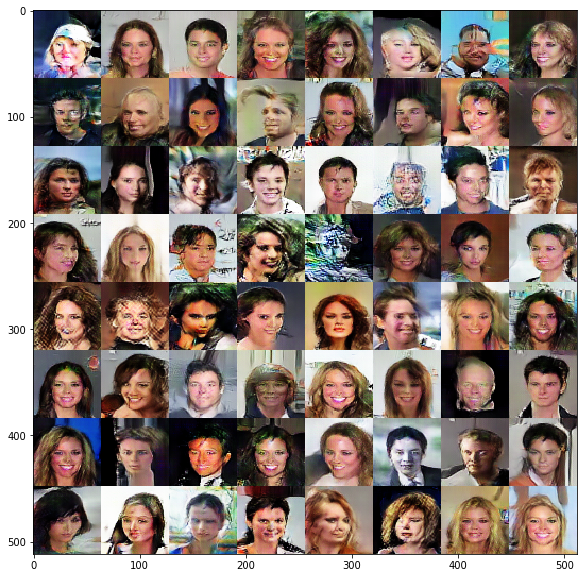

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
from skimage.io import imread

plt.figure(figsize = (20,10))
plt.imshow(imread('sample_faces/train_24_3139.png'))


## Face interpolation (1 point)

Let's interpolate between faces: generate two vectors $z_1$ and $z_2$ and get a batch of vectors of the form $\alpha\cdot z_1 + (1- \alpha)\cdot  z_2, \alpha \in [0,1].$ Generate faces on them and look at results. The generator displays pictures in the range from -1 to 1, so use the inverse transform function from the file utils.py.

Reading checkpoints...
INFO:tensorflow:Restoring parameters from checkpoint/dcgan.model
Loaded checkpoints


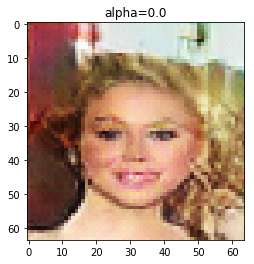

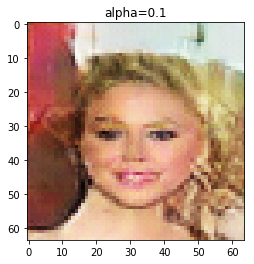

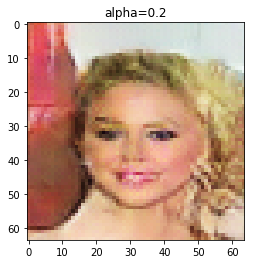

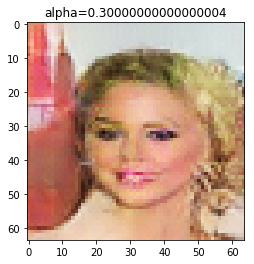

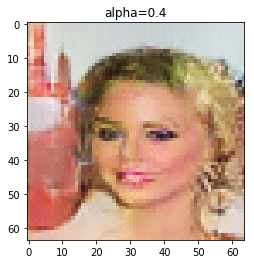

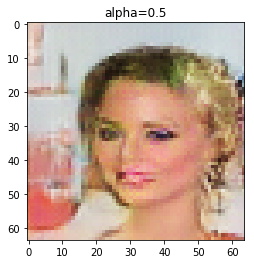

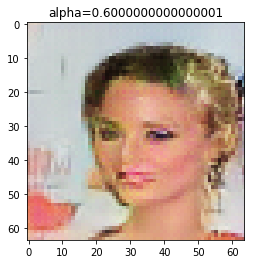

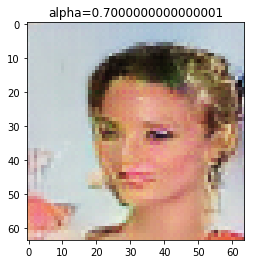

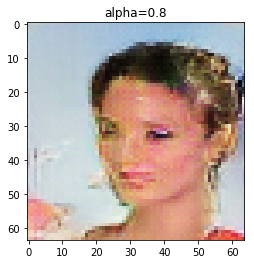

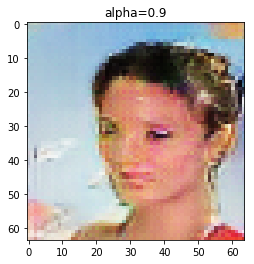

In [39]:
config = tf.ConfigProto()  
config.gpu_options.allow_growth=True  
with tf.Session(config=config) as sess:
    train(sess, load_dir='checkpoint', training=False)

    batchz1 = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)
    batchz2 = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)
    
    for alpha in np.arange(0, 1, 0.1):
        batch_z = batchz1 * alpha + (1 - alpha) * batchz2
    #     batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32) 

        gen_images = sess.run(G, feed_dict={z: batch_z, is_training: False} )
        gen_images = ((gen_images + 1) * 127.5).astype(np.uint8)
        plt.figure()
        plt.imshow(gen_images[0])
        plt.title('alpha={}'.format(alpha))

## Adding a smile (1 point + 1 point for good results)

Let's make face smiling. Find several vectors z, such that the generator generates smiling faces and not. Five vectors in every group should be enough (but the more, the better).

Calculate "smile vector" as mean of vectors z with generated smile on it minus mean of vectors z with generated not smile on it.

Look at the result of applying the smile vector: compare the results of generation before and after the addition of the smile vector.

Reading checkpoints...
INFO:tensorflow:Restoring parameters from checkpoint/dcgan.model
Loaded checkpoints


/home/bigdata/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


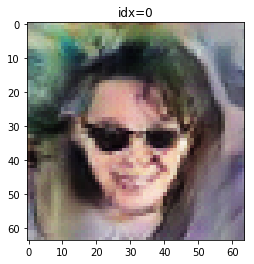

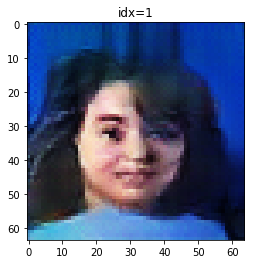

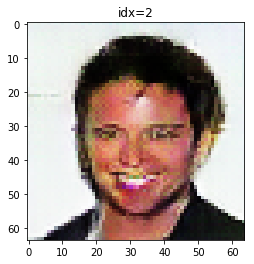

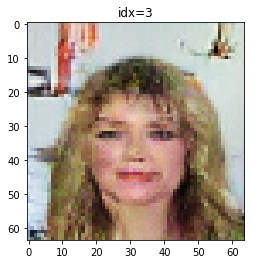

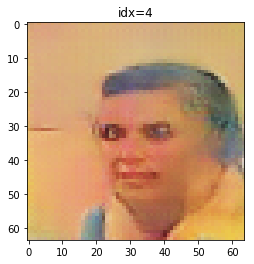

...

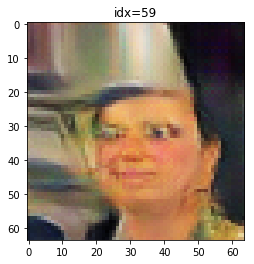

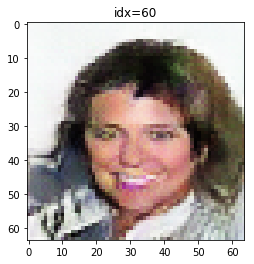

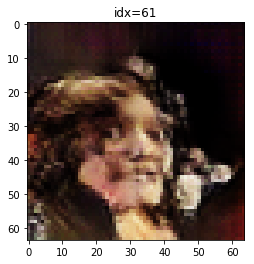

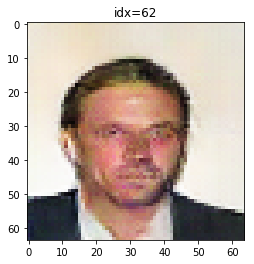

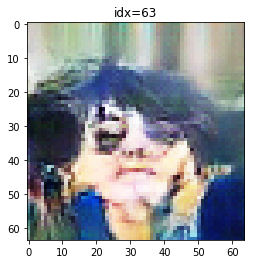

In [14]:
config = tf.ConfigProto()  
config.gpu_options.allow_growth=True  
with tf.Session(config=config) as sess:
    train(sess, load_dir='checkpoint', training=False)

    batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)
    
    gen_images = sess.run(G, feed_dict={z: batch_z, is_training: False} )
    gen_images = ((gen_images + 1) * 127.5).astype(np.uint8)
    for i in range(len(gen_images)):
        plt.figure()
        plt.imshow(gen_images[i])
        plt.title('idx={}'.format(i))

In [26]:
smile_idxes = [2, 6, 10, 12, 17, 26, 27, 28, 29, 31, 34, 43, 46, 60]

smile_vecs = batch_z[smile_idxes]

smile_vecs = np.mean(smile_vecs, axis=0, keepdims=True)

Reading checkpoints...
INFO:tensorflow:Restoring parameters from checkpoint/dcgan.model
Loaded checkpoints


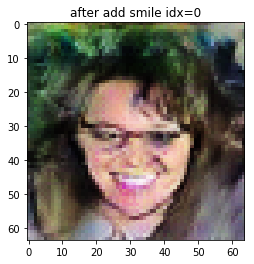

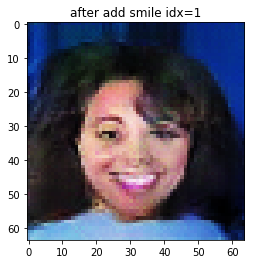

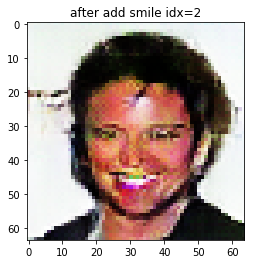

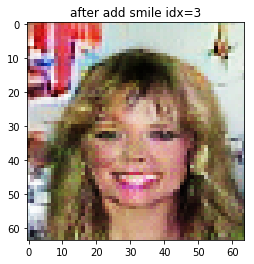

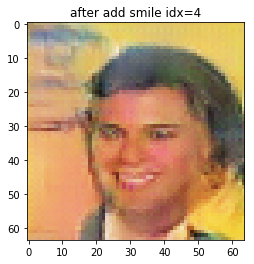

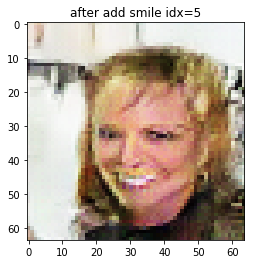

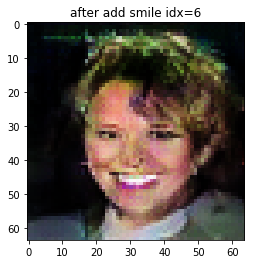

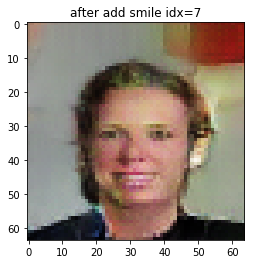

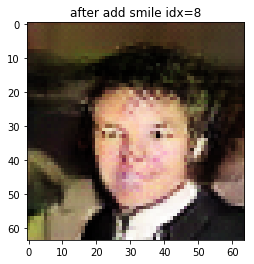

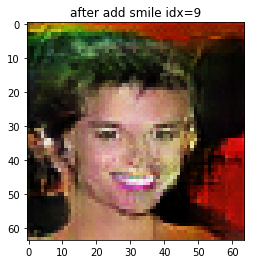

In [29]:
config = tf.ConfigProto()  
config.gpu_options.allow_growth=True  
with tf.Session(config=config) as sess:
    train(sess, load_dir='checkpoint', training=False)

    
    gen_images = sess.run(G, feed_dict={z: batch_z + smile_vecs, is_training: False} )
    gen_images = ((gen_images + 1) * 127.5).astype(np.uint8)
    for i in range(10):
        plt.figure()
        plt.imshow(gen_images[i])
        plt.title('after add smile idx={}'.format(i))

If faces looks really cool, add bonus 1 point to your score.